## Data Generation

In [48]:
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

np.random.seed(12)
num_observations = 5000

x1 = np.random.multivariate_normal([0, 0], [[1, .75],[.75, 1]], num_observations)
x2 = np.random.multivariate_normal([1, 4], [[1, .75],[.75, 1]], num_observations)

simulated_separableish_features = np.vstack((x1, x2)).astype(np.float32)
simulated_labels = np.hstack((np.zeros(num_observations),
                              np.ones(num_observations)))

## Data Visualisation 

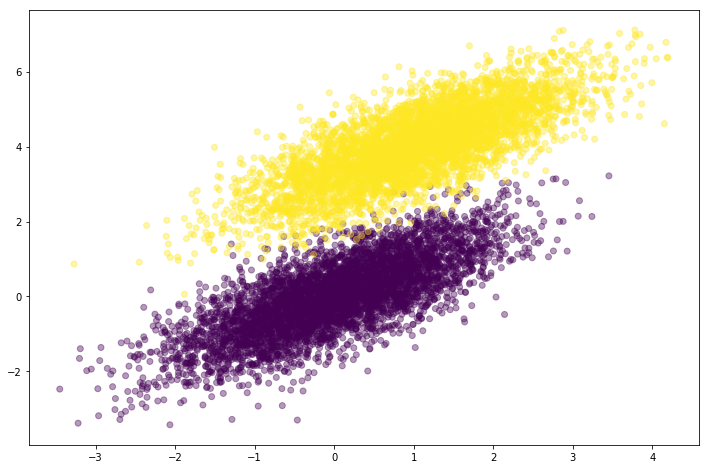

In [49]:
plt.figure(figsize=(12,8))
plt.scatter(simulated_separableish_features[:, 0], simulated_separableish_features[:, 1],
            c = simulated_labels, alpha = .4)

## Sigmoid Function

In [50]:
def sigmoid(z):
    '''1 / (1 + e^(-x))'''
    return 1 / (1 + np.exp(-z))

## Log-Likelihood

In [51]:
def log_likelihood(features, target, weights):
    '''
        U = sum(target * weights_tr * features - log(1 + exp(weights_tr * features)))
    '''
    scores = np.dot(features, weights)
    return np.sum(target * scores - np.log(1 + np.exp(scores)))

## Gradient of the Log-likelihood

In [77]:
def grad(features, target, predictions):
    '''
        grad(U) = features_tr * (target - predictions)
    '''

    diff = target - predictions
    print(target, predictions)
    return np.dot(features.T, diff)
    


## Logistic regression

In [78]:

def logistic_regression(features, target, num_steps, learning_rate):
    # add free coefficients as 1
    features = np.hstack(
        (np.ones((features.shape[0], 1)),features))
    
    # initialize weights
    weights = np.zeros(features.shape[1])
    print(len(weights))
    # iterative process
    for step in range(num_steps):
        scores = np.dot(features, weights)
        
        predictions = sigmoid(scores)

        # Update weights with gradient
        gradient = grad(features, target, predictions)
        weights += learning_rate * gradient
        
        # Print log-likelihood every so often
        if step % 10000 == 0:
            print(log_likelihood(features, target, weights))
        
    return weights

In [79]:
weights = logistic_regression(simulated_separableish_features, simulated_labels,
                     num_steps = 100000, learning_rate = 5e-5)
print(weights)
   

3
[ 0.  0.  0. ...,  1.  1.  1.] [ 0.5  0.5  0.5 ...,  0.5  0.5  0.5]
-4346.26477915
[ 0.  0.  0. ...,  1.  1.  1.] [ 0.40933872  0.40900526  0.34438045 ...,  0.91517011  0.89531785
  0.93250704]
[ 0.  0.  0. ...,  1.  1.  1.] [ 0.37591152  0.3714345   0.30498215 ...,  0.92700764  0.91218206
  0.94489174]
[ 0.  0.  0. ...,  1.  1.  1.] [ 0.34680076  0.33842486  0.27279263 ...,  0.9326386   0.92179047
  0.95134901]
[ 0.  0.  0. ...,  1.  1.  1.] [ 0.32092711  0.30900918  0.24551838 ...,  0.93559683  0.92818461
  0.95530095]
[ 0.  0.  0. ...,  1.  1.  1.] [ 0.29771243  0.2826546   0.22197921 ...,  0.93721571  0.93291438
  0.95800257]
[ 0.  0.  0. ...,  1.  1.  1.] [ 0.2767737   0.25898696  0.20144114 ...,  0.93811328  0.93669607
  0.96001922]
[ 0.  0.  0. ...,  1.  1.  1.] [ 0.25782377  0.23770623  0.18339257 ...,  0.93861144  0.93989714
  0.96163703]
[ 0.  0.  0. ...,  1.  1.  1.] [ 0.24063094  0.21855516  0.16744955 ...,  0.93888966  0.94271841
  0.96301123]
[ 0.  0.  0. ...,  1.  1.  

  0.99116452]
[ 0.  0.  0. ...,  1.  1.  1.] [ 0.02102238  0.01024407  0.00732843 ...,  0.95529574  0.99203172
  0.9912834 ]
[ 0.  0.  0. ...,  1.  1.  1.] [ 0.02062012  0.00999844  0.00715154 ...,  0.9554859   0.9921715
  0.99139965]
[ 0.  0.  0. ...,  1.  1.  1.] [ 0.02022955  0.00976114  0.00698069 ...,  0.95567411  0.99230757
  0.99151334]
[ 0.  0.  0. ...,  1.  1.  1.] [ 0.01985022  0.00953183  0.0068156  ...,  0.95586041  0.99244005
  0.99162455]
[ 0.  0.  0. ...,  1.  1.  1.] [ 0.0194817   0.00931014  0.00665604 ...,  0.95604482  0.99256907
  0.99173336]
[ 0.  0.  0. ...,  1.  1.  1.] [ 0.01912357  0.00909575  0.00650175 ...,  0.95622736  0.99269476
  0.99183984]
[ 0.  0.  0. ...,  1.  1.  1.] [ 0.01877544  0.00888835  0.00635252 ...,  0.95640808  0.99281723
  0.99194407]
[ 0.  0.  0. ...,  1.  1.  1.] [ 0.01843693  0.00868764  0.00620813 ...,  0.95658699  0.99293659
  0.9920461 ]
[ 0.  0.  0. ...,  1.  1.  1.] [ 0.01810768  0.00849335  0.00606837 ...,  0.95676412  0.99305294
  

[ 0.  0.  0. ...,  1.  1.  1.] [ 0.00595186  0.00211114  0.00149273 ...,  0.96729339  0.99756183
  0.99649721]
[ 0.  0.  0. ...,  1.  1.  1.] [ 0.00589206  0.00208471  0.00147389 ...,  0.96738326  0.99758527
  0.99652353]
[ 0.  0.  0. ...,  1.  1.  1.] [ 0.00583316  0.00205875  0.00145537 ...,  0.96747256  0.99760837
  0.99654953]
[ 0.  0.  0. ...,  1.  1.  1.] [ 0.00577512  0.00203323  0.00143717 ...,  0.96756129  0.99763115
  0.99657523]
[ 0.  0.  0. ...,  1.  1.  1.] [ 0.00571795  0.00200816  0.00141929 ...,  0.96764946  0.9976536
  0.99660061]
[ 0.  0.  0. ...,  1.  1.  1.] [ 0.00566162  0.00198352  0.00140172 ...,  0.96773707  0.99767574
  0.9966257 ]
[ 0.  0.  0. ...,  1.  1.  1.] [ 0.00560611  0.00195929  0.00138445 ...,  0.96782413  0.99769757
  0.9966505 ]
[ 0.  0.  0. ...,  1.  1.  1.] [ 0.00555141  0.00193548  0.00136748 ...,  0.96791065  0.99771909  0.996675  ]
[ 0.  0.  0. ...,  1.  1.  1.] [ 0.0054975   0.00191208  0.00135079 ...,  0.96799662  0.99774032
  0.99669922]
[ 0

[ 0.  0.  0. ...,  1.  1.  1.] [  3.00648793e-03   9.01866342e-04   6.32370711e-04 ...,   9.73058514e-01
   9.98737280e-01   9.97911843e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.98470344e-03   8.93747742e-04   6.26615992e-04 ...,   9.73116289e-01
   9.98746155e-01   9.97923468e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.96315005e-03   8.85729698e-04   6.20932979e-04 ...,   9.73173789e-01
   9.98754938e-01   9.97934992e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.94182449e-03   8.77810613e-04   6.15320527e-04 ...,   9.73231015e-01
   9.98763632e-01   9.97946416e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.92072357e-03   8.69988921e-04   6.09777516e-04 ...,   9.73287970e-01
   9.98772237e-01   9.97957742e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.89984413e-03   8.62263084e-04   6.04302846e-04 ...,   9.73344656e-01
   9.98780754e-01   9.97968971e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.87918307e-03   8.54631595e-04   5.98895438e-04 ...,   9.73401075e-01
   9.98789185e-01   9.97980104e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.69573434e-03   4.42838028e-04   3.07890048e-04 ...,   9.77360204e-01
   9.99277219e-01   9.98660451e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.68627548e-03   4.39775514e-04   3.05733452e-04 ...,   9.77399714e-01
   9.99281164e-01   9.98666302e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.67689287e-03   4.36741832e-04   3.03597311e-04 ...,   9.77439076e-01
   9.99285078e-01   9.98672115e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.66758569e-03   4.33736635e-04   3.01481376e-04 ...,   9.77478292e-01
   9.99288961e-01   9.98677888e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.65835315e-03   4.30759581e-04   2.99385406e-04 ...,   9.77517362e-01
   9.99292814e-01   9.98683624e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.64919444e-03   4.27810336e-04   2.97309161e-04 ...,   9.77556287e-01
   9.99296637e-01   9.98689321e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.64010880e-03   4.24888568e-04   2.95252404e-04 ...,   9.77595067e-01
   9.99300430e-01   9.98694981e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.06616164e-03   2.49128395e-04   1.71855615e-04 ...,   9.80471837e-01
   9.99541621e-01   9.99070751e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.06131143e-03   2.47725444e-04   1.70873895e-04 ...,   9.80500748e-01
   9.99543674e-01   9.99074106e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.05649279e-03   2.46333156e-04   1.69899701e-04 ...,   9.80529570e-01
   9.99545713e-01   9.99077444e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.05170543e-03   2.44951431e-04   1.68932962e-04 ...,   9.80558303e-01
   9.99547739e-01   9.99080763e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.04694909e-03   2.43580165e-04   1.67973606e-04 ...,   9.80586948e-01
   9.99549753e-01   9.99084065e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.04222351e-03   2.42219259e-04   1.67021560e-04 ...,   9.80615506e-01
   9.99551753e-01   9.99087348e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.03752843e-03   2.40868613e-04   1.66076755e-04 ...,   9.80643976e-01
   9.99553741e-01   9.99090614e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  7.30329358e-04   1.55973512e-04   1.06839552e-04 ...,   9.82762157e-01
   9.99684370e-01   9.99312768e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  7.27501326e-04   1.55226747e-04   1.06320036e-04 ...,   9.82784518e-01
   9.99685578e-01   9.99314902e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  7.24688832e-04   1.54484776e-04   1.05803888e-04 ...,   9.82806819e-01
   9.99686780e-01   9.99317026e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  7.21891763e-04   1.53747560e-04   1.05291080e-04 ...,   9.82829062e-01
   9.99687974e-01   9.99319140e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  7.19110009e-04   1.53015060e-04   1.04781585e-04 ...,   9.82851246e-01
   9.99689163e-01   9.99321244e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  7.16343461e-04   1.52287240e-04   1.04275376e-04 ...,   9.82873372e-01
   9.99690345e-01   9.99323339e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  7.13592008e-04   1.51564060e-04   1.03772426e-04 ...,   9.82895440e-01
   9.99691521e-01   9.99325424e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  5.21734726e-04   1.02910735e-04   7.00192859e-05 ...,   9.84617518e-01
   9.99773750e-01   9.99475740e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  5.19977654e-04   1.02482648e-04   6.97231588e-05 ...,   9.84635287e-01
   9.99774506e-01   9.99477167e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  5.18228921e-04   1.02056936e-04   6.94286917e-05 ...,   9.84653014e-01
   9.99775258e-01   9.99478589e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  5.16488474e-04   1.01633582e-04   6.91358727e-05 ...,   9.84670701e-01
   9.99776006e-01   9.99480005e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  5.14756263e-04   1.01212569e-04   6.88446904e-05 ...,   9.84688347e-01
   9.99776751e-01   9.99481415e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  5.13032237e-04   1.00793880e-04   6.85551333e-05 ...,   9.84705952e-01
   9.99777492e-01   9.99482819e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  5.11316345e-04   1.00377501e-04   6.82671899e-05 ...,   9.84723517e-01
   9.99778230e-01   9.99484218e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  4.01381950e-04   7.44360451e-05   5.03652183e-05 ...,   9.85950296e-01
   9.99825603e-01   9.99576128e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  4.00166872e-04   7.41579250e-05   5.01737421e-05 ...,   9.85965136e-01
   9.99826127e-01   9.99577172e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.98956951e-04   7.38811847e-05   4.99832265e-05 ...,   9.85979945e-01
   9.99826650e-01   9.99578211e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.97752159e-04   7.36058154e-05   4.97936656e-05 ...,   9.85994724e-01
   9.99827170e-01   9.99579247e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.96552466e-04   7.33318087e-05   4.96050533e-05 ...,   9.86009472e-01
   9.99827688e-01   9.99580279e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.95357846e-04   7.30591562e-05   4.94173837e-05 ...,   9.86024189e-01
   9.99828204e-01   9.99581308e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.94168269e-04   7.27878493e-05   4.92306509e-05 ...,   9.86038876e-01
   9.99828717e-01   9.99582333e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  3.28300606e-04   5.80822872e-05   3.91263896e-05 ...,   9.86906644e-01
   9.99857198e-01   9.99640150e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.27383562e-04   5.78821535e-05   3.89891309e-05 ...,   9.86919565e-01
   9.99857595e-01   9.99640971e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.26470096e-04   5.76829325e-05   3.88525058e-05 ...,   9.86932461e-01
   9.99857991e-01   9.99641789e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.25560189e-04   5.74846191e-05   3.87165104e-05 ...,   9.86945333e-01
   9.99858385e-01   9.99642604e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.24653824e-04   5.72872080e-05   3.85811411e-05 ...,   9.86958179e-01
   9.99858777e-01   9.99643417e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.23750983e-04   5.70906942e-05   3.84463945e-05 ...,   9.86971001e-01
   9.99859168e-01   9.99644227e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.22851647e-04   5.68950724e-05   3.83122668e-05 ...,   9.86983798e-01
   9.99859558e-01   9.99645035e-01]
[ 0.  0.  0. 

   9.99887862e-01   9.99704970e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.56915001e-04   4.29234865e-05   2.87535679e-05 ...,   9.87999683e-01
   9.99888145e-01   9.99705584e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.56263499e-04   4.27893062e-05   2.86619910e-05 ...,   9.88010590e-01
   9.99888428e-01   9.99706197e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.55614294e-04   4.26556791e-05   2.85707965e-05 ...,   9.88021478e-01
   9.99888710e-01   9.99706808e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.54967376e-04   4.25226023e-05   2.84799822e-05 ...,   9.88032346e-01
   9.99888991e-01   9.99707417e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.54322734e-04   4.23900730e-05   2.83895462e-05 ...,   9.88043196e-01
   9.99889271e-01   9.99708025e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.53680359e-04   4.22580884e-05   2.82994866e-05 ...,   9.88054027e-01
   9.99889550e-01   9.99708630e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.53040239e-04   4.21266457e-05   2.82098013e-05 ...,   9.88064838e-01
   9.99889828

[ 0.  0.  0. ...,  1.  1.  1.] [  2.18403509e-04   3.51353721e-05   2.34467047e-05 ...,   9.88680694e-01
   9.99904877e-01   9.99742373e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.17883598e-04   3.50323114e-05   2.33766030e-05 ...,   9.88690440e-01
   9.99905103e-01   9.99742878e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.17365404e-04   3.49296484e-05   2.33067753e-05 ...,   9.88700169e-01
   9.99905328e-01   9.99743381e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.16848918e-04   3.48273813e-05   2.32372203e-05 ...,   9.88709883e-01
   9.99905553e-01   9.99743883e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.16334134e-04   3.47255081e-05   2.31679368e-05 ...,   9.88719581e-01
   9.99905776e-01   9.99744384e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.15821044e-04   3.46240270e-05   2.30989233e-05 ...,   9.88729262e-01
   9.99906000e-01   9.99744883e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.15309641e-04   3.45229360e-05   2.30301786e-05 ...,   9.88738928e-01
   9.99906222e-01   9.99745381e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.85371093e-04   2.87068595e-05   1.90812793e-05 ...,   9.89334839e-01
   9.99919248e-01   9.99774953e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.84956843e-04   2.86278464e-05   1.90277224e-05 ...,   9.89343535e-01
   9.99919428e-01   9.99775368e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.84543873e-04   2.85491188e-05   1.89743616e-05 ...,   9.89352218e-01
   9.99919608e-01   9.99775782e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.84132179e-04   2.84706754e-05   1.89211961e-05 ...,   9.89360888e-01
   9.99919787e-01   9.99776196e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.83721754e-04   2.83925150e-05   1.88682248e-05 ...,   9.89369544e-01
   9.99919966e-01   9.99776608e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.83312595e-04   2.83146362e-05   1.88154471e-05 ...,   9.89378187e-01
   9.99920144e-01   9.99777019e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.82904695e-04   2.82370379e-05   1.87628618e-05 ...,   9.89386816e-01
   9.99920321e-01   9.99777429e-01]
[ 0.  0.  0. 

   9.99932653e-01   9.99806332e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.54272878e-04   2.28957883e-05   1.51499079e-05 ...,   9.90028774e-01
   9.99932794e-01   9.99806667e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.53951448e-04   2.28370608e-05   1.51102614e-05 ...,   9.90036427e-01
   9.99932934e-01   9.99807001e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.53630941e-04   2.27785306e-05   1.50707499e-05 ...,   9.90044069e-01
   9.99933073e-01   9.99807334e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.53311354e-04   2.27201969e-05   1.50313729e-05 ...,   9.90051700e-01
   9.99933213e-01   9.99807666e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.52992685e-04   2.26620588e-05   1.49921298e-05 ...,   9.90059320e-01
   9.99933351e-01   9.99807997e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.52674928e-04   2.26041155e-05   1.49530200e-05 ...,   9.90066928e-01
   9.99933490e-01   9.99808328e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.52358081e-04   2.25463662e-05   1.49140429e-05 ...,   9.90074526e-01
   9.99933628

[ 0.  0.  0. ...,  1.  1.  1.] [  1.31735369e-04   1.88501819e-05   1.24233770e-05 ...,   9.90594098e-01
   9.99942620e-01   9.99830409e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.31476792e-04   1.88046496e-05   1.23927480e-05 ...,   9.90600953e-01
   9.99942733e-01   9.99830686e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.31218913e-04   1.87592611e-05   1.23622171e-05 ...,   9.90607798e-01
   9.99942845e-01   9.99830962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.30961731e-04   1.87140157e-05   1.23317838e-05 ...,   9.90614634e-01
   9.99942958e-01   9.99831237e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.30705241e-04   1.86689130e-05   1.23014479e-05 ...,   9.90621460e-01
   9.99943069e-01   9.99831512e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.30449443e-04   1.86239523e-05   1.22712089e-05 ...,   9.90628277e-01
   9.99943181e-01   9.99831786e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.30194333e-04   1.85791331e-05   1.22410664e-05 ...,   9.90635085e-01
   9.99943292e-01   9.99832059e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.14340642e-04   1.58353540e-05   1.03985058e-05 ...,   9.91077159e-01
   9.99950209e-01   9.99849254e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.14127806e-04   1.57990931e-05   1.03741933e-05 ...,   9.91083367e-01
   9.99950302e-01   9.99849488e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.13915514e-04   1.57629406e-05   1.03499545e-05 ...,   9.91089568e-01
   9.99950395e-01   9.99849721e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.13703763e-04   1.57268959e-05   1.03257892e-05 ...,   9.91095760e-01
   9.99950487e-01   9.99849954e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.13492553e-04   1.56909589e-05   1.03016970e-05 ...,   9.91101945e-01
   9.99950580e-01   9.99850186e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.13281882e-04   1.56551289e-05   1.02776777e-05 ...,   9.91108121e-01
   9.99950671e-01   9.99850418e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.13071747e-04   1.56194058e-05   1.02537309e-05 ...,   9.91114289e-01
   9.99950763e-01   9.99850649e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  9.94223014e-05   1.33331425e-05   8.72344795e-06 ...,   9.91532666e-01
   9.99956721e-01   9.99865840e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.92466101e-05   1.33041678e-05   8.70408487e-06 ...,   9.91538295e-01
   9.99956798e-01   9.99866038e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.90713441e-05   1.32752752e-05   8.68477743e-06 ...,   9.91543918e-01
   9.99956875e-01   9.99866236e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.88965022e-05   1.32464643e-05   8.66552543e-06 ...,   9.91549533e-01
   9.99956951e-01   9.99866433e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.87220830e-05   1.32177349e-05   8.64632866e-06 ...,   9.91555142e-01
   9.99957027e-01   9.99866630e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.85480852e-05   1.31890866e-05   8.62718693e-06 ...,   9.91560744e-01
   9.99957103e-01   9.99866826e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.83745075e-05   1.31605192e-05   8.60810006e-06 ...,   9.91566339e-01
   9.99957179e-01   9.99867022e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  8.61748838e-05   1.11830050e-05   7.28892574e-06 ...,   9.91977326e-01
   9.99962506e-01   9.99880951e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.60304330e-05   1.11599604e-05   7.27357856e-06 ...,   9.91982418e-01
   9.99962569e-01   9.99881118e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.58863134e-05   1.11369776e-05   7.25827315e-06 ...,   9.91987504e-01
   9.99962632e-01   9.99881285e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.57425238e-05   1.11140563e-05   7.24300936e-06 ...,   9.91992585e-01
   9.99962695e-01   9.99881451e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.55990635e-05   1.10911963e-05   7.22778705e-06 ...,   9.91997659e-01
   9.99962757e-01   9.99881617e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.54559313e-05   1.10683975e-05   7.21260608e-06 ...,   9.92002727e-01
   9.99962820e-01   9.99881783e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.53131264e-05   1.10456597e-05   7.19746632e-06 ...,   9.92007789e-01
   9.99962882e-01   9.99881948e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  7.34565366e-05   9.18974092e-06   5.96394407e-06 ...,   9.92449398e-01
   9.99968060e-01   9.99895856e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  7.33404035e-05   9.17188675e-06   5.95210027e-06 ...,   9.92453949e-01
   9.99968111e-01   9.99895994e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  7.32245210e-05   9.15407762e-06   5.94028682e-06 ...,   9.92458496e-01
   9.99968162e-01   9.99896132e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  7.31088883e-05   9.13631339e-06   5.92850361e-06 ...,   9.92463037e-01
   9.99968212e-01   9.99896269e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  7.29935047e-05   9.11859393e-06   5.91675056e-06 ...,   9.92467574e-01
   9.99968263e-01   9.99896407e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  7.28783697e-05   9.10091908e-06   5.90502756e-06 ...,   9.92472105e-01
   9.99968313e-01   9.99896544e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  7.27634825e-05   9.08328872e-06   5.89333453e-06 ...,   9.92476631e-01
   9.99968363e-01   9.99896680e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  6.51999188e-05   7.93715354e-06   5.13421529e-06 ...,   9.92785645e-01
   9.99971666e-01   9.99905774e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  6.51012181e-05   7.92239203e-06   5.12445228e-06 ...,   9.92789830e-01
   9.99971710e-01   9.99905894e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  6.50027209e-05   7.90766612e-06   5.11471320e-06 ...,   9.92794010e-01
   9.99971753e-01   9.99906014e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  6.49044269e-05   7.89297571e-06   5.10499797e-06 ...,   9.92798186e-01
   9.99971796e-01   9.99906133e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  6.48063353e-05   7.87832070e-06   5.09530652e-06 ...,   9.92802358e-01
   9.99971838e-01   9.99906252e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  6.47084458e-05   7.86370097e-06   5.08563877e-06 ...,   9.92806525e-01
   9.99971881e-01   9.99906371e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  6.46107578e-05   7.84911643e-06   5.07599465e-06 ...,   9.92810688e-01
   9.99971924e-01   9.99906490e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  5.65005589e-05   6.65664284e-06   4.28878689e-06 ...,   9.93171801e-01
   9.99975466e-01   9.99916466e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  5.64193477e-05   6.64489191e-06   4.28104337e-06 ...,   9.93175583e-01
   9.99975501e-01   9.99916567e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  5.63382953e-05   6.63316785e-06   4.27331784e-06 ...,   9.93179363e-01
   9.99975537e-01   9.99916668e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  5.62574012e-05   6.62147058e-06   4.26561024e-06 ...,   9.93183138e-01
   9.99975572e-01   9.99916769e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  5.61766652e-05   6.60980003e-06   4.25792054e-06 ...,   9.93186909e-01
   9.99975607e-01   9.99916869e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  5.60960868e-05   6.59815612e-06   4.25024867e-06 ...,   9.93190677e-01
   9.99975642e-01   9.99916970e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  5.60156657e-05   6.58653877e-06   4.24259459e-06 ...,   9.93194441e-01
   9.99975678e-01   9.99917070e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  4.99898846e-05   5.72732317e-06   3.67732489e-06 ...,   9.93487140e-01
   9.99978309e-01   9.99924654e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  4.99211287e-05   5.71765116e-06   3.67097152e-06 ...,   9.93490610e-01
   9.99978339e-01   9.99924741e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  4.98525012e-05   5.70800029e-06   3.66463225e-06 ...,   9.93494076e-01
   9.99978369e-01   9.99924828e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  4.97840019e-05   5.69837049e-06   3.65830705e-06 ...,   9.93497539e-01
   9.99978399e-01   9.99924915e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  4.97156305e-05   5.68876171e-06   3.65199589e-06 ...,   9.93500998e-01
   9.99978428e-01   9.99925002e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  4.96473866e-05   5.67917390e-06   3.64569872e-06 ...,   9.93504454e-01
   9.99978458e-01   9.99925089e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  4.95792700e-05   5.66960698e-06   3.63941551e-06 ...,   9.93507906e-01
   9.99978488e-01   9.99925176e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  4.35326003e-05   4.83280091e-06   3.09075354e-06 ...,   9.93827582e-01
   9.99981128e-01   9.99932956e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  4.34756181e-05   4.82503610e-06   3.08567151e-06 ...,   9.93830728e-01
   9.99981153e-01   9.99933030e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  4.34187371e-05   4.81728742e-06   3.08060021e-06 ...,   9.93833871e-01
   9.99981177e-01   9.99933104e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  4.33619571e-05   4.80955482e-06   3.07553962e-06 ...,   9.93837011e-01
   9.99981202e-01   9.99933178e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  4.33052778e-05   4.80183825e-06   3.07048969e-06 ...,   9.93840148e-01
   9.99981227e-01   9.99933252e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  4.32486990e-05   4.79413769e-06   3.06545041e-06 ...,   9.93843282e-01
   9.99981252e-01   9.99933326e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  4.31922205e-05   4.78645308e-06   3.06042174e-06 ...,   9.93846413e-01
   9.99981276e-01   9.99933399e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  3.90290325e-05   4.22651659e-06   2.69450057e-06 ...,   9.94084940e-01
   9.99983093e-01   9.99938869e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.89798948e-05   4.21998655e-06   2.69023914e-06 ...,   9.94087852e-01
   9.99983114e-01   9.99938934e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.89308410e-05   4.21346954e-06   2.68598635e-06 ...,   9.94090761e-01
   9.99983136e-01   9.99938999e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.88818709e-05   4.20696552e-06   2.68174219e-06 ...,   9.94093667e-01
   9.99983157e-01   9.99939064e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.88329842e-05   4.20047446e-06   2.67750663e-06 ...,   9.94096570e-01
   9.99983179e-01   9.99939129e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.87841809e-05   4.19399634e-06   2.67327965e-06 ...,   9.94099471e-01
   9.99983200e-01   9.99939194e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.87354606e-05   4.18753111e-06   2.66906123e-06 ...,   9.94102370e-01
   9.99983221e-01   9.99939259e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  3.61344369e-05   3.84512782e-06   2.44586044e-06 ...,   9.94260654e-01
   9.99984356e-01   9.99942730e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.60901715e-05   3.83934832e-06   2.44209664e-06 ...,   9.94263411e-01
   9.99984375e-01   9.99942789e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.60459796e-05   3.83358002e-06   2.43834026e-06 ...,   9.94266165e-01
   9.99984394e-01   9.99942849e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.60018609e-05   3.82782291e-06   2.43459128e-06 ...,   9.94268916e-01
   9.99984414e-01   9.99942908e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.59578154e-05   3.82207696e-06   2.43084970e-06 ...,   9.94271665e-01
   9.99984433e-01   9.99942967e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.59138428e-05   3.81634213e-06   2.42711548e-06 ...,   9.94274412e-01
   9.99984452e-01   9.99943026e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.58699431e-05   3.81061841e-06   2.42338862e-06 ...,   9.94277157e-01
   9.99984471e-01   9.99943085e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  3.25041269e-05   3.37667543e-06   2.14121307e-06 ...,   9.94494358e-01
   9.99985939e-01   9.99947645e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.24657734e-05   3.37178780e-06   2.13803925e-06 ...,   9.94496914e-01
   9.99985956e-01   9.99947698e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.24274811e-05   3.36690930e-06   2.13487147e-06 ...,   9.94499469e-01
   9.99985973e-01   9.99947750e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.23892499e-05   3.36203989e-06   2.13170969e-06 ...,   9.94502021e-01
   9.99985989e-01   9.99947802e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.23510797e-05   3.35717957e-06   2.12855392e-06 ...,   9.94504571e-01
   9.99986006e-01   9.99947854e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.23129704e-05   3.35232831e-06   2.12540412e-06 ...,   9.94507119e-01
   9.99986022e-01   9.99947906e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.22749218e-05   3.34748608e-06   2.12226030e-06 ...,   9.94509665e-01
   9.99986039e-01   9.99947958e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  2.94174703e-05   2.98765470e-06   1.88893515e-06 ...,   9.94706634e-01
   9.99987285e-01   9.99951896e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.93839594e-05   2.98348058e-06   1.88623210e-06 ...,   9.94709015e-01
   9.99987299e-01   9.99951942e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.93505002e-05   2.97931397e-06   1.88353400e-06 ...,   9.94711394e-01
   9.99987314e-01   9.99951989e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.93170924e-05   2.97515487e-06   1.88084084e-06 ...,   9.94713771e-01
   9.99987328e-01   9.99952035e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.92837361e-05   2.97100324e-06   1.87815262e-06 ...,   9.94716147e-01
   9.99987343e-01   9.99952082e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.92504311e-05   2.96685908e-06   1.87546931e-06 ...,   9.94718520e-01
   9.99987358e-01   9.99952128e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.92171773e-05   2.96272237e-06   1.87279090e-06 ...,   9.94720892e-01
   9.99987372e-01   9.99952174e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  2.66555595e-05   2.64737097e-06   1.66886852e-06 ...,   9.94909021e-01
   9.99988488e-01   9.99955761e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.66262296e-05   2.64379902e-06   1.66656176e-06 ...,   9.94911241e-01
   9.99988501e-01   9.99955803e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.65969433e-05   2.64023328e-06   1.66425908e-06 ...,   9.94913459e-01
   9.99988514e-01   9.99955844e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.65677006e-05   2.63667373e-06   1.66196047e-06 ...,   9.94915675e-01
   9.99988526e-01   9.99955885e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.65385013e-05   2.63312035e-06   1.65966592e-06 ...,   9.94917889e-01
   9.99988539e-01   9.99955926e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.65093453e-05   2.62957315e-06   1.65737542e-06 ...,   9.94920101e-01
   9.99988552e-01   9.99955968e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.64802326e-05   2.62603209e-06   1.65508897e-06 ...,   9.94922312e-01
   9.99988565e-01   9.99956009e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  2.43104272e-05   2.36466840e-06   1.48652816e-06 ...,   9.95091649e-01
   9.99989510e-01   9.99959095e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.42845279e-05   2.36157985e-06   1.48453873e-06 ...,   9.95093727e-01
   9.99989521e-01   9.99959132e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.42586658e-05   2.35849648e-06   1.48255270e-06 ...,   9.95095804e-01
   9.99989532e-01   9.99959169e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.42328410e-05   2.35541829e-06   1.48057007e-06 ...,   9.95097879e-01
   9.99989543e-01   9.99959206e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.42070532e-05   2.35234528e-06   1.47859083e-06 ...,   9.95099952e-01
   9.99989555e-01   9.99959243e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.41813025e-05   2.34927742e-06   1.47661498e-06 ...,   9.95102024e-01
   9.99989566e-01   9.99959279e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.41555887e-05   2.34621472e-06   1.47464250e-06 ...,   9.95104094e-01
   9.99989577e-01   9.99959316e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  2.19395518e-05   2.08512819e-06   1.30672157e-06 ...,   9.95288053e-01
   9.99990542e-01   9.99962517e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.19170024e-05   2.08250129e-06   1.30503442e-06 ...,   9.95289984e-01
   9.99990551e-01   9.99962550e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.18944842e-05   2.07987864e-06   1.30335006e-06 ...,   9.95291913e-01
   9.99990561e-01   9.99962583e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.18719973e-05   2.07726024e-06   1.30166848e-06 ...,   9.95293842e-01
   9.99990571e-01   9.99962616e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.18495414e-05   2.07464608e-06   1.29998967e-06 ...,   9.95295769e-01
   9.99990581e-01   9.99962648e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.18271167e-05   2.07203615e-06   1.29831362e-06 ...,   9.95297694e-01
   9.99990590e-01   9.99962681e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.18047231e-05   2.06943044e-06   1.29664034e-06 ...,   9.95299618e-01
   9.99990600e-01   9.99962714e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.99893162e-05   1.86026337e-06   1.16248722e-06 ...,   9.95459957e-01
   9.99991390e-01   9.99965377e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.99694278e-05   1.85799506e-06   1.16103426e-06 ...,   9.95461763e-01
   9.99991399e-01   9.99965407e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.99495661e-05   1.85573031e-06   1.15958363e-06 ...,   9.95463569e-01
   9.99991407e-01   9.99965436e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.99297310e-05   1.85346910e-06   1.15813531e-06 ...,   9.95465373e-01
   9.99991416e-01   9.99965465e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.99099225e-05   1.85121144e-06   1.15668929e-06 ...,   9.95467175e-01
   9.99991424e-01   9.99965495e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.98901405e-05   1.84895731e-06   1.15524559e-06 ...,   9.95468977e-01
   9.99991433e-01   9.99965524e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.98703851e-05   1.84670671e-06   1.15380418e-06 ...,   9.95470777e-01
   9.99991442e-01   9.99965553e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.83897662e-05   1.67950734e-06   1.04683997e-06 ...,   9.95609043e-01
   9.99992085e-01   9.99967756e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.83719929e-05   1.67751836e-06   1.04556901e-06 ...,   9.95610745e-01
   9.99992093e-01   9.99967783e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.83542429e-05   1.67553241e-06   1.04430001e-06 ...,   9.95612445e-01
   9.99992101e-01   9.99967809e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.83365159e-05   1.67354948e-06   1.04303298e-06 ...,   9.95614145e-01
   9.99992109e-01   9.99967836e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.83188120e-05   1.67156956e-06   1.04176792e-06 ...,   9.95615843e-01
   9.99992116e-01   9.99967862e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.83011311e-05   1.66959266e-06   1.04050481e-06 ...,   9.95617540e-01
   9.99992124e-01   9.99967889e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.82834733e-05   1.66761876e-06   1.03924366e-06 ...,   9.95619235e-01
   9.99992132e-01   9.99967915e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.71023942e-05   1.53659114e-06   9.55609506e-07 ...,   9.95735085e-01
   9.99992645e-01   9.99969694e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.70862770e-05   1.53481698e-06   9.54478204e-07 ...,   9.95736700e-01
   9.99992652e-01   9.99969719e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.70701802e-05   1.53304546e-06   9.53348611e-07 ...,   9.95738314e-01
   9.99992659e-01   9.99969743e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.70541038e-05   1.53127656e-06   9.52220724e-07 ...,   9.95739927e-01
   9.99992666e-01   9.99969767e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.70380479e-05   1.52951028e-06   9.51094540e-07 ...,   9.95741539e-01
   9.99992673e-01   9.99969792e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.70220123e-05   1.52774663e-06   9.49970056e-07 ...,   9.95743150e-01
   9.99992680e-01   9.99969816e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.70059970e-05   1.52598558e-06   9.48847268e-07 ...,   9.95744760e-01
   9.99992687e-01   9.99969840e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.58313937e-05   1.39787107e-06   8.67250860e-07 ...,   9.95865520e-01
   9.99993197e-01   9.99971630e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.58168688e-05   1.39629999e-06   8.66251312e-07 ...,   9.95867047e-01
   9.99993203e-01   9.99971652e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.58023618e-05   1.39473117e-06   8.65253234e-07 ...,   9.95868574e-01
   9.99993210e-01   9.99971675e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.57878728e-05   1.39316462e-06   8.64256623e-07 ...,   9.95870100e-01
   9.99993216e-01   9.99971697e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.57734016e-05   1.39160033e-06   8.63261477e-07 ...,   9.95871625e-01
   9.99993222e-01   9.99971719e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.57589483e-05   1.39003829e-06   8.62267792e-07 ...,   9.95873149e-01
   9.99993228e-01   9.99971741e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.57445129e-05   1.38847851e-06   8.61275567e-07 ...,   9.95874672e-01
   9.99993235e-01   9.99971763e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.44891779e-05   1.25410376e-06   7.75899754e-07 ...,   9.96010604e-01
   9.99993780e-01   9.99973701e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.44762864e-05   1.25273709e-06   7.75032529e-07 ...,   9.96012037e-01
   9.99993785e-01   9.99973721e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.44634103e-05   1.25137234e-06   7.74166540e-07 ...,   9.96013470e-01
   9.99993791e-01   9.99973741e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.44505497e-05   1.25000949e-06   7.73301786e-07 ...,   9.96014902e-01
   9.99993796e-01   9.99973761e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.44377044e-05   1.24864855e-06   7.72438263e-07 ...,   9.96016332e-01
   9.99993802e-01   9.99973781e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.44248745e-05   1.24728952e-06   7.71575970e-07 ...,   9.96017762e-01
   9.99993807e-01   9.99973801e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.44120599e-05   1.24593238e-06   7.70714905e-07 ...,   9.96019191e-01
   9.99993813e-01   9.99973821e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.37302324e-05   1.17412208e-06   7.25186356e-07 ...,   9.96096393e-01
   9.99994109e-01   9.99974885e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.37182415e-05   1.17286630e-06   7.24390767e-07 ...,   9.96097772e-01
   9.99994114e-01   9.99974904e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.37062647e-05   1.17161225e-06   7.23596292e-07 ...,   9.96099150e-01
   9.99994119e-01   9.99974923e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.36943020e-05   1.17035992e-06   7.22802927e-07 ...,   9.96100527e-01
   9.99994124e-01   9.99974942e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.36823534e-05   1.16910930e-06   7.22010672e-07 ...,   9.96101904e-01
   9.99994130e-01   9.99974960e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.36704187e-05   1.16786041e-06   7.21219524e-07 ...,   9.96103279e-01
   9.99994135e-01   9.99974979e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.36584981e-05   1.16661322e-06   7.20429482e-07 ...,   9.96104654e-01
   9.99994140e-01   9.99974998e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.28576705e-05   1.08340055e-06   6.67765142e-07 ...,   9.96198769e-01
   9.99994487e-01   9.99976259e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.28466938e-05   1.08226795e-06   6.67048996e-07 ...,   9.96200084e-01
   9.99994492e-01   9.99976277e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.28357296e-05   1.08113687e-06   6.66333828e-07 ...,   9.96201398e-01
   9.99994497e-01   9.99976294e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.28247781e-05   1.08000730e-06   6.65619639e-07 ...,   9.96202712e-01
   9.99994501e-01   9.99976311e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.28138391e-05   1.07887926e-06   6.64906425e-07 ...,   9.96204024e-01
   9.99994506e-01   9.99976329e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.28029127e-05   1.07775272e-06   6.64194185e-07 ...,   9.96205336e-01
   9.99994511e-01   9.99976346e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.27919988e-05   1.07662769e-06   6.63482918e-07 ...,   9.96206647e-01
   9.99994516e-01   9.99976363e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.20682083e-05   1.00251000e-06   6.16665104e-07 ...,   9.96295196e-01
   9.99994829e-01   9.99977514e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.20581286e-05   1.00148477e-06   6.16018081e-07 ...,   9.96296452e-01
   9.99994834e-01   9.99977531e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.20480603e-05   1.00046089e-06   6.15371923e-07 ...,   9.96297708e-01
   9.99994838e-01   9.99977547e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.20380033e-05   9.99438349e-07   6.14726630e-07 ...,   9.96298962e-01
   9.99994842e-01   9.99977563e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.20279575e-05   9.98417151e-07   6.14082199e-07 ...,   9.96300216e-01
   9.99994847e-01   9.99977579e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.20179231e-05   9.97397293e-07   6.13438629e-07 ...,   9.96301470e-01
   9.99994851e-01   9.99977595e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.20078999e-05   9.96378771e-07   6.12795919e-07 ...,   9.96302722e-01
   9.99994855e-01   9.99977611e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.14452902e-05   9.39520522e-07   5.76943202e-07 ...,   9.96374090e-01
   9.99995099e-01   9.99978514e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.14359041e-05   9.38577219e-07   5.76348832e-07 ...,   9.96375299e-01
   9.99995103e-01   9.99978529e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.14265284e-05   9.37635131e-07   5.75755242e-07 ...,   9.96376507e-01
   9.99995107e-01   9.99978544e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.14171630e-05   9.36694256e-07   5.75162431e-07 ...,   9.96377714e-01
   9.99995111e-01   9.99978559e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.14078080e-05   9.35754593e-07   5.74570398e-07 ...,   9.96378921e-01
   9.99995115e-01   9.99978574e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.13984633e-05   9.34816139e-07   5.73979142e-07 ...,   9.96380127e-01
   9.99995119e-01   9.99978589e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.13891288e-05   9.33878893e-07   5.73388662e-07 ...,   9.96381332e-01
   9.99995123e-01   9.99978604e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.07001996e-05   8.65192392e-07   5.30155884e-07 ...,   9.96472043e-01
   9.99995422e-01   9.99979720e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.06916260e-05   8.64343758e-07   5.29622253e-07 ...,   9.96473195e-01
   9.99995425e-01   9.99979734e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.06830617e-05   8.63496191e-07   5.29089307e-07 ...,   9.96474345e-01
   9.99995429e-01   9.99979748e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.06745066e-05   8.62649691e-07   5.28557044e-07 ...,   9.96475495e-01
   9.99995433e-01   9.99979762e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.06659607e-05   8.61804256e-07   5.28025463e-07 ...,   9.96476645e-01
   9.99995437e-01   9.99979776e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.06574240e-05   8.60959884e-07   5.27494564e-07 ...,   9.96477793e-01
   9.99995440e-01   9.99979790e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.06488965e-05   8.60116573e-07   5.26964345e-07 ...,   9.96478942e-01
   9.99995444e-01   9.99979804e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  9.82517955e-06   7.79390485e-07   4.76270790e-07 ...,   9.96592639e-01
   9.99995800e-01   9.99981153e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.81753529e-06   7.78648277e-07   4.75805293e-07 ...,   9.96593722e-01
   9.99995804e-01   9.99981166e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.80989903e-06   7.77906976e-07   4.75340376e-07 ...,   9.96594803e-01
   9.99995807e-01   9.99981178e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.80227076e-06   7.77166581e-07   4.74876037e-07 ...,   9.96595884e-01
   9.99995810e-01   9.99981191e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.79465046e-06   7.76427089e-07   4.74412277e-07 ...,   9.96596965e-01
   9.99995813e-01   9.99981204e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.78703813e-06   7.75688500e-07   4.73949094e-07 ...,   9.96598045e-01
   9.99995817e-01   9.99981216e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.77943375e-06   7.74950813e-07   4.73486487e-07 ...,   9.96599124e-01
   9.99995820e-01   9.99981229e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  9.23103237e-06   7.22097706e-07   4.40371404e-07 ...,   9.96678364e-01
   9.99996057e-01   9.99982137e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.22400311e-06   7.21424752e-07   4.39950147e-07 ...,   9.96679398e-01
   9.99996060e-01   9.99982149e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.21698104e-06   7.20752602e-07   4.39529403e-07 ...,   9.96680432e-01
   9.99996063e-01   9.99982161e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.20996616e-06   7.20081255e-07   4.39109173e-07 ...,   9.96681465e-01
   9.99996066e-01   9.99982172e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.20295846e-06   7.19410710e-07   4.38689454e-07 ...,   9.96682498e-01
   9.99996069e-01   9.99982184e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.19595793e-06   7.18740966e-07   4.38270246e-07 ...,   9.96683530e-01
   9.99996072e-01   9.99982196e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.18896455e-06   7.18072022e-07   4.37851548e-07 ...,   9.96684561e-01
   9.99996075e-01   9.99982207e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  8.53690741e-06   6.56214141e-07   3.99177843e-07 ...,   9.96782946e-01
   9.99996357e-01   9.99983299e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.53057942e-06   6.55618910e-07   3.98806137e-07 ...,   9.96783923e-01
   9.99996360e-01   9.99983310e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.52425773e-06   6.55024372e-07   3.98434871e-07 ...,   9.96784900e-01
   9.99996363e-01   9.99983320e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.51794235e-06   6.54430526e-07   3.98064046e-07 ...,   9.96785876e-01
   9.99996365e-01   9.99983331e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.51163325e-06   6.53837370e-07   3.97693660e-07 ...,   9.96786852e-01
   9.99996368e-01   9.99983341e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.50533043e-06   6.53244904e-07   3.97323713e-07 ...,   9.96787827e-01
   9.99996371e-01   9.99983352e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.49903389e-06   6.52653126e-07   3.96954205e-07 ...,   9.96788801e-01
   9.99996373e-01   9.99983363e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  7.87699074e-06   5.94687166e-07   3.60802366e-07 ...,   9.96887353e-01
   9.99996642e-01   9.99984416e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  7.87131145e-06   5.94162553e-07   3.60475573e-07 ...,   9.96888275e-01
   9.99996644e-01   9.99984426e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  7.86563766e-06   5.93638532e-07   3.60149158e-07 ...,   9.96889196e-01
   9.99996647e-01   9.99984436e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  7.85996937e-06   5.93115105e-07   3.59823119e-07 ...,   9.96890116e-01
   9.99996649e-01   9.99984445e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  7.85430658e-06   5.92592269e-07   3.59497457e-07 ...,   9.96891036e-01
   9.99996652e-01   9.99984455e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  7.84864926e-06   5.92070025e-07   3.59172169e-07 ...,   9.96891956e-01
   9.99996654e-01   9.99984465e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  7.84299743e-06   5.91548371e-07   3.58847257e-07 ...,   9.96892875e-01
   9.99996657e-01   9.99984474e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  7.25836187e-06   5.38053888e-07   3.25568122e-07 ...,   9.96990233e-01
   9.99996909e-01   9.99985477e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  7.25327392e-06   5.37592475e-07   3.25281431e-07 ...,   9.96991101e-01
   9.99996911e-01   9.99985485e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  7.24819077e-06   5.37131569e-07   3.24995061e-07 ...,   9.96991968e-01
   9.99996913e-01   9.99985494e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  7.24311241e-06   5.36671171e-07   3.24709013e-07 ...,   9.96992836e-01
   9.99996916e-01   9.99985503e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  7.23803883e-06   5.36211278e-07   3.24423285e-07 ...,   9.96993702e-01
   9.99996918e-01   9.99985512e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  7.23297003e-06   5.35751891e-07   3.24137877e-07 ...,   9.96994569e-01
   9.99996920e-01   9.99985521e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  7.22790600e-06   5.35293009e-07   3.23852789e-07 ...,   9.96995434e-01
   9.99996922e-01   9.99985529e-01]
[ 0.  0.  0. 

   9.99997136e-01   9.99986391e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  6.72624829e-06   4.90199887e-07   2.95869389e-07 ...,   9.97083121e-01
   9.99997138e-01   9.99986399e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  6.72165534e-06   4.89790437e-07   2.95615591e-07 ...,   9.97083942e-01
   9.99997140e-01   9.99986407e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  6.71706660e-06   4.89381426e-07   2.95362070e-07 ...,   9.97084762e-01
   9.99997142e-01   9.99986415e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  6.71248207e-06   4.88972853e-07   2.95108827e-07 ...,   9.97085583e-01
   9.99997144e-01   9.99986423e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  6.70790175e-06   4.88564718e-07   2.94855860e-07 ...,   9.97086402e-01
   9.99997146e-01   9.99986431e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  6.70332563e-06   4.88157019e-07   2.94603169e-07 ...,   9.97087222e-01
   9.99997148e-01   9.99986439e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  6.69875371e-06   4.87749757e-07   2.94350754e-07 ...,   9.97088041e-01
   9.99997150

[ 0.  0.  0. ...,  1.  1.  1.] [  6.26612627e-06   4.49499334e-07   2.70668531e-07 ...,   9.97167142e-01
   9.99997337e-01   9.99987206e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  6.26195065e-06   4.49132972e-07   2.70441948e-07 ...,   9.97167921e-01
   9.99997338e-01   9.99987213e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  6.25777877e-06   4.48766992e-07   2.70215605e-07 ...,   9.97168700e-01
   9.99997340e-01   9.99987221e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  6.25361063e-06   4.48401395e-07   2.69989504e-07 ...,   9.97169479e-01
   9.99997342e-01   9.99987228e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  6.24944622e-06   4.48036180e-07   2.69763645e-07 ...,   9.97170257e-01
   9.99997344e-01   9.99987235e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  6.24528554e-06   4.47671347e-07   2.69538025e-07 ...,   9.97171035e-01
   9.99997345e-01   9.99987243e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  6.24112858e-06   4.47306894e-07   2.69312647e-07 ...,   9.97171813e-01
   9.99997347e-01   9.99987250e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  5.90482101e-06   4.18005118e-07   2.51208202e-07 ...,   9.97235801e-01
   9.99997492e-01   9.99987845e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  5.90096583e-06   4.17671354e-07   2.51002167e-07 ...,   9.97236548e-01
   9.99997494e-01   9.99987852e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  5.89711404e-06   4.17337932e-07   2.50796347e-07 ...,   9.97237294e-01
   9.99997495e-01   9.99987859e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  5.89326562e-06   4.17004851e-07   2.50590743e-07 ...,   9.97238039e-01
   9.99997497e-01   9.99987866e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  5.88942059e-06   4.16672111e-07   2.50385353e-07 ...,   9.97238784e-01
   9.99997499e-01   9.99987873e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  5.88557892e-06   4.16339712e-07   2.50180177e-07 ...,   9.97239529e-01
   9.99997500e-01   9.99987879e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  5.88174062e-06   4.16007653e-07   2.49975216e-07 ...,   9.97240274e-01
   9.99997502e-01   9.99987886e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  5.56385435e-06   3.88677935e-07   2.33121026e-07 ...,   9.97302989e-01
   9.99997639e-01   9.99988454e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  5.56029548e-06   3.88373911e-07   2.32933704e-07 ...,   9.97303704e-01
   9.99997640e-01   9.99988460e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  5.55673966e-06   3.88070192e-07   2.32746574e-07 ...,   9.97304418e-01
   9.99997642e-01   9.99988467e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  5.55318690e-06   3.87766777e-07   2.32559636e-07 ...,   9.97305132e-01
   9.99997643e-01   9.99988473e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  5.54963720e-06   3.87463667e-07   2.32372889e-07 ...,   9.97305845e-01
   9.99997645e-01   9.99988479e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  5.54609055e-06   3.87160861e-07   2.32186333e-07 ...,   9.97306558e-01
   9.99997646e-01   9.99988486e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  5.54254694e-06   3.86858359e-07   2.31999968e-07 ...,   9.97307271e-01
   9.99997648e-01   9.99988492e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  5.19652801e-06   3.57532696e-07   2.13951580e-07 ...,   9.97378242e-01
   9.99997797e-01   9.99989115e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  5.19328144e-06   3.57259569e-07   2.13783662e-07 ...,   9.97378922e-01
   9.99997798e-01   9.99989121e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  5.19003760e-06   3.56986711e-07   2.13615912e-07 ...,   9.97379601e-01
   9.99997799e-01   9.99989127e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  5.18679648e-06   3.56714119e-07   2.13448330e-07 ...,   9.97380280e-01
   9.99997801e-01   9.99989133e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  5.18355808e-06   3.56441795e-07   2.13280916e-07 ...,   9.97380958e-01
   9.99997802e-01   9.99989139e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  5.18032241e-06   3.56169738e-07   2.13113669e-07 ...,   9.97381636e-01
   9.99997804e-01   9.99989145e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  5.17708944e-06   3.55897947e-07   2.12946589e-07 ...,   9.97382314e-01
   9.99997805e-01   9.99989151e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  4.91191945e-06   3.33736787e-07   1.99334784e-07 ...,   9.97438806e-01
   9.99997919e-01   9.99989633e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  4.90890974e-06   3.33486766e-07   1.99181348e-07 ...,   9.97439457e-01
   9.99997920e-01   9.99989638e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  4.90590250e-06   3.33236985e-07   1.99028063e-07 ...,   9.97440109e-01
   9.99997921e-01   9.99989644e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  4.90289775e-06   3.32987443e-07   1.98874929e-07 ...,   9.97440760e-01
   9.99997923e-01   9.99989649e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  4.89989547e-06   3.32738142e-07   1.98721944e-07 ...,   9.97441411e-01
   9.99997924e-01   9.99989655e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  4.89689567e-06   3.32489080e-07   1.98569109e-07 ...,   9.97442061e-01
   9.99997925e-01   9.99989660e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  4.89389833e-06   3.32240257e-07   1.98416424e-07 ...,   9.97442711e-01
   9.99997927e-01   9.99989666e-01]
[ 0.  0.  0. 

   9.99998057e-01   9.99990224e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  4.58693640e-06   3.06941822e-07   1.82908675e-07 ...,   9.97510628e-01
   9.99998058e-01   9.99990229e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  4.58419145e-06   3.06717266e-07   1.82771171e-07 ...,   9.97511247e-01
   9.99998060e-01   9.99990234e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  4.58144871e-06   3.06492921e-07   1.82633798e-07 ...,   9.97511867e-01
   9.99998061e-01   9.99990239e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  4.57870817e-06   3.06268786e-07   1.82496557e-07 ...,   9.97512486e-01
   9.99998062e-01   9.99990244e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  4.57596984e-06   3.06044862e-07   1.82359448e-07 ...,   9.97513105e-01
   9.99998063e-01   9.99990249e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  4.57323371e-06   3.05821149e-07   1.82222470e-07 ...,   9.97513723e-01
   9.99998064e-01   9.99990254e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  4.57049979e-06   3.05597645e-07   1.82085623e-07 ...,   9.97514341e-01
   9.99998065

[ 0.  0.  0. ...,  1.  1.  1.] [  4.30785094e-06   2.84267340e-07   1.69037970e-07 ...,   9.97574813e-01
   9.99998178e-01   9.99990745e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  4.30532830e-06   2.84063853e-07   1.68913620e-07 ...,   9.97575404e-01
   9.99998179e-01   9.99990750e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  4.30280765e-06   2.83860552e-07   1.68789386e-07 ...,   9.97575995e-01
   9.99998180e-01   9.99990755e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  4.30028899e-06   2.83657438e-07   1.68665268e-07 ...,   9.97576586e-01
   9.99998181e-01   9.99990760e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  4.29777231e-06   2.83454511e-07   1.68541267e-07 ...,   9.97577177e-01
   9.99998182e-01   9.99990764e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  4.29525761e-06   2.83251771e-07   1.68417382e-07 ...,   9.97577768e-01
   9.99998183e-01   9.99990769e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  4.29274489e-06   2.83049216e-07   1.68293614e-07 ...,   9.97578358e-01
   9.99998185e-01   9.99990774e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  4.06278400e-06   2.64625643e-07   1.57046127e-07 ...,   9.97633284e-01
   9.99998283e-01   9.99991203e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  4.06045257e-06   2.64440029e-07   1.56932914e-07 ...,   9.97633851e-01
   9.99998284e-01   9.99991207e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  4.05812294e-06   2.64254583e-07   1.56819806e-07 ...,   9.97634417e-01
   9.99998285e-01   9.99991212e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  4.05579511e-06   2.64069303e-07   1.56706801e-07 ...,   9.97634983e-01
   9.99998286e-01   9.99991216e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  4.05346908e-06   2.63884190e-07   1.56593900e-07 ...,   9.97635549e-01
   9.99998287e-01   9.99991221e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  4.05114484e-06   2.63699244e-07   1.56481103e-07 ...,   9.97636114e-01
   9.99998288e-01   9.99991225e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  4.04882239e-06   2.63514464e-07   1.56368409e-07 ...,   9.97636679e-01
   9.99998289e-01   9.99991229e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  3.84044090e-06   2.47032921e-07   1.46325288e-07 ...,   9.97688210e-01
   9.99998378e-01   9.99991622e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.83827958e-06   2.46863003e-07   1.46221838e-07 ...,   9.97688753e-01
   9.99998379e-01   9.99991626e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.83611989e-06   2.46693236e-07   1.46118482e-07 ...,   9.97689296e-01
   9.99998380e-01   9.99991630e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.83396184e-06   2.46523618e-07   1.46015220e-07 ...,   9.97689839e-01
   9.99998381e-01   9.99991634e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.83180543e-06   2.46354150e-07   1.45912050e-07 ...,   9.97690381e-01
   9.99998382e-01   9.99991638e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.82965064e-06   2.46184832e-07   1.45808973e-07 ...,   9.97690924e-01
   9.99998383e-01   9.99991642e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.82749749e-06   2.46015663e-07   1.45705989e-07 ...,   9.97691466e-01
   9.99998384e-01   9.99991646e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  3.65230123e-06   2.32323029e-07   1.37376797e-07 ...,   9.97736207e-01
   9.99998459e-01   9.99991979e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.65028124e-06   2.32165997e-07   1.37281349e-07 ...,   9.97736730e-01
   9.99998460e-01   9.99991982e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.64826277e-06   2.32009101e-07   1.37185987e-07 ...,   9.97737253e-01
   9.99998461e-01   9.99991986e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.64624579e-06   2.31852342e-07   1.37090708e-07 ...,   9.97737776e-01
   9.99998462e-01   9.99991990e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.64423031e-06   2.31695718e-07   1.36995514e-07 ...,   9.97738299e-01
   9.99998462e-01   9.99991994e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.64221634e-06   2.31539231e-07   1.36900405e-07 ...,   9.97738821e-01
   9.99998463e-01   9.99991998e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.64020386e-06   2.31382879e-07   1.36805380e-07 ...,   9.97739343e-01
   9.99998464e-01   9.99992002e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  3.47258763e-06   2.18429229e-07   1.28938674e-07 ...,   9.97783468e-01
   9.99998536e-01   9.99992322e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.47070035e-06   2.18284159e-07   1.28850643e-07 ...,   9.97783972e-01
   9.99998537e-01   9.99992326e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.46881446e-06   2.18139213e-07   1.28762689e-07 ...,   9.97784476e-01
   9.99998537e-01   9.99992329e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.46692994e-06   2.17994391e-07   1.28674811e-07 ...,   9.97784979e-01
   9.99998538e-01   9.99992333e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.46504681e-06   2.17849693e-07   1.28587010e-07 ...,   9.97785483e-01
   9.99998539e-01   9.99992336e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.46316505e-06   2.17705117e-07   1.28499286e-07 ...,   9.97785986e-01
   9.99998540e-01   9.99992340e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.46128467e-06   2.17560665e-07   1.28411638e-07 ...,   9.97786489e-01
   9.99998541e-01   9.99992344e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  3.29225520e-06   2.04648276e-07   1.20583322e-07 ...,   9.97832398e-01
   9.99998613e-01   9.99992669e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.29049875e-06   2.04514862e-07   1.20502506e-07 ...,   9.97832882e-01
   9.99998614e-01   9.99992672e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.28874357e-06   2.04381559e-07   1.20421759e-07 ...,   9.97833366e-01
   9.99998614e-01   9.99992676e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.28698965e-06   2.04248369e-07   1.20341081e-07 ...,   9.97833850e-01
   9.99998615e-01   9.99992679e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.28523698e-06   2.04115290e-07   1.20260472e-07 ...,   9.97834334e-01
   9.99998616e-01   9.99992683e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.28348558e-06   2.03982322e-07   1.20179932e-07 ...,   9.97834818e-01
   9.99998617e-01   9.99992686e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.28173544e-06   2.03849466e-07   1.20099461e-07 ...,   9.97835301e-01
   9.99998617e-01   9.99992689e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  3.10312915e-06   1.90375596e-07   1.11945833e-07 ...,   9.97885479e-01
   9.99998694e-01   9.99993036e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.10150730e-06   1.90254023e-07   1.11872333e-07 ...,   9.97885943e-01
   9.99998694e-01   9.99993039e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.09988660e-06   1.90132550e-07   1.11798895e-07 ...,   9.97886406e-01
   9.99998695e-01   9.99993042e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.09826704e-06   1.90011176e-07   1.11725518e-07 ...,   9.97886869e-01
   9.99998696e-01   9.99993045e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.09664862e-06   1.89889902e-07   1.11652203e-07 ...,   9.97887332e-01
   9.99998696e-01   9.99993048e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.09503134e-06   1.89768728e-07   1.11578949e-07 ...,   9.97887795e-01
   9.99998697e-01   9.99993052e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.09341520e-06   1.89647653e-07   1.11505757e-07 ...,   9.97888257e-01
   9.99998698e-01   9.99993055e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  2.94946881e-06   1.78921091e-07   1.05026437e-07 ...,   9.97930057e-01
   9.99998759e-01   9.99993336e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.94795429e-06   1.78808842e-07   1.04958688e-07 ...,   9.97930503e-01
   9.99998760e-01   9.99993339e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.94644082e-06   1.78696685e-07   1.04890996e-07 ...,   9.97930949e-01
   9.99998761e-01   9.99993342e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.94492839e-06   1.78584617e-07   1.04823359e-07 ...,   9.97931395e-01
   9.99998761e-01   9.99993345e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.94341702e-06   1.78472640e-07   1.04755778e-07 ...,   9.97931841e-01
   9.99998762e-01   9.99993348e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.94190668e-06   1.78360754e-07   1.04688252e-07 ...,   9.97932287e-01
   9.99998763e-01   9.99993351e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.94039740e-06   1.78248957e-07   1.04620782e-07 ...,   9.97932732e-01
   9.99998763e-01   9.99993354e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  2.79037178e-06   1.67200967e-07   9.79590278e-08 ...,   9.97977707e-01
   9.99998827e-01   9.99993649e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.78896639e-06   1.67098087e-07   9.78970481e-08 ...,   9.97978135e-01
   9.99998828e-01   9.99993652e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.78756195e-06   1.66995289e-07   9.78351185e-08 ...,   9.97978563e-01
   9.99998828e-01   9.99993655e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.78615846e-06   1.66892572e-07   9.77732390e-08 ...,   9.97978991e-01
   9.99998829e-01   9.99993658e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.78475593e-06   1.66789936e-07   9.77114094e-08 ...,   9.97979419e-01
   9.99998830e-01   9.99993661e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.78335435e-06   1.66687382e-07   9.76496298e-08 ...,   9.97979846e-01
   9.99998830e-01   9.99993663e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.78195372e-06   1.66584909e-07   9.75879001e-08 ...,   9.97980273e-01
   9.99998831e-01   9.99993666e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  2.65442995e-06   1.57303770e-07   9.20013283e-08 ...,   9.98019731e-01
   9.99998885e-01   9.99993919e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.65311613e-06   1.57208659e-07   9.19441244e-08 ...,   9.98020143e-01
   9.99998886e-01   9.99993922e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.65180319e-06   1.57113623e-07   9.18869659e-08 ...,   9.98020555e-01
   9.99998886e-01   9.99993924e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.65049113e-06   1.57018660e-07   9.18298528e-08 ...,   9.98020967e-01
   9.99998887e-01   9.99993927e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.64917995e-06   1.56923772e-07   9.17727851e-08 ...,   9.98021379e-01
   9.99998887e-01   9.99993930e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.64786964e-06   1.56828957e-07   9.17157627e-08 ...,   9.98021791e-01
   9.99998888e-01   9.99993932e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.64656020e-06   1.56734216e-07   9.16587856e-08 ...,   9.98022203e-01
   9.99998889e-01   9.99993935e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  2.54954721e-06   1.49744418e-07   8.74577678e-08 ...,   9.98053042e-01
   9.99998930e-01   9.99994128e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.54830297e-06   1.49655150e-07   8.74041499e-08 ...,   9.98053443e-01
   9.99998930e-01   9.99994131e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.54705955e-06   1.49565951e-07   8.73505741e-08 ...,   9.98053842e-01
   9.99998931e-01   9.99994133e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.54581694e-06   1.49476820e-07   8.72970403e-08 ...,   9.98054242e-01
   9.99998931e-01   9.99994136e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.54457516e-06   1.49387757e-07   8.72435485e-08 ...,   9.98054642e-01
   9.99998932e-01   9.99994138e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.54333419e-06   1.49298763e-07   8.71900985e-08 ...,   9.98055041e-01
   9.99998933e-01   9.99994141e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.54209404e-06   1.49209837e-07   8.71366904e-08 ...,   9.98055441e-01
   9.99998933e-01   9.99994143e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  2.41051496e-06   1.39830529e-07   8.15085682e-08 ...,   9.98098490e-01
   9.99998989e-01   9.99994408e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.40936144e-06   1.39748798e-07   8.14595693e-08 ...,   9.98098874e-01
   9.99998990e-01   9.99994410e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.40820867e-06   1.39667128e-07   8.14106080e-08 ...,   9.98099257e-01
   9.99998990e-01   9.99994412e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.40705664e-06   1.39585520e-07   8.13616844e-08 ...,   9.98099641e-01
   9.99998991e-01   9.99994415e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.40590536e-06   1.39503973e-07   8.13127984e-08 ...,   9.98100024e-01
   9.99998991e-01   9.99994417e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.40475482e-06   1.39422488e-07   8.12639499e-08 ...,   9.98100407e-01
   9.99998992e-01   9.99994419e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.40360502e-06   1.39341064e-07   8.12151390e-08 ...,   9.98100790e-01
   9.99998992e-01   9.99994422e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  2.28474674e-06   1.30971398e-07   7.62020811e-08 ...,   9.98140973e-01
   9.99999043e-01   9.99994662e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.28367377e-06   1.30896276e-07   7.61571253e-08 ...,   9.98141341e-01
   9.99999043e-01   9.99994665e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.28260148e-06   1.30821209e-07   7.61122034e-08 ...,   9.98141709e-01
   9.99999044e-01   9.99994667e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.28152987e-06   1.30746198e-07   7.60673154e-08 ...,   9.98142078e-01
   9.99999044e-01   9.99994669e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.28045894e-06   1.30671242e-07   7.60224612e-08 ...,   9.98142446e-01
   9.99999044e-01   9.99994671e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.27938868e-06   1.30596342e-07   7.59776409e-08 ...,   9.98142813e-01
   9.99999045e-01   9.99994673e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.27831911e-06   1.30521497e-07   7.59328544e-08 ...,   9.98143181e-01
   9.99999045e-01   9.99994675e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  2.17670756e-06   1.23447161e-07   7.17029043e-08 ...,   9.98178596e-01
   9.99999089e-01   9.99994883e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.17570258e-06   1.23377554e-07   7.16613169e-08 ...,   9.98178952e-01
   9.99999089e-01   9.99994885e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.17469823e-06   1.23307998e-07   7.16197603e-08 ...,   9.98179307e-01
   9.99999089e-01   9.99994887e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.17369450e-06   1.23238492e-07   7.15782345e-08 ...,   9.98179661e-01
   9.99999090e-01   9.99994889e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.17269140e-06   1.23169036e-07   7.15367396e-08 ...,   9.98180016e-01
   9.99999090e-01   9.99994891e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.17168893e-06   1.23099631e-07   7.14952755e-08 ...,   9.98180371e-01
   9.99999091e-01   9.99994893e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.17068708e-06   1.23030277e-07   7.14538421e-08 ...,   9.98180725e-01
   9.99999091e-01   9.99994895e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  2.07263637e-06   1.16277445e-07   6.74227485e-08 ...,   9.98215907e-01
   9.99999133e-01   9.99995096e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.07169581e-06   1.16213006e-07   6.73843123e-08 ...,   9.98216249e-01
   9.99999133e-01   9.99995098e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.07075582e-06   1.16148613e-07   6.73459041e-08 ...,   9.98216591e-01
   9.99999134e-01   9.99995100e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.06981641e-06   1.16084266e-07   6.73075240e-08 ...,   9.98216933e-01
   9.99999134e-01   9.99995102e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.06887757e-06   1.16019965e-07   6.72691718e-08 ...,   9.98217275e-01
   9.99999134e-01   9.99995104e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.06793931e-06   1.15955710e-07   6.72308477e-08 ...,   9.98217617e-01
   9.99999135e-01   9.99995106e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.06700163e-06   1.15891500e-07   6.71925515e-08 ...,   9.98217958e-01
   9.99999135e-01   9.99995108e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.97254106e-06   1.09456788e-07   6.33577418e-08 ...,   9.98252861e-01
   9.99999175e-01   9.99995303e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.97166141e-06   1.09397182e-07   6.33222482e-08 ...,   9.98253190e-01
   9.99999176e-01   9.99995305e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.97078230e-06   1.09337619e-07   6.32867800e-08 ...,   9.98253520e-01
   9.99999176e-01   9.99995307e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.96990371e-06   1.09278097e-07   6.32513373e-08 ...,   9.98253849e-01
   9.99999176e-01   9.99995309e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.96902566e-06   1.09218617e-07   6.32159200e-08 ...,   9.98254179e-01
   9.99999177e-01   9.99995310e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.96814813e-06   1.09159179e-07   6.31805281e-08 ...,   9.98254508e-01
   9.99999177e-01   9.99995312e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.96727113e-06   1.09099782e-07   6.31451616e-08 ...,   9.98254837e-01
   9.99999178e-01   9.99995314e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.89295340e-06   1.04088064e-07   6.01629838e-08 ...,   9.98283048e-01
   9.99999209e-01   9.99995469e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.89212144e-06   1.04032204e-07   6.01297670e-08 ...,   9.98283368e-01
   9.99999209e-01   9.99995470e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.89128998e-06   1.03976383e-07   6.00965736e-08 ...,   9.98283687e-01
   9.99999210e-01   9.99995472e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.89045901e-06   1.03920600e-07   6.00634037e-08 ...,   9.98284006e-01
   9.99999210e-01   9.99995474e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.88962854e-06   1.03864856e-07   6.00302572e-08 ...,   9.98284326e-01
   9.99999210e-01   9.99995475e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.88879855e-06   1.03809151e-07   5.99971342e-08 ...,   9.98284645e-01
   9.99999211e-01   9.99995477e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.88796907e-06   1.03753484e-07   5.99640347e-08 ...,   9.98284964e-01
   9.99999211e-01   9.99995479e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.80745070e-06   9.83760616e-08   5.67689854e-08 ...,   9.98316333e-01
   9.99999245e-01   9.99995647e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.80666922e-06   9.83241269e-08   5.67381512e-08 ...,   9.98316641e-01
   9.99999246e-01   9.99995649e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.80588819e-06   9.82722276e-08   5.67073384e-08 ...,   9.98316950e-01
   9.99999246e-01   9.99995651e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.80510762e-06   9.82203637e-08   5.66765471e-08 ...,   9.98317258e-01
   9.99999246e-01   9.99995652e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.80432751e-06   9.81685351e-08   5.66457772e-08 ...,   9.98317566e-01
   9.99999247e-01   9.99995654e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.80354786e-06   9.81167419e-08   5.66150288e-08 ...,   9.98317874e-01
   9.99999247e-01   9.99995656e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.80276866e-06   9.80649839e-08   5.65843017e-08 ...,   9.98318182e-01
   9.99999247e-01   9.99995657e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.72636187e-06   9.30141132e-08   5.35879748e-08 ...,   9.98348776e-01
   9.99999280e-01   9.99995818e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.72562751e-06   9.29658051e-08   5.35593385e-08 ...,   9.98349074e-01
   9.99999280e-01   9.99995820e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.72489356e-06   9.29175294e-08   5.35307219e-08 ...,   9.98349371e-01
   9.99999280e-01   9.99995821e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.72416004e-06   9.28692861e-08   5.35021249e-08 ...,   9.98349669e-01
   9.99999281e-01   9.99995823e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.72342695e-06   9.28210752e-08   5.34735475e-08 ...,   9.98349967e-01
   9.99999281e-01   9.99995824e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.72269427e-06   9.27728966e-08   5.34449896e-08 ...,   9.98350264e-01
   9.99999281e-01   9.99995826e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.72196202e-06   9.27247502e-08   5.34164513e-08 ...,   9.98350562e-01
   9.99999282e-01   9.99995827e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.67384685e-06   8.95711747e-08   5.15481101e-08 ...,   9.98370272e-01
   9.99999302e-01   9.99995929e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.67314259e-06   8.95251645e-08   5.15208647e-08 ...,   9.98370563e-01
   9.99999302e-01   9.99995931e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.67243874e-06   8.94791848e-08   5.14936377e-08 ...,   9.98370854e-01
   9.99999303e-01   9.99995932e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.67173530e-06   8.94332355e-08   5.14664293e-08 ...,   9.98371144e-01
   9.99999303e-01   9.99995934e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.67103225e-06   8.93873168e-08   5.14392393e-08 ...,   9.98371435e-01
   9.99999303e-01   9.99995935e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.67032960e-06   8.93414286e-08   5.14120677e-08 ...,   9.98371726e-01
   9.99999303e-01   9.99995937e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.66962735e-06   8.92955708e-08   5.13849145e-08 ...,   9.98372016e-01
   9.99999304e-01   9.99995938e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.63365542e-06   8.69523100e-08   4.99979547e-08 ...,   9.98386995e-01
   9.99999319e-01   9.99996014e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.63297400e-06   8.69080309e-08   4.99717562e-08 ...,   9.98387281e-01
   9.99999319e-01   9.99996016e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.63229296e-06   8.68637810e-08   4.99455753e-08 ...,   9.98387566e-01
   9.99999320e-01   9.99996017e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.63161231e-06   8.68195602e-08   4.99194120e-08 ...,   9.98387852e-01
   9.99999320e-01   9.99996019e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.63093204e-06   8.67753685e-08   4.98932664e-08 ...,   9.98388137e-01
   9.99999320e-01   9.99996020e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.63025216e-06   8.67312059e-08   4.98671383e-08 ...,   9.98388423e-01
   9.99999320e-01   9.99996022e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.62957266e-06   8.66870723e-08   4.98410277e-08 ...,   9.98388708e-01
   9.99999321e-01   9.99996023e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.56737771e-06   8.26649743e-08   4.74630411e-08 ...,   9.98415115e-01
   9.99999347e-01   9.99996156e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.56673352e-06   8.26234975e-08   4.74385354e-08 ...,   9.98415392e-01
   9.99999347e-01   9.99996157e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.56608968e-06   8.25820475e-08   4.74140459e-08 ...,   9.98415668e-01
   9.99999348e-01   9.99996159e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.56544620e-06   8.25406245e-08   4.73895726e-08 ...,   9.98415945e-01
   9.99999348e-01   9.99996160e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.56480308e-06   8.24992283e-08   4.73651156e-08 ...,   9.98416221e-01
   9.99999348e-01   9.99996161e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.56416032e-06   8.24578589e-08   4.73406747e-08 ...,   9.98416498e-01
   9.99999348e-01   9.99996163e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.56351792e-06   8.24165164e-08   4.73162501e-08 ...,   9.98416774e-01
   9.99999349e-01   9.99996164e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.50347780e-06   7.85693835e-08   4.50449409e-08 ...,   9.98442901e-01
   9.99999374e-01   9.99996293e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.50286899e-06   7.85305452e-08   4.50220269e-08 ...,   9.98443169e-01
   9.99999374e-01   9.99996294e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.50226051e-06   7.84917319e-08   4.49991278e-08 ...,   9.98443437e-01
   9.99999375e-01   9.99996296e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.50165236e-06   7.84529433e-08   4.49762438e-08 ...,   9.98443705e-01
   9.99999375e-01   9.99996297e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.50104455e-06   7.84141795e-08   4.49533746e-08 ...,   9.98443973e-01
   9.99999375e-01   9.99996298e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.50043707e-06   7.83754405e-08   4.49305204e-08 ...,   9.98444241e-01
   9.99999375e-01   9.99996299e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.49982993e-06   7.83367263e-08   4.49076812e-08 ...,   9.98444508e-01
   9.99999376e-01   9.99996301e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.43961351e-06   7.45145106e-08   4.26543728e-08 ...,   9.98471380e-01
   9.99999401e-01   9.99996431e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.43903955e-06   7.44782466e-08   4.26330094e-08 ...,   9.98471639e-01
   9.99999401e-01   9.99996432e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.43846589e-06   7.44420053e-08   4.26116597e-08 ...,   9.98471898e-01
   9.99999402e-01   9.99996433e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.43789255e-06   7.44057870e-08   4.25903238e-08 ...,   9.98472157e-01
   9.99999402e-01   9.99996434e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.43731952e-06   7.43695914e-08   4.25690017e-08 ...,   9.98472417e-01
   9.99999402e-01   9.99996436e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.43674680e-06   7.43334186e-08   4.25476932e-08 ...,   9.98472675e-01
   9.99999402e-01   9.99996437e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.43617438e-06   7.42972686e-08   4.25263985e-08 ...,   9.98472934e-01
   9.99999403e-01   9.99996438e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.39631252e-06   7.17877609e-08   4.10488546e-08 ...,   9.98491117e-01
   9.99999419e-01   9.99996525e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.39576189e-06   7.17532058e-08   4.10285193e-08 ...,   9.98491370e-01
   9.99999420e-01   9.99996526e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.39521155e-06   7.17186721e-08   4.10081970e-08 ...,   9.98491623e-01
   9.99999420e-01   9.99996527e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.39466150e-06   7.16841600e-08   4.09878876e-08 ...,   9.98491876e-01
   9.99999420e-01   9.99996528e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.39411175e-06   7.16496694e-08   4.09675911e-08 ...,   9.98492129e-01
   9.99999420e-01   9.99996529e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.39356229e-06   7.16152003e-08   4.09473076e-08 ...,   9.98492382e-01
   9.99999421e-01   9.99996530e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.39301313e-06   7.15807526e-08   4.09270369e-08 ...,   9.98492635e-01
   9.99999421e-01   9.99996532e-01]
[ 0.  0.  0. 

   9.99999441e-01   9.99996638e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.34372314e-06   6.85012899e-08   3.91160645e-08 ...,   9.98515580e-01
   9.99999442e-01   9.99996639e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.34320050e-06   6.84687699e-08   3.90969522e-08 ...,   9.98515826e-01
   9.99999442e-01   9.99996640e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.34267814e-06   6.84362699e-08   3.90778519e-08 ...,   9.98516072e-01
   9.99999442e-01   9.99996641e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.34215605e-06   6.84037899e-08   3.90587636e-08 ...,   9.98516318e-01
   9.99999442e-01   9.99996642e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.34163425e-06   6.83713299e-08   3.90396874e-08 ...,   9.98516563e-01
   9.99999442e-01   9.99996644e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.34111271e-06   6.83388898e-08   3.90206231e-08 ...,   9.98516809e-01
   9.99999443e-01   9.99996645e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.34059146e-06   6.83064696e-08   3.90015707e-08 ...,   9.98517055e-01
   9.99999443

[ 0.  0.  0. ...,  1.  1.  1.] [  1.29926862e-06   6.57453143e-08   3.74972774e-08 ...,   9.98536705e-01
   9.99999460e-01   9.99996736e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.29876936e-06   6.57144797e-08   3.74791767e-08 ...,   9.98536944e-01
   9.99999461e-01   9.99996737e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.29827036e-06   6.56836638e-08   3.74610872e-08 ...,   9.98537184e-01
   9.99999461e-01   9.99996738e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.29777162e-06   6.56528667e-08   3.74430090e-08 ...,   9.98537423e-01
   9.99999461e-01   9.99996740e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.29727314e-06   6.56220882e-08   3.74249420e-08 ...,   9.98537663e-01
   9.99999461e-01   9.99996741e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.29677492e-06   6.55913285e-08   3.74068862e-08 ...,   9.98537902e-01
   9.99999461e-01   9.99996742e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.29627696e-06   6.55605875e-08   3.73888416e-08 ...,   9.98538141e-01
   9.99999462e-01   9.99996743e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.24493548e-06   6.24052567e-08   3.55380001e-08 ...,   9.98563111e-01
   9.99999483e-01   9.99996856e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.24446441e-06   6.23764377e-08   3.55211076e-08 ...,   9.98563343e-01
   9.99999483e-01   9.99996857e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.24399359e-06   6.23476360e-08   3.55042254e-08 ...,   9.98563575e-01
   9.99999484e-01   9.99996858e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.24352301e-06   6.23188516e-08   3.54873536e-08 ...,   9.98563807e-01
   9.99999484e-01   9.99996859e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.24305267e-06   6.22900843e-08   3.54704921e-08 ...,   9.98564039e-01
   9.99999484e-01   9.99996860e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.24258258e-06   6.22613343e-08   3.54536409e-08 ...,   9.98564270e-01
   9.99999484e-01   9.99996861e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.24211273e-06   6.22326015e-08   3.54368001e-08 ...,   9.98564502e-01
   9.99999484e-01   9.99996862e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.20079773e-06   5.97155742e-08   3.39623883e-08 ...,   9.98585068e-01
   9.99999502e-01   9.99996953e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.20034926e-06   5.96883562e-08   3.39464541e-08 ...,   9.98585294e-01
   9.99999502e-01   9.99996954e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.19990102e-06   5.96611543e-08   3.39305297e-08 ...,   9.98585519e-01
   9.99999502e-01   9.99996955e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.19945300e-06   5.96339685e-08   3.39146148e-08 ...,   9.98585745e-01
   9.99999502e-01   9.99996956e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.19900522e-06   5.96067987e-08   3.38987096e-08 ...,   9.98585970e-01
   9.99999503e-01   9.99996957e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.19855766e-06   5.95796450e-08   3.38828139e-08 ...,   9.98586195e-01
   9.99999503e-01   9.99996958e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.19811033e-06   5.95525074e-08   3.38669279e-08 ...,   9.98586420e-01
   9.99999503e-01   9.99996959e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.16047559e-06   5.72774686e-08   3.25358906e-08 ...,   9.98605547e-01
   9.99999519e-01   9.99997043e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.16004751e-06   5.72516842e-08   3.25208136e-08 ...,   9.98605767e-01
   9.99999519e-01   9.99997044e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.15961965e-06   5.72259147e-08   3.25057457e-08 ...,   9.98605986e-01
   9.99999519e-01   9.99997045e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.15919201e-06   5.72001604e-08   3.24906867e-08 ...,   9.98606206e-01
   9.99999519e-01   9.99997046e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.15876458e-06   5.71744211e-08   3.24756367e-08 ...,   9.98606425e-01
   9.99999520e-01   9.99997047e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.15833736e-06   5.71486968e-08   3.24605957e-08 ...,   9.98606645e-01
   9.99999520e-01   9.99997048e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.15791036e-06   5.71229876e-08   3.24455636e-08 ...,   9.98606864e-01
   9.99999520e-01   9.99997049e-01]
[ 0.  0.  0. 

   9.99999533e-01   9.99997116e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.12731004e-06   5.52860842e-08   3.13720420e-08 ...,   9.98622708e-01
   9.99999533e-01   9.99997117e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.12689856e-06   5.52614578e-08   3.13576567e-08 ...,   9.98622922e-01
   9.99999533e-01   9.99997118e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.12648728e-06   5.52368455e-08   3.13432798e-08 ...,   9.98623137e-01
   9.99999533e-01   9.99997119e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.12607620e-06   5.52122475e-08   3.13289115e-08 ...,   9.98623352e-01
   9.99999533e-01   9.99997120e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.12566533e-06   5.51876638e-08   3.13145516e-08 ...,   9.98623566e-01
   9.99999534e-01   9.99997121e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.12525467e-06   5.51630942e-08   3.13002002e-08 ...,   9.98623781e-01
   9.99999534e-01   9.99997122e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.12484420e-06   5.51385389e-08   3.12858573e-08 ...,   9.98623995e-01
   9.99999534

   9.99999552e-01   9.99997217e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.08246816e-06   5.26142336e-08   2.98123861e-08 ...,   9.98646390e-01
   9.99999552e-01   9.99997217e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.08207884e-06   5.25911420e-08   2.97989164e-08 ...,   9.98646598e-01
   9.99999552e-01   9.99997218e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.08168970e-06   5.25680637e-08   2.97854546e-08 ...,   9.98646806e-01
   9.99999552e-01   9.99997219e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.08130077e-06   5.25449985e-08   2.97720007e-08 ...,   9.98647014e-01
   9.99999552e-01   9.99997220e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.08091202e-06   5.25219464e-08   2.97585545e-08 ...,   9.98647222e-01
   9.99999552e-01   9.99997221e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.08052346e-06   5.24989075e-08   2.97451162e-08 ...,   9.98647430e-01
   9.99999553e-01   9.99997222e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.08013509e-06   5.24758817e-08   2.97316858e-08 ...,   9.98647637e-01
   9.99999553

[ 0.  0.  0. ...,  1.  1.  1.] [  1.05680047e-06   5.10957864e-08   2.89270143e-08 ...,   9.98660206e-01
   9.99999563e-01   9.99997275e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.05642370e-06   5.10735574e-08   2.89140586e-08 ...,   9.98660410e-01
   9.99999563e-01   9.99997276e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.05604710e-06   5.10513409e-08   2.89011104e-08 ...,   9.98660614e-01
   9.99999563e-01   9.99997277e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.05567069e-06   5.10291370e-08   2.88881696e-08 ...,   9.98660819e-01
   9.99999563e-01   9.99997278e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.05529447e-06   5.10069456e-08   2.88752364e-08 ...,   9.98661023e-01
   9.99999563e-01   9.99997279e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.05491842e-06   5.09847668e-08   2.88623106e-08 ...,   9.98661227e-01
   9.99999563e-01   9.99997279e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.05454256e-06   5.09626005e-08   2.88493922e-08 ...,   9.98661431e-01
   9.99999564e-01   9.99997280e-01]
[ 0.  0.  0. 

   9.99999577e-01   9.99997354e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.02145033e-06   4.90179084e-08   2.77166751e-08 ...,   9.98679561e-01
   9.99999577e-01   9.99997355e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.02109066e-06   4.89968477e-08   2.77044149e-08 ...,   9.98679760e-01
   9.99999578e-01   9.99997356e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.02073116e-06   4.89757987e-08   2.76921617e-08 ...,   9.98679959e-01
   9.99999578e-01   9.99997357e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.02037183e-06   4.89547615e-08   2.76799155e-08 ...,   9.98680158e-01
   9.99999578e-01   9.99997357e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.02001268e-06   4.89337360e-08   2.76676763e-08 ...,   9.98680357e-01
   9.99999578e-01   9.99997358e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.01965370e-06   4.89127223e-08   2.76554440e-08 ...,   9.98680555e-01
   9.99999578e-01   9.99997359e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.01929489e-06   4.88917204e-08   2.76432188e-08 ...,   9.98680754e-01
   9.99999578

[ 0.  0.  0. ...,  1.  1.  1.] [  9.87009009e-07   4.70086997e-08   2.65477318e-08 ...,   9.98698802e-01
   9.99999592e-01   9.99997433e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.86665804e-07   4.69887552e-08   2.65361353e-08 ...,   9.98698995e-01
   9.99999592e-01   9.99997434e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.86322763e-07   4.69688217e-08   2.65245454e-08 ...,   9.98699189e-01
   9.99999592e-01   9.99997435e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.85979884e-07   4.69488993e-08   2.65129620e-08 ...,   9.98699383e-01
   9.99999592e-01   9.99997436e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.85637168e-07   4.69289878e-08   2.65013851e-08 ...,   9.98699576e-01
   9.99999592e-01   9.99997436e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.85294615e-07   4.69090873e-08   2.64898148e-08 ...,   9.98699770e-01
   9.99999593e-01   9.99997437e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.84952225e-07   4.68891978e-08   2.64782510e-08 ...,   9.98699963e-01
   9.99999593e-01   9.99997438e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  9.54791444e-07   4.51432032e-08   2.54636809e-08 ...,   9.98717160e-01
   9.99999605e-01   9.99997507e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.54463464e-07   4.51242828e-08   2.54526927e-08 ...,   9.98717349e-01
   9.99999606e-01   9.99997507e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.54135638e-07   4.51053728e-08   2.54417106e-08 ...,   9.98717538e-01
   9.99999606e-01   9.99997508e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.53807966e-07   4.50864731e-08   2.54307347e-08 ...,   9.98717726e-01
   9.99999606e-01   9.99997509e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.53480447e-07   4.50675838e-08   2.54197648e-08 ...,   9.98717915e-01
   9.99999606e-01   9.99997510e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.53153083e-07   4.50487047e-08   2.54088011e-08 ...,   9.98718103e-01
   9.99999606e-01   9.99997510e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.52825872e-07   4.50298359e-08   2.53978435e-08 ...,   9.98718292e-01
   9.99999606e-01   9.99997511e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  9.20865787e-07   4.31938095e-08   2.43322529e-08 ...,   9.98736890e-01
   9.99999620e-01   9.99997584e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.20553646e-07   4.31759465e-08   2.43218919e-08 ...,   9.98737073e-01
   9.99999620e-01   9.99997585e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.20241650e-07   4.31580930e-08   2.43115366e-08 ...,   9.98737257e-01
   9.99999620e-01   9.99997586e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.19929799e-07   4.31402492e-08   2.43011869e-08 ...,   9.98737440e-01
   9.99999620e-01   9.99997586e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.19618092e-07   4.31224149e-08   2.42908430e-08 ...,   9.98737623e-01
   9.99999620e-01   9.99997587e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.19306530e-07   4.31045903e-08   2.42805048e-08 ...,   9.98737807e-01
   9.99999620e-01   9.99997588e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.18995112e-07   4.30867753e-08   2.42701722e-08 ...,   9.98737990e-01
   9.99999620e-01   9.99997589e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  8.99663398e-07   4.19835102e-08   2.36305302e-08 ...,   9.98749437e-01
   9.99999629e-01   9.99997633e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.99361054e-07   4.19662966e-08   2.36205541e-08 ...,   9.98749618e-01
   9.99999629e-01   9.99997634e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.99058849e-07   4.19490923e-08   2.36105834e-08 ...,   9.98749798e-01
   9.99999629e-01   9.99997634e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.98756782e-07   4.19318971e-08   2.36006182e-08 ...,   9.98749978e-01
   9.99999629e-01   9.99997635e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.98454855e-07   4.19147112e-08   2.35906584e-08 ...,   9.98750158e-01
   9.99999629e-01   9.99997636e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.98153067e-07   4.18975344e-08   2.35807041e-08 ...,   9.98750338e-01
   9.99999629e-01   9.99997637e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.97851417e-07   4.18803668e-08   2.35707551e-08 ...,   9.98750518e-01
   9.99999629e-01   9.99997637e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  8.78830923e-07   4.08004541e-08   2.29451660e-08 ...,   9.98761936e-01
   9.99999637e-01   9.99997681e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.78538127e-07   4.07838703e-08   2.29355628e-08 ...,   9.98762113e-01
   9.99999637e-01   9.99997682e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.78245463e-07   4.07672953e-08   2.29259647e-08 ...,   9.98762290e-01
   9.99999638e-01   9.99997682e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.77952934e-07   4.07507290e-08   2.29163719e-08 ...,   9.98762467e-01
   9.99999638e-01   9.99997683e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.77660537e-07   4.07341715e-08   2.29067842e-08 ...,   9.98762644e-01
   9.99999638e-01   9.99997684e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.77368275e-07   4.07176228e-08   2.28972017e-08 ...,   9.98762821e-01
   9.99999638e-01   9.99997684e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.77076145e-07   4.07010828e-08   2.28876244e-08 ...,   9.98762997e-01
   9.99999638e-01   9.99997685e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  8.60927346e-07   3.97886649e-08   2.23594735e-08 ...,   9.98772818e-01
   9.99999645e-01   9.99997722e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.60642692e-07   3.97726154e-08   2.23501864e-08 ...,   9.98772992e-01
   9.99999645e-01   9.99997723e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.60358166e-07   3.97565744e-08   2.23409043e-08 ...,   9.98773166e-01
   9.99999645e-01   9.99997724e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.60073769e-07   3.97405418e-08   2.23316272e-08 ...,   9.98773340e-01
   9.99999645e-01   9.99997724e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.59789501e-07   3.97245177e-08   2.23223551e-08 ...,   9.98773514e-01
   9.99999645e-01   9.99997725e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.59505362e-07   3.97085020e-08   2.23130880e-08 ...,   9.98773688e-01
   9.99999645e-01   9.99997726e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.59221352e-07   3.96924947e-08   2.23038258e-08 ...,   9.98773861e-01
   9.99999646e-01   9.99997726e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  8.44351053e-07   3.88560210e-08   2.18199762e-08 ...,   9.98783011e-01
   9.99999652e-01   9.99997761e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.44073885e-07   3.88404607e-08   2.18109783e-08 ...,   9.98783183e-01
   9.99999652e-01   9.99997762e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.43796841e-07   3.88249084e-08   2.18019852e-08 ...,   9.98783354e-01
   9.99999652e-01   9.99997762e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.43519922e-07   3.88093643e-08   2.17929969e-08 ...,   9.98783525e-01
   9.99999652e-01   9.99997763e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.43243127e-07   3.87938283e-08   2.17840134e-08 ...,   9.98783697e-01
   9.99999652e-01   9.99997763e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.42966457e-07   3.87783004e-08   2.17750347e-08 ...,   9.98783868e-01
   9.99999652e-01   9.99997764e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.42689912e-07   3.87627807e-08   2.17660608e-08 ...,   9.98784039e-01
   9.99999653e-01   9.99997765e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  8.25515412e-07   3.78011633e-08   2.12102342e-08 ...,   9.98794737e-01
   9.99999660e-01   9.99997805e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.25246688e-07   3.77861520e-08   2.12015608e-08 ...,   9.98794906e-01
   9.99999660e-01   9.99997805e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.24978084e-07   3.77711485e-08   2.11928919e-08 ...,   9.98795074e-01
   9.99999660e-01   9.99997806e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.24709599e-07   3.77561528e-08   2.11842276e-08 ...,   9.98795243e-01
   9.99999660e-01   9.99997807e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.24441235e-07   3.77411648e-08   2.11755679e-08 ...,   9.98795411e-01
   9.99999660e-01   9.99997807e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.24172990e-07   3.77261847e-08   2.11669127e-08 ...,   9.98795579e-01
   9.99999660e-01   9.99997808e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.23904865e-07   3.77112123e-08   2.11582622e-08 ...,   9.98795747e-01
   9.99999660e-01   9.99997808e-01]
[ 0.  0.  0. 

   9.99999670e-01   9.99997863e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.00255553e-07   3.63948750e-08   2.03981216e-08 ...,   9.98810712e-01
   9.99999670e-01   9.99997864e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  7.99998047e-07   3.63805888e-08   2.03898761e-08 ...,   9.98810876e-01
   9.99999670e-01   9.99997864e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  7.99740655e-07   3.63663100e-08   2.03816350e-08 ...,   9.98811041e-01
   9.99999671e-01   9.99997865e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  7.99483376e-07   3.63520385e-08   2.03733982e-08 ...,   9.98811205e-01
   9.99999671e-01   9.99997865e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  7.99226212e-07   3.63377743e-08   2.03651657e-08 ...,   9.98811369e-01
   9.99999671e-01   9.99997866e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  7.98969160e-07   3.63235174e-08   2.03569375e-08 ...,   9.98811533e-01
   9.99999671e-01   9.99997867e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  7.98712222e-07   3.63092678e-08   2.03487136e-08 ...,   9.98811697e-01
   9.99999671

[ 0.  0.  0. ...,  1.  1.  1.] [  7.82002106e-07   3.53847243e-08   1.98153317e-08 ...,   9.98822440e-01
   9.99999678e-01   9.99997906e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  7.81752630e-07   3.53709540e-08   1.98073904e-08 ...,   9.98822602e-01
   9.99999678e-01   9.99997907e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  7.81503264e-07   3.53571907e-08   1.97994533e-08 ...,   9.98822763e-01
   9.99999678e-01   9.99997908e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  7.81254006e-07   3.53434345e-08   1.97915203e-08 ...,   9.98822924e-01
   9.99999678e-01   9.99997908e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  7.81004858e-07   3.53296852e-08   1.97835915e-08 ...,   9.98823086e-01
   9.99999678e-01   9.99997909e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  7.80755819e-07   3.53159429e-08   1.97756667e-08 ...,   9.98823247e-01
   9.99999678e-01   9.99997909e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  7.80506889e-07   3.53022076e-08   1.97677461e-08 ...,   9.98823408e-01
   9.99999679e-01   9.99997910e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  7.58303095e-07   3.40809816e-08   1.90638733e-08 ...,   9.98837909e-01
   9.99999688e-01   9.99997962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  7.58063946e-07   3.40678708e-08   1.90563206e-08 ...,   9.98838066e-01
   9.99999688e-01   9.99997963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  7.57824902e-07   3.40547666e-08   1.90487718e-08 ...,   9.98838224e-01
   9.99999688e-01   9.99997963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  7.57585961e-07   3.40416690e-08   1.90412269e-08 ...,   9.98838381e-01
   9.99999688e-01   9.99997964e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  7.57347123e-07   3.40285779e-08   1.90336858e-08 ...,   9.98838539e-01
   9.99999688e-01   9.99997964e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  7.57108389e-07   3.40154935e-08   1.90261487e-08 ...,   9.98838696e-01
   9.99999688e-01   9.99997965e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  7.56869758e-07   3.40024156e-08   1.90186154e-08 ...,   9.98838853e-01
   9.99999688e-01   9.99997965e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  7.44602091e-07   3.33313327e-08   1.86321622e-08 ...,   9.98846981e-01
   9.99999694e-01   9.99997994e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  7.44368862e-07   3.33185978e-08   1.86248308e-08 ...,   9.98847136e-01
   9.99999694e-01   9.99997995e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  7.44135733e-07   3.33058693e-08   1.86175031e-08 ...,   9.98847292e-01
   9.99999694e-01   9.99997995e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  7.43902705e-07   3.32931471e-08   1.86101792e-08 ...,   9.98847447e-01
   9.99999694e-01   9.99997996e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  7.43669777e-07   3.32804313e-08   1.86028590e-08 ...,   9.98847602e-01
   9.99999694e-01   9.99997997e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  7.43436949e-07   3.32677218e-08   1.85955426e-08 ...,   9.98847757e-01
   9.99999694e-01   9.99997997e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  7.43204222e-07   3.32550187e-08   1.85882298e-08 ...,   9.98847912e-01
   9.99999694e-01   9.99997998e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  7.23334497e-07   3.21737176e-08   1.79660659e-08 ...,   9.98861259e-01
   9.99999703e-01   9.99998045e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  7.23110380e-07   3.21615583e-08   1.79590730e-08 ...,   9.98861411e-01
   9.99999703e-01   9.99998045e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  7.22886359e-07   3.21494050e-08   1.79520837e-08 ...,   9.98861563e-01
   9.99999703e-01   9.99998046e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  7.22662434e-07   3.21372578e-08   1.79450979e-08 ...,   9.98861714e-01
   9.99999703e-01   9.99998046e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  7.22438604e-07   3.21251165e-08   1.79381157e-08 ...,   9.98861866e-01
   9.99999703e-01   9.99998047e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  7.22214869e-07   3.21129813e-08   1.79311370e-08 ...,   9.98862017e-01
   9.99999703e-01   9.99998047e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  7.21991229e-07   3.21008520e-08   1.79241618e-08 ...,   9.98862169e-01
   9.99999703e-01   9.99998048e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  7.04836910e-07   3.11729626e-08   1.73907881e-08 ...,   9.98873878e-01
   9.99999710e-01   9.99998088e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  7.04620642e-07   3.11612961e-08   1.73840848e-08 ...,   9.98874027e-01
   9.99999710e-01   9.99998089e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  7.04404466e-07   3.11496353e-08   1.73773849e-08 ...,   9.98874176e-01
   9.99999710e-01   9.99998089e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  7.04188382e-07   3.11379802e-08   1.73706883e-08 ...,   9.98874324e-01
   9.99999711e-01   9.99998090e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  7.03972388e-07   3.11263308e-08   1.73639951e-08 ...,   9.98874473e-01
   9.99999711e-01   9.99998091e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  7.03756486e-07   3.11146872e-08   1.73573052e-08 ...,   9.98874621e-01
   9.99999711e-01   9.99998091e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  7.03540675e-07   3.11030492e-08   1.73506187e-08 ...,   9.98874770e-01
   9.99999711e-01   9.99998092e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  6.85524840e-07   3.01343141e-08   1.67942962e-08 ...,   9.98887261e-01
   9.99999718e-01   9.99998134e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  6.85316691e-07   3.01231542e-08   1.67878903e-08 ...,   9.98887407e-01
   9.99999718e-01   9.99998135e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  6.85108628e-07   3.01119997e-08   1.67814875e-08 ...,   9.98887552e-01
   9.99999718e-01   9.99998135e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  6.84900653e-07   3.01008505e-08   1.67750880e-08 ...,   9.98887698e-01
   9.99999719e-01   9.99998136e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  6.84692764e-07   3.00897068e-08   1.67686916e-08 ...,   9.98887843e-01
   9.99999719e-01   9.99998136e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  6.84484962e-07   3.00785685e-08   1.67622984e-08 ...,   9.98887988e-01
   9.99999719e-01   9.99998137e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  6.84277248e-07   3.00674356e-08   1.67559084e-08 ...,   9.98888133e-01
   9.99999719e-01   9.99998137e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  6.68339457e-07   2.92154544e-08   1.62670971e-08 ...,   9.98899357e-01
   9.99999725e-01   9.99998175e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  6.68138464e-07   2.92047383e-08   1.62609516e-08 ...,   9.98899500e-01
   9.99999726e-01   9.99998176e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  6.67937553e-07   2.91940274e-08   1.62548091e-08 ...,   9.98899642e-01
   9.99999726e-01   9.99998176e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  6.67736727e-07   2.91833216e-08   1.62486696e-08 ...,   9.98899784e-01
   9.99999726e-01   9.99998177e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  6.67535983e-07   2.91726210e-08   1.62425331e-08 ...,   9.98899927e-01
   9.99999726e-01   9.99998177e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  6.67335323e-07   2.91619256e-08   1.62363996e-08 ...,   9.98900069e-01
   9.99999726e-01   9.99998178e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  6.67134745e-07   2.91512353e-08   1.62302691e-08 ...,   9.98900212e-01
   9.99999726e-01   9.99998178e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  6.48259946e-07   2.81484479e-08   1.56555064e-08 ...,   9.98913722e-01
   9.99999734e-01   9.99998224e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  6.48067232e-07   2.81382421e-08   1.56496598e-08 ...,   9.98913861e-01
   9.99999734e-01   9.99998224e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  6.47874596e-07   2.81280413e-08   1.56438162e-08 ...,   9.98914000e-01
   9.99999734e-01   9.99998225e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  6.47682040e-07   2.81178453e-08   1.56379753e-08 ...,   9.98914139e-01
   9.99999734e-01   9.99998225e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  6.47489563e-07   2.81076541e-08   1.56321373e-08 ...,   9.98914278e-01
   9.99999734e-01   9.99998225e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  6.47297165e-07   2.80974678e-08   1.56263022e-08 ...,   9.98914417e-01
   9.99999734e-01   9.99998226e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  6.47104845e-07   2.80872863e-08   1.56204698e-08 ...,   9.98914556e-01
   9.99999734e-01   9.99998226e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  6.29558292e-07   2.71611936e-08   1.50902307e-08 ...,   9.98927337e-01
   9.99999742e-01   9.99998269e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  6.29373207e-07   2.71514550e-08   1.50846576e-08 ...,   9.98927473e-01
   9.99999742e-01   9.99998269e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  6.29188198e-07   2.71417210e-08   1.50790872e-08 ...,   9.98927608e-01
   9.99999742e-01   9.99998270e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  6.29003264e-07   2.71319916e-08   1.50735195e-08 ...,   9.98927744e-01
   9.99999742e-01   9.99998270e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  6.28818404e-07   2.71222668e-08   1.50679544e-08 ...,   9.98927880e-01
   9.99999742e-01   9.99998270e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  6.28633620e-07   2.71125466e-08   1.50623921e-08 ...,   9.98928016e-01
   9.99999742e-01   9.99998271e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  6.28448911e-07   2.71028309e-08   1.50568324e-08 ...,   9.98928152e-01
   9.99999742e-01   9.99998271e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  6.17141755e-07   2.65092820e-08   1.47172913e-08 ...,   9.98936507e-01
   9.99999747e-01   9.99998299e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  6.16961692e-07   2.64998492e-08   1.47118970e-08 ...,   9.98936640e-01
   9.99999747e-01   9.99998299e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  6.16781702e-07   2.64904208e-08   1.47065053e-08 ...,   9.98936774e-01
   9.99999747e-01   9.99998299e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  6.16601784e-07   2.64809968e-08   1.47011162e-08 ...,   9.98936908e-01
   9.99999747e-01   9.99998300e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  6.16421939e-07   2.64715772e-08   1.46957297e-08 ...,   9.98937041e-01
   9.99999747e-01   9.99998300e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  6.16242166e-07   2.64621620e-08   1.46903457e-08 ...,   9.98937175e-01
   9.99999747e-01   9.99998301e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  6.16062466e-07   2.64527512e-08   1.46849643e-08 ...,   9.98937309e-01
   9.99999747e-01   9.99998301e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  5.98797255e-07   2.55514283e-08   1.41698202e-08 ...,   9.98950254e-01
   9.99999755e-01   9.99998343e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  5.98624545e-07   2.55424407e-08   1.41646861e-08 ...,   9.98950384e-01
   9.99999755e-01   9.99998343e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  5.98451904e-07   2.55334573e-08   1.41595544e-08 ...,   9.98950515e-01
   9.99999755e-01   9.99998344e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  5.98279333e-07   2.55244780e-08   1.41544251e-08 ...,   9.98950645e-01
   9.99999755e-01   9.99998344e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  5.98106830e-07   2.55155029e-08   1.41492983e-08 ...,   9.98950776e-01
   9.99999755e-01   9.99998345e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  5.97934395e-07   2.55065320e-08   1.41441739e-08 ...,   9.98950906e-01
   9.99999755e-01   9.99998345e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  5.97762030e-07   2.54975651e-08   1.41390518e-08 ...,   9.98951037e-01
   9.99999755e-01   9.99998346e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  5.85865167e-07   2.48800501e-08   1.37864442e-08 ...,   9.98960093e-01
   9.99999760e-01   9.99998374e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  5.85697594e-07   2.48713716e-08   1.37814905e-08 ...,   9.98960221e-01
   9.99999760e-01   9.99998375e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  5.85530086e-07   2.48626972e-08   1.37765392e-08 ...,   9.98960349e-01
   9.99999760e-01   9.99998375e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  5.85362645e-07   2.48540267e-08   1.37715902e-08 ...,   9.98960478e-01
   9.99999760e-01   9.99998376e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  5.85195271e-07   2.48453603e-08   1.37666435e-08 ...,   9.98960606e-01
   9.99999760e-01   9.99998376e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  5.85027962e-07   2.48366977e-08   1.37616991e-08 ...,   9.98960734e-01
   9.99999760e-01   9.99998377e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  5.84860720e-07   2.48280392e-08   1.37567571e-08 ...,   9.98960862e-01
   9.99999760e-01   9.99998377e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  5.69430696e-07   2.40315547e-08   1.33023642e-08 ...,   9.98972781e-01
   9.99999767e-01   9.99998415e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  5.69269591e-07   2.40232635e-08   1.32976364e-08 ...,   9.98972906e-01
   9.99999767e-01   9.99998415e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  5.69108550e-07   2.40149760e-08   1.32929108e-08 ...,   9.98973032e-01
   9.99999767e-01   9.99998415e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  5.68947571e-07   2.40066923e-08   1.32881873e-08 ...,   9.98973157e-01
   9.99999767e-01   9.99998416e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  5.68786656e-07   2.39984124e-08   1.32834661e-08 ...,   9.98973282e-01
   9.99999767e-01   9.99998416e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  5.68625803e-07   2.39901362e-08   1.32787470e-08 ...,   9.98973408e-01
   9.99999767e-01   9.99998417e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  5.68465014e-07   2.39818638e-08   1.32740302e-08 ...,   9.98973533e-01
   9.99999767e-01   9.99998417e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  5.55024794e-07   2.32922153e-08   1.28809679e-08 ...,   9.98984079e-01
   9.99999773e-01   9.99998450e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  5.54869305e-07   2.32842582e-08   1.28764347e-08 ...,   9.98984202e-01
   9.99999773e-01   9.99998450e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  5.54713876e-07   2.32763046e-08   1.28719037e-08 ...,   9.98984325e-01
   9.99999773e-01   9.99998451e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  5.54558508e-07   2.32683546e-08   1.28673747e-08 ...,   9.98984448e-01
   9.99999773e-01   9.99998451e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  5.54403201e-07   2.32604082e-08   1.28628478e-08 ...,   9.98984571e-01
   9.99999773e-01   9.99998451e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  5.54247953e-07   2.32524654e-08   1.28583229e-08 ...,   9.98984693e-01
   9.99999773e-01   9.99998452e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  5.54092766e-07   2.32445262e-08   1.28538002e-08 ...,   9.98984816e-01
   9.99999773e-01   9.99998452e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  5.40968744e-07   2.25748964e-08   1.24724980e-08 ...,   9.98995269e-01
   9.99999779e-01   9.99998484e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  5.40818685e-07   2.25672604e-08   1.24681518e-08 ...,   9.98995390e-01
   9.99999779e-01   9.99998485e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  5.40668683e-07   2.25596279e-08   1.24638075e-08 ...,   9.98995510e-01
   9.99999779e-01   9.99998485e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  5.40518740e-07   2.25519987e-08   1.24594653e-08 ...,   9.98995630e-01
   9.99999779e-01   9.99998485e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  5.40368854e-07   2.25443729e-08   1.24551251e-08 ...,   9.98995751e-01
   9.99999779e-01   9.99998486e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  5.40219025e-07   2.25367505e-08   1.24507868e-08 ...,   9.98995871e-01
   9.99999779e-01   9.99998486e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  5.40069254e-07   2.25291316e-08   1.24464505e-08 ...,   9.98995991e-01
   9.99999779e-01   9.99998486e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  5.26243981e-07   2.18278462e-08   1.20475039e-08 ...,   9.99007175e-01
   9.99999785e-01   9.99998521e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  5.26099556e-07   2.18205415e-08   1.20433503e-08 ...,   9.99007292e-01
   9.99999785e-01   9.99998521e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  5.25955186e-07   2.18132400e-08   1.20391987e-08 ...,   9.99007410e-01
   9.99999785e-01   9.99998521e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  5.25810871e-07   2.18059417e-08   1.20350489e-08 ...,   9.99007528e-01
   9.99999785e-01   9.99998522e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  5.25666611e-07   2.17986467e-08   1.20309009e-08 ...,   9.99007645e-01
   9.99999785e-01   9.99998522e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  5.25522405e-07   2.17913548e-08   1.20267549e-08 ...,   9.99007763e-01
   9.99999785e-01   9.99998522e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  5.25378255e-07   2.17840662e-08   1.20226107e-08 ...,   9.99007881e-01
   9.99999785e-01   9.99998523e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  5.13742198e-07   2.11971784e-08   1.16890520e-08 ...,   9.99017435e-01
   9.99999790e-01   9.99998551e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  5.13602513e-07   2.11901507e-08   1.16850594e-08 ...,   9.99017551e-01
   9.99999790e-01   9.99998552e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  5.13462880e-07   2.11831261e-08   1.16810687e-08 ...,   9.99017666e-01
   9.99999790e-01   9.99998552e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  5.13323299e-07   2.11761045e-08   1.16770797e-08 ...,   9.99017782e-01
   9.99999790e-01   9.99998552e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  5.13183772e-07   2.11690861e-08   1.16730925e-08 ...,   9.99017897e-01
   9.99999790e-01   9.99998553e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  5.13044297e-07   2.11620707e-08   1.16691070e-08 ...,   9.99018013e-01
   9.99999790e-01   9.99998553e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  5.12904875e-07   2.11550583e-08   1.16651234e-08 ...,   9.99018128e-01
   9.99999790e-01   9.99998554e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  5.02867510e-07   2.06513318e-08   1.13790633e-08 ...,   9.99026480e-01
   9.99999794e-01   9.99998578e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  5.02731913e-07   2.06445419e-08   1.13752089e-08 ...,   9.99026593e-01
   9.99999795e-01   9.99998579e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  5.02596367e-07   2.06377550e-08   1.13713561e-08 ...,   9.99026707e-01
   9.99999795e-01   9.99998579e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  5.02460872e-07   2.06309710e-08   1.13675050e-08 ...,   9.99026820e-01
   9.99999795e-01   9.99998579e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  5.02325428e-07   2.06241900e-08   1.13636556e-08 ...,   9.99026933e-01
   9.99999795e-01   9.99998580e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  5.02190034e-07   2.06174119e-08   1.13598080e-08 ...,   9.99027047e-01
   9.99999795e-01   9.99998580e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  5.02054691e-07   2.06106367e-08   1.13559620e-08 ...,   9.99027160e-01
   9.99999795e-01   9.99998580e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  4.89294209e-07   1.99736758e-08   1.09945565e-08 ...,   9.99037929e-01
   9.99999800e-01   9.99998612e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  4.89163671e-07   1.99671785e-08   1.09908717e-08 ...,   9.99038040e-01
   9.99999800e-01   9.99998612e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  4.89033182e-07   1.99606840e-08   1.09871886e-08 ...,   9.99038151e-01
   9.99999800e-01   9.99998613e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  4.88902742e-07   1.99541923e-08   1.09835071e-08 ...,   9.99038262e-01
   9.99999800e-01   9.99998613e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  4.88772350e-07   1.99477035e-08   1.09798272e-08 ...,   9.99038373e-01
   9.99999800e-01   9.99998613e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  4.88642006e-07   1.99412174e-08   1.09761489e-08 ...,   9.99038484e-01
   9.99999800e-01   9.99998614e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  4.88511711e-07   1.99347340e-08   1.09724722e-08 ...,   9.99038595e-01
   9.99999800e-01   9.99998614e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  4.75220542e-07   1.92753994e-08   1.05987526e-08 ...,   9.99049997e-01
   9.99999806e-01   9.99998647e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  4.75095198e-07   1.92692006e-08   1.05952408e-08 ...,   9.99050106e-01
   9.99999806e-01   9.99998648e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  4.74969899e-07   1.92630044e-08   1.05917305e-08 ...,   9.99050214e-01
   9.99999806e-01   9.99998648e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  4.74844647e-07   1.92568108e-08   1.05882217e-08 ...,   9.99050322e-01
   9.99999806e-01   9.99998648e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  4.74719440e-07   1.92506199e-08   1.05847145e-08 ...,   9.99050431e-01
   9.99999806e-01   9.99998648e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  4.74594279e-07   1.92444316e-08   1.05812088e-08 ...,   9.99050539e-01
   9.99999806e-01   9.99998649e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  4.74469165e-07   1.92382459e-08   1.05777046e-08 ...,   9.99050647e-01
   9.99999806e-01   9.99998649e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  4.61824355e-07   1.86149525e-08   1.02247813e-08 ...,   9.99061679e-01
   9.99999812e-01   9.99998681e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  4.61703902e-07   1.86090330e-08   1.02214312e-08 ...,   9.99061785e-01
   9.99999812e-01   9.99998681e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  4.61583493e-07   1.86031159e-08   1.02180825e-08 ...,   9.99061891e-01
   9.99999812e-01   9.99998681e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  4.61463127e-07   1.85972014e-08   1.02147352e-08 ...,   9.99061996e-01
   9.99999812e-01   9.99998682e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  4.61342805e-07   1.85912893e-08   1.02113894e-08 ...,   9.99062102e-01
   9.99999812e-01   9.99998682e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  4.61222527e-07   1.85853797e-08   1.02080451e-08 ...,   9.99062208e-01
   9.99999812e-01   9.99998682e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  4.61102293e-07   1.85794726e-08   1.02047022e-08 ...,   9.99062314e-01
   9.99999812e-01   9.99998683e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  4.49644036e-07   1.80180969e-08   9.88715525e-09 ...,   9.99072472e-01
   9.99999817e-01   9.99998711e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  4.49527987e-07   1.80124273e-08   9.88394963e-09 ...,   9.99072576e-01
   9.99999817e-01   9.99998712e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  4.49411979e-07   1.80067600e-08   9.88074538e-09 ...,   9.99072679e-01
   9.99999817e-01   9.99998712e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  4.49296012e-07   1.80010950e-08   9.87754249e-09 ...,   9.99072783e-01
   9.99999817e-01   9.99998712e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  4.49180088e-07   1.79954324e-08   9.87434096e-09 ...,   9.99072886e-01
   9.99999817e-01   9.99998713e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  4.49064205e-07   1.79897722e-08   9.87114080e-09 ...,   9.99072990e-01
   9.99999817e-01   9.99998713e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  4.48948364e-07   1.79841143e-08   9.86794200e-09 ...,   9.99073094e-01
   9.99999817e-01   9.99998713e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  4.38915342e-07   1.74953108e-08   9.59170020e-09 ...,   9.99082120e-01
   9.99999821e-01   9.99998738e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  4.38803135e-07   1.74898580e-08   9.58861986e-09 ...,   9.99082222e-01
   9.99999821e-01   9.99998739e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  4.38690969e-07   1.74844074e-08   9.58554082e-09 ...,   9.99082324e-01
   9.99999821e-01   9.99998739e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  4.38578842e-07   1.74789590e-08   9.58246307e-09 ...,   9.99082425e-01
   9.99999821e-01   9.99998739e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  4.38466755e-07   1.74735129e-08   9.57938663e-09 ...,   9.99082527e-01
   9.99999821e-01   9.99998740e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  4.38354709e-07   1.74680691e-08   9.57631148e-09 ...,   9.99082628e-01
   9.99999821e-01   9.99998740e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  4.38242702e-07   1.74626274e-08   9.57323764e-09 ...,   9.99082730e-01
   9.99999821e-01   9.99998740e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  4.30718971e-07   1.70978070e-08   9.36722374e-09 ...,   9.99089584e-01
   9.99999824e-01   9.99998759e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  4.30609678e-07   1.70925177e-08   9.36423783e-09 ...,   9.99089684e-01
   9.99999825e-01   9.99998759e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  4.30500423e-07   1.70872305e-08   9.36125317e-09 ...,   9.99089784e-01
   9.99999825e-01   9.99998760e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  4.30391207e-07   1.70819456e-08   9.35826976e-09 ...,   9.99089884e-01
   9.99999825e-01   9.99998760e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  4.30282029e-07   1.70766628e-08   9.35528760e-09 ...,   9.99089984e-01
   9.99999825e-01   9.99998760e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  4.30172890e-07   1.70713821e-08   9.35230669e-09 ...,   9.99090084e-01
   9.99999825e-01   9.99998761e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  4.30063790e-07   1.70661037e-08   9.34932703e-09 ...,   9.99090184e-01
   9.99999825e-01   9.99998761e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  4.18925068e-07   1.65287533e-08   9.04614093e-09 ...,   9.99100469e-01
   9.99999829e-01   9.99998789e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  4.18819931e-07   1.65236962e-08   9.04328894e-09 ...,   9.99100567e-01
   9.99999829e-01   9.99998789e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  4.18714831e-07   1.65186411e-08   9.04043813e-09 ...,   9.99100665e-01
   9.99999829e-01   9.99998790e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  4.18609767e-07   1.65135880e-08   9.03758850e-09 ...,   9.99100763e-01
   9.99999829e-01   9.99998790e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  4.18504741e-07   1.65085370e-08   9.03474006e-09 ...,   9.99100860e-01
   9.99999830e-01   9.99998790e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  4.18399751e-07   1.65034881e-08   9.03189280e-09 ...,   9.99100958e-01
   9.99999830e-01   9.99998790e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  4.18294798e-07   1.64984412e-08   9.02904672e-09 ...,   9.99101056e-01
   9.99999830e-01   9.99998791e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  4.09201157e-07   1.60622167e-08   8.78314671e-09 ...,   9.99109578e-01
   9.99999833e-01   9.99998814e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  4.09099415e-07   1.60573481e-08   8.78040337e-09 ...,   9.99109674e-01
   9.99999833e-01   9.99998814e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  4.08997708e-07   1.60524815e-08   8.77766117e-09 ...,   9.99109770e-01
   9.99999833e-01   9.99998814e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  4.08896037e-07   1.60476168e-08   8.77492009e-09 ...,   9.99109866e-01
   9.99999834e-01   9.99998815e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  4.08794401e-07   1.60427540e-08   8.77218014e-09 ...,   9.99109962e-01
   9.99999834e-01   9.99998815e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  4.08692801e-07   1.60378932e-08   8.76944131e-09 ...,   9.99110058e-01
   9.99999834e-01   9.99998815e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  4.08591235e-07   1.60330344e-08   8.76670362e-09 ...,   9.99110154e-01
   9.99999834e-01   9.99998815e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  3.99494615e-07   1.55989401e-08   8.52221483e-09 ...,   9.99118797e-01
   9.99999837e-01   9.99998839e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.99396233e-07   1.55942571e-08   8.51957836e-09 ...,   9.99118891e-01
   9.99999837e-01   9.99998839e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.99297885e-07   1.55895759e-08   8.51694297e-09 ...,   9.99118985e-01
   9.99999837e-01   9.99998839e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.99199571e-07   1.55848966e-08   8.51430865e-09 ...,   9.99119080e-01
   9.99999838e-01   9.99998839e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.99101290e-07   1.55802192e-08   8.51167540e-09 ...,   9.99119174e-01
   9.99999838e-01   9.99998840e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.99003044e-07   1.55755436e-08   8.50904323e-09 ...,   9.99119268e-01
   9.99999838e-01   9.99998840e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.98904831e-07   1.55708699e-08   8.50641213e-09 ...,   9.99119362e-01
   9.99999838e-01   9.99998840e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  3.88777974e-07   1.50903239e-08   8.23601202e-09 ...,   9.99129127e-01
   9.99999842e-01   9.99998866e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.88683267e-07   1.50858427e-08   8.23349166e-09 ...,   9.99129220e-01
   9.99999842e-01   9.99998866e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.88588592e-07   1.50813633e-08   8.23097232e-09 ...,   9.99129312e-01
   9.99999842e-01   9.99998866e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.88493950e-07   1.50768856e-08   8.22845400e-09 ...,   9.99129404e-01
   9.99999842e-01   9.99998867e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.88399340e-07   1.50724097e-08   8.22593669e-09 ...,   9.99129495e-01
   9.99999842e-01   9.99998867e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.88304762e-07   1.50679355e-08   8.22342039e-09 ...,   9.99129587e-01
   9.99999842e-01   9.99998867e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.88210216e-07   1.50634632e-08   8.22090512e-09 ...,   9.99129679e-01
   9.99999842e-01   9.99998867e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  3.81302405e-07   1.47373470e-08   8.03755705e-09 ...,   9.99136431e-01
   9.99999845e-01   9.99998885e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.81210240e-07   1.47330047e-08   8.03511650e-09 ...,   9.99136522e-01
   9.99999845e-01   9.99998885e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.81118106e-07   1.47286640e-08   8.03267694e-09 ...,   9.99136613e-01
   9.99999845e-01   9.99998886e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.81026003e-07   1.47243250e-08   8.03023835e-09 ...,   9.99136703e-01
   9.99999845e-01   9.99998886e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.80933932e-07   1.47199878e-08   8.02780075e-09 ...,   9.99136794e-01
   9.99999845e-01   9.99998886e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.80841891e-07   1.47156522e-08   8.02536411e-09 ...,   9.99136884e-01
   9.99999845e-01   9.99998886e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.80749882e-07   1.47113184e-08   8.02292846e-09 ...,   9.99136975e-01
   9.99999845e-01   9.99998887e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  3.75917661e-07   1.44840332e-08   7.89522294e-09 ...,   9.99141744e-01
   9.99999847e-01   9.99998899e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.75827316e-07   1.44797898e-08   7.89283928e-09 ...,   9.99141834e-01
   9.99999847e-01   9.99998899e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.75737001e-07   1.44755481e-08   7.89045658e-09 ...,   9.99141923e-01
   9.99999847e-01   9.99998899e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.75646716e-07   1.44713081e-08   7.88807483e-09 ...,   9.99142013e-01
   9.99999847e-01   9.99998900e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.75556462e-07   1.44670697e-08   7.88569403e-09 ...,   9.99142102e-01
   9.99999847e-01   9.99998900e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.75466239e-07   1.44628330e-08   7.88331417e-09 ...,   9.99142191e-01
   9.99999847e-01   9.99998900e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.75376045e-07   1.44585979e-08   7.88093526e-09 ...,   9.99142281e-01
   9.99999847e-01   9.99998900e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  3.66595255e-07   1.40473691e-08   7.65004151e-09 ...,   9.99151047e-01
   9.99999851e-01   9.99998923e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.66508038e-07   1.40432953e-08   7.64775514e-09 ...,   9.99151134e-01
   9.99999851e-01   9.99998923e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.66420849e-07   1.40392230e-08   7.64546967e-09 ...,   9.99151222e-01
   9.99999851e-01   9.99998924e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.66333690e-07   1.40351522e-08   7.64318511e-09 ...,   9.99151310e-01
   9.99999851e-01   9.99998924e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.66246560e-07   1.40310831e-08   7.64090145e-09 ...,   9.99151397e-01
   9.99999851e-01   9.99998924e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.66159458e-07   1.40270155e-08   7.63861868e-09 ...,   9.99151485e-01
   9.99999851e-01   9.99998924e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.66072386e-07   1.40229495e-08   7.63633682e-09 ...,   9.99151573e-01
   9.99999851e-01   9.99998924e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  3.59539062e-07   1.37184716e-08   7.46551940e-09 ...,   9.99158179e-01
   9.99999854e-01   9.99998941e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.59454192e-07   1.37145243e-08   7.46330563e-09 ...,   9.99158266e-01
   9.99999854e-01   9.99998942e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.59369351e-07   1.37105786e-08   7.46109274e-09 ...,   9.99158352e-01
   9.99999854e-01   9.99998942e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.59284538e-07   1.37066343e-08   7.45888071e-09 ...,   9.99158438e-01
   9.99999854e-01   9.99998942e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.59199753e-07   1.37026916e-08   7.45666955e-09 ...,   9.99158524e-01
   9.99999854e-01   9.99998942e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.59114996e-07   1.36987503e-08   7.45445926e-09 ...,   9.99158611e-01
   9.99999854e-01   9.99998942e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.59030267e-07   1.36948106e-08   7.45224984e-09 ...,   9.99158697e-01
   9.99999854e-01   9.99998943e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  3.53168359e-07   1.34227416e-08   7.29971799e-09 ...,   9.99164689e-01
   9.99999857e-01   9.99998958e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.53085595e-07   1.34189073e-08   7.29756902e-09 ...,   9.99164774e-01
   9.99999857e-01   9.99998958e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.53002859e-07   1.34150745e-08   7.29542088e-09 ...,   9.99164859e-01
   9.99999857e-01   9.99998958e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.52920149e-07   1.34112432e-08   7.29327359e-09 ...,   9.99164944e-01
   9.99999857e-01   9.99998958e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.52837467e-07   1.34074133e-08   7.29112712e-09 ...,   9.99165029e-01
   9.99999857e-01   9.99998959e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.52754812e-07   1.34035849e-08   7.28898149e-09 ...,   9.99165114e-01
   9.99999857e-01   9.99998959e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.52672184e-07   1.33997579e-08   7.28683670e-09 ...,   9.99165199e-01
   9.99999857e-01   9.99998959e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  3.48088120e-07   1.31877533e-08   7.16804923e-09 ...,   9.99169929e-01
   9.99999859e-01   9.99998971e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.48007025e-07   1.31840083e-08   7.16595140e-09 ...,   9.99170013e-01
   9.99999859e-01   9.99998971e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.47925956e-07   1.31802647e-08   7.16385438e-09 ...,   9.99170097e-01
   9.99999859e-01   9.99998971e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.47844915e-07   1.31765226e-08   7.16175817e-09 ...,   9.99170181e-01
   9.99999859e-01   9.99998972e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.47763899e-07   1.31727818e-08   7.15966277e-09 ...,   9.99170265e-01
   9.99999859e-01   9.99998972e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.47682911e-07   1.31690425e-08   7.15756819e-09 ...,   9.99170349e-01
   9.99999859e-01   9.99998972e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.47601948e-07   1.31653046e-08   7.15547442e-09 ...,   9.99170433e-01
   9.99999859e-01   9.99998972e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  3.39089990e-07   1.27733943e-08   6.93604705e-09 ...,   9.99179319e-01
   9.99999862e-01   9.99998994e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.39011829e-07   1.27698056e-08   6.93403864e-09 ...,   9.99179401e-01
   9.99999862e-01   9.99998995e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.38933694e-07   1.27662181e-08   6.93203101e-09 ...,   9.99179484e-01
   9.99999862e-01   9.99998995e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.38855584e-07   1.27626321e-08   6.93002415e-09 ...,   9.99179566e-01
   9.99999862e-01   9.99998995e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.38777499e-07   1.27590473e-08   6.92801805e-09 ...,   9.99179648e-01
   9.99999863e-01   9.99998995e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.38699439e-07   1.27554639e-08   6.92601272e-09 ...,   9.99179730e-01
   9.99999863e-01   9.99998995e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.38621405e-07   1.27518819e-08   6.92400817e-09 ...,   9.99179812e-01
   9.99999863e-01   9.99998996e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  3.34598271e-07   1.25674518e-08   6.82082182e-09 ...,   9.99184061e-01
   9.99999864e-01   9.99999006e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.34521564e-07   1.25639401e-08   6.81885750e-09 ...,   9.99184142e-01
   9.99999864e-01   9.99999006e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.34444882e-07   1.25604297e-08   6.81689393e-09 ...,   9.99184223e-01
   9.99999864e-01   9.99999007e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.34368225e-07   1.25569206e-08   6.81493111e-09 ...,   9.99184304e-01
   9.99999864e-01   9.99999007e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.34291592e-07   1.25534128e-08   6.81296904e-09 ...,   9.99184386e-01
   9.99999864e-01   9.99999007e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.34214985e-07   1.25499063e-08   6.81100772e-09 ...,   9.99184467e-01
   9.99999864e-01   9.99999007e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.34138402e-07   1.25464012e-08   6.80904715e-09 ...,   9.99184548e-01
   9.99999864e-01   9.99999007e-01]
[ 0.  0.  0. 

   9.99999867e-01   9.99999022e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.28389687e-07   1.22837922e-08   6.66220653e-09 ...,   9.99190675e-01
   9.99999867e-01   9.99999022e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.28314978e-07   1.22803860e-08   6.66030254e-09 ...,   9.99190755e-01
   9.99999867e-01   9.99999023e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.28240293e-07   1.22769811e-08   6.65839926e-09 ...,   9.99190835e-01
   9.99999867e-01   9.99999023e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.28165632e-07   1.22735774e-08   6.65649671e-09 ...,   9.99190915e-01
   9.99999867e-01   9.99999023e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.28090995e-07   1.22701750e-08   6.65459488e-09 ...,   9.99190995e-01
   9.99999867e-01   9.99999023e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.28016382e-07   1.22667738e-08   6.65269377e-09 ...,   9.99191075e-01
   9.99999867e-01   9.99999023e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.27941793e-07   1.22633740e-08   6.65079338e-09 ...,   9.99191155e-01
   9.99999867

[ 0.  0.  0. ...,  1.  1.  1.] [  3.20241137e-07   1.19132864e-08   6.45519467e-09 ...,   9.99199467e-01
   9.99999870e-01   9.99999044e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.20169029e-07   1.19100169e-08   6.45336875e-09 ...,   9.99199546e-01
   9.99999870e-01   9.99999044e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.20096944e-07   1.19067486e-08   6.45154353e-09 ...,   9.99199624e-01
   9.99999870e-01   9.99999044e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.20024882e-07   1.19034815e-08   6.44971898e-09 ...,   9.99199702e-01
   9.99999870e-01   9.99999044e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.19952843e-07   1.19002156e-08   6.44789513e-09 ...,   9.99199781e-01
   9.99999870e-01   9.99999045e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.19880827e-07   1.18969509e-08   6.44607195e-09 ...,   9.99199859e-01
   9.99999870e-01   9.99999045e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.19808833e-07   1.18936874e-08   6.44424946e-09 ...,   9.99199937e-01
   9.99999870e-01   9.99999045e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  3.12096660e-07   1.15450301e-08   6.24963087e-09 ...,   9.99208385e-01
   9.99999874e-01   9.99999065e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.12027128e-07   1.15418952e-08   6.24788176e-09 ...,   9.99208462e-01
   9.99999874e-01   9.99999065e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.11957617e-07   1.15387614e-08   6.24613329e-09 ...,   9.99208539e-01
   9.99999874e-01   9.99999066e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.11888128e-07   1.15356287e-08   6.24438547e-09 ...,   9.99208615e-01
   9.99999874e-01   9.99999066e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.11818661e-07   1.15324972e-08   6.24263831e-09 ...,   9.99208692e-01
   9.99999874e-01   9.99999066e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.11749216e-07   1.15293668e-08   6.24089179e-09 ...,   9.99208769e-01
   9.99999874e-01   9.99999066e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.11679793e-07   1.15262375e-08   6.23914592e-09 ...,   9.99208845e-01
   9.99999874e-01   9.99999066e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  3.07963138e-07   1.13589337e-08   6.14582473e-09 ...,   9.99212963e-01
   9.99999875e-01   9.99999076e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.07894903e-07   1.13558663e-08   6.14411410e-09 ...,   9.99213038e-01
   9.99999875e-01   9.99999076e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.07826690e-07   1.13527999e-08   6.14240411e-09 ...,   9.99213114e-01
   9.99999875e-01   9.99999076e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.07758497e-07   1.13497347e-08   6.14069476e-09 ...,   9.99213190e-01
   9.99999875e-01   9.99999077e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.07690326e-07   1.13466706e-08   6.13898603e-09 ...,   9.99213266e-01
   9.99999875e-01   9.99999077e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.07622177e-07   1.13436076e-08   6.13727794e-09 ...,   9.99213342e-01
   9.99999875e-01   9.99999077e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.07554049e-07   1.13405457e-08   6.13557048e-09 ...,   9.99213417e-01
   9.99999875e-01   9.99999077e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  3.03973555e-07   1.11798372e-08   6.04597135e-09 ...,   9.99217414e-01
   9.99999877e-01   9.99999087e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.03906566e-07   1.11768344e-08   6.04429757e-09 ...,   9.99217489e-01
   9.99999877e-01   9.99999087e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.03839598e-07   1.11738326e-08   6.04262441e-09 ...,   9.99217564e-01
   9.99999877e-01   9.99999087e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.03772651e-07   1.11708320e-08   6.04095186e-09 ...,   9.99217639e-01
   9.99999877e-01   9.99999087e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.03705725e-07   1.11678324e-08   6.03927993e-09 ...,   9.99217714e-01
   9.99999877e-01   9.99999087e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.03638820e-07   1.11648339e-08   6.03760862e-09 ...,   9.99217789e-01
   9.99999877e-01   9.99999088e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.03571935e-07   1.11618365e-08   6.03593792e-09 ...,   9.99217864e-01
   9.99999877e-01   9.99999088e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  3.00056665e-07   1.10045054e-08   5.94826354e-09 ...,   9.99221818e-01
   9.99999879e-01   9.99999097e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.99990894e-07   1.10015656e-08   5.94662563e-09 ...,   9.99221892e-01
   9.99999879e-01   9.99999097e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.99925143e-07   1.09986268e-08   5.94498833e-09 ...,   9.99221966e-01
   9.99999879e-01   9.99999097e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.99859412e-07   1.09956891e-08   5.94335163e-09 ...,   9.99222040e-01
   9.99999879e-01   9.99999098e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.99793702e-07   1.09927524e-08   5.94171552e-09 ...,   9.99222115e-01
   9.99999879e-01   9.99999098e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.99728013e-07   1.09898167e-08   5.94008002e-09 ...,   9.99222189e-01
   9.99999879e-01   9.99999098e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.99662343e-07   1.09868822e-08   5.93844511e-09 ...,   9.99222263e-01
   9.99999879e-01   9.99999098e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  2.93962259e-07   1.07327017e-08   5.79688708e-09 ...,   9.99228736e-01
   9.99999881e-01   9.99999113e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.93898370e-07   1.07298588e-08   5.79530441e-09 ...,   9.99228809e-01
   9.99999881e-01   9.99999113e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.93834502e-07   1.07270170e-08   5.79372231e-09 ...,   9.99228882e-01
   9.99999881e-01   9.99999114e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.93770652e-07   1.07241761e-08   5.79214079e-09 ...,   9.99228955e-01
   9.99999881e-01   9.99999114e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.93706823e-07   1.07213363e-08   5.79055984e-09 ...,   9.99229028e-01
   9.99999881e-01   9.99999114e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.93643013e-07   1.07184975e-08   5.78897947e-09 ...,   9.99229101e-01
   9.99999881e-01   9.99999114e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.93579223e-07   1.07156597e-08   5.78739967e-09 ...,   9.99229173e-01
   9.99999881e-01   9.99999114e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  2.87979587e-07   1.04670820e-08   5.64906612e-09 ...,   9.99235608e-01
   9.99999883e-01   9.99999129e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.87917533e-07   1.04643332e-08   5.64753696e-09 ...,   9.99235680e-01
   9.99999884e-01   9.99999129e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.87855497e-07   1.04615854e-08   5.64600835e-09 ...,   9.99235751e-01
   9.99999884e-01   9.99999129e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.87793481e-07   1.04588385e-08   5.64448029e-09 ...,   9.99235823e-01
   9.99999884e-01   9.99999130e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.87731483e-07   1.04560926e-08   5.64295279e-09 ...,   9.99235895e-01
   9.99999884e-01   9.99999130e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.87669505e-07   1.04533477e-08   5.64142583e-09 ...,   9.99235966e-01
   9.99999884e-01   9.99999130e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.87607545e-07   1.04506037e-08   5.63989942e-09 ...,   9.99236038e-01
   9.99999884e-01   9.99999130e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  2.81686243e-07   1.01889743e-08   5.49441636e-09 ...,   9.99242926e-01
   9.99999886e-01   9.99999146e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.81626103e-07   1.01863232e-08   5.49294273e-09 ...,   9.99242997e-01
   9.99999886e-01   9.99999146e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.81565981e-07   1.01836730e-08   5.49146963e-09 ...,   9.99243067e-01
   9.99999886e-01   9.99999146e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.81505877e-07   1.01810237e-08   5.48999705e-09 ...,   9.99243138e-01
   9.99999886e-01   9.99999146e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.81445791e-07   1.01783754e-08   5.48852500e-09 ...,   9.99243208e-01
   9.99999886e-01   9.99999146e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.81385723e-07   1.01757279e-08   5.48705348e-09 ...,   9.99243278e-01
   9.99999886e-01   9.99999147e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.81325674e-07   1.01730814e-08   5.48558249e-09 ...,   9.99243349e-01
   9.99999886e-01   9.99999147e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  2.77814694e-07   1.00185622e-08   5.39971641e-09 ...,   9.99247475e-01
   9.99999888e-01   9.99999156e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.77755723e-07   1.00159705e-08   5.39827655e-09 ...,   9.99247545e-01
   9.99999888e-01   9.99999156e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.77696770e-07   1.00133797e-08   5.39683721e-09 ...,   9.99247615e-01
   9.99999888e-01   9.99999156e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.77637835e-07   1.00107899e-08   5.39539837e-09 ...,   9.99247684e-01
   9.99999888e-01   9.99999157e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.77578917e-07   1.00082009e-08   5.39396005e-09 ...,   9.99247754e-01
   9.99999888e-01   9.99999157e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.77520017e-07   1.00056128e-08   5.39252224e-09 ...,   9.99247823e-01
   9.99999888e-01   9.99999157e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.77461135e-07   1.00030256e-08   5.39108494e-09 ...,   9.99247893e-01
   9.99999888e-01   9.99999157e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  2.73325425e-07   9.82161243e-09   5.29032965e-09 ...,   9.99252796e-01
   9.99999890e-01   9.99999168e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.73267802e-07   9.81908905e-09   5.28892858e-09 ...,   9.99252865e-01
   9.99999890e-01   9.99999168e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.73210197e-07   9.81656654e-09   5.28752801e-09 ...,   9.99252934e-01
   9.99999890e-01   9.99999169e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.73152609e-07   9.81404490e-09   5.28612793e-09 ...,   9.99253002e-01
   9.99999890e-01   9.99999169e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.73095038e-07   9.81152413e-09   5.28472834e-09 ...,   9.99253071e-01
   9.99999890e-01   9.99999169e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.73037485e-07   9.80900424e-09   5.28332925e-09 ...,   9.99253139e-01
   9.99999890e-01   9.99999169e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.72979948e-07   9.80648522e-09   5.28193065e-09 ...,   9.99253208e-01
   9.99999890e-01   9.99999169e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  2.67535699e-07   9.56865795e-09   5.14993481e-09 ...,   9.99259733e-01
   9.99999892e-01   9.99999184e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.67479803e-07   9.56622166e-09   5.14858317e-09 ...,   9.99259801e-01
   9.99999892e-01   9.99999184e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.67423924e-07   9.56378621e-09   5.14723199e-09 ...,   9.99259868e-01
   9.99999892e-01   9.99999184e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.67368061e-07   9.56135160e-09   5.14588129e-09 ...,   9.99259936e-01
   9.99999892e-01   9.99999184e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.67312216e-07   9.55891782e-09   5.14453106e-09 ...,   9.99260003e-01
   9.99999892e-01   9.99999184e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.67256386e-07   9.55648487e-09   5.14318131e-09 ...,   9.99260070e-01
   9.99999892e-01   9.99999184e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.67200574e-07   9.55405276e-09   5.14183203e-09 ...,   9.99260138e-01
   9.99999892e-01   9.99999185e-01]
[ 0.  0.  0. 

   9.99999894e-01   9.99999195e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.63116001e-07   9.37636613e-09   5.04328370e-09 ...,   9.99265087e-01
   9.99999894e-01   9.99999196e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.63061414e-07   9.37399557e-09   5.04196932e-09 ...,   9.99265154e-01
   9.99999894e-01   9.99999196e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.63006844e-07   9.37162582e-09   5.04065540e-09 ...,   9.99265220e-01
   9.99999894e-01   9.99999196e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.62952289e-07   9.36925688e-09   5.03934194e-09 ...,   9.99265287e-01
   9.99999894e-01   9.99999196e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.62897750e-07   9.36688874e-09   5.03802894e-09 ...,   9.99265353e-01
   9.99999894e-01   9.99999196e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.62843228e-07   9.36452141e-09   5.03671639e-09 ...,   9.99265419e-01
   9.99999894e-01   9.99999196e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.62788721e-07   9.36215489e-09   5.03540430e-09 ...,   9.99265486e-01
   9.99999894

   9.99999896e-01   9.99999212e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.57153903e-07   9.11809055e-09   4.90014001e-09 ...,   9.99272392e-01
   9.99999896e-01   9.99999212e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.57101068e-07   9.11580761e-09   4.89887527e-09 ...,   9.99272458e-01
   9.99999896e-01   9.99999212e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.57048249e-07   9.11352543e-09   4.89761098e-09 ...,   9.99272523e-01
   9.99999896e-01   9.99999212e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.56995445e-07   9.11124403e-09   4.89634712e-09 ...,   9.99272588e-01
   9.99999896e-01   9.99999212e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.56942657e-07   9.10896339e-09   4.89508370e-09 ...,   9.99272653e-01
   9.99999896e-01   9.99999212e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.56889884e-07   9.10668353e-09   4.89382071e-09 ...,   9.99272718e-01
   9.99999896e-01   9.99999212e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.56837127e-07   9.10440444e-09   4.89255816e-09 ...,   9.99272783e-01
   9.99999896

[ 0.  0.  0. ...,  1.  1.  1.] [  2.52357132e-07   8.91124696e-09   4.78558951e-09 ...,   9.99278341e-01
   9.99999898e-01   9.99999225e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.52305697e-07   8.90903362e-09   4.78436419e-09 ...,   9.99278405e-01
   9.99999898e-01   9.99999225e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.52254276e-07   8.90682102e-09   4.78313929e-09 ...,   9.99278469e-01
   9.99999898e-01   9.99999225e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.52202870e-07   8.90460916e-09   4.78191480e-09 ...,   9.99278533e-01
   9.99999898e-01   9.99999225e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.52151479e-07   8.90239805e-09   4.78069074e-09 ...,   9.99278597e-01
   9.99999898e-01   9.99999225e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.52100103e-07   8.90018767e-09   4.77946710e-09 ...,   9.99278661e-01
   9.99999898e-01   9.99999225e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.52048742e-07   8.89797804e-09   4.77824387e-09 ...,   9.99278725e-01
   9.99999898e-01   9.99999225e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  2.47536709e-07   8.70425079e-09   4.67103495e-09 ...,   9.99284384e-01
   9.99999900e-01   9.99999238e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.47486668e-07   8.70210659e-09   4.66984875e-09 ...,   9.99284447e-01
   9.99999900e-01   9.99999238e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.47436643e-07   8.69996311e-09   4.66866295e-09 ...,   9.99284511e-01
   9.99999900e-01   9.99999238e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.47386631e-07   8.69782034e-09   4.66747755e-09 ...,   9.99284574e-01
   9.99999900e-01   9.99999238e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.47336634e-07   8.69567828e-09   4.66629256e-09 ...,   9.99284637e-01
   9.99999900e-01   9.99999238e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.47286652e-07   8.69353694e-09   4.66510798e-09 ...,   9.99284700e-01
   9.99999900e-01   9.99999238e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.47236684e-07   8.69139631e-09   4.66392379e-09 ...,   9.99284763e-01
   9.99999900e-01   9.99999239e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  2.43627586e-07   8.53703471e-09   4.57855529e-09 ...,   9.99289335e-01
   9.99999902e-01   9.99999248e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.43578670e-07   8.53494599e-09   4.57740046e-09 ...,   9.99289398e-01
   9.99999902e-01   9.99999248e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.43529768e-07   8.53285796e-09   4.57624601e-09 ...,   9.99289460e-01
   9.99999902e-01   9.99999249e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.43480880e-07   8.53077063e-09   4.57509196e-09 ...,   9.99289522e-01
   9.99999902e-01   9.99999249e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.43432006e-07   8.52868398e-09   4.57393830e-09 ...,   9.99289584e-01
   9.99999902e-01   9.99999249e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.43383146e-07   8.52659802e-09   4.57278503e-09 ...,   9.99289646e-01
   9.99999902e-01   9.99999249e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.43334300e-07   8.52451275e-09   4.57163215e-09 ...,   9.99289709e-01
   9.99999902e-01   9.99999249e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  2.38757047e-07   8.32951623e-09   4.46386251e-09 ...,   9.99295568e-01
   9.99999904e-01   9.99999262e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.38709522e-07   8.32749588e-09   4.46274631e-09 ...,   9.99295629e-01
   9.99999904e-01   9.99999262e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.38662011e-07   8.32547620e-09   4.46163048e-09 ...,   9.99295691e-01
   9.99999904e-01   9.99999262e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.38614513e-07   8.32345717e-09   4.46051503e-09 ...,   9.99295752e-01
   9.99999904e-01   9.99999262e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.38567029e-07   8.32143881e-09   4.45939996e-09 ...,   9.99295813e-01
   9.99999904e-01   9.99999262e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.38519558e-07   8.31942111e-09   4.45828525e-09 ...,   9.99295874e-01
   9.99999904e-01   9.99999262e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.38472100e-07   8.31740408e-09   4.45717093e-09 ...,   9.99295935e-01
   9.99999904e-01   9.99999262e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  2.34997379e-07   8.16996145e-09   4.37573734e-09 ...,   9.99300430e-01
   9.99999905e-01   9.99999272e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.34950921e-07   8.16799330e-09   4.37465062e-09 ...,   9.99300490e-01
   9.99999905e-01   9.99999272e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.34904475e-07   8.16602579e-09   4.37356426e-09 ...,   9.99300551e-01
   9.99999905e-01   9.99999272e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.34858043e-07   8.16405893e-09   4.37247826e-09 ...,   9.99300611e-01
   9.99999905e-01   9.99999272e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.34811624e-07   8.16209270e-09   4.37139262e-09 ...,   9.99300671e-01
   9.99999905e-01   9.99999272e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.34765218e-07   8.16012712e-09   4.37030735e-09 ...,   9.99300731e-01
   9.99999905e-01   9.99999272e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.34718825e-07   8.15816218e-09   4.36922244e-09 ...,   9.99300792e-01
   9.99999905e-01   9.99999273e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  2.29784611e-07   7.94966549e-09   4.25414953e-09 ...,   9.99307245e-01
   9.99999907e-01   9.99999286e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.29739620e-07   7.94776888e-09   4.25310318e-09 ...,   9.99307304e-01
   9.99999907e-01   9.99999286e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.29694642e-07   7.94587288e-09   4.25205717e-09 ...,   9.99307363e-01
   9.99999907e-01   9.99999286e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.29649677e-07   7.94397750e-09   4.25101150e-09 ...,   9.99307422e-01
   9.99999907e-01   9.99999286e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.29604724e-07   7.94208273e-09   4.24996619e-09 ...,   9.99307482e-01
   9.99999907e-01   9.99999287e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.29559784e-07   7.94018857e-09   4.24892121e-09 ...,   9.99307541e-01
   9.99999908e-01   9.99999287e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.29514856e-07   7.93829502e-09   4.24787659e-09 ...,   9.99307600e-01
   9.99999908e-01   9.99999287e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  2.24779454e-07   7.73917210e-09   4.13806741e-09 ...,   9.99313873e-01
   9.99999909e-01   9.99999300e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.24735861e-07   7.73734326e-09   4.13705926e-09 ...,   9.99313931e-01
   9.99999909e-01   9.99999300e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.24692280e-07   7.73551500e-09   4.13605144e-09 ...,   9.99313989e-01
   9.99999910e-01   9.99999300e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.24648711e-07   7.73368733e-09   4.13504395e-09 ...,   9.99314047e-01
   9.99999910e-01   9.99999300e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.24605154e-07   7.73186024e-09   4.13403679e-09 ...,   9.99314105e-01
   9.99999910e-01   9.99999300e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.24561610e-07   7.73003374e-09   4.13302996e-09 ...,   9.99314163e-01
   9.99999910e-01   9.99999300e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.24518077e-07   7.72820783e-09   4.13202347e-09 ...,   9.99314221e-01
   9.99999910e-01   9.99999301e-01]
[ 0.  0.  0. 

   9.99999911e-01   9.99999313e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.19929133e-07   7.53616854e-09   4.02620640e-09 ...,   9.99320377e-01
   9.99999911e-01   9.99999313e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.19886883e-07   7.53440449e-09   4.02523475e-09 ...,   9.99320434e-01
   9.99999911e-01   9.99999313e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.19844644e-07   7.53264101e-09   4.02426343e-09 ...,   9.99320491e-01
   9.99999912e-01   9.99999313e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.19802417e-07   7.53087808e-09   4.02329241e-09 ...,   9.99320548e-01
   9.99999912e-01   9.99999313e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.19760202e-07   7.52911571e-09   4.02232171e-09 ...,   9.99320605e-01
   9.99999912e-01   9.99999314e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.19717998e-07   7.52735391e-09   4.02135133e-09 ...,   9.99320662e-01
   9.99999912e-01   9.99999314e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.19675806e-07   7.52559266e-09   4.02038126e-09 ...,   9.99320719e-01
   9.99999912

[ 0.  0.  0. ...,  1.  1.  1.] [  2.15227626e-07   7.34032801e-09   3.91837907e-09 ...,   9.99326761e-01
   9.99999913e-01   9.99999326e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.15186667e-07   7.33862595e-09   3.91744231e-09 ...,   9.99326816e-01
   9.99999913e-01   9.99999326e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.15145719e-07   7.33692442e-09   3.91650586e-09 ...,   9.99326872e-01
   9.99999913e-01   9.99999326e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.15104782e-07   7.33522342e-09   3.91556970e-09 ...,   9.99326928e-01
   9.99999913e-01   9.99999326e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.15063856e-07   7.33352297e-09   3.91463385e-09 ...,   9.99326984e-01
   9.99999913e-01   9.99999327e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.15022942e-07   7.33182305e-09   3.91369830e-09 ...,   9.99327040e-01
   9.99999913e-01   9.99999327e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.14982038e-07   7.33012366e-09   3.91276305e-09 ...,   9.99327096e-01
   9.99999913e-01   9.99999327e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  2.11745664e-07   7.19588966e-09   3.83890897e-09 ...,   9.99331540e-01
   9.99999915e-01   9.99999336e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.11705653e-07   7.19423297e-09   3.83799773e-09 ...,   9.99331595e-01
   9.99999915e-01   9.99999336e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.11665654e-07   7.19257680e-09   3.83708679e-09 ...,   9.99331650e-01
   9.99999915e-01   9.99999336e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.11625666e-07   7.19092114e-09   3.83617614e-09 ...,   9.99331706e-01
   9.99999915e-01   9.99999336e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.11585688e-07   7.18926601e-09   3.83526578e-09 ...,   9.99331761e-01
   9.99999915e-01   9.99999336e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.11545721e-07   7.18761139e-09   3.83435572e-09 ...,   9.99331816e-01
   9.99999915e-01   9.99999336e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.11505765e-07   7.18595729e-09   3.83344594e-09 ...,   9.99331871e-01
   9.99999915e-01   9.99999336e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  2.09324800e-07   7.09577362e-09   3.78385342e-09 ...,   9.99334890e-01
   9.99999916e-01   9.99999342e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.09285446e-07   7.09414820e-09   3.78295977e-09 ...,   9.99334944e-01
   9.99999916e-01   9.99999343e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.09246103e-07   7.09252330e-09   3.78206641e-09 ...,   9.99334999e-01
   9.99999916e-01   9.99999343e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.09206770e-07   7.09089890e-09   3.78117333e-09 ...,   9.99335054e-01
   9.99999916e-01   9.99999343e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.09167448e-07   7.08927501e-09   3.78028053e-09 ...,   9.99335108e-01
   9.99999916e-01   9.99999343e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.09128137e-07   7.08765162e-09   3.77938802e-09 ...,   9.99335163e-01
   9.99999916e-01   9.99999343e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.09088836e-07   7.08602874e-09   3.77849580e-09 ...,   9.99335218e-01
   9.99999916e-01   9.99999343e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  2.06094321e-07   6.96257075e-09   3.71063952e-09 ...,   9.99339395e-01
   9.99999917e-01   9.99999351e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.06055838e-07   6.96098674e-09   3.70976913e-09 ...,   9.99339449e-01
   9.99999917e-01   9.99999351e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.06017366e-07   6.95940321e-09   3.70889902e-09 ...,   9.99339502e-01
   9.99999917e-01   9.99999352e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.05978904e-07   6.95782018e-09   3.70802918e-09 ...,   9.99339556e-01
   9.99999917e-01   9.99999352e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.05940452e-07   6.95623763e-09   3.70715962e-09 ...,   9.99339610e-01
   9.99999917e-01   9.99999352e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.05902011e-07   6.95465557e-09   3.70629033e-09 ...,   9.99339664e-01
   9.99999917e-01   9.99999352e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.05863580e-07   6.95307401e-09   3.70542132e-09 ...,   9.99339718e-01
   9.99999917e-01   9.99999352e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  2.03236602e-07   6.84511867e-09   3.64611821e-09 ...,   9.99343414e-01
   9.99999918e-01   9.99999359e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.03198886e-07   6.84357094e-09   3.64526820e-09 ...,   9.99343467e-01
   9.99999918e-01   9.99999359e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.03161180e-07   6.84202369e-09   3.64441846e-09 ...,   9.99343520e-01
   9.99999918e-01   9.99999359e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.03123483e-07   6.84047692e-09   3.64356899e-09 ...,   9.99343573e-01
   9.99999918e-01   9.99999360e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.03085797e-07   6.83893062e-09   3.64271979e-09 ...,   9.99343626e-01
   9.99999918e-01   9.99999360e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.03048122e-07   6.83738480e-09   3.64187085e-09 ...,   9.99343680e-01
   9.99999918e-01   9.99999360e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.03010456e-07   6.83583945e-09   3.64102218e-09 ...,   9.99343733e-01
   9.99999918e-01   9.99999360e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  2.00620637e-07   6.73791942e-09   3.58725860e-09 ...,   9.99347121e-01
   9.99999919e-01   9.99999367e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.00583619e-07   6.73640464e-09   3.58642708e-09 ...,   9.99347174e-01
   9.99999919e-01   9.99999367e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.00546610e-07   6.73489032e-09   3.58559583e-09 ...,   9.99347226e-01
   9.99999919e-01   9.99999367e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.00509611e-07   6.73337646e-09   3.58476483e-09 ...,   9.99347279e-01
   9.99999919e-01   9.99999367e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.00472622e-07   6.73186307e-09   3.58393410e-09 ...,   9.99347332e-01
   9.99999919e-01   9.99999367e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.00435643e-07   6.73035014e-09   3.58310363e-09 ...,   9.99347384e-01
   9.99999919e-01   9.99999367e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.00398674e-07   6.72883768e-09   3.58227341e-09 ...,   9.99347437e-01
   9.99999919e-01   9.99999367e-01]
[ 0.  0.  0. 

   9.99999921e-01   9.99999376e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.97147416e-07   6.59606407e-09   3.50941433e-09 ...,   9.99352086e-01
   9.99999921e-01   9.99999376e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.97111319e-07   6.59459262e-09   3.50860713e-09 ...,   9.99352138e-01
   9.99999921e-01   9.99999376e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.97075231e-07   6.59312162e-09   3.50780017e-09 ...,   9.99352190e-01
   9.99999921e-01   9.99999376e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.97039153e-07   6.59165107e-09   3.50699347e-09 ...,   9.99352242e-01
   9.99999921e-01   9.99999377e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.97003084e-07   6.59018096e-09   3.50618702e-09 ...,   9.99352294e-01
   9.99999921e-01   9.99999377e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.96967025e-07   6.58871130e-09   3.50538082e-09 ...,   9.99352346e-01
   9.99999921e-01   9.99999377e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.96930976e-07   6.58724209e-09   3.50457487e-09 ...,   9.99352398e-01
   9.99999921

[ 0.  0.  0. ...,  1.  1.  1.] [  1.93725130e-07   6.45682367e-09   3.43305461e-09 ...,   9.99357028e-01
   9.99999922e-01   9.99999386e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.93689934e-07   6.45539447e-09   3.43227108e-09 ...,   9.99357080e-01
   9.99999922e-01   9.99999386e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.93654748e-07   6.45396569e-09   3.43148781e-09 ...,   9.99357131e-01
   9.99999922e-01   9.99999386e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.93619570e-07   6.45253735e-09   3.43070477e-09 ...,   9.99357182e-01
   9.99999922e-01   9.99999386e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.93584402e-07   6.45110944e-09   3.42992197e-09 ...,   9.99357233e-01
   9.99999922e-01   9.99999386e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.93549243e-07   6.44968196e-09   3.42913942e-09 ...,   9.99357284e-01
   9.99999922e-01   9.99999386e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.93514094e-07   6.44825491e-09   3.42835711e-09 ...,   9.99357335e-01
   9.99999922e-01   9.99999386e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.90353705e-07   6.32017865e-09   3.35816695e-09 ...,   9.99361946e-01
   9.99999924e-01   9.99999395e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.90319391e-07   6.31879061e-09   3.35740650e-09 ...,   9.99361996e-01
   9.99999924e-01   9.99999395e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.90285086e-07   6.31740298e-09   3.35664627e-09 ...,   9.99362047e-01
   9.99999924e-01   9.99999395e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.90250790e-07   6.31601578e-09   3.35588628e-09 ...,   9.99362097e-01
   9.99999924e-01   9.99999396e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.90216503e-07   6.31462899e-09   3.35512652e-09 ...,   9.99362147e-01
   9.99999924e-01   9.99999396e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.90182225e-07   6.31324261e-09   3.35436700e-09 ...,   9.99362198e-01
   9.99999924e-01   9.99999396e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.90147956e-07   6.31185665e-09   3.35360771e-09 ...,   9.99362248e-01
   9.99999924e-01   9.99999396e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.87133435e-07   6.19015411e-09   3.28695343e-09 ...,   9.99366690e-01
   9.99999925e-01   9.99999404e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.87099958e-07   6.18880497e-09   3.28621476e-09 ...,   9.99366740e-01
   9.99999925e-01   9.99999404e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.87066490e-07   6.18745624e-09   3.28547631e-09 ...,   9.99366789e-01
   9.99999925e-01   9.99999404e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.87033030e-07   6.18610790e-09   3.28473808e-09 ...,   9.99366839e-01
   9.99999925e-01   9.99999405e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.86999579e-07   6.18475997e-09   3.28400008e-09 ...,   9.99366888e-01
   9.99999925e-01   9.99999405e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.86966137e-07   6.18341244e-09   3.28326231e-09 ...,   9.99366938e-01
   9.99999925e-01   9.99999405e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.86932703e-07   6.18206532e-09   3.28252476e-09 ...,   9.99366988e-01
   9.99999925e-01   9.99999405e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.84318566e-07   6.07689899e-09   3.22496154e-09 ...,   9.99370876e-01
   9.99999926e-01   9.99999412e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.84285816e-07   6.07558352e-09   3.22424170e-09 ...,   9.99370925e-01
   9.99999926e-01   9.99999412e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.84253074e-07   6.07426844e-09   3.22352209e-09 ...,   9.99370973e-01
   9.99999926e-01   9.99999412e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.84220341e-07   6.07295375e-09   3.22280269e-09 ...,   9.99371022e-01
   9.99999926e-01   9.99999412e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.84187616e-07   6.07163945e-09   3.22208350e-09 ...,   9.99371071e-01
   9.99999926e-01   9.99999413e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.84154900e-07   6.07032554e-09   3.22136454e-09 ...,   9.99371120e-01
   9.99999926e-01   9.99999413e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.84122192e-07   6.06901202e-09   3.22064579e-09 ...,   9.99371169e-01
   9.99999926e-01   9.99999413e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.81885522e-07   5.97931110e-09   3.17157359e-09 ...,   9.99374523e-01
   9.99999927e-01   9.99999419e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.81853397e-07   5.97802447e-09   3.17086989e-09 ...,   9.99374571e-01
   9.99999927e-01   9.99999419e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.81821280e-07   5.97673823e-09   3.17016640e-09 ...,   9.99374620e-01
   9.99999927e-01   9.99999419e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.81789171e-07   5.97545237e-09   3.16946312e-09 ...,   9.99374668e-01
   9.99999927e-01   9.99999419e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.81757070e-07   5.97416688e-09   3.16876005e-09 ...,   9.99374716e-01
   9.99999927e-01   9.99999419e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.81724978e-07   5.97288178e-09   3.16805719e-09 ...,   9.99374765e-01
   9.99999927e-01   9.99999419e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.81692894e-07   5.97159705e-09   3.16735455e-09 ...,   9.99374813e-01
   9.99999927e-01   9.99999420e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.78556793e-07   5.84626097e-09   3.09882805e-09 ...,   9.99379558e-01
   9.99999928e-01   9.99999428e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.78525517e-07   5.84501343e-09   3.09814619e-09 ...,   9.99379606e-01
   9.99999928e-01   9.99999428e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.78494249e-07   5.84376625e-09   3.09746453e-09 ...,   9.99379654e-01
   9.99999928e-01   9.99999429e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.78462989e-07   5.84251944e-09   3.09678308e-09 ...,   9.99379701e-01
   9.99999928e-01   9.99999429e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.78431737e-07   5.84127299e-09   3.09610183e-09 ...,   9.99379749e-01
   9.99999928e-01   9.99999429e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.78400493e-07   5.84002691e-09   3.09542079e-09 ...,   9.99379796e-01
   9.99999928e-01   9.99999429e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.78369257e-07   5.83878119e-09   3.09473995e-09 ...,   9.99379844e-01
   9.99999928e-01   9.99999429e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.76417284e-07   5.76103007e-09   3.05225430e-09 ...,   9.99382823e-01
   9.99999929e-01   9.99999434e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.76386551e-07   5.75980741e-09   3.05158634e-09 ...,   9.99382870e-01
   9.99999929e-01   9.99999435e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.76355826e-07   5.75858510e-09   3.05091858e-09 ...,   9.99382917e-01
   9.99999929e-01   9.99999435e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.76325108e-07   5.75736315e-09   3.05025101e-09 ...,   9.99382965e-01
   9.99999929e-01   9.99999435e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.76294399e-07   5.75614156e-09   3.04958365e-09 ...,   9.99383012e-01
   9.99999929e-01   9.99999435e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.76263697e-07   5.75492032e-09   3.04891648e-09 ...,   9.99383059e-01
   9.99999929e-01   9.99999435e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.76233003e-07   5.75369944e-09   3.04824952e-09 ...,   9.99383106e-01
   9.99999929e-01   9.99999435e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.73322147e-07   5.63813077e-09   2.98513410e-09 ...,   9.99387587e-01
   9.99999931e-01   9.99999443e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.73292194e-07   5.63694377e-09   2.98448605e-09 ...,   9.99387633e-01
   9.99999931e-01   9.99999443e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.73262249e-07   5.63575712e-09   2.98383819e-09 ...,   9.99387680e-01
   9.99999931e-01   9.99999443e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.73232312e-07   5.63457080e-09   2.98319052e-09 ...,   9.99387726e-01
   9.99999931e-01   9.99999443e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.73202382e-07   5.63338484e-09   2.98254305e-09 ...,   9.99387772e-01
   9.99999931e-01   9.99999444e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.73172459e-07   5.63219921e-09   2.98189576e-09 ...,   9.99387819e-01
   9.99999931e-01   9.99999444e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.73142545e-07   5.63101393e-09   2.98124867e-09 ...,   9.99387865e-01
   9.99999931e-01   9.99999444e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.71096436e-07   5.55005012e-09   2.93705720e-09 ...,   9.99391043e-01
   9.99999931e-01   9.99999450e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.71067041e-07   5.54888853e-09   2.93642333e-09 ...,   9.99391089e-01
   9.99999931e-01   9.99999450e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.71037654e-07   5.54772727e-09   2.93578964e-09 ...,   9.99391134e-01
   9.99999931e-01   9.99999450e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.71008274e-07   5.54656634e-09   2.93515613e-09 ...,   9.99391180e-01
   9.99999931e-01   9.99999450e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.70978901e-07   5.54540575e-09   2.93452282e-09 ...,   9.99391226e-01
   9.99999932e-01   9.99999450e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.70949536e-07   5.54424549e-09   2.93388969e-09 ...,   9.99391272e-01
   9.99999932e-01   9.99999450e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.70920178e-07   5.54308556e-09   2.93325674e-09 ...,   9.99391318e-01
   9.99999932e-01   9.99999450e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.69114230e-07   5.47181687e-09   2.89437484e-09 ...,   9.99394142e-01
   9.99999932e-01   9.99999455e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.69085330e-07   5.47067773e-09   2.89375349e-09 ...,   9.99394188e-01
   9.99999932e-01   9.99999455e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.69056437e-07   5.46953891e-09   2.89313232e-09 ...,   9.99394233e-01
   9.99999932e-01   9.99999455e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.69027551e-07   5.46840042e-09   2.89251133e-09 ...,   9.99394278e-01
   9.99999932e-01   9.99999455e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.68998673e-07   5.46726225e-09   2.89189052e-09 ...,   9.99394324e-01
   9.99999932e-01   9.99999455e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.68969801e-07   5.46612441e-09   2.89126989e-09 ...,   9.99394369e-01
   9.99999932e-01   9.99999456e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.68940937e-07   5.46498690e-09   2.89064944e-09 ...,   9.99394414e-01
   9.99999932e-01   9.99999456e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.66344076e-07   5.36282145e-09   2.83494049e-09 ...,   9.99398509e-01
   9.99999933e-01   9.99999463e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.66315863e-07   5.36171341e-09   2.83433648e-09 ...,   9.99398553e-01
   9.99999933e-01   9.99999463e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.66287657e-07   5.36060568e-09   2.83373263e-09 ...,   9.99398598e-01
   9.99999933e-01   9.99999463e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.66259459e-07   5.35949827e-09   2.83312897e-09 ...,   9.99398643e-01
   9.99999933e-01   9.99999463e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.66231267e-07   5.35839118e-09   2.83252548e-09 ...,   9.99398687e-01
   9.99999933e-01   9.99999463e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.66203082e-07   5.35728439e-09   2.83192216e-09 ...,   9.99398732e-01
   9.99999933e-01   9.99999463e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.66174904e-07   5.35617793e-09   2.83131902e-09 ...,   9.99398777e-01
   9.99999933e-01   9.99999464e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.63805005e-07   5.26326661e-09   2.78068630e-09 ...,   9.99402548e-01
   9.99999934e-01   9.99999470e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.63777418e-07   5.26218680e-09   2.78009801e-09 ...,   9.99402592e-01
   9.99999934e-01   9.99999470e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.63749837e-07   5.26110729e-09   2.77950988e-09 ...,   9.99402636e-01
   9.99999934e-01   9.99999470e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.63722264e-07   5.26002808e-09   2.77892193e-09 ...,   9.99402680e-01
   9.99999934e-01   9.99999471e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.63694697e-07   5.25894918e-09   2.77833414e-09 ...,   9.99402724e-01
   9.99999934e-01   9.99999471e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.63667137e-07   5.25787058e-09   2.77774653e-09 ...,   9.99402768e-01
   9.99999934e-01   9.99999471e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.63639584e-07   5.25679229e-09   2.77715908e-09 ...,   9.99402812e-01
   9.99999934e-01   9.99999471e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.61700490e-07   5.18100587e-09   2.73588051e-09 ...,   9.99405923e-01
   9.99999935e-01   9.99999476e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.61673419e-07   5.17994924e-09   2.73530513e-09 ...,   9.99405966e-01
   9.99999935e-01   9.99999476e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.61646354e-07   5.17889291e-09   2.73472991e-09 ...,   9.99406010e-01
   9.99999935e-01   9.99999476e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.61619296e-07   5.17783687e-09   2.73415486e-09 ...,   9.99406053e-01
   9.99999935e-01   9.99999477e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.61592245e-07   5.17678114e-09   2.73357997e-09 ...,   9.99406097e-01
   9.99999935e-01   9.99999477e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.61565201e-07   5.17572569e-09   2.73300525e-09 ...,   9.99406140e-01
   9.99999935e-01   9.99999477e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.61538163e-07   5.17467055e-09   2.73243069e-09 ...,   9.99406184e-01
   9.99999935e-01   9.99999477e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.58735552e-07   5.06551085e-09   2.67300953e-09 ...,   9.99410720e-01
   9.99999936e-01   9.99999485e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.58709203e-07   5.06448657e-09   2.67245215e-09 ...,   9.99410763e-01
   9.99999937e-01   9.99999485e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.58682861e-07   5.06346258e-09   2.67189492e-09 ...,   9.99410806e-01
   9.99999937e-01   9.99999485e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.58656525e-07   5.06243887e-09   2.67133786e-09 ...,   9.99410849e-01
   9.99999937e-01   9.99999485e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.58630195e-07   5.06141545e-09   2.67078095e-09 ...,   9.99410892e-01
   9.99999937e-01   9.99999485e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.58603872e-07   5.06039231e-09   2.67022420e-09 ...,   9.99410935e-01
   9.99999937e-01   9.99999485e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.58577555e-07   5.05936946e-09   2.66966762e-09 ...,   9.99410977e-01
   9.99999937e-01   9.99999485e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.56260695e-07   4.96946684e-09   2.62076032e-09 ...,   9.99414764e-01
   9.99999938e-01   9.99999492e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.56234945e-07   4.96846927e-09   2.62021779e-09 ...,   9.99414807e-01
   9.99999938e-01   9.99999492e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.56209201e-07   4.96747199e-09   2.61967542e-09 ...,   9.99414849e-01
   9.99999938e-01   9.99999492e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.56183463e-07   4.96647497e-09   2.61913320e-09 ...,   9.99414891e-01
   9.99999938e-01   9.99999492e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.56157732e-07   4.96547824e-09   2.61859113e-09 ...,   9.99414934e-01
   9.99999938e-01   9.99999492e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.56132007e-07   4.96448178e-09   2.61804922e-09 ...,   9.99414976e-01
   9.99999938e-01   9.99999492e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.56106288e-07   4.96348560e-09   2.61750746e-09 ...,   9.99415018e-01
   9.99999938e-01   9.99999492e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.53766421e-07   4.87300566e-09   2.56831532e-09 ...,   9.99418878e-01
   9.99999939e-01   9.99999499e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.53741270e-07   4.87203475e-09   2.56778761e-09 ...,   9.99418919e-01
   9.99999939e-01   9.99999499e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.53716126e-07   4.87106411e-09   2.56726005e-09 ...,   9.99418961e-01
   9.99999939e-01   9.99999499e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.53690988e-07   4.87009374e-09   2.56673263e-09 ...,   9.99419003e-01
   9.99999939e-01   9.99999499e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.53665855e-07   4.86912363e-09   2.56620537e-09 ...,   9.99419044e-01
   9.99999939e-01   9.99999499e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.53640729e-07   4.86815379e-09   2.56567825e-09 ...,   9.99419086e-01
   9.99999939e-01   9.99999499e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.53615609e-07   4.86718422e-09   2.56515128e-09 ...,   9.99419127e-01
   9.99999939e-01   9.99999499e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.51600691e-07   4.78952742e-09   2.52295471e-09 ...,   9.99422480e-01
   9.99999939e-01   9.99999505e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.51576058e-07   4.78857944e-09   2.52243973e-09 ...,   9.99422521e-01
   9.99999939e-01   9.99999505e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.51551431e-07   4.78763172e-09   2.52192490e-09 ...,   9.99422562e-01
   9.99999939e-01   9.99999505e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.51526810e-07   4.78668426e-09   2.52141021e-09 ...,   9.99422603e-01
   9.99999939e-01   9.99999505e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.51502195e-07   4.78573706e-09   2.52089566e-09 ...,   9.99422644e-01
   9.99999939e-01   9.99999506e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.51477585e-07   4.78479011e-09   2.52038126e-09 ...,   9.99422686e-01
   9.99999939e-01   9.99999506e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.51452982e-07   4.78384343e-09   2.51986700e-09 ...,   9.99422727e-01
   9.99999939e-01   9.99999506e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.49358816e-07   4.70338875e-09   2.47617389e-09 ...,   9.99426240e-01
   9.99999940e-01   9.99999512e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.49334716e-07   4.70246428e-09   2.47567196e-09 ...,   9.99426281e-01
   9.99999940e-01   9.99999512e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.49310621e-07   4.70154007e-09   2.47517018e-09 ...,   9.99426321e-01
   9.99999940e-01   9.99999512e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.49286533e-07   4.70061611e-09   2.47466854e-09 ...,   9.99426362e-01
   9.99999940e-01   9.99999512e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.49262449e-07   4.69969239e-09   2.47416703e-09 ...,   9.99426402e-01
   9.99999940e-01   9.99999512e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.49238372e-07   4.69876894e-09   2.47366567e-09 ...,   9.99426443e-01
   9.99999940e-01   9.99999512e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.49214300e-07   4.69784573e-09   2.47316444e-09 ...,   9.99426484e-01
   9.99999940e-01   9.99999512e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.46906176e-07   4.60947561e-09   2.42520084e-09 ...,   9.99430391e-01
   9.99999941e-01   9.99999519e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.46882654e-07   4.60857662e-09   2.42471305e-09 ...,   9.99430431e-01
   9.99999941e-01   9.99999519e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.46859139e-07   4.60767787e-09   2.42422539e-09 ...,   9.99430471e-01
   9.99999941e-01   9.99999519e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.46835629e-07   4.60677937e-09   2.42373787e-09 ...,   9.99430511e-01
   9.99999941e-01   9.99999519e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.46812124e-07   4.60588110e-09   2.42325049e-09 ...,   9.99430551e-01
   9.99999941e-01   9.99999519e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.46788625e-07   4.60498308e-09   2.42276324e-09 ...,   9.99430591e-01
   9.99999941e-01   9.99999519e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.46765131e-07   4.60408531e-09   2.42227612e-09 ...,   9.99430631e-01
   9.99999941e-01   9.99999519e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.44512271e-07   4.51814176e-09   2.37565833e-09 ...,   9.99434481e-01
   9.99999942e-01   9.99999526e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.44489311e-07   4.51726737e-09   2.37518418e-09 ...,   9.99434520e-01
   9.99999942e-01   9.99999526e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.44466357e-07   4.51639322e-09   2.37471017e-09 ...,   9.99434559e-01
   9.99999942e-01   9.99999526e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.44443407e-07   4.51551931e-09   2.37423628e-09 ...,   9.99434599e-01
   9.99999942e-01   9.99999526e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.44420464e-07   4.51464563e-09   2.37376252e-09 ...,   9.99434638e-01
   9.99999942e-01   9.99999526e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.44397525e-07   4.51377218e-09   2.37328889e-09 ...,   9.99434678e-01
   9.99999942e-01   9.99999526e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.44374592e-07   4.51289897e-09   2.37281540e-09 ...,   9.99434717e-01
   9.99999942e-01   9.99999526e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.41929038e-07   4.41995540e-09   2.32243313e-09 ...,   9.99438937e-01
   9.99999943e-01   9.99999533e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.41906680e-07   4.41910728e-09   2.32197353e-09 ...,   9.99438976e-01
   9.99999943e-01   9.99999533e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.41884327e-07   4.41825938e-09   2.32151407e-09 ...,   9.99439015e-01
   9.99999943e-01   9.99999533e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.41861979e-07   4.41741172e-09   2.32105472e-09 ...,   9.99439054e-01
   9.99999943e-01   9.99999533e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.41839637e-07   4.41656428e-09   2.32059550e-09 ...,   9.99439093e-01
   9.99999943e-01   9.99999533e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.41817299e-07   4.41571706e-09   2.32013641e-09 ...,   9.99439131e-01
   9.99999943e-01   9.99999534e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.41794967e-07   4.41487007e-09   2.31967744e-09 ...,   9.99439170e-01
   9.99999943e-01   9.99999534e-01]
[ 0.  0.  0. 

   9.99999944e-01   9.99999537e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.40618732e-07   4.37030067e-09   2.29552991e-09 ...,   9.99441216e-01
   9.99999944e-01   9.99999537e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.40596678e-07   4.36946576e-09   2.29507763e-09 ...,   9.99441254e-01
   9.99999944e-01   9.99999537e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.40574628e-07   4.36863107e-09   2.29462548e-09 ...,   9.99441293e-01
   9.99999944e-01   9.99999537e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.40552584e-07   4.36779661e-09   2.29417344e-09 ...,   9.99441331e-01
   9.99999944e-01   9.99999537e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.40530544e-07   4.36696236e-09   2.29372153e-09 ...,   9.99441370e-01
   9.99999944e-01   9.99999537e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.40508510e-07   4.36612833e-09   2.29326974e-09 ...,   9.99441408e-01
   9.99999944e-01   9.99999537e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.40486481e-07   4.36529453e-09   2.29281807e-09 ...,   9.99441447e-01
   9.99999944

[ 0.  0.  0. ...,  1.  1.  1.] [  1.38179958e-07   4.27815189e-09   2.24562815e-09 ...,   9.99445489e-01
   9.99999945e-01   9.99999544e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.38158465e-07   4.27734136e-09   2.24518937e-09 ...,   9.99445527e-01
   9.99999945e-01   9.99999544e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.38136977e-07   4.27653103e-09   2.24475070e-09 ...,   9.99445565e-01
   9.99999945e-01   9.99999544e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.38115494e-07   4.27572093e-09   2.24431215e-09 ...,   9.99445603e-01
   9.99999945e-01   9.99999544e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.38094016e-07   4.27491103e-09   2.24387372e-09 ...,   9.99445640e-01
   9.99999945e-01   9.99999544e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.38072543e-07   4.27410135e-09   2.24343540e-09 ...,   9.99445678e-01
   9.99999945e-01   9.99999544e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.38051075e-07   4.27329188e-09   2.24299720e-09 ...,   9.99445716e-01
   9.99999945e-01   9.99999544e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.35803093e-07   4.18868402e-09   2.19720983e-09 ...,   9.99449695e-01
   9.99999946e-01   9.99999551e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.35782144e-07   4.18789698e-09   2.19678404e-09 ...,   9.99449733e-01
   9.99999946e-01   9.99999551e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.35761199e-07   4.18711015e-09   2.19635837e-09 ...,   9.99449770e-01
   9.99999946e-01   9.99999551e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.35740260e-07   4.18632352e-09   2.19593280e-09 ...,   9.99449807e-01
   9.99999946e-01   9.99999551e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.35719325e-07   4.18553710e-09   2.19550735e-09 ...,   9.99449844e-01
   9.99999946e-01   9.99999551e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.35698395e-07   4.18475088e-09   2.19508202e-09 ...,   9.99449882e-01
   9.99999946e-01   9.99999551e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.35677469e-07   4.18396487e-09   2.19465680e-09 ...,   9.99449919e-01
   9.99999946e-01   9.99999551e-01]
[ 0.  0.  0. 

   9.99999947e-01   9.99999558e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.33486147e-07   4.10180062e-09   2.15022063e-09 ...,   9.99453836e-01
   9.99999947e-01   9.99999558e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.33465724e-07   4.10103624e-09   2.14980737e-09 ...,   9.99453873e-01
   9.99999947e-01   9.99999558e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.33445306e-07   4.10027205e-09   2.14939421e-09 ...,   9.99453910e-01
   9.99999947e-01   9.99999558e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.33424892e-07   4.09950806e-09   2.14898116e-09 ...,   9.99453946e-01
   9.99999947e-01   9.99999558e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.33404483e-07   4.09874427e-09   2.14856822e-09 ...,   9.99453983e-01
   9.99999947e-01   9.99999558e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.33384078e-07   4.09798068e-09   2.14815539e-09 ...,   9.99454020e-01
   9.99999947e-01   9.99999558e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.33363678e-07   4.09721729e-09   2.14774267e-09 ...,   9.99454056e-01
   9.99999947

[ 0.  0.  0. ...,  1.  1.  1.] [  1.31247125e-07   4.01815208e-09   2.10500989e-09 ...,   9.99457877e-01
   9.99999948e-01   9.99999564e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.31227207e-07   4.01740935e-09   2.10460859e-09 ...,   9.99457913e-01
   9.99999948e-01   9.99999564e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.31207293e-07   4.01666682e-09   2.10420739e-09 ...,   9.99457949e-01
   9.99999948e-01   9.99999564e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.31187384e-07   4.01592447e-09   2.10380630e-09 ...,   9.99457985e-01
   9.99999948e-01   9.99999565e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.31167480e-07   4.01518231e-09   2.10340531e-09 ...,   9.99458022e-01
   9.99999948e-01   9.99999565e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.31147580e-07   4.01444035e-09   2.10300443e-09 ...,   9.99458058e-01
   9.99999948e-01   9.99999565e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.31127684e-07   4.01369858e-09   2.10260365e-09 ...,   9.99458094e-01
   9.99999948e-01   9.99999565e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.29043857e-07   3.93614342e-09   2.06071362e-09 ...,   9.99461892e-01
   9.99999949e-01   9.99999571e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.29024433e-07   3.93542177e-09   2.06032396e-09 ...,   9.99461928e-01
   9.99999949e-01   9.99999571e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.29005013e-07   3.93470031e-09   2.05993439e-09 ...,   9.99461963e-01
   9.99999949e-01   9.99999571e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.28985597e-07   3.93397903e-09   2.05954493e-09 ...,   9.99461999e-01
   9.99999949e-01   9.99999571e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.28966186e-07   3.93325793e-09   2.05915557e-09 ...,   9.99462034e-01
   9.99999949e-01   9.99999571e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.28946779e-07   3.93253702e-09   2.05876631e-09 ...,   9.99462070e-01
   9.99999949e-01   9.99999571e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.28927376e-07   3.93181630e-09   2.05837715e-09 ...,   9.99462105e-01
   9.99999949e-01   9.99999571e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.26951866e-07   3.85855944e-09   2.01883348e-09 ...,   9.99465741e-01
   9.99999949e-01   9.99999577e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.26932907e-07   3.85785760e-09   2.01845474e-09 ...,   9.99465776e-01
   9.99999949e-01   9.99999577e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.26913952e-07   3.85715593e-09   2.01807610e-09 ...,   9.99465811e-01
   9.99999949e-01   9.99999577e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.26895002e-07   3.85645445e-09   2.01769756e-09 ...,   9.99465846e-01
   9.99999949e-01   9.99999577e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.26876055e-07   3.85575314e-09   2.01731911e-09 ...,   9.99465881e-01
   9.99999949e-01   9.99999577e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.26857113e-07   3.85505201e-09   2.01694077e-09 ...,   9.99465916e-01
   9.99999949e-01   9.99999577e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.26838175e-07   3.85435106e-09   2.01656252e-09 ...,   9.99465951e-01
   9.99999949e-01   9.99999577e-01]
[ 0.  0.  0. 

   9.99999950e-01   9.99999583e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.24854328e-07   3.78105000e-09   1.97701950e-09 ...,   9.99469636e-01
   9.99999950e-01   9.99999583e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.24835833e-07   3.78036780e-09   1.97665159e-09 ...,   9.99469670e-01
   9.99999950e-01   9.99999583e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.24817342e-07   3.77968578e-09   1.97628378e-09 ...,   9.99469705e-01
   9.99999950e-01   9.99999583e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.24798854e-07   3.77900393e-09   1.97591607e-09 ...,   9.99469739e-01
   9.99999950e-01   9.99999583e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.24780371e-07   3.77832225e-09   1.97554844e-09 ...,   9.99469774e-01
   9.99999950e-01   9.99999583e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.24761892e-07   3.77764075e-09   1.97518092e-09 ...,   9.99469808e-01
   9.99999950e-01   9.99999583e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.24743417e-07   3.77695942e-09   1.97481349e-09 ...,   9.99469843e-01
   9.99999950

[ 0.  0.  0. ...,  1.  1.  1.] [  1.22970497e-07   3.71167971e-09   1.93961875e-09 ...,   9.99473166e-01
   9.99999951e-01   9.99999589e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.22952415e-07   3.71101499e-09   1.93926047e-09 ...,   9.99473200e-01
   9.99999951e-01   9.99999589e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.22934338e-07   3.71035043e-09   1.93890228e-09 ...,   9.99473234e-01
   9.99999951e-01   9.99999589e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.22916264e-07   3.70968604e-09   1.93854418e-09 ...,   9.99473268e-01
   9.99999951e-01   9.99999589e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.22898194e-07   3.70902181e-09   1.93818618e-09 ...,   9.99473302e-01
   9.99999951e-01   9.99999589e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.22880128e-07   3.70835775e-09   1.93782826e-09 ...,   9.99473336e-01
   9.99999951e-01   9.99999589e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.22862066e-07   3.70769386e-09   1.93747044e-09 ...,   9.99473370e-01
   9.99999951e-01   9.99999589e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.20952036e-07   3.63760932e-09   1.89970778e-09 ...,   9.99476983e-01
   9.99999952e-01   9.99999595e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.20934394e-07   3.63696312e-09   1.89935970e-09 ...,   9.99477017e-01
   9.99999952e-01   9.99999595e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.20916757e-07   3.63631708e-09   1.89901171e-09 ...,   9.99477050e-01
   9.99999952e-01   9.99999595e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.20899123e-07   3.63567121e-09   1.89866381e-09 ...,   9.99477084e-01
   9.99999952e-01   9.99999595e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.20881493e-07   3.63502549e-09   1.89831600e-09 ...,   9.99477117e-01
   9.99999952e-01   9.99999595e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.20863867e-07   3.63437994e-09   1.89796827e-09 ...,   9.99477151e-01
   9.99999952e-01   9.99999595e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.20846244e-07   3.63373454e-09   1.89762064e-09 ...,   9.99477184e-01
   9.99999952e-01   9.99999595e-01]
[ 0.  0.  0. 

   9.99999953e-01   9.99999600e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.19275780e-07   3.57630154e-09   1.86669257e-09 ...,   9.99480181e-01
   9.99999953e-01   9.99999600e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.19258501e-07   3.57567057e-09   1.86635288e-09 ...,   9.99480214e-01
   9.99999953e-01   9.99999600e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.19241227e-07   3.57503977e-09   1.86601327e-09 ...,   9.99480247e-01
   9.99999953e-01   9.99999600e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.19223956e-07   3.57440911e-09   1.86567375e-09 ...,   9.99480280e-01
   9.99999953e-01   9.99999600e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.19206689e-07   3.57377862e-09   1.86533432e-09 ...,   9.99480313e-01
   9.99999953e-01   9.99999600e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.19189426e-07   3.57314828e-09   1.86499497e-09 ...,   9.99480346e-01
   9.99999953e-01   9.99999600e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.19172166e-07   3.57251810e-09   1.86465570e-09 ...,   9.99480379e-01
   9.99999953

[ 0.  0.  0. ...,  1.  1.  1.] [  1.18279781e-07   3.53996260e-09   1.84713172e-09 ...,   9.99482093e-01
   9.99999953e-01   9.99999603e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.18262718e-07   3.53934063e-09   1.84679697e-09 ...,   9.99482126e-01
   9.99999953e-01   9.99999603e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.18245658e-07   3.53871880e-09   1.84646230e-09 ...,   9.99482158e-01
   9.99999953e-01   9.99999603e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.18228602e-07   3.53809714e-09   1.84612772e-09 ...,   9.99482191e-01
   9.99999953e-01   9.99999603e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.18211550e-07   3.53747562e-09   1.84579323e-09 ...,   9.99482224e-01
   9.99999953e-01   9.99999603e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.18194501e-07   3.53685426e-09   1.84545882e-09 ...,   9.99482257e-01
   9.99999953e-01   9.99999603e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.18177456e-07   3.53623305e-09   1.84512449e-09 ...,   9.99482290e-01
   9.99999953e-01   9.99999603e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.17279296e-07   3.50352727e-09   1.82752520e-09 ...,   9.99484023e-01
   9.99999953e-01   9.99999606e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.17262448e-07   3.50291427e-09   1.82719539e-09 ...,   9.99484055e-01
   9.99999953e-01   9.99999606e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.17245603e-07   3.50230143e-09   1.82686566e-09 ...,   9.99484088e-01
   9.99999953e-01   9.99999606e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.17228762e-07   3.50168873e-09   1.82653602e-09 ...,   9.99484120e-01
   9.99999953e-01   9.99999606e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.17211925e-07   3.50107619e-09   1.82620645e-09 ...,   9.99484153e-01
   9.99999953e-01   9.99999606e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.17195091e-07   3.50046380e-09   1.82587698e-09 ...,   9.99484186e-01
   9.99999953e-01   9.99999606e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.17178261e-07   3.49985155e-09   1.82554758e-09 ...,   9.99484218e-01
   9.99999953e-01   9.99999606e-01]
[ 0.  0.  0. 

   9.99999954e-01   9.99999611e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.15562741e-07   3.44117272e-09   1.79398573e-09 ...,   9.99487356e-01
   9.99999954e-01   9.99999611e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.15546260e-07   3.44057502e-09   1.79366433e-09 ...,   9.99487388e-01
   9.99999954e-01   9.99999611e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.15529782e-07   3.43997746e-09   1.79334301e-09 ...,   9.99487420e-01
   9.99999954e-01   9.99999611e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.15513308e-07   3.43938005e-09   1.79302176e-09 ...,   9.99487452e-01
   9.99999954e-01   9.99999611e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.15496838e-07   3.43878278e-09   1.79270060e-09 ...,   9.99487484e-01
   9.99999954e-01   9.99999611e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.15480371e-07   3.43818566e-09   1.79237951e-09 ...,   9.99487517e-01
   9.99999954e-01   9.99999611e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.15463907e-07   3.43758869e-09   1.79205851e-09 ...,   9.99487549e-01
   9.99999954

[ 0.  0.  0. ...,  1.  1.  1.] [  1.13770695e-07   3.37629169e-09   1.75910726e-09 ...,   9.99490866e-01
   9.99999955e-01   9.99999616e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.13754595e-07   3.37570979e-09   1.75879454e-09 ...,   9.99490898e-01
   9.99999955e-01   9.99999616e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.13738499e-07   3.37512804e-09   1.75848190e-09 ...,   9.99490929e-01
   9.99999955e-01   9.99999616e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.13722406e-07   3.37454642e-09   1.75816934e-09 ...,   9.99490961e-01
   9.99999955e-01   9.99999616e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.13706316e-07   3.37396495e-09   1.75785685e-09 ...,   9.99490993e-01
   9.99999955e-01   9.99999616e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.13690229e-07   3.37338362e-09   1.75754444e-09 ...,   9.99491024e-01
   9.99999955e-01   9.99999616e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.13674146e-07   3.37280243e-09   1.75723211e-09 ...,   9.99491056e-01
   9.99999955e-01   9.99999616e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.11941328e-07   3.31028946e-09   1.72364733e-09 ...,   9.99494482e-01
   9.99999956e-01   9.99999621e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.11925615e-07   3.30972353e-09   1.72334338e-09 ...,   9.99494513e-01
   9.99999956e-01   9.99999622e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.11909904e-07   3.30915775e-09   1.72303950e-09 ...,   9.99494544e-01
   9.99999956e-01   9.99999622e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.11894197e-07   3.30859210e-09   1.72273570e-09 ...,   9.99494575e-01
   9.99999956e-01   9.99999622e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.11878494e-07   3.30802658e-09   1.72243198e-09 ...,   9.99494607e-01
   9.99999956e-01   9.99999622e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.11862793e-07   3.30746120e-09   1.72212833e-09 ...,   9.99494638e-01
   9.99999956e-01   9.99999622e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.11847096e-07   3.30689596e-09   1.72182475e-09 ...,   9.99494669e-01
   9.99999956e-01   9.99999622e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.10155717e-07   3.24609284e-09   1.68917845e-09 ...,   9.99498044e-01
   9.99999956e-01   9.99999627e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.10140378e-07   3.24554234e-09   1.68888296e-09 ...,   9.99498075e-01
   9.99999956e-01   9.99999627e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.10125042e-07   3.24499198e-09   1.68858755e-09 ...,   9.99498105e-01
   9.99999956e-01   9.99999627e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.10109710e-07   3.24444175e-09   1.68829221e-09 ...,   9.99498136e-01
   9.99999956e-01   9.99999627e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.10094380e-07   3.24389165e-09   1.68799694e-09 ...,   9.99498167e-01
   9.99999956e-01   9.99999627e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.10079054e-07   3.24334168e-09   1.68770175e-09 ...,   9.99498198e-01
   9.99999956e-01   9.99999627e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.10063731e-07   3.24279185e-09   1.68740662e-09 ...,   9.99498228e-01
   9.99999956e-01   9.99999627e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.08517450e-07   3.18739320e-09   1.65767950e-09 ...,   9.99501341e-01
   9.99999957e-01   9.99999632e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.08502453e-07   3.18685672e-09   1.65739170e-09 ...,   9.99501371e-01
   9.99999957e-01   9.99999632e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.08487458e-07   3.18632037e-09   1.65710397e-09 ...,   9.99501402e-01
   9.99999957e-01   9.99999632e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.08472467e-07   3.18578414e-09   1.65681631e-09 ...,   9.99501432e-01
   9.99999957e-01   9.99999632e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.08457479e-07   3.18524804e-09   1.65652872e-09 ...,   9.99501462e-01
   9.99999957e-01   9.99999632e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.08442493e-07   3.18471207e-09   1.65624120e-09 ...,   9.99501493e-01
   9.99999957e-01   9.99999632e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.08427511e-07   3.18417623e-09   1.65595375e-09 ...,   9.99501523e-01
   9.99999957e-01   9.99999632e-01]
[ 0.  0.  0. 

   9.99999958e-01   9.99999636e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.06930208e-07   3.13070619e-09   1.62727759e-09 ...,   9.99504563e-01
   9.99999958e-01   9.99999637e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.06915540e-07   3.13018315e-09   1.62699716e-09 ...,   9.99504592e-01
   9.99999958e-01   9.99999637e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.06900874e-07   3.12966024e-09   1.62671680e-09 ...,   9.99504622e-01
   9.99999958e-01   9.99999637e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.06886211e-07   3.12913745e-09   1.62643650e-09 ...,   9.99504652e-01
   9.99999958e-01   9.99999637e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.06871551e-07   3.12861479e-09   1.62615627e-09 ...,   9.99504682e-01
   9.99999958e-01   9.99999637e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.06856894e-07   3.12809225e-09   1.62587611e-09 ...,   9.99504712e-01
   9.99999958e-01   9.99999637e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.06842240e-07   3.12756983e-09   1.62559602e-09 ...,   9.99504742e-01
   9.99999958

   9.99999958e-01   9.99999641e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.05320275e-07   3.07339630e-09   1.59655896e-09 ...,   9.99507858e-01
   9.99999958e-01   9.99999641e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.05305937e-07   3.07288677e-09   1.59628593e-09 ...,   9.99507888e-01
   9.99999958e-01   9.99999641e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.05291603e-07   3.07237736e-09   1.59601296e-09 ...,   9.99507917e-01
   9.99999958e-01   9.99999641e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.05277271e-07   3.07186807e-09   1.59574006e-09 ...,   9.99507947e-01
   9.99999958e-01   9.99999641e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.05262942e-07   3.07135890e-09   1.59546722e-09 ...,   9.99507976e-01
   9.99999958e-01   9.99999642e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.05248616e-07   3.07084985e-09   1.59519445e-09 ...,   9.99508005e-01
   9.99999958e-01   9.99999642e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.05234294e-07   3.07034092e-09   1.59492175e-09 ...,   9.99508035e-01
   9.99999958

[ 0.  0.  0. ...,  1.  1.  1.] [  1.03774635e-07   3.01855491e-09   1.56718009e-09 ...,   9.99511049e-01
   9.99999959e-01   9.99999646e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.03760614e-07   3.01805823e-09   1.56691408e-09 ...,   9.99511078e-01
   9.99999959e-01   9.99999646e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.03746595e-07   3.01756166e-09   1.56664814e-09 ...,   9.99511107e-01
   9.99999959e-01   9.99999646e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.03732579e-07   3.01706520e-09   1.56638227e-09 ...,   9.99511136e-01
   9.99999959e-01   9.99999646e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.03718567e-07   3.01656886e-09   1.56611645e-09 ...,   9.99511165e-01
   9.99999959e-01   9.99999646e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.03704557e-07   3.01607264e-09   1.56585071e-09 ...,   9.99511194e-01
   9.99999959e-01   9.99999646e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.03690549e-07   3.01557653e-09   1.56558502e-09 ...,   9.99511224e-01
   9.99999959e-01   9.99999646e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.02208131e-07   2.96315505e-09   1.53751883e-09 ...,   9.99514311e-01
   9.99999959e-01   9.99999651e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.02194428e-07   2.96267125e-09   1.53725988e-09 ...,   9.99514340e-01
   9.99999959e-01   9.99999651e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.02180728e-07   2.96218757e-09   1.53700099e-09 ...,   9.99514368e-01
   9.99999959e-01   9.99999651e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.02167030e-07   2.96170399e-09   1.53674216e-09 ...,   9.99514397e-01
   9.99999959e-01   9.99999651e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.02153336e-07   2.96122053e-09   1.53648339e-09 ...,   9.99514426e-01
   9.99999959e-01   9.99999651e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.02139644e-07   2.96073718e-09   1.53622469e-09 ...,   9.99514454e-01
   9.99999959e-01   9.99999651e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.02125955e-07   2.96025394e-09   1.53596604e-09 ...,   9.99514483e-01
   9.99999959e-01   9.99999651e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.00730687e-07   2.91107448e-09   1.50965041e-09 ...,   9.99517414e-01
   9.99999960e-01   9.99999655e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.00717282e-07   2.91060272e-09   1.50939804e-09 ...,   9.99517442e-01
   9.99999960e-01   9.99999655e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.00703880e-07   2.91013107e-09   1.50914573e-09 ...,   9.99517470e-01
   9.99999960e-01   9.99999655e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.00690481e-07   2.90965953e-09   1.50889348e-09 ...,   9.99517498e-01
   9.99999960e-01   9.99999655e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.00677085e-07   2.90918809e-09   1.50864129e-09 ...,   9.99517527e-01
   9.99999960e-01   9.99999655e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.00663691e-07   2.90871676e-09   1.50838915e-09 ...,   9.99517555e-01
   9.99999960e-01   9.99999655e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.00650300e-07   2.90824555e-09   1.50813708e-09 ...,   9.99517583e-01
   9.99999960e-01   9.99999655e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  9.92590904e-08   2.85936566e-09   1.48199622e-09 ...,   9.99520530e-01
   9.99999961e-01   9.99999660e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.92459811e-08   2.85890578e-09   1.48175033e-09 ...,   9.99520558e-01
   9.99999961e-01   9.99999660e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.92328744e-08   2.85844600e-09   1.48150451e-09 ...,   9.99520586e-01
   9.99999961e-01   9.99999660e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.92197703e-08   2.85798632e-09   1.48125875e-09 ...,   9.99520613e-01
   9.99999961e-01   9.99999660e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.92066688e-08   2.85752675e-09   1.48101304e-09 ...,   9.99520641e-01
   9.99999961e-01   9.99999660e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.91935700e-08   2.85706729e-09   1.48076739e-09 ...,   9.99520669e-01
   9.99999961e-01   9.99999660e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.91804738e-08   2.85660793e-09   1.48052179e-09 ...,   9.99520697e-01
   9.99999961e-01   9.99999660e-01]
[ 0.  0.  0. 

   9.99999961e-01   9.99999664e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.78198196e-08   2.80895443e-09   1.45505091e-09 ...,   9.99523603e-01
   9.99999961e-01   9.99999664e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.78069974e-08   2.80850604e-09   1.45481132e-09 ...,   9.99523631e-01
   9.99999961e-01   9.99999664e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.77941777e-08   2.80805776e-09   1.45457177e-09 ...,   9.99523658e-01
   9.99999961e-01   9.99999664e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.77813605e-08   2.80760958e-09   1.45433229e-09 ...,   9.99523685e-01
   9.99999961e-01   9.99999664e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.77685459e-08   2.80716151e-09   1.45409286e-09 ...,   9.99523713e-01
   9.99999961e-01   9.99999664e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.77557338e-08   2.80671353e-09   1.45385348e-09 ...,   9.99523740e-01
   9.99999961e-01   9.99999664e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.77429243e-08   2.80626566e-09   1.45361416e-09 ...,   9.99523768e-01
   9.99999961

[ 0.  0.  0. ...,  1.  1.  1.] [  9.63994275e-08   2.75936301e-09   1.42855846e-09 ...,   9.99526661e-01
   9.99999962e-01   9.99999668e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.63868867e-08   2.75892587e-09   1.42832500e-09 ...,   9.99526688e-01
   9.99999962e-01   9.99999668e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.63743485e-08   2.75848883e-09   1.42809159e-09 ...,   9.99526715e-01
   9.99999962e-01   9.99999668e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.63618127e-08   2.75805189e-09   1.42785824e-09 ...,   9.99526743e-01
   9.99999962e-01   9.99999668e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.63492795e-08   2.75761505e-09   1.42762494e-09 ...,   9.99526770e-01
   9.99999962e-01   9.99999668e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.63367487e-08   2.75717830e-09   1.42739170e-09 ...,   9.99526797e-01
   9.99999962e-01   9.99999669e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.63242203e-08   2.75674166e-09   1.42715851e-09 ...,   9.99526824e-01
   9.99999962e-01   9.99999669e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  9.49610747e-08   2.70930690e-09   1.40183276e-09 ...,   9.99529784e-01
   9.99999962e-01   9.99999673e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.49488172e-08   2.70888104e-09   1.40160545e-09 ...,   9.99529811e-01
   9.99999962e-01   9.99999673e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.49365622e-08   2.70845528e-09   1.40137819e-09 ...,   9.99529838e-01
   9.99999962e-01   9.99999673e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.49243096e-08   2.70802960e-09   1.40115099e-09 ...,   9.99529865e-01
   9.99999962e-01   9.99999673e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.49120594e-08   2.70760403e-09   1.40092384e-09 ...,   9.99529891e-01
   9.99999962e-01   9.99999673e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.48998116e-08   2.70717855e-09   1.40069674e-09 ...,   9.99529918e-01
   9.99999962e-01   9.99999673e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.48875663e-08   2.70675316e-09   1.40046969e-09 ...,   9.99529945e-01
   9.99999962e-01   9.99999673e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  9.35910738e-08   2.66178322e-09   1.37647334e-09 ...,   9.99532784e-01
   9.99999963e-01   9.99999677e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.35790845e-08   2.66136799e-09   1.37625183e-09 ...,   9.99532811e-01
   9.99999963e-01   9.99999677e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.35670976e-08   2.66095285e-09   1.37603037e-09 ...,   9.99532837e-01
   9.99999963e-01   9.99999677e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.35551130e-08   2.66053781e-09   1.37580896e-09 ...,   9.99532863e-01
   9.99999963e-01   9.99999677e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.35431307e-08   2.66012286e-09   1.37558761e-09 ...,   9.99532890e-01
   9.99999963e-01   9.99999677e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.35311508e-08   2.65970801e-09   1.37536630e-09 ...,   9.99532916e-01
   9.99999963e-01   9.99999677e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.35191732e-08   2.65929324e-09   1.37514504e-09 ...,   9.99532942e-01
   9.99999963e-01   9.99999677e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  9.22509508e-08   2.61544270e-09   1.35175884e-09 ...,   9.99535743e-01
   9.99999963e-01   9.99999681e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.22392222e-08   2.61503778e-09   1.35154294e-09 ...,   9.99535769e-01
   9.99999963e-01   9.99999681e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.22274958e-08   2.61463295e-09   1.35132710e-09 ...,   9.99535795e-01
   9.99999963e-01   9.99999681e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.22157718e-08   2.61422821e-09   1.35111130e-09 ...,   9.99535821e-01
   9.99999963e-01   9.99999681e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.22040500e-08   2.61382355e-09   1.35089555e-09 ...,   9.99535847e-01
   9.99999964e-01   9.99999681e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.21923304e-08   2.61341899e-09   1.35067985e-09 ...,   9.99535873e-01
   9.99999964e-01   9.99999681e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.21806132e-08   2.61301452e-09   1.35046420e-09 ...,   9.99535899e-01
   9.99999964e-01   9.99999681e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  9.09513526e-08   2.57064368e-09   1.32787939e-09 ...,   9.99538636e-01
   9.99999964e-01   9.99999685e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.09398752e-08   2.57024866e-09   1.32766888e-09 ...,   9.99538661e-01
   9.99999964e-01   9.99999685e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.09284000e-08   2.56985372e-09   1.32745843e-09 ...,   9.99538687e-01
   9.99999964e-01   9.99999685e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.09169270e-08   2.56945887e-09   1.32724802e-09 ...,   9.99538713e-01
   9.99999964e-01   9.99999685e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.09054562e-08   2.56906411e-09   1.32703766e-09 ...,   9.99538738e-01
   9.99999964e-01   9.99999685e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.08939877e-08   2.56866943e-09   1.32682734e-09 ...,   9.99538764e-01
   9.99999964e-01   9.99999685e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.08825213e-08   2.56827485e-09   1.32661707e-09 ...,   9.99538790e-01
   9.99999964e-01   9.99999685e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  8.96570442e-08   2.52616572e-09   1.30418388e-09 ...,   9.99541540e-01
   9.99999965e-01   9.99999689e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.96458155e-08   2.52578047e-09   1.30397869e-09 ...,   9.99541565e-01
   9.99999965e-01   9.99999689e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.96345889e-08   2.52539529e-09   1.30377355e-09 ...,   9.99541591e-01
   9.99999965e-01   9.99999689e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.96233644e-08   2.52501021e-09   1.30356845e-09 ...,   9.99541616e-01
   9.99999965e-01   9.99999689e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.96121421e-08   2.52462520e-09   1.30336340e-09 ...,   9.99541641e-01
   9.99999965e-01   9.99999689e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.96009220e-08   2.52424028e-09   1.30315839e-09 ...,   9.99541666e-01
   9.99999965e-01   9.99999689e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.95897040e-08   2.52385544e-09   1.30295344e-09 ...,   9.99541692e-01
   9.99999965e-01   9.99999689e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  8.83906930e-08   2.48278397e-09   1.28108487e-09 ...,   9.99544405e-01
   9.99999965e-01   9.99999693e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.83797060e-08   2.48240817e-09   1.28088483e-09 ...,   9.99544430e-01
   9.99999965e-01   9.99999693e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.83687212e-08   2.48203246e-09   1.28068483e-09 ...,   9.99544455e-01
   9.99999965e-01   9.99999693e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.83577384e-08   2.48165683e-09   1.28048488e-09 ...,   9.99544480e-01
   9.99999965e-01   9.99999693e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.83467577e-08   2.48128129e-09   1.28028498e-09 ...,   9.99544505e-01
   9.99999965e-01   9.99999693e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.83357791e-08   2.48090582e-09   1.28008511e-09 ...,   9.99544529e-01
   9.99999965e-01   9.99999693e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.83248026e-08   2.48053044e-09   1.27988530e-09 ...,   9.99544554e-01
   9.99999965e-01   9.99999693e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  8.77568910e-08   2.46112241e-09   1.26955567e-09 ...,   9.99545847e-01
   9.99999965e-01   9.99999695e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.77460245e-08   2.46075132e-09   1.26935818e-09 ...,   9.99545872e-01
   9.99999965e-01   9.99999695e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.77351601e-08   2.46038031e-09   1.26916075e-09 ...,   9.99545897e-01
   9.99999965e-01   9.99999695e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.77242977e-08   2.46000939e-09   1.26896335e-09 ...,   9.99545922e-01
   9.99999965e-01   9.99999695e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.77134374e-08   2.45963854e-09   1.26876600e-09 ...,   9.99545946e-01
   9.99999965e-01   9.99999695e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.77025791e-08   2.45926777e-09   1.26856869e-09 ...,   9.99545971e-01
   9.99999965e-01   9.99999695e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.76917230e-08   2.45889708e-09   1.26837143e-09 ...,   9.99545996e-01
   9.99999965e-01   9.99999695e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  8.65419079e-08   2.41969332e-09   1.24751416e-09 ...,   9.99548629e-01
   9.99999966e-01   9.99999699e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.65312713e-08   2.41933119e-09   1.24732155e-09 ...,   9.99548654e-01
   9.99999966e-01   9.99999699e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.65206366e-08   2.41896913e-09   1.24712897e-09 ...,   9.99548678e-01
   9.99999966e-01   9.99999699e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.65100040e-08   2.41860715e-09   1.24693644e-09 ...,   9.99548703e-01
   9.99999966e-01   9.99999699e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.64993734e-08   2.41824525e-09   1.24674395e-09 ...,   9.99548727e-01
   9.99999966e-01   9.99999699e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.64887447e-08   2.41788343e-09   1.24655151e-09 ...,   9.99548752e-01
   9.99999966e-01   9.99999699e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.64781181e-08   2.41752168e-09   1.24635910e-09 ...,   9.99548776e-01
   9.99999966e-01   9.99999699e-01]
[ 0.  0.  0. 

   9.99999966e-01   9.99999702e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.53421355e-08   2.37890731e-09   1.22582627e-09 ...,   9.99551398e-01
   9.99999966e-01   9.99999702e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.53317245e-08   2.37855394e-09   1.22563841e-09 ...,   9.99551422e-01
   9.99999966e-01   9.99999702e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.53213154e-08   2.37820063e-09   1.22545060e-09 ...,   9.99551447e-01
   9.99999966e-01   9.99999702e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.53109082e-08   2.37784741e-09   1.22526282e-09 ...,   9.99551471e-01
   9.99999966e-01   9.99999702e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.53005030e-08   2.37749426e-09   1.22507509e-09 ...,   9.99551495e-01
   9.99999966e-01   9.99999702e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.52900998e-08   2.37714119e-09   1.22488740e-09 ...,   9.99551519e-01
   9.99999966e-01   9.99999702e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.52796985e-08   2.37678819e-09   1.22469975e-09 ...,   9.99551543e-01
   9.99999966

[ 0.  0.  0. ...,  1.  1.  1.] [  8.46797434e-08   2.35644289e-09   1.21388579e-09 ...,   9.99552937e-01
   9.99999967e-01   9.99999704e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.46694563e-08   2.35609432e-09   1.21370054e-09 ...,   9.99552960e-01
   9.99999967e-01   9.99999704e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.46591711e-08   2.35574582e-09   1.21351533e-09 ...,   9.99552984e-01
   9.99999967e-01   9.99999704e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.46488879e-08   2.35539739e-09   1.21333016e-09 ...,   9.99553008e-01
   9.99999967e-01   9.99999704e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.46386066e-08   2.35504904e-09   1.21314503e-09 ...,   9.99553032e-01
   9.99999967e-01   9.99999704e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.46283272e-08   2.35470076e-09   1.21295994e-09 ...,   9.99553056e-01
   9.99999967e-01   9.99999704e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.46180497e-08   2.35435256e-09   1.21277490e-09 ...,   9.99553080e-01
   9.99999967e-01   9.99999704e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  8.36604737e-08   2.32195025e-09   1.19555888e-09 ...,   9.99555317e-01
   9.99999967e-01   9.99999707e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.36503765e-08   2.32160901e-09   1.19537761e-09 ...,   9.99555341e-01
   9.99999967e-01   9.99999707e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.36402812e-08   2.32126785e-09   1.19519638e-09 ...,   9.99555364e-01
   9.99999967e-01   9.99999707e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.36301878e-08   2.32092675e-09   1.19501520e-09 ...,   9.99555388e-01
   9.99999967e-01   9.99999707e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.36200963e-08   2.32058573e-09   1.19483405e-09 ...,   9.99555412e-01
   9.99999967e-01   9.99999708e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.36100066e-08   2.32024479e-09   1.19465294e-09 ...,   9.99555435e-01
   9.99999967e-01   9.99999708e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.35999188e-08   2.31990391e-09   1.19447187e-09 ...,   9.99555459e-01
   9.99999967e-01   9.99999708e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  8.25609384e-08   2.28484412e-09   1.17585282e-09 ...,   9.99557903e-01
   9.99999967e-01   9.99999711e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.25510450e-08   2.28451073e-09   1.17567582e-09 ...,   9.99557927e-01
   9.99999967e-01   9.99999711e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.25411534e-08   2.28417741e-09   1.17549885e-09 ...,   9.99557950e-01
   9.99999967e-01   9.99999711e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.25312636e-08   2.28384416e-09   1.17532191e-09 ...,   9.99557973e-01
   9.99999967e-01   9.99999711e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.25213757e-08   2.28351099e-09   1.17514502e-09 ...,   9.99557997e-01
   9.99999967e-01   9.99999711e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.25114896e-08   2.28317788e-09   1.17496817e-09 ...,   9.99558020e-01
   9.99999967e-01   9.99999711e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.25016053e-08   2.28284485e-09   1.17479135e-09 ...,   9.99558044e-01
   9.99999967e-01   9.99999711e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  8.14932238e-08   2.24891491e-09   1.15678131e-09 ...,   9.99560434e-01
   9.99999968e-01   9.99999714e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.14835271e-08   2.24858908e-09   1.15660840e-09 ...,   9.99560457e-01
   9.99999968e-01   9.99999714e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.14738322e-08   2.24826332e-09   1.15643552e-09 ...,   9.99560480e-01
   9.99999968e-01   9.99999714e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.14641390e-08   2.24793762e-09   1.15626269e-09 ...,   9.99560503e-01
   9.99999968e-01   9.99999714e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.14544476e-08   2.24761200e-09   1.15608989e-09 ...,   9.99560526e-01
   9.99999968e-01   9.99999714e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.14447581e-08   2.24728644e-09   1.15591713e-09 ...,   9.99560549e-01
   9.99999968e-01   9.99999714e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.14350702e-08   2.24696095e-09   1.15574440e-09 ...,   9.99560572e-01
   9.99999968e-01   9.99999714e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  8.05513490e-08   2.21730543e-09   1.14001059e-09 ...,   9.99562682e-01
   9.99999968e-01   9.99999717e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.05418249e-08   2.21698621e-09   1.13984126e-09 ...,   9.99562704e-01
   9.99999968e-01   9.99999717e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.05323025e-08   2.21666705e-09   1.13967197e-09 ...,   9.99562727e-01
   9.99999968e-01   9.99999717e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.05227819e-08   2.21634797e-09   1.13950271e-09 ...,   9.99562750e-01
   9.99999968e-01   9.99999717e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.05132630e-08   2.21602894e-09   1.13933349e-09 ...,   9.99562773e-01
   9.99999968e-01   9.99999717e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.05037458e-08   2.21570999e-09   1.13916431e-09 ...,   9.99562796e-01
   9.99999968e-01   9.99999717e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.04942304e-08   2.21539110e-09   1.13899516e-09 ...,   9.99562818e-01
   9.99999968e-01   9.99999717e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  7.99358837e-08   2.19669378e-09   1.12907889e-09 ...,   9.99564158e-01
   9.99999968e-01   9.99999719e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  7.99264719e-08   2.19637885e-09   1.12891189e-09 ...,   9.99564181e-01
   9.99999968e-01   9.99999719e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  7.99170618e-08   2.19606399e-09   1.12874492e-09 ...,   9.99564204e-01
   9.99999968e-01   9.99999719e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  7.99076534e-08   2.19574919e-09   1.12857799e-09 ...,   9.99564226e-01
   9.99999968e-01   9.99999719e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  7.98982467e-08   2.19543446e-09   1.12841109e-09 ...,   9.99564249e-01
   9.99999968e-01   9.99999719e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  7.98888417e-08   2.19511979e-09   1.12824423e-09 ...,   9.99564272e-01
   9.99999968e-01   9.99999719e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  7.98794385e-08   2.19480519e-09   1.12807741e-09 ...,   9.99564294e-01
   9.99999968e-01   9.99999719e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  7.89107741e-08   2.16244027e-09   1.11091911e-09 ...,   9.99566633e-01
   9.99999969e-01   9.99999722e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  7.89015485e-08   2.16213244e-09   1.11075595e-09 ...,   9.99566655e-01
   9.99999969e-01   9.99999722e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  7.88923245e-08   2.16182467e-09   1.11059283e-09 ...,   9.99566677e-01
   9.99999969e-01   9.99999722e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  7.88831022e-08   2.16151697e-09   1.11042974e-09 ...,   9.99566700e-01
   9.99999969e-01   9.99999722e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  7.88738816e-08   2.16120933e-09   1.11026669e-09 ...,   9.99566722e-01
   9.99999969e-01   9.99999722e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  7.88646627e-08   2.16090175e-09   1.11010366e-09 ...,   9.99566744e-01
   9.99999969e-01   9.99999722e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  7.88554454e-08   2.16059424e-09   1.10994068e-09 ...,   9.99566767e-01
   9.99999969e-01   9.99999722e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  7.79149336e-08   2.12925762e-09   1.09333562e-09 ...,   9.99569054e-01
   9.99999969e-01   9.99999725e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  7.79058879e-08   2.12895662e-09   1.09317616e-09 ...,   9.99569076e-01
   9.99999969e-01   9.99999725e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  7.78968437e-08   2.12865569e-09   1.09301674e-09 ...,   9.99569098e-01
   9.99999969e-01   9.99999725e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  7.78878012e-08   2.12835482e-09   1.09285735e-09 ...,   9.99569120e-01
   9.99999969e-01   9.99999725e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  7.78787603e-08   2.12805401e-09   1.09269799e-09 ...,   9.99569142e-01
   9.99999969e-01   9.99999725e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  7.78697210e-08   2.12775326e-09   1.09253867e-09 ...,   9.99569164e-01
   9.99999969e-01   9.99999725e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  7.78606834e-08   2.12745258e-09   1.09237938e-09 ...,   9.99569186e-01
   9.99999969e-01   9.99999725e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  7.70628067e-08   2.10093703e-09   1.07833530e-09 ...,   9.99571140e-01
   9.99999970e-01   9.99999728e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  7.70539140e-08   2.10064184e-09   1.07817898e-09 ...,   9.99571162e-01
   9.99999970e-01   9.99999728e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  7.70450229e-08   2.10034670e-09   1.07802269e-09 ...,   9.99571183e-01
   9.99999970e-01   9.99999728e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  7.70361334e-08   2.10005163e-09   1.07786644e-09 ...,   9.99571205e-01
   9.99999970e-01   9.99999728e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  7.70272455e-08   2.09975662e-09   1.07771022e-09 ...,   9.99571227e-01
   9.99999970e-01   9.99999728e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  7.70183592e-08   2.09946167e-09   1.07755403e-09 ...,   9.99571249e-01
   9.99999970e-01   9.99999728e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  7.70094745e-08   2.09916678e-09   1.07739788e-09 ...,   9.99571271e-01
   9.99999970e-01   9.99999728e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  7.60940869e-08   2.06882439e-09   1.06133412e-09 ...,   9.99573527e-01
   9.99999970e-01   9.99999731e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  7.60853674e-08   2.06853574e-09   1.06118134e-09 ...,   9.99573548e-01
   9.99999970e-01   9.99999731e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  7.60766494e-08   2.06824715e-09   1.06102859e-09 ...,   9.99573570e-01
   9.99999970e-01   9.99999731e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  7.60679329e-08   2.06795862e-09   1.06087587e-09 ...,   9.99573591e-01
   9.99999970e-01   9.99999731e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  7.60592180e-08   2.06767015e-09   1.06072319e-09 ...,   9.99573613e-01
   9.99999970e-01   9.99999731e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  7.60505047e-08   2.06738174e-09   1.06057054e-09 ...,   9.99573635e-01
   9.99999970e-01   9.99999731e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  7.60417929e-08   2.06709339e-09   1.06041792e-09 ...,   9.99573656e-01
   9.99999970e-01   9.99999731e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  7.51185272e-08   2.03657504e-09   1.04426885e-09 ...,   9.99575948e-01
   9.99999970e-01   9.99999734e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  7.51099810e-08   2.03629292e-09   1.04411960e-09 ...,   9.99575970e-01
   9.99999970e-01   9.99999734e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  7.51014364e-08   2.03601087e-09   1.04397039e-09 ...,   9.99575991e-01
   9.99999970e-01   9.99999734e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  7.50928932e-08   2.03572887e-09   1.04382120e-09 ...,   9.99576012e-01
   9.99999970e-01   9.99999734e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  7.50843515e-08   2.03544693e-09   1.04367205e-09 ...,   9.99576033e-01
   9.99999970e-01   9.99999734e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  7.50758114e-08   2.03516504e-09   1.04352292e-09 ...,   9.99576055e-01
   9.99999970e-01   9.99999734e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  7.50672728e-08   2.03488322e-09   1.04337383e-09 ...,   9.99576076e-01
   9.99999970e-01   9.99999734e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  7.43217576e-08   2.01030366e-09   1.03037316e-09 ...,   9.99577939e-01
   9.99999971e-01   9.99999736e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  7.43133522e-08   2.01002684e-09   1.03022678e-09 ...,   9.99577960e-01
   9.99999971e-01   9.99999737e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  7.43049483e-08   2.00975008e-09   1.03008042e-09 ...,   9.99577981e-01
   9.99999971e-01   9.99999737e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  7.42965459e-08   2.00947337e-09   1.02993409e-09 ...,   9.99578002e-01
   9.99999971e-01   9.99999737e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  7.42881450e-08   2.00919672e-09   1.02978780e-09 ...,   9.99578023e-01
   9.99999971e-01   9.99999737e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  7.42797456e-08   2.00892012e-09   1.02964153e-09 ...,   9.99578044e-01
   9.99999971e-01   9.99999737e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  7.42713477e-08   2.00864358e-09   1.02949529e-09 ...,   9.99578066e-01
   9.99999971e-01   9.99999737e-01]
[ 0.  0.  0. 

   9.99999971e-01   9.99999739e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  7.33812541e-08   1.97937206e-09   1.01401983e-09 ...,   9.99580305e-01
   9.99999971e-01   9.99999739e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  7.33730141e-08   1.97910144e-09   1.01387679e-09 ...,   9.99580326e-01
   9.99999971e-01   9.99999739e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  7.33647756e-08   1.97883088e-09   1.01373378e-09 ...,   9.99580347e-01
   9.99999971e-01   9.99999739e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  7.33565385e-08   1.97856037e-09   1.01359080e-09 ...,   9.99580367e-01
   9.99999971e-01   9.99999740e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  7.33483029e-08   1.97828991e-09   1.01344785e-09 ...,   9.99580388e-01
   9.99999971e-01   9.99999740e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  7.33400687e-08   1.97801951e-09   1.01330493e-09 ...,   9.99580409e-01
   9.99999971e-01   9.99999740e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  7.33318360e-08   1.97774916e-09   1.01316203e-09 ...,   9.99580430e-01
   9.99999971

[ 0.  0.  0. ...,  1.  1.  1.] [  7.24915338e-08   1.95019013e-09   9.98598857e-10 ...,   9.99582559e-01
   9.99999971e-01   9.99999742e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  7.24834494e-08   1.94992532e-09   9.98458957e-10 ...,   9.99582579e-01
   9.99999971e-01   9.99999742e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  7.24753664e-08   1.94966057e-09   9.98319085e-10 ...,   9.99582600e-01
   9.99999971e-01   9.99999742e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  7.24672848e-08   1.94939587e-09   9.98179241e-10 ...,   9.99582620e-01
   9.99999971e-01   9.99999742e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  7.24592047e-08   1.94913123e-09   9.98039426e-10 ...,   9.99582641e-01
   9.99999971e-01   9.99999742e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  7.24511259e-08   1.94886664e-09   9.97899639e-10 ...,   9.99582662e-01
   9.99999971e-01   9.99999742e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  7.24430486e-08   1.94860210e-09   9.97759881e-10 ...,   9.99582682e-01
   9.99999971e-01   9.99999742e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  7.16820778e-08   1.92370855e-09   9.84611112e-10 ...,   9.99584623e-01
   9.99999972e-01   9.99999745e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  7.16741342e-08   1.92344900e-09   9.84474043e-10 ...,   9.99584643e-01
   9.99999972e-01   9.99999745e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  7.16661920e-08   1.92318950e-09   9.84337002e-10 ...,   9.99584664e-01
   9.99999972e-01   9.99999745e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  7.16582512e-08   1.92293005e-09   9.84199989e-10 ...,   9.99584684e-01
   9.99999972e-01   9.99999745e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  7.16503117e-08   1.92267064e-09   9.84063003e-10 ...,   9.99584704e-01
   9.99999972e-01   9.99999745e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  7.16423737e-08   1.92241130e-09   9.83926045e-10 ...,   9.99584725e-01
   9.99999972e-01   9.99999745e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  7.16344370e-08   1.92215200e-09   9.83789114e-10 ...,   9.99584745e-01
   9.99999972e-01   9.99999745e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  7.08242754e-08   1.89571644e-09   9.69832038e-10 ...,   9.99586825e-01
   9.99999972e-01   9.99999747e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  7.08164803e-08   1.89546240e-09   9.69697944e-10 ...,   9.99586845e-01
   9.99999972e-01   9.99999748e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  7.08086865e-08   1.89520842e-09   9.69563878e-10 ...,   9.99586865e-01
   9.99999972e-01   9.99999748e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  7.08008940e-08   1.89495448e-09   9.69429839e-10 ...,   9.99586885e-01
   9.99999972e-01   9.99999748e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  7.07931029e-08   1.89470059e-09   9.69295826e-10 ...,   9.99586905e-01
   9.99999972e-01   9.99999748e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  7.07853131e-08   1.89444676e-09   9.69161841e-10 ...,   9.99586925e-01
   9.99999972e-01   9.99999748e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  7.07775247e-08   1.89419297e-09   9.69027882e-10 ...,   9.99586945e-01
   9.99999972e-01   9.99999748e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  7.00360481e-08   1.87005982e-09   9.56292037e-10 ...,   9.99588862e-01
   9.99999972e-01   9.99999750e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  7.00283886e-08   1.86981082e-09   9.56160655e-10 ...,   9.99588882e-01
   9.99999972e-01   9.99999750e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  7.00207305e-08   1.86956186e-09   9.56029300e-10 ...,   9.99588901e-01
   9.99999972e-01   9.99999750e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  7.00130736e-08   1.86931295e-09   9.55897970e-10 ...,   9.99588921e-01
   9.99999972e-01   9.99999750e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  7.00054181e-08   1.86906409e-09   9.55766667e-10 ...,   9.99588941e-01
   9.99999972e-01   9.99999750e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  6.99977639e-08   1.86881528e-09   9.55635390e-10 ...,   9.99588961e-01
   9.99999972e-01   9.99999750e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  6.99901110e-08   1.86856652e-09   9.55504139e-10 ...,   9.99588981e-01
   9.99999972e-01   9.99999750e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  6.93293057e-08   1.84710900e-09   9.44184914e-10 ...,   9.99590699e-01
   9.99999973e-01   9.99999752e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  6.93217673e-08   1.84686447e-09   9.44055944e-10 ...,   9.99590719e-01
   9.99999973e-01   9.99999752e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  6.93142302e-08   1.84661999e-09   9.43927000e-10 ...,   9.99590738e-01
   9.99999973e-01   9.99999752e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  6.93066944e-08   1.84637556e-09   9.43798082e-10 ...,   9.99590758e-01
   9.99999973e-01   9.99999752e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  6.92991599e-08   1.84613117e-09   9.43669189e-10 ...,   9.99590778e-01
   9.99999973e-01   9.99999752e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  6.92916266e-08   1.84588683e-09   9.43540322e-10 ...,   9.99590797e-01
   9.99999973e-01   9.99999752e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  6.92840946e-08   1.84564254e-09   9.43411480e-10 ...,   9.99590817e-01
   9.99999973e-01   9.99999752e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  6.86114537e-08   1.82384958e-09   9.31919807e-10 ...,   9.99592576e-01
   9.99999973e-01   9.99999754e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  6.86040377e-08   1.82360957e-09   9.31793269e-10 ...,   9.99592596e-01
   9.99999973e-01   9.99999755e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  6.85966230e-08   1.82336960e-09   9.31666756e-10 ...,   9.99592615e-01
   9.99999973e-01   9.99999755e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  6.85892095e-08   1.82312968e-09   9.31540269e-10 ...,   9.99592634e-01
   9.99999973e-01   9.99999755e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  6.85817973e-08   1.82288981e-09   9.31413806e-10 ...,   9.99592654e-01
   9.99999973e-01   9.99999755e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  6.85743863e-08   1.82264998e-09   9.31287368e-10 ...,   9.99592673e-01
   9.99999973e-01   9.99999755e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  6.85669766e-08   1.82241020e-09   9.31160956e-10 ...,   9.99592693e-01
   9.99999973e-01   9.99999755e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  6.78177580e-08   1.79819446e-09   9.18397083e-10 ...,   9.99594664e-01
   9.99999973e-01   9.99999757e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  6.78104766e-08   1.79795940e-09   9.18273212e-10 ...,   9.99594684e-01
   9.99999973e-01   9.99999757e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  6.78031965e-08   1.79772439e-09   9.18149366e-10 ...,   9.99594703e-01
   9.99999973e-01   9.99999757e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  6.77959176e-08   1.79748942e-09   9.18025545e-10 ...,   9.99594722e-01
   9.99999973e-01   9.99999757e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  6.77886400e-08   1.79725450e-09   9.17901748e-10 ...,   9.99594741e-01
   9.99999973e-01   9.99999757e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  6.77813636e-08   1.79701963e-09   9.17777975e-10 ...,   9.99594761e-01
   9.99999973e-01   9.99999757e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  6.77740884e-08   1.79678479e-09   9.17654226e-10 ...,   9.99594780e-01
   9.99999973e-01   9.99999757e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  6.70527397e-08   1.77352819e-09   9.05401277e-10 ...,   9.99596691e-01
   9.99999974e-01   9.99999759e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  6.70455875e-08   1.77329787e-09   9.05279956e-10 ...,   9.99596710e-01
   9.99999974e-01   9.99999759e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  6.70384365e-08   1.77306760e-09   9.05158659e-10 ...,   9.99596729e-01
   9.99999974e-01   9.99999759e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  6.70312866e-08   1.77283737e-09   9.05037386e-10 ...,   9.99596748e-01
   9.99999974e-01   9.99999760e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  6.70241380e-08   1.77260718e-09   9.04916137e-10 ...,   9.99596767e-01
   9.99999974e-01   9.99999760e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  6.70169906e-08   1.77237704e-09   9.04794911e-10 ...,   9.99596786e-01
   9.99999974e-01   9.99999760e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  6.70098444e-08   1.77214694e-09   9.04673709e-10 ...,   9.99596805e-01
   9.99999974e-01   9.99999760e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  6.63082797e-08   1.74958362e-09   8.92791126e-10 ...,   9.99598675e-01
   9.99999974e-01   9.99999762e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  6.63012524e-08   1.74935788e-09   8.92672266e-10 ...,   9.99598694e-01
   9.99999974e-01   9.99999762e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  6.62942264e-08   1.74913218e-09   8.92553429e-10 ...,   9.99598712e-01
   9.99999974e-01   9.99999762e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  6.62872015e-08   1.74890652e-09   8.92434616e-10 ...,   9.99598731e-01
   9.99999974e-01   9.99999762e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  6.62801778e-08   1.74868091e-09   8.92315825e-10 ...,   9.99598750e-01
   9.99999974e-01   9.99999762e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  6.62731553e-08   1.74845534e-09   8.92197058e-10 ...,   9.99598769e-01
   9.99999974e-01   9.99999762e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  6.62661339e-08   1.74822981e-09   8.92078314e-10 ...,   9.99598787e-01
   9.99999974e-01   9.99999762e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  6.55560864e-08   1.72544980e-09   8.80086779e-10 ...,   9.99600692e-01
   9.99999974e-01   9.99999764e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  6.55491848e-08   1.72522864e-09   8.79970385e-10 ...,   9.99600711e-01
   9.99999974e-01   9.99999764e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  6.55422844e-08   1.72500753e-09   8.79854013e-10 ...,   9.99600730e-01
   9.99999974e-01   9.99999764e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  6.55353851e-08   1.72478646e-09   8.79737664e-10 ...,   9.99600748e-01
   9.99999974e-01   9.99999764e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  6.55284869e-08   1.72456543e-09   8.79621338e-10 ...,   9.99600767e-01
   9.99999974e-01   9.99999764e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  6.55215899e-08   1.72434444e-09   8.79505034e-10 ...,   9.99600785e-01
   9.99999974e-01   9.99999764e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  6.55146941e-08   1.72412349e-09   8.79388753e-10 ...,   9.99600804e-01
   9.99999974e-01   9.99999764e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  6.48037515e-08   1.70137176e-09   8.67417348e-10 ...,   9.99602724e-01
   9.99999975e-01   9.99999767e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  6.47969749e-08   1.70115516e-09   8.67303400e-10 ...,   9.99602742e-01
   9.99999975e-01   9.99999767e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  6.47901994e-08   1.70093859e-09   8.67189474e-10 ...,   9.99602760e-01
   9.99999975e-01   9.99999767e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  6.47834251e-08   1.70072207e-09   8.67075569e-10 ...,   9.99602779e-01
   9.99999975e-01   9.99999767e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  6.47766519e-08   1.70050559e-09   8.66961687e-10 ...,   9.99602797e-01
   9.99999975e-01   9.99999767e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  6.47698798e-08   1.70028915e-09   8.66847827e-10 ...,   9.99602816e-01
   9.99999975e-01   9.99999767e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  6.47631088e-08   1.70007275e-09   8.66733988e-10 ...,   9.99602834e-01
   9.99999975e-01   9.99999767e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  6.42250457e-08   1.68289202e-09   8.57697449e-10 ...,   9.99604295e-01
   9.99999975e-01   9.99999768e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  6.42183649e-08   1.68267889e-09   8.57585368e-10 ...,   9.99604314e-01
   9.99999975e-01   9.99999768e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  6.42116851e-08   1.68246581e-09   8.57473309e-10 ...,   9.99604332e-01
   9.99999975e-01   9.99999768e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  6.42050064e-08   1.68225276e-09   8.57361271e-10 ...,   9.99604350e-01
   9.99999975e-01   9.99999768e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  6.41983289e-08   1.68203975e-09   8.57249255e-10 ...,   9.99604368e-01
   9.99999975e-01   9.99999769e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  6.41916524e-08   1.68182678e-09   8.57137260e-10 ...,   9.99604386e-01
   9.99999975e-01   9.99999769e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  6.41849770e-08   1.68161385e-09   8.57025286e-10 ...,   9.99604404e-01
   9.99999975e-01   9.99999769e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  6.36084112e-08   1.66324103e-09   8.47365173e-10 ...,   9.99605979e-01
   9.99999975e-01   9.99999770e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  6.36018318e-08   1.66303158e-09   8.47255068e-10 ...,   9.99605997e-01
   9.99999975e-01   9.99999770e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  6.35952536e-08   1.66282217e-09   8.47144984e-10 ...,   9.99606015e-01
   9.99999975e-01   9.99999770e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  6.35886764e-08   1.66261280e-09   8.47034922e-10 ...,   9.99606033e-01
   9.99999975e-01   9.99999770e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  6.35821003e-08   1.66240347e-09   8.46924880e-10 ...,   9.99606051e-01
   9.99999975e-01   9.99999770e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  6.35755253e-08   1.66219418e-09   8.46814859e-10 ...,   9.99606069e-01
   9.99999975e-01   9.99999771e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  6.35689514e-08   1.66198493e-09   8.46704859e-10 ...,   9.99606087e-01
   9.99999975e-01   9.99999771e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  6.29299094e-08   1.64166640e-09   8.36025885e-10 ...,   9.99607842e-01
   9.99999975e-01   9.99999773e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  6.29234413e-08   1.64146098e-09   8.35917938e-10 ...,   9.99607860e-01
   9.99999975e-01   9.99999773e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  6.29169743e-08   1.64125559e-09   8.35810012e-10 ...,   9.99607877e-01
   9.99999975e-01   9.99999773e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  6.29105083e-08   1.64105024e-09   8.35702106e-10 ...,   9.99607895e-01
   9.99999975e-01   9.99999773e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  6.29040433e-08   1.64084493e-09   8.35594221e-10 ...,   9.99607913e-01
   9.99999975e-01   9.99999773e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  6.28975794e-08   1.64063965e-09   8.35486356e-10 ...,   9.99607931e-01
   9.99999975e-01   9.99999773e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  6.28911166e-08   1.64043442e-09   8.35378512e-10 ...,   9.99607949e-01
   9.99999975e-01   9.99999773e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  6.22628485e-08   1.62050495e-09   8.24908295e-10 ...,   9.99609685e-01
   9.99999976e-01   9.99999775e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  6.22564892e-08   1.62030345e-09   8.24802453e-10 ...,   9.99609702e-01
   9.99999976e-01   9.99999775e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  6.22501309e-08   1.62010198e-09   8.24696632e-10 ...,   9.99609720e-01
   9.99999976e-01   9.99999775e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  6.22437736e-08   1.61990056e-09   8.24590830e-10 ...,   9.99609737e-01
   9.99999976e-01   9.99999775e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  6.22374174e-08   1.61969916e-09   8.24485048e-10 ...,   9.99609755e-01
   9.99999976e-01   9.99999775e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  6.22310622e-08   1.61949781e-09   8.24379287e-10 ...,   9.99609773e-01
   9.99999976e-01   9.99999775e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  6.22247081e-08   1.61929650e-09   8.24273545e-10 ...,   9.99609790e-01
   9.99999976e-01   9.99999775e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  6.15569859e-08   1.59816635e-09   8.13177211e-10 ...,   9.99611647e-01
   9.99999976e-01   9.99999777e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  6.15507411e-08   1.59796897e-09   8.13073579e-10 ...,   9.99611664e-01
   9.99999976e-01   9.99999777e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  6.15444973e-08   1.59777162e-09   8.12969966e-10 ...,   9.99611682e-01
   9.99999976e-01   9.99999777e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  6.15382545e-08   1.59757431e-09   8.12866373e-10 ...,   9.99611699e-01
   9.99999976e-01   9.99999777e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  6.15320128e-08   1.59737704e-09   8.12762799e-10 ...,   9.99611716e-01
   9.99999976e-01   9.99999777e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  6.15257720e-08   1.59717980e-09   8.12659245e-10 ...,   9.99611734e-01
   9.99999976e-01   9.99999777e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  6.15195323e-08   1.59698260e-09   8.12555710e-10 ...,   9.99611751e-01
   9.99999976e-01   9.99999777e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  6.09805165e-08   1.57996404e-09   8.03622099e-10 ...,   9.99613259e-01
   9.99999976e-01   9.99999779e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  6.09743648e-08   1.57977000e-09   8.03520257e-10 ...,   9.99613276e-01
   9.99999976e-01   9.99999779e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  6.09682141e-08   1.57957600e-09   8.03418435e-10 ...,   9.99613293e-01
   9.99999976e-01   9.99999779e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  6.09620644e-08   1.57938203e-09   8.03316631e-10 ...,   9.99613310e-01
   9.99999976e-01   9.99999779e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  6.09559157e-08   1.57918809e-09   8.03214847e-10 ...,   9.99613328e-01
   9.99999976e-01   9.99999779e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  6.09497679e-08   1.57899419e-09   8.03113082e-10 ...,   9.99613345e-01
   9.99999976e-01   9.99999779e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  6.09436212e-08   1.57880033e-09   8.03011335e-10 ...,   9.99613362e-01
   9.99999976e-01   9.99999779e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  6.03157722e-08   1.55902095e-09   7.92632519e-10 ...,   9.99615128e-01
   9.99999976e-01   9.99999781e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  6.03097274e-08   1.55883074e-09   7.92532727e-10 ...,   9.99615145e-01
   9.99999976e-01   9.99999781e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  6.03036835e-08   1.55864056e-09   7.92432953e-10 ...,   9.99615162e-01
   9.99999976e-01   9.99999781e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  6.02976406e-08   1.55845041e-09   7.92333198e-10 ...,   9.99615179e-01
   9.99999976e-01   9.99999781e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  6.02915986e-08   1.55826030e-09   7.92233462e-10 ...,   9.99615196e-01
   9.99999976e-01   9.99999781e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  6.02855576e-08   1.55807022e-09   7.92133744e-10 ...,   9.99615213e-01
   9.99999976e-01   9.99999781e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  6.02795176e-08   1.55788018e-09   7.92034045e-10 ...,   9.99615230e-01
   9.99999976e-01   9.99999781e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  5.96506639e-08   1.53811669e-09   7.81667939e-10 ...,   9.99617010e-01
   9.99999977e-01   9.99999783e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  5.96447254e-08   1.53793028e-09   7.81570180e-10 ...,   9.99617027e-01
   9.99999977e-01   9.99999783e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  5.96387878e-08   1.53774389e-09   7.81472440e-10 ...,   9.99617044e-01
   9.99999977e-01   9.99999783e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  5.96328512e-08   1.53755754e-09   7.81374718e-10 ...,   9.99617061e-01
   9.99999977e-01   9.99999783e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  5.96269155e-08   1.53737122e-09   7.81277014e-10 ...,   9.99617078e-01
   9.99999977e-01   9.99999783e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  5.96209808e-08   1.53718494e-09   7.81179328e-10 ...,   9.99617095e-01
   9.99999977e-01   9.99999783e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  5.96150470e-08   1.53699869e-09   7.81081660e-10 ...,   9.99617112e-01
   9.99999977e-01   9.99999783e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  5.93019055e-08   1.52717552e-09   7.75931000e-10 ...,   9.99618002e-01
   9.99999977e-01   9.99999784e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  5.92960225e-08   1.52699108e-09   7.75834301e-10 ...,   9.99618019e-01
   9.99999977e-01   9.99999784e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  5.92901404e-08   1.52680668e-09   7.75737620e-10 ...,   9.99618036e-01
   9.99999977e-01   9.99999784e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  5.92842593e-08   1.52662230e-09   7.75640957e-10 ...,   9.99618052e-01
   9.99999977e-01   9.99999784e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  5.92783792e-08   1.52643796e-09   7.75544312e-10 ...,   9.99618069e-01
   9.99999977e-01   9.99999784e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  5.92724999e-08   1.52625366e-09   7.75447685e-10 ...,   9.99618086e-01
   9.99999977e-01   9.99999784e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  5.92666216e-08   1.52606938e-09   7.75351076e-10 ...,   9.99618103e-01
   9.99999977e-01   9.99999784e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  5.86661283e-08   1.50726617e-09   7.65494972e-10 ...,   9.99619819e-01
   9.99999977e-01   9.99999786e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  5.86603461e-08   1.50708532e-09   7.65400194e-10 ...,   9.99619835e-01
   9.99999977e-01   9.99999786e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  5.86545649e-08   1.50690450e-09   7.65305432e-10 ...,   9.99619852e-01
   9.99999977e-01   9.99999786e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  5.86487847e-08   1.50672371e-09   7.65210688e-10 ...,   9.99619868e-01
   9.99999977e-01   9.99999786e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  5.86430053e-08   1.50654296e-09   7.65115962e-10 ...,   9.99619885e-01
   9.99999977e-01   9.99999786e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  5.86372268e-08   1.50636224e-09   7.65021253e-10 ...,   9.99619901e-01
   9.99999977e-01   9.99999786e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  5.86314493e-08   1.50618155e-09   7.64926561e-10 ...,   9.99619918e-01
   9.99999977e-01   9.99999786e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  5.83208146e-08   1.49647234e-09   7.59838900e-10 ...,   9.99620810e-01
   9.99999977e-01   9.99999787e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  5.83150870e-08   1.49629343e-09   7.59745157e-10 ...,   9.99620826e-01
   9.99999977e-01   9.99999787e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  5.83093604e-08   1.49611455e-09   7.59651432e-10 ...,   9.99620843e-01
   9.99999977e-01   9.99999787e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  5.83036346e-08   1.49593570e-09   7.59557724e-10 ...,   9.99620859e-01
   9.99999977e-01   9.99999787e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  5.82979098e-08   1.49575688e-09   7.59464033e-10 ...,   9.99620876e-01
   9.99999977e-01   9.99999787e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  5.82921859e-08   1.49557809e-09   7.59370360e-10 ...,   9.99620892e-01
   9.99999977e-01   9.99999787e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  5.82864628e-08   1.49539934e-09   7.59276703e-10 ...,   9.99620909e-01
   9.99999977e-01   9.99999787e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  5.77412290e-08   1.47838696e-09   7.50364859e-10 ...,   9.99622481e-01
   9.99999977e-01   9.99999789e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  5.77355927e-08   1.47821128e-09   7.50272846e-10 ...,   9.99622497e-01
   9.99999977e-01   9.99999789e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  5.77299572e-08   1.47803563e-09   7.50180850e-10 ...,   9.99622514e-01
   9.99999977e-01   9.99999789e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  5.77243227e-08   1.47786001e-09   7.50088870e-10 ...,   9.99622530e-01
   9.99999977e-01   9.99999789e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  5.77186891e-08   1.47768442e-09   7.49996907e-10 ...,   9.99622546e-01
   9.99999977e-01   9.99999789e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  5.77130563e-08   1.47750886e-09   7.49904961e-10 ...,   9.99622563e-01
   9.99999977e-01   9.99999789e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  5.77074244e-08   1.47733334e-09   7.49813032e-10 ...,   9.99622579e-01
   9.99999977e-01   9.99999789e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  5.71265045e-08   1.45924830e-09   7.40343030e-10 ...,   9.99624264e-01
   9.99999978e-01   9.99999791e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  5.71209645e-08   1.45907603e-09   7.40252837e-10 ...,   9.99624280e-01
   9.99999978e-01   9.99999791e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  5.71154254e-08   1.45890378e-09   7.40162661e-10 ...,   9.99624296e-01
   9.99999978e-01   9.99999791e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  5.71098872e-08   1.45873156e-09   7.40072500e-10 ...,   9.99624312e-01
   9.99999978e-01   9.99999791e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  5.71043498e-08   1.45855938e-09   7.39982356e-10 ...,   9.99624329e-01
   9.99999978e-01   9.99999791e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  5.70988132e-08   1.45838722e-09   7.39892228e-10 ...,   9.99624345e-01
   9.99999978e-01   9.99999791e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  5.70932776e-08   1.45821510e-09   7.39802117e-10 ...,   9.99624361e-01
   9.99999978e-01   9.99999791e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  5.65277048e-08   1.44064855e-09   7.30607352e-10 ...,   9.99626011e-01
   9.99999978e-01   9.99999793e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  5.65222581e-08   1.44047956e-09   7.30518918e-10 ...,   9.99626027e-01
   9.99999978e-01   9.99999793e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  5.65168123e-08   1.44031060e-09   7.30430500e-10 ...,   9.99626043e-01
   9.99999978e-01   9.99999793e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  5.65113674e-08   1.44014168e-09   7.30342097e-10 ...,   9.99626059e-01
   9.99999978e-01   9.99999793e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  5.65059233e-08   1.43997278e-09   7.30253711e-10 ...,   9.99626075e-01
   9.99999978e-01   9.99999793e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  5.65004800e-08   1.43980391e-09   7.30165340e-10 ...,   9.99626091e-01
   9.99999978e-01   9.99999793e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  5.64950376e-08   1.43963508e-09   7.30076985e-10 ...,   9.99626107e-01
   9.99999978e-01   9.99999793e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  5.59711192e-08   1.42339849e-09   7.21581681e-10 ...,   9.99627645e-01
   9.99999978e-01   9.99999795e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  5.59657589e-08   1.42323254e-09   7.21494869e-10 ...,   9.99627661e-01
   9.99999978e-01   9.99999795e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  5.59603994e-08   1.42306662e-09   7.21408073e-10 ...,   9.99627676e-01
   9.99999978e-01   9.99999795e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  5.59550408e-08   1.42290073e-09   7.21321292e-10 ...,   9.99627692e-01
   9.99999978e-01   9.99999795e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  5.59496830e-08   1.42273487e-09   7.21234526e-10 ...,   9.99627708e-01
   9.99999978e-01   9.99999795e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  5.59443260e-08   1.42256904e-09   7.21147777e-10 ...,   9.99627724e-01
   9.99999978e-01   9.99999795e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  5.59389698e-08   1.42240324e-09   7.21061043e-10 ...,   9.99627739e-01
   9.99999978e-01   9.99999795e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  5.54602898e-08   1.40759940e-09   7.13318209e-10 ...,   9.99629152e-01
   9.99999978e-01   9.99999797e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  5.54550083e-08   1.40743622e-09   7.13232875e-10 ...,   9.99629168e-01
   9.99999978e-01   9.99999797e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  5.54497277e-08   1.40727307e-09   7.13147557e-10 ...,   9.99629183e-01
   9.99999978e-01   9.99999797e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  5.54444480e-08   1.40710994e-09   7.13062254e-10 ...,   9.99629199e-01
   9.99999978e-01   9.99999797e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  5.54391690e-08   1.40694685e-09   7.12976966e-10 ...,   9.99629215e-01
   9.99999978e-01   9.99999797e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  5.54338908e-08   1.40678378e-09   7.12891693e-10 ...,   9.99629230e-01
   9.99999978e-01   9.99999797e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  5.54286135e-08   1.40662075e-09   7.12806435e-10 ...,   9.99629246e-01
   9.99999978e-01   9.99999797e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  5.48997622e-08   1.39029969e-09   7.04273211e-10 ...,   9.99630815e-01
   9.99999978e-01   9.99999798e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  5.48945670e-08   1.39013953e-09   7.04189488e-10 ...,   9.99630831e-01
   9.99999978e-01   9.99999798e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  5.48893725e-08   1.38997939e-09   7.04105780e-10 ...,   9.99630846e-01
   9.99999978e-01   9.99999799e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  5.48841789e-08   1.38981929e-09   7.04022087e-10 ...,   9.99630861e-01
   9.99999979e-01   9.99999799e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  5.48789860e-08   1.38965921e-09   7.03938408e-10 ...,   9.99630877e-01
   9.99999979e-01   9.99999799e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  5.48737940e-08   1.38949916e-09   7.03854744e-10 ...,   9.99630892e-01
   9.99999979e-01   9.99999799e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  5.48686027e-08   1.38933913e-09   7.03771096e-10 ...,   9.99630908e-01
   9.99999979e-01   9.99999799e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  5.43228118e-08   1.37253328e-09   6.94987889e-10 ...,   9.99632537e-01
   9.99999979e-01   9.99999800e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  5.43177048e-08   1.37237620e-09   6.94905811e-10 ...,   9.99632552e-01
   9.99999979e-01   9.99999800e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  5.43125986e-08   1.37221915e-09   6.94823747e-10 ...,   9.99632567e-01
   9.99999979e-01   9.99999800e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  5.43074932e-08   1.37206212e-09   6.94741698e-10 ...,   9.99632583e-01
   9.99999979e-01   9.99999800e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  5.43023885e-08   1.37190513e-09   6.94659663e-10 ...,   9.99632598e-01
   9.99999979e-01   9.99999800e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  5.42972847e-08   1.37174815e-09   6.94577643e-10 ...,   9.99632613e-01
   9.99999979e-01   9.99999800e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  5.42921816e-08   1.37159121e-09   6.94495637e-10 ...,   9.99632629e-01
   9.99999979e-01   9.99999800e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  5.37556386e-08   1.35510798e-09   6.85884517e-10 ...,   9.99634240e-01
   9.99999979e-01   9.99999802e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  5.37506180e-08   1.35495391e-09   6.85804043e-10 ...,   9.99634255e-01
   9.99999979e-01   9.99999802e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  5.37455981e-08   1.35479986e-09   6.85723583e-10 ...,   9.99634270e-01
   9.99999979e-01   9.99999802e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  5.37405790e-08   1.35464584e-09   6.85643137e-10 ...,   9.99634285e-01
   9.99999979e-01   9.99999802e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  5.37355606e-08   1.35449185e-09   6.85562705e-10 ...,   9.99634300e-01
   9.99999979e-01   9.99999802e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  5.37305430e-08   1.35433789e-09   6.85482287e-10 ...,   9.99634315e-01
   9.99999979e-01   9.99999802e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  5.37255261e-08   1.35418395e-09   6.85401884e-10 ...,   9.99634330e-01
   9.99999979e-01   9.99999802e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  5.32227216e-08   1.33877159e-09   6.77353363e-10 ...,   9.99635849e-01
   9.99999979e-01   9.99999804e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  5.32177816e-08   1.33862032e-09   6.77274385e-10 ...,   9.99635864e-01
   9.99999979e-01   9.99999804e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  5.32128424e-08   1.33846908e-09   6.77195420e-10 ...,   9.99635879e-01
   9.99999979e-01   9.99999804e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  5.32079040e-08   1.33831787e-09   6.77116469e-10 ...,   9.99635894e-01
   9.99999979e-01   9.99999804e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  5.32029663e-08   1.33816668e-09   6.77037532e-10 ...,   9.99635909e-01
   9.99999979e-01   9.99999804e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  5.31980294e-08   1.33801552e-09   6.76958609e-10 ...,   9.99635924e-01
   9.99999979e-01   9.99999804e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  5.31930931e-08   1.33786438e-09   6.76879699e-10 ...,   9.99635938e-01
   9.99999979e-01   9.99999804e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  5.26789131e-08   1.32213803e-09   6.68670393e-10 ...,   9.99637500e-01
   9.99999979e-01   9.99999806e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  5.26740552e-08   1.32198961e-09   6.68592929e-10 ...,   9.99637515e-01
   9.99999979e-01   9.99999806e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  5.26691979e-08   1.32184121e-09   6.68515478e-10 ...,   9.99637530e-01
   9.99999979e-01   9.99999806e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  5.26643414e-08   1.32169284e-09   6.68438041e-10 ...,   9.99637545e-01
   9.99999979e-01   9.99999806e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  5.26594856e-08   1.32154449e-09   6.68360618e-10 ...,   9.99637559e-01
   9.99999979e-01   9.99999806e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  5.26546306e-08   1.32139617e-09   6.68283208e-10 ...,   9.99637574e-01
   9.99999979e-01   9.99999806e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  5.26497763e-08   1.32124787e-09   6.68205811e-10 ...,   9.99637589e-01
   9.99999979e-01   9.99999806e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  5.21584440e-08   1.30625336e-09   6.60381560e-10 ...,   9.99639090e-01
   9.99999980e-01   9.99999807e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  5.21536641e-08   1.30610764e-09   6.60305535e-10 ...,   9.99639105e-01
   9.99999980e-01   9.99999807e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  5.21488849e-08   1.30596194e-09   6.60229523e-10 ...,   9.99639119e-01
   9.99999980e-01   9.99999807e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  5.21441064e-08   1.30581626e-09   6.60153523e-10 ...,   9.99639134e-01
   9.99999980e-01   9.99999807e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  5.21393287e-08   1.30567062e-09   6.60077538e-10 ...,   9.99639148e-01
   9.99999980e-01   9.99999807e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  5.21345516e-08   1.30552499e-09   6.60001565e-10 ...,   9.99639163e-01
   9.99999980e-01   9.99999807e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  5.21297753e-08   1.30537939e-09   6.59925605e-10 ...,   9.99639178e-01
   9.99999980e-01   9.99999808e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  5.16228094e-08   1.28994186e-09   6.51873311e-10 ...,   9.99640735e-01
   9.99999980e-01   9.99999809e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  5.16181095e-08   1.28979890e-09   6.51798755e-10 ...,   9.99640750e-01
   9.99999980e-01   9.99999809e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  5.16134102e-08   1.28965596e-09   6.51724211e-10 ...,   9.99640764e-01
   9.99999980e-01   9.99999809e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  5.16087117e-08   1.28951304e-09   6.51649681e-10 ...,   9.99640779e-01
   9.99999980e-01   9.99999809e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  5.16040138e-08   1.28937015e-09   6.51575163e-10 ...,   9.99640793e-01
   9.99999980e-01   9.99999809e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  5.15993167e-08   1.28922728e-09   6.51500658e-10 ...,   9.99640808e-01
   9.99999980e-01   9.99999809e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  5.15946202e-08   1.28908444e-09   6.51426166e-10 ...,   9.99640822e-01
   9.99999980e-01   9.99999809e-01]
[ 0.  0.  0. 

   9.99999980e-01   9.99999811e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  5.11146065e-08   1.27449978e-09   6.43821681e-10 ...,   9.99642305e-01
   9.99999980e-01   9.99999811e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  5.11099821e-08   1.27435941e-09   6.43748509e-10 ...,   9.99642320e-01
   9.99999980e-01   9.99999811e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  5.11053583e-08   1.27421907e-09   6.43675348e-10 ...,   9.99642334e-01
   9.99999980e-01   9.99999811e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  5.11007352e-08   1.27407875e-09   6.43602200e-10 ...,   9.99642348e-01
   9.99999980e-01   9.99999811e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  5.10961128e-08   1.27393846e-09   6.43529065e-10 ...,   9.99642363e-01
   9.99999980e-01   9.99999811e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  5.10914911e-08   1.27379819e-09   6.43455942e-10 ...,   9.99642377e-01
   9.99999980e-01   9.99999811e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  5.10868701e-08   1.27365794e-09   6.43382832e-10 ...,   9.99642391e-01
   9.99999980

[ 0.  0.  0. ...,  1.  1.  1.] [  5.06464199e-08   1.26030318e-09   6.36422171e-10 ...,   9.99643759e-01
   9.99999980e-01   9.99999812e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  5.06418647e-08   1.26016519e-09   6.36350263e-10 ...,   9.99643774e-01
   9.99999980e-01   9.99999812e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  5.06373102e-08   1.26002723e-09   6.36278367e-10 ...,   9.99643788e-01
   9.99999980e-01   9.99999812e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  5.06327563e-08   1.25988929e-09   6.36206484e-10 ...,   9.99643802e-01
   9.99999980e-01   9.99999812e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  5.06282031e-08   1.25975137e-09   6.36134613e-10 ...,   9.99643816e-01
   9.99999980e-01   9.99999812e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  5.06236505e-08   1.25961348e-09   6.36062754e-10 ...,   9.99643830e-01
   9.99999980e-01   9.99999812e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  5.06190987e-08   1.25947561e-09   6.35990908e-10 ...,   9.99643845e-01
   9.99999980e-01   9.99999812e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  5.01359023e-08   1.24485556e-09   6.28373590e-10 ...,   9.99645354e-01
   9.99999980e-01   9.99999814e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  5.01314222e-08   1.24472014e-09   6.28303052e-10 ...,   9.99645368e-01
   9.99999980e-01   9.99999814e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  5.01269427e-08   1.24458476e-09   6.28232525e-10 ...,   9.99645382e-01
   9.99999980e-01   9.99999814e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  5.01224640e-08   1.24444939e-09   6.28162011e-10 ...,   9.99645396e-01
   9.99999980e-01   9.99999814e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  5.01179858e-08   1.24431405e-09   6.28091508e-10 ...,   9.99645410e-01
   9.99999980e-01   9.99999814e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  5.01135084e-08   1.24417873e-09   6.28021018e-10 ...,   9.99645424e-01
   9.99999980e-01   9.99999814e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  5.01090316e-08   1.24404343e-09   6.27950539e-10 ...,   9.99645438e-01
   9.99999980e-01   9.99999814e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  4.96337848e-08   1.22969550e-09   6.20477901e-10 ...,   9.99646931e-01
   9.99999981e-01   9.99999816e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  4.96293782e-08   1.22956260e-09   6.20408699e-10 ...,   9.99646945e-01
   9.99999981e-01   9.99999816e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  4.96249723e-08   1.22942973e-09   6.20339509e-10 ...,   9.99646959e-01
   9.99999981e-01   9.99999816e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  4.96205670e-08   1.22929688e-09   6.20270330e-10 ...,   9.99646973e-01
   9.99999981e-01   9.99999816e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  4.96161624e-08   1.22916405e-09   6.20201164e-10 ...,   9.99646987e-01
   9.99999981e-01   9.99999816e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  4.96117584e-08   1.22903124e-09   6.20132008e-10 ...,   9.99647000e-01
   9.99999981e-01   9.99999816e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  4.96073551e-08   1.22889845e-09   6.20062865e-10 ...,   9.99647014e-01
   9.99999981e-01   9.99999816e-01]
[ 0.  0.  0. 

   9.99999981e-01   9.99999817e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  4.91442244e-08   1.21494670e-09   6.12799350e-10 ...,   9.99648477e-01
   9.99999981e-01   9.99999817e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  4.91398892e-08   1.21481624e-09   6.12731441e-10 ...,   9.99648491e-01
   9.99999981e-01   9.99999817e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  4.91355546e-08   1.21468580e-09   6.12663544e-10 ...,   9.99648505e-01
   9.99999981e-01   9.99999817e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  4.91312207e-08   1.21455538e-09   6.12595658e-10 ...,   9.99648519e-01
   9.99999981e-01   9.99999817e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  4.91268874e-08   1.21442498e-09   6.12527784e-10 ...,   9.99648532e-01
   9.99999981e-01   9.99999817e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  4.91225547e-08   1.21429460e-09   6.12459921e-10 ...,   9.99648546e-01
   9.99999981e-01   9.99999817e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  4.91182226e-08   1.21416425e-09   6.12392069e-10 ...,   9.99648560e-01
   9.99999981

[ 0.  0.  0. ...,  1.  1.  1.] [  4.86796396e-08   1.20097990e-09   6.05530631e-10 ...,   9.99649953e-01
   9.99999981e-01   9.99999819e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  4.86753718e-08   1.20085173e-09   6.05463940e-10 ...,   9.99649967e-01
   9.99999981e-01   9.99999819e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  4.86711046e-08   1.20072358e-09   6.05397261e-10 ...,   9.99649980e-01
   9.99999981e-01   9.99999819e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  4.86668380e-08   1.20059545e-09   6.05330593e-10 ...,   9.99649994e-01
   9.99999981e-01   9.99999819e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  4.86625721e-08   1.20046735e-09   6.05263935e-10 ...,   9.99650007e-01
   9.99999981e-01   9.99999819e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  4.86583067e-08   1.20033926e-09   6.05197289e-10 ...,   9.99650021e-01
   9.99999981e-01   9.99999819e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  4.86540420e-08   1.20021120e-09   6.05130655e-10 ...,   9.99650034e-01
   9.99999981e-01   9.99999819e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  4.82180584e-08   1.18713211e-09   5.98326487e-10 ...,   9.99651427e-01
   9.99999981e-01   9.99999820e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  4.82138572e-08   1.18700620e-09   5.98260997e-10 ...,   9.99651440e-01
   9.99999981e-01   9.99999820e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  4.82096567e-08   1.18688032e-09   5.98195519e-10 ...,   9.99651454e-01
   9.99999981e-01   9.99999820e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  4.82054567e-08   1.18675445e-09   5.98130052e-10 ...,   9.99651467e-01
   9.99999981e-01   9.99999820e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  4.82012573e-08   1.18662861e-09   5.98064595e-10 ...,   9.99651481e-01
   9.99999981e-01   9.99999820e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  4.81970586e-08   1.18650278e-09   5.97999150e-10 ...,   9.99651494e-01
   9.99999981e-01   9.99999820e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  4.81928604e-08   1.18637698e-09   5.97933715e-10 ...,   9.99651508e-01
   9.99999981e-01   9.99999820e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  4.77512625e-08   1.17315722e-09   5.91058905e-10 ...,   9.99652926e-01
   9.99999981e-01   9.99999822e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  4.77471284e-08   1.17303358e-09   5.90994622e-10 ...,   9.99652939e-01
   9.99999981e-01   9.99999822e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  4.77429949e-08   1.17290997e-09   5.90930349e-10 ...,   9.99652952e-01
   9.99999981e-01   9.99999822e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  4.77388620e-08   1.17278638e-09   5.90866087e-10 ...,   9.99652966e-01
   9.99999981e-01   9.99999822e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  4.77347297e-08   1.17266280e-09   5.90801836e-10 ...,   9.99652979e-01
   9.99999981e-01   9.99999822e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  4.77305979e-08   1.17253925e-09   5.90737596e-10 ...,   9.99652992e-01
   9.99999981e-01   9.99999822e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  4.77264668e-08   1.17241571e-09   5.90673366e-10 ...,   9.99653005e-01
   9.99999981e-01   9.99999822e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  4.73611540e-08   1.16150098e-09   5.84999217e-10 ...,   9.99654184e-01
   9.99999982e-01   9.99999823e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  4.73570757e-08   1.16137923e-09   5.84935935e-10 ...,   9.99654198e-01
   9.99999982e-01   9.99999823e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  4.73529980e-08   1.16125750e-09   5.84872663e-10 ...,   9.99654211e-01
   9.99999982e-01   9.99999823e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  4.73489209e-08   1.16113579e-09   5.84809402e-10 ...,   9.99654224e-01
   9.99999982e-01   9.99999823e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  4.73448444e-08   1.16101411e-09   5.84746151e-10 ...,   9.99654237e-01
   9.99999982e-01   9.99999823e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  4.73407684e-08   1.16089244e-09   5.84682911e-10 ...,   9.99654250e-01
   9.99999982e-01   9.99999823e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  4.73366930e-08   1.16077079e-09   5.84619681e-10 ...,   9.99654264e-01
   9.99999982e-01   9.99999823e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  4.71174837e-08   1.15423083e-09   5.81220680e-10 ...,   9.99654974e-01
   9.99999982e-01   9.99999824e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  4.71134402e-08   1.15411025e-09   5.81158020e-10 ...,   9.99654987e-01
   9.99999982e-01   9.99999824e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  4.71093972e-08   1.15398970e-09   5.81095371e-10 ...,   9.99655000e-01
   9.99999982e-01   9.99999824e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  4.71053548e-08   1.15386916e-09   5.81032731e-10 ...,   9.99655013e-01
   9.99999982e-01   9.99999824e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  4.71013130e-08   1.15374864e-09   5.80970102e-10 ...,   9.99655026e-01
   9.99999982e-01   9.99999824e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  4.70972718e-08   1.15362815e-09   5.80907483e-10 ...,   9.99655039e-01
   9.99999982e-01   9.99999824e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  4.70932311e-08   1.15350767e-09   5.80844875e-10 ...,   9.99655052e-01
   9.99999982e-01   9.99999824e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  4.68118083e-08   1.14512227e-09   5.76487724e-10 ...,   9.99655967e-01
   9.99999982e-01   9.99999825e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  4.68078083e-08   1.14500316e-09   5.76425841e-10 ...,   9.99655980e-01
   9.99999982e-01   9.99999825e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  4.68038088e-08   1.14488407e-09   5.76363968e-10 ...,   9.99655993e-01
   9.99999982e-01   9.99999825e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  4.67998098e-08   1.14476500e-09   5.76302105e-10 ...,   9.99656006e-01
   9.99999982e-01   9.99999825e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  4.67958114e-08   1.14464594e-09   5.76240252e-10 ...,   9.99656019e-01
   9.99999982e-01   9.99999825e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  4.67918136e-08   1.14452691e-09   5.76178410e-10 ...,   9.99656032e-01
   9.99999982e-01   9.99999825e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  4.67878164e-08   1.14440790e-09   5.76116577e-10 ...,   9.99656045e-01
   9.99999982e-01   9.99999825e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  4.65014996e-08   1.13588888e-09   5.71691121e-10 ...,   9.99656979e-01
   9.99999982e-01   9.99999826e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  4.64975435e-08   1.13577125e-09   5.71630022e-10 ...,   9.99656992e-01
   9.99999982e-01   9.99999826e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  4.64935879e-08   1.13565364e-09   5.71568933e-10 ...,   9.99657005e-01
   9.99999982e-01   9.99999826e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  4.64896329e-08   1.13553605e-09   5.71507854e-10 ...,   9.99657018e-01
   9.99999982e-01   9.99999826e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  4.64856785e-08   1.13541848e-09   5.71446786e-10 ...,   9.99657031e-01
   9.99999982e-01   9.99999826e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  4.64817247e-08   1.13530092e-09   5.71385727e-10 ...,   9.99657044e-01
   9.99999982e-01   9.99999826e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  4.64777714e-08   1.13518339e-09   5.71324678e-10 ...,   9.99657057e-01
   9.99999982e-01   9.99999826e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  4.61281553e-08   1.12479762e-09   5.65931009e-10 ...,   9.99658202e-01
   9.99999982e-01   9.99999827e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  4.61242519e-08   1.12468177e-09   5.65870849e-10 ...,   9.99658215e-01
   9.99999982e-01   9.99999827e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  4.61203491e-08   1.12456593e-09   5.65810699e-10 ...,   9.99658228e-01
   9.99999982e-01   9.99999827e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  4.61164468e-08   1.12445011e-09   5.65750558e-10 ...,   9.99658241e-01
   9.99999982e-01   9.99999827e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  4.61125451e-08   1.12433430e-09   5.65690427e-10 ...,   9.99658253e-01
   9.99999982e-01   9.99999827e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  4.61086439e-08   1.12421852e-09   5.65630307e-10 ...,   9.99658266e-01
   9.99999982e-01   9.99999827e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  4.61047433e-08   1.12410275e-09   5.65570195e-10 ...,   9.99658279e-01
   9.99999982e-01   9.99999827e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  4.57135935e-08   1.11250478e-09   5.59548962e-10 ...,   9.99659567e-01
   9.99999982e-01   9.99999829e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  4.57097484e-08   1.11239087e-09   5.59489838e-10 ...,   9.99659579e-01
   9.99999982e-01   9.99999829e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  4.57059039e-08   1.11227699e-09   5.59430723e-10 ...,   9.99659592e-01
   9.99999982e-01   9.99999829e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  4.57020599e-08   1.11216312e-09   5.59371617e-10 ...,   9.99659605e-01
   9.99999982e-01   9.99999829e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  4.56982164e-08   1.11204927e-09   5.59312521e-10 ...,   9.99659617e-01
   9.99999982e-01   9.99999829e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  4.56943735e-08   1.11193544e-09   5.59253435e-10 ...,   9.99659630e-01
   9.99999982e-01   9.99999829e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  4.56905311e-08   1.11182163e-09   5.59194358e-10 ...,   9.99659643e-01
   9.99999982e-01   9.99999829e-01]
[ 0.  0.  0. 

   9.99999982e-01   9.99999830e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  4.52976340e-08   1.10019486e-09   5.53160287e-10 ...,   9.99660943e-01
   9.99999982e-01   9.99999830e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  4.52938471e-08   1.10008290e-09   5.53102193e-10 ...,   9.99660955e-01
   9.99999982e-01   9.99999830e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  4.52900608e-08   1.09997097e-09   5.53044110e-10 ...,   9.99660968e-01
   9.99999982e-01   9.99999830e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  4.52862750e-08   1.09985905e-09   5.52986035e-10 ...,   9.99660980e-01
   9.99999982e-01   9.99999830e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  4.52824897e-08   1.09974714e-09   5.52927970e-10 ...,   9.99660993e-01
   9.99999982e-01   9.99999830e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  4.52787050e-08   1.09963526e-09   5.52869915e-10 ...,   9.99661006e-01
   9.99999982e-01   9.99999830e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  4.52749208e-08   1.09952339e-09   5.52811868e-10 ...,   9.99661018e-01
   9.99999982

[ 0.  0.  0. ...,  1.  1.  1.] [  4.48954205e-08   1.08831513e-09   5.46997013e-10 ...,   9.99662280e-01
   9.99999982e-01   9.99999831e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  4.48916897e-08   1.08820504e-09   5.46939910e-10 ...,   9.99662293e-01
   9.99999982e-01   9.99999831e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  4.48879594e-08   1.08809498e-09   5.46882817e-10 ...,   9.99662305e-01
   9.99999982e-01   9.99999831e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  4.48842297e-08   1.08798493e-09   5.46825733e-10 ...,   9.99662318e-01
   9.99999982e-01   9.99999831e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  4.48805004e-08   1.08787489e-09   5.46768657e-10 ...,   9.99662330e-01
   9.99999982e-01   9.99999831e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  4.48767717e-08   1.08776488e-09   5.46711591e-10 ...,   9.99662342e-01
   9.99999982e-01   9.99999831e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  4.48730435e-08   1.08765488e-09   5.46654535e-10 ...,   9.99662355e-01
   9.99999982e-01   9.99999831e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  4.44807734e-08   1.07609240e-09   5.40658008e-10 ...,   9.99663666e-01
   9.99999983e-01   9.99999833e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  4.44771001e-08   1.07598423e-09   5.40601920e-10 ...,   9.99663678e-01
   9.99999983e-01   9.99999833e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  4.44734273e-08   1.07587608e-09   5.40545840e-10 ...,   9.99663691e-01
   9.99999983e-01   9.99999833e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  4.44697550e-08   1.07576794e-09   5.40489769e-10 ...,   9.99663703e-01
   9.99999983e-01   9.99999833e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  4.44660833e-08   1.07565982e-09   5.40433707e-10 ...,   9.99663715e-01
   9.99999983e-01   9.99999833e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  4.44624120e-08   1.07555172e-09   5.40377654e-10 ...,   9.99663728e-01
   9.99999983e-01   9.99999833e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  4.44587413e-08   1.07544364e-09   5.40321610e-10 ...,   9.99663740e-01
   9.99999983e-01   9.99999833e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  4.40688878e-08   1.06397561e-09   5.34376195e-10 ...,   9.99665050e-01
   9.99999983e-01   9.99999834e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  4.40652714e-08   1.06386933e-09   5.34321107e-10 ...,   9.99665062e-01
   9.99999983e-01   9.99999834e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  4.40616555e-08   1.06376307e-09   5.34266026e-10 ...,   9.99665074e-01
   9.99999983e-01   9.99999834e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  4.40580401e-08   1.06365682e-09   5.34210955e-10 ...,   9.99665087e-01
   9.99999983e-01   9.99999834e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  4.40544252e-08   1.06355060e-09   5.34155893e-10 ...,   9.99665099e-01
   9.99999983e-01   9.99999834e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  4.40508107e-08   1.06344438e-09   5.34100839e-10 ...,   9.99665111e-01
   9.99999983e-01   9.99999834e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  4.40471968e-08   1.06333819e-09   5.34045794e-10 ...,   9.99665123e-01
   9.99999983e-01   9.99999834e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  4.38563690e-08   1.05773338e-09   5.31140865e-10 ...,   9.99665767e-01
   9.99999983e-01   9.99999835e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  4.38527818e-08   1.05762808e-09   5.31086290e-10 ...,   9.99665779e-01
   9.99999983e-01   9.99999835e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  4.38491951e-08   1.05752279e-09   5.31031723e-10 ...,   9.99665791e-01
   9.99999983e-01   9.99999835e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  4.38456089e-08   1.05741751e-09   5.30977164e-10 ...,   9.99665803e-01
   9.99999983e-01   9.99999835e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  4.38420233e-08   1.05731225e-09   5.30922614e-10 ...,   9.99665815e-01
   9.99999983e-01   9.99999835e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  4.38384381e-08   1.05720701e-09   5.30868073e-10 ...,   9.99665827e-01
   9.99999983e-01   9.99999835e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  4.38348533e-08   1.05710178e-09   5.30813541e-10 ...,   9.99665840e-01
   9.99999983e-01   9.99999835e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  4.34399924e-08   1.04552244e-09   5.24813711e-10 ...,   9.99667177e-01
   9.99999983e-01   9.99999836e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  4.34364623e-08   1.04541902e-09   5.24760135e-10 ...,   9.99667189e-01
   9.99999983e-01   9.99999836e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  4.34329327e-08   1.04531562e-09   5.24706568e-10 ...,   9.99667201e-01
   9.99999983e-01   9.99999836e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  4.34294036e-08   1.04521224e-09   5.24653008e-10 ...,   9.99667213e-01
   9.99999983e-01   9.99999836e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  4.34258749e-08   1.04510887e-09   5.24599458e-10 ...,   9.99667225e-01
   9.99999983e-01   9.99999836e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  4.34223468e-08   1.04500552e-09   5.24545915e-10 ...,   9.99667237e-01
   9.99999983e-01   9.99999836e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  4.34188191e-08   1.04490218e-09   5.24492381e-10 ...,   9.99667249e-01
   9.99999983e-01   9.99999836e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  4.30510813e-08   1.03413996e-09   5.18917933e-10 ...,   9.99668501e-01
   9.99999983e-01   9.99999838e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  4.30476043e-08   1.03403830e-09   5.18865284e-10 ...,   9.99668513e-01
   9.99999983e-01   9.99999838e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  4.30441277e-08   1.03393665e-09   5.18812643e-10 ...,   9.99668525e-01
   9.99999983e-01   9.99999838e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  4.30406516e-08   1.03383502e-09   5.18760010e-10 ...,   9.99668537e-01
   9.99999983e-01   9.99999838e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  4.30371760e-08   1.03373340e-09   5.18707386e-10 ...,   9.99668549e-01
   9.99999983e-01   9.99999838e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  4.30337009e-08   1.03363180e-09   5.18654769e-10 ...,   9.99668561e-01
   9.99999983e-01   9.99999838e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  4.30302263e-08   1.03353022e-09   5.18602162e-10 ...,   9.99668573e-01
   9.99999983e-01   9.99999838e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  4.28398466e-08   1.02796700e-09   5.15721384e-10 ...,   9.99669223e-01
   9.99999983e-01   9.99999838e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  4.28363983e-08   1.02786628e-09   5.15669235e-10 ...,   9.99669235e-01
   9.99999983e-01   9.99999838e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  4.28329505e-08   1.02776558e-09   5.15617095e-10 ...,   9.99669247e-01
   9.99999983e-01   9.99999838e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  4.28295031e-08   1.02766490e-09   5.15564963e-10 ...,   9.99669259e-01
   9.99999983e-01   9.99999838e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  4.28260562e-08   1.02756423e-09   5.15512839e-10 ...,   9.99669271e-01
   9.99999983e-01   9.99999838e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  4.28226098e-08   1.02746358e-09   5.15460723e-10 ...,   9.99669282e-01
   9.99999983e-01   9.99999838e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  4.28191638e-08   1.02736294e-09   5.15408615e-10 ...,   9.99669294e-01
   9.99999983e-01   9.99999838e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  4.24429475e-08   1.01638626e-09   5.09726163e-10 ...,   9.99670585e-01
   9.99999983e-01   9.99999840e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  4.24395530e-08   1.01628732e-09   5.09674950e-10 ...,   9.99670597e-01
   9.99999983e-01   9.99999840e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  4.24361590e-08   1.01618839e-09   5.09623745e-10 ...,   9.99670609e-01
   9.99999983e-01   9.99999840e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  4.24327654e-08   1.01608947e-09   5.09572548e-10 ...,   9.99670621e-01
   9.99999983e-01   9.99999840e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  4.24293722e-08   1.01599057e-09   5.09521359e-10 ...,   9.99670632e-01
   9.99999983e-01   9.99999840e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  4.24259796e-08   1.01589169e-09   5.09470178e-10 ...,   9.99670644e-01
   9.99999983e-01   9.99999840e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  4.24225873e-08   1.01579282e-09   5.09419005e-10 ...,   9.99670656e-01
   9.99999983e-01   9.99999840e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  4.20823208e-08   1.00588429e-09   5.04291279e-10 ...,   9.99671829e-01
   9.99999984e-01   9.99999841e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  4.20789749e-08   1.00578695e-09   5.04240910e-10 ...,   9.99671841e-01
   9.99999984e-01   9.99999841e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  4.20756295e-08   1.00568962e-09   5.04190549e-10 ...,   9.99671852e-01
   9.99999984e-01   9.99999841e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  4.20722845e-08   1.00559230e-09   5.04140196e-10 ...,   9.99671864e-01
   9.99999984e-01   9.99999841e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  4.20689400e-08   1.00549500e-09   5.04089850e-10 ...,   9.99671876e-01
   9.99999984e-01   9.99999841e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  4.20655959e-08   1.00539772e-09   5.04039513e-10 ...,   9.99671887e-01
   9.99999984e-01   9.99999841e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  4.20622523e-08   1.00530044e-09   5.03989183e-10 ...,   9.99671899e-01
   9.99999984e-01   9.99999841e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  4.17004782e-08   9.94785831e-10   4.98549654e-10 ...,   9.99673153e-01
   9.99999984e-01   9.99999842e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  4.16971836e-08   9.94690168e-10   4.98500173e-10 ...,   9.99673164e-01
   9.99999984e-01   9.99999842e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  4.16938895e-08   9.94594519e-10   4.98450699e-10 ...,   9.99673176e-01
   9.99999984e-01   9.99999842e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  4.16905957e-08   9.94498885e-10   4.98401233e-10 ...,   9.99673187e-01
   9.99999984e-01   9.99999842e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  4.16873025e-08   9.94403265e-10   4.98351775e-10 ...,   9.99673199e-01
   9.99999984e-01   9.99999842e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  4.16840096e-08   9.94307660e-10   4.98302324e-10 ...,   9.99673210e-01
   9.99999984e-01   9.99999842e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  4.16807173e-08   9.94212069e-10   4.98252881e-10 ...,   9.99673222e-01
   9.99999984e-01   9.99999842e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  4.15035811e-08   9.89071537e-10   4.95594238e-10 ...,   9.99673838e-01
   9.99999984e-01   9.99999843e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  4.15003128e-08   9.88976737e-10   4.95545212e-10 ...,   9.99673850e-01
   9.99999984e-01   9.99999843e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  4.14970450e-08   9.88881950e-10   4.95496193e-10 ...,   9.99673861e-01
   9.99999984e-01   9.99999843e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  4.14937777e-08   9.88787179e-10   4.95447182e-10 ...,   9.99673872e-01
   9.99999984e-01   9.99999843e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  4.14905107e-08   9.88692421e-10   4.95398179e-10 ...,   9.99673884e-01
   9.99999984e-01   9.99999843e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  4.14872442e-08   9.88597678e-10   4.95349183e-10 ...,   9.99673895e-01
   9.99999984e-01   9.99999843e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  4.14839782e-08   9.88502949e-10   4.95300195e-10 ...,   9.99673906e-01
   9.99999984e-01   9.99999843e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  4.11209229e-08   9.77983026e-10   4.89860837e-10 ...,   9.99675175e-01
   9.99999984e-01   9.99999844e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  4.11177056e-08   9.77889893e-10   4.89812691e-10 ...,   9.99675186e-01
   9.99999984e-01   9.99999844e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  4.11144888e-08   9.77796775e-10   4.89764552e-10 ...,   9.99675198e-01
   9.99999984e-01   9.99999844e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  4.11112725e-08   9.77703670e-10   4.89716421e-10 ...,   9.99675209e-01
   9.99999984e-01   9.99999844e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  4.11080565e-08   9.77610580e-10   4.89668297e-10 ...,   9.99675220e-01
   9.99999984e-01   9.99999844e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  4.11048410e-08   9.77517503e-10   4.89620180e-10 ...,   9.99675231e-01
   9.99999984e-01   9.99999844e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  4.11016259e-08   9.77424440e-10   4.89572071e-10 ...,   9.99675243e-01
   9.99999984e-01   9.99999844e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  4.09286443e-08   9.72419717e-10   4.86985060e-10 ...,   9.99675850e-01
   9.99999984e-01   9.99999845e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  4.09254526e-08   9.72327418e-10   4.86937353e-10 ...,   9.99675861e-01
   9.99999984e-01   9.99999845e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  4.09222613e-08   9.72235133e-10   4.86889654e-10 ...,   9.99675872e-01
   9.99999984e-01   9.99999845e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  4.09190705e-08   9.72142862e-10   4.86841962e-10 ...,   9.99675883e-01
   9.99999984e-01   9.99999845e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  4.09158801e-08   9.72050605e-10   4.86794277e-10 ...,   9.99675894e-01
   9.99999984e-01   9.99999845e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  4.09126901e-08   9.71958361e-10   4.86746600e-10 ...,   9.99675906e-01
   9.99999984e-01   9.99999845e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  4.09095005e-08   9.71866132e-10   4.86698929e-10 ...,   9.99675917e-01
   9.99999984e-01   9.99999845e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  4.05612161e-08   9.61804537e-10   4.81499324e-10 ...,   9.99677143e-01
   9.99999984e-01   9.99999846e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  4.05580730e-08   9.61713824e-10   4.81452453e-10 ...,   9.99677154e-01
   9.99999984e-01   9.99999846e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  4.05549304e-08   9.61623123e-10   4.81405589e-10 ...,   9.99677165e-01
   9.99999984e-01   9.99999846e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  4.05517882e-08   9.61532437e-10   4.81358732e-10 ...,   9.99677177e-01
   9.99999984e-01   9.99999846e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  4.05486464e-08   9.61441763e-10   4.81311882e-10 ...,   9.99677188e-01
   9.99999984e-01   9.99999846e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  4.05455051e-08   9.61351104e-10   4.81265040e-10 ...,   9.99677199e-01
   9.99999984e-01   9.99999846e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  4.05423641e-08   9.61260458e-10   4.81218204e-10 ...,   9.99677210e-01
   9.99999984e-01   9.99999846e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  4.02024713e-08   9.51460401e-10   4.76155503e-10 ...,   9.99678413e-01
   9.99999984e-01   9.99999847e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  4.01993755e-08   9.51371224e-10   4.76109442e-10 ...,   9.99678424e-01
   9.99999984e-01   9.99999847e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  4.01962802e-08   9.51282061e-10   4.76063388e-10 ...,   9.99678435e-01
   9.99999984e-01   9.99999847e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  4.01931853e-08   9.51192911e-10   4.76017341e-10 ...,   9.99678446e-01
   9.99999984e-01   9.99999847e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  4.01900907e-08   9.51103774e-10   4.75971301e-10 ...,   9.99678457e-01
   9.99999984e-01   9.99999847e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  4.01869966e-08   9.51014651e-10   4.75925268e-10 ...,   9.99678468e-01
   9.99999984e-01   9.99999847e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  4.01839029e-08   9.50925540e-10   4.75879241e-10 ...,   9.99678479e-01
   9.99999984e-01   9.99999847e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  3.98674158e-08   9.41817454e-10   4.71175576e-10 ...,   9.99679604e-01
   9.99999984e-01   9.99999848e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.98643640e-08   9.41729704e-10   4.71130267e-10 ...,   9.99679615e-01
   9.99999984e-01   9.99999848e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.98613126e-08   9.41641967e-10   4.71084964e-10 ...,   9.99679626e-01
   9.99999984e-01   9.99999848e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.98582616e-08   9.41554242e-10   4.71039668e-10 ...,   9.99679637e-01
   9.99999984e-01   9.99999848e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.98552111e-08   9.41466531e-10   4.70994379e-10 ...,   9.99679648e-01
   9.99999984e-01   9.99999848e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.98521609e-08   9.41378833e-10   4.70949096e-10 ...,   9.99679659e-01
   9.99999984e-01   9.99999848e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.98491111e-08   9.41291147e-10   4.70903821e-10 ...,   9.99679670e-01
   9.99999984e-01   9.99999848e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  3.95521576e-08   9.32760365e-10   4.66499676e-10 ...,   9.99680731e-01
   9.99999985e-01   9.99999849e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.95491470e-08   9.32673949e-10   4.66455069e-10 ...,   9.99680741e-01
   9.99999985e-01   9.99999849e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.95461368e-08   9.32587546e-10   4.66410469e-10 ...,   9.99680752e-01
   9.99999985e-01   9.99999849e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.95431270e-08   9.32501155e-10   4.66365875e-10 ...,   9.99680763e-01
   9.99999985e-01   9.99999849e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.95401175e-08   9.32414777e-10   4.66321288e-10 ...,   9.99680774e-01
   9.99999985e-01   9.99999849e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.95371085e-08   9.32328411e-10   4.66276707e-10 ...,   9.99680785e-01
   9.99999985e-01   9.99999849e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.95340999e-08   9.32242059e-10   4.66232134e-10 ...,   9.99680795e-01
   9.99999985e-01   9.99999849e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  3.92322369e-08   9.23585381e-10   4.61764378e-10 ...,   9.99681879e-01
   9.99999985e-01   9.99999850e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.92292679e-08   9.23500310e-10   4.61720479e-10 ...,   9.99681889e-01
   9.99999985e-01   9.99999850e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.92262994e-08   9.23415252e-10   4.61676586e-10 ...,   9.99681900e-01
   9.99999985e-01   9.99999850e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.92233312e-08   9.23330206e-10   4.61632701e-10 ...,   9.99681911e-01
   9.99999985e-01   9.99999850e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.92203634e-08   9.23245172e-10   4.61588821e-10 ...,   9.99681921e-01
   9.99999985e-01   9.99999850e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.92173959e-08   9.23160151e-10   4.61544949e-10 ...,   9.99681932e-01
   9.99999985e-01   9.99999850e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.92144289e-08   9.23075143e-10   4.61501082e-10 ...,   9.99681943e-01
   9.99999985e-01   9.99999850e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  3.90223946e-08   9.17576156e-10   4.58663765e-10 ...,   9.99682635e-01
   9.99999985e-01   9.99999851e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.90194529e-08   9.17491963e-10   4.58620328e-10 ...,   9.99682645e-01
   9.99999985e-01   9.99999851e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.90165115e-08   9.17407782e-10   4.58576898e-10 ...,   9.99682656e-01
   9.99999985e-01   9.99999851e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.90135705e-08   9.17323614e-10   4.58533474e-10 ...,   9.99682667e-01
   9.99999985e-01   9.99999851e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.90106299e-08   9.17239458e-10   4.58490057e-10 ...,   9.99682677e-01
   9.99999985e-01   9.99999851e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.90076896e-08   9.17155315e-10   4.58446646e-10 ...,   9.99682688e-01
   9.99999985e-01   9.99999851e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.90047498e-08   9.17071183e-10   4.58403241e-10 ...,   9.99682698e-01
   9.99999985e-01   9.99999851e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  3.87068730e-08   9.08553846e-10   4.54009685e-10 ...,   9.99683776e-01
   9.99999985e-01   9.99999852e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.87039720e-08   9.08470967e-10   4.53966940e-10 ...,   9.99683786e-01
   9.99999985e-01   9.99999852e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.87010714e-08   9.08388100e-10   4.53924200e-10 ...,   9.99683797e-01
   9.99999985e-01   9.99999852e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.86981711e-08   9.08305244e-10   4.53881467e-10 ...,   9.99683807e-01
   9.99999985e-01   9.99999852e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.86952713e-08   9.08222401e-10   4.53838740e-10 ...,   9.99683818e-01
   9.99999985e-01   9.99999852e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.86923718e-08   9.08139570e-10   4.53796020e-10 ...,   9.99683828e-01
   9.99999985e-01   9.99999852e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.86894727e-08   9.08056751e-10   4.53753306e-10 ...,   9.99683839e-01
   9.99999985e-01   9.99999852e-01]
[ 0.  0.  0. 

   9.99999985e-01   9.99999853e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.83899938e-08   8.99508817e-10   4.49345356e-10 ...,   9.99684927e-01
   9.99999985e-01   9.99999853e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.83871336e-08   8.99427248e-10   4.49303300e-10 ...,   9.99684937e-01
   9.99999985e-01   9.99999853e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.83842738e-08   8.99345692e-10   4.49261250e-10 ...,   9.99684948e-01
   9.99999985e-01   9.99999853e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.83814143e-08   8.99264147e-10   4.49219206e-10 ...,   9.99684958e-01
   9.99999985e-01   9.99999853e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.83785552e-08   8.99182614e-10   4.49177168e-10 ...,   9.99684969e-01
   9.99999985e-01   9.99999853e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.83756965e-08   8.99101093e-10   4.49135137e-10 ...,   9.99684979e-01
   9.99999985e-01   9.99999853e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.83728381e-08   8.99019584e-10   4.49093111e-10 ...,   9.99684989e-01
   9.99999985

[ 0.  0.  0. ...,  1.  1.  1.] [  3.80719193e-08   8.90445991e-10   4.44673342e-10 ...,   9.99686088e-01
   9.99999985e-01   9.99999854e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.80690998e-08   8.90365730e-10   4.44631973e-10 ...,   9.99686098e-01
   9.99999985e-01   9.99999854e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.80662807e-08   8.90285481e-10   4.44590610e-10 ...,   9.99686108e-01
   9.99999985e-01   9.99999854e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.80634620e-08   8.90205244e-10   4.44549254e-10 ...,   9.99686119e-01
   9.99999985e-01   9.99999854e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.80606436e-08   8.90125018e-10   4.44507903e-10 ...,   9.99686129e-01
   9.99999985e-01   9.99999854e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.80578256e-08   8.90044803e-10   4.44466558e-10 ...,   9.99686139e-01
   9.99999985e-01   9.99999854e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.80550079e-08   8.89964600e-10   4.44425220e-10 ...,   9.99686150e-01
   9.99999985e-01   9.99999854e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  3.77722697e-08   8.81923203e-10   4.40281100e-10 ...,   9.99687186e-01
   9.99999985e-01   9.99999855e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.77694885e-08   8.81844167e-10   4.40240375e-10 ...,   9.99687197e-01
   9.99999985e-01   9.99999855e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.77667076e-08   8.81765142e-10   4.40199655e-10 ...,   9.99687207e-01
   9.99999985e-01   9.99999855e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.77639271e-08   8.81686128e-10   4.40158942e-10 ...,   9.99687217e-01
   9.99999985e-01   9.99999855e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.77611469e-08   8.81607126e-10   4.40118234e-10 ...,   9.99687227e-01
   9.99999985e-01   9.99999855e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.77583671e-08   8.81528135e-10   4.40077533e-10 ...,   9.99687238e-01
   9.99999985e-01   9.99999855e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.77555876e-08   8.81449155e-10   4.40036837e-10 ...,   9.99687248e-01
   9.99999985e-01   9.99999855e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  3.74711880e-08   8.73374491e-10   4.35876850e-10 ...,   9.99688295e-01
   9.99999985e-01   9.99999856e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.74684450e-08   8.73296678e-10   4.35836767e-10 ...,   9.99688306e-01
   9.99999985e-01   9.99999856e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.74657024e-08   8.73218875e-10   4.35796690e-10 ...,   9.99688316e-01
   9.99999985e-01   9.99999856e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.74629601e-08   8.73141084e-10   4.35756619e-10 ...,   9.99688326e-01
   9.99999985e-01   9.99999856e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.74602182e-08   8.73063303e-10   4.35716554e-10 ...,   9.99688336e-01
   9.99999985e-01   9.99999856e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.74574766e-08   8.72985534e-10   4.35676494e-10 ...,   9.99688346e-01
   9.99999985e-01   9.99999856e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.74547354e-08   8.72907776e-10   4.35636441e-10 ...,   9.99688356e-01
   9.99999985e-01   9.99999856e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  3.71742391e-08   8.64957750e-10   4.31541927e-10 ...,   9.99689394e-01
   9.99999986e-01   9.99999857e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.71715337e-08   8.64881135e-10   4.31502474e-10 ...,   9.99689404e-01
   9.99999986e-01   9.99999857e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.71688286e-08   8.64804531e-10   4.31463027e-10 ...,   9.99689414e-01
   9.99999986e-01   9.99999857e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.71661239e-08   8.64727938e-10   4.31423585e-10 ...,   9.99689424e-01
   9.99999986e-01   9.99999857e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.71634195e-08   8.64651356e-10   4.31384148e-10 ...,   9.99689434e-01
   9.99999986e-01   9.99999857e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.71607155e-08   8.64574784e-10   4.31344718e-10 ...,   9.99689444e-01
   9.99999986e-01   9.99999857e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.71580118e-08   8.64498224e-10   4.31305293e-10 ...,   9.99689454e-01
   9.99999986e-01   9.99999857e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  3.68653434e-08   8.56217903e-10   4.27042010e-10 ...,   9.99690542e-01
   9.99999986e-01   9.99999858e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.68626769e-08   8.56142528e-10   4.27003207e-10 ...,   9.99690552e-01
   9.99999986e-01   9.99999858e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.68600108e-08   8.56067162e-10   4.26964410e-10 ...,   9.99690562e-01
   9.99999986e-01   9.99999858e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.68573450e-08   8.55991808e-10   4.26925619e-10 ...,   9.99690572e-01
   9.99999986e-01   9.99999858e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.68546795e-08   8.55916464e-10   4.26886833e-10 ...,   9.99690582e-01
   9.99999986e-01   9.99999858e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.68520143e-08   8.55841131e-10   4.26848052e-10 ...,   9.99690592e-01
   9.99999986e-01   9.99999858e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.68493495e-08   8.55765808e-10   4.26809278e-10 ...,   9.99690602e-01
   9.99999986e-01   9.99999858e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  3.65713981e-08   8.47915844e-10   4.22768848e-10 ...,   9.99691640e-01
   9.99999986e-01   9.99999859e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.65687685e-08   8.47841640e-10   4.22730660e-10 ...,   9.99691649e-01
   9.99999986e-01   9.99999859e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.65661392e-08   8.47767446e-10   4.22692478e-10 ...,   9.99691659e-01
   9.99999986e-01   9.99999859e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.65635103e-08   8.47693263e-10   4.22654301e-10 ...,   9.99691669e-01
   9.99999986e-01   9.99999859e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.65608816e-08   8.47619090e-10   4.22616130e-10 ...,   9.99691679e-01
   9.99999986e-01   9.99999859e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.65582534e-08   8.47544928e-10   4.22577964e-10 ...,   9.99691689e-01
   9.99999986e-01   9.99999859e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.65556254e-08   8.47470776e-10   4.22539804e-10 ...,   9.99691699e-01
   9.99999986e-01   9.99999859e-01]
[ 0.  0.  0. 

   9.99999986e-01   9.99999860e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.62918862e-08   8.40034891e-10   4.18713662e-10 ...,   9.99692688e-01
   9.99999986e-01   9.99999860e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.62892915e-08   8.39961794e-10   4.18676055e-10 ...,   9.99692698e-01
   9.99999986e-01   9.99999860e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.62866972e-08   8.39888708e-10   4.18638454e-10 ...,   9.99692707e-01
   9.99999986e-01   9.99999860e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.62841031e-08   8.39815632e-10   4.18600858e-10 ...,   9.99692717e-01
   9.99999986e-01   9.99999860e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.62815094e-08   8.39742566e-10   4.18563268e-10 ...,   9.99692727e-01
   9.99999986e-01   9.99999860e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.62789160e-08   8.39669510e-10   4.18525682e-10 ...,   9.99692737e-01
   9.99999986e-01   9.99999860e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.62763230e-08   8.39596465e-10   4.18488103e-10 ...,   9.99692746e-01
   9.99999986

[ 0.  0.  0. ...,  1.  1.  1.] [  3.60212005e-08   8.32415372e-10   4.14794146e-10 ...,   9.99693707e-01
   9.99999986e-01   9.99999861e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.60186395e-08   8.32343341e-10   4.14757099e-10 ...,   9.99693717e-01
   9.99999986e-01   9.99999861e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.60160788e-08   8.32271321e-10   4.14720057e-10 ...,   9.99693727e-01
   9.99999986e-01   9.99999861e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.60135184e-08   8.32199311e-10   4.14683020e-10 ...,   9.99693736e-01
   9.99999986e-01   9.99999861e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.60109584e-08   8.32127311e-10   4.14645989e-10 ...,   9.99693746e-01
   9.99999986e-01   9.99999861e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.60083986e-08   8.32055321e-10   4.14608962e-10 ...,   9.99693756e-01
   9.99999986e-01   9.99999861e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.60058392e-08   8.31983341e-10   4.14571942e-10 ...,   9.99693765e-01
   9.99999986e-01   9.99999861e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  3.57439121e-08   8.24622904e-10   4.10786843e-10 ...,   9.99694756e-01
   9.99999986e-01   9.99999862e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.57413855e-08   8.24551960e-10   4.10750365e-10 ...,   9.99694766e-01
   9.99999986e-01   9.99999862e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.57388591e-08   8.24481025e-10   4.10713893e-10 ...,   9.99694775e-01
   9.99999986e-01   9.99999862e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.57363331e-08   8.24410100e-10   4.10677425e-10 ...,   9.99694785e-01
   9.99999986e-01   9.99999862e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.57338074e-08   8.24339186e-10   4.10640963e-10 ...,   9.99694795e-01
   9.99999986e-01   9.99999862e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.57312820e-08   8.24268281e-10   4.10604506e-10 ...,   9.99694804e-01
   9.99999986e-01   9.99999862e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.57287569e-08   8.24197386e-10   4.10568054e-10 ...,   9.99694814e-01
   9.99999986e-01   9.99999862e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  3.54553845e-08   8.16528541e-10   4.06625563e-10 ...,   9.99695852e-01
   9.99999986e-01   9.99999863e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.54528935e-08   8.16458720e-10   4.06589674e-10 ...,   9.99695862e-01
   9.99999986e-01   9.99999863e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.54504027e-08   8.16388908e-10   4.06553790e-10 ...,   9.99695871e-01
   9.99999986e-01   9.99999863e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.54479123e-08   8.16319106e-10   4.06517911e-10 ...,   9.99695881e-01
   9.99999986e-01   9.99999863e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.54454222e-08   8.16249314e-10   4.06482037e-10 ...,   9.99695890e-01
   9.99999986e-01   9.99999863e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.54429324e-08   8.16179531e-10   4.06446168e-10 ...,   9.99695900e-01
   9.99999986e-01   9.99999863e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.54404429e-08   8.16109758e-10   4.06410304e-10 ...,   9.99695909e-01
   9.99999986e-01   9.99999863e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  3.51881156e-08   8.09043345e-10   4.02778619e-10 ...,   9.99696872e-01
   9.99999986e-01   9.99999864e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.51856574e-08   8.08974558e-10   4.02743271e-10 ...,   9.99696882e-01
   9.99999986e-01   9.99999864e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.51831996e-08   8.08905780e-10   4.02707929e-10 ...,   9.99696891e-01
   9.99999986e-01   9.99999864e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.51807420e-08   8.08837012e-10   4.02672592e-10 ...,   9.99696901e-01
   9.99999986e-01   9.99999864e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.51782847e-08   8.08768253e-10   4.02637259e-10 ...,   9.99696910e-01
   9.99999986e-01   9.99999864e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.51758277e-08   8.08699504e-10   4.02601932e-10 ...,   9.99696919e-01
   9.99999986e-01   9.99999864e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.51733710e-08   8.08630764e-10   4.02566609e-10 ...,   9.99696929e-01
   9.99999986e-01   9.99999864e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  3.49195127e-08   8.01533240e-10   3.98920008e-10 ...,   9.99697902e-01
   9.99999986e-01   9.99999865e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.49170874e-08   8.01465486e-10   3.98885202e-10 ...,   9.99697911e-01
   9.99999986e-01   9.99999865e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.49146624e-08   8.01397741e-10   3.98850401e-10 ...,   9.99697921e-01
   9.99999986e-01   9.99999865e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.49122377e-08   8.01330005e-10   3.98815605e-10 ...,   9.99697930e-01
   9.99999986e-01   9.99999865e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.49098132e-08   8.01262279e-10   3.98780813e-10 ...,   9.99697939e-01
   9.99999986e-01   9.99999865e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.49073891e-08   8.01194562e-10   3.98746027e-10 ...,   9.99697949e-01
   9.99999986e-01   9.99999865e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.49049653e-08   8.01126854e-10   3.98711245e-10 ...,   9.99697958e-01
   9.99999986e-01   9.99999865e-01]
[ 0.  0.  0. 

   9.99999987e-01   9.99999866e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.46544952e-08   7.94135691e-10   3.95120351e-10 ...,   9.99698922e-01
   9.99999987e-01   9.99999866e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.46521022e-08   7.94068950e-10   3.95086076e-10 ...,   9.99698931e-01
   9.99999987e-01   9.99999866e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.46497095e-08   7.94002218e-10   3.95051805e-10 ...,   9.99698941e-01
   9.99999987e-01   9.99999866e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.46473171e-08   7.93935496e-10   3.95017539e-10 ...,   9.99698950e-01
   9.99999987e-01   9.99999866e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.46449250e-08   7.93868782e-10   3.94983278e-10 ...,   9.99698959e-01
   9.99999987e-01   9.99999866e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.46425331e-08   7.93802078e-10   3.94949022e-10 ...,   9.99698968e-01
   9.99999987e-01   9.99999866e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.46401416e-08   7.93735383e-10   3.94914770e-10 ...,   9.99698977e-01
   9.99999987

   9.99999987e-01   9.99999867e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.43906398e-08   7.86782797e-10   3.91344745e-10 ...,   9.99699942e-01
   9.99999987e-01   9.99999867e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.43882788e-08   7.86717059e-10   3.91310995e-10 ...,   9.99699951e-01
   9.99999987e-01   9.99999867e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.43859182e-08   7.86651330e-10   3.91277249e-10 ...,   9.99699960e-01
   9.99999987e-01   9.99999867e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.43835578e-08   7.86585610e-10   3.91243508e-10 ...,   9.99699970e-01
   9.99999987e-01   9.99999867e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.43811977e-08   7.86519899e-10   3.91209771e-10 ...,   9.99699979e-01
   9.99999987e-01   9.99999867e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.43788379e-08   7.86454197e-10   3.91176040e-10 ...,   9.99699988e-01
   9.99999987e-01   9.99999867e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.43764783e-08   7.86388504e-10   3.91142313e-10 ...,   9.99699997e-01
   9.99999987

[ 0.  0.  0. ...,  1.  1.  1.] [  3.41349694e-08   7.79669695e-10   3.87693335e-10 ...,   9.99700935e-01
   9.99999987e-01   9.99999868e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.41326394e-08   7.79604923e-10   3.87660090e-10 ...,   9.99700944e-01
   9.99999987e-01   9.99999868e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.41303096e-08   7.79540160e-10   3.87626850e-10 ...,   9.99700953e-01
   9.99999987e-01   9.99999868e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.41279801e-08   7.79475405e-10   3.87593614e-10 ...,   9.99700962e-01
   9.99999987e-01   9.99999868e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.41256509e-08   7.79410660e-10   3.87560383e-10 ...,   9.99700971e-01
   9.99999987e-01   9.99999868e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.41233220e-08   7.79345923e-10   3.87527157e-10 ...,   9.99700980e-01
   9.99999987e-01   9.99999868e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.41209934e-08   7.79281195e-10   3.87493935e-10 ...,   9.99700989e-01
   9.99999987e-01   9.99999868e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  3.38803408e-08   7.72597086e-10   3.84063762e-10 ...,   9.99701927e-01
   9.99999987e-01   9.99999869e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.38780414e-08   7.72533270e-10   3.84031017e-10 ...,   9.99701936e-01
   9.99999987e-01   9.99999869e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.38757423e-08   7.72469464e-10   3.83998277e-10 ...,   9.99701945e-01
   9.99999987e-01   9.99999869e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.38734435e-08   7.72405665e-10   3.83965542e-10 ...,   9.99701954e-01
   9.99999987e-01   9.99999869e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.38711450e-08   7.72341876e-10   3.83932811e-10 ...,   9.99701963e-01
   9.99999987e-01   9.99999869e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.38688467e-08   7.72278095e-10   3.83900085e-10 ...,   9.99701972e-01
   9.99999987e-01   9.99999869e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.38665487e-08   7.72214323e-10   3.83867363e-10 ...,   9.99701981e-01
   9.99999987e-01   9.99999869e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  3.36335962e-08   7.65754487e-10   3.80553232e-10 ...,   9.99702893e-01
   9.99999987e-01   9.99999869e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.36313264e-08   7.65691594e-10   3.80520969e-10 ...,   9.99702902e-01
   9.99999987e-01   9.99999869e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.36290569e-08   7.65628708e-10   3.80488711e-10 ...,   9.99702911e-01
   9.99999987e-01   9.99999869e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.36267877e-08   7.65565831e-10   3.80456458e-10 ...,   9.99702920e-01
   9.99999987e-01   9.99999869e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.36245187e-08   7.65502963e-10   3.80424209e-10 ...,   9.99702929e-01
   9.99999987e-01   9.99999869e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.36222500e-08   7.65440103e-10   3.80391964e-10 ...,   9.99702938e-01
   9.99999987e-01   9.99999870e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.36199816e-08   7.65377252e-10   3.80359724e-10 ...,   9.99702947e-01
   9.99999987e-01   9.99999870e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  3.33698654e-08   7.58452902e-10   3.76808323e-10 ...,   9.99703930e-01
   9.99999987e-01   9.99999870e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.33676271e-08   7.58390987e-10   3.76776572e-10 ...,   9.99703939e-01
   9.99999987e-01   9.99999870e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.33653891e-08   7.58329081e-10   3.76744826e-10 ...,   9.99703948e-01
   9.99999987e-01   9.99999870e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.33631514e-08   7.58267183e-10   3.76713085e-10 ...,   9.99703957e-01
   9.99999987e-01   9.99999870e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.33609139e-08   7.58205293e-10   3.76681347e-10 ...,   9.99703966e-01
   9.99999987e-01   9.99999870e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.33586767e-08   7.58143412e-10   3.76649614e-10 ...,   9.99703974e-01
   9.99999987e-01   9.99999870e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.33564398e-08   7.58081539e-10   3.76617885e-10 ...,   9.99703983e-01
   9.99999987e-01   9.99999870e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  3.31230374e-08   7.51630646e-10   3.73310293e-10 ...,   9.99704905e-01
   9.99999987e-01   9.99999871e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.31208285e-08   7.51569643e-10   3.73279019e-10 ...,   9.99704914e-01
   9.99999987e-01   9.99999871e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.31186199e-08   7.51508647e-10   3.73247749e-10 ...,   9.99704922e-01
   9.99999987e-01   9.99999871e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.31164115e-08   7.51447660e-10   3.73216483e-10 ...,   9.99704931e-01
   9.99999987e-01   9.99999871e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.31142034e-08   7.51386681e-10   3.73185221e-10 ...,   9.99704940e-01
   9.99999987e-01   9.99999871e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.31119956e-08   7.51325709e-10   3.73153964e-10 ...,   9.99704949e-01
   9.99999987e-01   9.99999871e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.31097880e-08   7.51264746e-10   3.73122711e-10 ...,   9.99704957e-01
   9.99999987e-01   9.99999871e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  3.28838025e-08   7.45028804e-10   3.69926239e-10 ...,   9.99705853e-01
   9.99999987e-01   9.99999872e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.28816219e-08   7.44968678e-10   3.69895423e-10 ...,   9.99705862e-01
   9.99999987e-01   9.99999872e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.28794417e-08   7.44908560e-10   3.69864612e-10 ...,   9.99705871e-01
   9.99999987e-01   9.99999872e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.28772616e-08   7.44848450e-10   3.69833804e-10 ...,   9.99705879e-01
   9.99999987e-01   9.99999872e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.28750818e-08   7.44788349e-10   3.69803001e-10 ...,   9.99705888e-01
   9.99999987e-01   9.99999872e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.28729023e-08   7.44728255e-10   3.69772202e-10 ...,   9.99705897e-01
   9.99999987e-01   9.99999872e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.28707231e-08   7.44668169e-10   3.69741407e-10 ...,   9.99705905e-01
   9.99999987e-01   9.99999872e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  3.26411749e-08   7.38344003e-10   3.66500633e-10 ...,   9.99706819e-01
   9.99999987e-01   9.99999873e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.26390230e-08   7.38284763e-10   3.66470279e-10 ...,   9.99706828e-01
   9.99999987e-01   9.99999873e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.26368714e-08   7.38225530e-10   3.66439930e-10 ...,   9.99706837e-01
   9.99999987e-01   9.99999873e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.26347200e-08   7.38166305e-10   3.66409585e-10 ...,   9.99706845e-01
   9.99999987e-01   9.99999873e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.26325688e-08   7.38107088e-10   3.66379244e-10 ...,   9.99706854e-01
   9.99999987e-01   9.99999873e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.26304179e-08   7.38047879e-10   3.66348907e-10 ...,   9.99706862e-01
   9.99999987e-01   9.99999873e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.26282673e-08   7.37988677e-10   3.66318574e-10 ...,   9.99706871e-01
   9.99999987e-01   9.99999873e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  3.23996040e-08   7.31699044e-10   3.63096420e-10 ...,   9.99707785e-01
   9.99999987e-01   9.99999874e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.23974805e-08   7.31640679e-10   3.63066524e-10 ...,   9.99707794e-01
   9.99999987e-01   9.99999874e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.23953572e-08   7.31582323e-10   3.63036633e-10 ...,   9.99707802e-01
   9.99999987e-01   9.99999874e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.23932342e-08   7.31523974e-10   3.63006745e-10 ...,   9.99707811e-01
   9.99999987e-01   9.99999874e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.23911114e-08   7.31465632e-10   3.62976861e-10 ...,   9.99707819e-01
   9.99999987e-01   9.99999874e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.23889889e-08   7.31407299e-10   3.62946982e-10 ...,   9.99707828e-01
   9.99999987e-01   9.99999874e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.23868667e-08   7.31348973e-10   3.62917106e-10 ...,   9.99707836e-01
   9.99999987e-01   9.99999874e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  3.21570239e-08   7.25037160e-10   3.59684525e-10 ...,   9.99708759e-01
   9.99999988e-01   9.99999875e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.21549288e-08   7.24979671e-10   3.59655086e-10 ...,   9.99708768e-01
   9.99999988e-01   9.99999875e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.21528339e-08   7.24922189e-10   3.59625651e-10 ...,   9.99708776e-01
   9.99999988e-01   9.99999875e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.21507393e-08   7.24864714e-10   3.59596220e-10 ...,   9.99708784e-01
   9.99999988e-01   9.99999875e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.21486449e-08   7.24807247e-10   3.59566792e-10 ...,   9.99708793e-01
   9.99999988e-01   9.99999875e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.21465508e-08   7.24749787e-10   3.59537369e-10 ...,   9.99708801e-01
   9.99999988e-01   9.99999875e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.21444569e-08   7.24692335e-10   3.59507950e-10 ...,   9.99708810e-01
   9.99999988e-01   9.99999875e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  3.19777354e-08   7.20120447e-10   3.57167061e-10 ...,   9.99709482e-01
   9.99999988e-01   9.99999875e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.19756612e-08   7.20063601e-10   3.57137958e-10 ...,   9.99709490e-01
   9.99999988e-01   9.99999875e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.19735873e-08   7.20006761e-10   3.57108858e-10 ...,   9.99709498e-01
   9.99999988e-01   9.99999875e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.19715136e-08   7.19949930e-10   3.57079762e-10 ...,   9.99709507e-01
   9.99999988e-01   9.99999875e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.19694401e-08   7.19893105e-10   3.57050671e-10 ...,   9.99709515e-01
   9.99999988e-01   9.99999875e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.19673669e-08   7.19836289e-10   3.57021583e-10 ...,   9.99709524e-01
   9.99999988e-01   9.99999875e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.19652939e-08   7.19779479e-10   3.56992499e-10 ...,   9.99709532e-01
   9.99999988e-01   9.99999875e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  3.18434139e-08   7.16440808e-10   3.55283364e-10 ...,   9.99710024e-01
   9.99999988e-01   9.99999876e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.18413553e-08   7.16384442e-10   3.55254511e-10 ...,   9.99710033e-01
   9.99999988e-01   9.99999876e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.18392970e-08   7.16328082e-10   3.55225662e-10 ...,   9.99710041e-01
   9.99999988e-01   9.99999876e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.18372389e-08   7.16271730e-10   3.55196816e-10 ...,   9.99710049e-01
   9.99999988e-01   9.99999876e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.18351811e-08   7.16215386e-10   3.55167975e-10 ...,   9.99710058e-01
   9.99999988e-01   9.99999876e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.18331235e-08   7.16159049e-10   3.55139137e-10 ...,   9.99710066e-01
   9.99999988e-01   9.99999876e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.18310661e-08   7.16102719e-10   3.55110303e-10 ...,   9.99710074e-01
   9.99999988e-01   9.99999876e-01]
[ 0.  0.  0. 

   9.99999988e-01   9.99999876e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.16224640e-08   7.10395396e-10   3.52189238e-10 ...,   9.99710920e-01
   9.99999988e-01   9.99999876e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.16204311e-08   7.10339815e-10   3.52160795e-10 ...,   9.99710928e-01
   9.99999988e-01   9.99999876e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.16183984e-08   7.10284242e-10   3.52132356e-10 ...,   9.99710937e-01
   9.99999988e-01   9.99999876e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.16163659e-08   7.10228676e-10   3.52103921e-10 ...,   9.99710945e-01
   9.99999988e-01   9.99999876e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.16143337e-08   7.10173117e-10   3.52075489e-10 ...,   9.99710953e-01
   9.99999988e-01   9.99999876e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.16123017e-08   7.10117565e-10   3.52047061e-10 ...,   9.99710961e-01
   9.99999988e-01   9.99999876e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.16102699e-08   7.10062021e-10   3.52018637e-10 ...,   9.99710970e-01
   9.99999988

[ 0.  0.  0. ...,  1.  1.  1.] [  3.14042599e-08   7.04434120e-10   3.49138996e-10 ...,   9.99711808e-01
   9.99999988e-01   9.99999877e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.14022522e-08   7.04379312e-10   3.49110955e-10 ...,   9.99711816e-01
   9.99999988e-01   9.99999877e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.14002447e-08   7.04324510e-10   3.49082919e-10 ...,   9.99711824e-01
   9.99999988e-01   9.99999877e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.13982374e-08   7.04269716e-10   3.49054885e-10 ...,   9.99711833e-01
   9.99999988e-01   9.99999877e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.13962304e-08   7.04214928e-10   3.49026856e-10 ...,   9.99711841e-01
   9.99999988e-01   9.99999877e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.13942236e-08   7.04160148e-10   3.48998830e-10 ...,   9.99711849e-01
   9.99999988e-01   9.99999877e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.13922170e-08   7.04105375e-10   3.48970808e-10 ...,   9.99711857e-01
   9.99999988e-01   9.99999877e-01]
[ 0.  0.  0. 

   9.99999988e-01   9.99999878e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.11867743e-08   6.98501431e-10   3.46104196e-10 ...,   9.99712697e-01
   9.99999988e-01   9.99999878e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.11847916e-08   6.98447388e-10   3.46076554e-10 ...,   9.99712705e-01
   9.99999988e-01   9.99999878e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.11828091e-08   6.98393351e-10   3.46048917e-10 ...,   9.99712713e-01
   9.99999988e-01   9.99999878e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.11808269e-08   6.98339322e-10   3.46021282e-10 ...,   9.99712721e-01
   9.99999988e-01   9.99999878e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.11788449e-08   6.98285299e-10   3.45993652e-10 ...,   9.99712729e-01
   9.99999988e-01   9.99999878e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.11768631e-08   6.98231284e-10   3.45966025e-10 ...,   9.99712737e-01
   9.99999988e-01   9.99999878e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.11748816e-08   6.98177275e-10   3.45938401e-10 ...,   9.99712745e-01
   9.99999988

[ 0.  0.  0. ...,  1.  1.  1.] [  3.09719956e-08   6.92651408e-10   3.43112487e-10 ...,   9.99713577e-01
   9.99999988e-01   9.99999879e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.09700376e-08   6.92598117e-10   3.43085237e-10 ...,   9.99713585e-01
   9.99999988e-01   9.99999879e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.09680797e-08   6.92544831e-10   3.43057991e-10 ...,   9.99713594e-01
   9.99999988e-01   9.99999879e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.09661221e-08   6.92491553e-10   3.43030748e-10 ...,   9.99713602e-01
   9.99999988e-01   9.99999879e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.09641648e-08   6.92438282e-10   3.43003509e-10 ...,   9.99713610e-01
   9.99999988e-01   9.99999879e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.09622076e-08   6.92385017e-10   3.42976273e-10 ...,   9.99713618e-01
   9.99999988e-01   9.99999879e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.09602507e-08   6.92331760e-10   3.42949041e-10 ...,   9.99713626e-01
   9.99999988e-01   9.99999879e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  3.08568529e-08   6.89518843e-10   3.41510819e-10 ...,   9.99714051e-01
   9.99999988e-01   9.99999879e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.08549081e-08   6.89465952e-10   3.41483778e-10 ...,   9.99714059e-01
   9.99999988e-01   9.99999879e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.08529634e-08   6.89413068e-10   3.41456741e-10 ...,   9.99714067e-01
   9.99999988e-01   9.99999879e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.08510190e-08   6.89360191e-10   3.41429707e-10 ...,   9.99714075e-01
   9.99999988e-01   9.99999879e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.08490747e-08   6.89307321e-10   3.41402677e-10 ...,   9.99714083e-01
   9.99999988e-01   9.99999879e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.08471307e-08   6.89254457e-10   3.41375650e-10 ...,   9.99714091e-01
   9.99999988e-01   9.99999879e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.08451870e-08   6.89201600e-10   3.41348627e-10 ...,   9.99714099e-01
   9.99999988e-01   9.99999879e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  3.06384789e-08   6.83584755e-10   3.38477381e-10 ...,   9.99714952e-01
   9.99999988e-01   9.99999880e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.06365589e-08   6.83532622e-10   3.38450734e-10 ...,   9.99714960e-01
   9.99999988e-01   9.99999880e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.06346391e-08   6.83480496e-10   3.38424092e-10 ...,   9.99714968e-01
   9.99999988e-01   9.99999880e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.06327196e-08   6.83428376e-10   3.38397453e-10 ...,   9.99714976e-01
   9.99999988e-01   9.99999880e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.06308002e-08   6.83376263e-10   3.38370817e-10 ...,   9.99714984e-01
   9.99999988e-01   9.99999880e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.06288811e-08   6.83324156e-10   3.38344185e-10 ...,   9.99714992e-01
   9.99999988e-01   9.99999880e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.06269622e-08   6.83272056e-10   3.38317556e-10 ...,   9.99715000e-01
   9.99999988e-01   9.99999880e-01]
[ 0.  0.  0. 

   9.99999988e-01   9.99999881e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.04191038e-08   6.77632722e-10   3.35435611e-10 ...,   9.99715861e-01
   9.99999988e-01   9.99999881e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.04172088e-08   6.77581345e-10   3.35409359e-10 ...,   9.99715869e-01
   9.99999988e-01   9.99999881e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.04153139e-08   6.77529975e-10   3.35383110e-10 ...,   9.99715877e-01
   9.99999988e-01   9.99999881e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.04134192e-08   6.77478612e-10   3.35356865e-10 ...,   9.99715885e-01
   9.99999988e-01   9.99999881e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.04115248e-08   6.77427255e-10   3.35330623e-10 ...,   9.99715892e-01
   9.99999988e-01   9.99999881e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.04096306e-08   6.77375905e-10   3.35304385e-10 ...,   9.99715900e-01
   9.99999988e-01   9.99999881e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.04077366e-08   6.77324561e-10   3.35278150e-10 ...,   9.99715908e-01
   9.99999988

   9.99999988e-01   9.99999881e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.03095432e-08   6.74663635e-10   3.33918585e-10 ...,   9.99716316e-01
   9.99999988e-01   9.99999881e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.03076605e-08   6.74612635e-10   3.33892529e-10 ...,   9.99716324e-01
   9.99999988e-01   9.99999881e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.03057780e-08   6.74561641e-10   3.33866476e-10 ...,   9.99716332e-01
   9.99999988e-01   9.99999881e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.03038958e-08   6.74510654e-10   3.33840427e-10 ...,   9.99716340e-01
   9.99999988e-01   9.99999881e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.03020137e-08   6.74459674e-10   3.33814381e-10 ...,   9.99716348e-01
   9.99999988e-01   9.99999881e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.03001319e-08   6.74408699e-10   3.33788338e-10 ...,   9.99716355e-01
   9.99999988e-01   9.99999881e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.02982503e-08   6.74357732e-10   3.33762299e-10 ...,   9.99716363e-01
   9.99999988

[ 0.  0.  0. ...,  1.  1.  1.] [  3.01092979e-08   6.69243037e-10   3.31149534e-10 ...,   9.99717151e-01
   9.99999988e-01   9.99999882e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.01074378e-08   6.69192722e-10   3.31123834e-10 ...,   9.99717158e-01
   9.99999988e-01   9.99999882e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.01055780e-08   6.69142413e-10   3.31098138e-10 ...,   9.99717166e-01
   9.99999988e-01   9.99999882e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.01037183e-08   6.69092111e-10   3.31072445e-10 ...,   9.99717174e-01
   9.99999988e-01   9.99999882e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.01018589e-08   6.69041815e-10   3.31046755e-10 ...,   9.99717182e-01
   9.99999988e-01   9.99999882e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.00999996e-08   6.68991525e-10   3.31021069e-10 ...,   9.99717190e-01
   9.99999988e-01   9.99999882e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  3.00981406e-08   6.68941242e-10   3.30995386e-10 ...,   9.99717197e-01
   9.99999988e-01   9.99999882e-01]
[ 0.  0.  0. 

   9.99999988e-01   9.99999882e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.99243232e-08   6.64242769e-10   3.28595836e-10 ...,   9.99717924e-01
   9.99999988e-01   9.99999882e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.99224839e-08   6.64193084e-10   3.28570464e-10 ...,   9.99717932e-01
   9.99999988e-01   9.99999882e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.99206448e-08   6.64143404e-10   3.28545095e-10 ...,   9.99717940e-01
   9.99999988e-01   9.99999882e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.99188060e-08   6.64093731e-10   3.28519730e-10 ...,   9.99717947e-01
   9.99999988e-01   9.99999882e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.99169673e-08   6.64044064e-10   3.28494368e-10 ...,   9.99717955e-01
   9.99999988e-01   9.99999882e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.99151289e-08   6.63994404e-10   3.28469009e-10 ...,   9.99717963e-01
   9.99999988e-01   9.99999882e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.99132907e-08   6.63944749e-10   3.28443653e-10 ...,   9.99717971e-01
   9.99999988

   9.99999988e-01   9.99999883e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.97650766e-08   6.59943368e-10   3.26400569e-10 ...,   9.99718593e-01
   9.99999988e-01   9.99999883e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.97632551e-08   6.59894221e-10   3.26375478e-10 ...,   9.99718600e-01
   9.99999988e-01   9.99999883e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.97614339e-08   6.59845081e-10   3.26350389e-10 ...,   9.99718608e-01
   9.99999988e-01   9.99999883e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.97596129e-08   6.59795947e-10   3.26325305e-10 ...,   9.99718615e-01
   9.99999988e-01   9.99999883e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.97577921e-08   6.59746820e-10   3.26300223e-10 ...,   9.99718623e-01
   9.99999988e-01   9.99999883e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.97559715e-08   6.59697698e-10   3.26275144e-10 ...,   9.99718631e-01
   9.99999988e-01   9.99999883e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.97541512e-08   6.59648582e-10   3.26250069e-10 ...,   9.99718638e-01
   9.99999988

[ 0.  0.  0. ...,  1.  1.  1.] [  2.96272285e-08   6.56225729e-10   3.24502716e-10 ...,   9.99719173e-01
   9.99999989e-01   9.99999883e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.96254225e-08   6.56177048e-10   3.24477867e-10 ...,   9.99719180e-01
   9.99999989e-01   9.99999883e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.96236167e-08   6.56128373e-10   3.24453021e-10 ...,   9.99719188e-01
   9.99999989e-01   9.99999883e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.96218111e-08   6.56079704e-10   3.24428178e-10 ...,   9.99719195e-01
   9.99999989e-01   9.99999883e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.96200058e-08   6.56031041e-10   3.24403338e-10 ...,   9.99719203e-01
   9.99999989e-01   9.99999883e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.96182006e-08   6.55982384e-10   3.24378501e-10 ...,   9.99719211e-01
   9.99999989e-01   9.99999883e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.96163956e-08   6.55933733e-10   3.24353667e-10 ...,   9.99719218e-01
   9.99999989e-01   9.99999883e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  2.94547683e-08   6.51579927e-10   3.22131519e-10 ...,   9.99719900e-01
   9.99999989e-01   9.99999884e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.94529816e-08   6.51531825e-10   3.22106971e-10 ...,   9.99719908e-01
   9.99999989e-01   9.99999884e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.94511950e-08   6.51483729e-10   3.22082426e-10 ...,   9.99719915e-01
   9.99999989e-01   9.99999884e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.94494086e-08   6.51435640e-10   3.22057884e-10 ...,   9.99719923e-01
   9.99999989e-01   9.99999884e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.94476225e-08   6.51387556e-10   3.22033345e-10 ...,   9.99719931e-01
   9.99999989e-01   9.99999884e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.94458365e-08   6.51339478e-10   3.22008809e-10 ...,   9.99719938e-01
   9.99999989e-01   9.99999884e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.94440507e-08   6.51291406e-10   3.21984277e-10 ...,   9.99719946e-01
   9.99999989e-01   9.99999884e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  2.92629405e-08   6.46419337e-10   3.19498207e-10 ...,   9.99720713e-01
   9.99999989e-01   9.99999885e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.92611750e-08   6.46371876e-10   3.19473992e-10 ...,   9.99720720e-01
   9.99999989e-01   9.99999885e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.92594098e-08   6.46324421e-10   3.19449781e-10 ...,   9.99720728e-01
   9.99999989e-01   9.99999885e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.92576447e-08   6.46276972e-10   3.19425572e-10 ...,   9.99720735e-01
   9.99999989e-01   9.99999885e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.92558798e-08   6.46229530e-10   3.19401366e-10 ...,   9.99720743e-01
   9.99999989e-01   9.99999885e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.92541152e-08   6.46182092e-10   3.19377164e-10 ...,   9.99720750e-01
   9.99999989e-01   9.99999885e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.92523507e-08   6.46134661e-10   3.19352964e-10 ...,   9.99720758e-01
   9.99999989e-01   9.99999885e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  2.90733966e-08   6.41327410e-10   3.16900589e-10 ...,   9.99721518e-01
   9.99999989e-01   9.99999885e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.90716521e-08   6.41280579e-10   3.16876702e-10 ...,   9.99721526e-01
   9.99999989e-01   9.99999885e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.90699078e-08   6.41233755e-10   3.16852818e-10 ...,   9.99721533e-01
   9.99999989e-01   9.99999885e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.90681638e-08   6.41186936e-10   3.16828937e-10 ...,   9.99721541e-01
   9.99999989e-01   9.99999885e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.90664199e-08   6.41140123e-10   3.16805059e-10 ...,   9.99721548e-01
   9.99999989e-01   9.99999885e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.90646762e-08   6.41093316e-10   3.16781184e-10 ...,   9.99721555e-01
   9.99999989e-01   9.99999885e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.90629326e-08   6.41046514e-10   3.16757311e-10 ...,   9.99721563e-01
   9.99999989e-01   9.99999885e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  2.88861013e-08   6.36302974e-10   3.14338046e-10 ...,   9.99722317e-01
   9.99999989e-01   9.99999886e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.88843775e-08   6.36256763e-10   3.14314481e-10 ...,   9.99722325e-01
   9.99999989e-01   9.99999886e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.88826538e-08   6.36210558e-10   3.14290919e-10 ...,   9.99722332e-01
   9.99999989e-01   9.99999886e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.88809304e-08   6.36164358e-10   3.14267359e-10 ...,   9.99722339e-01
   9.99999989e-01   9.99999886e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.88792072e-08   6.36118165e-10   3.14243803e-10 ...,   9.99722347e-01
   9.99999989e-01   9.99999886e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.88774841e-08   6.36071977e-10   3.14220250e-10 ...,   9.99722354e-01
   9.99999989e-01   9.99999886e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.88757612e-08   6.36025794e-10   3.14196699e-10 ...,   9.99722362e-01
   9.99999989e-01   9.99999886e-01]
[ 0.  0.  0. 

   9.99999989e-01   9.99999887e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.86925043e-08   6.31116928e-10   3.11693756e-10 ...,   9.99723146e-01
   9.99999989e-01   9.99999887e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.86908018e-08   6.31071354e-10   3.11670522e-10 ...,   9.99723154e-01
   9.99999989e-01   9.99999887e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.86890994e-08   6.31025786e-10   3.11647291e-10 ...,   9.99723161e-01
   9.99999989e-01   9.99999887e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.86873972e-08   6.30980223e-10   3.11624062e-10 ...,   9.99723168e-01
   9.99999989e-01   9.99999887e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.86856952e-08   6.30934666e-10   3.11600836e-10 ...,   9.99723175e-01
   9.99999989e-01   9.99999887e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.86839934e-08   6.30889115e-10   3.11577614e-10 ...,   9.99723183e-01
   9.99999989e-01   9.99999887e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.86822918e-08   6.30843569e-10   3.11554394e-10 ...,   9.99723190e-01
   9.99999989

[ 0.  0.  0. ...,  1.  1.  1.] [  2.85130684e-08   6.26317015e-10   3.09246967e-10 ...,   9.99723917e-01
   9.99999989e-01   9.99999887e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.85113855e-08   6.26272029e-10   3.09224038e-10 ...,   9.99723925e-01
   9.99999989e-01   9.99999887e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.85097028e-08   6.26227047e-10   3.09201111e-10 ...,   9.99723932e-01
   9.99999989e-01   9.99999887e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.85080202e-08   6.26182072e-10   3.09178187e-10 ...,   9.99723939e-01
   9.99999989e-01   9.99999887e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.85063379e-08   6.26137102e-10   3.09155267e-10 ...,   9.99723946e-01
   9.99999989e-01   9.99999887e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.85046557e-08   6.26092137e-10   3.09132349e-10 ...,   9.99723954e-01
   9.99999989e-01   9.99999887e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.85029737e-08   6.26047178e-10   3.09109433e-10 ...,   9.99723961e-01
   9.99999989e-01   9.99999887e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  2.83290461e-08   6.21401234e-10   3.06741733e-10 ...,   9.99724711e-01
   9.99999989e-01   9.99999888e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.83273833e-08   6.21356847e-10   3.06719115e-10 ...,   9.99724718e-01
   9.99999989e-01   9.99999888e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.83257206e-08   6.21312465e-10   3.06696499e-10 ...,   9.99724725e-01
   9.99999989e-01   9.99999888e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.83240582e-08   6.21268088e-10   3.06673886e-10 ...,   9.99724733e-01
   9.99999989e-01   9.99999888e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.83223959e-08   6.21223717e-10   3.06651276e-10 ...,   9.99724740e-01
   9.99999989e-01   9.99999888e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.83207338e-08   6.21179351e-10   3.06628669e-10 ...,   9.99724747e-01
   9.99999989e-01   9.99999888e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.83190719e-08   6.21134990e-10   3.06606065e-10 ...,   9.99724754e-01
   9.99999989e-01   9.99999888e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  2.82114338e-08   6.18263091e-10   3.05142769e-10 ...,   9.99725220e-01
   9.99999989e-01   9.99999888e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.82097837e-08   6.18219085e-10   3.05120348e-10 ...,   9.99725227e-01
   9.99999989e-01   9.99999888e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.82081339e-08   6.18175084e-10   3.05097931e-10 ...,   9.99725234e-01
   9.99999989e-01   9.99999888e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.82064842e-08   6.18131089e-10   3.05075516e-10 ...,   9.99725241e-01
   9.99999989e-01   9.99999888e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.82048347e-08   6.18087098e-10   3.05053104e-10 ...,   9.99725248e-01
   9.99999989e-01   9.99999888e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.82031854e-08   6.18043114e-10   3.05030694e-10 ...,   9.99725256e-01
   9.99999989e-01   9.99999888e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.82015362e-08   6.17999134e-10   3.05008288e-10 ...,   9.99725263e-01
   9.99999989e-01   9.99999888e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  2.80734530e-08   6.14585102e-10   3.03269069e-10 ...,   9.99725818e-01
   9.99999989e-01   9.99999889e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.80718180e-08   6.14541542e-10   3.03246879e-10 ...,   9.99725825e-01
   9.99999989e-01   9.99999889e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.80701831e-08   6.14497987e-10   3.03224693e-10 ...,   9.99725832e-01
   9.99999989e-01   9.99999889e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.80685484e-08   6.14454436e-10   3.03202509e-10 ...,   9.99725839e-01
   9.99999989e-01   9.99999889e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.80669138e-08   6.14410892e-10   3.03180328e-10 ...,   9.99725847e-01
   9.99999989e-01   9.99999889e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.80652795e-08   6.14367352e-10   3.03158150e-10 ...,   9.99725854e-01
   9.99999989e-01   9.99999889e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.80636453e-08   6.14323818e-10   3.03135974e-10 ...,   9.99725861e-01
   9.99999989e-01   9.99999889e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  2.79496907e-08   6.11289459e-10   3.01590453e-10 ...,   9.99726356e-01
   9.99999989e-01   9.99999889e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.79480691e-08   6.11246297e-10   3.01568470e-10 ...,   9.99726363e-01
   9.99999989e-01   9.99999889e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.79464475e-08   6.11203139e-10   3.01546490e-10 ...,   9.99726370e-01
   9.99999989e-01   9.99999889e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.79448262e-08   6.11159987e-10   3.01524513e-10 ...,   9.99726378e-01
   9.99999989e-01   9.99999889e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.79432051e-08   6.11116841e-10   3.01502539e-10 ...,   9.99726385e-01
   9.99999989e-01   9.99999889e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.79415841e-08   6.11073699e-10   3.01480567e-10 ...,   9.99726392e-01
   9.99999989e-01   9.99999889e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.79399633e-08   6.11030563e-10   3.01458598e-10 ...,   9.99726399e-01
   9.99999989e-01   9.99999889e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  2.77851776e-08   6.06913582e-10   2.99362073e-10 ...,   9.99727074e-01
   9.99999989e-01   9.99999890e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.77835737e-08   6.06870947e-10   2.99340364e-10 ...,   9.99727081e-01
   9.99999989e-01   9.99999890e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.77819699e-08   6.06828316e-10   2.99318657e-10 ...,   9.99727088e-01
   9.99999989e-01   9.99999890e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.77803664e-08   6.06785691e-10   2.99296953e-10 ...,   9.99727095e-01
   9.99999989e-01   9.99999890e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.77787629e-08   6.06743071e-10   2.99275252e-10 ...,   9.99727102e-01
   9.99999989e-01   9.99999890e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.77771597e-08   6.06700456e-10   2.99253554e-10 ...,   9.99727109e-01
   9.99999989e-01   9.99999890e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.77755566e-08   6.06657847e-10   2.99231858e-10 ...,   9.99727116e-01
   9.99999989e-01   9.99999890e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  2.76876528e-08   6.04322179e-10   2.98042664e-10 ...,   9.99727500e-01
   9.99999989e-01   9.99999890e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.76860594e-08   6.04279855e-10   2.98021116e-10 ...,   9.99727507e-01
   9.99999989e-01   9.99999890e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.76844661e-08   6.04237536e-10   2.97999571e-10 ...,   9.99727514e-01
   9.99999989e-01   9.99999890e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.76828730e-08   6.04195222e-10   2.97978028e-10 ...,   9.99727521e-01
   9.99999989e-01   9.99999890e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.76812801e-08   6.04152913e-10   2.97956488e-10 ...,   9.99727528e-01
   9.99999989e-01   9.99999890e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.76796873e-08   6.04110609e-10   2.97934951e-10 ...,   9.99727535e-01
   9.99999989e-01   9.99999890e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.76780947e-08   6.04068311e-10   2.97913417e-10 ...,   9.99727542e-01
   9.99999989e-01   9.99999890e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  2.75370370e-08   6.00323956e-10   2.96007328e-10 ...,   9.99728160e-01
   9.99999989e-01   9.99999891e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.75354597e-08   6.00282111e-10   2.95986029e-10 ...,   9.99728167e-01
   9.99999989e-01   9.99999891e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.75338826e-08   6.00240271e-10   2.95964732e-10 ...,   9.99728174e-01
   9.99999989e-01   9.99999891e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.75323057e-08   6.00198436e-10   2.95943437e-10 ...,   9.99728181e-01
   9.99999989e-01   9.99999891e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.75307289e-08   6.00156605e-10   2.95922146e-10 ...,   9.99728188e-01
   9.99999989e-01   9.99999891e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.75291523e-08   6.00114780e-10   2.95900857e-10 ...,   9.99728195e-01
   9.99999989e-01   9.99999891e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.75275759e-08   6.00072960e-10   2.95879570e-10 ...,   9.99728202e-01
   9.99999989e-01   9.99999891e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  2.73941935e-08   5.96536444e-10   2.94079656e-10 ...,   9.99728788e-01
   9.99999989e-01   9.99999891e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.73926315e-08   5.96495051e-10   2.94058591e-10 ...,   9.99728795e-01
   9.99999989e-01   9.99999891e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.73910696e-08   5.96453663e-10   2.94037529e-10 ...,   9.99728802e-01
   9.99999989e-01   9.99999891e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.73895080e-08   5.96412280e-10   2.94016469e-10 ...,   9.99728809e-01
   9.99999989e-01   9.99999891e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.73879465e-08   5.96370902e-10   2.93995411e-10 ...,   9.99728816e-01
   9.99999989e-01   9.99999891e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.73863851e-08   5.96329529e-10   2.93974357e-10 ...,   9.99728823e-01
   9.99999989e-01   9.99999891e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.73848240e-08   5.96288161e-10   2.93953305e-10 ...,   9.99728830e-01
   9.99999989e-01   9.99999891e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  2.72171944e-08   5.91849250e-10   2.91694628e-10 ...,   9.99729569e-01
   9.99999989e-01   9.99999892e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.72156513e-08   5.91808415e-10   2.91673852e-10 ...,   9.99729576e-01
   9.99999989e-01   9.99999892e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.72141083e-08   5.91767585e-10   2.91653078e-10 ...,   9.99729583e-01
   9.99999989e-01   9.99999892e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.72125655e-08   5.91726759e-10   2.91632307e-10 ...,   9.99729590e-01
   9.99999989e-01   9.99999892e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.72110229e-08   5.91685938e-10   2.91611539e-10 ...,   9.99729596e-01
   9.99999989e-01   9.99999892e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.72094804e-08   5.91645122e-10   2.91590773e-10 ...,   9.99729603e-01
   9.99999989e-01   9.99999892e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.72079381e-08   5.91604311e-10   2.91570010e-10 ...,   9.99729610e-01
   9.99999989e-01   9.99999892e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  2.70804963e-08   5.88233815e-10   2.89855364e-10 ...,   9.99730174e-01
   9.99999990e-01   9.99999892e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.70789677e-08   5.88193408e-10   2.89834810e-10 ...,   9.99730181e-01
   9.99999990e-01   9.99999892e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.70774393e-08   5.88153007e-10   2.89814258e-10 ...,   9.99730188e-01
   9.99999990e-01   9.99999892e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.70759110e-08   5.88112610e-10   2.89793710e-10 ...,   9.99730194e-01
   9.99999990e-01   9.99999892e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.70743829e-08   5.88072217e-10   2.89773163e-10 ...,   9.99730201e-01
   9.99999990e-01   9.99999892e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.70728549e-08   5.88031830e-10   2.89752619e-10 ...,   9.99730208e-01
   9.99999990e-01   9.99999892e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.70713271e-08   5.87991447e-10   2.89732078e-10 ...,   9.99730215e-01
   9.99999990e-01   9.99999892e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  2.69572030e-08   5.84976314e-10   2.88198499e-10 ...,   9.99730721e-01
   9.99999990e-01   9.99999893e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.69556875e-08   5.84936293e-10   2.88178145e-10 ...,   9.99730728e-01
   9.99999990e-01   9.99999893e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.69541721e-08   5.84896276e-10   2.88157793e-10 ...,   9.99730735e-01
   9.99999990e-01   9.99999893e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.69526569e-08   5.84856264e-10   2.88137443e-10 ...,   9.99730741e-01
   9.99999990e-01   9.99999893e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.69511418e-08   5.84816257e-10   2.88117096e-10 ...,   9.99730748e-01
   9.99999990e-01   9.99999893e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.69496269e-08   5.84776254e-10   2.88096752e-10 ...,   9.99730755e-01
   9.99999990e-01   9.99999893e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.69481122e-08   5.84736256e-10   2.88076410e-10 ...,   9.99730762e-01
   9.99999990e-01   9.99999893e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  2.68695662e-08   5.82662853e-10   2.87021981e-10 ...,   9.99731111e-01
   9.99999990e-01   9.99999893e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.68680599e-08   5.82623104e-10   2.87001768e-10 ...,   9.99731118e-01
   9.99999990e-01   9.99999893e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.68665538e-08   5.82583360e-10   2.86981557e-10 ...,   9.99731124e-01
   9.99999990e-01   9.99999893e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.68650479e-08   5.82543621e-10   2.86961349e-10 ...,   9.99731131e-01
   9.99999990e-01   9.99999893e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.68635421e-08   5.82503886e-10   2.86941143e-10 ...,   9.99731138e-01
   9.99999990e-01   9.99999893e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.68620364e-08   5.82464157e-10   2.86920940e-10 ...,   9.99731144e-01
   9.99999990e-01   9.99999893e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.68605310e-08   5.82424431e-10   2.86900739e-10 ...,   9.99731151e-01
   9.99999990e-01   9.99999893e-01]
[ 0.  0.  0. 

   9.99999990e-01   9.99999894e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.66988707e-08   5.78161495e-10   2.84733228e-10 ...,   9.99731872e-01
   9.99999990e-01   9.99999894e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.66973824e-08   5.78122276e-10   2.84713289e-10 ...,   9.99731879e-01
   9.99999990e-01   9.99999894e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.66958943e-08   5.78083061e-10   2.84693353e-10 ...,   9.99731885e-01
   9.99999990e-01   9.99999894e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.66944064e-08   5.78043851e-10   2.84673418e-10 ...,   9.99731892e-01
   9.99999990e-01   9.99999894e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.66929185e-08   5.78004645e-10   2.84653487e-10 ...,   9.99731899e-01
   9.99999990e-01   9.99999894e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.66914309e-08   5.77965444e-10   2.84633557e-10 ...,   9.99731905e-01
   9.99999990e-01   9.99999894e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.66899434e-08   5.77926248e-10   2.84613630e-10 ...,   9.99731912e-01
   9.99999990

[ 0.  0.  0. ...,  1.  1.  1.] [  2.66098507e-08   5.75816455e-10   2.83541098e-10 ...,   9.99732270e-01
   9.99999990e-01   9.99999894e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.66083718e-08   5.75777510e-10   2.83521302e-10 ...,   9.99732277e-01
   9.99999990e-01   9.99999894e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.66068930e-08   5.75738571e-10   2.83501507e-10 ...,   9.99732283e-01
   9.99999990e-01   9.99999894e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.66054144e-08   5.75699635e-10   2.83481716e-10 ...,   9.99732290e-01
   9.99999990e-01   9.99999894e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.66039360e-08   5.75660704e-10   2.83461926e-10 ...,   9.99732297e-01
   9.99999990e-01   9.99999894e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.66024577e-08   5.75621778e-10   2.83442139e-10 ...,   9.99732303e-01
   9.99999990e-01   9.99999894e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.66009796e-08   5.75582857e-10   2.83422354e-10 ...,   9.99732310e-01
   9.99999990e-01   9.99999894e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  2.65228598e-08   5.73526514e-10   2.82377128e-10 ...,   9.99732660e-01
   9.99999990e-01   9.99999894e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.65213900e-08   5.73487837e-10   2.82357470e-10 ...,   9.99732666e-01
   9.99999990e-01   9.99999894e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.65199204e-08   5.73449165e-10   2.82337815e-10 ...,   9.99732673e-01
   9.99999990e-01   9.99999894e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.65184509e-08   5.73410498e-10   2.82318162e-10 ...,   9.99732679e-01
   9.99999990e-01   9.99999894e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.65169816e-08   5.73371835e-10   2.82298511e-10 ...,   9.99732686e-01
   9.99999990e-01   9.99999894e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.65155124e-08   5.73333176e-10   2.82278862e-10 ...,   9.99732693e-01
   9.99999990e-01   9.99999894e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.65140434e-08   5.73294523e-10   2.82259216e-10 ...,   9.99732699e-01
   9.99999990e-01   9.99999894e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  2.63679160e-08   5.69451829e-10   2.80306346e-10 ...,   9.99733356e-01
   9.99999990e-01   9.99999895e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.63664624e-08   5.69413628e-10   2.80286934e-10 ...,   9.99733362e-01
   9.99999990e-01   9.99999895e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.63650090e-08   5.69375431e-10   2.80267524e-10 ...,   9.99733369e-01
   9.99999990e-01   9.99999895e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.63635557e-08   5.69337239e-10   2.80248117e-10 ...,   9.99733375e-01
   9.99999990e-01   9.99999895e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.63621026e-08   5.69299051e-10   2.80228712e-10 ...,   9.99733382e-01
   9.99999990e-01   9.99999895e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.63606496e-08   5.69260868e-10   2.80209310e-10 ...,   9.99733388e-01
   9.99999990e-01   9.99999895e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.63591968e-08   5.69222689e-10   2.80189909e-10 ...,   9.99733395e-01
   9.99999990e-01   9.99999895e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  2.62218690e-08   5.65615874e-10   2.78357320e-10 ...,   9.99734014e-01
   9.99999990e-01   9.99999895e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.62204306e-08   5.65578119e-10   2.78338139e-10 ...,   9.99734020e-01
   9.99999990e-01   9.99999895e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.62189924e-08   5.65540368e-10   2.78318960e-10 ...,   9.99734027e-01
   9.99999990e-01   9.99999895e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.62175544e-08   5.65502622e-10   2.78299784e-10 ...,   9.99734033e-01
   9.99999990e-01   9.99999895e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.62161165e-08   5.65464880e-10   2.78280609e-10 ...,   9.99734040e-01
   9.99999990e-01   9.99999895e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.62146788e-08   5.65427142e-10   2.78261437e-10 ...,   9.99734046e-01
   9.99999990e-01   9.99999895e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.62132412e-08   5.65389409e-10   2.78242268e-10 ...,   9.99734053e-01
   9.99999990e-01   9.99999895e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  2.61386925e-08   5.63433301e-10   2.77248556e-10 ...,   9.99734389e-01
   9.99999990e-01   9.99999896e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.61372629e-08   5.63395799e-10   2.77229506e-10 ...,   9.99734396e-01
   9.99999990e-01   9.99999896e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.61358333e-08   5.63358302e-10   2.77210458e-10 ...,   9.99734402e-01
   9.99999990e-01   9.99999896e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.61344039e-08   5.63320808e-10   2.77191412e-10 ...,   9.99734409e-01
   9.99999990e-01   9.99999896e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.61329747e-08   5.63283319e-10   2.77172369e-10 ...,   9.99734415e-01
   9.99999990e-01   9.99999896e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.61315456e-08   5.63245835e-10   2.77153328e-10 ...,   9.99734422e-01
   9.99999990e-01   9.99999896e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.61301167e-08   5.63208354e-10   2.77134289e-10 ...,   9.99734428e-01
   9.99999990e-01   9.99999896e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  2.60332963e-08   5.60669843e-10   2.75844895e-10 ...,   9.99734866e-01
   9.99999990e-01   9.99999896e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.60318776e-08   5.60632661e-10   2.75826010e-10 ...,   9.99734873e-01
   9.99999990e-01   9.99999896e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.60304590e-08   5.60595483e-10   2.75807128e-10 ...,   9.99734879e-01
   9.99999990e-01   9.99999896e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.60290406e-08   5.60558309e-10   2.75788247e-10 ...,   9.99734886e-01
   9.99999990e-01   9.99999896e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.60276223e-08   5.60521140e-10   2.75769369e-10 ...,   9.99734892e-01
   9.99999990e-01   9.99999896e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.60262041e-08   5.60483975e-10   2.75750493e-10 ...,   9.99734898e-01
   9.99999990e-01   9.99999896e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.60247861e-08   5.60446814e-10   2.75731620e-10 ...,   9.99734905e-01
   9.99999990e-01   9.99999896e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  2.58795159e-08   5.56642128e-10   2.73799467e-10 ...,   9.99735564e-01
   9.99999990e-01   9.99999897e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.58781131e-08   5.56605410e-10   2.73780823e-10 ...,   9.99735571e-01
   9.99999990e-01   9.99999897e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.58767104e-08   5.56568697e-10   2.73762180e-10 ...,   9.99735577e-01
   9.99999990e-01   9.99999897e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.58753079e-08   5.56531988e-10   2.73743540e-10 ...,   9.99735583e-01
   9.99999990e-01   9.99999897e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.58739055e-08   5.56495283e-10   2.73724902e-10 ...,   9.99735590e-01
   9.99999990e-01   9.99999897e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.58725033e-08   5.56458582e-10   2.73706266e-10 ...,   9.99735596e-01
   9.99999990e-01   9.99999897e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.58711012e-08   5.56421885e-10   2.73687633e-10 ...,   9.99735602e-01
   9.99999990e-01   9.99999897e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  2.57594017e-08   5.53499790e-10   2.72203996e-10 ...,   9.99736111e-01
   9.99999990e-01   9.99999897e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.57580113e-08   5.53463434e-10   2.72185538e-10 ...,   9.99736117e-01
   9.99999990e-01   9.99999897e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.57566210e-08   5.53427081e-10   2.72167083e-10 ...,   9.99736124e-01
   9.99999990e-01   9.99999897e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.57552309e-08   5.53390733e-10   2.72148629e-10 ...,   9.99736130e-01
   9.99999990e-01   9.99999897e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.57538409e-08   5.53354389e-10   2.72130178e-10 ...,   9.99736136e-01
   9.99999990e-01   9.99999897e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.57524510e-08   5.53318049e-10   2.72111729e-10 ...,   9.99736143e-01
   9.99999990e-01   9.99999897e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.57510613e-08   5.53281714e-10   2.72093282e-10 ...,   9.99736149e-01
   9.99999990e-01   9.99999897e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  2.56155622e-08   5.49740959e-10   2.70295891e-10 ...,   9.99736768e-01
   9.99999990e-01   9.99999897e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.56141866e-08   5.49705034e-10   2.70277656e-10 ...,   9.99736774e-01
   9.99999990e-01   9.99999897e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.56128111e-08   5.49669112e-10   2.70259423e-10 ...,   9.99736780e-01
   9.99999990e-01   9.99999897e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.56114358e-08   5.49633195e-10   2.70241192e-10 ...,   9.99736786e-01
   9.99999990e-01   9.99999898e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.56100606e-08   5.49597281e-10   2.70222964e-10 ...,   9.99736793e-01
   9.99999990e-01   9.99999898e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.56086855e-08   5.49561372e-10   2.70204737e-10 ...,   9.99736799e-01
   9.99999990e-01   9.99999898e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.56073106e-08   5.49525467e-10   2.70186513e-10 ...,   9.99736805e-01
   9.99999990e-01   9.99999898e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  2.54923204e-08   5.46524036e-10   2.68663207e-10 ...,   9.99737332e-01
   9.99999990e-01   9.99999898e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.54909574e-08   5.46488478e-10   2.68645161e-10 ...,   9.99737338e-01
   9.99999990e-01   9.99999898e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.54895945e-08   5.46452923e-10   2.68627118e-10 ...,   9.99737344e-01
   9.99999990e-01   9.99999898e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.54882319e-08   5.46417373e-10   2.68609077e-10 ...,   9.99737351e-01
   9.99999990e-01   9.99999898e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.54868693e-08   5.46381827e-10   2.68591039e-10 ...,   9.99737357e-01
   9.99999990e-01   9.99999898e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.54855069e-08   5.46346285e-10   2.68573002e-10 ...,   9.99737363e-01
   9.99999990e-01   9.99999898e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.54841446e-08   5.46310747e-10   2.68554967e-10 ...,   9.99737369e-01
   9.99999990e-01   9.99999898e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  2.53472702e-08   5.42742187e-10   2.66744199e-10 ...,   9.99737998e-01
   9.99999990e-01   9.99999898e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.53459220e-08   5.42707060e-10   2.66726376e-10 ...,   9.99738004e-01
   9.99999990e-01   9.99999898e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.53445740e-08   5.42671936e-10   2.66708556e-10 ...,   9.99738010e-01
   9.99999990e-01   9.99999898e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.53432261e-08   5.42636817e-10   2.66690737e-10 ...,   9.99738016e-01
   9.99999990e-01   9.99999898e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.53418784e-08   5.42601701e-10   2.66672921e-10 ...,   9.99738023e-01
   9.99999990e-01   9.99999898e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.53405308e-08   5.42566589e-10   2.66655106e-10 ...,   9.99738029e-01
   9.99999990e-01   9.99999898e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.53391834e-08   5.42531482e-10   2.66637294e-10 ...,   9.99738035e-01
   9.99999990e-01   9.99999898e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  2.52037960e-08   5.39006056e-10   2.64848809e-10 ...,   9.99738659e-01
   9.99999990e-01   9.99999899e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.52024625e-08   5.38971352e-10   2.64831205e-10 ...,   9.99738665e-01
   9.99999990e-01   9.99999899e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.52011291e-08   5.38936652e-10   2.64813603e-10 ...,   9.99738671e-01
   9.99999990e-01   9.99999899e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.51997959e-08   5.38901956e-10   2.64796004e-10 ...,   9.99738677e-01
   9.99999990e-01   9.99999899e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.51984628e-08   5.38867264e-10   2.64778406e-10 ...,   9.99738683e-01
   9.99999990e-01   9.99999899e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.51971298e-08   5.38832576e-10   2.64760811e-10 ...,   9.99738690e-01
   9.99999990e-01   9.99999899e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.51957969e-08   5.38797892e-10   2.64743217e-10 ...,   9.99738696e-01
   9.99999990e-01   9.99999899e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  2.50790361e-08   5.35761006e-10   2.63202892e-10 ...,   9.99739235e-01
   9.99999990e-01   9.99999899e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.50777153e-08   5.35726669e-10   2.63185477e-10 ...,   9.99739241e-01
   9.99999990e-01   9.99999899e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.50763946e-08   5.35692336e-10   2.63168065e-10 ...,   9.99739247e-01
   9.99999990e-01   9.99999899e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.50750740e-08   5.35658007e-10   2.63150655e-10 ...,   9.99739254e-01
   9.99999990e-01   9.99999899e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.50737535e-08   5.35623682e-10   2.63133247e-10 ...,   9.99739260e-01
   9.99999990e-01   9.99999899e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.50724332e-08   5.35589360e-10   2.63115841e-10 ...,   9.99739266e-01
   9.99999990e-01   9.99999899e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.50711131e-08   5.35555043e-10   2.63098436e-10 ...,   9.99739272e-01
   9.99999990e-01   9.99999899e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  2.49934594e-08   5.33537152e-10   2.62075118e-10 ...,   9.99739632e-01
   9.99999990e-01   9.99999900e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.49921473e-08   5.33503066e-10   2.62057833e-10 ...,   9.99739638e-01
   9.99999990e-01   9.99999900e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.49908352e-08   5.33468984e-10   2.62040550e-10 ...,   9.99739644e-01
   9.99999990e-01   9.99999900e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.49895233e-08   5.33434905e-10   2.62023270e-10 ...,   9.99739650e-01
   9.99999990e-01   9.99999900e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.49882116e-08   5.33400831e-10   2.62005991e-10 ...,   9.99739656e-01
   9.99999990e-01   9.99999900e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.49868999e-08   5.33366760e-10   2.61988714e-10 ...,   9.99739662e-01
   9.99999990e-01   9.99999900e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.49855884e-08   5.33332694e-10   2.61971439e-10 ...,   9.99739668e-01
   9.99999990e-01   9.99999900e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  2.48680947e-08   5.30282328e-10   2.60424783e-10 ...,   9.99740214e-01
   9.99999990e-01   9.99999900e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.48667952e-08   5.30248608e-10   2.60407688e-10 ...,   9.99740220e-01
   9.99999990e-01   9.99999900e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.48654959e-08   5.30214892e-10   2.60390594e-10 ...,   9.99740226e-01
   9.99999990e-01   9.99999900e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.48641966e-08   5.30181179e-10   2.60373502e-10 ...,   9.99740232e-01
   9.99999990e-01   9.99999900e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.48628975e-08   5.30147471e-10   2.60356412e-10 ...,   9.99740238e-01
   9.99999990e-01   9.99999900e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.48615986e-08   5.30113766e-10   2.60339324e-10 ...,   9.99740244e-01
   9.99999990e-01   9.99999900e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.48602997e-08   5.30080065e-10   2.60322238e-10 ...,   9.99740250e-01
   9.99999990e-01   9.99999900e-01]
[ 0.  0.  0. 

   9.99999990e-01   9.99999900e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.47684164e-08   5.27696937e-10   2.59114111e-10 ...,   9.99740678e-01
   9.99999990e-01   9.99999901e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.47671269e-08   5.27663507e-10   2.59097165e-10 ...,   9.99740684e-01
   9.99999990e-01   9.99999901e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.47658376e-08   5.27630081e-10   2.59080221e-10 ...,   9.99740690e-01
   9.99999990e-01   9.99999901e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.47645484e-08   5.27596659e-10   2.59063279e-10 ...,   9.99740696e-01
   9.99999990e-01   9.99999901e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.47632594e-08   5.27563240e-10   2.59046338e-10 ...,   9.99740702e-01
   9.99999990e-01   9.99999901e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.47619704e-08   5.27529825e-10   2.59029400e-10 ...,   9.99740708e-01
   9.99999990e-01   9.99999901e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.47606816e-08   5.27496414e-10   2.59012464e-10 ...,   9.99740714e-01
   9.99999990

[ 0.  0.  0. ...,  1.  1.  1.] [  2.46810293e-08   5.25432208e-10   2.57966168e-10 ...,   9.99741085e-01
   9.99999990e-01   9.99999901e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.46797486e-08   5.25399032e-10   2.57949353e-10 ...,   9.99741091e-01
   9.99999990e-01   9.99999901e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.46784681e-08   5.25365859e-10   2.57932539e-10 ...,   9.99741097e-01
   9.99999990e-01   9.99999901e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.46771877e-08   5.25332690e-10   2.57915728e-10 ...,   9.99741103e-01
   9.99999990e-01   9.99999901e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.46759074e-08   5.25299524e-10   2.57898918e-10 ...,   9.99741109e-01
   9.99999990e-01   9.99999901e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.46746273e-08   5.25266363e-10   2.57882111e-10 ...,   9.99741115e-01
   9.99999990e-01   9.99999901e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.46733473e-08   5.25233205e-10   2.57865305e-10 ...,   9.99741121e-01
   9.99999990e-01   9.99999901e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  2.45815237e-08   5.22855538e-10   2.56660301e-10 ...,   9.99741550e-01
   9.99999991e-01   9.99999901e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.45802531e-08   5.22822650e-10   2.56643634e-10 ...,   9.99741556e-01
   9.99999991e-01   9.99999901e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.45789825e-08   5.22789764e-10   2.56626969e-10 ...,   9.99741562e-01
   9.99999991e-01   9.99999901e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.45777121e-08   5.22756883e-10   2.56610306e-10 ...,   9.99741568e-01
   9.99999991e-01   9.99999901e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.45764418e-08   5.22724005e-10   2.56593645e-10 ...,   9.99741574e-01
   9.99999991e-01   9.99999901e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.45751717e-08   5.22691131e-10   2.56576985e-10 ...,   9.99741580e-01
   9.99999991e-01   9.99999901e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.45739017e-08   5.22658260e-10   2.56560328e-10 ...,   9.99741586e-01
   9.99999991e-01   9.99999901e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  2.44903606e-08   5.20496883e-10   2.55465105e-10 ...,   9.99741977e-01
   9.99999991e-01   9.99999901e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.44890991e-08   5.20464257e-10   2.55448573e-10 ...,   9.99741983e-01
   9.99999991e-01   9.99999902e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.44878377e-08   5.20431634e-10   2.55432044e-10 ...,   9.99741989e-01
   9.99999991e-01   9.99999902e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.44865764e-08   5.20399015e-10   2.55415516e-10 ...,   9.99741995e-01
   9.99999991e-01   9.99999902e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.44853153e-08   5.20366400e-10   2.55398991e-10 ...,   9.99742001e-01
   9.99999991e-01   9.99999902e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.44840542e-08   5.20333788e-10   2.55382467e-10 ...,   9.99742007e-01
   9.99999991e-01   9.99999902e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.44827933e-08   5.20301180e-10   2.55365945e-10 ...,   9.99742013e-01
   9.99999991e-01   9.99999902e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  2.43635804e-08   5.17219879e-10   2.53804844e-10 ...,   9.99742573e-01
   9.99999991e-01   9.99999902e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.43623315e-08   5.17187616e-10   2.53788500e-10 ...,   9.99742578e-01
   9.99999991e-01   9.99999902e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.43610828e-08   5.17155358e-10   2.53772158e-10 ...,   9.99742584e-01
   9.99999991e-01   9.99999902e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.43598341e-08   5.17123103e-10   2.53755818e-10 ...,   9.99742590e-01
   9.99999991e-01   9.99999902e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.43585856e-08   5.17090851e-10   2.53739480e-10 ...,   9.99742596e-01
   9.99999991e-01   9.99999902e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.43573373e-08   5.17058603e-10   2.53723144e-10 ...,   9.99742602e-01
   9.99999991e-01   9.99999902e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.43560890e-08   5.17026359e-10   2.53706809e-10 ...,   9.99742608e-01
   9.99999991e-01   9.99999902e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  2.42442544e-08   5.14138937e-10   2.52244222e-10 ...,   9.99743134e-01
   9.99999991e-01   9.99999902e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.42430175e-08   5.14107016e-10   2.52228054e-10 ...,   9.99743140e-01
   9.99999991e-01   9.99999902e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.42417806e-08   5.14075098e-10   2.52211888e-10 ...,   9.99743146e-01
   9.99999991e-01   9.99999902e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.42405439e-08   5.14043184e-10   2.52195724e-10 ...,   9.99743152e-01
   9.99999991e-01   9.99999902e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.42393072e-08   5.14011273e-10   2.52179562e-10 ...,   9.99743158e-01
   9.99999991e-01   9.99999902e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.42380707e-08   5.13979366e-10   2.52163401e-10 ...,   9.99743164e-01
   9.99999991e-01   9.99999902e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.42368344e-08   5.13947462e-10   2.52147242e-10 ...,   9.99743169e-01
   9.99999991e-01   9.99999902e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  2.41248370e-08   5.11058928e-10   2.50684373e-10 ...,   9.99743698e-01
   9.99999991e-01   9.99999903e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.41236118e-08   5.11027347e-10   2.50668380e-10 ...,   9.99743704e-01
   9.99999991e-01   9.99999903e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.41223868e-08   5.10995769e-10   2.50652389e-10 ...,   9.99743710e-01
   9.99999991e-01   9.99999903e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.41211619e-08   5.10964195e-10   2.50636400e-10 ...,   9.99743716e-01
   9.99999991e-01   9.99999903e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.41199372e-08   5.10932624e-10   2.50620413e-10 ...,   9.99743722e-01
   9.99999991e-01   9.99999903e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.41187125e-08   5.10901056e-10   2.50604427e-10 ...,   9.99743727e-01
   9.99999991e-01   9.99999903e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.41174880e-08   5.10869492e-10   2.50588444e-10 ...,   9.99743733e-01
   9.99999991e-01   9.99999903e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  2.40418039e-08   5.08919296e-10   2.49600947e-10 ...,   9.99744091e-01
   9.99999991e-01   9.99999903e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.40405870e-08   5.08887951e-10   2.49585076e-10 ...,   9.99744097e-01
   9.99999991e-01   9.99999903e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.40393702e-08   5.08856608e-10   2.49569207e-10 ...,   9.99744103e-01
   9.99999991e-01   9.99999903e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.40381536e-08   5.08825269e-10   2.49553339e-10 ...,   9.99744109e-01
   9.99999991e-01   9.99999903e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.40369370e-08   5.08793934e-10   2.49537473e-10 ...,   9.99744114e-01
   9.99999991e-01   9.99999903e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.40357206e-08   5.08762601e-10   2.49521609e-10 ...,   9.99744120e-01
   9.99999991e-01   9.99999903e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.40345043e-08   5.08731273e-10   2.49505746e-10 ...,   9.99744126e-01
   9.99999991e-01   9.99999903e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  2.39484531e-08   5.06515709e-10   2.48384039e-10 ...,   9.99744534e-01
   9.99999991e-01   9.99999903e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.39472455e-08   5.06484627e-10   2.48368304e-10 ...,   9.99744540e-01
   9.99999991e-01   9.99999903e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.39460379e-08   5.06453549e-10   2.48352570e-10 ...,   9.99744546e-01
   9.99999991e-01   9.99999903e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.39448305e-08   5.06422474e-10   2.48336839e-10 ...,   9.99744551e-01
   9.99999991e-01   9.99999903e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.39436231e-08   5.06391402e-10   2.48321109e-10 ...,   9.99744557e-01
   9.99999991e-01   9.99999903e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.39424159e-08   5.06360333e-10   2.48305381e-10 ...,   9.99744563e-01
   9.99999991e-01   9.99999903e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.39412088e-08   5.06329268e-10   2.48289654e-10 ...,   9.99744569e-01
   9.99999991e-01   9.99999903e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  2.38546106e-08   5.04101513e-10   2.47161946e-10 ...,   9.99744980e-01
   9.99999991e-01   9.99999904e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.38534122e-08   5.04070695e-10   2.47146347e-10 ...,   9.99744986e-01
   9.99999991e-01   9.99999904e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.38522139e-08   5.04039881e-10   2.47130749e-10 ...,   9.99744992e-01
   9.99999991e-01   9.99999904e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.38510157e-08   5.04009070e-10   2.47115154e-10 ...,   9.99744997e-01
   9.99999991e-01   9.99999904e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.38498176e-08   5.03978263e-10   2.47099560e-10 ...,   9.99745003e-01
   9.99999991e-01   9.99999904e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.38486197e-08   5.03947459e-10   2.47083968e-10 ...,   9.99745009e-01
   9.99999991e-01   9.99999904e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.38474218e-08   5.03916658e-10   2.47068378e-10 ...,   9.99745015e-01
   9.99999991e-01   9.99999904e-01]
[ 0.  0.  0. 

   9.99999991e-01   9.99999904e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.37460348e-08   5.01310859e-10   2.45749519e-10 ...,   9.99745498e-01
   9.99999991e-01   9.99999904e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.37448470e-08   5.01280347e-10   2.45734077e-10 ...,   9.99745503e-01
   9.99999991e-01   9.99999904e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.37436594e-08   5.01249837e-10   2.45718637e-10 ...,   9.99745509e-01
   9.99999991e-01   9.99999904e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.37424719e-08   5.01219331e-10   2.45703198e-10 ...,   9.99745515e-01
   9.99999991e-01   9.99999904e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.37412845e-08   5.01188828e-10   2.45687761e-10 ...,   9.99745520e-01
   9.99999991e-01   9.99999904e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.37400972e-08   5.01158329e-10   2.45672326e-10 ...,   9.99745526e-01
   9.99999991e-01   9.99999904e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.37389100e-08   5.01127833e-10   2.45656893e-10 ...,   9.99745532e-01
   9.99999991

[ 0.  0.  0. ...,  1.  1.  1.] [  2.36537390e-08   4.98940822e-10   2.44550175e-10 ...,   9.99745938e-01
   9.99999991e-01   9.99999904e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.36525603e-08   4.98910567e-10   2.44534866e-10 ...,   9.99745944e-01
   9.99999991e-01   9.99999904e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.36513817e-08   4.98880316e-10   2.44519559e-10 ...,   9.99745950e-01
   9.99999991e-01   9.99999904e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.36502033e-08   4.98850068e-10   2.44504253e-10 ...,   9.99745955e-01
   9.99999991e-01   9.99999905e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.36490249e-08   4.98819823e-10   2.44488949e-10 ...,   9.99745961e-01
   9.99999991e-01   9.99999905e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.36478467e-08   4.98789582e-10   2.44473647e-10 ...,   9.99745967e-01
   9.99999991e-01   9.99999905e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.36466685e-08   4.98759343e-10   2.44458346e-10 ...,   9.99745972e-01
   9.99999991e-01   9.99999905e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  2.35738496e-08   4.96890984e-10   2.43513013e-10 ...,   9.99746321e-01
   9.99999991e-01   9.99999905e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.35726787e-08   4.96860952e-10   2.43497819e-10 ...,   9.99746326e-01
   9.99999991e-01   9.99999905e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.35715079e-08   4.96830924e-10   2.43482626e-10 ...,   9.99746332e-01
   9.99999991e-01   9.99999905e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.35703373e-08   4.96800899e-10   2.43467436e-10 ...,   9.99746338e-01
   9.99999991e-01   9.99999905e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.35691667e-08   4.96770877e-10   2.43452246e-10 ...,   9.99746343e-01
   9.99999991e-01   9.99999905e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.35679963e-08   4.96740858e-10   2.43437059e-10 ...,   9.99746349e-01
   9.99999991e-01   9.99999905e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.35668260e-08   4.96710842e-10   2.43421873e-10 ...,   9.99746354e-01
   9.99999991e-01   9.99999905e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  2.34805395e-08   4.94498703e-10   2.42302758e-10 ...,   9.99746768e-01
   9.99999991e-01   9.99999905e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.34793777e-08   4.94468931e-10   2.42287697e-10 ...,   9.99746774e-01
   9.99999991e-01   9.99999905e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.34782160e-08   4.94439162e-10   2.42272638e-10 ...,   9.99746779e-01
   9.99999991e-01   9.99999905e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.34770545e-08   4.94409396e-10   2.42257581e-10 ...,   9.99746785e-01
   9.99999991e-01   9.99999905e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.34758930e-08   4.94379633e-10   2.42242525e-10 ...,   9.99746791e-01
   9.99999991e-01   9.99999905e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.34747317e-08   4.94349874e-10   2.42227471e-10 ...,   9.99746796e-01
   9.99999991e-01   9.99999905e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.34735705e-08   4.94320117e-10   2.42212419e-10 ...,   9.99746802e-01
   9.99999991e-01   9.99999905e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  2.33810398e-08   4.91950011e-10   2.41013580e-10 ...,   9.99747247e-01
   9.99999991e-01   9.99999905e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.33798877e-08   4.91920514e-10   2.40998661e-10 ...,   9.99747252e-01
   9.99999991e-01   9.99999905e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.33787357e-08   4.91891020e-10   2.40983744e-10 ...,   9.99747258e-01
   9.99999991e-01   9.99999905e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.33775839e-08   4.91861530e-10   2.40968828e-10 ...,   9.99747263e-01
   9.99999991e-01   9.99999905e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.33764321e-08   4.91832042e-10   2.40953914e-10 ...,   9.99747269e-01
   9.99999991e-01   9.99999905e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.33752805e-08   4.91802558e-10   2.40939002e-10 ...,   9.99747274e-01
   9.99999991e-01   9.99999905e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.33741290e-08   4.91773077e-10   2.40924092e-10 ...,   9.99747280e-01
   9.99999991e-01   9.99999905e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  2.32606807e-08   4.88870152e-10   2.39456013e-10 ...,   9.99747827e-01
   9.99999991e-01   9.99999906e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.32595403e-08   4.88840987e-10   2.39441265e-10 ...,   9.99747832e-01
   9.99999991e-01   9.99999906e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.32584000e-08   4.88811825e-10   2.39426519e-10 ...,   9.99747838e-01
   9.99999991e-01   9.99999906e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.32572599e-08   4.88782667e-10   2.39411774e-10 ...,   9.99747843e-01
   9.99999991e-01   9.99999906e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.32561198e-08   4.88753511e-10   2.39397031e-10 ...,   9.99747849e-01
   9.99999991e-01   9.99999906e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.32549799e-08   4.88724359e-10   2.39382290e-10 ...,   9.99747854e-01
   9.99999991e-01   9.99999906e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.32538400e-08   4.88695210e-10   2.39367550e-10 ...,   9.99747860e-01
   9.99999991e-01   9.99999906e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  2.31404122e-08   4.85796068e-10   2.37901680e-10 ...,   9.99748408e-01
   9.99999991e-01   9.99999906e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.31392835e-08   4.85767233e-10   2.37887102e-10 ...,   9.99748414e-01
   9.99999991e-01   9.99999906e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.31381549e-08   4.85738402e-10   2.37872526e-10 ...,   9.99748419e-01
   9.99999991e-01   9.99999906e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.31370263e-08   4.85709574e-10   2.37857951e-10 ...,   9.99748424e-01
   9.99999991e-01   9.99999906e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.31358979e-08   4.85680749e-10   2.37843378e-10 ...,   9.99748430e-01
   9.99999991e-01   9.99999906e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.31347696e-08   4.85651926e-10   2.37828806e-10 ...,   9.99748435e-01
   9.99999991e-01   9.99999906e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.31336414e-08   4.85623107e-10   2.37814236e-10 ...,   9.99748441e-01
   9.99999991e-01   9.99999906e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  2.30482164e-08   4.83441875e-10   2.36711555e-10 ...,   9.99748855e-01
   9.99999991e-01   9.99999907e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.30470966e-08   4.83413292e-10   2.36697106e-10 ...,   9.99748860e-01
   9.99999991e-01   9.99999907e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.30459768e-08   4.83384713e-10   2.36682660e-10 ...,   9.99748866e-01
   9.99999991e-01   9.99999907e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.30448572e-08   4.83356137e-10   2.36668215e-10 ...,   9.99748871e-01
   9.99999991e-01   9.99999907e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.30437377e-08   4.83327564e-10   2.36653771e-10 ...,   9.99748877e-01
   9.99999991e-01   9.99999907e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.30426183e-08   4.83298994e-10   2.36639329e-10 ...,   9.99748882e-01
   9.99999991e-01   9.99999907e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.30414990e-08   4.83270427e-10   2.36624889e-10 ...,   9.99748887e-01
   9.99999991e-01   9.99999907e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  2.29578580e-08   4.81136583e-10   2.35546330e-10 ...,   9.99749294e-01
   9.99999991e-01   9.99999907e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.29567468e-08   4.81108247e-10   2.35532009e-10 ...,   9.99749299e-01
   9.99999991e-01   9.99999907e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.29556358e-08   4.81079914e-10   2.35517689e-10 ...,   9.99749305e-01
   9.99999991e-01   9.99999907e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.29545249e-08   4.81051585e-10   2.35503370e-10 ...,   9.99749310e-01
   9.99999991e-01   9.99999907e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.29534141e-08   4.81023258e-10   2.35489054e-10 ...,   9.99749315e-01
   9.99999991e-01   9.99999907e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.29523034e-08   4.80994934e-10   2.35474738e-10 ...,   9.99749321e-01
   9.99999991e-01   9.99999907e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.29511928e-08   4.80966613e-10   2.35460425e-10 ...,   9.99749326e-01
   9.99999991e-01   9.99999907e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  2.28682010e-08   4.78851136e-10   2.34391312e-10 ...,   9.99749730e-01
   9.99999991e-01   9.99999907e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.28670985e-08   4.78823043e-10   2.34377116e-10 ...,   9.99749735e-01
   9.99999991e-01   9.99999907e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.28659961e-08   4.78794954e-10   2.34362922e-10 ...,   9.99749741e-01
   9.99999991e-01   9.99999907e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.28648938e-08   4.78766868e-10   2.34348728e-10 ...,   9.99749746e-01
   9.99999991e-01   9.99999907e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.28637916e-08   4.78738784e-10   2.34334537e-10 ...,   9.99749752e-01
   9.99999991e-01   9.99999907e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.28626895e-08   4.78710704e-10   2.34320347e-10 ...,   9.99749757e-01
   9.99999991e-01   9.99999907e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.28615875e-08   4.78682627e-10   2.34306158e-10 ...,   9.99749762e-01
   9.99999991e-01   9.99999907e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  2.27683032e-08   4.76306930e-10   2.33105731e-10 ...,   9.99750218e-01
   9.99999991e-01   9.99999908e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.27672102e-08   4.76279108e-10   2.33091674e-10 ...,   9.99750223e-01
   9.99999991e-01   9.99999908e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.27661174e-08   4.76251289e-10   2.33077619e-10 ...,   9.99750228e-01
   9.99999991e-01   9.99999908e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.27650246e-08   4.76223473e-10   2.33063565e-10 ...,   9.99750234e-01
   9.99999991e-01   9.99999908e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.27639320e-08   4.76195660e-10   2.33049512e-10 ...,   9.99750239e-01
   9.99999991e-01   9.99999908e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.27628395e-08   4.76167850e-10   2.33035461e-10 ...,   9.99750244e-01
   9.99999991e-01   9.99999908e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.27617470e-08   4.76140043e-10   2.33021411e-10 ...,   9.99750250e-01
   9.99999991e-01   9.99999908e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  2.26703553e-08   4.73814741e-10   2.31846648e-10 ...,   9.99750697e-01
   9.99999991e-01   9.99999908e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.26692717e-08   4.73787184e-10   2.31832726e-10 ...,   9.99750702e-01
   9.99999991e-01   9.99999908e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.26681883e-08   4.73759629e-10   2.31818807e-10 ...,   9.99750707e-01
   9.99999991e-01   9.99999908e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.26671049e-08   4.73732077e-10   2.31804888e-10 ...,   9.99750712e-01
   9.99999991e-01   9.99999908e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.26660216e-08   4.73704528e-10   2.31790972e-10 ...,   9.99750718e-01
   9.99999991e-01   9.99999908e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.26649384e-08   4.73676982e-10   2.31777056e-10 ...,   9.99750723e-01
   9.99999991e-01   9.99999908e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.26638554e-08   4.73649439e-10   2.31763142e-10 ...,   9.99750728e-01
   9.99999991e-01   9.99999908e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  2.25979833e-08   4.71974806e-10   2.30917226e-10 ...,   9.99751051e-01
   9.99999991e-01   9.99999908e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.25969066e-08   4.71947443e-10   2.30903405e-10 ...,   9.99751057e-01
   9.99999991e-01   9.99999908e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.25958300e-08   4.71920083e-10   2.30889585e-10 ...,   9.99751062e-01
   9.99999991e-01   9.99999908e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.25947535e-08   4.71892725e-10   2.30875767e-10 ...,   9.99751067e-01
   9.99999991e-01   9.99999908e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.25936772e-08   4.71865371e-10   2.30861950e-10 ...,   9.99751072e-01
   9.99999991e-01   9.99999908e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.25926009e-08   4.71838019e-10   2.30848135e-10 ...,   9.99751078e-01
   9.99999991e-01   9.99999908e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.25915247e-08   4.71810670e-10   2.30834321e-10 ...,   9.99751083e-01
   9.99999991e-01   9.99999908e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  2.24790951e-08   4.68955056e-10   2.29392087e-10 ...,   9.99751635e-01
   9.99999991e-01   9.99999909e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.24780297e-08   4.68928011e-10   2.29378429e-10 ...,   9.99751641e-01
   9.99999991e-01   9.99999909e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.24769644e-08   4.68900969e-10   2.29364773e-10 ...,   9.99751646e-01
   9.99999991e-01   9.99999909e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.24758992e-08   4.68873930e-10   2.29351118e-10 ...,   9.99751651e-01
   9.99999991e-01   9.99999909e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.24748342e-08   4.68846894e-10   2.29337465e-10 ...,   9.99751656e-01
   9.99999991e-01   9.99999909e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.24737692e-08   4.68819861e-10   2.29323813e-10 ...,   9.99751662e-01
   9.99999991e-01   9.99999909e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.24727043e-08   4.68792830e-10   2.29310163e-10 ...,   9.99751667e-01
   9.99999991e-01   9.99999909e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  2.23730566e-08   4.66264615e-10   2.28033532e-10 ...,   9.99752158e-01
   9.99999991e-01   9.99999909e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.23720013e-08   4.66237853e-10   2.28020019e-10 ...,   9.99752163e-01
   9.99999991e-01   9.99999909e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.23709461e-08   4.66211094e-10   2.28006508e-10 ...,   9.99752168e-01
   9.99999991e-01   9.99999909e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.23698910e-08   4.66184337e-10   2.27992999e-10 ...,   9.99752173e-01
   9.99999991e-01   9.99999909e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.23688360e-08   4.66157584e-10   2.27979491e-10 ...,   9.99752179e-01
   9.99999991e-01   9.99999909e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.23677810e-08   4.66130833e-10   2.27965984e-10 ...,   9.99752184e-01
   9.99999991e-01   9.99999909e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.23667262e-08   4.66104085e-10   2.27952479e-10 ...,   9.99752189e-01
   9.99999991e-01   9.99999909e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  2.22931365e-08   4.64238686e-10   2.27010692e-10 ...,   9.99752552e-01
   9.99999991e-01   9.99999909e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.22920888e-08   4.64212136e-10   2.26997288e-10 ...,   9.99752558e-01
   9.99999991e-01   9.99999909e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.22910411e-08   4.64185589e-10   2.26983886e-10 ...,   9.99752563e-01
   9.99999991e-01   9.99999909e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.22899935e-08   4.64159045e-10   2.26970486e-10 ...,   9.99752568e-01
   9.99999991e-01   9.99999909e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.22889461e-08   4.64132504e-10   2.26957087e-10 ...,   9.99752573e-01
   9.99999991e-01   9.99999909e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.22878987e-08   4.64105966e-10   2.26943690e-10 ...,   9.99752578e-01
   9.99999991e-01   9.99999909e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.22868515e-08   4.64079430e-10   2.26930293e-10 ...,   9.99752583e-01
   9.99999991e-01   9.99999909e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  2.22221140e-08   4.62439628e-10   2.26102513e-10 ...,   9.99752904e-01
   9.99999991e-01   9.99999910e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.22210729e-08   4.62413267e-10   2.26089206e-10 ...,   9.99752909e-01
   9.99999991e-01   9.99999910e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.22200320e-08   4.62386908e-10   2.26075901e-10 ...,   9.99752914e-01
   9.99999991e-01   9.99999910e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.22189911e-08   4.62360552e-10   2.26062597e-10 ...,   9.99752919e-01
   9.99999991e-01   9.99999910e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.22179503e-08   4.62334199e-10   2.26049295e-10 ...,   9.99752924e-01
   9.99999991e-01   9.99999910e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.22169097e-08   4.62307849e-10   2.26035994e-10 ...,   9.99752930e-01
   9.99999991e-01   9.99999910e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.22158691e-08   4.62281501e-10   2.26022695e-10 ...,   9.99752935e-01
   9.99999991e-01   9.99999910e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  2.21546492e-08   4.60731849e-10   2.25240517e-10 ...,   9.99753238e-01
   9.99999991e-01   9.99999910e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.21536145e-08   4.60705666e-10   2.25227302e-10 ...,   9.99753243e-01
   9.99999991e-01   9.99999910e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.21525799e-08   4.60679485e-10   2.25214088e-10 ...,   9.99753248e-01
   9.99999991e-01   9.99999910e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.21515454e-08   4.60653308e-10   2.25200876e-10 ...,   9.99753254e-01
   9.99999991e-01   9.99999910e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.21505110e-08   4.60627133e-10   2.25187665e-10 ...,   9.99753259e-01
   9.99999991e-01   9.99999910e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.21494767e-08   4.60600960e-10   2.25174456e-10 ...,   9.99753264e-01
   9.99999991e-01   9.99999910e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.21484425e-08   4.60574791e-10   2.25161248e-10 ...,   9.99753269e-01
   9.99999991e-01   9.99999910e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  2.20649937e-08   4.58464088e-10   2.24096031e-10 ...,   9.99753683e-01
   9.99999992e-01   9.99999910e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.20639674e-08   4.58438141e-10   2.24082937e-10 ...,   9.99753689e-01
   9.99999992e-01   9.99999910e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.20629412e-08   4.58412197e-10   2.24069845e-10 ...,   9.99753694e-01
   9.99999992e-01   9.99999910e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.20619152e-08   4.58386255e-10   2.24056754e-10 ...,   9.99753699e-01
   9.99999992e-01   9.99999910e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.20608892e-08   4.58360316e-10   2.24043664e-10 ...,   9.99753704e-01
   9.99999992e-01   9.99999910e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.20598633e-08   4.58334380e-10   2.24030576e-10 ...,   9.99753709e-01
   9.99999992e-01   9.99999910e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.20588375e-08   4.58308446e-10   2.24017489e-10 ...,   9.99753714e-01
   9.99999992e-01   9.99999910e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  2.19760675e-08   4.56216753e-10   2.22962032e-10 ...,   9.99754126e-01
   9.99999992e-01   9.99999911e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.19750496e-08   4.56191040e-10   2.22949058e-10 ...,   9.99754131e-01
   9.99999992e-01   9.99999911e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.19740318e-08   4.56165329e-10   2.22936085e-10 ...,   9.99754136e-01
   9.99999992e-01   9.99999911e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.19730140e-08   4.56139620e-10   2.22923114e-10 ...,   9.99754141e-01
   9.99999992e-01   9.99999911e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.19719964e-08   4.56113915e-10   2.22910144e-10 ...,   9.99754146e-01
   9.99999992e-01   9.99999911e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.19709788e-08   4.56088212e-10   2.22897176e-10 ...,   9.99754151e-01
   9.99999992e-01   9.99999911e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.19699614e-08   4.56062511e-10   2.22884208e-10 ...,   9.99754156e-01
   9.99999992e-01   9.99999911e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  2.19111117e-08   4.54576443e-10   2.22134449e-10 ...,   9.99754450e-01
   9.99999992e-01   9.99999911e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.19100999e-08   4.54550899e-10   2.22121562e-10 ...,   9.99754455e-01
   9.99999992e-01   9.99999911e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.19090881e-08   4.54525358e-10   2.22108676e-10 ...,   9.99754460e-01
   9.99999992e-01   9.99999911e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.19080764e-08   4.54499820e-10   2.22095792e-10 ...,   9.99754465e-01
   9.99999992e-01   9.99999911e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.19070649e-08   4.54474284e-10   2.22082910e-10 ...,   9.99754470e-01
   9.99999992e-01   9.99999911e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.19060534e-08   4.54448751e-10   2.22070028e-10 ...,   9.99754475e-01
   9.99999992e-01   9.99999911e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.19050420e-08   4.54423220e-10   2.22057148e-10 ...,   9.99754480e-01
   9.99999992e-01   9.99999911e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  2.18445318e-08   4.52896216e-10   2.21286826e-10 ...,   9.99754783e-01
   9.99999992e-01   9.99999911e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.18435262e-08   4.52870846e-10   2.21274028e-10 ...,   9.99754788e-01
   9.99999992e-01   9.99999911e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.18425207e-08   4.52845479e-10   2.21261232e-10 ...,   9.99754793e-01
   9.99999992e-01   9.99999911e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.18415152e-08   4.52820114e-10   2.21248437e-10 ...,   9.99754798e-01
   9.99999992e-01   9.99999911e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.18405099e-08   4.52794752e-10   2.21235643e-10 ...,   9.99754803e-01
   9.99999992e-01   9.99999911e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.18395046e-08   4.52769392e-10   2.21222851e-10 ...,   9.99754808e-01
   9.99999992e-01   9.99999911e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.18384994e-08   4.52744036e-10   2.21210060e-10 ...,   9.99754813e-01
   9.99999992e-01   9.99999911e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  2.17793603e-08   4.51252607e-10   2.20457773e-10 ...,   9.99755109e-01
   9.99999992e-01   9.99999911e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.17783607e-08   4.51227407e-10   2.20445062e-10 ...,   9.99755114e-01
   9.99999992e-01   9.99999911e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.17773612e-08   4.51202209e-10   2.20432353e-10 ...,   9.99755119e-01
   9.99999992e-01   9.99999911e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.17763619e-08   4.51177014e-10   2.20419645e-10 ...,   9.99755124e-01
   9.99999992e-01   9.99999911e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.17753626e-08   4.51151822e-10   2.20406939e-10 ...,   9.99755129e-01
   9.99999992e-01   9.99999911e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.17743634e-08   4.51126632e-10   2.20394234e-10 ...,   9.99755134e-01
   9.99999992e-01   9.99999911e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.17733643e-08   4.51101444e-10   2.20381530e-10 ...,   9.99755139e-01
   9.99999992e-01   9.99999911e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  2.17116017e-08   4.49544888e-10   2.19596485e-10 ...,   9.99755448e-01
   9.99999992e-01   9.99999911e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.17106085e-08   4.49519864e-10   2.19583865e-10 ...,   9.99755453e-01
   9.99999992e-01   9.99999911e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.17096153e-08   4.49494842e-10   2.19571246e-10 ...,   9.99755458e-01
   9.99999992e-01   9.99999911e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.17086223e-08   4.49469823e-10   2.19558628e-10 ...,   9.99755463e-01
   9.99999992e-01   9.99999911e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.17076293e-08   4.49444806e-10   2.19546012e-10 ...,   9.99755468e-01
   9.99999992e-01   9.99999912e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.17066364e-08   4.49419792e-10   2.19533397e-10 ...,   9.99755473e-01
   9.99999992e-01   9.99999912e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.17056436e-08   4.49394780e-10   2.19520783e-10 ...,   9.99755478e-01
   9.99999992e-01   9.99999912e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  2.16472317e-08   4.47923642e-10   2.18778906e-10 ...,   9.99755772e-01
   9.99999992e-01   9.99999912e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.16462444e-08   4.47898784e-10   2.18766372e-10 ...,   9.99755777e-01
   9.99999992e-01   9.99999912e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.16452573e-08   4.47873929e-10   2.18753838e-10 ...,   9.99755781e-01
   9.99999992e-01   9.99999912e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.16442702e-08   4.47849076e-10   2.18741306e-10 ...,   9.99755786e-01
   9.99999992e-01   9.99999912e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.16432832e-08   4.47824226e-10   2.18728775e-10 ...,   9.99755791e-01
   9.99999992e-01   9.99999912e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.16422962e-08   4.47799379e-10   2.18716246e-10 ...,   9.99755796e-01
   9.99999992e-01   9.99999912e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.16413094e-08   4.47774534e-10   2.18703717e-10 ...,   9.99755801e-01
   9.99999992e-01   9.99999912e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  2.15665782e-08   4.45893752e-10   2.17755386e-10 ...,   9.99756177e-01
   9.99999992e-01   9.99999912e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.15655984e-08   4.45869102e-10   2.17742958e-10 ...,   9.99756182e-01
   9.99999992e-01   9.99999912e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.15646187e-08   4.45844455e-10   2.17730532e-10 ...,   9.99756187e-01
   9.99999992e-01   9.99999912e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.15636391e-08   4.45819810e-10   2.17718106e-10 ...,   9.99756192e-01
   9.99999992e-01   9.99999912e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.15626595e-08   4.45795168e-10   2.17705682e-10 ...,   9.99756197e-01
   9.99999992e-01   9.99999912e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.15616801e-08   4.45770529e-10   2.17693259e-10 ...,   9.99756202e-01
   9.99999992e-01   9.99999912e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.15607007e-08   4.45745892e-10   2.17680838e-10 ...,   9.99756207e-01
   9.99999992e-01   9.99999912e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  2.15060015e-08   4.44370239e-10   2.16987292e-10 ...,   9.99756483e-01
   9.99999992e-01   9.99999912e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.15050273e-08   4.44345745e-10   2.16974944e-10 ...,   9.99756487e-01
   9.99999992e-01   9.99999912e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.15040532e-08   4.44321254e-10   2.16962598e-10 ...,   9.99756492e-01
   9.99999992e-01   9.99999912e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.15030791e-08   4.44296765e-10   2.16950252e-10 ...,   9.99756497e-01
   9.99999992e-01   9.99999912e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.15021052e-08   4.44272279e-10   2.16937908e-10 ...,   9.99756502e-01
   9.99999992e-01   9.99999912e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.15011314e-08   4.44247795e-10   2.16925565e-10 ...,   9.99756507e-01
   9.99999992e-01   9.99999912e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.15001576e-08   4.44223314e-10   2.16913223e-10 ...,   9.99756512e-01
   9.99999992e-01   9.99999912e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  2.14148186e-08   4.42078734e-10   2.15832167e-10 ...,   9.99756943e-01
   9.99999992e-01   9.99999913e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.14138528e-08   4.42054474e-10   2.15819939e-10 ...,   9.99756948e-01
   9.99999992e-01   9.99999913e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.14128871e-08   4.42030217e-10   2.15807712e-10 ...,   9.99756953e-01
   9.99999992e-01   9.99999913e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.14119215e-08   4.42005962e-10   2.15795486e-10 ...,   9.99756958e-01
   9.99999992e-01   9.99999913e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.14109560e-08   4.41981710e-10   2.15783262e-10 ...,   9.99756963e-01
   9.99999992e-01   9.99999913e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.14099905e-08   4.41957460e-10   2.15771039e-10 ...,   9.99756967e-01
   9.99999992e-01   9.99999913e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.14090252e-08   4.41933213e-10   2.15758817e-10 ...,   9.99756972e-01
   9.99999992e-01   9.99999913e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  2.13301688e-08   4.39953309e-10   2.14760932e-10 ...,   9.99757371e-01
   9.99999992e-01   9.99999913e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.13292108e-08   4.39929266e-10   2.14748815e-10 ...,   9.99757376e-01
   9.99999992e-01   9.99999913e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.13282529e-08   4.39905225e-10   2.14736699e-10 ...,   9.99757381e-01
   9.99999992e-01   9.99999913e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.13272951e-08   4.39881187e-10   2.14724584e-10 ...,   9.99757386e-01
   9.99999992e-01   9.99999913e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.13263374e-08   4.39857151e-10   2.14712471e-10 ...,   9.99757391e-01
   9.99999992e-01   9.99999913e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.13253797e-08   4.39833117e-10   2.14700359e-10 ...,   9.99757396e-01
   9.99999992e-01   9.99999913e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.13244222e-08   4.39809086e-10   2.14688248e-10 ...,   9.99757401e-01
   9.99999992e-01   9.99999913e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  2.12547576e-08   4.38061393e-10   2.13807527e-10 ...,   9.99757754e-01
   9.99999992e-01   9.99999913e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.12538066e-08   4.38037541e-10   2.13795508e-10 ...,   9.99757759e-01
   9.99999992e-01   9.99999913e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.12528556e-08   4.38013693e-10   2.13783491e-10 ...,   9.99757764e-01
   9.99999992e-01   9.99999913e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.12519047e-08   4.37989846e-10   2.13771475e-10 ...,   9.99757768e-01
   9.99999992e-01   9.99999913e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.12509539e-08   4.37966002e-10   2.13759460e-10 ...,   9.99757773e-01
   9.99999992e-01   9.99999913e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.12500031e-08   4.37942161e-10   2.13747446e-10 ...,   9.99757778e-01
   9.99999992e-01   9.99999913e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.12490525e-08   4.37918322e-10   2.13735434e-10 ...,   9.99757783e-01
   9.99999992e-01   9.99999913e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  2.11751707e-08   4.36066296e-10   2.12802269e-10 ...,   9.99758158e-01
   9.99999992e-01   9.99999913e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.11742269e-08   4.36042647e-10   2.12790354e-10 ...,   9.99758163e-01
   9.99999992e-01   9.99999913e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.11732832e-08   4.36019000e-10   2.12778440e-10 ...,   9.99758168e-01
   9.99999992e-01   9.99999913e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.11723396e-08   4.35995356e-10   2.12766527e-10 ...,   9.99758173e-01
   9.99999992e-01   9.99999913e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.11713961e-08   4.35971714e-10   2.12754616e-10 ...,   9.99758178e-01
   9.99999992e-01   9.99999913e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.11704527e-08   4.35948075e-10   2.12742706e-10 ...,   9.99758182e-01
   9.99999992e-01   9.99999913e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.11695093e-08   4.35924438e-10   2.12730797e-10 ...,   9.99758187e-01
   9.99999992e-01   9.99999913e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  2.10858957e-08   4.33830276e-10   2.11675793e-10 ...,   9.99758613e-01
   9.99999992e-01   9.99999914e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.10849601e-08   4.33806853e-10   2.11663994e-10 ...,   9.99758618e-01
   9.99999992e-01   9.99999914e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.10840245e-08   4.33783432e-10   2.11652196e-10 ...,   9.99758623e-01
   9.99999992e-01   9.99999914e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.10830891e-08   4.33760014e-10   2.11640399e-10 ...,   9.99758628e-01
   9.99999992e-01   9.99999914e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.10821537e-08   4.33736597e-10   2.11628603e-10 ...,   9.99758632e-01
   9.99999992e-01   9.99999914e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.10812184e-08   4.33713184e-10   2.11616809e-10 ...,   9.99758637e-01
   9.99999992e-01   9.99999914e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.10802833e-08   4.33689772e-10   2.11605016e-10 ...,   9.99758642e-01
   9.99999992e-01   9.99999914e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  2.09992468e-08   4.31661994e-10   2.10583621e-10 ...,   9.99759056e-01
   9.99999992e-01   9.99999914e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.09983190e-08   4.31638790e-10   2.10571934e-10 ...,   9.99759060e-01
   9.99999992e-01   9.99999914e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.09973914e-08   4.31615587e-10   2.10560248e-10 ...,   9.99759065e-01
   9.99999992e-01   9.99999914e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.09964638e-08   4.31592387e-10   2.10548563e-10 ...,   9.99759070e-01
   9.99999992e-01   9.99999914e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.09955364e-08   4.31569190e-10   2.10536879e-10 ...,   9.99759075e-01
   9.99999992e-01   9.99999914e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.09946090e-08   4.31545994e-10   2.10525197e-10 ...,   9.99759079e-01
   9.99999992e-01   9.99999914e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.09936817e-08   4.31522801e-10   2.10513515e-10 ...,   9.99759084e-01
   9.99999992e-01   9.99999914e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  2.09437324e-08   4.30273837e-10   2.09884493e-10 ...,   9.99759340e-01
   9.99999992e-01   9.99999914e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.09428097e-08   4.30250772e-10   2.09872877e-10 ...,   9.99759344e-01
   9.99999992e-01   9.99999914e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.09418871e-08   4.30227709e-10   2.09861263e-10 ...,   9.99759349e-01
   9.99999992e-01   9.99999914e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.09409646e-08   4.30204648e-10   2.09849649e-10 ...,   9.99759354e-01
   9.99999992e-01   9.99999914e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.09400422e-08   4.30181590e-10   2.09838037e-10 ...,   9.99759359e-01
   9.99999992e-01   9.99999914e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.09391198e-08   4.30158534e-10   2.09826426e-10 ...,   9.99759363e-01
   9.99999992e-01   9.99999914e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.09381976e-08   4.30135481e-10   2.09814816e-10 ...,   9.99759368e-01
   9.99999992e-01   9.99999914e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  2.08876022e-08   4.28871093e-10   2.09178092e-10 ...,   9.99759627e-01
   9.99999992e-01   9.99999914e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.08866846e-08   4.28848169e-10   2.09166549e-10 ...,   9.99759632e-01
   9.99999992e-01   9.99999914e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.08857671e-08   4.28825247e-10   2.09155006e-10 ...,   9.99759637e-01
   9.99999992e-01   9.99999914e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.08848497e-08   4.28802327e-10   2.09143465e-10 ...,   9.99759641e-01
   9.99999992e-01   9.99999914e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.08839324e-08   4.28779410e-10   2.09131924e-10 ...,   9.99759646e-01
   9.99999992e-01   9.99999914e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.08830151e-08   4.28756495e-10   2.09120385e-10 ...,   9.99759651e-01
   9.99999992e-01   9.99999914e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.08820980e-08   4.28733582e-10   2.09108848e-10 ...,   9.99759655e-01
   9.99999992e-01   9.99999914e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  2.08181026e-08   4.27135372e-10   2.08304112e-10 ...,   9.99759984e-01
   9.99999992e-01   9.99999915e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.08171914e-08   4.27112622e-10   2.08292657e-10 ...,   9.99759989e-01
   9.99999992e-01   9.99999915e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.08162802e-08   4.27089873e-10   2.08281203e-10 ...,   9.99759993e-01
   9.99999992e-01   9.99999915e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.08153690e-08   4.27067127e-10   2.08269751e-10 ...,   9.99759998e-01
   9.99999992e-01   9.99999915e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.08144580e-08   4.27044384e-10   2.08258300e-10 ...,   9.99760003e-01
   9.99999992e-01   9.99999915e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.08135470e-08   4.27021642e-10   2.08246850e-10 ...,   9.99760007e-01
   9.99999992e-01   9.99999915e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.08126362e-08   4.26998903e-10   2.08235401e-10 ...,   9.99760012e-01
   9.99999992e-01   9.99999915e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  2.07400329e-08   4.25187115e-10   2.07323249e-10 ...,   9.99760385e-01
   9.99999992e-01   9.99999915e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.07391287e-08   4.25164559e-10   2.07311894e-10 ...,   9.99760390e-01
   9.99999992e-01   9.99999915e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.07382245e-08   4.25142005e-10   2.07300540e-10 ...,   9.99760395e-01
   9.99999992e-01   9.99999915e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.07373205e-08   4.25119454e-10   2.07289187e-10 ...,   9.99760399e-01
   9.99999992e-01   9.99999915e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.07364165e-08   4.25096905e-10   2.07277836e-10 ...,   9.99760404e-01
   9.99999992e-01   9.99999915e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.07355126e-08   4.25074358e-10   2.07266485e-10 ...,   9.99760409e-01
   9.99999992e-01   9.99999915e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.07346088e-08   4.25051813e-10   2.07255136e-10 ...,   9.99760413e-01
   9.99999992e-01   9.99999915e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  2.06491171e-08   4.22920288e-10   2.06182182e-10 ...,   9.99760854e-01
   9.99999992e-01   9.99999915e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.06482211e-08   4.22897958e-10   2.06170943e-10 ...,   9.99760858e-01
   9.99999992e-01   9.99999915e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.06473252e-08   4.22875630e-10   2.06159704e-10 ...,   9.99760863e-01
   9.99999992e-01   9.99999915e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.06464293e-08   4.22853304e-10   2.06148467e-10 ...,   9.99760868e-01
   9.99999992e-01   9.99999915e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.06455335e-08   4.22830981e-10   2.06137231e-10 ...,   9.99760872e-01
   9.99999992e-01   9.99999915e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.06446378e-08   4.22808660e-10   2.06125996e-10 ...,   9.99760877e-01
   9.99999992e-01   9.99999915e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.06437422e-08   4.22786341e-10   2.06114762e-10 ...,   9.99760882e-01
   9.99999992e-01   9.99999915e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  2.05599126e-08   4.20698234e-10   2.05063843e-10 ...,   9.99761315e-01
   9.99999992e-01   9.99999916e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.05590246e-08   4.20676125e-10   2.05052717e-10 ...,   9.99761319e-01
   9.99999992e-01   9.99999916e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.05581367e-08   4.20654017e-10   2.05041591e-10 ...,   9.99761324e-01
   9.99999992e-01   9.99999916e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.05572489e-08   4.20631912e-10   2.05030467e-10 ...,   9.99761329e-01
   9.99999992e-01   9.99999916e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.05563611e-08   4.20609810e-10   2.05019344e-10 ...,   9.99761333e-01
   9.99999992e-01   9.99999916e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.05554734e-08   4.20587709e-10   2.05008222e-10 ...,   9.99761338e-01
   9.99999992e-01   9.99999916e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.05545858e-08   4.20565611e-10   2.04997101e-10 ...,   9.99761342e-01
   9.99999992e-01   9.99999916e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  2.04759073e-08   4.18607603e-10   2.04011821e-10 ...,   9.99761750e-01
   9.99999992e-01   9.99999916e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.04750268e-08   4.18585700e-10   2.04000801e-10 ...,   9.99761754e-01
   9.99999992e-01   9.99999916e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.04741464e-08   4.18563800e-10   2.03989781e-10 ...,   9.99761759e-01
   9.99999992e-01   9.99999916e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.04732661e-08   4.18541902e-10   2.03978763e-10 ...,   9.99761763e-01
   9.99999992e-01   9.99999916e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.04723859e-08   4.18520007e-10   2.03967746e-10 ...,   9.99761768e-01
   9.99999992e-01   9.99999916e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.04715057e-08   4.18498113e-10   2.03956730e-10 ...,   9.99761773e-01
   9.99999992e-01   9.99999916e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.04706256e-08   4.18476222e-10   2.03945715e-10 ...,   9.99761777e-01
   9.99999992e-01   9.99999916e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  2.04065926e-08   4.16883980e-10   2.03144607e-10 ...,   9.99762109e-01
   9.99999992e-01   9.99999916e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.04057184e-08   4.16862248e-10   2.03133674e-10 ...,   9.99762114e-01
   9.99999992e-01   9.99999916e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.04048442e-08   4.16840518e-10   2.03122742e-10 ...,   9.99762119e-01
   9.99999992e-01   9.99999916e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.04039701e-08   4.16818790e-10   2.03111810e-10 ...,   9.99762123e-01
   9.99999992e-01   9.99999916e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.04030960e-08   4.16797065e-10   2.03100880e-10 ...,   9.99762128e-01
   9.99999992e-01   9.99999916e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.04022221e-08   4.16775342e-10   2.03089951e-10 ...,   9.99762132e-01
   9.99999992e-01   9.99999916e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.04013482e-08   4.16753620e-10   2.03079024e-10 ...,   9.99762137e-01
   9.99999992e-01   9.99999916e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  2.03195515e-08   4.14721359e-10   2.02056681e-10 ...,   9.99762562e-01
   9.99999992e-01   9.99999917e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.03186850e-08   4.14699840e-10   2.02045857e-10 ...,   9.99762567e-01
   9.99999992e-01   9.99999917e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.03178186e-08   4.14678323e-10   2.02035033e-10 ...,   9.99762571e-01
   9.99999992e-01   9.99999917e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.03169522e-08   4.14656808e-10   2.02024211e-10 ...,   9.99762576e-01
   9.99999992e-01   9.99999917e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.03160860e-08   4.14635296e-10   2.02013390e-10 ...,   9.99762580e-01
   9.99999992e-01   9.99999917e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.03152198e-08   4.14613786e-10   2.02002570e-10 ...,   9.99762585e-01
   9.99999992e-01   9.99999917e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.03143537e-08   4.14592277e-10   2.01991751e-10 ...,   9.99762589e-01
   9.99999992e-01   9.99999917e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  2.02676982e-08   4.13433968e-10   2.01409134e-10 ...,   9.99762832e-01
   9.99999992e-01   9.99999917e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.02668363e-08   4.13412576e-10   2.01398374e-10 ...,   9.99762837e-01
   9.99999992e-01   9.99999917e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.02659745e-08   4.13391186e-10   2.01387616e-10 ...,   9.99762841e-01
   9.99999992e-01   9.99999917e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.02651128e-08   4.13369798e-10   2.01376858e-10 ...,   9.99762846e-01
   9.99999992e-01   9.99999917e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.02642511e-08   4.13348412e-10   2.01366102e-10 ...,   9.99762850e-01
   9.99999992e-01   9.99999917e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.02633895e-08   4.13327028e-10   2.01355347e-10 ...,   9.99762855e-01
   9.99999992e-01   9.99999917e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.02625281e-08   4.13305646e-10   2.01344592e-10 ...,   9.99762859e-01
   9.99999992e-01   9.99999917e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  2.02084081e-08   4.11962818e-10   2.00669236e-10 ...,   9.99763142e-01
   9.99999992e-01   9.99999917e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.02075515e-08   4.11941571e-10   2.00658551e-10 ...,   9.99763146e-01
   9.99999992e-01   9.99999917e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.02066950e-08   4.11920325e-10   2.00647866e-10 ...,   9.99763151e-01
   9.99999992e-01   9.99999917e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.02058385e-08   4.11899081e-10   2.00637182e-10 ...,   9.99763155e-01
   9.99999992e-01   9.99999917e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.02049821e-08   4.11877839e-10   2.00626500e-10 ...,   9.99763160e-01
   9.99999992e-01   9.99999917e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.02041258e-08   4.11856600e-10   2.00615818e-10 ...,   9.99763164e-01
   9.99999992e-01   9.99999917e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.02032696e-08   4.11835362e-10   2.00605138e-10 ...,   9.99763169e-01
   9.99999992e-01   9.99999917e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  2.01409700e-08   4.10290632e-10   1.99828333e-10 ...,   9.99763494e-01
   9.99999992e-01   9.99999917e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.01401194e-08   4.10269548e-10   1.99817731e-10 ...,   9.99763499e-01
   9.99999992e-01   9.99999917e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.01392688e-08   4.10248466e-10   1.99807130e-10 ...,   9.99763503e-01
   9.99999992e-01   9.99999917e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.01384183e-08   4.10227386e-10   1.99796530e-10 ...,   9.99763508e-01
   9.99999992e-01   9.99999917e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.01375679e-08   4.10206308e-10   1.99785931e-10 ...,   9.99763512e-01
   9.99999992e-01   9.99999917e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.01367176e-08   4.10185232e-10   1.99775333e-10 ...,   9.99763517e-01
   9.99999992e-01   9.99999917e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.01358674e-08   4.10164158e-10   1.99764737e-10 ...,   9.99763521e-01
   9.99999992e-01   9.99999917e-01]
[ 0.  0.  0. 

   9.99999992e-01   9.99999917e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.00596528e-08   4.08275920e-10   1.98815328e-10 ...,   9.99763920e-01
   9.99999992e-01   9.99999917e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.00588094e-08   4.08255033e-10   1.98804826e-10 ...,   9.99763925e-01
   9.99999992e-01   9.99999917e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.00579660e-08   4.08234147e-10   1.98794326e-10 ...,   9.99763929e-01
   9.99999992e-01   9.99999917e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.00571228e-08   4.08213264e-10   1.98783827e-10 ...,   9.99763934e-01
   9.99999992e-01   9.99999918e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.00562796e-08   4.08192383e-10   1.98773328e-10 ...,   9.99763938e-01
   9.99999992e-01   9.99999918e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.00554364e-08   4.08171503e-10   1.98762831e-10 ...,   9.99763942e-01
   9.99999992e-01   9.99999918e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  2.00545934e-08   4.08150626e-10   1.98752335e-10 ...,   9.99763947e-01
   9.99999992

[ 0.  0.  0. ...,  1.  1.  1.] [  1.99974403e-08   4.06735741e-10   1.98041027e-10 ...,   9.99764247e-01
   9.99999992e-01   9.99999918e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.99966023e-08   4.06715003e-10   1.98030603e-10 ...,   9.99764251e-01
   9.99999992e-01   9.99999918e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.99957645e-08   4.06694268e-10   1.98020179e-10 ...,   9.99764256e-01
   9.99999992e-01   9.99999918e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.99949267e-08   4.06673535e-10   1.98009756e-10 ...,   9.99764260e-01
   9.99999992e-01   9.99999918e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.99940890e-08   4.06652803e-10   1.97999335e-10 ...,   9.99764264e-01
   9.99999992e-01   9.99999918e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.99932514e-08   4.06632074e-10   1.97988914e-10 ...,   9.99764269e-01
   9.99999992e-01   9.99999918e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.99924138e-08   4.06611347e-10   1.97978495e-10 ...,   9.99764273e-01
   9.99999992e-01   9.99999918e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.99281429e-08   4.05021389e-10   1.97179275e-10 ...,   9.99764611e-01
   9.99999992e-01   9.99999918e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.99273111e-08   4.05000818e-10   1.97168936e-10 ...,   9.99764616e-01
   9.99999992e-01   9.99999918e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.99264793e-08   4.04980250e-10   1.97158597e-10 ...,   9.99764620e-01
   9.99999992e-01   9.99999918e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.99256477e-08   4.04959683e-10   1.97148260e-10 ...,   9.99764624e-01
   9.99999992e-01   9.99999918e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.99248161e-08   4.04939118e-10   1.97137923e-10 ...,   9.99764629e-01
   9.99999992e-01   9.99999918e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.99239845e-08   4.04918556e-10   1.97127588e-10 ...,   9.99764633e-01
   9.99999992e-01   9.99999918e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.99231531e-08   4.04897995e-10   1.97117254e-10 ...,   9.99764638e-01
   9.99999992e-01   9.99999918e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.98750535e-08   4.03708883e-10   1.96519598e-10 ...,   9.99764891e-01
   9.99999992e-01   9.99999918e-01]
-141.060319659
[ 0.  0.  0. ...,  1.  1.  1.] [  1.98742264e-08   4.03688440e-10   1.96509324e-10 ...,   9.99764895e-01
   9.99999992e-01   9.99999918e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.98733993e-08   4.03667999e-10   1.96499050e-10 ...,   9.99764900e-01
   9.99999992e-01   9.99999918e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.98725723e-08   4.03647559e-10   1.96488778e-10 ...,   9.99764904e-01
   9.99999992e-01   9.99999918e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.98717454e-08   4.03627122e-10   1.96478506e-10 ...,   9.99764908e-01
   9.99999992e-01   9.99999918e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.98709185e-08   4.03606686e-10   1.96468236e-10 ...,   9.99764913e-01
   9.99999992e-01   9.99999918e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.98700917e-08   4.03586253e-10   1.96457967e-10 ...,   9.99764917e-01
   9.99999992e-01   9.99999918e-01

[ 0.  0.  0. ...,  1.  1.  1.] [  1.98107533e-08   4.02120234e-10   1.95721221e-10 ...,   9.99765230e-01
   9.99999992e-01   9.99999918e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.98099318e-08   4.02099945e-10   1.95711025e-10 ...,   9.99765235e-01
   9.99999992e-01   9.99999918e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.98091103e-08   4.02079657e-10   1.95700830e-10 ...,   9.99765239e-01
   9.99999992e-01   9.99999918e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.98082890e-08   4.02059372e-10   1.95690636e-10 ...,   9.99765243e-01
   9.99999992e-01   9.99999918e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.98074677e-08   4.02039088e-10   1.95680444e-10 ...,   9.99765248e-01
   9.99999992e-01   9.99999918e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.98066464e-08   4.02018806e-10   1.95670252e-10 ...,   9.99765252e-01
   9.99999992e-01   9.99999918e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.98058253e-08   4.01998527e-10   1.95660061e-10 ...,   9.99765256e-01
   9.99999992e-01   9.99999918e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.97395507e-08   4.00362359e-10   1.94837917e-10 ...,   9.99765607e-01
   9.99999992e-01   9.99999919e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.97387354e-08   4.00342239e-10   1.94827808e-10 ...,   9.99765611e-01
   9.99999992e-01   9.99999919e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.97379202e-08   4.00322121e-10   1.94817699e-10 ...,   9.99765615e-01
   9.99999992e-01   9.99999919e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.97371051e-08   4.00302005e-10   1.94807592e-10 ...,   9.99765620e-01
   9.99999992e-01   9.99999919e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.97362900e-08   4.00281891e-10   1.94797486e-10 ...,   9.99765624e-01
   9.99999992e-01   9.99999919e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.97354750e-08   4.00261779e-10   1.94787381e-10 ...,   9.99765628e-01
   9.99999992e-01   9.99999919e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.97346601e-08   4.00241669e-10   1.94777277e-10 ...,   9.99765633e-01
   9.99999992e-01   9.99999919e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.96810330e-08   3.98918682e-10   1.94112585e-10 ...,   9.99765917e-01
   9.99999992e-01   9.99999919e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.96802228e-08   3.98898701e-10   1.94102547e-10 ...,   9.99765921e-01
   9.99999992e-01   9.99999919e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.96794127e-08   3.98878723e-10   1.94092510e-10 ...,   9.99765925e-01
   9.99999992e-01   9.99999919e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.96786027e-08   3.98858746e-10   1.94082474e-10 ...,   9.99765930e-01
   9.99999992e-01   9.99999919e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.96777928e-08   3.98838771e-10   1.94072439e-10 ...,   9.99765934e-01
   9.99999992e-01   9.99999919e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.96769829e-08   3.98818798e-10   1.94062405e-10 ...,   9.99765938e-01
   9.99999992e-01   9.99999919e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.96761731e-08   3.98798827e-10   1.94052372e-10 ...,   9.99765942e-01
   9.99999992e-01   9.99999919e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.96003662e-08   3.96930099e-10   1.93113621e-10 ...,   9.99766345e-01
   9.99999992e-01   9.99999919e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.95995631e-08   3.96910310e-10   1.93103680e-10 ...,   9.99766349e-01
   9.99999992e-01   9.99999919e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.95987600e-08   3.96890522e-10   1.93093741e-10 ...,   9.99766353e-01
   9.99999992e-01   9.99999919e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.95979570e-08   3.96870736e-10   1.93083802e-10 ...,   9.99766358e-01
   9.99999992e-01   9.99999919e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.95971541e-08   3.96850953e-10   1.93073865e-10 ...,   9.99766362e-01
   9.99999992e-01   9.99999919e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.95963513e-08   3.96831171e-10   1.93063928e-10 ...,   9.99766366e-01
   9.99999992e-01   9.99999919e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.95955485e-08   3.96811391e-10   1.93053993e-10 ...,   9.99766370e-01
   9.99999992e-01   9.99999919e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.95203989e-08   3.94960515e-10   1.92124358e-10 ...,   9.99766770e-01
   9.99999993e-01   9.99999919e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.95196027e-08   3.94940914e-10   1.92114514e-10 ...,   9.99766774e-01
   9.99999993e-01   9.99999919e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.95188066e-08   3.94921315e-10   1.92104671e-10 ...,   9.99766779e-01
   9.99999993e-01   9.99999919e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.95180106e-08   3.94901718e-10   1.92094829e-10 ...,   9.99766783e-01
   9.99999993e-01   9.99999919e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.95172147e-08   3.94882123e-10   1.92084988e-10 ...,   9.99766787e-01
   9.99999993e-01   9.99999919e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.95164188e-08   3.94862530e-10   1.92075148e-10 ...,   9.99766791e-01
   9.99999993e-01   9.99999919e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.95156229e-08   3.94842939e-10   1.92065308e-10 ...,   9.99766796e-01
   9.99999993e-01   9.99999919e-01]
[ 0.  0.  0. 

   9.99999993e-01   9.99999920e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.94474401e-08   3.93165074e-10   1.91222701e-10 ...,   9.99767159e-01
   9.99999993e-01   9.99999920e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.94466502e-08   3.93145645e-10   1.91212944e-10 ...,   9.99767163e-01
   9.99999993e-01   9.99999920e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.94458604e-08   3.93126218e-10   1.91203189e-10 ...,   9.99767167e-01
   9.99999993e-01   9.99999920e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.94450707e-08   3.93106792e-10   1.91193434e-10 ...,   9.99767172e-01
   9.99999993e-01   9.99999920e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.94442811e-08   3.93087369e-10   1.91183681e-10 ...,   9.99767176e-01
   9.99999993e-01   9.99999920e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.94434915e-08   3.93067947e-10   1.91173928e-10 ...,   9.99767180e-01
   9.99999993e-01   9.99999920e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.94427021e-08   3.93048527e-10   1.91164177e-10 ...,   9.99767184e-01
   9.99999993

[ 0.  0.  0. ...,  1.  1.  1.] [  1.93899613e-08   3.91751612e-10   1.90512963e-10 ...,   9.99767466e-01
   9.99999993e-01   9.99999920e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.93891764e-08   3.91732317e-10   1.90503276e-10 ...,   9.99767470e-01
   9.99999993e-01   9.99999920e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.93883916e-08   3.91713025e-10   1.90493589e-10 ...,   9.99767474e-01
   9.99999993e-01   9.99999920e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.93876069e-08   3.91693734e-10   1.90483903e-10 ...,   9.99767479e-01
   9.99999993e-01   9.99999920e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.93868222e-08   3.91674446e-10   1.90474218e-10 ...,   9.99767483e-01
   9.99999993e-01   9.99999920e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.93860377e-08   3.91655159e-10   1.90464535e-10 ...,   9.99767487e-01
   9.99999993e-01   9.99999920e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.93852531e-08   3.91635874e-10   1.90454852e-10 ...,   9.99767491e-01
   9.99999993e-01   9.99999920e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.93188159e-08   3.90003332e-10   1.89635219e-10 ...,   9.99767847e-01
   9.99999993e-01   9.99999920e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.93180372e-08   3.89984205e-10   1.89625616e-10 ...,   9.99767851e-01
   9.99999993e-01   9.99999920e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.93172585e-08   3.89965078e-10   1.89616014e-10 ...,   9.99767855e-01
   9.99999993e-01   9.99999920e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.93164799e-08   3.89945954e-10   1.89606413e-10 ...,   9.99767859e-01
   9.99999993e-01   9.99999920e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.93157014e-08   3.89926832e-10   1.89596814e-10 ...,   9.99767863e-01
   9.99999993e-01   9.99999920e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.93149230e-08   3.89907711e-10   1.89587215e-10 ...,   9.99767868e-01
   9.99999993e-01   9.99999920e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.93141446e-08   3.89888592e-10   1.89577616e-10 ...,   9.99767872e-01
   9.99999993e-01   9.99999920e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.92351011e-08   3.87947973e-10   1.88603463e-10 ...,   9.99768296e-01
   9.99999993e-01   9.99999921e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.92343296e-08   3.87929040e-10   1.88593959e-10 ...,   9.99768300e-01
   9.99999993e-01   9.99999921e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.92335582e-08   3.87910109e-10   1.88584457e-10 ...,   9.99768304e-01
   9.99999993e-01   9.99999921e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.92327868e-08   3.87891179e-10   1.88574956e-10 ...,   9.99768308e-01
   9.99999993e-01   9.99999921e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.92320155e-08   3.87872252e-10   1.88565455e-10 ...,   9.99768312e-01
   9.99999993e-01   9.99999921e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.92312442e-08   3.87853326e-10   1.88555956e-10 ...,   9.99768316e-01
   9.99999993e-01   9.99999921e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.92304731e-08   3.87834402e-10   1.88546457e-10 ...,   9.99768321e-01
   9.99999993e-01   9.99999921e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.91529250e-08   3.85932279e-10   1.87591789e-10 ...,   9.99768737e-01
   9.99999993e-01   9.99999921e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.91521606e-08   3.85913537e-10   1.87582383e-10 ...,   9.99768742e-01
   9.99999993e-01   9.99999921e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.91513962e-08   3.85894797e-10   1.87572978e-10 ...,   9.99768746e-01
   9.99999993e-01   9.99999921e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.91506319e-08   3.85876058e-10   1.87563574e-10 ...,   9.99768750e-01
   9.99999993e-01   9.99999921e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.91498676e-08   3.85857321e-10   1.87554170e-10 ...,   9.99768754e-01
   9.99999993e-01   9.99999921e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.91491035e-08   3.85838586e-10   1.87544768e-10 ...,   9.99768758e-01
   9.99999993e-01   9.99999921e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.91483393e-08   3.85819852e-10   1.87535367e-10 ...,   9.99768762e-01
   9.99999993e-01   9.99999921e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.90669560e-08   3.83825558e-10   1.86534609e-10 ...,   9.99769201e-01
   9.99999993e-01   9.99999921e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.90661989e-08   3.83807015e-10   1.86525305e-10 ...,   9.99769205e-01
   9.99999993e-01   9.99999921e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.90654419e-08   3.83788473e-10   1.86516001e-10 ...,   9.99769209e-01
   9.99999993e-01   9.99999921e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.90646850e-08   3.83769933e-10   1.86506698e-10 ...,   9.99769213e-01
   9.99999993e-01   9.99999921e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.90639281e-08   3.83751395e-10   1.86497396e-10 ...,   9.99769217e-01
   9.99999993e-01   9.99999921e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.90631713e-08   3.83732858e-10   1.86488095e-10 ...,   9.99769221e-01
   9.99999993e-01   9.99999921e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.90624145e-08   3.83714323e-10   1.86478795e-10 ...,   9.99769225e-01
   9.99999993e-01   9.99999921e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.89945705e-08   3.82053308e-10   1.85645416e-10 ...,   9.99769592e-01
   9.99999993e-01   9.99999921e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.89938196e-08   3.82034931e-10   1.85636196e-10 ...,   9.99769596e-01
   9.99999993e-01   9.99999921e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.89930688e-08   3.82016556e-10   1.85626978e-10 ...,   9.99769600e-01
   9.99999993e-01   9.99999921e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.89923180e-08   3.81998182e-10   1.85617760e-10 ...,   9.99769604e-01
   9.99999993e-01   9.99999921e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.89915673e-08   3.81979810e-10   1.85608543e-10 ...,   9.99769608e-01
   9.99999993e-01   9.99999921e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.89908167e-08   3.81961440e-10   1.85599327e-10 ...,   9.99769612e-01
   9.99999993e-01   9.99999921e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.89900661e-08   3.81943072e-10   1.85590112e-10 ...,   9.99769616e-01
   9.99999993e-01   9.99999921e-01]
[ 0.  0.  0. 

   9.99999993e-01   9.99999922e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.89242653e-08   3.80333392e-10   1.84782607e-10 ...,   9.99769972e-01
   9.99999993e-01   9.99999922e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.89235203e-08   3.80315177e-10   1.84773470e-10 ...,   9.99769976e-01
   9.99999993e-01   9.99999922e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.89227755e-08   3.80296963e-10   1.84764334e-10 ...,   9.99769980e-01
   9.99999993e-01   9.99999922e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.89220307e-08   3.80278751e-10   1.84755198e-10 ...,   9.99769984e-01
   9.99999993e-01   9.99999922e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.89212860e-08   3.80260540e-10   1.84746063e-10 ...,   9.99769988e-01
   9.99999993e-01   9.99999922e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.89205414e-08   3.80242331e-10   1.84736929e-10 ...,   9.99769993e-01
   9.99999993e-01   9.99999922e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.89197968e-08   3.80224124e-10   1.84727796e-10 ...,   9.99769997e-01
   9.99999993

[ 0.  0.  0. ...,  1.  1.  1.] [  1.88397526e-08   3.78267751e-10   1.83746528e-10 ...,   9.99770431e-01
   9.99999993e-01   9.99999922e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.88390149e-08   3.78249728e-10   1.83737489e-10 ...,   9.99770435e-01
   9.99999993e-01   9.99999922e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.88382773e-08   3.78231708e-10   1.83728451e-10 ...,   9.99770439e-01
   9.99999993e-01   9.99999922e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.88375397e-08   3.78213689e-10   1.83719414e-10 ...,   9.99770443e-01
   9.99999993e-01   9.99999922e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.88368021e-08   3.78195671e-10   1.83710378e-10 ...,   9.99770447e-01
   9.99999993e-01   9.99999922e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.88360646e-08   3.78177655e-10   1.83701343e-10 ...,   9.99770451e-01
   9.99999993e-01   9.99999922e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.88353272e-08   3.78159641e-10   1.83692308e-10 ...,   9.99770455e-01
   9.99999993e-01   9.99999922e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.87582460e-08   3.76277486e-10   1.82748428e-10 ...,   9.99770874e-01
   9.99999993e-01   9.99999922e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.87575152e-08   3.76259649e-10   1.82739484e-10 ...,   9.99770878e-01
   9.99999993e-01   9.99999922e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.87567844e-08   3.76241813e-10   1.82730540e-10 ...,   9.99770882e-01
   9.99999993e-01   9.99999922e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.87560537e-08   3.76223980e-10   1.82721598e-10 ...,   9.99770886e-01
   9.99999993e-01   9.99999922e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.87553231e-08   3.76206148e-10   1.82712656e-10 ...,   9.99770890e-01
   9.99999993e-01   9.99999922e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.87545925e-08   3.76188318e-10   1.82703715e-10 ...,   9.99770894e-01
   9.99999993e-01   9.99999922e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.87538620e-08   3.76170489e-10   1.82694775e-10 ...,   9.99770898e-01
   9.99999993e-01   9.99999922e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.86847447e-08   3.74484307e-10   1.81849311e-10 ...,   9.99771275e-01
   9.99999993e-01   9.99999923e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.86840200e-08   3.74466637e-10   1.81840451e-10 ...,   9.99771279e-01
   9.99999993e-01   9.99999923e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.86832955e-08   3.74448968e-10   1.81831593e-10 ...,   9.99771283e-01
   9.99999993e-01   9.99999923e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.86825710e-08   3.74431301e-10   1.81822735e-10 ...,   9.99771287e-01
   9.99999993e-01   9.99999923e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.86818466e-08   3.74413636e-10   1.81813878e-10 ...,   9.99771291e-01
   9.99999993e-01   9.99999923e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.86811222e-08   3.74395972e-10   1.81805022e-10 ...,   9.99771295e-01
   9.99999993e-01   9.99999923e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.86803979e-08   3.74378310e-10   1.81796167e-10 ...,   9.99771299e-01
   9.99999993e-01   9.99999923e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.86161793e-08   3.72812929e-10   1.81011390e-10 ...,   9.99771649e-01
   9.99999993e-01   9.99999923e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.86154605e-08   3.72795414e-10   1.81002609e-10 ...,   9.99771653e-01
   9.99999993e-01   9.99999923e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.86147417e-08   3.72777900e-10   1.80993830e-10 ...,   9.99771657e-01
   9.99999993e-01   9.99999923e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.86140230e-08   3.72760388e-10   1.80985051e-10 ...,   9.99771661e-01
   9.99999993e-01   9.99999923e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.86133043e-08   3.72742878e-10   1.80976273e-10 ...,   9.99771665e-01
   9.99999993e-01   9.99999923e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.86125858e-08   3.72725369e-10   1.80967496e-10 ...,   9.99771669e-01
   9.99999993e-01   9.99999923e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.86118672e-08   3.72707862e-10   1.80958720e-10 ...,   9.99771673e-01
   9.99999993e-01   9.99999923e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.85552945e-08   3.71329897e-10   1.80267994e-10 ...,   9.99771983e-01
   9.99999993e-01   9.99999923e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.85545808e-08   3.71312519e-10   1.80259283e-10 ...,   9.99771987e-01
   9.99999993e-01   9.99999923e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.85538672e-08   3.71295142e-10   1.80250574e-10 ...,   9.99771991e-01
   9.99999993e-01   9.99999923e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.85531536e-08   3.71277768e-10   1.80241865e-10 ...,   9.99771994e-01
   9.99999993e-01   9.99999923e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.85524401e-08   3.71260394e-10   1.80233157e-10 ...,   9.99771998e-01
   9.99999993e-01   9.99999923e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.85517266e-08   3.71243022e-10   1.80224449e-10 ...,   9.99772002e-01
   9.99999993e-01   9.99999923e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.85510132e-08   3.71225652e-10   1.80215743e-10 ...,   9.99772006e-01
   9.99999993e-01   9.99999923e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.85068988e-08   3.70151828e-10   1.79677534e-10 ...,   9.99772248e-01
   9.99999993e-01   9.99999923e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.85061892e-08   3.70134558e-10   1.79668879e-10 ...,   9.99772252e-01
   9.99999993e-01   9.99999923e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.85054796e-08   3.70117290e-10   1.79660225e-10 ...,   9.99772256e-01
   9.99999993e-01   9.99999923e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.85047701e-08   3.70100024e-10   1.79651571e-10 ...,   9.99772260e-01
   9.99999993e-01   9.99999923e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.85040606e-08   3.70082759e-10   1.79642918e-10 ...,   9.99772264e-01
   9.99999993e-01   9.99999923e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.85033512e-08   3.70065496e-10   1.79634266e-10 ...,   9.99772268e-01
   9.99999993e-01   9.99999923e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.85026419e-08   3.70048235e-10   1.79625615e-10 ...,   9.99772271e-01
   9.99999993e-01   9.99999923e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.84538403e-08   3.68861022e-10   1.79030639e-10 ...,   9.99772539e-01
   9.99999993e-01   9.99999923e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.84531351e-08   3.68843872e-10   1.79022045e-10 ...,   9.99772543e-01
   9.99999993e-01   9.99999923e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.84524300e-08   3.68826723e-10   1.79013451e-10 ...,   9.99772547e-01
   9.99999993e-01   9.99999923e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.84517249e-08   3.68809575e-10   1.79004858e-10 ...,   9.99772551e-01
   9.99999993e-01   9.99999923e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.84510199e-08   3.68792430e-10   1.78996266e-10 ...,   9.99772555e-01
   9.99999993e-01   9.99999923e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.84503149e-08   3.68775285e-10   1.78987674e-10 ...,   9.99772559e-01
   9.99999993e-01   9.99999923e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.84496100e-08   3.68758143e-10   1.78979084e-10 ...,   9.99772563e-01
   9.99999993e-01   9.99999923e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.83969101e-08   3.67476920e-10   1.78337069e-10 ...,   9.99772853e-01
   9.99999993e-01   9.99999924e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.83962096e-08   3.67459897e-10   1.78328539e-10 ...,   9.99772856e-01
   9.99999993e-01   9.99999924e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.83955093e-08   3.67442875e-10   1.78320010e-10 ...,   9.99772860e-01
   9.99999993e-01   9.99999924e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.83948089e-08   3.67425855e-10   1.78311482e-10 ...,   9.99772864e-01
   9.99999993e-01   9.99999924e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.83941087e-08   3.67408836e-10   1.78302955e-10 ...,   9.99772868e-01
   9.99999993e-01   9.99999924e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.83934085e-08   3.67391819e-10   1.78294428e-10 ...,   9.99772872e-01
   9.99999993e-01   9.99999924e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.83927083e-08   3.67374804e-10   1.78285902e-10 ...,   9.99772876e-01
   9.99999993e-01   9.99999924e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.83368857e-08   3.66018601e-10   1.77606400e-10 ...,   9.99773183e-01
   9.99999993e-01   9.99999924e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.83361903e-08   3.66001711e-10   1.77597938e-10 ...,   9.99773187e-01
   9.99999993e-01   9.99999924e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.83354949e-08   3.65984823e-10   1.77589477e-10 ...,   9.99773191e-01
   9.99999993e-01   9.99999924e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.83347996e-08   3.65967937e-10   1.77581017e-10 ...,   9.99773195e-01
   9.99999993e-01   9.99999924e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.83341043e-08   3.65951052e-10   1.77572557e-10 ...,   9.99773199e-01
   9.99999993e-01   9.99999924e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.83334091e-08   3.65934168e-10   1.77564099e-10 ...,   9.99773202e-01
   9.99999993e-01   9.99999924e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.83327140e-08   3.65917286e-10   1.77555641e-10 ...,   9.99773206e-01
   9.99999993e-01   9.99999924e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.82883453e-08   3.64840049e-10   1.77015972e-10 ...,   9.99773451e-01
   9.99999993e-01   9.99999924e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.82876540e-08   3.64823267e-10   1.77007565e-10 ...,   9.99773455e-01
   9.99999993e-01   9.99999924e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.82869626e-08   3.64806487e-10   1.76999159e-10 ...,   9.99773459e-01
   9.99999993e-01   9.99999924e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.82862714e-08   3.64789708e-10   1.76990754e-10 ...,   9.99773463e-01
   9.99999993e-01   9.99999924e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.82855801e-08   3.64772931e-10   1.76982349e-10 ...,   9.99773467e-01
   9.99999993e-01   9.99999924e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.82848890e-08   3.64756155e-10   1.76973945e-10 ...,   9.99773470e-01
   9.99999993e-01   9.99999924e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.82841979e-08   3.64739381e-10   1.76965542e-10 ...,   9.99773474e-01
   9.99999993e-01   9.99999924e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.82373377e-08   3.63602324e-10   1.76395966e-10 ...,   9.99773733e-01
   9.99999993e-01   9.99999924e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.82366506e-08   3.63585655e-10   1.76387617e-10 ...,   9.99773737e-01
   9.99999993e-01   9.99999924e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.82359635e-08   3.63568988e-10   1.76379268e-10 ...,   9.99773741e-01
   9.99999993e-01   9.99999924e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.82352765e-08   3.63552322e-10   1.76370920e-10 ...,   9.99773745e-01
   9.99999993e-01   9.99999924e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.82345895e-08   3.63535658e-10   1.76362573e-10 ...,   9.99773748e-01
   9.99999993e-01   9.99999924e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.82339026e-08   3.63518995e-10   1.76354227e-10 ...,   9.99773752e-01
   9.99999993e-01   9.99999924e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.82332157e-08   3.63502334e-10   1.76345881e-10 ...,   9.99773756e-01
   9.99999993e-01   9.99999924e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.81968935e-08   3.62621460e-10   1.75904676e-10 ...,   9.99773957e-01
   9.99999993e-01   9.99999924e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.81962098e-08   3.62604880e-10   1.75896372e-10 ...,   9.99773961e-01
   9.99999993e-01   9.99999924e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.81955260e-08   3.62588302e-10   1.75888069e-10 ...,   9.99773965e-01
   9.99999993e-01   9.99999924e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.81948423e-08   3.62571726e-10   1.75879766e-10 ...,   9.99773968e-01
   9.99999993e-01   9.99999924e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.81941587e-08   3.62555151e-10   1.75871465e-10 ...,   9.99773972e-01
   9.99999993e-01   9.99999924e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.81934752e-08   3.62538578e-10   1.75863164e-10 ...,   9.99773976e-01
   9.99999993e-01   9.99999924e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.81927917e-08   3.62522006e-10   1.75854864e-10 ...,   9.99773980e-01
   9.99999993e-01   9.99999924e-01]
[ 0.  0.  0. 

   9.99999993e-01   9.99999925e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.81444072e-08   3.61349251e-10   1.75267522e-10 ...,   9.99774248e-01
   9.99999993e-01   9.99999925e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.81437277e-08   3.61332787e-10   1.75259277e-10 ...,   9.99774252e-01
   9.99999993e-01   9.99999925e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.81430484e-08   3.61316325e-10   1.75251033e-10 ...,   9.99774256e-01
   9.99999993e-01   9.99999925e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.81423690e-08   3.61299864e-10   1.75242789e-10 ...,   9.99774259e-01
   9.99999993e-01   9.99999925e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.81416897e-08   3.61283405e-10   1.75234547e-10 ...,   9.99774263e-01
   9.99999993e-01   9.99999925e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.81410105e-08   3.61266947e-10   1.75226305e-10 ...,   9.99774267e-01
   9.99999993e-01   9.99999925e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.81403314e-08   3.61250491e-10   1.75218064e-10 ...,   9.99774271e-01
   9.99999993

[ 0.  0.  0. ...,  1.  1.  1.] [  1.80990086e-08   3.60249486e-10   1.74716791e-10 ...,   9.99774500e-01
   9.99999993e-01   9.99999925e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.80983329e-08   3.60233122e-10   1.74708596e-10 ...,   9.99774504e-01
   9.99999993e-01   9.99999925e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.80976573e-08   3.60216760e-10   1.74700403e-10 ...,   9.99774508e-01
   9.99999993e-01   9.99999925e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.80969817e-08   3.60200399e-10   1.74692210e-10 ...,   9.99774511e-01
   9.99999993e-01   9.99999925e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.80963062e-08   3.60184040e-10   1.74684019e-10 ...,   9.99774515e-01
   9.99999993e-01   9.99999925e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.80956307e-08   3.60167682e-10   1.74675828e-10 ...,   9.99774519e-01
   9.99999993e-01   9.99999925e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.80949553e-08   3.60151326e-10   1.74667637e-10 ...,   9.99774523e-01
   9.99999993e-01   9.99999925e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.80437871e-08   3.58912571e-10   1.74047374e-10 ...,   9.99774807e-01
   9.99999993e-01   9.99999925e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.80431160e-08   3.58896329e-10   1.74039241e-10 ...,   9.99774811e-01
   9.99999993e-01   9.99999925e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.80424449e-08   3.58880087e-10   1.74031110e-10 ...,   9.99774815e-01
   9.99999993e-01   9.99999925e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.80417739e-08   3.58863848e-10   1.74022979e-10 ...,   9.99774818e-01
   9.99999993e-01   9.99999925e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.80411029e-08   3.58847609e-10   1.74014848e-10 ...,   9.99774822e-01
   9.99999993e-01   9.99999925e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.80404320e-08   3.58831373e-10   1.74006719e-10 ...,   9.99774826e-01
   9.99999993e-01   9.99999925e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.80397612e-08   3.58815137e-10   1.73998590e-10 ...,   9.99774830e-01
   9.99999993e-01   9.99999925e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.79909379e-08   3.57633921e-10   1.73407206e-10 ...,   9.99775102e-01
   9.99999993e-01   9.99999925e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.79902711e-08   3.57617794e-10   1.73399133e-10 ...,   9.99775105e-01
   9.99999993e-01   9.99999925e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.79896044e-08   3.57601669e-10   1.73391060e-10 ...,   9.99775109e-01
   9.99999993e-01   9.99999925e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.79889377e-08   3.57585544e-10   1.73382987e-10 ...,   9.99775113e-01
   9.99999993e-01   9.99999925e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.79882711e-08   3.57569422e-10   1.73374916e-10 ...,   9.99775116e-01
   9.99999993e-01   9.99999925e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.79876045e-08   3.57553301e-10   1.73366845e-10 ...,   9.99775120e-01
   9.99999993e-01   9.99999925e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.79869380e-08   3.57537181e-10   1.73358775e-10 ...,   9.99775124e-01
   9.99999993e-01   9.99999925e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.79192419e-08   3.55900590e-10   1.72539516e-10 ...,   9.99775502e-01
   9.99999993e-01   9.99999925e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.79185810e-08   3.55884619e-10   1.72531522e-10 ...,   9.99775505e-01
   9.99999993e-01   9.99999925e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.79179202e-08   3.55868650e-10   1.72523528e-10 ...,   9.99775509e-01
   9.99999993e-01   9.99999925e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.79172594e-08   3.55852682e-10   1.72515536e-10 ...,   9.99775513e-01
   9.99999993e-01   9.99999925e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.79165987e-08   3.55836716e-10   1.72507544e-10 ...,   9.99775516e-01
   9.99999993e-01   9.99999925e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.79159380e-08   3.55820751e-10   1.72499553e-10 ...,   9.99775520e-01
   9.99999993e-01   9.99999925e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.79152774e-08   3.55804788e-10   1.72491562e-10 ...,   9.99775524e-01
   9.99999993e-01   9.99999925e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.78475235e-08   3.54168224e-10   1.71672445e-10 ...,   9.99775903e-01
   9.99999993e-01   9.99999926e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.78468685e-08   3.54152409e-10   1.71664530e-10 ...,   9.99775906e-01
   9.99999993e-01   9.99999926e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.78462136e-08   3.54136596e-10   1.71656616e-10 ...,   9.99775910e-01
   9.99999993e-01   9.99999926e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.78455587e-08   3.54120784e-10   1.71648702e-10 ...,   9.99775914e-01
   9.99999993e-01   9.99999926e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.78449038e-08   3.54104973e-10   1.71640790e-10 ...,   9.99775917e-01
   9.99999993e-01   9.99999926e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.78442490e-08   3.54089164e-10   1.71632878e-10 ...,   9.99775921e-01
   9.99999993e-01   9.99999926e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.78435943e-08   3.54073356e-10   1.71624966e-10 ...,   9.99775925e-01
   9.99999993e-01   9.99999926e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.77764422e-08   3.52452736e-10   1.70813956e-10 ...,   9.99776301e-01
   9.99999993e-01   9.99999926e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.77757930e-08   3.52437075e-10   1.70806119e-10 ...,   9.99776305e-01
   9.99999993e-01   9.99999926e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.77751438e-08   3.52421416e-10   1.70798283e-10 ...,   9.99776309e-01
   9.99999993e-01   9.99999926e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.77744947e-08   3.52405758e-10   1.70790448e-10 ...,   9.99776312e-01
   9.99999993e-01   9.99999926e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.77738457e-08   3.52390101e-10   1.70782613e-10 ...,   9.99776316e-01
   9.99999993e-01   9.99999926e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.77731967e-08   3.52374446e-10   1.70774780e-10 ...,   9.99776319e-01
   9.99999993e-01   9.99999926e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.77725478e-08   3.52358792e-10   1.70766947e-10 ...,   9.99776323e-01
   9.99999993e-01   9.99999926e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.77317717e-08   3.51375413e-10   1.70274895e-10 ...,   9.99776552e-01
   9.99999993e-01   9.99999926e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.77311261e-08   3.51359848e-10   1.70267107e-10 ...,   9.99776556e-01
   9.99999993e-01   9.99999926e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.77304806e-08   3.51344285e-10   1.70259320e-10 ...,   9.99776559e-01
   9.99999993e-01   9.99999926e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.77298352e-08   3.51328723e-10   1.70251534e-10 ...,   9.99776563e-01
   9.99999993e-01   9.99999926e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.77291898e-08   3.51313163e-10   1.70243748e-10 ...,   9.99776567e-01
   9.99999993e-01   9.99999926e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.77285444e-08   3.51297604e-10   1.70235963e-10 ...,   9.99776570e-01
   9.99999993e-01   9.99999926e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.77278991e-08   3.51282046e-10   1.70228179e-10 ...,   9.99776574e-01
   9.99999993e-01   9.99999926e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.76758047e-08   3.50026484e-10   1.69600005e-10 ...,   9.99776867e-01
   9.99999993e-01   9.99999926e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.76751637e-08   3.50011040e-10   1.69592279e-10 ...,   9.99776871e-01
   9.99999993e-01   9.99999926e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.76745228e-08   3.49995597e-10   1.69584553e-10 ...,   9.99776874e-01
   9.99999993e-01   9.99999926e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.76738819e-08   3.49980156e-10   1.69576828e-10 ...,   9.99776878e-01
   9.99999993e-01   9.99999926e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.76732411e-08   3.49964716e-10   1.69569104e-10 ...,   9.99776881e-01
   9.99999993e-01   9.99999926e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.76726003e-08   3.49949277e-10   1.69561380e-10 ...,   9.99776885e-01
   9.99999993e-01   9.99999926e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.76719595e-08   3.49933840e-10   1.69553657e-10 ...,   9.99776889e-01
   9.99999993e-01   9.99999926e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.76316979e-08   3.48964064e-10   1.69068519e-10 ...,   9.99777115e-01
   9.99999993e-01   9.99999926e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.76310605e-08   3.48948714e-10   1.69060841e-10 ...,   9.99777119e-01
   9.99999993e-01   9.99999926e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.76304231e-08   3.48933366e-10   1.69053163e-10 ...,   9.99777123e-01
   9.99999993e-01   9.99999926e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.76297858e-08   3.48918019e-10   1.69045486e-10 ...,   9.99777126e-01
   9.99999993e-01   9.99999926e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.76291486e-08   3.48902674e-10   1.69037810e-10 ...,   9.99777130e-01
   9.99999993e-01   9.99999926e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.76285114e-08   3.48887330e-10   1.69030135e-10 ...,   9.99777133e-01
   9.99999993e-01   9.99999926e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.76278742e-08   3.48871988e-10   1.69022460e-10 ...,   9.99777137e-01
   9.99999993e-01   9.99999926e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.75701089e-08   3.47481507e-10   1.68326943e-10 ...,   9.99777463e-01
   9.99999993e-01   9.99999927e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.75694765e-08   3.47466289e-10   1.68319331e-10 ...,   9.99777467e-01
   9.99999993e-01   9.99999927e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.75688441e-08   3.47451073e-10   1.68311721e-10 ...,   9.99777470e-01
   9.99999993e-01   9.99999927e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.75682118e-08   3.47435858e-10   1.68304111e-10 ...,   9.99777474e-01
   9.99999993e-01   9.99999927e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.75675795e-08   3.47420644e-10   1.68296501e-10 ...,   9.99777477e-01
   9.99999993e-01   9.99999927e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.75669473e-08   3.47405432e-10   1.68288893e-10 ...,   9.99777481e-01
   9.99999993e-01   9.99999927e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.75663151e-08   3.47390221e-10   1.68281285e-10 ...,   9.99777484e-01
   9.99999993e-01   9.99999927e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.75284788e-08   3.46480035e-10   1.67826063e-10 ...,   9.99777698e-01
   9.99999993e-01   9.99999927e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.75278497e-08   3.46464906e-10   1.67818497e-10 ...,   9.99777702e-01
   9.99999993e-01   9.99999927e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.75272207e-08   3.46449779e-10   1.67810931e-10 ...,   9.99777705e-01
   9.99999993e-01   9.99999927e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.75265918e-08   3.46434653e-10   1.67803366e-10 ...,   9.99777709e-01
   9.99999993e-01   9.99999927e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.75259629e-08   3.46419528e-10   1.67795802e-10 ...,   9.99777713e-01
   9.99999993e-01   9.99999927e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.75253340e-08   3.46404404e-10   1.67788239e-10 ...,   9.99777716e-01
   9.99999993e-01   9.99999927e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.75247052e-08   3.46389282e-10   1.67780676e-10 ...,   9.99777720e-01
   9.99999993e-01   9.99999927e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.74839422e-08   3.45409215e-10   1.67290551e-10 ...,   9.99777950e-01
   9.99999993e-01   9.99999927e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.74833167e-08   3.45394182e-10   1.67283033e-10 ...,   9.99777954e-01
   9.99999993e-01   9.99999927e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.74826913e-08   3.45379149e-10   1.67275516e-10 ...,   9.99777957e-01
   9.99999993e-01   9.99999927e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.74820660e-08   3.45364118e-10   1.67267999e-10 ...,   9.99777961e-01
   9.99999993e-01   9.99999927e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.74814407e-08   3.45349088e-10   1.67260483e-10 ...,   9.99777965e-01
   9.99999993e-01   9.99999927e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.74808154e-08   3.45334059e-10   1.67252968e-10 ...,   9.99777968e-01
   9.99999993e-01   9.99999927e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.74801902e-08   3.45319032e-10   1.67245453e-10 ...,   9.99777972e-01
   9.99999993e-01   9.99999927e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.74346864e-08   3.44225620e-10   1.66698703e-10 ...,   9.99778230e-01
   9.99999993e-01   9.99999927e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.74340649e-08   3.44210691e-10   1.66691238e-10 ...,   9.99778233e-01
   9.99999993e-01   9.99999927e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.74334435e-08   3.44195763e-10   1.66683773e-10 ...,   9.99778237e-01
   9.99999993e-01   9.99999927e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.74328221e-08   3.44180836e-10   1.66676310e-10 ...,   9.99778240e-01
   9.99999993e-01   9.99999927e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.74322008e-08   3.44165911e-10   1.66668847e-10 ...,   9.99778244e-01
   9.99999993e-01   9.99999927e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.74315795e-08   3.44150987e-10   1.66661385e-10 ...,   9.99778247e-01
   9.99999993e-01   9.99999927e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.74309583e-08   3.44136064e-10   1.66653923e-10 ...,   9.99778251e-01
   9.99999993e-01   9.99999927e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.73974859e-08   3.43332188e-10   1.66251992e-10 ...,   9.99778441e-01
   9.99999993e-01   9.99999927e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.73968674e-08   3.43317338e-10   1.66244567e-10 ...,   9.99778444e-01
   9.99999993e-01   9.99999927e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.73962490e-08   3.43302489e-10   1.66237143e-10 ...,   9.99778448e-01
   9.99999993e-01   9.99999927e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.73956306e-08   3.43287641e-10   1.66229719e-10 ...,   9.99778451e-01
   9.99999993e-01   9.99999927e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.73950123e-08   3.43272794e-10   1.66222296e-10 ...,   9.99778455e-01
   9.99999993e-01   9.99999927e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.73943940e-08   3.43257949e-10   1.66214874e-10 ...,   9.99778458e-01
   9.99999993e-01   9.99999927e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.73937758e-08   3.43243105e-10   1.66207453e-10 ...,   9.99778462e-01
   9.99999993e-01   9.99999927e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.73395649e-08   3.41941943e-10   1.65556951e-10 ...,   9.99778770e-01
   9.99999993e-01   9.99999928e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.73389510e-08   3.41927215e-10   1.65549589e-10 ...,   9.99778774e-01
   9.99999993e-01   9.99999928e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.73383372e-08   3.41912488e-10   1.65542227e-10 ...,   9.99778777e-01
   9.99999993e-01   9.99999928e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.73377235e-08   3.41897763e-10   1.65534865e-10 ...,   9.99778781e-01
   9.99999993e-01   9.99999928e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.73371098e-08   3.41883039e-10   1.65527504e-10 ...,   9.99778784e-01
   9.99999993e-01   9.99999928e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.73364962e-08   3.41868316e-10   1.65520144e-10 ...,   9.99778788e-01
   9.99999993e-01   9.99999928e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.73358826e-08   3.41853594e-10   1.65512785e-10 ...,   9.99778791e-01
   9.99999993e-01   9.99999928e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.72741630e-08   3.40373353e-10   1.64772858e-10 ...,   9.99779143e-01
   9.99999993e-01   9.99999928e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.72735544e-08   3.40358763e-10   1.64765565e-10 ...,   9.99779146e-01
   9.99999993e-01   9.99999928e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.72729459e-08   3.40344174e-10   1.64758273e-10 ...,   9.99779150e-01
   9.99999993e-01   9.99999928e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.72723374e-08   3.40329586e-10   1.64750982e-10 ...,   9.99779153e-01
   9.99999993e-01   9.99999928e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.72717289e-08   3.40314999e-10   1.64743691e-10 ...,   9.99779157e-01
   9.99999993e-01   9.99999928e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.72711205e-08   3.40300414e-10   1.64736401e-10 ...,   9.99779160e-01
   9.99999993e-01   9.99999928e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.72705122e-08   3.40285830e-10   1.64729111e-10 ...,   9.99779164e-01
   9.99999993e-01   9.99999928e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.72105259e-08   3.38848326e-10   1.64010652e-10 ...,   9.99779506e-01
   9.99999993e-01   9.99999928e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.72099224e-08   3.38833869e-10   1.64003427e-10 ...,   9.99779509e-01
   9.99999993e-01   9.99999928e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.72093190e-08   3.38819414e-10   1.63996203e-10 ...,   9.99779513e-01
   9.99999993e-01   9.99999928e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.72087156e-08   3.38804959e-10   1.63988979e-10 ...,   9.99779516e-01
   9.99999993e-01   9.99999928e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.72081122e-08   3.38790506e-10   1.63981756e-10 ...,   9.99779520e-01
   9.99999993e-01   9.99999928e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.72075089e-08   3.38776055e-10   1.63974534e-10 ...,   9.99779523e-01
   9.99999993e-01   9.99999928e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.72069056e-08   3.38761604e-10   1.63967312e-10 ...,   9.99779527e-01
   9.99999993e-01   9.99999928e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.71486173e-08   3.37365894e-10   1.63269841e-10 ...,   9.99779860e-01
   9.99999993e-01   9.99999928e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.71480187e-08   3.37351566e-10   1.63262681e-10 ...,   9.99779864e-01
   9.99999993e-01   9.99999928e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.71474202e-08   3.37337240e-10   1.63255523e-10 ...,   9.99779867e-01
   9.99999993e-01   9.99999928e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.71468217e-08   3.37322915e-10   1.63248365e-10 ...,   9.99779870e-01
   9.99999993e-01   9.99999928e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.71462233e-08   3.37308592e-10   1.63241208e-10 ...,   9.99779874e-01
   9.99999993e-01   9.99999928e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.71456249e-08   3.37294270e-10   1.63234051e-10 ...,   9.99779877e-01
   9.99999993e-01   9.99999928e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.71450266e-08   3.37279948e-10   1.63226895e-10 ...,   9.99779881e-01
   9.99999993e-01   9.99999928e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.70895896e-08   3.35953530e-10   1.62564142e-10 ...,   9.99780198e-01
   9.99999993e-01   9.99999928e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.70889958e-08   3.35939326e-10   1.62557045e-10 ...,   9.99780202e-01
   9.99999993e-01   9.99999928e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.70884019e-08   3.35925123e-10   1.62549949e-10 ...,   9.99780205e-01
   9.99999993e-01   9.99999928e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.70878082e-08   3.35910921e-10   1.62542854e-10 ...,   9.99780209e-01
   9.99999993e-01   9.99999928e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.70872144e-08   3.35896721e-10   1.62535759e-10 ...,   9.99780212e-01
   9.99999993e-01   9.99999928e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.70866207e-08   3.35882521e-10   1.62528665e-10 ...,   9.99780215e-01
   9.99999993e-01   9.99999928e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.70860271e-08   3.35868323e-10   1.62521571e-10 ...,   9.99780219e-01
   9.99999993e-01   9.99999928e-01]
[ 0.  0.  0. 

   9.99999993e-01   9.99999929e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.70292570e-08   3.34511037e-10   1.61843487e-10 ...,   9.99780545e-01
   9.99999993e-01   9.99999929e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.70286679e-08   3.34496958e-10   1.61836454e-10 ...,   9.99780548e-01
   9.99999993e-01   9.99999929e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.70280789e-08   3.34482880e-10   1.61829422e-10 ...,   9.99780552e-01
   9.99999993e-01   9.99999929e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.70274899e-08   3.34468804e-10   1.61822390e-10 ...,   9.99780555e-01
   9.99999993e-01   9.99999929e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.70269010e-08   3.34454728e-10   1.61815358e-10 ...,   9.99780558e-01
   9.99999993e-01   9.99999929e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.70263121e-08   3.34440654e-10   1.61808328e-10 ...,   9.99780562e-01
   9.99999993e-01   9.99999929e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.70257232e-08   3.34426582e-10   1.61801297e-10 ...,   9.99780565e-01
   9.99999993

[ 0.  0.  0. ...,  1.  1.  1.] [  1.69688259e-08   3.33067300e-10   1.61122312e-10 ...,   9.99780893e-01
   9.99999994e-01   9.99999929e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.69682416e-08   3.33053346e-10   1.61115342e-10 ...,   9.99780896e-01
   9.99999994e-01   9.99999929e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.69676573e-08   3.33039394e-10   1.61108373e-10 ...,   9.99780899e-01
   9.99999994e-01   9.99999929e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.69670731e-08   3.33025442e-10   1.61101404e-10 ...,   9.99780903e-01
   9.99999994e-01   9.99999929e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.69664890e-08   3.33011492e-10   1.61094436e-10 ...,   9.99780906e-01
   9.99999994e-01   9.99999929e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.69659049e-08   3.32997543e-10   1.61087469e-10 ...,   9.99780910e-01
   9.99999994e-01   9.99999929e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.69653208e-08   3.32983595e-10   1.61080502e-10 ...,   9.99780913e-01
   9.99999994e-01   9.99999929e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.69112037e-08   3.31691709e-10   1.60435270e-10 ...,   9.99781225e-01
   9.99999994e-01   9.99999929e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.69106240e-08   3.31677874e-10   1.60428360e-10 ...,   9.99781228e-01
   9.99999994e-01   9.99999929e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.69100443e-08   3.31664041e-10   1.60421451e-10 ...,   9.99781232e-01
   9.99999994e-01   9.99999929e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.69094646e-08   3.31650208e-10   1.60414543e-10 ...,   9.99781235e-01
   9.99999994e-01   9.99999929e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.69088850e-08   3.31636377e-10   1.60407636e-10 ...,   9.99781238e-01
   9.99999994e-01   9.99999929e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.69083054e-08   3.31622547e-10   1.60400729e-10 ...,   9.99781242e-01
   9.99999994e-01   9.99999929e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.69077259e-08   3.31608718e-10   1.60393822e-10 ...,   9.99781245e-01
   9.99999994e-01   9.99999929e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.68505790e-08   3.30245539e-10   1.59713076e-10 ...,   9.99781575e-01
   9.99999994e-01   9.99999929e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.68500040e-08   3.30231829e-10   1.59706229e-10 ...,   9.99781578e-01
   9.99999994e-01   9.99999929e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.68494291e-08   3.30218120e-10   1.59699384e-10 ...,   9.99781582e-01
   9.99999994e-01   9.99999929e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.68488542e-08   3.30204412e-10   1.59692539e-10 ...,   9.99781585e-01
   9.99999994e-01   9.99999929e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.68482794e-08   3.30190705e-10   1.59685694e-10 ...,   9.99781588e-01
   9.99999994e-01   9.99999929e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.68477046e-08   3.30177000e-10   1.59678851e-10 ...,   9.99781592e-01
   9.99999994e-01   9.99999929e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.68471299e-08   3.30163296e-10   1.59672008e-10 ...,   9.99781595e-01
   9.99999994e-01   9.99999929e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.67910235e-08   3.28825973e-10   1.59004266e-10 ...,   9.99781920e-01
   9.99999994e-01   9.99999930e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.67904532e-08   3.28812385e-10   1.58997482e-10 ...,   9.99781923e-01
   9.99999994e-01   9.99999930e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.67898830e-08   3.28798798e-10   1.58990698e-10 ...,   9.99781926e-01
   9.99999994e-01   9.99999930e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.67893128e-08   3.28785212e-10   1.58983915e-10 ...,   9.99781930e-01
   9.99999994e-01   9.99999930e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.67887426e-08   3.28771627e-10   1.58977132e-10 ...,   9.99781933e-01
   9.99999994e-01   9.99999930e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.67881725e-08   3.28758044e-10   1.58970350e-10 ...,   9.99781936e-01
   9.99999994e-01   9.99999930e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.67876024e-08   3.28744461e-10   1.58963569e-10 ...,   9.99781940e-01
   9.99999994e-01   9.99999930e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.67540475e-08   3.27945162e-10   1.58564514e-10 ...,   9.99782134e-01
   9.99999994e-01   9.99999930e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.67534801e-08   3.27931650e-10   1.58557768e-10 ...,   9.99782138e-01
   9.99999994e-01   9.99999930e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.67529128e-08   3.27918138e-10   1.58551023e-10 ...,   9.99782141e-01
   9.99999994e-01   9.99999930e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.67523455e-08   3.27904628e-10   1.58544278e-10 ...,   9.99782144e-01
   9.99999994e-01   9.99999930e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.67517782e-08   3.27891119e-10   1.58537534e-10 ...,   9.99782147e-01
   9.99999994e-01   9.99999930e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.67512110e-08   3.27877611e-10   1.58530790e-10 ...,   9.99782151e-01
   9.99999994e-01   9.99999930e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.67506438e-08   3.27864104e-10   1.58524047e-10 ...,   9.99782154e-01
   9.99999994e-01   9.99999930e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.67065413e-08   3.26814129e-10   1.57999893e-10 ...,   9.99782410e-01
   9.99999994e-01   9.99999930e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.67059776e-08   3.26800713e-10   1.57993196e-10 ...,   9.99782413e-01
   9.99999994e-01   9.99999930e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.67054140e-08   3.26787299e-10   1.57986500e-10 ...,   9.99782417e-01
   9.99999994e-01   9.99999930e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.67048504e-08   3.26773885e-10   1.57979804e-10 ...,   9.99782420e-01
   9.99999994e-01   9.99999930e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.67042869e-08   3.26760473e-10   1.57973109e-10 ...,   9.99782423e-01
   9.99999994e-01   9.99999930e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.67037234e-08   3.26747062e-10   1.57966414e-10 ...,   9.99782426e-01
   9.99999994e-01   9.99999930e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.67031599e-08   3.26733652e-10   1.57959720e-10 ...,   9.99782430e-01
   9.99999994e-01   9.99999930e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.66649485e-08   3.25824455e-10   1.57505891e-10 ...,   9.99782652e-01
   9.99999994e-01   9.99999930e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.66643880e-08   3.25811124e-10   1.57499236e-10 ...,   9.99782655e-01
   9.99999994e-01   9.99999930e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.66638277e-08   3.25797794e-10   1.57492583e-10 ...,   9.99782658e-01
   9.99999994e-01   9.99999930e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.66632673e-08   3.25784465e-10   1.57485930e-10 ...,   9.99782662e-01
   9.99999994e-01   9.99999930e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.66627070e-08   3.25771137e-10   1.57479278e-10 ...,   9.99782665e-01
   9.99999994e-01   9.99999930e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.66621468e-08   3.25757811e-10   1.57472626e-10 ...,   9.99782668e-01
   9.99999994e-01   9.99999930e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.66615866e-08   3.25744485e-10   1.57465975e-10 ...,   9.99782671e-01
   9.99999994e-01   9.99999930e-01]
[ 0.  0.  0. 

   9.99999994e-01   9.99999930e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.66219238e-08   3.24801277e-10   1.56995215e-10 ...,   9.99782902e-01
   9.99999994e-01   9.99999930e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.66213668e-08   3.24788033e-10   1.56988605e-10 ...,   9.99782906e-01
   9.99999994e-01   9.99999930e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.66208098e-08   3.24774790e-10   1.56981996e-10 ...,   9.99782909e-01
   9.99999994e-01   9.99999930e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.66202528e-08   3.24761548e-10   1.56975387e-10 ...,   9.99782912e-01
   9.99999994e-01   9.99999930e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.66196958e-08   3.24748308e-10   1.56968779e-10 ...,   9.99782915e-01
   9.99999994e-01   9.99999930e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.66191390e-08   3.24735068e-10   1.56962172e-10 ...,   9.99782919e-01
   9.99999994e-01   9.99999930e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.66185821e-08   3.24721830e-10   1.56955565e-10 ...,   9.99782922e-01
   9.99999994

[ 0.  0.  0. ...,  1.  1.  1.] [  1.65609062e-08   3.23351188e-10   1.56271555e-10 ...,   9.99783258e-01
   9.99999994e-01   9.99999930e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.65603539e-08   3.23338068e-10   1.56265007e-10 ...,   9.99783262e-01
   9.99999994e-01   9.99999930e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.65598016e-08   3.23324948e-10   1.56258461e-10 ...,   9.99783265e-01
   9.99999994e-01   9.99999930e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.65592494e-08   3.23311830e-10   1.56251915e-10 ...,   9.99783268e-01
   9.99999994e-01   9.99999930e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.65586972e-08   3.23298713e-10   1.56245369e-10 ...,   9.99783271e-01
   9.99999994e-01   9.99999930e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.65581451e-08   3.23285597e-10   1.56238824e-10 ...,   9.99783274e-01
   9.99999994e-01   9.99999930e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.65575930e-08   3.23272482e-10   1.56232280e-10 ...,   9.99783278e-01
   9.99999994e-01   9.99999930e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.65009558e-08   3.21927593e-10   1.55561217e-10 ...,   9.99783609e-01
   9.99999994e-01   9.99999931e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.65004082e-08   3.21914593e-10   1.55554731e-10 ...,   9.99783612e-01
   9.99999994e-01   9.99999931e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.64998606e-08   3.21901594e-10   1.55548245e-10 ...,   9.99783615e-01
   9.99999994e-01   9.99999931e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.64993130e-08   3.21888597e-10   1.55541761e-10 ...,   9.99783618e-01
   9.99999994e-01   9.99999931e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.64987655e-08   3.21875601e-10   1.55535276e-10 ...,   9.99783622e-01
   9.99999994e-01   9.99999931e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.64982180e-08   3.21862605e-10   1.55528792e-10 ...,   9.99783625e-01
   9.99999994e-01   9.99999931e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.64976705e-08   3.21849611e-10   1.55522309e-10 ...,   9.99783628e-01
   9.99999994e-01   9.99999931e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.64692617e-08   3.21175430e-10   1.55185948e-10 ...,   9.99783794e-01
   9.99999994e-01   9.99999931e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.64687165e-08   3.21162494e-10   1.55179494e-10 ...,   9.99783798e-01
   9.99999994e-01   9.99999931e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.64681714e-08   3.21149559e-10   1.55173041e-10 ...,   9.99783801e-01
   9.99999994e-01   9.99999931e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.64676262e-08   3.21136625e-10   1.55166588e-10 ...,   9.99783804e-01
   9.99999994e-01   9.99999931e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.64670812e-08   3.21123692e-10   1.55160136e-10 ...,   9.99783807e-01
   9.99999994e-01   9.99999931e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.64665361e-08   3.21110761e-10   1.55153684e-10 ...,   9.99783810e-01
   9.99999994e-01   9.99999931e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.64659911e-08   3.21097830e-10   1.55147233e-10 ...,   9.99783813e-01
   9.99999994e-01   9.99999931e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.64046779e-08   3.19643703e-10   1.54421826e-10 ...,   9.99784173e-01
   9.99999994e-01   9.99999931e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.64041377e-08   3.19630897e-10   1.54415438e-10 ...,   9.99784176e-01
   9.99999994e-01   9.99999931e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.64035975e-08   3.19618091e-10   1.54409050e-10 ...,   9.99784179e-01
   9.99999994e-01   9.99999931e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.64030574e-08   3.19605287e-10   1.54402663e-10 ...,   9.99784183e-01
   9.99999994e-01   9.99999931e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.64025173e-08   3.19592484e-10   1.54396277e-10 ...,   9.99784186e-01
   9.99999994e-01   9.99999931e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.64019773e-08   3.19579681e-10   1.54389891e-10 ...,   9.99784189e-01
   9.99999994e-01   9.99999931e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.64014373e-08   3.19566880e-10   1.54383505e-10 ...,   9.99784192e-01
   9.99999994e-01   9.99999931e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.63718014e-08   3.18864478e-10   1.54033145e-10 ...,   9.99784366e-01
   9.99999994e-01   9.99999931e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.63712637e-08   3.18851737e-10   1.54026790e-10 ...,   9.99784369e-01
   9.99999994e-01   9.99999931e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.63707261e-08   3.18838998e-10   1.54020436e-10 ...,   9.99784372e-01
   9.99999994e-01   9.99999931e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.63701885e-08   3.18826259e-10   1.54014082e-10 ...,   9.99784376e-01
   9.99999994e-01   9.99999931e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.63696510e-08   3.18813521e-10   1.54007728e-10 ...,   9.99784379e-01
   9.99999994e-01   9.99999931e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.63691135e-08   3.18800785e-10   1.54001376e-10 ...,   9.99784382e-01
   9.99999994e-01   9.99999931e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.63685760e-08   3.18788049e-10   1.53995023e-10 ...,   9.99784385e-01
   9.99999994e-01   9.99999931e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.63406849e-08   3.18127281e-10   1.53665455e-10 ...,   9.99784549e-01
   9.99999994e-01   9.99999931e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.63401497e-08   3.18114602e-10   1.53659132e-10 ...,   9.99784552e-01
   9.99999994e-01   9.99999931e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.63396144e-08   3.18101924e-10   1.53652809e-10 ...,   9.99784555e-01
   9.99999994e-01   9.99999931e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.63390792e-08   3.18089248e-10   1.53646486e-10 ...,   9.99784559e-01
   9.99999994e-01   9.99999931e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.63385441e-08   3.18076572e-10   1.53640165e-10 ...,   9.99784562e-01
   9.99999994e-01   9.99999931e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.63380090e-08   3.18063898e-10   1.53633843e-10 ...,   9.99784565e-01
   9.99999994e-01   9.99999931e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.63374739e-08   3.18051224e-10   1.53627522e-10 ...,   9.99784568e-01
   9.99999994e-01   9.99999931e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.62809897e-08   3.16713863e-10   1.52960566e-10 ...,   9.99784901e-01
   9.99999994e-01   9.99999931e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.62804591e-08   3.16701303e-10   1.52954303e-10 ...,   9.99784904e-01
   9.99999994e-01   9.99999931e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.62799284e-08   3.16688744e-10   1.52948040e-10 ...,   9.99784907e-01
   9.99999994e-01   9.99999931e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.62793978e-08   3.16676186e-10   1.52941778e-10 ...,   9.99784910e-01
   9.99999994e-01   9.99999931e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.62788673e-08   3.16663629e-10   1.52935516e-10 ...,   9.99784913e-01
   9.99999994e-01   9.99999931e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.62783367e-08   3.16651073e-10   1.52929255e-10 ...,   9.99784916e-01
   9.99999994e-01   9.99999931e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.62778063e-08   3.16638519e-10   1.52922994e-10 ...,   9.99784919e-01
   9.99999994e-01   9.99999931e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.62239109e-08   3.15363446e-10   1.52287191e-10 ...,   9.99785237e-01
   9.99999994e-01   9.99999932e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.62233846e-08   3.15350999e-10   1.52280985e-10 ...,   9.99785241e-01
   9.99999994e-01   9.99999932e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.62228584e-08   3.15338553e-10   1.52274779e-10 ...,   9.99785244e-01
   9.99999994e-01   9.99999932e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.62223322e-08   3.15326108e-10   1.52268574e-10 ...,   9.99785247e-01
   9.99999994e-01   9.99999932e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.62218060e-08   3.15313664e-10   1.52262370e-10 ...,   9.99785250e-01
   9.99999994e-01   9.99999932e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.62212798e-08   3.15301222e-10   1.52256166e-10 ...,   9.99785253e-01
   9.99999994e-01   9.99999932e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.62207537e-08   3.15288780e-10   1.52249962e-10 ...,   9.99785256e-01
   9.99999994e-01   9.99999932e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.61641714e-08   3.13951182e-10   1.51583076e-10 ...,   9.99785591e-01
   9.99999994e-01   9.99999932e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.61636497e-08   3.13938853e-10   1.51576930e-10 ...,   9.99785594e-01
   9.99999994e-01   9.99999932e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.61631280e-08   3.13926526e-10   1.51570784e-10 ...,   9.99785597e-01
   9.99999994e-01   9.99999932e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.61626063e-08   3.13914199e-10   1.51564638e-10 ...,   9.99785600e-01
   9.99999994e-01   9.99999932e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.61620847e-08   3.13901873e-10   1.51558494e-10 ...,   9.99785603e-01
   9.99999994e-01   9.99999932e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.61615632e-08   3.13889548e-10   1.51552349e-10 ...,   9.99785606e-01
   9.99999994e-01   9.99999932e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.61610416e-08   3.13877224e-10   1.51546206e-10 ...,   9.99785609e-01
   9.99999994e-01   9.99999932e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.61054674e-08   3.12564502e-10   1.50891816e-10 ...,   9.99785938e-01
   9.99999994e-01   9.99999932e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.61049501e-08   3.12552289e-10   1.50885728e-10 ...,   9.99785942e-01
   9.99999994e-01   9.99999932e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.61044329e-08   3.12540077e-10   1.50879640e-10 ...,   9.99785945e-01
   9.99999994e-01   9.99999932e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.61039158e-08   3.12527865e-10   1.50873553e-10 ...,   9.99785948e-01
   9.99999994e-01   9.99999932e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.61033986e-08   3.12515655e-10   1.50867467e-10 ...,   9.99785951e-01
   9.99999994e-01   9.99999932e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.61028815e-08   3.12503446e-10   1.50861381e-10 ...,   9.99785954e-01
   9.99999994e-01   9.99999932e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.61023645e-08   3.12491238e-10   1.50855296e-10 ...,   9.99785957e-01
   9.99999994e-01   9.99999932e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.60467541e-08   3.11178701e-10   1.50201091e-10 ...,   9.99786287e-01
   9.99999994e-01   9.99999932e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.60462413e-08   3.11166602e-10   1.50195062e-10 ...,   9.99786290e-01
   9.99999994e-01   9.99999932e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.60457286e-08   3.11154505e-10   1.50189033e-10 ...,   9.99786293e-01
   9.99999994e-01   9.99999932e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.60452159e-08   3.11142409e-10   1.50183004e-10 ...,   9.99786296e-01
   9.99999994e-01   9.99999932e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.60447032e-08   3.11130314e-10   1.50176976e-10 ...,   9.99786299e-01
   9.99999994e-01   9.99999932e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.60441906e-08   3.11118220e-10   1.50170948e-10 ...,   9.99786302e-01
   9.99999994e-01   9.99999932e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.60436780e-08   3.11106127e-10   1.50164921e-10 ...,   9.99786305e-01
   9.99999994e-01   9.99999932e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.59895644e-08   3.09829918e-10   1.49528914e-10 ...,   9.99786627e-01
   9.99999994e-01   9.99999933e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.59890560e-08   3.09817931e-10   1.49522941e-10 ...,   9.99786630e-01
   9.99999994e-01   9.99999933e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.59885476e-08   3.09805946e-10   1.49516968e-10 ...,   9.99786633e-01
   9.99999994e-01   9.99999933e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.59880392e-08   3.09793961e-10   1.49510996e-10 ...,   9.99786636e-01
   9.99999994e-01   9.99999933e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.59875309e-08   3.09781978e-10   1.49505024e-10 ...,   9.99786639e-01
   9.99999994e-01   9.99999933e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.59870226e-08   3.09769996e-10   1.49499053e-10 ...,   9.99786642e-01
   9.99999994e-01   9.99999933e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.59865144e-08   3.09758014e-10   1.49493083e-10 ...,   9.99786645e-01
   9.99999994e-01   9.99999933e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.59424444e-08   3.08719408e-10   1.48975552e-10 ...,   9.99786908e-01
   9.99999994e-01   9.99999933e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.59419396e-08   3.08707514e-10   1.48969626e-10 ...,   9.99786911e-01
   9.99999994e-01   9.99999933e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.59414347e-08   3.08695620e-10   1.48963700e-10 ...,   9.99786914e-01
   9.99999994e-01   9.99999933e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.59409299e-08   3.08683727e-10   1.48957774e-10 ...,   9.99786917e-01
   9.99999994e-01   9.99999933e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.59404252e-08   3.08671836e-10   1.48951849e-10 ...,   9.99786920e-01
   9.99999994e-01   9.99999933e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.59399205e-08   3.08659945e-10   1.48945924e-10 ...,   9.99786923e-01
   9.99999994e-01   9.99999933e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.59394158e-08   3.08648055e-10   1.48940000e-10 ...,   9.99786926e-01
   9.99999994e-01   9.99999933e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.59041833e-08   3.07818206e-10   1.48526535e-10 ...,   9.99787137e-01
   9.99999994e-01   9.99999933e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.59036813e-08   3.07806386e-10   1.48520646e-10 ...,   9.99787140e-01
   9.99999994e-01   9.99999933e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.59031794e-08   3.07794567e-10   1.48514757e-10 ...,   9.99787143e-01
   9.99999994e-01   9.99999933e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.59026775e-08   3.07782748e-10   1.48508869e-10 ...,   9.99787146e-01
   9.99999994e-01   9.99999933e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.59021756e-08   3.07770931e-10   1.48502982e-10 ...,   9.99787149e-01
   9.99999994e-01   9.99999933e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.59016738e-08   3.07759114e-10   1.48497094e-10 ...,   9.99787152e-01
   9.99999994e-01   9.99999933e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.59011720e-08   3.07747299e-10   1.48491208e-10 ...,   9.99787155e-01
   9.99999994e-01   9.99999933e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.58641451e-08   3.06875650e-10   1.48056959e-10 ...,   9.99787376e-01
   9.99999994e-01   9.99999933e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.58636461e-08   3.06863908e-10   1.48051109e-10 ...,   9.99787379e-01
   9.99999994e-01   9.99999933e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.58631472e-08   3.06852166e-10   1.48045259e-10 ...,   9.99787382e-01
   9.99999994e-01   9.99999933e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.58626484e-08   3.06840425e-10   1.48039411e-10 ...,   9.99787385e-01
   9.99999994e-01   9.99999933e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.58621495e-08   3.06828685e-10   1.48033562e-10 ...,   9.99787388e-01
   9.99999994e-01   9.99999933e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.58616507e-08   3.06816946e-10   1.48027714e-10 ...,   9.99787391e-01
   9.99999994e-01   9.99999933e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.58611520e-08   3.06805209e-10   1.48021867e-10 ...,   9.99787394e-01
   9.99999994e-01   9.99999933e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.58080011e-08   3.05554810e-10   1.47399001e-10 ...,   9.99787712e-01
   9.99999994e-01   9.99999933e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.58075063e-08   3.05543176e-10   1.47393206e-10 ...,   9.99787715e-01
   9.99999994e-01   9.99999933e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.58070117e-08   3.05531543e-10   1.47387412e-10 ...,   9.99787718e-01
   9.99999994e-01   9.99999933e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.58065170e-08   3.05519911e-10   1.47381618e-10 ...,   9.99787721e-01
   9.99999994e-01   9.99999933e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.58060224e-08   3.05508279e-10   1.47375824e-10 ...,   9.99787724e-01
   9.99999994e-01   9.99999933e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.58055278e-08   3.05496649e-10   1.47370031e-10 ...,   9.99787727e-01
   9.99999994e-01   9.99999933e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.58050333e-08   3.05485019e-10   1.47364239e-10 ...,   9.99787730e-01
   9.99999994e-01   9.99999933e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.57528229e-08   3.04257685e-10   1.46752946e-10 ...,   9.99788043e-01
   9.99999994e-01   9.99999933e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.57523323e-08   3.04246157e-10   1.46747205e-10 ...,   9.99788046e-01
   9.99999994e-01   9.99999933e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.57518418e-08   3.04234630e-10   1.46741464e-10 ...,   9.99788049e-01
   9.99999994e-01   9.99999933e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.57513513e-08   3.04223104e-10   1.46735724e-10 ...,   9.99788052e-01
   9.99999994e-01   9.99999933e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.57508608e-08   3.04211578e-10   1.46729984e-10 ...,   9.99788055e-01
   9.99999994e-01   9.99999933e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.57503704e-08   3.04200054e-10   1.46724245e-10 ...,   9.99788058e-01
   9.99999994e-01   9.99999933e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.57498800e-08   3.04188531e-10   1.46718506e-10 ...,   9.99788061e-01
   9.99999994e-01   9.99999933e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.56981066e-08   3.02972389e-10   1.46112871e-10 ...,   9.99788372e-01
   9.99999994e-01   9.99999934e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.56976201e-08   3.02960966e-10   1.46107183e-10 ...,   9.99788375e-01
   9.99999994e-01   9.99999934e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.56971336e-08   3.02949544e-10   1.46101495e-10 ...,   9.99788378e-01
   9.99999994e-01   9.99999934e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.56966472e-08   3.02938123e-10   1.46095808e-10 ...,   9.99788381e-01
   9.99999994e-01   9.99999934e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.56961609e-08   3.02926703e-10   1.46090121e-10 ...,   9.99788384e-01
   9.99999994e-01   9.99999934e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.56956746e-08   3.02915284e-10   1.46084434e-10 ...,   9.99788387e-01
   9.99999994e-01   9.99999934e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.56951883e-08   3.02903865e-10   1.46078749e-10 ...,   9.99788389e-01
   9.99999994e-01   9.99999934e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.56428823e-08   3.01676147e-10   1.45467433e-10 ...,   9.99788704e-01
   9.99999994e-01   9.99999934e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.56423999e-08   3.01664830e-10   1.45461798e-10 ...,   9.99788707e-01
   9.99999994e-01   9.99999934e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.56419176e-08   3.01653513e-10   1.45456163e-10 ...,   9.99788710e-01
   9.99999994e-01   9.99999934e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.56414353e-08   3.01642198e-10   1.45450529e-10 ...,   9.99788713e-01
   9.99999994e-01   9.99999934e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.56409531e-08   3.01630883e-10   1.45444896e-10 ...,   9.99788716e-01
   9.99999994e-01   9.99999934e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.56404709e-08   3.01619569e-10   1.45439263e-10 ...,   9.99788719e-01
   9.99999994e-01   9.99999934e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.56399887e-08   3.01608257e-10   1.45433630e-10 ...,   9.99788722e-01
   9.99999994e-01   9.99999934e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.55886043e-08   3.00403086e-10   1.44833624e-10 ...,   9.99789032e-01
   9.99999994e-01   9.99999934e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.55881260e-08   3.00391872e-10   1.44828042e-10 ...,   9.99789035e-01
   9.99999994e-01   9.99999934e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.55876478e-08   3.00380659e-10   1.44822459e-10 ...,   9.99789038e-01
   9.99999994e-01   9.99999934e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.55871696e-08   3.00369447e-10   1.44816878e-10 ...,   9.99789041e-01
   9.99999994e-01   9.99999934e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.55866914e-08   3.00358236e-10   1.44811296e-10 ...,   9.99789044e-01
   9.99999994e-01   9.99999934e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.55862132e-08   3.00347026e-10   1.44805716e-10 ...,   9.99789046e-01
   9.99999994e-01   9.99999934e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.55857351e-08   3.00335816e-10   1.44800135e-10 ...,   9.99789049e-01
   9.99999994e-01   9.99999934e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.55338328e-08   2.99119422e-10   1.44194624e-10 ...,   9.99789363e-01
   9.99999994e-01   9.99999934e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.55333586e-08   2.99108312e-10   1.44189094e-10 ...,   9.99789366e-01
   9.99999994e-01   9.99999934e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.55328844e-08   2.99097203e-10   1.44183565e-10 ...,   9.99789369e-01
   9.99999994e-01   9.99999934e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.55324102e-08   2.99086095e-10   1.44178036e-10 ...,   9.99789372e-01
   9.99999994e-01   9.99999934e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.55319361e-08   2.99074988e-10   1.44172507e-10 ...,   9.99789375e-01
   9.99999994e-01   9.99999934e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.55314620e-08   2.99063882e-10   1.44166979e-10 ...,   9.99789378e-01
   9.99999994e-01   9.99999934e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.55309880e-08   2.99052776e-10   1.44161451e-10 ...,   9.99789380e-01
   9.99999994e-01   9.99999934e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.54823491e-08   2.97913710e-10   1.43594509e-10 ...,   9.99789675e-01
   9.99999994e-01   9.99999934e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.54818787e-08   2.97902698e-10   1.43589028e-10 ...,   9.99789678e-01
   9.99999994e-01   9.99999934e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.54814083e-08   2.97891686e-10   1.43583548e-10 ...,   9.99789681e-01
   9.99999994e-01   9.99999934e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.54809380e-08   2.97880676e-10   1.43578068e-10 ...,   9.99789684e-01
   9.99999994e-01   9.99999934e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.54804677e-08   2.97869666e-10   1.43572588e-10 ...,   9.99789686e-01
   9.99999994e-01   9.99999934e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.54799974e-08   2.97858657e-10   1.43567109e-10 ...,   9.99789689e-01
   9.99999994e-01   9.99999934e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.54795272e-08   2.97847649e-10   1.43561631e-10 ...,   9.99789692e-01
   9.99999994e-01   9.99999934e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.54308130e-08   2.96707643e-10   1.42994295e-10 ...,   9.99789988e-01
   9.99999994e-01   9.99999935e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.54303465e-08   2.96696728e-10   1.42988863e-10 ...,   9.99789991e-01
   9.99999994e-01   9.99999935e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.54298799e-08   2.96685813e-10   1.42983432e-10 ...,   9.99789993e-01
   9.99999994e-01   9.99999935e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.54294134e-08   2.96674900e-10   1.42978001e-10 ...,   9.99789996e-01
   9.99999994e-01   9.99999935e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.54289469e-08   2.96663987e-10   1.42972571e-10 ...,   9.99789999e-01
   9.99999994e-01   9.99999935e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.54284804e-08   2.96653075e-10   1.42967141e-10 ...,   9.99790002e-01
   9.99999994e-01   9.99999935e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.54280140e-08   2.96642165e-10   1.42961711e-10 ...,   9.99790005e-01
   9.99999994e-01   9.99999935e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.53773807e-08   2.95458121e-10   1.42372539e-10 ...,   9.99790313e-01
   9.99999994e-01   9.99999935e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.53769181e-08   2.95447306e-10   1.42367158e-10 ...,   9.99790316e-01
   9.99999994e-01   9.99999935e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.53764555e-08   2.95436492e-10   1.42361777e-10 ...,   9.99790318e-01
   9.99999994e-01   9.99999935e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.53759929e-08   2.95425679e-10   1.42356397e-10 ...,   9.99790321e-01
   9.99999994e-01   9.99999935e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.53755303e-08   2.95414867e-10   1.42351017e-10 ...,   9.99790324e-01
   9.99999994e-01   9.99999935e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.53750678e-08   2.95404056e-10   1.42345638e-10 ...,   9.99790327e-01
   9.99999994e-01   9.99999935e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.53746054e-08   2.95393245e-10   1.42340259e-10 ...,   9.99790330e-01
   9.99999994e-01   9.99999935e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.53303663e-08   2.94359463e-10   1.41825921e-10 ...,   9.99790599e-01
   9.99999994e-01   9.99999935e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.53299072e-08   2.94348737e-10   1.41820585e-10 ...,   9.99790602e-01
   9.99999994e-01   9.99999935e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.53294480e-08   2.94338011e-10   1.41815249e-10 ...,   9.99790605e-01
   9.99999994e-01   9.99999935e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.53289889e-08   2.94327286e-10   1.41809913e-10 ...,   9.99790608e-01
   9.99999994e-01   9.99999935e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.53285298e-08   2.94316562e-10   1.41804578e-10 ...,   9.99790610e-01
   9.99999994e-01   9.99999935e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.53280708e-08   2.94305838e-10   1.41799243e-10 ...,   9.99790613e-01
   9.99999994e-01   9.99999935e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.53276118e-08   2.94295116e-10   1.41793908e-10 ...,   9.99790616e-01
   9.99999994e-01   9.99999935e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.52800585e-08   2.93184651e-10   1.41241487e-10 ...,   9.99790906e-01
   9.99999994e-01   9.99999935e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.52796030e-08   2.93174019e-10   1.41236198e-10 ...,   9.99790909e-01
   9.99999994e-01   9.99999935e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.52791476e-08   2.93163387e-10   1.41230910e-10 ...,   9.99790912e-01
   9.99999994e-01   9.99999935e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.52786922e-08   2.93152756e-10   1.41225621e-10 ...,   9.99790914e-01
   9.99999994e-01   9.99999935e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.52782368e-08   2.93142125e-10   1.41220333e-10 ...,   9.99790917e-01
   9.99999994e-01   9.99999935e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.52777814e-08   2.93131496e-10   1.41215046e-10 ...,   9.99790920e-01
   9.99999994e-01   9.99999935e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.52773261e-08   2.93120867e-10   1.41209759e-10 ...,   9.99790923e-01
   9.99999994e-01   9.99999935e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.52355797e-08   2.92146661e-10   1.40725181e-10 ...,   9.99791178e-01
   9.99999994e-01   9.99999935e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.52351275e-08   2.92136112e-10   1.40719934e-10 ...,   9.99791181e-01
   9.99999994e-01   9.99999935e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.52346753e-08   2.92125562e-10   1.40714687e-10 ...,   9.99791184e-01
   9.99999994e-01   9.99999935e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.52342232e-08   2.92115014e-10   1.40709441e-10 ...,   9.99791186e-01
   9.99999994e-01   9.99999935e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.52337711e-08   2.92104467e-10   1.40704195e-10 ...,   9.99791189e-01
   9.99999994e-01   9.99999935e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.52333190e-08   2.92093920e-10   1.40698949e-10 ...,   9.99791192e-01
   9.99999994e-01   9.99999935e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.52328669e-08   2.92083374e-10   1.40693704e-10 ...,   9.99791195e-01
   9.99999994e-01   9.99999935e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.51941138e-08   2.91179573e-10   1.40244196e-10 ...,   9.99791432e-01
   9.99999994e-01   9.99999936e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.51936646e-08   2.91169100e-10   1.40238987e-10 ...,   9.99791435e-01
   9.99999994e-01   9.99999936e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.51932154e-08   2.91158628e-10   1.40233779e-10 ...,   9.99791437e-01
   9.99999994e-01   9.99999936e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.51927663e-08   2.91148156e-10   1.40228571e-10 ...,   9.99791440e-01
   9.99999994e-01   9.99999936e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.51923172e-08   2.91137686e-10   1.40223364e-10 ...,   9.99791443e-01
   9.99999994e-01   9.99999936e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.51918682e-08   2.91127216e-10   1.40218157e-10 ...,   9.99791446e-01
   9.99999994e-01   9.99999936e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.51914192e-08   2.91116747e-10   1.40212951e-10 ...,   9.99791448e-01
   9.99999994e-01   9.99999936e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.51493573e-08   2.90136384e-10   1.39725419e-10 ...,   9.99791706e-01
   9.99999994e-01   9.99999936e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.51489114e-08   2.90125994e-10   1.39720252e-10 ...,   9.99791709e-01
   9.99999994e-01   9.99999936e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.51484655e-08   2.90115604e-10   1.39715086e-10 ...,   9.99791712e-01
   9.99999994e-01   9.99999936e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.51480196e-08   2.90105216e-10   1.39709920e-10 ...,   9.99791715e-01
   9.99999994e-01   9.99999936e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.51475738e-08   2.90094828e-10   1.39704754e-10 ...,   9.99791717e-01
   9.99999994e-01   9.99999936e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.51471280e-08   2.90084441e-10   1.39699589e-10 ...,   9.99791720e-01
   9.99999994e-01   9.99999936e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.51466823e-08   2.90074055e-10   1.39694425e-10 ...,   9.99791723e-01
   9.99999994e-01   9.99999936e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.51035982e-08   2.89070517e-10   1.39195426e-10 ...,   9.99791987e-01
   9.99999994e-01   9.99999936e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.51031556e-08   2.89060211e-10   1.39190302e-10 ...,   9.99791990e-01
   9.99999994e-01   9.99999936e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.51027131e-08   2.89049907e-10   1.39185178e-10 ...,   9.99791993e-01
   9.99999994e-01   9.99999936e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.51022706e-08   2.89039603e-10   1.39180055e-10 ...,   9.99791996e-01
   9.99999994e-01   9.99999936e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.51018281e-08   2.89029299e-10   1.39174932e-10 ...,   9.99791998e-01
   9.99999994e-01   9.99999936e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.51013856e-08   2.89018997e-10   1.39169810e-10 ...,   9.99792001e-01
   9.99999994e-01   9.99999936e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.51009432e-08   2.89008695e-10   1.39164688e-10 ...,   9.99792004e-01
   9.99999994e-01   9.99999936e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.50709340e-08   2.88310097e-10   1.38817352e-10 ...,   9.99792188e-01
   9.99999994e-01   9.99999936e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.50704937e-08   2.88299851e-10   1.38812259e-10 ...,   9.99792191e-01
   9.99999994e-01   9.99999936e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.50700536e-08   2.88289606e-10   1.38807165e-10 ...,   9.99792194e-01
   9.99999994e-01   9.99999936e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.50696134e-08   2.88279362e-10   1.38802072e-10 ...,   9.99792197e-01
   9.99999994e-01   9.99999936e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.50691733e-08   2.88269119e-10   1.38796980e-10 ...,   9.99792199e-01
   9.99999994e-01   9.99999936e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.50687332e-08   2.88258877e-10   1.38791888e-10 ...,   9.99792202e-01
   9.99999994e-01   9.99999936e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.50682932e-08   2.88248636e-10   1.38786796e-10 ...,   9.99792205e-01
   9.99999994e-01   9.99999936e-01]
[ 0.  0.  0. 

   9.99999994e-01   9.99999936e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.50292568e-08   2.87340376e-10   1.38335263e-10 ...,   9.99792445e-01
   9.99999994e-01   9.99999936e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.50288196e-08   2.87330207e-10   1.38330208e-10 ...,   9.99792448e-01
   9.99999994e-01   9.99999936e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.50283825e-08   2.87320039e-10   1.38325154e-10 ...,   9.99792451e-01
   9.99999994e-01   9.99999936e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.50279453e-08   2.87309871e-10   1.38320099e-10 ...,   9.99792453e-01
   9.99999994e-01   9.99999936e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.50275082e-08   2.87299705e-10   1.38315045e-10 ...,   9.99792456e-01
   9.99999994e-01   9.99999936e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.50270712e-08   2.87289539e-10   1.38309992e-10 ...,   9.99792459e-01
   9.99999994e-01   9.99999936e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.50266342e-08   2.87279374e-10   1.38304939e-10 ...,   9.99792461e-01
   9.99999994

[ 0.  0.  0. ...,  1.  1.  1.] [  1.49926439e-08   2.86488969e-10   1.37912036e-10 ...,   9.99792671e-01
   9.99999994e-01   9.99999936e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.49922093e-08   2.86478867e-10   1.37907015e-10 ...,   9.99792674e-01
   9.99999994e-01   9.99999936e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.49917748e-08   2.86468766e-10   1.37901994e-10 ...,   9.99792676e-01
   9.99999994e-01   9.99999936e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.49913404e-08   2.86458666e-10   1.37896974e-10 ...,   9.99792679e-01
   9.99999994e-01   9.99999936e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.49909060e-08   2.86448566e-10   1.37891953e-10 ...,   9.99792682e-01
   9.99999994e-01   9.99999936e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.49904715e-08   2.86438467e-10   1.37886934e-10 ...,   9.99792684e-01
   9.99999994e-01   9.99999936e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.49900372e-08   2.86428369e-10   1.37881914e-10 ...,   9.99792687e-01
   9.99999994e-01   9.99999936e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.49584129e-08   2.85693360e-10   1.37516583e-10 ...,   9.99792882e-01
   9.99999994e-01   9.99999936e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.49579809e-08   2.85683321e-10   1.37511593e-10 ...,   9.99792885e-01
   9.99999994e-01   9.99999936e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.49575488e-08   2.85673282e-10   1.37506604e-10 ...,   9.99792888e-01
   9.99999994e-01   9.99999936e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.49571168e-08   2.85663245e-10   1.37501615e-10 ...,   9.99792891e-01
   9.99999994e-01   9.99999936e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.49566849e-08   2.85653208e-10   1.37496626e-10 ...,   9.99792893e-01
   9.99999994e-01   9.99999936e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.49562530e-08   2.85643171e-10   1.37491638e-10 ...,   9.99792896e-01
   9.99999994e-01   9.99999936e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.49558211e-08   2.85633136e-10   1.37486650e-10 ...,   9.99792899e-01
   9.99999994e-01   9.99999936e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.49282446e-08   2.84992505e-10   1.37168255e-10 ...,   9.99793069e-01
   9.99999994e-01   9.99999937e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.49278147e-08   2.84982520e-10   1.37163293e-10 ...,   9.99793072e-01
   9.99999994e-01   9.99999937e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.49273849e-08   2.84972537e-10   1.37158332e-10 ...,   9.99793074e-01
   9.99999994e-01   9.99999937e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.49269551e-08   2.84962554e-10   1.37153370e-10 ...,   9.99793077e-01
   9.99999994e-01   9.99999937e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.49265253e-08   2.84952572e-10   1.37148409e-10 ...,   9.99793080e-01
   9.99999994e-01   9.99999937e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.49260955e-08   2.84942591e-10   1.37143449e-10 ...,   9.99793082e-01
   9.99999994e-01   9.99999937e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.49256658e-08   2.84932610e-10   1.37138489e-10 ...,   9.99793085e-01
   9.99999994e-01   9.99999937e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.48935252e-08   2.84186302e-10   1.36767604e-10 ...,   9.99793284e-01
   9.99999994e-01   9.99999937e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.48930978e-08   2.84176380e-10   1.36762674e-10 ...,   9.99793287e-01
   9.99999994e-01   9.99999937e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.48926705e-08   2.84166460e-10   1.36757744e-10 ...,   9.99793289e-01
   9.99999994e-01   9.99999937e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.48922432e-08   2.84156540e-10   1.36752814e-10 ...,   9.99793292e-01
   9.99999994e-01   9.99999937e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.48918159e-08   2.84146621e-10   1.36747885e-10 ...,   9.99793295e-01
   9.99999994e-01   9.99999937e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.48913887e-08   2.84136703e-10   1.36742957e-10 ...,   9.99793297e-01
   9.99999994e-01   9.99999937e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.48909615e-08   2.84126786e-10   1.36738028e-10 ...,   9.99793300e-01
   9.99999994e-01   9.99999937e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.48636836e-08   2.83493689e-10   1.36423432e-10 ...,   9.99793469e-01
   9.99999994e-01   9.99999937e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.48632584e-08   2.83483822e-10   1.36418529e-10 ...,   9.99793472e-01
   9.99999994e-01   9.99999937e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.48628332e-08   2.83473956e-10   1.36413626e-10 ...,   9.99793474e-01
   9.99999994e-01   9.99999937e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.48624080e-08   2.83464090e-10   1.36408724e-10 ...,   9.99793477e-01
   9.99999994e-01   9.99999937e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.48619829e-08   2.83454225e-10   1.36403822e-10 ...,   9.99793480e-01
   9.99999994e-01   9.99999937e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.48615578e-08   2.83444362e-10   1.36398921e-10 ...,   9.99793482e-01
   9.99999994e-01   9.99999937e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.48611328e-08   2.83434498e-10   1.36394020e-10 ...,   9.99793485e-01
   9.99999994e-01   9.99999937e-01]
[ 0.  0.  0. 

   9.99999994e-01   9.99999937e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.48322998e-08   2.82765607e-10   1.36061663e-10 ...,   9.99793664e-01
   9.99999994e-01   9.99999937e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.48318768e-08   2.82755797e-10   1.36056789e-10 ...,   9.99793667e-01
   9.99999994e-01   9.99999937e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.48314539e-08   2.82745987e-10   1.36051915e-10 ...,   9.99793669e-01
   9.99999994e-01   9.99999937e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.48310310e-08   2.82736178e-10   1.36047042e-10 ...,   9.99793672e-01
   9.99999994e-01   9.99999937e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.48306081e-08   2.82726371e-10   1.36042169e-10 ...,   9.99793674e-01
   9.99999994e-01   9.99999937e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.48301852e-08   2.82716563e-10   1.36037296e-10 ...,   9.99793677e-01
   9.99999994e-01   9.99999937e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.48297624e-08   2.82706757e-10   1.36032423e-10 ...,   9.99793680e-01
   9.99999994

[ 0.  0.  0. ...,  1.  1.  1.] [  1.47880539e-08   2.81739703e-10   1.35551965e-10 ...,   9.99793939e-01
   9.99999994e-01   9.99999937e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.47876341e-08   2.81729973e-10   1.35547131e-10 ...,   9.99793942e-01
   9.99999994e-01   9.99999937e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.47872143e-08   2.81720243e-10   1.35542297e-10 ...,   9.99793944e-01
   9.99999994e-01   9.99999937e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.47867946e-08   2.81710514e-10   1.35537464e-10 ...,   9.99793947e-01
   9.99999994e-01   9.99999937e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.47863749e-08   2.81700786e-10   1.35532631e-10 ...,   9.99793949e-01
   9.99999994e-01   9.99999937e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.47859552e-08   2.81691059e-10   1.35527799e-10 ...,   9.99793952e-01
   9.99999994e-01   9.99999937e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.47855356e-08   2.81681333e-10   1.35522967e-10 ...,   9.99793955e-01
   9.99999994e-01   9.99999937e-01]
[ 0.  0.  0. 

   9.99999994e-01   9.99999937e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.47412239e-08   2.80654607e-10   1.35012923e-10 ...,   9.99794231e-01
   9.99999994e-01   9.99999937e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.47408074e-08   2.80644961e-10   1.35008131e-10 ...,   9.99794233e-01
   9.99999994e-01   9.99999937e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.47403910e-08   2.80635316e-10   1.35003340e-10 ...,   9.99794236e-01
   9.99999994e-01   9.99999937e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.47399746e-08   2.80625672e-10   1.34998550e-10 ...,   9.99794238e-01
   9.99999994e-01   9.99999937e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.47395583e-08   2.80616028e-10   1.34993759e-10 ...,   9.99794241e-01
   9.99999994e-01   9.99999937e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.47391420e-08   2.80606385e-10   1.34988969e-10 ...,   9.99794243e-01
   9.99999994e-01   9.99999937e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.47387257e-08   2.80596743e-10   1.34984180e-10 ...,   9.99794246e-01
   9.99999994

[ 0.  0.  0. ...,  1.  1.  1.] [  1.47113163e-08   2.79962013e-10   1.34668899e-10 ...,   9.99794417e-01
   9.99999994e-01   9.99999937e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.47109020e-08   2.79952421e-10   1.34664135e-10 ...,   9.99794420e-01
   9.99999994e-01   9.99999937e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.47104878e-08   2.79942829e-10   1.34659370e-10 ...,   9.99794422e-01
   9.99999994e-01   9.99999937e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.47100735e-08   2.79933239e-10   1.34654607e-10 ...,   9.99794425e-01
   9.99999994e-01   9.99999937e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.47096593e-08   2.79923649e-10   1.34649844e-10 ...,   9.99794427e-01
   9.99999994e-01   9.99999937e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.47092451e-08   2.79914060e-10   1.34645081e-10 ...,   9.99794430e-01
   9.99999994e-01   9.99999937e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.47088310e-08   2.79904471e-10   1.34640318e-10 ...,   9.99794433e-01
   9.99999994e-01   9.99999937e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.46659201e-08   2.78911316e-10   1.34147051e-10 ...,   9.99794700e-01
   9.99999994e-01   9.99999938e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.46655090e-08   2.78901806e-10   1.34142328e-10 ...,   9.99794703e-01
   9.99999994e-01   9.99999938e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.46650980e-08   2.78892295e-10   1.34137605e-10 ...,   9.99794706e-01
   9.99999994e-01   9.99999938e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.46646870e-08   2.78882786e-10   1.34132882e-10 ...,   9.99794708e-01
   9.99999994e-01   9.99999938e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.46642760e-08   2.78873278e-10   1.34128160e-10 ...,   9.99794711e-01
   9.99999994e-01   9.99999938e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.46638650e-08   2.78863770e-10   1.34123438e-10 ...,   9.99794713e-01
   9.99999994e-01   9.99999938e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.46634541e-08   2.78854262e-10   1.34118716e-10 ...,   9.99794716e-01
   9.99999994e-01   9.99999938e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.46396710e-08   2.78304103e-10   1.33845497e-10 ...,   9.99794865e-01
   9.99999994e-01   9.99999938e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.46392618e-08   2.78294639e-10   1.33840797e-10 ...,   9.99794867e-01
   9.99999994e-01   9.99999938e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.46388526e-08   2.78285176e-10   1.33836097e-10 ...,   9.99794870e-01
   9.99999994e-01   9.99999938e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.46384435e-08   2.78275713e-10   1.33831398e-10 ...,   9.99794872e-01
   9.99999994e-01   9.99999938e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.46380344e-08   2.78266252e-10   1.33826700e-10 ...,   9.99794875e-01
   9.99999994e-01   9.99999938e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.46376253e-08   2.78256791e-10   1.33822001e-10 ...,   9.99794877e-01
   9.99999994e-01   9.99999938e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.46372162e-08   2.78247331e-10   1.33817303e-10 ...,   9.99794880e-01
   9.99999994e-01   9.99999938e-01]
[ 0.  0.  0. 

   9.99999994e-01   9.99999938e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.46078410e-08   2.77568107e-10   1.33480014e-10 ...,   9.99795064e-01
   9.99999994e-01   9.99999938e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.46074341e-08   2.77558699e-10   1.33475343e-10 ...,   9.99795066e-01
   9.99999994e-01   9.99999938e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.46070272e-08   2.77549293e-10   1.33470672e-10 ...,   9.99795069e-01
   9.99999994e-01   9.99999938e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.46066203e-08   2.77539887e-10   1.33466002e-10 ...,   9.99795072e-01
   9.99999994e-01   9.99999938e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.46062135e-08   2.77530482e-10   1.33461332e-10 ...,   9.99795074e-01
   9.99999994e-01   9.99999938e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.46058067e-08   2.77521078e-10   1.33456662e-10 ...,   9.99795077e-01
   9.99999994e-01   9.99999938e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.46053999e-08   2.77511675e-10   1.33451992e-10 ...,   9.99795079e-01
   9.99999994

[ 0.  0.  0. ...,  1.  1.  1.] [  1.45786157e-08   2.76892641e-10   1.33144618e-10 ...,   9.99795247e-01
   9.99999994e-01   9.99999938e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.45782108e-08   2.76883286e-10   1.33139973e-10 ...,   9.99795250e-01
   9.99999994e-01   9.99999938e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.45778060e-08   2.76873932e-10   1.33135328e-10 ...,   9.99795252e-01
   9.99999994e-01   9.99999938e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.45774012e-08   2.76864578e-10   1.33130684e-10 ...,   9.99795255e-01
   9.99999994e-01   9.99999938e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.45769964e-08   2.76855225e-10   1.33126040e-10 ...,   9.99795257e-01
   9.99999994e-01   9.99999938e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.45765917e-08   2.76845873e-10   1.33121396e-10 ...,   9.99795260e-01
   9.99999994e-01   9.99999938e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.45761870e-08   2.76836521e-10   1.33116753e-10 ...,   9.99795262e-01
   9.99999994e-01   9.99999938e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.45334495e-08   2.75849325e-10   1.32626620e-10 ...,   9.99795531e-01
   9.99999994e-01   9.99999938e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.45330479e-08   2.75840050e-10   1.32622016e-10 ...,   9.99795533e-01
   9.99999994e-01   9.99999938e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.45326462e-08   2.75830776e-10   1.32617411e-10 ...,   9.99795536e-01
   9.99999994e-01   9.99999938e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.45322446e-08   2.75821503e-10   1.32612808e-10 ...,   9.99795538e-01
   9.99999994e-01   9.99999938e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.45318431e-08   2.75812230e-10   1.32608204e-10 ...,   9.99795541e-01
   9.99999994e-01   9.99999938e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.45314415e-08   2.75802958e-10   1.32603601e-10 ...,   9.99795543e-01
   9.99999994e-01   9.99999938e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.45310400e-08   2.75793686e-10   1.32598998e-10 ...,   9.99795546e-01
   9.99999994e-01   9.99999938e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.45102003e-08   2.75312553e-10   1.32360142e-10 ...,   9.99795677e-01
   9.99999994e-01   9.99999938e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.45098002e-08   2.75303319e-10   1.32355558e-10 ...,   9.99795679e-01
   9.99999994e-01   9.99999938e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.45094003e-08   2.75294086e-10   1.32350975e-10 ...,   9.99795682e-01
   9.99999994e-01   9.99999938e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.45090003e-08   2.75284854e-10   1.32346391e-10 ...,   9.99795684e-01
   9.99999994e-01   9.99999938e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.45086004e-08   2.75275622e-10   1.32341809e-10 ...,   9.99795687e-01
   9.99999994e-01   9.99999938e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.45082005e-08   2.75266391e-10   1.32337226e-10 ...,   9.99795689e-01
   9.99999994e-01   9.99999938e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.45078006e-08   2.75257161e-10   1.32332644e-10 ...,   9.99795692e-01
   9.99999994e-01   9.99999938e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.44651769e-08   2.74273599e-10   1.31844405e-10 ...,   9.99795960e-01
   9.99999994e-01   9.99999938e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.44647801e-08   2.74264444e-10   1.31839861e-10 ...,   9.99795962e-01
   9.99999994e-01   9.99999938e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.44643833e-08   2.74255291e-10   1.31835318e-10 ...,   9.99795965e-01
   9.99999994e-01   9.99999938e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.44639865e-08   2.74246138e-10   1.31830775e-10 ...,   9.99795967e-01
   9.99999994e-01   9.99999938e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.44635898e-08   2.74236986e-10   1.31826232e-10 ...,   9.99795970e-01
   9.99999994e-01   9.99999938e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.44631930e-08   2.74227834e-10   1.31821689e-10 ...,   9.99795972e-01
   9.99999994e-01   9.99999938e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.44627963e-08   2.74218684e-10   1.31817147e-10 ...,   9.99795975e-01
   9.99999994e-01   9.99999938e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.44201172e-08   2.73234507e-10   1.31328663e-10 ...,   9.99796244e-01
   9.99999995e-01   9.99999938e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.44197236e-08   2.73225432e-10   1.31324160e-10 ...,   9.99796246e-01
   9.99999995e-01   9.99999938e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.44193299e-08   2.73216358e-10   1.31319656e-10 ...,   9.99796249e-01
   9.99999995e-01   9.99999938e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.44189363e-08   2.73207284e-10   1.31315153e-10 ...,   9.99796251e-01
   9.99999995e-01   9.99999938e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.44185428e-08   2.73198211e-10   1.31310650e-10 ...,   9.99796254e-01
   9.99999995e-01   9.99999938e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.44181492e-08   2.73189139e-10   1.31306147e-10 ...,   9.99796256e-01
   9.99999995e-01   9.99999938e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.44177557e-08   2.73180068e-10   1.31301645e-10 ...,   9.99796259e-01
   9.99999995e-01   9.99999938e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.43761986e-08   2.72222405e-10   1.30826379e-10 ...,   9.99796521e-01
   9.99999995e-01   9.99999939e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.43758080e-08   2.72213408e-10   1.30821914e-10 ...,   9.99796524e-01
   9.99999995e-01   9.99999939e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.43754174e-08   2.72204410e-10   1.30817449e-10 ...,   9.99796526e-01
   9.99999995e-01   9.99999939e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.43750269e-08   2.72195414e-10   1.30812984e-10 ...,   9.99796529e-01
   9.99999995e-01   9.99999939e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.43746364e-08   2.72186418e-10   1.30808520e-10 ...,   9.99796531e-01
   9.99999995e-01   9.99999939e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.43742460e-08   2.72177423e-10   1.30804056e-10 ...,   9.99796534e-01
   9.99999995e-01   9.99999939e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.43738555e-08   2.72168429e-10   1.30799593e-10 ...,   9.99796536e-01
   9.99999995e-01   9.99999939e-01]
[ 0.  0.  0. 

   9.99999995e-01   9.99999939e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.43532014e-08   2.71692704e-10   1.30563523e-10 ...,   9.99796667e-01
   9.99999995e-01   9.99999939e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.43528124e-08   2.71683747e-10   1.30559078e-10 ...,   9.99796669e-01
   9.99999995e-01   9.99999939e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.43524235e-08   2.71674790e-10   1.30554634e-10 ...,   9.99796672e-01
   9.99999995e-01   9.99999939e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.43520345e-08   2.71665834e-10   1.30550190e-10 ...,   9.99796674e-01
   9.99999995e-01   9.99999939e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.43516457e-08   2.71656878e-10   1.30545746e-10 ...,   9.99796677e-01
   9.99999995e-01   9.99999939e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.43512568e-08   2.71647923e-10   1.30541302e-10 ...,   9.99796679e-01
   9.99999995e-01   9.99999939e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.43508680e-08   2.71638969e-10   1.30536859e-10 ...,   9.99796682e-01
   9.99999995

[ 0.  0.  0. ...,  1.  1.  1.] [  1.43136671e-08   2.70782530e-10   1.30111903e-10 ...,   9.99796917e-01
   9.99999995e-01   9.99999939e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.43132809e-08   2.70773642e-10   1.30107493e-10 ...,   9.99796919e-01
   9.99999995e-01   9.99999939e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.43128947e-08   2.70764754e-10   1.30103083e-10 ...,   9.99796922e-01
   9.99999995e-01   9.99999939e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.43125086e-08   2.70755867e-10   1.30098674e-10 ...,   9.99796924e-01
   9.99999995e-01   9.99999939e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.43121224e-08   2.70746981e-10   1.30094264e-10 ...,   9.99796927e-01
   9.99999995e-01   9.99999939e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.43117364e-08   2.70738095e-10   1.30089856e-10 ...,   9.99796929e-01
   9.99999995e-01   9.99999939e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.43113503e-08   2.70729210e-10   1.30085447e-10 ...,   9.99796932e-01
   9.99999995e-01   9.99999939e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.42713470e-08   2.69808826e-10   1.29628813e-10 ...,   9.99797185e-01
   9.99999995e-01   9.99999939e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.42709637e-08   2.69800011e-10   1.29624440e-10 ...,   9.99797188e-01
   9.99999995e-01   9.99999939e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.42705805e-08   2.69791197e-10   1.29620068e-10 ...,   9.99797190e-01
   9.99999995e-01   9.99999939e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.42701973e-08   2.69782383e-10   1.29615695e-10 ...,   9.99797193e-01
   9.99999995e-01   9.99999939e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.42698142e-08   2.69773571e-10   1.29611323e-10 ...,   9.99797195e-01
   9.99999995e-01   9.99999939e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.42694311e-08   2.69764759e-10   1.29606952e-10 ...,   9.99797198e-01
   9.99999995e-01   9.99999939e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.42690480e-08   2.69755947e-10   1.29602580e-10 ...,   9.99797200e-01
   9.99999995e-01   9.99999939e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.42289703e-08   2.68834446e-10   1.29145445e-10 ...,   9.99797455e-01
   9.99999995e-01   9.99999939e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.42285900e-08   2.68825705e-10   1.29141109e-10 ...,   9.99797457e-01
   9.99999995e-01   9.99999939e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.42282097e-08   2.68816964e-10   1.29136773e-10 ...,   9.99797459e-01
   9.99999995e-01   9.99999939e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.42278295e-08   2.68808224e-10   1.29132438e-10 ...,   9.99797462e-01
   9.99999995e-01   9.99999939e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.42274493e-08   2.68799485e-10   1.29128103e-10 ...,   9.99797464e-01
   9.99999995e-01   9.99999939e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.42270691e-08   2.68790747e-10   1.29123768e-10 ...,   9.99797467e-01
   9.99999995e-01   9.99999939e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.42266890e-08   2.68782009e-10   1.29119434e-10 ...,   9.99797469e-01
   9.99999995e-01   9.99999939e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.41899397e-08   2.67937562e-10   1.28700571e-10 ...,   9.99797703e-01
   9.99999995e-01   9.99999939e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.41895622e-08   2.67928888e-10   1.28696269e-10 ...,   9.99797705e-01
   9.99999995e-01   9.99999939e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.41891846e-08   2.67920215e-10   1.28691967e-10 ...,   9.99797708e-01
   9.99999995e-01   9.99999939e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.41888071e-08   2.67911543e-10   1.28687666e-10 ...,   9.99797710e-01
   9.99999995e-01   9.99999939e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.41884296e-08   2.67902871e-10   1.28683365e-10 ...,   9.99797712e-01
   9.99999995e-01   9.99999939e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.41880522e-08   2.67894200e-10   1.28679064e-10 ...,   9.99797715e-01
   9.99999995e-01   9.99999939e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.41876747e-08   2.67885530e-10   1.28674764e-10 ...,   9.99797717e-01
   9.99999995e-01   9.99999939e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.41470654e-08   2.66952967e-10   1.28212246e-10 ...,   9.99797976e-01
   9.99999995e-01   9.99999940e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.41466908e-08   2.66944367e-10   1.28207981e-10 ...,   9.99797978e-01
   9.99999995e-01   9.99999940e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.41463162e-08   2.66935768e-10   1.28203716e-10 ...,   9.99797981e-01
   9.99999995e-01   9.99999940e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.41459417e-08   2.66927170e-10   1.28199452e-10 ...,   9.99797983e-01
   9.99999995e-01   9.99999940e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.41455671e-08   2.66918573e-10   1.28195188e-10 ...,   9.99797986e-01
   9.99999995e-01   9.99999940e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.41451927e-08   2.66909976e-10   1.28190925e-10 ...,   9.99797988e-01
   9.99999995e-01   9.99999940e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.41448182e-08   2.66901379e-10   1.28186661e-10 ...,   9.99797990e-01
   9.99999995e-01   9.99999940e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.41052719e-08   2.65993819e-10   1.27736597e-10 ...,   9.99798243e-01
   9.99999995e-01   9.99999940e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.41049002e-08   2.65985291e-10   1.27732368e-10 ...,   9.99798245e-01
   9.99999995e-01   9.99999940e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.41045286e-08   2.65976764e-10   1.27728140e-10 ...,   9.99798247e-01
   9.99999995e-01   9.99999940e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.41041569e-08   2.65968238e-10   1.27723912e-10 ...,   9.99798250e-01
   9.99999995e-01   9.99999940e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.41037853e-08   2.65959712e-10   1.27719684e-10 ...,   9.99798252e-01
   9.99999995e-01   9.99999940e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.41034137e-08   2.65951187e-10   1.27715457e-10 ...,   9.99798255e-01
   9.99999995e-01   9.99999940e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.41030421e-08   2.65942663e-10   1.27711230e-10 ...,   9.99798257e-01
   9.99999995e-01   9.99999940e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.40638011e-08   2.65042684e-10   1.27264976e-10 ...,   9.99798508e-01
   9.99999995e-01   9.99999940e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.40634323e-08   2.65034227e-10   1.27260783e-10 ...,   9.99798510e-01
   9.99999995e-01   9.99999940e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.40630635e-08   2.65025771e-10   1.27256591e-10 ...,   9.99798513e-01
   9.99999995e-01   9.99999940e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.40626947e-08   2.65017316e-10   1.27252399e-10 ...,   9.99798515e-01
   9.99999995e-01   9.99999940e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.40623259e-08   2.65008862e-10   1.27248207e-10 ...,   9.99798517e-01
   9.99999995e-01   9.99999940e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.40619572e-08   2.65000408e-10   1.27244015e-10 ...,   9.99798520e-01
   9.99999995e-01   9.99999940e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.40615885e-08   2.64991954e-10   1.27239824e-10 ...,   9.99798522e-01
   9.99999995e-01   9.99999940e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.40241139e-08   2.64133026e-10   1.26813973e-10 ...,   9.99798762e-01
   9.99999995e-01   9.99999940e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.40237478e-08   2.64124637e-10   1.26809815e-10 ...,   9.99798764e-01
   9.99999995e-01   9.99999940e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.40233817e-08   2.64116249e-10   1.26805656e-10 ...,   9.99798767e-01
   9.99999995e-01   9.99999940e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.40230157e-08   2.64107862e-10   1.26801498e-10 ...,   9.99798769e-01
   9.99999995e-01   9.99999940e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.40226497e-08   2.64099475e-10   1.26797340e-10 ...,   9.99798771e-01
   9.99999995e-01   9.99999940e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.40222837e-08   2.64091089e-10   1.26793183e-10 ...,   9.99798774e-01
   9.99999995e-01   9.99999940e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.40219177e-08   2.64082704e-10   1.26789026e-10 ...,   9.99798776e-01
   9.99999995e-01   9.99999940e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.39836308e-08   2.63205700e-10   1.26354263e-10 ...,   9.99799022e-01
   9.99999995e-01   9.99999940e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.39832675e-08   2.63197381e-10   1.26350138e-10 ...,   9.99799024e-01
   9.99999995e-01   9.99999940e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.39829042e-08   2.63189062e-10   1.26346015e-10 ...,   9.99799026e-01
   9.99999995e-01   9.99999940e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.39825409e-08   2.63180743e-10   1.26341891e-10 ...,   9.99799029e-01
   9.99999995e-01   9.99999940e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.39821777e-08   2.63172426e-10   1.26337768e-10 ...,   9.99799031e-01
   9.99999995e-01   9.99999940e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.39818145e-08   2.63164109e-10   1.26333645e-10 ...,   9.99799033e-01
   9.99999995e-01   9.99999940e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.39814513e-08   2.63155792e-10   1.26329523e-10 ...,   9.99799036e-01
   9.99999995e-01   9.99999940e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.39463407e-08   2.62352030e-10   1.25931112e-10 ...,   9.99799261e-01
   9.99999995e-01   9.99999940e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.39459799e-08   2.62343774e-10   1.25927020e-10 ...,   9.99799263e-01
   9.99999995e-01   9.99999940e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.39456192e-08   2.62335518e-10   1.25922928e-10 ...,   9.99799266e-01
   9.99999995e-01   9.99999940e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.39452585e-08   2.62327263e-10   1.25918836e-10 ...,   9.99799268e-01
   9.99999995e-01   9.99999940e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.39448978e-08   2.62319009e-10   1.25914745e-10 ...,   9.99799270e-01
   9.99999995e-01   9.99999940e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.39445372e-08   2.62310755e-10   1.25910654e-10 ...,   9.99799273e-01
   9.99999995e-01   9.99999940e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.39441765e-08   2.62302502e-10   1.25906563e-10 ...,   9.99799275e-01
   9.99999995e-01   9.99999940e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.39164825e-08   2.61668853e-10   1.25592504e-10 ...,   9.99799453e-01
   9.99999995e-01   9.99999940e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.39161238e-08   2.61660648e-10   1.25588437e-10 ...,   9.99799456e-01
   9.99999995e-01   9.99999940e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.39157651e-08   2.61652443e-10   1.25584371e-10 ...,   9.99799458e-01
   9.99999995e-01   9.99999940e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.39154064e-08   2.61644239e-10   1.25580305e-10 ...,   9.99799460e-01
   9.99999995e-01   9.99999940e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.39150478e-08   2.61636035e-10   1.25576239e-10 ...,   9.99799462e-01
   9.99999995e-01   9.99999940e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.39146892e-08   2.61627832e-10   1.25572173e-10 ...,   9.99799465e-01
   9.99999995e-01   9.99999940e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.39143306e-08   2.61619630e-10   1.25568108e-10 ...,   9.99799467e-01
   9.99999995e-01   9.99999940e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.38846538e-08   2.60940942e-10   1.25231755e-10 ...,   9.99799658e-01
   9.99999995e-01   9.99999941e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.38842973e-08   2.60932790e-10   1.25227716e-10 ...,   9.99799661e-01
   9.99999995e-01   9.99999941e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.38839408e-08   2.60924639e-10   1.25223676e-10 ...,   9.99799663e-01
   9.99999995e-01   9.99999941e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.38835843e-08   2.60916489e-10   1.25219637e-10 ...,   9.99799665e-01
   9.99999995e-01   9.99999941e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.38832279e-08   2.60908339e-10   1.25215598e-10 ...,   9.99799667e-01
   9.99999995e-01   9.99999941e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.38828714e-08   2.60900190e-10   1.25211560e-10 ...,   9.99799670e-01
   9.99999995e-01   9.99999941e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.38825150e-08   2.60892041e-10   1.25207522e-10 ...,   9.99799672e-01
   9.99999995e-01   9.99999941e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.38604655e-08   2.60388004e-10   1.24957744e-10 ...,   9.99799814e-01
   9.99999995e-01   9.99999941e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.38601106e-08   2.60379893e-10   1.24953725e-10 ...,   9.99799816e-01
   9.99999995e-01   9.99999941e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.38597558e-08   2.60371783e-10   1.24949706e-10 ...,   9.99799819e-01
   9.99999995e-01   9.99999941e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.38594010e-08   2.60363674e-10   1.24945688e-10 ...,   9.99799821e-01
   9.99999995e-01   9.99999941e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.38590462e-08   2.60355565e-10   1.24941669e-10 ...,   9.99799823e-01
   9.99999995e-01   9.99999941e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.38586914e-08   2.60347456e-10   1.24937651e-10 ...,   9.99799826e-01
   9.99999995e-01   9.99999941e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.38583366e-08   2.60339349e-10   1.24933634e-10 ...,   9.99799828e-01
   9.99999995e-01   9.99999941e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.38370958e-08   2.59853977e-10   1.24693123e-10 ...,   9.99799965e-01
   9.99999995e-01   9.99999941e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.38367425e-08   2.59845906e-10   1.24689123e-10 ...,   9.99799967e-01
   9.99999995e-01   9.99999941e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.38363892e-08   2.59837835e-10   1.24685124e-10 ...,   9.99799970e-01
   9.99999995e-01   9.99999941e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.38360360e-08   2.59829765e-10   1.24681125e-10 ...,   9.99799972e-01
   9.99999995e-01   9.99999941e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.38356828e-08   2.59821696e-10   1.24677127e-10 ...,   9.99799974e-01
   9.99999995e-01   9.99999941e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.38353296e-08   2.59813627e-10   1.24673129e-10 ...,   9.99799976e-01
   9.99999995e-01   9.99999941e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.38349765e-08   2.59805558e-10   1.24669131e-10 ...,   9.99799979e-01
   9.99999995e-01   9.99999941e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.38099636e-08   2.59234221e-10   1.24386042e-10 ...,   9.99800140e-01
   9.99999995e-01   9.99999941e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.38096122e-08   2.59226196e-10   1.24382066e-10 ...,   9.99800143e-01
   9.99999995e-01   9.99999941e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.38092608e-08   2.59218171e-10   1.24378089e-10 ...,   9.99800145e-01
   9.99999995e-01   9.99999941e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.38089094e-08   2.59210146e-10   1.24374114e-10 ...,   9.99800147e-01
   9.99999995e-01   9.99999941e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.38085581e-08   2.59202122e-10   1.24370138e-10 ...,   9.99800149e-01
   9.99999995e-01   9.99999941e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.38082067e-08   2.59194099e-10   1.24366163e-10 ...,   9.99800152e-01
   9.99999995e-01   9.99999941e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.38078554e-08   2.59186076e-10   1.24362188e-10 ...,   9.99800154e-01
   9.99999995e-01   9.99999941e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.37801773e-08   2.58554141e-10   1.24049099e-10 ...,   9.99800333e-01
   9.99999995e-01   9.99999941e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.37798279e-08   2.58546166e-10   1.24045148e-10 ...,   9.99800335e-01
   9.99999995e-01   9.99999941e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.37794785e-08   2.58538190e-10   1.24041197e-10 ...,   9.99800337e-01
   9.99999995e-01   9.99999941e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.37791291e-08   2.58530216e-10   1.24037246e-10 ...,   9.99800340e-01
   9.99999995e-01   9.99999941e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.37787798e-08   2.58522242e-10   1.24033296e-10 ...,   9.99800342e-01
   9.99999995e-01   9.99999941e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.37784305e-08   2.58514269e-10   1.24029345e-10 ...,   9.99800344e-01
   9.99999995e-01   9.99999941e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.37780812e-08   2.58506296e-10   1.24025395e-10 ...,   9.99800346e-01
   9.99999995e-01   9.99999941e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.37519523e-08   2.57910005e-10   1.23729991e-10 ...,   9.99800516e-01
   9.99999995e-01   9.99999941e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.37516048e-08   2.57902077e-10   1.23726063e-10 ...,   9.99800518e-01
   9.99999995e-01   9.99999941e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.37512574e-08   2.57894149e-10   1.23722136e-10 ...,   9.99800520e-01
   9.99999995e-01   9.99999941e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.37509099e-08   2.57886222e-10   1.23718209e-10 ...,   9.99800522e-01
   9.99999995e-01   9.99999941e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.37505625e-08   2.57878295e-10   1.23714282e-10 ...,   9.99800525e-01
   9.99999995e-01   9.99999941e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.37502151e-08   2.57870369e-10   1.23710356e-10 ...,   9.99800527e-01
   9.99999995e-01   9.99999941e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.37498678e-08   2.57862443e-10   1.23706430e-10 ...,   9.99800529e-01
   9.99999995e-01   9.99999941e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.37259561e-08   2.57316985e-10   1.23436229e-10 ...,   9.99800684e-01
   9.99999995e-01   9.99999941e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.37256104e-08   2.57309100e-10   1.23432323e-10 ...,   9.99800686e-01
   9.99999995e-01   9.99999941e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.37252647e-08   2.57301216e-10   1.23428417e-10 ...,   9.99800689e-01
   9.99999995e-01   9.99999941e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.37249190e-08   2.57293332e-10   1.23424512e-10 ...,   9.99800691e-01
   9.99999995e-01   9.99999941e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.37245733e-08   2.57285449e-10   1.23420607e-10 ...,   9.99800693e-01
   9.99999995e-01   9.99999941e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.37242277e-08   2.57277566e-10   1.23416703e-10 ...,   9.99800695e-01
   9.99999995e-01   9.99999941e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.37238821e-08   2.57269684e-10   1.23412798e-10 ...,   9.99800698e-01
   9.99999995e-01   9.99999941e-01]
[ 0.  0.  0. 

   9.99999995e-01   9.99999941e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.37007797e-08   2.56742899e-10   1.23151866e-10 ...,   9.99800848e-01
   9.99999995e-01   9.99999941e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.37004356e-08   2.56735056e-10   1.23147982e-10 ...,   9.99800850e-01
   9.99999995e-01   9.99999941e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.37000916e-08   2.56727214e-10   1.23144097e-10 ...,   9.99800852e-01
   9.99999995e-01   9.99999941e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.36997477e-08   2.56719372e-10   1.23140213e-10 ...,   9.99800854e-01
   9.99999995e-01   9.99999941e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.36994037e-08   2.56711531e-10   1.23136329e-10 ...,   9.99800856e-01
   9.99999995e-01   9.99999941e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.36990598e-08   2.56703690e-10   1.23132446e-10 ...,   9.99800859e-01
   9.99999995e-01   9.99999941e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.36987159e-08   2.56695850e-10   1.23128562e-10 ...,   9.99800861e-01
   9.99999995

[ 0.  0.  0. ...,  1.  1.  1.] [  1.36801796e-08   2.56273336e-10   1.22919293e-10 ...,   9.99800981e-01
   9.99999995e-01   9.99999941e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.36798370e-08   2.56265527e-10   1.22915425e-10 ...,   9.99800984e-01
   9.99999995e-01   9.99999941e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.36794944e-08   2.56257719e-10   1.22911558e-10 ...,   9.99800986e-01
   9.99999995e-01   9.99999941e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.36791518e-08   2.56249912e-10   1.22907691e-10 ...,   9.99800988e-01
   9.99999995e-01   9.99999941e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.36788092e-08   2.56242105e-10   1.22903825e-10 ...,   9.99800990e-01
   9.99999995e-01   9.99999941e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.36784667e-08   2.56234299e-10   1.22899958e-10 ...,   9.99800992e-01
   9.99999995e-01   9.99999941e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.36781242e-08   2.56226493e-10   1.22896092e-10 ...,   9.99800995e-01
   9.99999995e-01   9.99999941e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.36559106e-08   2.55720338e-10   1.22645412e-10 ...,   9.99801139e-01
   9.99999995e-01   9.99999941e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.36555696e-08   2.55712569e-10   1.22641564e-10 ...,   9.99801141e-01
   9.99999995e-01   9.99999941e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.36552286e-08   2.55704802e-10   1.22637718e-10 ...,   9.99801144e-01
   9.99999995e-01   9.99999941e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.36548877e-08   2.55697035e-10   1.22633871e-10 ...,   9.99801146e-01
   9.99999995e-01   9.99999941e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.36545468e-08   2.55689268e-10   1.22630025e-10 ...,   9.99801148e-01
   9.99999995e-01   9.99999941e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.36542059e-08   2.55681502e-10   1.22626178e-10 ...,   9.99801150e-01
   9.99999995e-01   9.99999941e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.36538650e-08   2.55673737e-10   1.22622333e-10 ...,   9.99801152e-01
   9.99999995e-01   9.99999941e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.36256526e-08   2.55031174e-10   1.22304119e-10 ...,   9.99801336e-01
   9.99999995e-01   9.99999941e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.36253137e-08   2.55023455e-10   1.22300297e-10 ...,   9.99801338e-01
   9.99999995e-01   9.99999941e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.36249747e-08   2.55015738e-10   1.22296475e-10 ...,   9.99801340e-01
   9.99999995e-01   9.99999941e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.36246358e-08   2.55008021e-10   1.22292654e-10 ...,   9.99801343e-01
   9.99999995e-01   9.99999941e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.36242969e-08   2.55000305e-10   1.22288833e-10 ...,   9.99801345e-01
   9.99999995e-01   9.99999941e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.36239581e-08   2.54992589e-10   1.22285012e-10 ...,   9.99801347e-01
   9.99999995e-01   9.99999941e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.36236193e-08   2.54984874e-10   1.22281191e-10 ...,   9.99801349e-01
   9.99999995e-01   9.99999941e-01]
[ 0.  0.  0. 

   9.99999995e-01   9.99999942e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.35922073e-08   2.54269801e-10   1.21927101e-10 ...,   9.99801554e-01
   9.99999995e-01   9.99999942e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.35918706e-08   2.54262138e-10   1.21923307e-10 ...,   9.99801556e-01
   9.99999995e-01   9.99999942e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.35915340e-08   2.54254476e-10   1.21919513e-10 ...,   9.99801558e-01
   9.99999995e-01   9.99999942e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.35911973e-08   2.54246815e-10   1.21915719e-10 ...,   9.99801561e-01
   9.99999995e-01   9.99999942e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.35908607e-08   2.54239154e-10   1.21911926e-10 ...,   9.99801563e-01
   9.99999995e-01   9.99999942e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.35905241e-08   2.54231493e-10   1.21908133e-10 ...,   9.99801565e-01
   9.99999995e-01   9.99999942e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.35901875e-08   2.54223833e-10   1.21904340e-10 ...,   9.99801567e-01
   9.99999995

   9.99999995e-01   9.99999942e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.35643385e-08   2.53635685e-10   1.21613126e-10 ...,   9.99801736e-01
   9.99999995e-01   9.99999942e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.35640037e-08   2.53628068e-10   1.21609355e-10 ...,   9.99801738e-01
   9.99999995e-01   9.99999942e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.35636689e-08   2.53620452e-10   1.21605584e-10 ...,   9.99801740e-01
   9.99999995e-01   9.99999942e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.35633341e-08   2.53612836e-10   1.21601814e-10 ...,   9.99801742e-01
   9.99999995e-01   9.99999942e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.35629993e-08   2.53605221e-10   1.21598043e-10 ...,   9.99801745e-01
   9.99999995e-01   9.99999942e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.35626646e-08   2.53597607e-10   1.21594273e-10 ...,   9.99801747e-01
   9.99999995e-01   9.99999942e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.35623299e-08   2.53589993e-10   1.21590504e-10 ...,   9.99801749e-01
   9.99999995

[ 0.  0.  0. ...,  1.  1.  1.] [  1.35329632e-08   2.52922121e-10   1.21259845e-10 ...,   9.99801941e-01
   9.99999995e-01   9.99999942e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.35326305e-08   2.52914556e-10   1.21256099e-10 ...,   9.99801943e-01
   9.99999995e-01   9.99999942e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.35322978e-08   2.52906992e-10   1.21252354e-10 ...,   9.99801945e-01
   9.99999995e-01   9.99999942e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.35319651e-08   2.52899428e-10   1.21248610e-10 ...,   9.99801947e-01
   9.99999995e-01   9.99999942e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.35316324e-08   2.52891864e-10   1.21244865e-10 ...,   9.99801950e-01
   9.99999995e-01   9.99999942e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.35312998e-08   2.52884302e-10   1.21241121e-10 ...,   9.99801952e-01
   9.99999995e-01   9.99999942e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.35309672e-08   2.52876739e-10   1.21237377e-10 ...,   9.99801954e-01
   9.99999995e-01   9.99999942e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.35001320e-08   2.52175832e-10   1.20890395e-10 ...,   9.99802156e-01
   9.99999995e-01   9.99999942e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.34998015e-08   2.52168321e-10   1.20886676e-10 ...,   9.99802158e-01
   9.99999995e-01   9.99999942e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.34994710e-08   2.52160810e-10   1.20882959e-10 ...,   9.99802160e-01
   9.99999995e-01   9.99999942e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.34991405e-08   2.52153300e-10   1.20879241e-10 ...,   9.99802162e-01
   9.99999995e-01   9.99999942e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.34988101e-08   2.52145791e-10   1.20875524e-10 ...,   9.99802164e-01
   9.99999995e-01   9.99999942e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.34984796e-08   2.52138282e-10   1.20871806e-10 ...,   9.99802166e-01
   9.99999995e-01   9.99999942e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.34981492e-08   2.52130773e-10   1.20868090e-10 ...,   9.99802169e-01
   9.99999995e-01   9.99999942e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.34783651e-08   2.51681262e-10   1.20645578e-10 ...,   9.99802298e-01
   9.99999995e-01   9.99999942e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.34780360e-08   2.51673786e-10   1.20641877e-10 ...,   9.99802300e-01
   9.99999995e-01   9.99999942e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.34777070e-08   2.51666312e-10   1.20638177e-10 ...,   9.99802303e-01
   9.99999995e-01   9.99999942e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.34773779e-08   2.51658837e-10   1.20634478e-10 ...,   9.99802305e-01
   9.99999995e-01   9.99999942e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.34770489e-08   2.51651364e-10   1.20630778e-10 ...,   9.99802307e-01
   9.99999995e-01   9.99999942e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.34767200e-08   2.51643890e-10   1.20627079e-10 ...,   9.99802309e-01
   9.99999995e-01   9.99999942e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.34763910e-08   2.51636418e-10   1.20623380e-10 ...,   9.99802311e-01
   9.99999995e-01   9.99999942e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.34566939e-08   2.51189040e-10   1.20401939e-10 ...,   9.99802440e-01
   9.99999995e-01   9.99999942e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.34563663e-08   2.51181601e-10   1.20398256e-10 ...,   9.99802442e-01
   9.99999995e-01   9.99999942e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.34560387e-08   2.51174161e-10   1.20394574e-10 ...,   9.99802445e-01
   9.99999995e-01   9.99999942e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.34557111e-08   2.51166722e-10   1.20390892e-10 ...,   9.99802447e-01
   9.99999995e-01   9.99999942e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.34553836e-08   2.51159284e-10   1.20387210e-10 ...,   9.99802449e-01
   9.99999995e-01   9.99999942e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.34550560e-08   2.51151846e-10   1.20383529e-10 ...,   9.99802451e-01
   9.99999995e-01   9.99999942e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.34547285e-08   2.51144409e-10   1.20379848e-10 ...,   9.99802453e-01
   9.99999995e-01   9.99999942e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.34360967e-08   2.50721370e-10   1.20170466e-10 ...,   9.99802575e-01
   9.99999995e-01   9.99999942e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.34357704e-08   2.50713964e-10   1.20166801e-10 ...,   9.99802578e-01
   9.99999995e-01   9.99999942e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.34354442e-08   2.50706558e-10   1.20163135e-10 ...,   9.99802580e-01
   9.99999995e-01   9.99999942e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.34351180e-08   2.50699153e-10   1.20159470e-10 ...,   9.99802582e-01
   9.99999995e-01   9.99999942e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.34347918e-08   2.50691748e-10   1.20155806e-10 ...,   9.99802584e-01
   9.99999995e-01   9.99999942e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.34344657e-08   2.50684344e-10   1.20152141e-10 ...,   9.99802586e-01
   9.99999995e-01   9.99999942e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.34341395e-08   2.50676941e-10   1.20148477e-10 ...,   9.99802588e-01
   9.99999995e-01   9.99999942e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.34139616e-08   2.50218956e-10   1.19921813e-10 ...,   9.99802721e-01
   9.99999995e-01   9.99999942e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.34136368e-08   2.50211586e-10   1.19918165e-10 ...,   9.99802723e-01
   9.99999995e-01   9.99999942e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.34133121e-08   2.50204216e-10   1.19914518e-10 ...,   9.99802725e-01
   9.99999995e-01   9.99999942e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.34129873e-08   2.50196847e-10   1.19910871e-10 ...,   9.99802727e-01
   9.99999995e-01   9.99999942e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.34126626e-08   2.50189478e-10   1.19907224e-10 ...,   9.99802729e-01
   9.99999995e-01   9.99999942e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.34123379e-08   2.50182110e-10   1.19903578e-10 ...,   9.99802731e-01
   9.99999995e-01   9.99999942e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.34120133e-08   2.50174743e-10   1.19899932e-10 ...,   9.99802734e-01
   9.99999995e-01   9.99999942e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.33932199e-08   2.49748331e-10   1.19688907e-10 ...,   9.99802857e-01
   9.99999995e-01   9.99999942e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.33928965e-08   2.49740995e-10   1.19685277e-10 ...,   9.99802859e-01
   9.99999995e-01   9.99999942e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.33925731e-08   2.49733659e-10   1.19681647e-10 ...,   9.99802861e-01
   9.99999995e-01   9.99999942e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.33922498e-08   2.49726324e-10   1.19678017e-10 ...,   9.99802863e-01
   9.99999995e-01   9.99999942e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.33919264e-08   2.49718989e-10   1.19674387e-10 ...,   9.99802866e-01
   9.99999995e-01   9.99999942e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.33916031e-08   2.49711655e-10   1.19670757e-10 ...,   9.99802868e-01
   9.99999995e-01   9.99999942e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.33912799e-08   2.49704321e-10   1.19667128e-10 ...,   9.99802870e-01
   9.99999995e-01   9.99999942e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.33680600e-08   2.49177671e-10   1.19406515e-10 ...,   9.99803023e-01
   9.99999995e-01   9.99999942e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.33677382e-08   2.49170375e-10   1.19402905e-10 ...,   9.99803025e-01
   9.99999995e-01   9.99999942e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.33674165e-08   2.49163080e-10   1.19399295e-10 ...,   9.99803027e-01
   9.99999995e-01   9.99999942e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.33670949e-08   2.49155786e-10   1.19395685e-10 ...,   9.99803029e-01
   9.99999995e-01   9.99999942e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.33667732e-08   2.49148492e-10   1.19392076e-10 ...,   9.99803031e-01
   9.99999995e-01   9.99999942e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.33664516e-08   2.49141199e-10   1.19388467e-10 ...,   9.99803033e-01
   9.99999995e-01   9.99999942e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.33661300e-08   2.49133906e-10   1.19384858e-10 ...,   9.99803035e-01
   9.99999995e-01   9.99999942e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.33439903e-08   2.48631957e-10   1.19136486e-10 ...,   9.99803181e-01
   9.99999995e-01   9.99999943e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.33436702e-08   2.48624701e-10   1.19132896e-10 ...,   9.99803183e-01
   9.99999995e-01   9.99999943e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.33433501e-08   2.48617445e-10   1.19129306e-10 ...,   9.99803185e-01
   9.99999995e-01   9.99999943e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.33430300e-08   2.48610189e-10   1.19125716e-10 ...,   9.99803187e-01
   9.99999995e-01   9.99999943e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.33427100e-08   2.48602934e-10   1.19122126e-10 ...,   9.99803190e-01
   9.99999995e-01   9.99999943e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.33423899e-08   2.48595680e-10   1.19118537e-10 ...,   9.99803192e-01
   9.99999995e-01   9.99999943e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.33420699e-08   2.48588426e-10   1.19114947e-10 ...,   9.99803194e-01
   9.99999995e-01   9.99999943e-01]
[ 0.  0.  0. 

   9.99999995e-01   9.99999943e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.33248206e-08   2.48197488e-10   1.18921518e-10 ...,   9.99803307e-01
   9.99999995e-01   9.99999943e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.33245017e-08   2.48190263e-10   1.18917943e-10 ...,   9.99803310e-01
   9.99999995e-01   9.99999943e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.33241829e-08   2.48183038e-10   1.18914368e-10 ...,   9.99803312e-01
   9.99999995e-01   9.99999943e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.33238641e-08   2.48175814e-10   1.18910794e-10 ...,   9.99803314e-01
   9.99999995e-01   9.99999943e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.33235453e-08   2.48168590e-10   1.18907220e-10 ...,   9.99803316e-01
   9.99999995e-01   9.99999943e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.33232265e-08   2.48161367e-10   1.18903646e-10 ...,   9.99803318e-01
   9.99999995e-01   9.99999943e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.33229078e-08   2.48154144e-10   1.18900072e-10 ...,   9.99803320e-01
   9.99999995

[ 0.  0.  0. ...,  1.  1.  1.] [  1.32924063e-08   2.47463150e-10   1.18558206e-10 ...,   9.99803521e-01
   9.99999995e-01   9.99999943e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.32920896e-08   2.47455977e-10   1.18554657e-10 ...,   9.99803523e-01
   9.99999995e-01   9.99999943e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.32917729e-08   2.47448804e-10   1.18551108e-10 ...,   9.99803526e-01
   9.99999995e-01   9.99999943e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.32914563e-08   2.47441632e-10   1.18547560e-10 ...,   9.99803528e-01
   9.99999995e-01   9.99999943e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.32911396e-08   2.47434461e-10   1.18544012e-10 ...,   9.99803530e-01
   9.99999995e-01   9.99999943e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.32908230e-08   2.47427290e-10   1.18540465e-10 ...,   9.99803532e-01
   9.99999995e-01   9.99999943e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.32905064e-08   2.47420120e-10   1.18536917e-10 ...,   9.99803534e-01
   9.99999995e-01   9.99999943e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.32580082e-08   2.46684293e-10   1.18172906e-10 ...,   9.99803749e-01
   9.99999995e-01   9.99999943e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.32576938e-08   2.46677176e-10   1.18169385e-10 ...,   9.99803751e-01
   9.99999995e-01   9.99999943e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.32573794e-08   2.46670059e-10   1.18165865e-10 ...,   9.99803753e-01
   9.99999995e-01   9.99999943e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.32570650e-08   2.46662942e-10   1.18162344e-10 ...,   9.99803755e-01
   9.99999995e-01   9.99999943e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.32567506e-08   2.46655826e-10   1.18158824e-10 ...,   9.99803757e-01
   9.99999995e-01   9.99999943e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.32564363e-08   2.46648711e-10   1.18155304e-10 ...,   9.99803759e-01
   9.99999995e-01   9.99999943e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.32561219e-08   2.46641596e-10   1.18151785e-10 ...,   9.99803761e-01
   9.99999995e-01   9.99999943e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.32226080e-08   2.45883203e-10   1.17776649e-10 ...,   9.99803983e-01
   9.99999995e-01   9.99999943e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.32222959e-08   2.45876142e-10   1.17773156e-10 ...,   9.99803985e-01
   9.99999995e-01   9.99999943e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.32219838e-08   2.45869082e-10   1.17769664e-10 ...,   9.99803987e-01
   9.99999995e-01   9.99999943e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.32216718e-08   2.45862022e-10   1.17766172e-10 ...,   9.99803989e-01
   9.99999995e-01   9.99999943e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.32213597e-08   2.45854963e-10   1.17762681e-10 ...,   9.99803991e-01
   9.99999995e-01   9.99999943e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.32210477e-08   2.45847905e-10   1.17759190e-10 ...,   9.99803993e-01
   9.99999995e-01   9.99999943e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.32207357e-08   2.45840846e-10   1.17755698e-10 ...,   9.99803995e-01
   9.99999995e-01   9.99999943e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.31880897e-08   2.45102519e-10   1.17390526e-10 ...,   9.99804212e-01
   9.99999995e-01   9.99999943e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.31877799e-08   2.45095514e-10   1.17387061e-10 ...,   9.99804214e-01
   9.99999995e-01   9.99999943e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.31874701e-08   2.45088509e-10   1.17383597e-10 ...,   9.99804216e-01
   9.99999995e-01   9.99999943e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.31871603e-08   2.45081505e-10   1.17380133e-10 ...,   9.99804218e-01
   9.99999995e-01   9.99999943e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.31868505e-08   2.45074501e-10   1.17376669e-10 ...,   9.99804220e-01
   9.99999995e-01   9.99999943e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.31865408e-08   2.45067498e-10   1.17373205e-10 ...,   9.99804222e-01
   9.99999995e-01   9.99999943e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.31862311e-08   2.45060495e-10   1.17369742e-10 ...,   9.99804224e-01
   9.99999995e-01   9.99999943e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.31525921e-08   2.44300147e-10   1.16993717e-10 ...,   9.99804447e-01
   9.99999995e-01   9.99999943e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.31522846e-08   2.44293199e-10   1.16990281e-10 ...,   9.99804449e-01
   9.99999995e-01   9.99999943e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.31519771e-08   2.44286251e-10   1.16986845e-10 ...,   9.99804451e-01
   9.99999995e-01   9.99999943e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.31516696e-08   2.44279303e-10   1.16983409e-10 ...,   9.99804453e-01
   9.99999995e-01   9.99999943e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.31513622e-08   2.44272356e-10   1.16979974e-10 ...,   9.99804455e-01
   9.99999995e-01   9.99999943e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.31510548e-08   2.44265409e-10   1.16976538e-10 ...,   9.99804458e-01
   9.99999995e-01   9.99999943e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.31507474e-08   2.44258463e-10   1.16973103e-10 ...,   9.99804460e-01
   9.99999995e-01   9.99999943e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.31182767e-08   2.43524946e-10   1.16610385e-10 ...,   9.99804675e-01
   9.99999995e-01   9.99999943e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.31179715e-08   2.43518052e-10   1.16606976e-10 ...,   9.99804677e-01
   9.99999995e-01   9.99999943e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.31176662e-08   2.43511159e-10   1.16603568e-10 ...,   9.99804679e-01
   9.99999995e-01   9.99999943e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.31173610e-08   2.43504266e-10   1.16600160e-10 ...,   9.99804682e-01
   9.99999995e-01   9.99999943e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.31170558e-08   2.43497373e-10   1.16596752e-10 ...,   9.99804684e-01
   9.99999995e-01   9.99999943e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.31167507e-08   2.43490481e-10   1.16593344e-10 ...,   9.99804686e-01
   9.99999995e-01   9.99999943e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.31164455e-08   2.43483590e-10   1.16589936e-10 ...,   9.99804688e-01
   9.99999995e-01   9.99999943e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.30842119e-08   2.42755839e-10   1.16230106e-10 ...,   9.99804902e-01
   9.99999995e-01   9.99999944e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.30839089e-08   2.42748999e-10   1.16226724e-10 ...,   9.99804904e-01
   9.99999995e-01   9.99999944e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.30836058e-08   2.42742160e-10   1.16223343e-10 ...,   9.99804906e-01
   9.99999995e-01   9.99999944e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.30833029e-08   2.42735321e-10   1.16219962e-10 ...,   9.99804908e-01
   9.99999995e-01   9.99999944e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.30829999e-08   2.42728483e-10   1.16216581e-10 ...,   9.99804910e-01
   9.99999995e-01   9.99999944e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.30826969e-08   2.42721645e-10   1.16213200e-10 ...,   9.99804912e-01
   9.99999995e-01   9.99999944e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.30823940e-08   2.42714807e-10   1.16209820e-10 ...,   9.99804914e-01
   9.99999995e-01   9.99999944e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.30525015e-08   2.42040281e-10   1.15876339e-10 ...,   9.99805114e-01
   9.99999995e-01   9.99999944e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.30522006e-08   2.42033491e-10   1.15872983e-10 ...,   9.99805116e-01
   9.99999995e-01   9.99999944e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.30518996e-08   2.42026702e-10   1.15869626e-10 ...,   9.99805118e-01
   9.99999995e-01   9.99999944e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.30515987e-08   2.42019914e-10   1.15866270e-10 ...,   9.99805120e-01
   9.99999995e-01   9.99999944e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.30512978e-08   2.42013126e-10   1.15862914e-10 ...,   9.99805122e-01
   9.99999995e-01   9.99999944e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.30509969e-08   2.42006338e-10   1.15859559e-10 ...,   9.99805124e-01
   9.99999995e-01   9.99999944e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.30506961e-08   2.41999551e-10   1.15856204e-10 ...,   9.99805126e-01
   9.99999995e-01   9.99999944e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.30189154e-08   2.41282807e-10   1.15501886e-10 ...,   9.99805338e-01
   9.99999995e-01   9.99999944e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.30186167e-08   2.41276071e-10   1.15498556e-10 ...,   9.99805340e-01
   9.99999995e-01   9.99999944e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.30183179e-08   2.41269335e-10   1.15495226e-10 ...,   9.99805342e-01
   9.99999995e-01   9.99999944e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.30180192e-08   2.41262600e-10   1.15491897e-10 ...,   9.99805344e-01
   9.99999995e-01   9.99999944e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.30177205e-08   2.41255865e-10   1.15488568e-10 ...,   9.99805346e-01
   9.99999995e-01   9.99999944e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.30174218e-08   2.41249130e-10   1.15485239e-10 ...,   9.99805348e-01
   9.99999995e-01   9.99999944e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.30171231e-08   2.41242396e-10   1.15481910e-10 ...,   9.99805350e-01
   9.99999995e-01   9.99999944e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.29855731e-08   2.40531250e-10   1.15130395e-10 ...,   9.99805561e-01
   9.99999995e-01   9.99999944e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.29852765e-08   2.40524566e-10   1.15127091e-10 ...,   9.99805563e-01
   9.99999995e-01   9.99999944e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.29849799e-08   2.40517883e-10   1.15123788e-10 ...,   9.99805565e-01
   9.99999995e-01   9.99999944e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.29846833e-08   2.40511200e-10   1.15120485e-10 ...,   9.99805567e-01
   9.99999995e-01   9.99999944e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.29843868e-08   2.40504517e-10   1.15117182e-10 ...,   9.99805569e-01
   9.99999995e-01   9.99999944e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.29840902e-08   2.40497835e-10   1.15113879e-10 ...,   9.99805571e-01
   9.99999995e-01   9.99999944e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.29837937e-08   2.40491154e-10   1.15110577e-10 ...,   9.99805573e-01
   9.99999995e-01   9.99999944e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.29622002e-08   2.40004660e-10   1.14870126e-10 ...,   9.99805717e-01
   9.99999995e-01   9.99999944e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.29619051e-08   2.39998012e-10   1.14866841e-10 ...,   9.99805719e-01
   9.99999995e-01   9.99999944e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.29616100e-08   2.39991366e-10   1.14863556e-10 ...,   9.99805721e-01
   9.99999995e-01   9.99999944e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.29613150e-08   2.39984720e-10   1.14860271e-10 ...,   9.99805723e-01
   9.99999995e-01   9.99999944e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.29610199e-08   2.39978074e-10   1.14856987e-10 ...,   9.99805725e-01
   9.99999995e-01   9.99999944e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.29607249e-08   2.39971429e-10   1.14853702e-10 ...,   9.99805727e-01
   9.99999995e-01   9.99999944e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.29604299e-08   2.39964784e-10   1.14850418e-10 ...,   9.99805729e-01
   9.99999995e-01   9.99999944e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.29380659e-08   2.39461132e-10   1.14601506e-10 ...,   9.99805879e-01
   9.99999995e-01   9.99999944e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.29377724e-08   2.39454523e-10   1.14598240e-10 ...,   9.99805881e-01
   9.99999995e-01   9.99999944e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.29374789e-08   2.39447914e-10   1.14594974e-10 ...,   9.99805883e-01
   9.99999995e-01   9.99999944e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.29371854e-08   2.39441306e-10   1.14591708e-10 ...,   9.99805885e-01
   9.99999995e-01   9.99999944e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.29368919e-08   2.39434698e-10   1.14588442e-10 ...,   9.99805887e-01
   9.99999995e-01   9.99999944e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.29365985e-08   2.39428091e-10   1.14585177e-10 ...,   9.99805889e-01
   9.99999995e-01   9.99999944e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.29363050e-08   2.39421484e-10   1.14581912e-10 ...,   9.99805891e-01
   9.99999995e-01   9.99999944e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.29047254e-08   2.38710633e-10   1.14230629e-10 ...,   9.99806103e-01
   9.99999995e-01   9.99999944e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.29044341e-08   2.38704076e-10   1.14227389e-10 ...,   9.99806104e-01
   9.99999995e-01   9.99999944e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.29041427e-08   2.38697520e-10   1.14224149e-10 ...,   9.99806106e-01
   9.99999995e-01   9.99999944e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.29038514e-08   2.38690963e-10   1.14220909e-10 ...,   9.99806108e-01
   9.99999995e-01   9.99999944e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.29035601e-08   2.38684408e-10   1.14217670e-10 ...,   9.99806110e-01
   9.99999995e-01   9.99999944e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.29032688e-08   2.38677853e-10   1.14214431e-10 ...,   9.99806112e-01
   9.99999995e-01   9.99999944e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.29029775e-08   2.38671298e-10   1.14211192e-10 ...,   9.99806114e-01
   9.99999995e-01   9.99999944e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.28730760e-08   2.37998589e-10   1.13878790e-10 ...,   9.99806315e-01
   9.99999995e-01   9.99999944e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.28727867e-08   2.37992081e-10   1.13875575e-10 ...,   9.99806317e-01
   9.99999995e-01   9.99999944e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.28724973e-08   2.37985574e-10   1.13872359e-10 ...,   9.99806319e-01
   9.99999995e-01   9.99999944e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.28722080e-08   2.37979067e-10   1.13869145e-10 ...,   9.99806321e-01
   9.99999995e-01   9.99999944e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.28719188e-08   2.37972561e-10   1.13865930e-10 ...,   9.99806323e-01
   9.99999995e-01   9.99999944e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.28716295e-08   2.37966055e-10   1.13862715e-10 ...,   9.99806325e-01
   9.99999995e-01   9.99999944e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.28713403e-08   2.37959550e-10   1.13859501e-10 ...,   9.99806327e-01
   9.99999995e-01   9.99999944e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.28436598e-08   2.37337128e-10   1.13551976e-10 ...,   9.99806513e-01
   9.99999995e-01   9.99999944e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.28433723e-08   2.37330666e-10   1.13548784e-10 ...,   9.99806515e-01
   9.99999995e-01   9.99999944e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.28430849e-08   2.37324205e-10   1.13545592e-10 ...,   9.99806517e-01
   9.99999995e-01   9.99999944e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.28427975e-08   2.37317744e-10   1.13542400e-10 ...,   9.99806519e-01
   9.99999995e-01   9.99999944e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.28425101e-08   2.37311283e-10   1.13539208e-10 ...,   9.99806521e-01
   9.99999995e-01   9.99999944e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.28422228e-08   2.37304823e-10   1.13536016e-10 ...,   9.99806523e-01
   9.99999995e-01   9.99999944e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.28419354e-08   2.37298364e-10   1.13532825e-10 ...,   9.99806525e-01
   9.99999995e-01   9.99999944e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.28130084e-08   2.36648241e-10   1.13211643e-10 ...,   9.99806719e-01
   9.99999995e-01   9.99999945e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.28127229e-08   2.36641827e-10   1.13208475e-10 ...,   9.99806721e-01
   9.99999995e-01   9.99999945e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.28124374e-08   2.36635413e-10   1.13205306e-10 ...,   9.99806723e-01
   9.99999995e-01   9.99999945e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.28121520e-08   2.36629000e-10   1.13202138e-10 ...,   9.99806725e-01
   9.99999995e-01   9.99999945e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.28118666e-08   2.36622587e-10   1.13198970e-10 ...,   9.99806727e-01
   9.99999995e-01   9.99999945e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.28115812e-08   2.36616174e-10   1.13195802e-10 ...,   9.99806729e-01
   9.99999995e-01   9.99999945e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.28112958e-08   2.36609762e-10   1.13192635e-10 ...,   9.99806731e-01
   9.99999995e-01   9.99999945e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.27839847e-08   2.35996266e-10   1.12889576e-10 ...,   9.99806915e-01
   9.99999995e-01   9.99999945e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.27837011e-08   2.35989897e-10   1.12886430e-10 ...,   9.99806917e-01
   9.99999995e-01   9.99999945e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.27834175e-08   2.35983528e-10   1.12883284e-10 ...,   9.99806919e-01
   9.99999995e-01   9.99999945e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.27831339e-08   2.35977160e-10   1.12880138e-10 ...,   9.99806921e-01
   9.99999995e-01   9.99999945e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.27828503e-08   2.35970792e-10   1.12876992e-10 ...,   9.99806923e-01
   9.99999995e-01   9.99999945e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.27825668e-08   2.35964425e-10   1.12873847e-10 ...,   9.99806925e-01
   9.99999995e-01   9.99999945e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.27822833e-08   2.35958058e-10   1.12870702e-10 ...,   9.99806927e-01
   9.99999995e-01   9.99999945e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.27545866e-08   2.35336210e-10   1.12563545e-10 ...,   9.99807114e-01
   9.99999995e-01   9.99999945e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.27543049e-08   2.35329886e-10   1.12560421e-10 ...,   9.99807116e-01
   9.99999995e-01   9.99999945e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.27540232e-08   2.35323562e-10   1.12557298e-10 ...,   9.99807118e-01
   9.99999995e-01   9.99999945e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.27537415e-08   2.35317240e-10   1.12554175e-10 ...,   9.99807119e-01
   9.99999995e-01   9.99999945e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.27534598e-08   2.35310917e-10   1.12551052e-10 ...,   9.99807121e-01
   9.99999995e-01   9.99999945e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.27531782e-08   2.35304595e-10   1.12547930e-10 ...,   9.99807123e-01
   9.99999995e-01   9.99999945e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.27528965e-08   2.35298273e-10   1.12544807e-10 ...,   9.99807125e-01
   9.99999995e-01   9.99999945e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.27382763e-08   2.34970147e-10   1.12382743e-10 ...,   9.99807224e-01
   9.99999995e-01   9.99999945e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.27379956e-08   2.34963848e-10   1.12379632e-10 ...,   9.99807226e-01
   9.99999995e-01   9.99999945e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.27377150e-08   2.34957550e-10   1.12376522e-10 ...,   9.99807228e-01
   9.99999995e-01   9.99999945e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.27374343e-08   2.34951252e-10   1.12373411e-10 ...,   9.99807230e-01
   9.99999995e-01   9.99999945e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.27371537e-08   2.34944955e-10   1.12370301e-10 ...,   9.99807232e-01
   9.99999995e-01   9.99999945e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.27368731e-08   2.34938658e-10   1.12367191e-10 ...,   9.99807233e-01
   9.99999995e-01   9.99999945e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.27365925e-08   2.34932362e-10   1.12364081e-10 ...,   9.99807235e-01
   9.99999995e-01   9.99999945e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.27086236e-08   2.34304891e-10   1.12054191e-10 ...,   9.99807425e-01
   9.99999995e-01   9.99999945e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.27083448e-08   2.34298638e-10   1.12051103e-10 ...,   9.99807427e-01
   9.99999995e-01   9.99999945e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.27080660e-08   2.34292386e-10   1.12048015e-10 ...,   9.99807428e-01
   9.99999995e-01   9.99999945e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.27077873e-08   2.34286134e-10   1.12044927e-10 ...,   9.99807430e-01
   9.99999995e-01   9.99999945e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.27075085e-08   2.34279882e-10   1.12041840e-10 ...,   9.99807432e-01
   9.99999995e-01   9.99999945e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.27072298e-08   2.34273631e-10   1.12038753e-10 ...,   9.99807434e-01
   9.99999995e-01   9.99999945e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.27069511e-08   2.34267380e-10   1.12035666e-10 ...,   9.99807436e-01
   9.99999995e-01   9.99999945e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.26766791e-08   2.33588598e-10   1.11700466e-10 ...,   9.99807641e-01
   9.99999995e-01   9.99999945e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.26764024e-08   2.33582394e-10   1.11697403e-10 ...,   9.99807643e-01
   9.99999995e-01   9.99999945e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.26761256e-08   2.33576190e-10   1.11694339e-10 ...,   9.99807645e-01
   9.99999995e-01   9.99999945e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.26758489e-08   2.33569987e-10   1.11691276e-10 ...,   9.99807647e-01
   9.99999995e-01   9.99999945e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.26755722e-08   2.33563785e-10   1.11688213e-10 ...,   9.99807649e-01
   9.99999995e-01   9.99999945e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.26752955e-08   2.33557582e-10   1.11685151e-10 ...,   9.99807650e-01
   9.99999995e-01   9.99999945e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.26750189e-08   2.33551381e-10   1.11682088e-10 ...,   9.99807652e-01
   9.99999995e-01   9.99999945e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.26468913e-08   2.32921016e-10   1.11370828e-10 ...,   9.99807843e-01
   9.99999995e-01   9.99999945e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.26466165e-08   2.32914858e-10   1.11367787e-10 ...,   9.99807845e-01
   9.99999995e-01   9.99999945e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.26463416e-08   2.32908700e-10   1.11364747e-10 ...,   9.99807847e-01
   9.99999995e-01   9.99999945e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.26460668e-08   2.32902543e-10   1.11361706e-10 ...,   9.99807849e-01
   9.99999995e-01   9.99999945e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.26457920e-08   2.32896385e-10   1.11358666e-10 ...,   9.99807851e-01
   9.99999995e-01   9.99999945e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.26455172e-08   2.32890229e-10   1.11355626e-10 ...,   9.99807853e-01
   9.99999995e-01   9.99999945e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.26452424e-08   2.32884073e-10   1.11352587e-10 ...,   9.99807854e-01
   9.99999995e-01   9.99999945e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.26307045e-08   2.32558393e-10   1.11191785e-10 ...,   9.99807953e-01
   9.99999995e-01   9.99999945e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.26304307e-08   2.32552259e-10   1.11188756e-10 ...,   9.99807955e-01
   9.99999995e-01   9.99999945e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.26301569e-08   2.32546126e-10   1.11185728e-10 ...,   9.99807957e-01
   9.99999995e-01   9.99999945e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.26298831e-08   2.32539993e-10   1.11182700e-10 ...,   9.99807959e-01
   9.99999995e-01   9.99999945e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.26296093e-08   2.32533861e-10   1.11179673e-10 ...,   9.99807961e-01
   9.99999995e-01   9.99999945e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.26293356e-08   2.32527729e-10   1.11176645e-10 ...,   9.99807962e-01
   9.99999995e-01   9.99999945e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.26290618e-08   2.32521598e-10   1.11173618e-10 ...,   9.99807964e-01
   9.99999995e-01   9.99999945e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.25990558e-08   2.31849676e-10   1.10841886e-10 ...,   9.99808168e-01
   9.99999995e-01   9.99999945e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.25987840e-08   2.31843591e-10   1.10838882e-10 ...,   9.99808170e-01
   9.99999995e-01   9.99999945e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.25985122e-08   2.31837506e-10   1.10835878e-10 ...,   9.99808172e-01
   9.99999995e-01   9.99999945e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.25982404e-08   2.31831421e-10   1.10832874e-10 ...,   9.99808174e-01
   9.99999995e-01   9.99999945e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.25979686e-08   2.31825337e-10   1.10829870e-10 ...,   9.99808176e-01
   9.99999995e-01   9.99999945e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.25976969e-08   2.31819254e-10   1.10826867e-10 ...,   9.99808178e-01
   9.99999995e-01   9.99999945e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.25974251e-08   2.31813170e-10   1.10823864e-10 ...,   9.99808179e-01
   9.99999995e-01   9.99999945e-01]
[ 0.  0.  0. 

   9.99999995e-01   9.99999946e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.25692582e-08   2.31182764e-10   1.10512658e-10 ...,   9.99808371e-01
   9.99999995e-01   9.99999946e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.25689883e-08   2.31176724e-10   1.10509677e-10 ...,   9.99808373e-01
   9.99999995e-01   9.99999946e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.25687183e-08   2.31170685e-10   1.10506695e-10 ...,   9.99808375e-01
   9.99999995e-01   9.99999946e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.25684484e-08   2.31164646e-10   1.10503714e-10 ...,   9.99808377e-01
   9.99999995e-01   9.99999946e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.25681785e-08   2.31158607e-10   1.10500733e-10 ...,   9.99808379e-01
   9.99999995e-01   9.99999946e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.25679087e-08   2.31152568e-10   1.10497753e-10 ...,   9.99808380e-01
   9.99999995e-01   9.99999946e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.25676388e-08   2.31146531e-10   1.10494772e-10 ...,   9.99808382e-01
   9.99999995

[ 0.  0.  0. ...,  1.  1.  1.] [  1.25388629e-08   2.30502830e-10   1.10177034e-10 ...,   9.99808578e-01
   9.99999995e-01   9.99999946e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.25385949e-08   2.30496836e-10   1.10174075e-10 ...,   9.99808580e-01
   9.99999995e-01   9.99999946e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.25383269e-08   2.30490843e-10   1.10171117e-10 ...,   9.99808582e-01
   9.99999995e-01   9.99999946e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.25380589e-08   2.30484850e-10   1.10168159e-10 ...,   9.99808584e-01
   9.99999995e-01   9.99999946e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.25377910e-08   2.30478857e-10   1.10165201e-10 ...,   9.99808586e-01
   9.99999995e-01   9.99999946e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.25375230e-08   2.30472865e-10   1.10162243e-10 ...,   9.99808588e-01
   9.99999995e-01   9.99999946e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.25372551e-08   2.30466873e-10   1.10159286e-10 ...,   9.99808589e-01
   9.99999995e-01   9.99999946e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.25089498e-08   2.29834030e-10   1.09846936e-10 ...,   9.99808783e-01
   9.99999995e-01   9.99999946e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.25086837e-08   2.29828081e-10   1.09844000e-10 ...,   9.99808784e-01
   9.99999995e-01   9.99999946e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.25084176e-08   2.29822133e-10   1.09841064e-10 ...,   9.99808786e-01
   9.99999995e-01   9.99999946e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.25081515e-08   2.29816185e-10   1.09838129e-10 ...,   9.99808788e-01
   9.99999995e-01   9.99999946e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.25078854e-08   2.29810238e-10   1.09835194e-10 ...,   9.99808790e-01
   9.99999995e-01   9.99999946e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.25076193e-08   2.29804291e-10   1.09832258e-10 ...,   9.99808792e-01
   9.99999995e-01   9.99999946e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.25073533e-08   2.29798344e-10   1.09829324e-10 ...,   9.99808794e-01
   9.99999995e-01   9.99999946e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.24813617e-08   2.29217519e-10   1.09542674e-10 ...,   9.99808971e-01
   9.99999995e-01   9.99999946e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.24810973e-08   2.29211612e-10   1.09539759e-10 ...,   9.99808973e-01
   9.99999995e-01   9.99999946e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.24808329e-08   2.29205706e-10   1.09536844e-10 ...,   9.99808975e-01
   9.99999995e-01   9.99999946e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.24805685e-08   2.29199799e-10   1.09533929e-10 ...,   9.99808977e-01
   9.99999995e-01   9.99999946e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.24803042e-08   2.29193894e-10   1.09531015e-10 ...,   9.99808978e-01
   9.99999995e-01   9.99999946e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.24800399e-08   2.29187988e-10   1.09528101e-10 ...,   9.99808980e-01
   9.99999995e-01   9.99999946e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.24797755e-08   2.29182083e-10   1.09525186e-10 ...,   9.99808982e-01
   9.99999995e-01   9.99999946e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.24602624e-08   2.28746215e-10   1.09310093e-10 ...,   9.99809116e-01
   9.99999995e-01   9.99999946e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.24599994e-08   2.28740340e-10   1.09307194e-10 ...,   9.99809117e-01
   9.99999995e-01   9.99999946e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.24597363e-08   2.28734465e-10   1.09304295e-10 ...,   9.99809119e-01
   9.99999995e-01   9.99999946e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.24594733e-08   2.28728591e-10   1.09301396e-10 ...,   9.99809121e-01
   9.99999995e-01   9.99999946e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.24592103e-08   2.28722717e-10   1.09298497e-10 ...,   9.99809123e-01
   9.99999995e-01   9.99999946e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.24589473e-08   2.28716843e-10   1.09295599e-10 ...,   9.99809125e-01
   9.99999995e-01   9.99999946e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.24586843e-08   2.28710970e-10   1.09292701e-10 ...,   9.99809126e-01
   9.99999995e-01   9.99999946e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.24379603e-08   2.28248230e-10   1.09064362e-10 ...,   9.99809268e-01
   9.99999995e-01   9.99999946e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.24376987e-08   2.28242389e-10   1.09061480e-10 ...,   9.99809270e-01
   9.99999995e-01   9.99999946e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.24374370e-08   2.28236547e-10   1.09058597e-10 ...,   9.99809272e-01
   9.99999995e-01   9.99999946e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.24371754e-08   2.28230706e-10   1.09055715e-10 ...,   9.99809274e-01
   9.99999995e-01   9.99999946e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.24369138e-08   2.28224866e-10   1.09052833e-10 ...,   9.99809276e-01
   9.99999995e-01   9.99999946e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.24366521e-08   2.28219026e-10   1.09049952e-10 ...,   9.99809277e-01
   9.99999995e-01   9.99999946e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.24363906e-08   2.28213186e-10   1.09047070e-10 ...,   9.99809279e-01
   9.99999995e-01   9.99999946e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.24084951e-08   2.27590595e-10   1.08739878e-10 ...,   9.99809470e-01
   9.99999995e-01   9.99999946e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.24082352e-08   2.27584798e-10   1.08737018e-10 ...,   9.99809472e-01
   9.99999995e-01   9.99999946e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.24079754e-08   2.27579001e-10   1.08734158e-10 ...,   9.99809474e-01
   9.99999995e-01   9.99999946e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.24077156e-08   2.27573204e-10   1.08731298e-10 ...,   9.99809476e-01
   9.99999995e-01   9.99999946e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.24074559e-08   2.27567408e-10   1.08728438e-10 ...,   9.99809478e-01
   9.99999995e-01   9.99999946e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.24071961e-08   2.27561612e-10   1.08725578e-10 ...,   9.99809479e-01
   9.99999995e-01   9.99999946e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.24069364e-08   2.27555816e-10   1.08722719e-10 ...,   9.99809481e-01
   9.99999995e-01   9.99999946e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.23934520e-08   2.27254981e-10   1.08574294e-10 ...,   9.99809574e-01
   9.99999995e-01   9.99999946e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.23931931e-08   2.27249206e-10   1.08571445e-10 ...,   9.99809575e-01
   9.99999995e-01   9.99999946e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.23929343e-08   2.27243431e-10   1.08568596e-10 ...,   9.99809577e-01
   9.99999995e-01   9.99999946e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.23926754e-08   2.27237657e-10   1.08565747e-10 ...,   9.99809579e-01
   9.99999995e-01   9.99999946e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.23924166e-08   2.27231883e-10   1.08562899e-10 ...,   9.99809581e-01
   9.99999995e-01   9.99999946e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.23921578e-08   2.27226110e-10   1.08560050e-10 ...,   9.99809583e-01
   9.99999995e-01   9.99999946e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.23918990e-08   2.27220337e-10   1.08557202e-10 ...,   9.99809584e-01
   9.99999995e-01   9.99999946e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.23650715e-08   2.26622043e-10   1.08262040e-10 ...,   9.99809769e-01
   9.99999995e-01   9.99999946e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.23648144e-08   2.26616311e-10   1.08259212e-10 ...,   9.99809770e-01
   9.99999995e-01   9.99999946e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.23645573e-08   2.26610579e-10   1.08256384e-10 ...,   9.99809772e-01
   9.99999995e-01   9.99999946e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.23643002e-08   2.26604847e-10   1.08253557e-10 ...,   9.99809774e-01
   9.99999995e-01   9.99999946e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.23640431e-08   2.26599115e-10   1.08250729e-10 ...,   9.99809776e-01
   9.99999995e-01   9.99999946e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.23637861e-08   2.26593384e-10   1.08247902e-10 ...,   9.99809778e-01
   9.99999995e-01   9.99999946e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.23635291e-08   2.26587653e-10   1.08245075e-10 ...,   9.99809779e-01
   9.99999995e-01   9.99999946e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.23386730e-08   2.26033592e-10   1.07971758e-10 ...,   9.99809950e-01
   9.99999995e-01   9.99999946e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.23384176e-08   2.26027899e-10   1.07968950e-10 ...,   9.99809952e-01
   9.99999995e-01   9.99999946e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.23381621e-08   2.26022206e-10   1.07966141e-10 ...,   9.99809954e-01
   9.99999995e-01   9.99999946e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.23379067e-08   2.26016513e-10   1.07963333e-10 ...,   9.99809956e-01
   9.99999995e-01   9.99999946e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.23376513e-08   2.26010821e-10   1.07960526e-10 ...,   9.99809957e-01
   9.99999995e-01   9.99999946e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.23373959e-08   2.26005130e-10   1.07957718e-10 ...,   9.99809959e-01
   9.99999995e-01   9.99999946e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.23371405e-08   2.25999438e-10   1.07954911e-10 ...,   9.99809961e-01
   9.99999995e-01   9.99999946e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.23154906e-08   2.25517056e-10   1.07716971e-10 ...,   9.99810110e-01
   9.99999995e-01   9.99999947e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.23152366e-08   2.25511397e-10   1.07714180e-10 ...,   9.99810112e-01
   9.99999995e-01   9.99999947e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.23149826e-08   2.25505738e-10   1.07711389e-10 ...,   9.99810113e-01
   9.99999995e-01   9.99999947e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.23147286e-08   2.25500080e-10   1.07708599e-10 ...,   9.99810115e-01
   9.99999995e-01   9.99999947e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.23144746e-08   2.25494423e-10   1.07705808e-10 ...,   9.99810117e-01
   9.99999995e-01   9.99999947e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.23142207e-08   2.25488765e-10   1.07703017e-10 ...,   9.99810119e-01
   9.99999995e-01   9.99999947e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.23139667e-08   2.25483108e-10   1.07700227e-10 ...,   9.99810120e-01
   9.99999995e-01   9.99999947e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.22987589e-08   2.25144381e-10   1.07533158e-10 ...,   9.99810225e-01
   9.99999995e-01   9.99999947e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.22985059e-08   2.25138747e-10   1.07530379e-10 ...,   9.99810227e-01
   9.99999995e-01   9.99999947e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.22982529e-08   2.25133113e-10   1.07527600e-10 ...,   9.99810229e-01
   9.99999995e-01   9.99999947e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.22980000e-08   2.25127480e-10   1.07524822e-10 ...,   9.99810231e-01
   9.99999995e-01   9.99999947e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.22977471e-08   2.25121847e-10   1.07522044e-10 ...,   9.99810232e-01
   9.99999995e-01   9.99999947e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.22974941e-08   2.25116215e-10   1.07519266e-10 ...,   9.99810234e-01
   9.99999995e-01   9.99999947e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.22972412e-08   2.25110582e-10   1.07516488e-10 ...,   9.99810236e-01
   9.99999995e-01   9.99999947e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.22715273e-08   2.24538070e-10   1.07234129e-10 ...,   9.99810413e-01
   9.99999995e-01   9.99999947e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.22712760e-08   2.24532476e-10   1.07231371e-10 ...,   9.99810415e-01
   9.99999995e-01   9.99999947e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.22710247e-08   2.24526883e-10   1.07228612e-10 ...,   9.99810417e-01
   9.99999995e-01   9.99999947e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.22707734e-08   2.24521290e-10   1.07225854e-10 ...,   9.99810418e-01
   9.99999995e-01   9.99999947e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.22705222e-08   2.24515698e-10   1.07223096e-10 ...,   9.99810420e-01
   9.99999995e-01   9.99999947e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.22702709e-08   2.24510105e-10   1.07220338e-10 ...,   9.99810422e-01
   9.99999995e-01   9.99999947e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.22700197e-08   2.24504514e-10   1.07217580e-10 ...,   9.99810424e-01
   9.99999995e-01   9.99999947e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.22434790e-08   2.23913883e-10   1.06926312e-10 ...,   9.99810607e-01
   9.99999995e-01   9.99999947e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.22432295e-08   2.23908330e-10   1.06923574e-10 ...,   9.99810609e-01
   9.99999995e-01   9.99999947e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.22429799e-08   2.23902779e-10   1.06920836e-10 ...,   9.99810610e-01
   9.99999995e-01   9.99999947e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.22427304e-08   2.23897227e-10   1.06918098e-10 ...,   9.99810612e-01
   9.99999995e-01   9.99999947e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.22424809e-08   2.23891676e-10   1.06915361e-10 ...,   9.99810614e-01
   9.99999995e-01   9.99999947e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.22422314e-08   2.23886125e-10   1.06912624e-10 ...,   9.99810616e-01
   9.99999995e-01   9.99999947e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.22419819e-08   2.23880575e-10   1.06909887e-10 ...,   9.99810617e-01
   9.99999995e-01   9.99999947e-01]
[ 0.  0.  0. 

   9.99999995e-01   9.99999947e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.22183517e-08   2.23354962e-10   1.06650703e-10 ...,   9.99810781e-01
   9.99999995e-01   9.99999947e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.22181037e-08   2.23349446e-10   1.06647984e-10 ...,   9.99810783e-01
   9.99999995e-01   9.99999947e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.22178557e-08   2.23343931e-10   1.06645265e-10 ...,   9.99810784e-01
   9.99999995e-01   9.99999947e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.22176077e-08   2.23338417e-10   1.06642546e-10 ...,   9.99810786e-01
   9.99999995e-01   9.99999947e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.22173598e-08   2.23332903e-10   1.06639827e-10 ...,   9.99810788e-01
   9.99999995e-01   9.99999947e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.22171118e-08   2.23327389e-10   1.06637108e-10 ...,   9.99810789e-01
   9.99999995e-01   9.99999947e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.22168639e-08   2.23321876e-10   1.06634389e-10 ...,   9.99810791e-01
   9.99999995

[ 0.  0.  0. ...,  1.  1.  1.] [  1.21904242e-08   2.22734047e-10   1.06344552e-10 ...,   9.99810974e-01
   9.99999995e-01   9.99999947e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.21901779e-08   2.22728573e-10   1.06341853e-10 ...,   9.99810976e-01
   9.99999995e-01   9.99999947e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.21899317e-08   2.22723099e-10   1.06339154e-10 ...,   9.99810978e-01
   9.99999995e-01   9.99999947e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.21896854e-08   2.22717625e-10   1.06336455e-10 ...,   9.99810979e-01
   9.99999995e-01   9.99999947e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.21894392e-08   2.22712152e-10   1.06333757e-10 ...,   9.99810981e-01
   9.99999995e-01   9.99999947e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.21891930e-08   2.22706680e-10   1.06331059e-10 ...,   9.99810983e-01
   9.99999995e-01   9.99999947e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.21889468e-08   2.22701207e-10   1.06328361e-10 ...,   9.99810984e-01
   9.99999995e-01   9.99999947e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.21678301e-08   2.22231935e-10   1.06096998e-10 ...,   9.99811131e-01
   9.99999995e-01   9.99999947e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.21675852e-08   2.22226494e-10   1.06094316e-10 ...,   9.99811133e-01
   9.99999995e-01   9.99999947e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.21673404e-08   2.22221054e-10   1.06091634e-10 ...,   9.99811134e-01
   9.99999995e-01   9.99999947e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.21670955e-08   2.22215613e-10   1.06088952e-10 ...,   9.99811136e-01
   9.99999995e-01   9.99999947e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.21668507e-08   2.22210174e-10   1.06086270e-10 ...,   9.99811138e-01
   9.99999995e-01   9.99999947e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.21666058e-08   2.22204734e-10   1.06083588e-10 ...,   9.99811139e-01
   9.99999995e-01   9.99999947e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.21663610e-08   2.22199295e-10   1.06080906e-10 ...,   9.99811141e-01
   9.99999995e-01   9.99999947e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.21451202e-08   2.21727453e-10   1.05848294e-10 ...,   9.99811289e-01
   9.99999995e-01   9.99999947e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.21448767e-08   2.21722045e-10   1.05845628e-10 ...,   9.99811290e-01
   9.99999995e-01   9.99999947e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.21446332e-08   2.21716638e-10   1.05842963e-10 ...,   9.99811292e-01
   9.99999995e-01   9.99999947e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.21443897e-08   2.21711231e-10   1.05840297e-10 ...,   9.99811294e-01
   9.99999995e-01   9.99999947e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.21441463e-08   2.21705824e-10   1.05837632e-10 ...,   9.99811295e-01
   9.99999995e-01   9.99999947e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.21439029e-08   2.21700418e-10   1.05834967e-10 ...,   9.99811297e-01
   9.99999995e-01   9.99999947e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.21436595e-08   2.21695012e-10   1.05832302e-10 ...,   9.99811299e-01
   9.99999995e-01   9.99999947e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.21247193e-08   2.21274439e-10   1.05624979e-10 ...,   9.99811430e-01
   9.99999995e-01   9.99999947e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.21244770e-08   2.21269061e-10   1.05622328e-10 ...,   9.99811432e-01
   9.99999995e-01   9.99999947e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.21242348e-08   2.21263684e-10   1.05619677e-10 ...,   9.99811434e-01
   9.99999995e-01   9.99999947e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.21239926e-08   2.21258306e-10   1.05617026e-10 ...,   9.99811435e-01
   9.99999995e-01   9.99999947e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.21237504e-08   2.21252929e-10   1.05614376e-10 ...,   9.99811437e-01
   9.99999995e-01   9.99999947e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.21235082e-08   2.21247553e-10   1.05611726e-10 ...,   9.99811439e-01
   9.99999995e-01   9.99999947e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.21232661e-08   2.21242177e-10   1.05609076e-10 ...,   9.99811440e-01
   9.99999995e-01   9.99999947e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.21024958e-08   2.20781143e-10   1.05381823e-10 ...,   9.99811585e-01
   9.99999995e-01   9.99999947e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.21022550e-08   2.20775797e-10   1.05379188e-10 ...,   9.99811587e-01
   9.99999995e-01   9.99999947e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.21020141e-08   2.20770452e-10   1.05376553e-10 ...,   9.99811588e-01
   9.99999995e-01   9.99999947e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.21017733e-08   2.20765107e-10   1.05373919e-10 ...,   9.99811590e-01
   9.99999995e-01   9.99999947e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.21015324e-08   2.20759763e-10   1.05371285e-10 ...,   9.99811592e-01
   9.99999995e-01   9.99999947e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.21012916e-08   2.20754418e-10   1.05368651e-10 ...,   9.99811593e-01
   9.99999995e-01   9.99999947e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.21010508e-08   2.20749075e-10   1.05366017e-10 ...,   9.99811595e-01
   9.99999995e-01   9.99999947e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.20765669e-08   2.20205843e-10   1.05098268e-10 ...,   9.99811765e-01
   9.99999995e-01   9.99999947e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.20763276e-08   2.20200535e-10   1.05095652e-10 ...,   9.99811767e-01
   9.99999995e-01   9.99999947e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.20760883e-08   2.20195228e-10   1.05093036e-10 ...,   9.99811769e-01
   9.99999995e-01   9.99999947e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.20758491e-08   2.20189920e-10   1.05090421e-10 ...,   9.99811770e-01
   9.99999995e-01   9.99999947e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.20756098e-08   2.20184614e-10   1.05087805e-10 ...,   9.99811772e-01
   9.99999995e-01   9.99999947e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.20753706e-08   2.20179307e-10   1.05085190e-10 ...,   9.99811774e-01
   9.99999995e-01   9.99999947e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.20751314e-08   2.20174001e-10   1.05082575e-10 ...,   9.99811775e-01
   9.99999995e-01   9.99999947e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.20534245e-08   2.19692596e-10   1.04845318e-10 ...,   9.99811927e-01
   9.99999995e-01   9.99999948e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.20531866e-08   2.19687322e-10   1.04842719e-10 ...,   9.99811928e-01
   9.99999995e-01   9.99999948e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.20529488e-08   2.19682048e-10   1.04840120e-10 ...,   9.99811930e-01
   9.99999995e-01   9.99999948e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.20527110e-08   2.19676775e-10   1.04837521e-10 ...,   9.99811932e-01
   9.99999995e-01   9.99999948e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.20524731e-08   2.19671501e-10   1.04834922e-10 ...,   9.99811933e-01
   9.99999995e-01   9.99999948e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.20522353e-08   2.19666228e-10   1.04832324e-10 ...,   9.99811935e-01
   9.99999995e-01   9.99999948e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.20519975e-08   2.19660956e-10   1.04829725e-10 ...,   9.99811937e-01
   9.99999995e-01   9.99999948e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.20308919e-08   2.19193078e-10   1.04599153e-10 ...,   9.99812084e-01
   9.99999995e-01   9.99999948e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.20306554e-08   2.19187836e-10   1.04596570e-10 ...,   9.99812086e-01
   9.99999995e-01   9.99999948e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.20304189e-08   2.19182595e-10   1.04593987e-10 ...,   9.99812087e-01
   9.99999995e-01   9.99999948e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.20301824e-08   2.19177354e-10   1.04591404e-10 ...,   9.99812089e-01
   9.99999995e-01   9.99999948e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.20299460e-08   2.19172113e-10   1.04588822e-10 ...,   9.99812091e-01
   9.99999995e-01   9.99999948e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.20297095e-08   2.19166873e-10   1.04586239e-10 ...,   9.99812092e-01
   9.99999995e-01   9.99999948e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.20294731e-08   2.19161633e-10   1.04583657e-10 ...,   9.99812094e-01
   9.99999995e-01   9.99999948e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.20089597e-08   2.18707066e-10   1.04359661e-10 ...,   9.99812237e-01
   9.99999995e-01   9.99999948e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.20087246e-08   2.18701856e-10   1.04357094e-10 ...,   9.99812239e-01
   9.99999995e-01   9.99999948e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.20084894e-08   2.18696647e-10   1.04354527e-10 ...,   9.99812240e-01
   9.99999995e-01   9.99999948e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.20082543e-08   2.18691437e-10   1.04351960e-10 ...,   9.99812242e-01
   9.99999995e-01   9.99999948e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.20080192e-08   2.18686229e-10   1.04349393e-10 ...,   9.99812244e-01
   9.99999995e-01   9.99999948e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.20077841e-08   2.18681020e-10   1.04346827e-10 ...,   9.99812245e-01
   9.99999995e-01   9.99999948e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.20075490e-08   2.18675812e-10   1.04344260e-10 ...,   9.99812247e-01
   9.99999995e-01   9.99999948e-01]
[ 0.  0.  0. 

   9.99999995e-01   9.99999948e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.19850476e-08   2.18177397e-10   1.04098676e-10 ...,   9.99812404e-01
   9.99999995e-01   9.99999948e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.19848139e-08   2.18172222e-10   1.04096126e-10 ...,   9.99812406e-01
   9.99999995e-01   9.99999948e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.19845802e-08   2.18167047e-10   1.04093576e-10 ...,   9.99812408e-01
   9.99999995e-01   9.99999948e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.19843465e-08   2.18161872e-10   1.04091026e-10 ...,   9.99812409e-01
   9.99999995e-01   9.99999948e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.19841129e-08   2.18156698e-10   1.04088477e-10 ...,   9.99812411e-01
   9.99999995e-01   9.99999948e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.19838792e-08   2.18151524e-10   1.04085927e-10 ...,   9.99812413e-01
   9.99999995e-01   9.99999948e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.19836456e-08   2.18146350e-10   1.04083378e-10 ...,   9.99812414e-01
   9.99999995

[ 0.  0.  0. ...,  1.  1.  1.] [  1.19615156e-08   2.17656373e-10   1.03841970e-10 ...,   9.99812569e-01
   9.99999995e-01   9.99999948e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.19612833e-08   2.17651231e-10   1.03839436e-10 ...,   9.99812571e-01
   9.99999995e-01   9.99999948e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.19610510e-08   2.17646090e-10   1.03836904e-10 ...,   9.99812572e-01
   9.99999995e-01   9.99999948e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.19608188e-08   2.17640949e-10   1.03834371e-10 ...,   9.99812574e-01
   9.99999995e-01   9.99999948e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.19605866e-08   2.17635808e-10   1.03831838e-10 ...,   9.99812576e-01
   9.99999995e-01   9.99999948e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.19603544e-08   2.17630668e-10   1.03829306e-10 ...,   9.99812577e-01
   9.99999995e-01   9.99999948e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.19601222e-08   2.17625528e-10   1.03826773e-10 ...,   9.99812579e-01
   9.99999995e-01   9.99999948e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.19420540e-08   2.17225641e-10   1.03629765e-10 ...,   9.99812705e-01
   9.99999995e-01   9.99999948e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.19418229e-08   2.17220527e-10   1.03627246e-10 ...,   9.99812707e-01
   9.99999995e-01   9.99999948e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.19415919e-08   2.17215414e-10   1.03624727e-10 ...,   9.99812709e-01
   9.99999995e-01   9.99999948e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.19413608e-08   2.17210301e-10   1.03622208e-10 ...,   9.99812710e-01
   9.99999995e-01   9.99999948e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.19411298e-08   2.17205188e-10   1.03619689e-10 ...,   9.99812712e-01
   9.99999995e-01   9.99999948e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.19408987e-08   2.17200076e-10   1.03617171e-10 ...,   9.99812714e-01
   9.99999995e-01   9.99999948e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.19406677e-08   2.17194964e-10   1.03614653e-10 ...,   9.99812715e-01
   9.99999995e-01   9.99999948e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.19213121e-08   2.16766738e-10   1.03403697e-10 ...,   9.99812851e-01
   9.99999995e-01   9.99999948e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.19210823e-08   2.16761654e-10   1.03401193e-10 ...,   9.99812853e-01
   9.99999995e-01   9.99999948e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.19208524e-08   2.16756570e-10   1.03398689e-10 ...,   9.99812854e-01
   9.99999995e-01   9.99999948e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.19206226e-08   2.16751487e-10   1.03396185e-10 ...,   9.99812856e-01
   9.99999995e-01   9.99999948e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.19203928e-08   2.16746404e-10   1.03393681e-10 ...,   9.99812857e-01
   9.99999995e-01   9.99999948e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.19201631e-08   2.16741321e-10   1.03391177e-10 ...,   9.99812859e-01
   9.99999995e-01   9.99999948e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.19199333e-08   2.16736239e-10   1.03388673e-10 ...,   9.99812861e-01
   9.99999995e-01   9.99999948e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.18963421e-08   2.16214522e-10   1.03131682e-10 ...,   9.99813026e-01
   9.99999995e-01   9.99999948e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.18961138e-08   2.16209474e-10   1.03129195e-10 ...,   9.99813028e-01
   9.99999995e-01   9.99999948e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.18958855e-08   2.16204426e-10   1.03126709e-10 ...,   9.99813029e-01
   9.99999995e-01   9.99999948e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.18956572e-08   2.16199379e-10   1.03124222e-10 ...,   9.99813031e-01
   9.99999995e-01   9.99999948e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.18954289e-08   2.16194332e-10   1.03121736e-10 ...,   9.99813033e-01
   9.99999995e-01   9.99999948e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.18952007e-08   2.16189285e-10   1.03119250e-10 ...,   9.99813034e-01
   9.99999995e-01   9.99999948e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.18949724e-08   2.16184238e-10   1.03116765e-10 ...,   9.99813036e-01
   9.99999995e-01   9.99999948e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.18708558e-08   2.15651145e-10   1.02854191e-10 ...,   9.99813205e-01
   9.99999995e-01   9.99999948e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.18706290e-08   2.15646133e-10   1.02851722e-10 ...,   9.99813207e-01
   9.99999995e-01   9.99999948e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.18704022e-08   2.15641122e-10   1.02849254e-10 ...,   9.99813209e-01
   9.99999995e-01   9.99999948e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.18701755e-08   2.15636110e-10   1.02846786e-10 ...,   9.99813210e-01
   9.99999995e-01   9.99999948e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.18699487e-08   2.15631100e-10   1.02844318e-10 ...,   9.99813212e-01
   9.99999995e-01   9.99999948e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.18697220e-08   2.15626089e-10   1.02841850e-10 ...,   9.99813213e-01
   9.99999995e-01   9.99999948e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.18694953e-08   2.15621079e-10   1.02839382e-10 ...,   9.99813215e-01
   9.99999995e-01   9.99999948e-01]
[ 0.  0.  0. 

   9.99999996e-01   9.99999948e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.18453158e-08   2.15086846e-10   1.02576269e-10 ...,   9.99813385e-01
   9.99999996e-01   9.99999948e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.18450905e-08   2.15081870e-10   1.02573819e-10 ...,   9.99813387e-01
   9.99999996e-01   9.99999948e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.18448653e-08   2.15076895e-10   1.02571369e-10 ...,   9.99813388e-01
   9.99999996e-01   9.99999948e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.18446401e-08   2.15071920e-10   1.02568919e-10 ...,   9.99813390e-01
   9.99999996e-01   9.99999948e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.18444149e-08   2.15066946e-10   1.02566469e-10 ...,   9.99813392e-01
   9.99999996e-01   9.99999948e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.18441897e-08   2.15061971e-10   1.02564019e-10 ...,   9.99813393e-01
   9.99999996e-01   9.99999948e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.18439645e-08   2.15056998e-10   1.02561570e-10 ...,   9.99813395e-01
   9.99999996

[ 0.  0.  0. ...,  1.  1.  1.] [  1.18208440e-08   2.14546396e-10   1.02310116e-10 ...,   9.99813558e-01
   9.99999996e-01   9.99999948e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.18206202e-08   2.14541455e-10   1.02307683e-10 ...,   9.99813559e-01
   9.99999996e-01   9.99999948e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.18203965e-08   2.14536515e-10   1.02305250e-10 ...,   9.99813561e-01
   9.99999996e-01   9.99999948e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.18201727e-08   2.14531575e-10   1.02302818e-10 ...,   9.99813562e-01
   9.99999996e-01   9.99999948e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.18199490e-08   2.14526635e-10   1.02300385e-10 ...,   9.99813564e-01
   9.99999996e-01   9.99999948e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.18197253e-08   2.14521695e-10   1.02297953e-10 ...,   9.99813566e-01
   9.99999996e-01   9.99999948e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.18195016e-08   2.14516756e-10   1.02295520e-10 ...,   9.99813567e-01
   9.99999996e-01   9.99999948e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.17965321e-08   2.14009717e-10   1.02045841e-10 ...,   9.99813729e-01
   9.99999996e-01   9.99999949e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.17963098e-08   2.14004811e-10   1.02043426e-10 ...,   9.99813731e-01
   9.99999996e-01   9.99999949e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.17960875e-08   2.13999905e-10   1.02041010e-10 ...,   9.99813732e-01
   9.99999996e-01   9.99999949e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.17958652e-08   2.13994999e-10   1.02038594e-10 ...,   9.99813734e-01
   9.99999996e-01   9.99999949e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.17956429e-08   2.13990094e-10   1.02036179e-10 ...,   9.99813735e-01
   9.99999996e-01   9.99999949e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.17954207e-08   2.13985188e-10   1.02033764e-10 ...,   9.99813737e-01
   9.99999996e-01   9.99999949e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.17951984e-08   2.13980284e-10   1.02031348e-10 ...,   9.99813739e-01
   9.99999996e-01   9.99999949e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.17725996e-08   2.13481647e-10   1.01785827e-10 ...,   9.99813898e-01
   9.99999996e-01   9.99999949e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.17723787e-08   2.13476775e-10   1.01783428e-10 ...,   9.99813900e-01
   9.99999996e-01   9.99999949e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.17721578e-08   2.13471903e-10   1.01781029e-10 ...,   9.99813901e-01
   9.99999996e-01   9.99999949e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.17719370e-08   2.13467031e-10   1.01778631e-10 ...,   9.99813903e-01
   9.99999996e-01   9.99999949e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.17717161e-08   2.13462159e-10   1.01776232e-10 ...,   9.99813904e-01
   9.99999996e-01   9.99999949e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.17714953e-08   2.13457288e-10   1.01773833e-10 ...,   9.99813906e-01
   9.99999996e-01   9.99999949e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.17712745e-08   2.13452417e-10   1.01771435e-10 ...,   9.99813908e-01
   9.99999996e-01   9.99999949e-01]
[ 0.  0.  0. 

   9.99999996e-01   9.99999949e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.17486020e-08   2.12952376e-10   1.01525242e-10 ...,   9.99814068e-01
   9.99999996e-01   9.99999949e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.17483825e-08   2.12947537e-10   1.01522860e-10 ...,   9.99814069e-01
   9.99999996e-01   9.99999949e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.17481631e-08   2.12942699e-10   1.01520478e-10 ...,   9.99814071e-01
   9.99999996e-01   9.99999949e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.17479437e-08   2.12937861e-10   1.01518096e-10 ...,   9.99814073e-01
   9.99999996e-01   9.99999949e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.17477243e-08   2.12933023e-10   1.01515714e-10 ...,   9.99814074e-01
   9.99999996e-01   9.99999949e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.17475049e-08   2.12928186e-10   1.01513332e-10 ...,   9.99814076e-01
   9.99999996e-01   9.99999949e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.17472855e-08   2.12923348e-10   1.01510951e-10 ...,   9.99814077e-01
   9.99999996

[ 0.  0.  0. ...,  1.  1.  1.] [  1.17337101e-08   2.12624050e-10   1.01363602e-10 ...,   9.99814173e-01
   9.99999996e-01   9.99999949e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.17334915e-08   2.12619232e-10   1.01361230e-10 ...,   9.99814175e-01
   9.99999996e-01   9.99999949e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.17332730e-08   2.12614415e-10   1.01358859e-10 ...,   9.99814176e-01
   9.99999996e-01   9.99999949e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.17330545e-08   2.12609598e-10   1.01356487e-10 ...,   9.99814178e-01
   9.99999996e-01   9.99999949e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.17328360e-08   2.12604781e-10   1.01354116e-10 ...,   9.99814179e-01
   9.99999996e-01   9.99999949e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.17326175e-08   2.12599964e-10   1.01351745e-10 ...,   9.99814181e-01
   9.99999996e-01   9.99999949e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.17323990e-08   2.12595148e-10   1.01349374e-10 ...,   9.99814183e-01
   9.99999996e-01   9.99999949e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.17153976e-08   2.12220432e-10   1.01164906e-10 ...,   9.99814303e-01
   9.99999996e-01   9.99999949e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.17151801e-08   2.12215640e-10   1.01162547e-10 ...,   9.99814304e-01
   9.99999996e-01   9.99999949e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.17149627e-08   2.12210848e-10   1.01160188e-10 ...,   9.99814306e-01
   9.99999996e-01   9.99999949e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.17147452e-08   2.12206057e-10   1.01157830e-10 ...,   9.99814308e-01
   9.99999996e-01   9.99999949e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.17145278e-08   2.12201266e-10   1.01155471e-10 ...,   9.99814309e-01
   9.99999996e-01   9.99999949e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.17143104e-08   2.12196475e-10   1.01153113e-10 ...,   9.99814311e-01
   9.99999996e-01   9.99999949e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.17140930e-08   2.12191685e-10   1.01150755e-10 ...,   9.99814312e-01
   9.99999996e-01   9.99999949e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.16915552e-08   2.11695140e-10   1.00906329e-10 ...,   9.99814472e-01
   9.99999996e-01   9.99999949e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.16913392e-08   2.11690381e-10   1.00903987e-10 ...,   9.99814474e-01
   9.99999996e-01   9.99999949e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.16911232e-08   2.11685623e-10   1.00901645e-10 ...,   9.99814475e-01
   9.99999996e-01   9.99999949e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.16909072e-08   2.11680865e-10   1.00899303e-10 ...,   9.99814477e-01
   9.99999996e-01   9.99999949e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.16906912e-08   2.11676107e-10   1.00896961e-10 ...,   9.99814478e-01
   9.99999996e-01   9.99999949e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.16904752e-08   2.11671350e-10   1.00894619e-10 ...,   9.99814480e-01
   9.99999996e-01   9.99999949e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.16902592e-08   2.11666593e-10   1.00892278e-10 ...,   9.99814481e-01
   9.99999996e-01   9.99999949e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.16773247e-08   2.11381724e-10   1.00752059e-10 ...,   9.99814573e-01
   9.99999996e-01   9.99999949e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.16771095e-08   2.11376985e-10   1.00749727e-10 ...,   9.99814575e-01
   9.99999996e-01   9.99999949e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.16768943e-08   2.11372247e-10   1.00747395e-10 ...,   9.99814576e-01
   9.99999996e-01   9.99999949e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.16766792e-08   2.11367509e-10   1.00745063e-10 ...,   9.99814578e-01
   9.99999996e-01   9.99999949e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.16764640e-08   2.11362771e-10   1.00742731e-10 ...,   9.99814579e-01
   9.99999996e-01   9.99999949e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.16762489e-08   2.11358033e-10   1.00740399e-10 ...,   9.99814581e-01
   9.99999996e-01   9.99999949e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.16760338e-08   2.11353296e-10   1.00738067e-10 ...,   9.99814582e-01
   9.99999996e-01   9.99999949e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.16556555e-08   2.10904638e-10   1.00517242e-10 ...,   9.99814727e-01
   9.99999996e-01   9.99999949e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.16554416e-08   2.10899929e-10   1.00514925e-10 ...,   9.99814728e-01
   9.99999996e-01   9.99999949e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.16552277e-08   2.10895221e-10   1.00512607e-10 ...,   9.99814730e-01
   9.99999996e-01   9.99999949e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.16550139e-08   2.10890513e-10   1.00510290e-10 ...,   9.99814731e-01
   9.99999996e-01   9.99999949e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.16548000e-08   2.10885806e-10   1.00507974e-10 ...,   9.99814733e-01
   9.99999996e-01   9.99999949e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.16545861e-08   2.10881099e-10   1.00505657e-10 ...,   9.99814734e-01
   9.99999996e-01   9.99999949e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.16543723e-08   2.10876392e-10   1.00503340e-10 ...,   9.99814736e-01
   9.99999996e-01   9.99999949e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.16392226e-08   2.10542966e-10   1.00339242e-10 ...,   9.99814844e-01
   9.99999996e-01   9.99999949e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.16390097e-08   2.10538280e-10   1.00336936e-10 ...,   9.99814845e-01
   9.99999996e-01   9.99999949e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.16387968e-08   2.10533595e-10   1.00334630e-10 ...,   9.99814847e-01
   9.99999996e-01   9.99999949e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.16385839e-08   2.10528910e-10   1.00332324e-10 ...,   9.99814848e-01
   9.99999996e-01   9.99999949e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.16383710e-08   2.10524226e-10   1.00330019e-10 ...,   9.99814850e-01
   9.99999996e-01   9.99999949e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.16381581e-08   2.10519542e-10   1.00327714e-10 ...,   9.99814851e-01
   9.99999996e-01   9.99999949e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.16379453e-08   2.10514858e-10   1.00325408e-10 ...,   9.99814853e-01
   9.99999996e-01   9.99999949e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.16184163e-08   2.10085199e-10   1.00113961e-10 ...,   9.99814992e-01
   9.99999996e-01   9.99999949e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.16182046e-08   2.10080542e-10   1.00111670e-10 ...,   9.99814993e-01
   9.99999996e-01   9.99999949e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.16179929e-08   2.10075886e-10   1.00109378e-10 ...,   9.99814995e-01
   9.99999996e-01   9.99999949e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.16177813e-08   2.10071230e-10   1.00107087e-10 ...,   9.99814996e-01
   9.99999996e-01   9.99999949e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.16175696e-08   2.10066574e-10   1.00104796e-10 ...,   9.99814998e-01
   9.99999996e-01   9.99999949e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.16173580e-08   2.10061919e-10   1.00102505e-10 ...,   9.99814999e-01
   9.99999996e-01   9.99999949e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.16171464e-08   2.10057264e-10   1.00100214e-10 ...,   9.99815001e-01
   9.99999996e-01   9.99999949e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.16059482e-08   2.09810969e-10   9.99790126e-11 ...,   9.99815081e-01
   9.99999996e-01   9.99999949e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.16057373e-08   2.09806330e-10   9.99767297e-11 ...,   9.99815082e-01
   9.99999996e-01   9.99999949e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.16055263e-08   2.09801691e-10   9.99744470e-11 ...,   9.99815084e-01
   9.99999996e-01   9.99999949e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.16053154e-08   2.09797052e-10   9.99721644e-11 ...,   9.99815085e-01
   9.99999996e-01   9.99999949e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.16051045e-08   2.09792414e-10   9.99698819e-11 ...,   9.99815087e-01
   9.99999996e-01   9.99999949e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.16048936e-08   2.09787776e-10   9.99675996e-11 ...,   9.99815088e-01
   9.99999996e-01   9.99999949e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.16046827e-08   2.09783138e-10   9.99653175e-11 ...,   9.99815090e-01
   9.99999996e-01   9.99999949e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.15819803e-08   2.09283986e-10   9.97196997e-11 ...,   9.99815251e-01
   9.99999996e-01   9.99999949e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.15817708e-08   2.09279380e-10   9.97174334e-11 ...,   9.99815253e-01
   9.99999996e-01   9.99999949e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.15815613e-08   2.09274774e-10   9.97151672e-11 ...,   9.99815254e-01
   9.99999996e-01   9.99999949e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.15813518e-08   2.09270169e-10   9.97129011e-11 ...,   9.99815256e-01
   9.99999996e-01   9.99999949e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.15811423e-08   2.09265564e-10   9.97106352e-11 ...,   9.99815257e-01
   9.99999996e-01   9.99999949e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.15809328e-08   2.09260959e-10   9.97083695e-11 ...,   9.99815259e-01
   9.99999996e-01   9.99999949e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.15807233e-08   2.09256354e-10   9.97061038e-11 ...,   9.99815260e-01
   9.99999996e-01   9.99999949e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.15581734e-08   2.08760775e-10   9.94622642e-11 ...,   9.99815421e-01
   9.99999996e-01   9.99999949e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.15579653e-08   2.08756202e-10   9.94600143e-11 ...,   9.99815423e-01
   9.99999996e-01   9.99999949e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.15577572e-08   2.08751629e-10   9.94577645e-11 ...,   9.99815424e-01
   9.99999996e-01   9.99999949e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.15575491e-08   2.08747057e-10   9.94555148e-11 ...,   9.99815426e-01
   9.99999996e-01   9.99999949e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.15573410e-08   2.08742485e-10   9.94532653e-11 ...,   9.99815427e-01
   9.99999996e-01   9.99999949e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.15571329e-08   2.08737913e-10   9.94510159e-11 ...,   9.99815429e-01
   9.99999996e-01   9.99999949e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.15569248e-08   2.08733342e-10   9.94487667e-11 ...,   9.99815430e-01
   9.99999996e-01   9.99999949e-01]
[ 0.  0.  0. 

   9.99999996e-01   9.99999950e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.15351463e-08   2.08254926e-10   9.92133908e-11 ...,   9.99815586e-01
   9.99999996e-01   9.99999950e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.15349395e-08   2.08250385e-10   9.92111567e-11 ...,   9.99815587e-01
   9.99999996e-01   9.99999950e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.15347328e-08   2.08245844e-10   9.92089227e-11 ...,   9.99815589e-01
   9.99999996e-01   9.99999950e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.15345260e-08   2.08241303e-10   9.92066888e-11 ...,   9.99815590e-01
   9.99999996e-01   9.99999950e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.15343193e-08   2.08236763e-10   9.92044551e-11 ...,   9.99815592e-01
   9.99999996e-01   9.99999950e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.15341126e-08   2.08232223e-10   9.92022216e-11 ...,   9.99815593e-01
   9.99999996e-01   9.99999950e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.15339059e-08   2.08227683e-10   9.91999881e-11 ...,   9.99815595e-01
   9.99999996

[ 0.  0.  0. ...,  1.  1.  1.] [  1.15118584e-08   2.07743571e-10   9.89618284e-11 ...,   9.99815752e-01
   9.99999996e-01   9.99999950e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.15116530e-08   2.07739062e-10   9.89596102e-11 ...,   9.99815754e-01
   9.99999996e-01   9.99999950e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.15114476e-08   2.07734553e-10   9.89573922e-11 ...,   9.99815755e-01
   9.99999996e-01   9.99999950e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.15112423e-08   2.07730044e-10   9.89551743e-11 ...,   9.99815757e-01
   9.99999996e-01   9.99999950e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.15110369e-08   2.07725536e-10   9.89529566e-11 ...,   9.99815758e-01
   9.99999996e-01   9.99999950e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.15108316e-08   2.07721028e-10   9.89507389e-11 ...,   9.99815760e-01
   9.99999996e-01   9.99999950e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.15106262e-08   2.07716520e-10   9.89485215e-11 ...,   9.99815761e-01
   9.99999996e-01   9.99999950e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.14885207e-08   2.07231347e-10   9.87098586e-11 ...,   9.99815919e-01
   9.99999996e-01   9.99999950e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.14883167e-08   2.07226870e-10   9.87076564e-11 ...,   9.99815921e-01
   9.99999996e-01   9.99999950e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.14881127e-08   2.07222393e-10   9.87054543e-11 ...,   9.99815922e-01
   9.99999996e-01   9.99999950e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.14879087e-08   2.07217916e-10   9.87032524e-11 ...,   9.99815924e-01
   9.99999996e-01   9.99999950e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.14877047e-08   2.07213440e-10   9.87010506e-11 ...,   9.99815925e-01
   9.99999996e-01   9.99999950e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.14875007e-08   2.07208964e-10   9.86988489e-11 ...,   9.99815927e-01
   9.99999996e-01   9.99999950e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.14872968e-08   2.07204488e-10   9.86966473e-11 ...,   9.99815928e-01
   9.99999996e-01   9.99999950e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.14655414e-08   2.06727207e-10   9.84618856e-11 ...,   9.99816084e-01
   9.99999996e-01   9.99999950e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.14653387e-08   2.06722762e-10   9.84596990e-11 ...,   9.99816086e-01
   9.99999996e-01   9.99999950e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.14651360e-08   2.06718317e-10   9.84575126e-11 ...,   9.99816087e-01
   9.99999996e-01   9.99999950e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.14649334e-08   2.06713872e-10   9.84553263e-11 ...,   9.99816088e-01
   9.99999996e-01   9.99999950e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.14647307e-08   2.06709427e-10   9.84531402e-11 ...,   9.99816090e-01
   9.99999996e-01   9.99999950e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.14645281e-08   2.06704982e-10   9.84509542e-11 ...,   9.99816091e-01
   9.99999996e-01   9.99999950e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.14643255e-08   2.06700538e-10   9.84487683e-11 ...,   9.99816093e-01
   9.99999996e-01   9.99999950e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.14517862e-08   2.06425542e-10   9.83135134e-11 ...,   9.99816183e-01
   9.99999996e-01   9.99999950e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.14515844e-08   2.06421115e-10   9.83113362e-11 ...,   9.99816184e-01
   9.99999996e-01   9.99999950e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.14513825e-08   2.06416688e-10   9.83091591e-11 ...,   9.99816186e-01
   9.99999996e-01   9.99999950e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.14511806e-08   2.06412262e-10   9.83069822e-11 ...,   9.99816187e-01
   9.99999996e-01   9.99999950e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.14509788e-08   2.06407836e-10   9.83048054e-11 ...,   9.99816189e-01
   9.99999996e-01   9.99999950e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.14507770e-08   2.06403411e-10   9.83026288e-11 ...,   9.99816190e-01
   9.99999996e-01   9.99999950e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.14505752e-08   2.06398985e-10   9.83004522e-11 ...,   9.99816191e-01
   9.99999996e-01   9.99999950e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.14290492e-08   2.05927064e-10   9.80683559e-11 ...,   9.99816346e-01
   9.99999996e-01   9.99999950e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.14288486e-08   2.05922668e-10   9.80661942e-11 ...,   9.99816347e-01
   9.99999996e-01   9.99999950e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.14286481e-08   2.05918273e-10   9.80640326e-11 ...,   9.99816349e-01
   9.99999996e-01   9.99999950e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.14284476e-08   2.05913878e-10   9.80618711e-11 ...,   9.99816350e-01
   9.99999996e-01   9.99999950e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.14282471e-08   2.05909483e-10   9.80597097e-11 ...,   9.99816352e-01
   9.99999996e-01   9.99999950e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.14280466e-08   2.05905088e-10   9.80575485e-11 ...,   9.99816353e-01
   9.99999996e-01   9.99999950e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.14278461e-08   2.05900694e-10   9.80553874e-11 ...,   9.99816355e-01
   9.99999996e-01   9.99999950e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.14068602e-08   2.05440810e-10   9.78292291e-11 ...,   9.99816506e-01
   9.99999996e-01   9.99999950e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.14066610e-08   2.05436445e-10   9.78270823e-11 ...,   9.99816507e-01
   9.99999996e-01   9.99999950e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.14064617e-08   2.05432080e-10   9.78249358e-11 ...,   9.99816508e-01
   9.99999996e-01   9.99999950e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.14062625e-08   2.05427715e-10   9.78227893e-11 ...,   9.99816510e-01
   9.99999996e-01   9.99999950e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.14060633e-08   2.05423350e-10   9.78206430e-11 ...,   9.99816511e-01
   9.99999996e-01   9.99999950e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.14058641e-08   2.05418986e-10   9.78184968e-11 ...,   9.99816513e-01
   9.99999996e-01   9.99999950e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.14056649e-08   2.05414622e-10   9.78163508e-11 ...,   9.99816514e-01
   9.99999996e-01   9.99999950e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.13850125e-08   2.04962234e-10   9.75938957e-11 ...,   9.99816663e-01
   9.99999996e-01   9.99999950e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.13848145e-08   2.04957899e-10   9.75917637e-11 ...,   9.99816664e-01
   9.99999996e-01   9.99999950e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.13846166e-08   2.04953563e-10   9.75896319e-11 ...,   9.99816666e-01
   9.99999996e-01   9.99999950e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.13844186e-08   2.04949228e-10   9.75875002e-11 ...,   9.99816667e-01
   9.99999996e-01   9.99999950e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.13842207e-08   2.04944893e-10   9.75853687e-11 ...,   9.99816668e-01
   9.99999996e-01   9.99999950e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.13840227e-08   2.04940558e-10   9.75832373e-11 ...,   9.99816670e-01
   9.99999996e-01   9.99999950e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.13838248e-08   2.04936224e-10   9.75811060e-11 ...,   9.99816671e-01
   9.99999996e-01   9.99999950e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.13631076e-08   2.04482606e-10   9.73580626e-11 ...,   9.99816821e-01
   9.99999996e-01   9.99999950e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.13629109e-08   2.04478300e-10   9.73559454e-11 ...,   9.99816822e-01
   9.99999996e-01   9.99999950e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.13627142e-08   2.04473994e-10   9.73538283e-11 ...,   9.99816823e-01
   9.99999996e-01   9.99999950e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.13625175e-08   2.04469689e-10   9.73517114e-11 ...,   9.99816825e-01
   9.99999996e-01   9.99999950e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.13623209e-08   2.04465383e-10   9.73495946e-11 ...,   9.99816826e-01
   9.99999996e-01   9.99999950e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.13621242e-08   2.04461078e-10   9.73474780e-11 ...,   9.99816828e-01
   9.99999996e-01   9.99999950e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.13619276e-08   2.04456774e-10   9.73453615e-11 ...,   9.99816829e-01
   9.99999996e-01   9.99999950e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.13448634e-08   2.04083285e-10   9.71617302e-11 ...,   9.99816952e-01
   9.99999996e-01   9.99999950e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.13446677e-08   2.04079003e-10   9.71596253e-11 ...,   9.99816954e-01
   9.99999996e-01   9.99999950e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.13444721e-08   2.04074722e-10   9.71575205e-11 ...,   9.99816955e-01
   9.99999996e-01   9.99999950e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.13442765e-08   2.04070442e-10   9.71554159e-11 ...,   9.99816956e-01
   9.99999996e-01   9.99999950e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.13440809e-08   2.04066161e-10   9.71533114e-11 ...,   9.99816958e-01
   9.99999996e-01   9.99999950e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.13438853e-08   2.04061881e-10   9.71512070e-11 ...,   9.99816959e-01
   9.99999996e-01   9.99999950e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.13436897e-08   2.04057601e-10   9.71491028e-11 ...,   9.99816961e-01
   9.99999996e-01   9.99999950e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.13261337e-08   2.03673483e-10   9.69602578e-11 ...,   9.99817087e-01
   9.99999996e-01   9.99999950e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.13259391e-08   2.03669227e-10   9.69581654e-11 ...,   9.99817089e-01
   9.99999996e-01   9.99999950e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.13257446e-08   2.03664971e-10   9.69560732e-11 ...,   9.99817090e-01
   9.99999996e-01   9.99999950e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.13255501e-08   2.03660716e-10   9.69539812e-11 ...,   9.99817092e-01
   9.99999996e-01   9.99999950e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.13253555e-08   2.03656460e-10   9.69518892e-11 ...,   9.99817093e-01
   9.99999996e-01   9.99999950e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.13251610e-08   2.03652205e-10   9.69497974e-11 ...,   9.99817094e-01
   9.99999996e-01   9.99999950e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.13249665e-08   2.03647951e-10   9.69477058e-11 ...,   9.99817096e-01
   9.99999996e-01   9.99999950e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.13146744e-08   2.03422827e-10   9.68370336e-11 ...,   9.99817170e-01
   9.99999996e-01   9.99999950e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.13144805e-08   2.03418587e-10   9.68349490e-11 ...,   9.99817171e-01
   9.99999996e-01   9.99999950e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.13142866e-08   2.03414347e-10   9.68328645e-11 ...,   9.99817173e-01
   9.99999996e-01   9.99999950e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.13140927e-08   2.03410107e-10   9.68307801e-11 ...,   9.99817174e-01
   9.99999996e-01   9.99999950e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.13138989e-08   2.03405867e-10   9.68286959e-11 ...,   9.99817176e-01
   9.99999996e-01   9.99999950e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.13137050e-08   2.03401627e-10   9.68266117e-11 ...,   9.99817177e-01
   9.99999996e-01   9.99999950e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.13135112e-08   2.03397388e-10   9.68245277e-11 ...,   9.99817178e-01
   9.99999996e-01   9.99999950e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.12936065e-08   2.02962143e-10   9.66105704e-11 ...,   9.99817322e-01
   9.99999996e-01   9.99999950e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.12934138e-08   2.02957931e-10   9.66084999e-11 ...,   9.99817324e-01
   9.99999996e-01   9.99999950e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.12932212e-08   2.02953719e-10   9.66064295e-11 ...,   9.99817325e-01
   9.99999996e-01   9.99999950e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.12930285e-08   2.02949507e-10   9.66043592e-11 ...,   9.99817327e-01
   9.99999996e-01   9.99999950e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.12928359e-08   2.02945296e-10   9.66022890e-11 ...,   9.99817328e-01
   9.99999996e-01   9.99999950e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.12926433e-08   2.02941085e-10   9.66002190e-11 ...,   9.99817329e-01
   9.99999996e-01   9.99999950e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.12924507e-08   2.02936874e-10   9.65981491e-11 ...,   9.99817331e-01
   9.99999996e-01   9.99999950e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.12726710e-08   2.02504539e-10   9.63856378e-11 ...,   9.99817474e-01
   9.99999996e-01   9.99999951e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.12724796e-08   2.02500355e-10   9.63835812e-11 ...,   9.99817475e-01
   9.99999996e-01   9.99999951e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.12722881e-08   2.02496171e-10   9.63815248e-11 ...,   9.99817477e-01
   9.99999996e-01   9.99999951e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.12720967e-08   2.02491988e-10   9.63794685e-11 ...,   9.99817478e-01
   9.99999996e-01   9.99999951e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.12719053e-08   2.02487804e-10   9.63774123e-11 ...,   9.99817479e-01
   9.99999996e-01   9.99999951e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.12717139e-08   2.02483621e-10   9.63753562e-11 ...,   9.99817481e-01
   9.99999996e-01   9.99999951e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.12715225e-08   2.02479439e-10   9.63733003e-11 ...,   9.99817482e-01
   9.99999996e-01   9.99999951e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.12613939e-08   2.02258121e-10   9.62645191e-11 ...,   9.99817556e-01
   9.99999996e-01   9.99999951e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.12612031e-08   2.02253952e-10   9.62624700e-11 ...,   9.99817557e-01
   9.99999996e-01   9.99999951e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.12610123e-08   2.02249783e-10   9.62604211e-11 ...,   9.99817558e-01
   9.99999996e-01   9.99999951e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.12608215e-08   2.02245615e-10   9.62583723e-11 ...,   9.99817560e-01
   9.99999996e-01   9.99999951e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.12606307e-08   2.02241447e-10   9.62563237e-11 ...,   9.99817561e-01
   9.99999996e-01   9.99999951e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.12604399e-08   2.02237279e-10   9.62542751e-11 ...,   9.99817562e-01
   9.99999996e-01   9.99999951e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.12602492e-08   2.02233111e-10   9.62522267e-11 ...,   9.99817564e-01
   9.99999996e-01   9.99999951e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.12408501e-08   2.01809354e-10   9.60439553e-11 ...,   9.99817704e-01
   9.99999996e-01   9.99999951e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.12406605e-08   2.01805213e-10   9.60419199e-11 ...,   9.99817706e-01
   9.99999996e-01   9.99999951e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.12404709e-08   2.01801072e-10   9.60398847e-11 ...,   9.99817707e-01
   9.99999996e-01   9.99999951e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.12402813e-08   2.01796931e-10   9.60378496e-11 ...,   9.99817709e-01
   9.99999996e-01   9.99999951e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.12400917e-08   2.01792790e-10   9.60358146e-11 ...,   9.99817710e-01
   9.99999996e-01   9.99999951e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.12399021e-08   2.01788650e-10   9.60337797e-11 ...,   9.99817711e-01
   9.99999996e-01   9.99999951e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.12397125e-08   2.01784510e-10   9.60317450e-11 ...,   9.99817713e-01
   9.99999996e-01   9.99999951e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.12251485e-08   2.01466482e-10   9.58754478e-11 ...,   9.99817818e-01
   9.99999996e-01   9.99999951e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.12249597e-08   2.01462361e-10   9.58734229e-11 ...,   9.99817820e-01
   9.99999996e-01   9.99999951e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.12247710e-08   2.01458241e-10   9.58713981e-11 ...,   9.99817821e-01
   9.99999996e-01   9.99999951e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.12245823e-08   2.01454121e-10   9.58693734e-11 ...,   9.99817822e-01
   9.99999996e-01   9.99999951e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.12243937e-08   2.01450002e-10   9.58673488e-11 ...,   9.99817824e-01
   9.99999996e-01   9.99999951e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.12242050e-08   2.01445882e-10   9.58653244e-11 ...,   9.99817825e-01
   9.99999996e-01   9.99999951e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.12240163e-08   2.01441763e-10   9.58633001e-11 ...,   9.99817827e-01
   9.99999996e-01   9.99999951e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.12076439e-08   2.01084362e-10   9.56876630e-11 ...,   9.99817945e-01
   9.99999996e-01   9.99999951e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.12074562e-08   2.01080265e-10   9.56856497e-11 ...,   9.99817947e-01
   9.99999996e-01   9.99999951e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.12072685e-08   2.01076168e-10   9.56836365e-11 ...,   9.99817948e-01
   9.99999996e-01   9.99999951e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.12070808e-08   2.01072071e-10   9.56816234e-11 ...,   9.99817950e-01
   9.99999996e-01   9.99999951e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.12068931e-08   2.01067975e-10   9.56796104e-11 ...,   9.99817951e-01
   9.99999996e-01   9.99999951e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.12067055e-08   2.01063879e-10   9.56775976e-11 ...,   9.99817952e-01
   9.99999996e-01   9.99999951e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.12065178e-08   2.01059783e-10   9.56755849e-11 ...,   9.99817954e-01
   9.99999996e-01   9.99999951e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.11878063e-08   2.00651467e-10   9.54749397e-11 ...,   9.99818090e-01
   9.99999996e-01   9.99999951e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.11876197e-08   2.00647396e-10   9.54729395e-11 ...,   9.99818091e-01
   9.99999996e-01   9.99999951e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.11874331e-08   2.00643326e-10   9.54709394e-11 ...,   9.99818092e-01
   9.99999996e-01   9.99999951e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.11872466e-08   2.00639256e-10   9.54689394e-11 ...,   9.99818094e-01
   9.99999996e-01   9.99999951e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.11870600e-08   2.00635186e-10   9.54669396e-11 ...,   9.99818095e-01
   9.99999996e-01   9.99999951e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.11868735e-08   2.00631116e-10   9.54649399e-11 ...,   9.99818096e-01
   9.99999996e-01   9.99999951e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.11866870e-08   2.00627047e-10   9.54629403e-11 ...,   9.99818098e-01
   9.99999996e-01   9.99999951e-01]
[ 0.  0.  0. 

   9.99999996e-01   9.99999951e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.11679034e-08   2.00217317e-10   9.52616148e-11 ...,   9.99818234e-01
   9.99999996e-01   9.99999951e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.11677180e-08   2.00213273e-10   9.52596277e-11 ...,   9.99818236e-01
   9.99999996e-01   9.99999951e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.11675326e-08   2.00209229e-10   9.52576408e-11 ...,   9.99818237e-01
   9.99999996e-01   9.99999951e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.11673472e-08   2.00205185e-10   9.52556539e-11 ...,   9.99818238e-01
   9.99999996e-01   9.99999951e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.11671618e-08   2.00201142e-10   9.52536672e-11 ...,   9.99818240e-01
   9.99999996e-01   9.99999951e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.11669764e-08   2.00197099e-10   9.52516807e-11 ...,   9.99818241e-01
   9.99999996e-01   9.99999951e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.11667910e-08   2.00193056e-10   9.52496942e-11 ...,   9.99818242e-01
   9.99999996

[ 0.  0.  0. ...,  1.  1.  1.] [  1.11477536e-08   1.99777951e-10   9.50457421e-11 ...,   9.99818381e-01
   9.99999996e-01   9.99999951e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.11475694e-08   1.99773934e-10   9.50437683e-11 ...,   9.99818382e-01
   9.99999996e-01   9.99999951e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.11473851e-08   1.99769917e-10   9.50417946e-11 ...,   9.99818384e-01
   9.99999996e-01   9.99999951e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.11472008e-08   1.99765900e-10   9.50398210e-11 ...,   9.99818385e-01
   9.99999996e-01   9.99999951e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.11470166e-08   1.99761883e-10   9.50378476e-11 ...,   9.99818386e-01
   9.99999996e-01   9.99999951e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.11468324e-08   1.99757867e-10   9.50358743e-11 ...,   9.99818388e-01
   9.99999996e-01   9.99999951e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.11466481e-08   1.99753850e-10   9.50339011e-11 ...,   9.99818389e-01
   9.99999996e-01   9.99999951e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.11282786e-08   1.99353461e-10   9.48371927e-11 ...,   9.99818523e-01
   9.99999996e-01   9.99999951e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.11280954e-08   1.99349469e-10   9.48352317e-11 ...,   9.99818524e-01
   9.99999996e-01   9.99999951e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.11279122e-08   1.99345478e-10   9.48332708e-11 ...,   9.99818526e-01
   9.99999996e-01   9.99999951e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.11277291e-08   1.99341487e-10   9.48313101e-11 ...,   9.99818527e-01
   9.99999996e-01   9.99999951e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.11275460e-08   1.99337496e-10   9.48293494e-11 ...,   9.99818528e-01
   9.99999996e-01   9.99999951e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.11273628e-08   1.99333505e-10   9.48273889e-11 ...,   9.99818530e-01
   9.99999996e-01   9.99999951e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.11271797e-08   1.99329515e-10   9.48254285e-11 ...,   9.99818531e-01
   9.99999996e-01   9.99999951e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.11078288e-08   1.98907899e-10   9.46183067e-11 ...,   9.99818672e-01
   9.99999996e-01   9.99999951e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.11076468e-08   1.98903935e-10   9.46163591e-11 ...,   9.99818674e-01
   9.99999996e-01   9.99999951e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.11074648e-08   1.98899970e-10   9.46144117e-11 ...,   9.99818675e-01
   9.99999996e-01   9.99999951e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.11072828e-08   1.98896006e-10   9.46124643e-11 ...,   9.99818676e-01
   9.99999996e-01   9.99999951e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.11071009e-08   1.98892042e-10   9.46105171e-11 ...,   9.99818678e-01
   9.99999996e-01   9.99999951e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.11069189e-08   1.98888079e-10   9.46085700e-11 ...,   9.99818679e-01
   9.99999996e-01   9.99999951e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.11067370e-08   1.98884115e-10   9.46066230e-11 ...,   9.99818680e-01
   9.99999996e-01   9.99999951e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.10869667e-08   1.98453538e-10   9.43951139e-11 ...,   9.99818825e-01
   9.99999996e-01   9.99999951e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.10867859e-08   1.98449600e-10   9.43931800e-11 ...,   9.99818826e-01
   9.99999996e-01   9.99999951e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.10866051e-08   1.98445664e-10   9.43912462e-11 ...,   9.99818827e-01
   9.99999996e-01   9.99999951e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.10864243e-08   1.98441727e-10   9.43893125e-11 ...,   9.99818829e-01
   9.99999996e-01   9.99999951e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.10862435e-08   1.98437791e-10   9.43873789e-11 ...,   9.99818830e-01
   9.99999996e-01   9.99999951e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.10860628e-08   1.98433854e-10   9.43854454e-11 ...,   9.99818831e-01
   9.99999996e-01   9.99999951e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.10858820e-08   1.98429918e-10   9.43835121e-11 ...,   9.99818833e-01
   9.99999996e-01   9.99999951e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.10664204e-08   1.98006234e-10   9.41754045e-11 ...,   9.99818975e-01
   9.99999996e-01   9.99999951e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.10662408e-08   1.98002324e-10   9.41734840e-11 ...,   9.99818976e-01
   9.99999996e-01   9.99999951e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.10660612e-08   1.97998414e-10   9.41715636e-11 ...,   9.99818977e-01
   9.99999996e-01   9.99999951e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.10658815e-08   1.97994505e-10   9.41696433e-11 ...,   9.99818979e-01
   9.99999996e-01   9.99999951e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.10657019e-08   1.97990595e-10   9.41677232e-11 ...,   9.99818980e-01
   9.99999996e-01   9.99999951e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.10655223e-08   1.97986686e-10   9.41658031e-11 ...,   9.99818981e-01
   9.99999996e-01   9.99999951e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.10653427e-08   1.97982777e-10   9.41638832e-11 ...,   9.99818983e-01
   9.99999996e-01   9.99999951e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.10451145e-08   1.97542584e-10   9.39476827e-11 ...,   9.99819131e-01
   9.99999996e-01   9.99999951e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.10449361e-08   1.97538702e-10   9.39457761e-11 ...,   9.99819132e-01
   9.99999996e-01   9.99999951e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.10447577e-08   1.97534820e-10   9.39438695e-11 ...,   9.99819133e-01
   9.99999996e-01   9.99999951e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.10445793e-08   1.97530938e-10   9.39419631e-11 ...,   9.99819135e-01
   9.99999996e-01   9.99999951e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.10444009e-08   1.97527057e-10   9.39400568e-11 ...,   9.99819136e-01
   9.99999996e-01   9.99999951e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.10442225e-08   1.97523176e-10   9.39381506e-11 ...,   9.99819137e-01
   9.99999996e-01   9.99999951e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.10440441e-08   1.97519295e-10   9.39362446e-11 ...,   9.99819139e-01
   9.99999996e-01   9.99999951e-01]
[ 0.  0.  0. 

   9.99999996e-01   9.99999952e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.10248383e-08   1.97101522e-10   9.37310709e-11 ...,   9.99819279e-01
   9.99999996e-01   9.99999952e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.10246610e-08   1.97097666e-10   9.37291774e-11 ...,   9.99819281e-01
   9.99999996e-01   9.99999952e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.10244837e-08   1.97093811e-10   9.37272840e-11 ...,   9.99819282e-01
   9.99999996e-01   9.99999952e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.10243065e-08   1.97089955e-10   9.37253908e-11 ...,   9.99819283e-01
   9.99999996e-01   9.99999952e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.10241292e-08   1.97086100e-10   9.37234977e-11 ...,   9.99819285e-01
   9.99999996e-01   9.99999952e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.10239520e-08   1.97082246e-10   9.37216047e-11 ...,   9.99819286e-01
   9.99999996e-01   9.99999952e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.10237748e-08   1.97078391e-10   9.37197118e-11 ...,   9.99819287e-01
   9.99999996

[ 0.  0.  0. ...,  1.  1.  1.] [  1.10066308e-08   1.96705610e-10   9.35366465e-11 ...,   9.99819413e-01
   9.99999996e-01   9.99999952e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.10064546e-08   1.96701778e-10   9.35347649e-11 ...,   9.99819414e-01
   9.99999996e-01   9.99999952e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.10062783e-08   1.96697946e-10   9.35328833e-11 ...,   9.99819415e-01
   9.99999996e-01   9.99999952e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.10061021e-08   1.96694115e-10   9.35310019e-11 ...,   9.99819417e-01
   9.99999996e-01   9.99999952e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.10059259e-08   1.96690284e-10   9.35291205e-11 ...,   9.99819418e-01
   9.99999996e-01   9.99999952e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.10057497e-08   1.96686453e-10   9.35272393e-11 ...,   9.99819419e-01
   9.99999996e-01   9.99999952e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.10055735e-08   1.96682622e-10   9.35253583e-11 ...,   9.99819421e-01
   9.99999996e-01   9.99999952e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.09873027e-08   1.96285486e-10   9.33303461e-11 ...,   9.99819555e-01
   9.99999996e-01   9.99999952e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.09871276e-08   1.96281679e-10   9.33284769e-11 ...,   9.99819556e-01
   9.99999996e-01   9.99999952e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.09869524e-08   1.96277873e-10   9.33266079e-11 ...,   9.99819557e-01
   9.99999996e-01   9.99999952e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.09867773e-08   1.96274067e-10   9.33247390e-11 ...,   9.99819559e-01
   9.99999996e-01   9.99999952e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.09866022e-08   1.96270261e-10   9.33228701e-11 ...,   9.99819560e-01
   9.99999996e-01   9.99999952e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.09864270e-08   1.96266455e-10   9.33210014e-11 ...,   9.99819561e-01
   9.99999996e-01   9.99999952e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.09862519e-08   1.96262650e-10   9.33191328e-11 ...,   9.99819562e-01
   9.99999996e-01   9.99999952e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.09703582e-08   1.95917305e-10   9.31495636e-11 ...,   9.99819679e-01
   9.99999996e-01   9.99999952e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.09701840e-08   1.95913520e-10   9.31477054e-11 ...,   9.99819681e-01
   9.99999996e-01   9.99999952e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.09700098e-08   1.95909736e-10   9.31458473e-11 ...,   9.99819682e-01
   9.99999996e-01   9.99999952e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.09698356e-08   1.95905952e-10   9.31439893e-11 ...,   9.99819683e-01
   9.99999996e-01   9.99999952e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.09696615e-08   1.95902168e-10   9.31421314e-11 ...,   9.99819684e-01
   9.99999996e-01   9.99999952e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.09694873e-08   1.95898384e-10   9.31402736e-11 ...,   9.99819686e-01
   9.99999996e-01   9.99999952e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.09693132e-08   1.95894601e-10   9.31384160e-11 ...,   9.99819687e-01
   9.99999996e-01   9.99999952e-01]
[ 0.  0.  0. 

   9.99999996e-01   9.99999952e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.09564530e-08   1.95615254e-10   9.30012606e-11 ...,   9.99819781e-01
   9.99999996e-01   9.99999952e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.09562795e-08   1.95611488e-10   9.29994114e-11 ...,   9.99819783e-01
   9.99999996e-01   9.99999952e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.09561061e-08   1.95607722e-10   9.29975622e-11 ...,   9.99819784e-01
   9.99999996e-01   9.99999952e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.09559327e-08   1.95603955e-10   9.29957132e-11 ...,   9.99819785e-01
   9.99999996e-01   9.99999952e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.09557594e-08   1.95600190e-10   9.29938643e-11 ...,   9.99819787e-01
   9.99999996e-01   9.99999952e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.09555860e-08   1.95596424e-10   9.29920155e-11 ...,   9.99819788e-01
   9.99999996e-01   9.99999952e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.09554126e-08   1.95592659e-10   9.29901668e-11 ...,   9.99819789e-01
   9.99999996

   9.99999996e-01   9.99999952e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.09436463e-08   1.95337141e-10   9.28647169e-11 ...,   9.99819876e-01
   9.99999996e-01   9.99999952e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.09434736e-08   1.95333391e-10   9.28628759e-11 ...,   9.99819877e-01
   9.99999996e-01   9.99999952e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.09433009e-08   1.95329641e-10   9.28610350e-11 ...,   9.99819878e-01
   9.99999996e-01   9.99999952e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.09431282e-08   1.95325892e-10   9.28591942e-11 ...,   9.99819880e-01
   9.99999996e-01   9.99999952e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.09429556e-08   1.95322143e-10   9.28573535e-11 ...,   9.99819881e-01
   9.99999996e-01   9.99999952e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.09427829e-08   1.95318394e-10   9.28555129e-11 ...,   9.99819882e-01
   9.99999996e-01   9.99999952e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.09426103e-08   1.95314645e-10   9.28536725e-11 ...,   9.99819883e-01
   9.99999996

[ 0.  0.  0. ...,  1.  1.  1.] [  1.09269397e-08   1.94974443e-10   9.26866545e-11 ...,   9.99819999e-01
   9.99999996e-01   9.99999952e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.09267680e-08   1.94970714e-10   9.26848242e-11 ...,   9.99820000e-01
   9.99999996e-01   9.99999952e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.09265962e-08   1.94966986e-10   9.26829941e-11 ...,   9.99820001e-01
   9.99999996e-01   9.99999952e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.09264245e-08   1.94963258e-10   9.26811640e-11 ...,   9.99820003e-01
   9.99999996e-01   9.99999952e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.09262528e-08   1.94959531e-10   9.26793341e-11 ...,   9.99820004e-01
   9.99999996e-01   9.99999952e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.09260810e-08   1.94955804e-10   9.26775042e-11 ...,   9.99820005e-01
   9.99999996e-01   9.99999952e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.09259093e-08   1.94952076e-10   9.26756745e-11 ...,   9.99820006e-01
   9.99999996e-01   9.99999952e-01]
[ 0.  0.  0. 

   9.99999996e-01   9.99999952e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.09092992e-08   1.94591598e-10   9.24987134e-11 ...,   9.99820129e-01
   9.99999996e-01   9.99999952e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.09091284e-08   1.94587893e-10   9.24968945e-11 ...,   9.99820130e-01
   9.99999996e-01   9.99999952e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.09089577e-08   1.94584188e-10   9.24950756e-11 ...,   9.99820131e-01
   9.99999996e-01   9.99999952e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.09087869e-08   1.94580483e-10   9.24932569e-11 ...,   9.99820133e-01
   9.99999996e-01   9.99999952e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.09086162e-08   1.94576778e-10   9.24914382e-11 ...,   9.99820134e-01
   9.99999996e-01   9.99999952e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.09084455e-08   1.94573073e-10   9.24896197e-11 ...,   9.99820135e-01
   9.99999996e-01   9.99999952e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.09082748e-08   1.94569369e-10   9.24878013e-11 ...,   9.99820136e-01
   9.99999996

[ 0.  0.  0. ...,  1.  1.  1.] [  1.08907418e-08   1.94189001e-10   9.23010881e-11 ...,   9.99820266e-01
   9.99999996e-01   9.99999952e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.08905721e-08   1.94185319e-10   9.22992810e-11 ...,   9.99820267e-01
   9.99999996e-01   9.99999952e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.08904024e-08   1.94181638e-10   9.22974740e-11 ...,   9.99820268e-01
   9.99999996e-01   9.99999952e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.08902327e-08   1.94177957e-10   9.22956672e-11 ...,   9.99820269e-01
   9.99999996e-01   9.99999952e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.08900630e-08   1.94174276e-10   9.22938604e-11 ...,   9.99820271e-01
   9.99999996e-01   9.99999952e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.08898933e-08   1.94170596e-10   9.22920537e-11 ...,   9.99820272e-01
   9.99999996e-01   9.99999952e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.08897236e-08   1.94166915e-10   9.22902472e-11 ...,   9.99820273e-01
   9.99999996e-01   9.99999952e-01]
[ 0.  0.  0. 

   9.99999996e-01   9.99999952e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.08729723e-08   1.93803636e-10   9.21119342e-11 ...,   9.99820397e-01
   9.99999996e-01   9.99999952e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.08728036e-08   1.93799977e-10   9.21101385e-11 ...,   9.99820398e-01
   9.99999996e-01   9.99999952e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.08726349e-08   1.93796319e-10   9.21083428e-11 ...,   9.99820399e-01
   9.99999996e-01   9.99999952e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.08724662e-08   1.93792660e-10   9.21065473e-11 ...,   9.99820401e-01
   9.99999996e-01   9.99999952e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.08722975e-08   1.93789002e-10   9.21047519e-11 ...,   9.99820402e-01
   9.99999996e-01   9.99999952e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.08721288e-08   1.93785345e-10   9.21029566e-11 ...,   9.99820403e-01
   9.99999996e-01   9.99999952e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.08719601e-08   1.93781687e-10   9.21011614e-11 ...,   9.99820404e-01
   9.99999996

[ 0.  0.  0. ...,  1.  1.  1.] [  1.08569849e-08   1.93457035e-10   9.19418179e-11 ...,   9.99820515e-01
   9.99999996e-01   9.99999952e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.08568171e-08   1.93453397e-10   9.19400323e-11 ...,   9.99820516e-01
   9.99999996e-01   9.99999952e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.08566492e-08   1.93449759e-10   9.19382469e-11 ...,   9.99820518e-01
   9.99999996e-01   9.99999952e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.08564814e-08   1.93446121e-10   9.19364615e-11 ...,   9.99820519e-01
   9.99999996e-01   9.99999952e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.08563136e-08   1.93442484e-10   9.19346763e-11 ...,   9.99820520e-01
   9.99999996e-01   9.99999952e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.08561458e-08   1.93438846e-10   9.19328912e-11 ...,   9.99820521e-01
   9.99999996e-01   9.99999952e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.08559780e-08   1.93435209e-10   9.19311061e-11 ...,   9.99820522e-01
   9.99999996e-01   9.99999952e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.08450917e-08   1.93199267e-10   9.18153085e-11 ...,   9.99820603e-01
   9.99999996e-01   9.99999952e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.08449245e-08   1.93195644e-10   9.18135305e-11 ...,   9.99820604e-01
   9.99999996e-01   9.99999952e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.08447574e-08   1.93192021e-10   9.18117526e-11 ...,   9.99820605e-01
   9.99999996e-01   9.99999952e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.08445902e-08   1.93188399e-10   9.18099748e-11 ...,   9.99820607e-01
   9.99999996e-01   9.99999952e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.08444231e-08   1.93184777e-10   9.18081972e-11 ...,   9.99820608e-01
   9.99999996e-01   9.99999952e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.08442559e-08   1.93181155e-10   9.18064196e-11 ...,   9.99820609e-01
   9.99999996e-01   9.99999952e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.08440888e-08   1.93177533e-10   9.18046421e-11 ...,   9.99820610e-01
   9.99999996e-01   9.99999952e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.08277556e-08   1.92823641e-10   9.16309655e-11 ...,   9.99820731e-01
   9.99999996e-01   9.99999952e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.08275894e-08   1.92820041e-10   9.16291985e-11 ...,   9.99820733e-01
   9.99999996e-01   9.99999952e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.08274232e-08   1.92816440e-10   9.16274317e-11 ...,   9.99820734e-01
   9.99999996e-01   9.99999952e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.08272570e-08   1.92812840e-10   9.16256649e-11 ...,   9.99820735e-01
   9.99999996e-01   9.99999952e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.08270908e-08   1.92809240e-10   9.16238983e-11 ...,   9.99820736e-01
   9.99999996e-01   9.99999952e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.08269246e-08   1.92805640e-10   9.16221317e-11 ...,   9.99820737e-01
   9.99999996e-01   9.99999952e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.08267585e-08   1.92802041e-10   9.16203652e-11 ...,   9.99820739e-01
   9.99999996e-01   9.99999952e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.08139920e-08   1.92525515e-10   9.14846647e-11 ...,   9.99820833e-01
   9.99999996e-01   9.99999952e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.08138265e-08   1.92521932e-10   9.14829064e-11 ...,   9.99820834e-01
   9.99999996e-01   9.99999952e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.08136611e-08   1.92518349e-10   9.14811483e-11 ...,   9.99820836e-01
   9.99999996e-01   9.99999952e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.08134957e-08   1.92514767e-10   9.14793903e-11 ...,   9.99820837e-01
   9.99999996e-01   9.99999952e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.08133303e-08   1.92511184e-10   9.14776323e-11 ...,   9.99820838e-01
   9.99999996e-01   9.99999952e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.08131649e-08   1.92507602e-10   9.14758745e-11 ...,   9.99820839e-01
   9.99999996e-01   9.99999952e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.08129995e-08   1.92504020e-10   9.14741168e-11 ...,   9.99820841e-01
   9.99999996e-01   9.99999952e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.08037522e-08   1.92303769e-10   9.13758512e-11 ...,   9.99820909e-01
   9.99999996e-01   9.99999952e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.08035873e-08   1.92300199e-10   9.13740994e-11 ...,   9.99820910e-01
   9.99999996e-01   9.99999952e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.08034224e-08   1.92296630e-10   9.13723477e-11 ...,   9.99820912e-01
   9.99999996e-01   9.99999952e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.08032576e-08   1.92293060e-10   9.13705962e-11 ...,   9.99820913e-01
   9.99999996e-01   9.99999952e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.08030927e-08   1.92289491e-10   9.13688447e-11 ...,   9.99820914e-01
   9.99999996e-01   9.99999952e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.08029279e-08   1.92285922e-10   9.13670934e-11 ...,   9.99820915e-01
   9.99999996e-01   9.99999952e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.08027631e-08   1.92282353e-10   9.13653421e-11 ...,   9.99820916e-01
   9.99999996e-01   9.99999952e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.07922335e-08   1.92054383e-10   9.12534791e-11 ...,   9.99820995e-01
   9.99999996e-01   9.99999952e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.07920693e-08   1.92050828e-10   9.12517347e-11 ...,   9.99820996e-01
   9.99999996e-01   9.99999952e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.07919050e-08   1.92047273e-10   9.12499903e-11 ...,   9.99820997e-01
   9.99999996e-01   9.99999952e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.07917408e-08   1.92043718e-10   9.12482460e-11 ...,   9.99820998e-01
   9.99999996e-01   9.99999952e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.07915766e-08   1.92040164e-10   9.12465018e-11 ...,   9.99820999e-01
   9.99999996e-01   9.99999952e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.07914124e-08   1.92036609e-10   9.12447578e-11 ...,   9.99821001e-01
   9.99999996e-01   9.99999952e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.07912482e-08   1.92033055e-10   9.12430138e-11 ...,   9.99821002e-01
   9.99999996e-01   9.99999952e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.07814140e-08   1.91820188e-10   9.11385657e-11 ...,   9.99821075e-01
   9.99999996e-01   9.99999952e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.07812504e-08   1.91816647e-10   9.11368280e-11 ...,   9.99821076e-01
   9.99999996e-01   9.99999952e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.07810867e-08   1.91813105e-10   9.11350905e-11 ...,   9.99821077e-01
   9.99999996e-01   9.99999952e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.07809231e-08   1.91809564e-10   9.11333530e-11 ...,   9.99821079e-01
   9.99999996e-01   9.99999952e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.07807595e-08   1.91806024e-10   9.11316157e-11 ...,   9.99821080e-01
   9.99999996e-01   9.99999952e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.07805959e-08   1.91802483e-10   9.11298785e-11 ...,   9.99821081e-01
   9.99999996e-01   9.99999952e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.07804324e-08   1.91798943e-10   9.11281413e-11 ...,   9.99821082e-01
   9.99999996e-01   9.99999952e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.07698190e-08   1.91569264e-10   9.10154489e-11 ...,   9.99821161e-01
   9.99999996e-01   9.99999953e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.07696561e-08   1.91565737e-10   9.10137186e-11 ...,   9.99821162e-01
   9.99999996e-01   9.99999953e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.07694931e-08   1.91562211e-10   9.10119884e-11 ...,   9.99821163e-01
   9.99999996e-01   9.99999953e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.07693301e-08   1.91558685e-10   9.10102582e-11 ...,   9.99821165e-01
   9.99999996e-01   9.99999953e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.07691672e-08   1.91555159e-10   9.10085282e-11 ...,   9.99821166e-01
   9.99999996e-01   9.99999953e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.07690042e-08   1.91551633e-10   9.10067983e-11 ...,   9.99821167e-01
   9.99999996e-01   9.99999953e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.07688413e-08   1.91548107e-10   9.10050685e-11 ...,   9.99821168e-01
   9.99999996e-01   9.99999953e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.07561599e-08   1.91273745e-10   9.08704583e-11 ...,   9.99821262e-01
   9.99999996e-01   9.99999953e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.07559977e-08   1.91270236e-10   9.08687365e-11 ...,   9.99821264e-01
   9.99999996e-01   9.99999953e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.07558355e-08   1.91266727e-10   9.08670149e-11 ...,   9.99821265e-01
   9.99999996e-01   9.99999953e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.07556733e-08   1.91263218e-10   9.08652934e-11 ...,   9.99821266e-01
   9.99999996e-01   9.99999953e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.07555111e-08   1.91259709e-10   9.08635720e-11 ...,   9.99821267e-01
   9.99999996e-01   9.99999953e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.07553489e-08   1.91256201e-10   9.08618506e-11 ...,   9.99821268e-01
   9.99999996e-01   9.99999953e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.07551867e-08   1.91252692e-10   9.08601294e-11 ...,   9.99821270e-01
   9.99999996e-01   9.99999953e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.07401431e-08   1.90927321e-10   9.07005010e-11 ...,   9.99821382e-01
   9.99999996e-01   9.99999953e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.07399818e-08   1.90923832e-10   9.06987893e-11 ...,   9.99821383e-01
   9.99999996e-01   9.99999953e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.07398205e-08   1.90920343e-10   9.06970777e-11 ...,   9.99821384e-01
   9.99999996e-01   9.99999953e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.07396591e-08   1.90916854e-10   9.06953663e-11 ...,   9.99821385e-01
   9.99999996e-01   9.99999953e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.07394978e-08   1.90913366e-10   9.06936549e-11 ...,   9.99821386e-01
   9.99999996e-01   9.99999953e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.07393365e-08   1.90909878e-10   9.06919437e-11 ...,   9.99821388e-01
   9.99999996e-01   9.99999953e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.07391752e-08   1.90906390e-10   9.06902325e-11 ...,   9.99821389e-01
   9.99999996e-01   9.99999953e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.07280675e-08   1.90666213e-10   9.05724071e-11 ...,   9.99821471e-01
   9.99999996e-01   9.99999953e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.07279068e-08   1.90662739e-10   9.05707031e-11 ...,   9.99821473e-01
   9.99999996e-01   9.99999953e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.07277462e-08   1.90659266e-10   9.05689991e-11 ...,   9.99821474e-01
   9.99999996e-01   9.99999953e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.07275855e-08   1.90655793e-10   9.05672952e-11 ...,   9.99821475e-01
   9.99999996e-01   9.99999953e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.07274249e-08   1.90652319e-10   9.05655914e-11 ...,   9.99821476e-01
   9.99999996e-01   9.99999953e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.07272643e-08   1.90648847e-10   9.05638877e-11 ...,   9.99821477e-01
   9.99999996e-01   9.99999953e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.07271036e-08   1.90645374e-10   9.05621842e-11 ...,   9.99821479e-01
   9.99999996e-01   9.99999953e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.07126836e-08   1.90333664e-10   9.04092739e-11 ...,   9.99821586e-01
   9.99999996e-01   9.99999953e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.07125238e-08   1.90330210e-10   9.04075794e-11 ...,   9.99821587e-01
   9.99999996e-01   9.99999953e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.07123640e-08   1.90326756e-10   9.04058851e-11 ...,   9.99821588e-01
   9.99999996e-01   9.99999953e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.07122042e-08   1.90323302e-10   9.04041908e-11 ...,   9.99821589e-01
   9.99999996e-01   9.99999953e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.07120444e-08   1.90319848e-10   9.04024967e-11 ...,   9.99821591e-01
   9.99999996e-01   9.99999953e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.07118846e-08   1.90316395e-10   9.04008027e-11 ...,   9.99821592e-01
   9.99999996e-01   9.99999953e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.07117248e-08   1.90312942e-10   9.03991087e-11 ...,   9.99821593e-01
   9.99999996e-01   9.99999953e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.06975401e-08   1.90006411e-10   9.02487478e-11 ...,   9.99821699e-01
   9.99999996e-01   9.99999953e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.06973811e-08   1.90002976e-10   9.02470628e-11 ...,   9.99821700e-01
   9.99999996e-01   9.99999953e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.06972221e-08   1.89999541e-10   9.02453780e-11 ...,   9.99821701e-01
   9.99999996e-01   9.99999953e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.06970631e-08   1.89996107e-10   9.02436932e-11 ...,   9.99821702e-01
   9.99999996e-01   9.99999953e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.06969042e-08   1.89992672e-10   9.02420085e-11 ...,   9.99821704e-01
   9.99999996e-01   9.99999953e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.06967452e-08   1.89989238e-10   9.02403240e-11 ...,   9.99821705e-01
   9.99999996e-01   9.99999953e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.06965863e-08   1.89985804e-10   9.02386395e-11 ...,   9.99821706e-01
   9.99999996e-01   9.99999953e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.06848490e-08   1.89732235e-10   9.01142638e-11 ...,   9.99821793e-01
   9.99999996e-01   9.99999953e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.06846907e-08   1.89728816e-10   9.01125868e-11 ...,   9.99821795e-01
   9.99999996e-01   9.99999953e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.06845325e-08   1.89725397e-10   9.01109099e-11 ...,   9.99821796e-01
   9.99999996e-01   9.99999953e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.06843742e-08   1.89721978e-10   9.01092330e-11 ...,   9.99821797e-01
   9.99999996e-01   9.99999953e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.06842159e-08   1.89718560e-10   9.01075563e-11 ...,   9.99821798e-01
   9.99999996e-01   9.99999953e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.06840577e-08   1.89715141e-10   9.01058796e-11 ...,   9.99821799e-01
   9.99999996e-01   9.99999953e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.06838994e-08   1.89711723e-10   9.01042031e-11 ...,   9.99821800e-01
   9.99999996e-01   9.99999953e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.06703233e-08   1.89418509e-10   8.99603886e-11 ...,   9.99821902e-01
   9.99999996e-01   9.99999953e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.06701658e-08   1.89415108e-10   8.99587206e-11 ...,   9.99821903e-01
   9.99999996e-01   9.99999953e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.06700083e-08   1.89411708e-10   8.99570528e-11 ...,   9.99821904e-01
   9.99999996e-01   9.99999953e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.06698509e-08   1.89408307e-10   8.99553850e-11 ...,   9.99821905e-01
   9.99999996e-01   9.99999953e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.06696934e-08   1.89404907e-10   8.99537173e-11 ...,   9.99821907e-01
   9.99999996e-01   9.99999953e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.06695360e-08   1.89401507e-10   8.99520497e-11 ...,   9.99821908e-01
   9.99999996e-01   9.99999953e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.06693785e-08   1.89398107e-10   8.99503822e-11 ...,   9.99821909e-01
   9.99999996e-01   9.99999953e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.06568113e-08   1.89126760e-10   8.98172999e-11 ...,   9.99822003e-01
   9.99999996e-01   9.99999953e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.06566545e-08   1.89123376e-10   8.98156403e-11 ...,   9.99822004e-01
   9.99999996e-01   9.99999953e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.06564978e-08   1.89119992e-10   8.98139808e-11 ...,   9.99822005e-01
   9.99999996e-01   9.99999953e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.06563411e-08   1.89116609e-10   8.98123214e-11 ...,   9.99822006e-01
   9.99999996e-01   9.99999953e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.06561844e-08   1.89113226e-10   8.98106622e-11 ...,   9.99822007e-01
   9.99999996e-01   9.99999953e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.06560277e-08   1.89109843e-10   8.98090030e-11 ...,   9.99822009e-01
   9.99999996e-01   9.99999953e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.06558710e-08   1.89106460e-10   8.98073439e-11 ...,   9.99822010e-01
   9.99999996e-01   9.99999953e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.06418033e-08   1.88802806e-10   8.96584244e-11 ...,   9.99822115e-01
   9.99999996e-01   9.99999953e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.06416474e-08   1.88799441e-10   8.96567742e-11 ...,   9.99822116e-01
   9.99999996e-01   9.99999953e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.06414915e-08   1.88796076e-10   8.96551240e-11 ...,   9.99822117e-01
   9.99999996e-01   9.99999953e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.06413356e-08   1.88792711e-10   8.96534740e-11 ...,   9.99822118e-01
   9.99999996e-01   9.99999953e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.06411797e-08   1.88789347e-10   8.96518240e-11 ...,   9.99822120e-01
   9.99999996e-01   9.99999953e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.06410238e-08   1.88785982e-10   8.96501741e-11 ...,   9.99822121e-01
   9.99999996e-01   9.99999953e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.06408680e-08   1.88782618e-10   8.96485244e-11 ...,   9.99822122e-01
   9.99999996e-01   9.99999953e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.06251687e-08   1.88443854e-10   8.94823956e-11 ...,   9.99822239e-01
   9.99999996e-01   9.99999953e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.06250137e-08   1.88440510e-10   8.94807557e-11 ...,   9.99822240e-01
   9.99999996e-01   9.99999953e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.06248587e-08   1.88437166e-10   8.94791158e-11 ...,   9.99822242e-01
   9.99999996e-01   9.99999953e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.06247037e-08   1.88433822e-10   8.94774761e-11 ...,   9.99822243e-01
   9.99999996e-01   9.99999953e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.06245487e-08   1.88430478e-10   8.94758365e-11 ...,   9.99822244e-01
   9.99999996e-01   9.99999953e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.06243938e-08   1.88427135e-10   8.94741969e-11 ...,   9.99822245e-01
   9.99999996e-01   9.99999953e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.06242388e-08   1.88423791e-10   8.94725575e-11 ...,   9.99822246e-01
   9.99999996e-01   9.99999953e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.06161925e-08   1.88250211e-10   8.93874383e-11 ...,   9.99822306e-01
   9.99999996e-01   9.99999953e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.06160380e-08   1.88246878e-10   8.93858039e-11 ...,   9.99822308e-01
   9.99999996e-01   9.99999953e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.06158835e-08   1.88243545e-10   8.93841696e-11 ...,   9.99822309e-01
   9.99999996e-01   9.99999953e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.06157290e-08   1.88240213e-10   8.93825355e-11 ...,   9.99822310e-01
   9.99999996e-01   9.99999953e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.06155745e-08   1.88236880e-10   8.93809014e-11 ...,   9.99822311e-01
   9.99999996e-01   9.99999953e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.06154200e-08   1.88233548e-10   8.93792674e-11 ...,   9.99822312e-01
   9.99999996e-01   9.99999953e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.06152656e-08   1.88230216e-10   8.93776335e-11 ...,   9.99822313e-01
   9.99999996e-01   9.99999953e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.06037044e-08   1.87980865e-10   8.92553636e-11 ...,   9.99822400e-01
   9.99999996e-01   9.99999953e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.06035506e-08   1.87977548e-10   8.92537370e-11 ...,   9.99822401e-01
   9.99999996e-01   9.99999953e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.06033968e-08   1.87974231e-10   8.92521104e-11 ...,   9.99822402e-01
   9.99999996e-01   9.99999953e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.06032430e-08   1.87970914e-10   8.92504840e-11 ...,   9.99822403e-01
   9.99999996e-01   9.99999953e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.06030892e-08   1.87967597e-10   8.92488576e-11 ...,   9.99822405e-01
   9.99999996e-01   9.99999953e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.06029354e-08   1.87964280e-10   8.92472313e-11 ...,   9.99822406e-01
   9.99999996e-01   9.99999953e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.06027816e-08   1.87960964e-10   8.92456052e-11 ...,   9.99822407e-01
   9.99999996e-01   9.99999953e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.05874454e-08   1.87630290e-10   8.90834669e-11 ...,   9.99822522e-01
   9.99999996e-01   9.99999953e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.05872925e-08   1.87626993e-10   8.90818503e-11 ...,   9.99822523e-01
   9.99999996e-01   9.99999953e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.05871396e-08   1.87623696e-10   8.90802338e-11 ...,   9.99822524e-01
   9.99999996e-01   9.99999953e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.05869866e-08   1.87620399e-10   8.90786174e-11 ...,   9.99822525e-01
   9.99999996e-01   9.99999953e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.05868337e-08   1.87617103e-10   8.90770011e-11 ...,   9.99822526e-01
   9.99999996e-01   9.99999953e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.05866808e-08   1.87613807e-10   8.90753849e-11 ...,   9.99822528e-01
   9.99999996e-01   9.99999953e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.05865279e-08   1.87610510e-10   8.90737687e-11 ...,   9.99822529e-01
   9.99999996e-01   9.99999953e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.05732578e-08   1.87324474e-10   8.89335252e-11 ...,   9.99822628e-01
   9.99999996e-01   9.99999953e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.05731056e-08   1.87321194e-10   8.89319174e-11 ...,   9.99822629e-01
   9.99999996e-01   9.99999953e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.05729535e-08   1.87317915e-10   8.89303096e-11 ...,   9.99822631e-01
   9.99999996e-01   9.99999953e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.05728013e-08   1.87314636e-10   8.89287019e-11 ...,   9.99822632e-01
   9.99999996e-01   9.99999953e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.05726492e-08   1.87311357e-10   8.89270944e-11 ...,   9.99822633e-01
   9.99999996e-01   9.99999953e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.05724971e-08   1.87308079e-10   8.89254869e-11 ...,   9.99822634e-01
   9.99999996e-01   9.99999953e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.05723450e-08   1.87304800e-10   8.89238795e-11 ...,   9.99822635e-01
   9.99999996e-01   9.99999953e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.05597477e-08   1.87033344e-10   8.87907917e-11 ...,   9.99822730e-01
   9.99999996e-01   9.99999953e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.05595963e-08   1.87030081e-10   8.87891921e-11 ...,   9.99822731e-01
   9.99999996e-01   9.99999953e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.05594449e-08   1.87026819e-10   8.87875927e-11 ...,   9.99822732e-01
   9.99999996e-01   9.99999953e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.05592935e-08   1.87023557e-10   8.87859933e-11 ...,   9.99822733e-01
   9.99999996e-01   9.99999953e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.05591420e-08   1.87020295e-10   8.87843940e-11 ...,   9.99822734e-01
   9.99999996e-01   9.99999953e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.05589907e-08   1.87017033e-10   8.87827949e-11 ...,   9.99822735e-01
   9.99999996e-01   9.99999953e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.05588393e-08   1.87013771e-10   8.87811958e-11 ...,   9.99822737e-01
   9.99999996e-01   9.99999953e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.05435918e-08   1.86685305e-10   8.86201665e-11 ...,   9.99822851e-01
   9.99999996e-01   9.99999953e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.05434412e-08   1.86682062e-10   8.86185769e-11 ...,   9.99822852e-01
   9.99999996e-01   9.99999953e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.05432907e-08   1.86678820e-10   8.86169873e-11 ...,   9.99822853e-01
   9.99999996e-01   9.99999953e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.05431402e-08   1.86675578e-10   8.86153979e-11 ...,   9.99822854e-01
   9.99999996e-01   9.99999953e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.05429896e-08   1.86672336e-10   8.86138086e-11 ...,   9.99822856e-01
   9.99999996e-01   9.99999953e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.05428391e-08   1.86669094e-10   8.86122193e-11 ...,   9.99822857e-01
   9.99999996e-01   9.99999953e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.05426886e-08   1.86665852e-10   8.86106301e-11 ...,   9.99822858e-01
   9.99999996e-01   9.99999953e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.05276794e-08   1.86342626e-10   8.84521789e-11 ...,   9.99822971e-01
   9.99999996e-01   9.99999953e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.05275297e-08   1.86339403e-10   8.84505990e-11 ...,   9.99822972e-01
   9.99999996e-01   9.99999953e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.05273800e-08   1.86336180e-10   8.84490192e-11 ...,   9.99822973e-01
   9.99999996e-01   9.99999953e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.05272304e-08   1.86332957e-10   8.84474395e-11 ...,   9.99822974e-01
   9.99999996e-01   9.99999953e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.05270807e-08   1.86329735e-10   8.84458599e-11 ...,   9.99822975e-01
   9.99999996e-01   9.99999953e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.05269311e-08   1.86326513e-10   8.84442804e-11 ...,   9.99822976e-01
   9.99999996e-01   9.99999953e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.05267814e-08   1.86323291e-10   8.84427010e-11 ...,   9.99822977e-01
   9.99999996e-01   9.99999953e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.05121561e-08   1.86008434e-10   8.82883619e-11 ...,   9.99823088e-01
   9.99999996e-01   9.99999954e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.05120073e-08   1.86005231e-10   8.82867916e-11 ...,   9.99823089e-01
   9.99999996e-01   9.99999954e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.05118584e-08   1.86002027e-10   8.82852213e-11 ...,   9.99823090e-01
   9.99999996e-01   9.99999954e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.05117096e-08   1.85998824e-10   8.82836511e-11 ...,   9.99823091e-01
   9.99999996e-01   9.99999954e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.05115608e-08   1.85995621e-10   8.82820810e-11 ...,   9.99823092e-01
   9.99999996e-01   9.99999954e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.05114120e-08   1.85992418e-10   8.82805110e-11 ...,   9.99823093e-01
   9.99999996e-01   9.99999954e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.05112632e-08   1.85989215e-10   8.82789411e-11 ...,   9.99823094e-01
   9.99999996e-01   9.99999954e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.04973123e-08   1.85688972e-10   8.81317738e-11 ...,   9.99823199e-01
   9.99999996e-01   9.99999954e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.04971643e-08   1.85685786e-10   8.81302125e-11 ...,   9.99823200e-01
   9.99999996e-01   9.99999954e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.04970163e-08   1.85682601e-10   8.81286513e-11 ...,   9.99823202e-01
   9.99999996e-01   9.99999954e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.04968683e-08   1.85679416e-10   8.81270901e-11 ...,   9.99823203e-01
   9.99999996e-01   9.99999954e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.04967203e-08   1.85676231e-10   8.81255291e-11 ...,   9.99823204e-01
   9.99999996e-01   9.99999954e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.04965723e-08   1.85673047e-10   8.81239682e-11 ...,   9.99823205e-01
   9.99999996e-01   9.99999954e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.04964243e-08   1.85669862e-10   8.81224073e-11 ...,   9.99823206e-01
   9.99999996e-01   9.99999954e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.04812241e-08   1.85342836e-10   8.79621214e-11 ...,   9.99823321e-01
   9.99999996e-01   9.99999954e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.04810769e-08   1.85339671e-10   8.79605699e-11 ...,   9.99823322e-01
   9.99999996e-01   9.99999954e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.04809298e-08   1.85336505e-10   8.79590185e-11 ...,   9.99823323e-01
   9.99999996e-01   9.99999954e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.04807826e-08   1.85333340e-10   8.79574672e-11 ...,   9.99823324e-01
   9.99999996e-01   9.99999954e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.04806355e-08   1.85330175e-10   8.79559159e-11 ...,   9.99823325e-01
   9.99999996e-01   9.99999954e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.04804884e-08   1.85327010e-10   8.79543648e-11 ...,   9.99823326e-01
   9.99999996e-01   9.99999954e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.04803412e-08   1.85323845e-10   8.79528137e-11 ...,   9.99823327e-01
   9.99999996e-01   9.99999954e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.04674259e-08   1.85046062e-10   8.78166710e-11 ...,   9.99823425e-01
   9.99999996e-01   9.99999954e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.04672795e-08   1.85042914e-10   8.78151279e-11 ...,   9.99823426e-01
   9.99999996e-01   9.99999954e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.04671331e-08   1.85039765e-10   8.78135849e-11 ...,   9.99823427e-01
   9.99999996e-01   9.99999954e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.04669867e-08   1.85036617e-10   8.78120420e-11 ...,   9.99823428e-01
   9.99999996e-01   9.99999954e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.04668403e-08   1.85033469e-10   8.78104991e-11 ...,   9.99823429e-01
   9.99999996e-01   9.99999954e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.04666939e-08   1.85030321e-10   8.78089564e-11 ...,   9.99823430e-01
   9.99999996e-01   9.99999954e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.04665475e-08   1.85027173e-10   8.78074137e-11 ...,   9.99823431e-01
   9.99999996e-01   9.99999954e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.04526781e-08   1.84728960e-10   8.76612657e-11 ...,   9.99823536e-01
   9.99999996e-01   9.99999954e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.04525325e-08   1.84725829e-10   8.76597315e-11 ...,   9.99823537e-01
   9.99999996e-01   9.99999954e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.04523869e-08   1.84722699e-10   8.76581975e-11 ...,   9.99823538e-01
   9.99999996e-01   9.99999954e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.04522413e-08   1.84719569e-10   8.76566635e-11 ...,   9.99823539e-01
   9.99999996e-01   9.99999954e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.04520957e-08   1.84716439e-10   8.76551296e-11 ...,   9.99823540e-01
   9.99999996e-01   9.99999954e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.04519501e-08   1.84713309e-10   8.76535958e-11 ...,   9.99823541e-01
   9.99999996e-01   9.99999954e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.04518046e-08   1.84710179e-10   8.76520621e-11 ...,   9.99823543e-01
   9.99999996e-01   9.99999954e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.04406188e-08   1.84469735e-10   8.75342314e-11 ...,   9.99823627e-01
   9.99999996e-01   9.99999954e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.04404738e-08   1.84466619e-10   8.75327046e-11 ...,   9.99823628e-01
   9.99999996e-01   9.99999954e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.04403289e-08   1.84463503e-10   8.75311779e-11 ...,   9.99823629e-01
   9.99999996e-01   9.99999954e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.04401839e-08   1.84460388e-10   8.75296512e-11 ...,   9.99823630e-01
   9.99999996e-01   9.99999954e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.04400390e-08   1.84457273e-10   8.75281246e-11 ...,   9.99823631e-01
   9.99999996e-01   9.99999954e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.04398941e-08   1.84454158e-10   8.75265981e-11 ...,   9.99823633e-01
   9.99999996e-01   9.99999954e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.04397491e-08   1.84451043e-10   8.75250717e-11 ...,   9.99823634e-01
   9.99999996e-01   9.99999954e-01]
[ 0.  0.  0. 

   9.99999996e-01   9.99999954e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.04312124e-08   1.84267582e-10   8.74351695e-11 ...,   9.99823698e-01
   9.99999996e-01   9.99999954e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.04310680e-08   1.84264477e-10   8.74336484e-11 ...,   9.99823699e-01
   9.99999996e-01   9.99999954e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.04309235e-08   1.84261373e-10   8.74321273e-11 ...,   9.99823700e-01
   9.99999996e-01   9.99999954e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.04307791e-08   1.84258270e-10   8.74306063e-11 ...,   9.99823701e-01
   9.99999996e-01   9.99999954e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.04306346e-08   1.84255166e-10   8.74290855e-11 ...,   9.99823703e-01
   9.99999996e-01   9.99999954e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.04304902e-08   1.84252062e-10   8.74275647e-11 ...,   9.99823704e-01
   9.99999996e-01   9.99999954e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.04303458e-08   1.84248959e-10   8.74260440e-11 ...,   9.99823705e-01
   9.99999996

[ 0.  0.  0. ...,  1.  1.  1.] [  1.04198243e-08   1.84022893e-10   8.73152683e-11 ...,   9.99823784e-01
   9.99999996e-01   9.99999954e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.04196805e-08   1.84019802e-10   8.73137541e-11 ...,   9.99823785e-01
   9.99999996e-01   9.99999954e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.04195366e-08   1.84016712e-10   8.73122399e-11 ...,   9.99823786e-01
   9.99999996e-01   9.99999954e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.04193928e-08   1.84013622e-10   8.73107258e-11 ...,   9.99823788e-01
   9.99999996e-01   9.99999954e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.04192490e-08   1.84010533e-10   8.73092118e-11 ...,   9.99823789e-01
   9.99999996e-01   9.99999954e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.04191052e-08   1.84007443e-10   8.73076979e-11 ...,   9.99823790e-01
   9.99999996e-01   9.99999954e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.04189614e-08   1.84004354e-10   8.73061841e-11 ...,   9.99823791e-01
   9.99999996e-01   9.99999954e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.04044770e-08   1.83693227e-10   8.71537351e-11 ...,   9.99823900e-01
   9.99999996e-01   9.99999954e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.04043340e-08   1.83690155e-10   8.71522301e-11 ...,   9.99823902e-01
   9.99999996e-01   9.99999954e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.04041910e-08   1.83687084e-10   8.71507252e-11 ...,   9.99823903e-01
   9.99999996e-01   9.99999954e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.04040480e-08   1.83684012e-10   8.71492204e-11 ...,   9.99823904e-01
   9.99999996e-01   9.99999954e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.04039050e-08   1.83680941e-10   8.71477157e-11 ...,   9.99823905e-01
   9.99999996e-01   9.99999954e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.04037620e-08   1.83677871e-10   8.71462111e-11 ...,   9.99823906e-01
   9.99999996e-01   9.99999954e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.04036190e-08   1.83674800e-10   8.71447065e-11 ...,   9.99823907e-01
   9.99999996e-01   9.99999954e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.03893600e-08   1.83368610e-10   8.69946856e-11 ...,   9.99824015e-01
   9.99999996e-01   9.99999954e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.03892178e-08   1.83365557e-10   8.69931897e-11 ...,   9.99824016e-01
   9.99999996e-01   9.99999954e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.03890756e-08   1.83362504e-10   8.69916940e-11 ...,   9.99824017e-01
   9.99999996e-01   9.99999954e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.03889334e-08   1.83359452e-10   8.69901983e-11 ...,   9.99824018e-01
   9.99999996e-01   9.99999954e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.03887913e-08   1.83356399e-10   8.69887026e-11 ...,   9.99824019e-01
   9.99999996e-01   9.99999954e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.03886491e-08   1.83353347e-10   8.69872071e-11 ...,   9.99824020e-01
   9.99999996e-01   9.99999954e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.03885069e-08   1.83350294e-10   8.69857117e-11 ...,   9.99824021e-01
   9.99999996e-01   9.99999954e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.03747531e-08   1.83055045e-10   8.68410593e-11 ...,   9.99824126e-01
   9.99999996e-01   9.99999954e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.03746117e-08   1.83052010e-10   8.68395722e-11 ...,   9.99824127e-01
   9.99999996e-01   9.99999954e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.03744703e-08   1.83048975e-10   8.68380852e-11 ...,   9.99824128e-01
   9.99999996e-01   9.99999954e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.03743289e-08   1.83045940e-10   8.68365982e-11 ...,   9.99824129e-01
   9.99999996e-01   9.99999954e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.03741875e-08   1.83042905e-10   8.68351114e-11 ...,   9.99824130e-01
   9.99999996e-01   9.99999954e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.03740461e-08   1.83039870e-10   8.68336247e-11 ...,   9.99824131e-01
   9.99999996e-01   9.99999954e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.03739047e-08   1.83036836e-10   8.68321380e-11 ...,   9.99824132e-01
   9.99999996e-01   9.99999954e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.03664224e-08   1.82876252e-10   8.67534663e-11 ...,   9.99824189e-01
   9.99999996e-01   9.99999954e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.03662814e-08   1.82873227e-10   8.67519843e-11 ...,   9.99824190e-01
   9.99999996e-01   9.99999954e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.03661404e-08   1.82870202e-10   8.67505023e-11 ...,   9.99824191e-01
   9.99999996e-01   9.99999954e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.03659995e-08   1.82867177e-10   8.67490203e-11 ...,   9.99824192e-01
   9.99999996e-01   9.99999954e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.03658585e-08   1.82864152e-10   8.67475385e-11 ...,   9.99824193e-01
   9.99999996e-01   9.99999954e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.03657176e-08   1.82861128e-10   8.67460568e-11 ...,   9.99824194e-01
   9.99999996e-01   9.99999954e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.03655766e-08   1.82858103e-10   8.67445751e-11 ...,   9.99824195e-01
   9.99999996e-01   9.99999954e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.03576964e-08   1.82689010e-10   8.66617370e-11 ...,   9.99824255e-01
   9.99999996e-01   9.99999954e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.03575559e-08   1.82685996e-10   8.66602602e-11 ...,   9.99824256e-01
   9.99999996e-01   9.99999954e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.03574154e-08   1.82682981e-10   8.66587834e-11 ...,   9.99824257e-01
   9.99999996e-01   9.99999954e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.03572749e-08   1.82679967e-10   8.66573067e-11 ...,   9.99824258e-01
   9.99999996e-01   9.99999954e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.03571344e-08   1.82676953e-10   8.66558302e-11 ...,   9.99824259e-01
   9.99999996e-01   9.99999954e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.03569939e-08   1.82673939e-10   8.66543536e-11 ...,   9.99824260e-01
   9.99999996e-01   9.99999954e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.03568534e-08   1.82670925e-10   8.66528772e-11 ...,   9.99824261e-01
   9.99999996e-01   9.99999954e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.03494195e-08   1.82511437e-10   8.65747471e-11 ...,   9.99824318e-01
   9.99999996e-01   9.99999954e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.03492794e-08   1.82508432e-10   8.65732752e-11 ...,   9.99824319e-01
   9.99999996e-01   9.99999954e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.03491393e-08   1.82505428e-10   8.65718034e-11 ...,   9.99824320e-01
   9.99999996e-01   9.99999954e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.03489993e-08   1.82502423e-10   8.65703317e-11 ...,   9.99824321e-01
   9.99999996e-01   9.99999954e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.03488593e-08   1.82499419e-10   8.65688600e-11 ...,   9.99824322e-01
   9.99999996e-01   9.99999954e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.03487192e-08   1.82496415e-10   8.65673885e-11 ...,   9.99824323e-01
   9.99999996e-01   9.99999954e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.03485792e-08   1.82493411e-10   8.65659170e-11 ...,   9.99824324e-01
   9.99999996e-01   9.99999954e-01]
[ 0.  0.  0. 

   9.99999996e-01   9.99999954e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.03411687e-08   1.82334454e-10   8.64880492e-11 ...,   9.99824381e-01
   9.99999996e-01   9.99999954e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.03410291e-08   1.82331459e-10   8.64865823e-11 ...,   9.99824382e-01
   9.99999996e-01   9.99999954e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.03408894e-08   1.82328465e-10   8.64851154e-11 ...,   9.99824383e-01
   9.99999996e-01   9.99999954e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.03407498e-08   1.82325470e-10   8.64836487e-11 ...,   9.99824384e-01
   9.99999996e-01   9.99999954e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.03406102e-08   1.82322476e-10   8.64821820e-11 ...,   9.99824385e-01
   9.99999996e-01   9.99999954e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.03404707e-08   1.82319482e-10   8.64807154e-11 ...,   9.99824386e-01
   9.99999996e-01   9.99999954e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.03403311e-08   1.82316489e-10   8.64792488e-11 ...,   9.99824387e-01
   9.99999996

[ 0.  0.  0. ...,  1.  1.  1.] [  1.03257164e-08   1.82003079e-10   8.63257273e-11 ...,   9.99824498e-01
   9.99999996e-01   9.99999954e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.03255776e-08   1.82000103e-10   8.63242696e-11 ...,   9.99824499e-01
   9.99999996e-01   9.99999954e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.03254388e-08   1.81997127e-10   8.63228120e-11 ...,   9.99824500e-01
   9.99999996e-01   9.99999954e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.03253001e-08   1.81994151e-10   8.63213544e-11 ...,   9.99824501e-01
   9.99999996e-01   9.99999954e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.03251613e-08   1.81991176e-10   8.63198970e-11 ...,   9.99824502e-01
   9.99999996e-01   9.99999954e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.03250225e-08   1.81988201e-10   8.63184396e-11 ...,   9.99824503e-01
   9.99999996e-01   9.99999954e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.03248838e-08   1.81985226e-10   8.63169823e-11 ...,   9.99824504e-01
   9.99999996e-01   9.99999954e-01]
[ 0.  0.  0. 

   9.99999996e-01   9.99999954e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.03114596e-08   1.81697435e-10   8.61760182e-11 ...,   9.99824606e-01
   9.99999996e-01   9.99999954e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.03113216e-08   1.81694476e-10   8.61745690e-11 ...,   9.99824608e-01
   9.99999996e-01   9.99999954e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.03111835e-08   1.81691518e-10   8.61731199e-11 ...,   9.99824609e-01
   9.99999996e-01   9.99999954e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.03110455e-08   1.81688559e-10   8.61716709e-11 ...,   9.99824610e-01
   9.99999996e-01   9.99999954e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.03109075e-08   1.81685601e-10   8.61702219e-11 ...,   9.99824611e-01
   9.99999996e-01   9.99999954e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.03107695e-08   1.81682643e-10   8.61687731e-11 ...,   9.99824612e-01
   9.99999996e-01   9.99999954e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.03106315e-08   1.81679685e-10   8.61673243e-11 ...,   9.99824613e-01
   9.99999996

[ 0.  0.  0. ...,  1.  1.  1.] [  1.02975555e-08   1.81399441e-10   8.60300641e-11 ...,   9.99824712e-01
   9.99999996e-01   9.99999954e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.02974182e-08   1.81396499e-10   8.60286232e-11 ...,   9.99824713e-01
   9.99999996e-01   9.99999954e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.02972809e-08   1.81393558e-10   8.60271824e-11 ...,   9.99824714e-01
   9.99999996e-01   9.99999954e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.02971436e-08   1.81390616e-10   8.60257417e-11 ...,   9.99824715e-01
   9.99999996e-01   9.99999954e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.02970064e-08   1.81387675e-10   8.60243010e-11 ...,   9.99824716e-01
   9.99999996e-01   9.99999954e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.02968691e-08   1.81384733e-10   8.60228604e-11 ...,   9.99824718e-01
   9.99999996e-01   9.99999954e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.02967318e-08   1.81381792e-10   8.60214199e-11 ...,   9.99824719e-01
   9.99999996e-01   9.99999954e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.02837260e-08   1.81103134e-10   8.58849438e-11 ...,   9.99824818e-01
   9.99999996e-01   9.99999954e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.02835895e-08   1.81100209e-10   8.58835111e-11 ...,   9.99824819e-01
   9.99999996e-01   9.99999954e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.02834529e-08   1.81097284e-10   8.58820785e-11 ...,   9.99824820e-01
   9.99999996e-01   9.99999954e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.02833164e-08   1.81094359e-10   8.58806460e-11 ...,   9.99824821e-01
   9.99999996e-01   9.99999954e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.02831799e-08   1.81091434e-10   8.58792135e-11 ...,   9.99824822e-01
   9.99999996e-01   9.99999954e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.02830433e-08   1.81088509e-10   8.58777812e-11 ...,   9.99824823e-01
   9.99999996e-01   9.99999954e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.02829068e-08   1.81085585e-10   8.58763489e-11 ...,   9.99824824e-01
   9.99999996e-01   9.99999954e-01]
[ 0.  0.  0. 

   9.99999996e-01   9.99999955e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.02680699e-08   1.80767793e-10   8.57207153e-11 ...,   9.99824937e-01
   9.99999996e-01   9.99999955e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.02679342e-08   1.80764887e-10   8.57192919e-11 ...,   9.99824938e-01
   9.99999996e-01   9.99999955e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.02677984e-08   1.80761980e-10   8.57178686e-11 ...,   9.99824939e-01
   9.99999996e-01   9.99999955e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.02676627e-08   1.80759074e-10   8.57164453e-11 ...,   9.99824940e-01
   9.99999996e-01   9.99999955e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.02675270e-08   1.80756168e-10   8.57150222e-11 ...,   9.99824941e-01
   9.99999996e-01   9.99999955e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.02673914e-08   1.80753262e-10   8.57135991e-11 ...,   9.99824942e-01
   9.99999996e-01   9.99999955e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.02672557e-08   1.80750356e-10   8.57121761e-11 ...,   9.99824943e-01
   9.99999996

[ 0.  0.  0. ...,  1.  1.  1.] [  1.02546684e-08   1.80480834e-10   8.55801890e-11 ...,   9.99825039e-01
   9.99999996e-01   9.99999955e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.02545334e-08   1.80477944e-10   8.55787735e-11 ...,   9.99825040e-01
   9.99999996e-01   9.99999955e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.02543984e-08   1.80475053e-10   8.55773581e-11 ...,   9.99825041e-01
   9.99999996e-01   9.99999955e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.02542634e-08   1.80472163e-10   8.55759428e-11 ...,   9.99825042e-01
   9.99999996e-01   9.99999955e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.02541285e-08   1.80469273e-10   8.55745276e-11 ...,   9.99825043e-01
   9.99999996e-01   9.99999955e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.02539935e-08   1.80466383e-10   8.55731125e-11 ...,   9.99825044e-01
   9.99999996e-01   9.99999955e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.02538585e-08   1.80463494e-10   8.55716974e-11 ...,   9.99825045e-01
   9.99999996e-01   9.99999955e-01]
[ 0.  0.  0. 

   9.99999996e-01   9.99999955e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.02395919e-08   1.80158104e-10   8.54221539e-11 ...,   9.99825154e-01
   9.99999996e-01   9.99999955e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.02394577e-08   1.80155231e-10   8.54207474e-11 ...,   9.99825155e-01
   9.99999996e-01   9.99999955e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.02393235e-08   1.80152359e-10   8.54193409e-11 ...,   9.99825156e-01
   9.99999996e-01   9.99999955e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.02391893e-08   1.80149487e-10   8.54179346e-11 ...,   9.99825157e-01
   9.99999996e-01   9.99999955e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.02390551e-08   1.80146615e-10   8.54165283e-11 ...,   9.99825158e-01
   9.99999996e-01   9.99999955e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.02389209e-08   1.80143743e-10   8.54151220e-11 ...,   9.99825160e-01
   9.99999996e-01   9.99999955e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.02387868e-08   1.80140872e-10   8.54137159e-11 ...,   9.99825161e-01
   9.99999996

[ 0.  0.  0. ...,  1.  1.  1.] [  1.02302144e-08   1.79957421e-10   8.53238877e-11 ...,   9.99825226e-01
   9.99999996e-01   9.99999955e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.02300807e-08   1.79954559e-10   8.53224867e-11 ...,   9.99825227e-01
   9.99999996e-01   9.99999955e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.02299470e-08   1.79951698e-10   8.53210858e-11 ...,   9.99825228e-01
   9.99999996e-01   9.99999955e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.02298133e-08   1.79948837e-10   8.53196850e-11 ...,   9.99825229e-01
   9.99999996e-01   9.99999955e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.02296796e-08   1.79945977e-10   8.53182842e-11 ...,   9.99825230e-01
   9.99999996e-01   9.99999955e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.02295460e-08   1.79943116e-10   8.53168835e-11 ...,   9.99825231e-01
   9.99999996e-01   9.99999955e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.02294123e-08   1.79940256e-10   8.53154829e-11 ...,   9.99825232e-01
   9.99999996e-01   9.99999955e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.02202057e-08   1.79743271e-10   8.52190316e-11 ...,   9.99825303e-01
   9.99999996e-01   9.99999955e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.02200725e-08   1.79740422e-10   8.52176365e-11 ...,   9.99825304e-01
   9.99999996e-01   9.99999955e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.02199393e-08   1.79737573e-10   8.52162415e-11 ...,   9.99825305e-01
   9.99999996e-01   9.99999955e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.02198062e-08   1.79734724e-10   8.52148466e-11 ...,   9.99825306e-01
   9.99999996e-01   9.99999955e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.02196730e-08   1.79731875e-10   8.52134517e-11 ...,   9.99825307e-01
   9.99999996e-01   9.99999955e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.02195399e-08   1.79729026e-10   8.52120570e-11 ...,   9.99825308e-01
   9.99999996e-01   9.99999955e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.02194067e-08   1.79726178e-10   8.52106623e-11 ...,   9.99825309e-01
   9.99999996e-01   9.99999955e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.02059951e-08   1.79439297e-10   8.50702008e-11 ...,   9.99825411e-01
   9.99999996e-01   9.99999955e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.02058627e-08   1.79436465e-10   8.50688141e-11 ...,   9.99825412e-01
   9.99999996e-01   9.99999955e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.02057303e-08   1.79433633e-10   8.50674274e-11 ...,   9.99825413e-01
   9.99999996e-01   9.99999955e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.02055979e-08   1.79430801e-10   8.50660409e-11 ...,   9.99825414e-01
   9.99999996e-01   9.99999955e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.02054654e-08   1.79427969e-10   8.50646544e-11 ...,   9.99825415e-01
   9.99999996e-01   9.99999955e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.02053330e-08   1.79425137e-10   8.50632680e-11 ...,   9.99825416e-01
   9.99999996e-01   9.99999955e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.02052007e-08   1.79422306e-10   8.50618816e-11 ...,   9.99825417e-01
   9.99999996e-01   9.99999955e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.01926550e-08   1.79154026e-10   8.49305343e-11 ...,   9.99825513e-01
   9.99999996e-01   9.99999955e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.01925232e-08   1.79151209e-10   8.49291554e-11 ...,   9.99825514e-01
   9.99999996e-01   9.99999955e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.01923915e-08   1.79148393e-10   8.49277766e-11 ...,   9.99825515e-01
   9.99999996e-01   9.99999955e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.01922598e-08   1.79145577e-10   8.49263979e-11 ...,   9.99825516e-01
   9.99999996e-01   9.99999955e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.01921281e-08   1.79142761e-10   8.49250192e-11 ...,   9.99825517e-01
   9.99999996e-01   9.99999955e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.01919964e-08   1.79139945e-10   8.49236407e-11 ...,   9.99825518e-01
   9.99999996e-01   9.99999955e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.01918647e-08   1.79137129e-10   8.49222622e-11 ...,   9.99825519e-01
   9.99999996e-01   9.99999955e-01]
[ 0.  0.  0. 

   9.99999996e-01   9.99999955e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.01778139e-08   1.78836754e-10   8.47752091e-11 ...,   9.99825627e-01
   9.99999996e-01   9.99999955e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.01776830e-08   1.78833955e-10   8.47738389e-11 ...,   9.99825628e-01
   9.99999996e-01   9.99999955e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.01775520e-08   1.78831156e-10   8.47724688e-11 ...,   9.99825629e-01
   9.99999996e-01   9.99999955e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.01774211e-08   1.78828357e-10   8.47710988e-11 ...,   9.99825630e-01
   9.99999996e-01   9.99999955e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.01772902e-08   1.78825559e-10   8.47697289e-11 ...,   9.99825631e-01
   9.99999996e-01   9.99999955e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.01771593e-08   1.78822761e-10   8.47683590e-11 ...,   9.99825632e-01
   9.99999996e-01   9.99999955e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.01770284e-08   1.78819963e-10   8.47669892e-11 ...,   9.99825633e-01
   9.99999996

[ 0.  0.  0. ...,  1.  1.  1.] [  1.01685342e-08   1.78638422e-10   8.46781173e-11 ...,   9.99825698e-01
   9.99999996e-01   9.99999955e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.01684037e-08   1.78635634e-10   8.46767526e-11 ...,   9.99825699e-01
   9.99999996e-01   9.99999955e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.01682733e-08   1.78632846e-10   8.46753879e-11 ...,   9.99825700e-01
   9.99999996e-01   9.99999955e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.01681428e-08   1.78630059e-10   8.46740234e-11 ...,   9.99825701e-01
   9.99999996e-01   9.99999955e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.01680124e-08   1.78627271e-10   8.46726589e-11 ...,   9.99825702e-01
   9.99999996e-01   9.99999955e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.01678820e-08   1.78624484e-10   8.46712944e-11 ...,   9.99825703e-01
   9.99999996e-01   9.99999955e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.01677516e-08   1.78621697e-10   8.46699301e-11 ...,   9.99825704e-01
   9.99999996e-01   9.99999955e-01]
[ 0.  0.  0. 

   9.99999996e-01   9.99999955e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.01533177e-08   1.78313292e-10   8.45189604e-11 ...,   9.99825815e-01
   9.99999996e-01   9.99999955e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.01531880e-08   1.78310522e-10   8.45176045e-11 ...,   9.99825816e-01
   9.99999996e-01   9.99999955e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.01530584e-08   1.78307752e-10   8.45162488e-11 ...,   9.99825817e-01
   9.99999996e-01   9.99999955e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.01529288e-08   1.78304983e-10   8.45148931e-11 ...,   9.99825818e-01
   9.99999996e-01   9.99999955e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.01527991e-08   1.78302214e-10   8.45135375e-11 ...,   9.99825819e-01
   9.99999996e-01   9.99999955e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.01526695e-08   1.78299444e-10   8.45121820e-11 ...,   9.99825820e-01
   9.99999996e-01   9.99999955e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.01525399e-08   1.78296675e-10   8.45108265e-11 ...,   9.99825821e-01
   9.99999996

[ 0.  0.  0. ...,  1.  1.  1.] [  1.01415473e-08   1.78061866e-10   8.43958892e-11 ...,   9.99825905e-01
   9.99999996e-01   9.99999955e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.01414182e-08   1.78059110e-10   8.43945403e-11 ...,   9.99825906e-01
   9.99999996e-01   9.99999955e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.01412892e-08   1.78056354e-10   8.43931914e-11 ...,   9.99825907e-01
   9.99999996e-01   9.99999955e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.01411602e-08   1.78053599e-10   8.43918426e-11 ...,   9.99825908e-01
   9.99999996e-01   9.99999955e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.01410312e-08   1.78050843e-10   8.43904938e-11 ...,   9.99825909e-01
   9.99999996e-01   9.99999955e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.01409022e-08   1.78048088e-10   8.43891452e-11 ...,   9.99825910e-01
   9.99999996e-01   9.99999955e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.01407732e-08   1.78045333e-10   8.43877966e-11 ...,   9.99825911e-01
   9.99999996e-01   9.99999955e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.01313745e-08   1.77844619e-10   8.42895530e-11 ...,   9.99825984e-01
   9.99999996e-01   9.99999955e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.01312460e-08   1.77841875e-10   8.42882100e-11 ...,   9.99825985e-01
   9.99999996e-01   9.99999955e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.01311175e-08   1.77839131e-10   8.42868671e-11 ...,   9.99825985e-01
   9.99999996e-01   9.99999955e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.01309890e-08   1.77836388e-10   8.42855242e-11 ...,   9.99825986e-01
   9.99999996e-01   9.99999955e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.01308606e-08   1.77833644e-10   8.42841814e-11 ...,   9.99825987e-01
   9.99999996e-01   9.99999955e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.01307321e-08   1.77830901e-10   8.42828386e-11 ...,   9.99825988e-01
   9.99999996e-01   9.99999955e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.01306036e-08   1.77828158e-10   8.42814960e-11 ...,   9.99825989e-01
   9.99999996e-01   9.99999955e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.01180467e-08   1.77560065e-10   8.41502784e-11 ...,   9.99826086e-01
   9.99999996e-01   9.99999955e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.01179189e-08   1.77557337e-10   8.41489431e-11 ...,   9.99826087e-01
   9.99999996e-01   9.99999955e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.01177912e-08   1.77554609e-10   8.41476079e-11 ...,   9.99826088e-01
   9.99999996e-01   9.99999955e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.01176634e-08   1.77551881e-10   8.41462728e-11 ...,   9.99826089e-01
   9.99999996e-01   9.99999955e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.01175356e-08   1.77549154e-10   8.41449378e-11 ...,   9.99826090e-01
   9.99999996e-01   9.99999955e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.01174078e-08   1.77546426e-10   8.41436028e-11 ...,   9.99826091e-01
   9.99999996e-01   9.99999955e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.01172800e-08   1.77543699e-10   8.41422679e-11 ...,   9.99826092e-01
   9.99999996e-01   9.99999955e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.01105181e-08   1.77399361e-10   8.40716247e-11 ...,   9.99826144e-01
   9.99999996e-01   9.99999955e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.01103906e-08   1.77396641e-10   8.40702938e-11 ...,   9.99826145e-01
   9.99999996e-01   9.99999955e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.01102633e-08   1.77393922e-10   8.40689630e-11 ...,   9.99826146e-01
   9.99999996e-01   9.99999955e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.01101359e-08   1.77391203e-10   8.40676323e-11 ...,   9.99826147e-01
   9.99999996e-01   9.99999955e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.01100085e-08   1.77388484e-10   8.40663016e-11 ...,   9.99826148e-01
   9.99999996e-01   9.99999955e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.01098811e-08   1.77385766e-10   8.40649710e-11 ...,   9.99826149e-01
   9.99999996e-01   9.99999955e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.01097537e-08   1.77383047e-10   8.40636405e-11 ...,   9.99826150e-01
   9.99999996e-01   9.99999955e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.00961635e-08   1.77093026e-10   8.39217017e-11 ...,   9.99826254e-01
   9.99999996e-01   9.99999955e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.00960369e-08   1.77090323e-10   8.39203792e-11 ...,   9.99826255e-01
   9.99999996e-01   9.99999955e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.00959102e-08   1.77087621e-10   8.39190567e-11 ...,   9.99826256e-01
   9.99999996e-01   9.99999955e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.00957836e-08   1.77084919e-10   8.39177343e-11 ...,   9.99826257e-01
   9.99999996e-01   9.99999955e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.00956569e-08   1.77082217e-10   8.39164120e-11 ...,   9.99826258e-01
   9.99999996e-01   9.99999955e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.00955303e-08   1.77079515e-10   8.39150897e-11 ...,   9.99826259e-01
   9.99999996e-01   9.99999955e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.00954037e-08   1.77076813e-10   8.39137675e-11 ...,   9.99826260e-01
   9.99999996e-01   9.99999955e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.00888286e-08   1.76936531e-10   8.38451150e-11 ...,   9.99826311e-01
   9.99999996e-01   9.99999955e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.00887023e-08   1.76933837e-10   8.38437967e-11 ...,   9.99826312e-01
   9.99999996e-01   9.99999955e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.00885761e-08   1.76931143e-10   8.38424784e-11 ...,   9.99826313e-01
   9.99999996e-01   9.99999955e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.00884498e-08   1.76928450e-10   8.38411603e-11 ...,   9.99826314e-01
   9.99999996e-01   9.99999955e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.00883236e-08   1.76925756e-10   8.38398422e-11 ...,   9.99826315e-01
   9.99999996e-01   9.99999955e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.00881973e-08   1.76923063e-10   8.38385242e-11 ...,   9.99826316e-01
   9.99999996e-01   9.99999955e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.00880711e-08   1.76920370e-10   8.38372063e-11 ...,   9.99826317e-01
   9.99999996e-01   9.99999955e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.00747275e-08   1.76635743e-10   8.36979191e-11 ...,   9.99826420e-01
   9.99999996e-01   9.99999955e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.00746019e-08   1.76633065e-10   8.36966090e-11 ...,   9.99826420e-01
   9.99999996e-01   9.99999955e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.00744764e-08   1.76630388e-10   8.36952989e-11 ...,   9.99826421e-01
   9.99999996e-01   9.99999955e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.00743509e-08   1.76627711e-10   8.36939889e-11 ...,   9.99826422e-01
   9.99999996e-01   9.99999955e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.00742254e-08   1.76625034e-10   8.36926790e-11 ...,   9.99826423e-01
   9.99999996e-01   9.99999955e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.00740999e-08   1.76622358e-10   8.36913692e-11 ...,   9.99826424e-01
   9.99999996e-01   9.99999955e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.00739744e-08   1.76619681e-10   8.36900594e-11 ...,   9.99826425e-01
   9.99999996e-01   9.99999955e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.00604590e-08   1.76331478e-10   8.35490303e-11 ...,   9.99826530e-01
   9.99999996e-01   9.99999955e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.00603342e-08   1.76328818e-10   8.35477284e-11 ...,   9.99826530e-01
   9.99999996e-01   9.99999955e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.00602094e-08   1.76326157e-10   8.35464266e-11 ...,   9.99826531e-01
   9.99999996e-01   9.99999955e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.00600847e-08   1.76323497e-10   8.35451249e-11 ...,   9.99826532e-01
   9.99999996e-01   9.99999955e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.00599599e-08   1.76320837e-10   8.35438232e-11 ...,   9.99826533e-01
   9.99999996e-01   9.99999955e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.00598351e-08   1.76318177e-10   8.35425216e-11 ...,   9.99826534e-01
   9.99999996e-01   9.99999955e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.00597104e-08   1.76315517e-10   8.35412201e-11 ...,   9.99826535e-01
   9.99999996e-01   9.99999955e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.00465233e-08   1.76034399e-10   8.34036657e-11 ...,   9.99826637e-01
   9.99999996e-01   9.99999955e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.00463992e-08   1.76031755e-10   8.34023718e-11 ...,   9.99826638e-01
   9.99999996e-01   9.99999955e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.00462752e-08   1.76029111e-10   8.34010780e-11 ...,   9.99826639e-01
   9.99999996e-01   9.99999955e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.00461511e-08   1.76026467e-10   8.33997843e-11 ...,   9.99826640e-01
   9.99999996e-01   9.99999955e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.00460271e-08   1.76023823e-10   8.33984907e-11 ...,   9.99826641e-01
   9.99999996e-01   9.99999955e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.00459030e-08   1.76021179e-10   8.33971971e-11 ...,   9.99826642e-01
   9.99999996e-01   9.99999955e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.00457790e-08   1.76018536e-10   8.33959037e-11 ...,   9.99826643e-01
   9.99999996e-01   9.99999955e-01]
[ 0.  0.  0. 

   9.99999996e-01   9.99999955e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.00322986e-08   1.75731253e-10   8.32553406e-11 ...,   9.99826747e-01
   9.99999996e-01   9.99999955e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.00321753e-08   1.75728626e-10   8.32540550e-11 ...,   9.99826748e-01
   9.99999996e-01   9.99999955e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.00320520e-08   1.75725998e-10   8.32527694e-11 ...,   9.99826749e-01
   9.99999996e-01   9.99999955e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.00319287e-08   1.75723371e-10   8.32514839e-11 ...,   9.99826750e-01
   9.99999996e-01   9.99999955e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.00318054e-08   1.75720743e-10   8.32501984e-11 ...,   9.99826751e-01
   9.99999996e-01   9.99999955e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.00316821e-08   1.75718116e-10   8.32489131e-11 ...,   9.99826752e-01
   9.99999996e-01   9.99999955e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.00315588e-08   1.75715489e-10   8.32476278e-11 ...,   9.99826753e-01
   9.99999996

   9.99999996e-01   9.99999955e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.00186492e-08   1.75440455e-10   8.31130648e-11 ...,   9.99826852e-01
   9.99999996e-01   9.99999955e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.00185266e-08   1.75437843e-10   8.31117870e-11 ...,   9.99826853e-01
   9.99999996e-01   9.99999955e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.00184040e-08   1.75435231e-10   8.31105092e-11 ...,   9.99826854e-01
   9.99999996e-01   9.99999955e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.00182814e-08   1.75432620e-10   8.31092316e-11 ...,   9.99826855e-01
   9.99999996e-01   9.99999955e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.00181588e-08   1.75430008e-10   8.31079540e-11 ...,   9.99826856e-01
   9.99999996e-01   9.99999955e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.00180362e-08   1.75427397e-10   8.31066764e-11 ...,   9.99826857e-01
   9.99999996e-01   9.99999955e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.00179137e-08   1.75424786e-10   8.31053990e-11 ...,   9.99826858e-01
   9.99999996

[ 0.  0.  0. ...,  1.  1.  1.] [  1.00105706e-08   1.75268382e-10   8.30288800e-11 ...,   9.99826915e-01
   9.99999996e-01   9.99999956e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.00104484e-08   1.75265779e-10   8.30276069e-11 ...,   9.99826916e-01
   9.99999996e-01   9.99999956e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.00103263e-08   1.75263177e-10   8.30263338e-11 ...,   9.99826917e-01
   9.99999996e-01   9.99999956e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.00102041e-08   1.75260575e-10   8.30250607e-11 ...,   9.99826918e-01
   9.99999996e-01   9.99999956e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.00100819e-08   1.75257973e-10   8.30237878e-11 ...,   9.99826919e-01
   9.99999996e-01   9.99999956e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.00099597e-08   1.75255371e-10   8.30225149e-11 ...,   9.99826920e-01
   9.99999996e-01   9.99999956e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.00098376e-08   1.75252769e-10   8.30212421e-11 ...,   9.99826921e-01
   9.99999996e-01   9.99999956e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  1.00032504e-08   1.75112489e-10   8.29526135e-11 ...,   9.99826972e-01
   9.99999996e-01   9.99999956e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.00031286e-08   1.75109895e-10   8.29513445e-11 ...,   9.99826973e-01
   9.99999996e-01   9.99999956e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.00030068e-08   1.75107301e-10   8.29500756e-11 ...,   9.99826973e-01
   9.99999996e-01   9.99999956e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.00028850e-08   1.75104707e-10   8.29488068e-11 ...,   9.99826974e-01
   9.99999996e-01   9.99999956e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.00027632e-08   1.75102114e-10   8.29475380e-11 ...,   9.99826975e-01
   9.99999996e-01   9.99999956e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.00026414e-08   1.75099520e-10   8.29462693e-11 ...,   9.99826976e-01
   9.99999996e-01   9.99999956e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  1.00025197e-08   1.75096927e-10   8.29450007e-11 ...,   9.99826977e-01
   9.99999996e-01   9.99999956e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  9.99328296e-09   1.74900258e-10   8.28487888e-11 ...,   9.99827049e-01
   9.99999996e-01   9.99999956e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.99316167e-09   1.74897675e-10   8.28475255e-11 ...,   9.99827050e-01
   9.99999996e-01   9.99999956e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.99304038e-09   1.74895093e-10   8.28462623e-11 ...,   9.99827051e-01
   9.99999996e-01   9.99999956e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.99291910e-09   1.74892511e-10   8.28449992e-11 ...,   9.99827052e-01
   9.99999996e-01   9.99999956e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.99279783e-09   1.74889929e-10   8.28437361e-11 ...,   9.99827053e-01
   9.99999996e-01   9.99999956e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.99267656e-09   1.74887348e-10   8.28424731e-11 ...,   9.99827053e-01
   9.99999996e-01   9.99999956e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.99255530e-09   1.74884766e-10   8.28412102e-11 ...,   9.99827054e-01
   9.99999996e-01   9.99999956e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  9.98601649e-09   1.74745567e-10   8.27731154e-11 ...,   9.99827105e-01
   9.99999996e-01   9.99999956e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.98589558e-09   1.74742993e-10   8.27718563e-11 ...,   9.99827106e-01
   9.99999996e-01   9.99999956e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.98577467e-09   1.74740419e-10   8.27705973e-11 ...,   9.99827107e-01
   9.99999996e-01   9.99999956e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.98565376e-09   1.74737845e-10   8.27693383e-11 ...,   9.99827108e-01
   9.99999996e-01   9.99999956e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.98553287e-09   1.74735272e-10   8.27680794e-11 ...,   9.99827109e-01
   9.99999996e-01   9.99999956e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.98541197e-09   1.74732699e-10   8.27668205e-11 ...,   9.99827110e-01
   9.99999996e-01   9.99999956e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.98529109e-09   1.74730125e-10   8.27655618e-11 ...,   9.99827111e-01
   9.99999996e-01   9.99999956e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  9.97732649e-09   1.74560603e-10   8.26826358e-11 ...,   9.99827172e-01
   9.99999996e-01   9.99999956e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.97720603e-09   1.74558039e-10   8.26813817e-11 ...,   9.99827173e-01
   9.99999996e-01   9.99999956e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.97708557e-09   1.74555475e-10   8.26801276e-11 ...,   9.99827174e-01
   9.99999996e-01   9.99999956e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.97696511e-09   1.74552912e-10   8.26788736e-11 ...,   9.99827175e-01
   9.99999996e-01   9.99999956e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.97684467e-09   1.74550348e-10   8.26776197e-11 ...,   9.99827176e-01
   9.99999996e-01   9.99999956e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.97672422e-09   1.74547785e-10   8.26763658e-11 ...,   9.99827177e-01
   9.99999996e-01   9.99999956e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.97660379e-09   1.74545222e-10   8.26751120e-11 ...,   9.99827178e-01
   9.99999996e-01   9.99999956e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  9.96722901e-09   1.74345725e-10   8.25775271e-11 ...,   9.99827251e-01
   9.99999996e-01   9.99999956e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.96710907e-09   1.74343173e-10   8.25762787e-11 ...,   9.99827252e-01
   9.99999996e-01   9.99999956e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.96698913e-09   1.74340621e-10   8.25750304e-11 ...,   9.99827253e-01
   9.99999996e-01   9.99999956e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.96686920e-09   1.74338069e-10   8.25737821e-11 ...,   9.99827253e-01
   9.99999996e-01   9.99999956e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.96674928e-09   1.74335518e-10   8.25725339e-11 ...,   9.99827254e-01
   9.99999996e-01   9.99999956e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.96662936e-09   1.74332966e-10   8.25712858e-11 ...,   9.99827255e-01
   9.99999996e-01   9.99999956e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.96650944e-09   1.74330414e-10   8.25700378e-11 ...,   9.99827256e-01
   9.99999996e-01   9.99999956e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  9.95992377e-09   1.74190297e-10   8.25015008e-11 ...,   9.99827307e-01
   9.99999996e-01   9.99999956e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.95980420e-09   1.74187753e-10   8.25002566e-11 ...,   9.99827308e-01
   9.99999996e-01   9.99999956e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.95968464e-09   1.74185210e-10   8.24990124e-11 ...,   9.99827309e-01
   9.99999996e-01   9.99999956e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.95956509e-09   1.74182666e-10   8.24977684e-11 ...,   9.99827310e-01
   9.99999996e-01   9.99999956e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.95944554e-09   1.74180123e-10   8.24965243e-11 ...,   9.99827311e-01
   9.99999996e-01   9.99999956e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.95932600e-09   1.74177580e-10   8.24952804e-11 ...,   9.99827312e-01
   9.99999996e-01   9.99999956e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.95920647e-09   1.74175037e-10   8.24940365e-11 ...,   9.99827313e-01
   9.99999996e-01   9.99999956e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  9.95097342e-09   1.73999900e-10   8.24083733e-11 ...,   9.99827377e-01
   9.99999996e-01   9.99999956e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.95085432e-09   1.73997367e-10   8.24071342e-11 ...,   9.99827378e-01
   9.99999996e-01   9.99999956e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.95073522e-09   1.73994834e-10   8.24058951e-11 ...,   9.99827379e-01
   9.99999996e-01   9.99999956e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.95061613e-09   1.73992300e-10   8.24046561e-11 ...,   9.99827380e-01
   9.99999996e-01   9.99999956e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.95049704e-09   1.73989768e-10   8.24034172e-11 ...,   9.99827380e-01
   9.99999996e-01   9.99999956e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.95037796e-09   1.73987235e-10   8.24021784e-11 ...,   9.99827381e-01
   9.99999996e-01   9.99999956e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.95025889e-09   1.73984702e-10   8.24009396e-11 ...,   9.99827382e-01
   9.99999996e-01   9.99999956e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  9.93956744e-09   1.73757320e-10   8.22897263e-11 ...,   9.99827465e-01
   9.99999996e-01   9.99999956e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.93944892e-09   1.73754800e-10   8.22884936e-11 ...,   9.99827466e-01
   9.99999996e-01   9.99999956e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.93933041e-09   1.73752280e-10   8.22872611e-11 ...,   9.99827467e-01
   9.99999996e-01   9.99999956e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.93921191e-09   1.73749760e-10   8.22860286e-11 ...,   9.99827468e-01
   9.99999996e-01   9.99999956e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.93909341e-09   1.73747240e-10   8.22847961e-11 ...,   9.99827469e-01
   9.99999996e-01   9.99999956e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.93897492e-09   1.73744720e-10   8.22835638e-11 ...,   9.99827470e-01
   9.99999996e-01   9.99999956e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.93885644e-09   1.73742201e-10   8.22823315e-11 ...,   9.99827471e-01
   9.99999996e-01   9.99999956e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  9.92833574e-09   1.73518505e-10   8.21729262e-11 ...,   9.99827553e-01
   9.99999996e-01   9.99999956e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.92821780e-09   1.73515998e-10   8.21717000e-11 ...,   9.99827553e-01
   9.99999996e-01   9.99999956e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.92809987e-09   1.73513491e-10   8.21704738e-11 ...,   9.99827554e-01
   9.99999996e-01   9.99999956e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.92798195e-09   1.73510984e-10   8.21692477e-11 ...,   9.99827555e-01
   9.99999996e-01   9.99999956e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.92786403e-09   1.73508477e-10   8.21680216e-11 ...,   9.99827556e-01
   9.99999996e-01   9.99999956e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.92774612e-09   1.73505970e-10   8.21667956e-11 ...,   9.99827557e-01
   9.99999996e-01   9.99999956e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.92762821e-09   1.73503463e-10   8.21655697e-11 ...,   9.99827558e-01
   9.99999996e-01   9.99999956e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  9.91880257e-09   1.73315852e-10   8.20738160e-11 ...,   9.99827627e-01
   9.99999996e-01   9.99999956e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.91868513e-09   1.73313355e-10   8.20725952e-11 ...,   9.99827628e-01
   9.99999996e-01   9.99999956e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.91856769e-09   1.73310859e-10   8.20713744e-11 ...,   9.99827629e-01
   9.99999996e-01   9.99999956e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.91845025e-09   1.73308363e-10   8.20701537e-11 ...,   9.99827629e-01
   9.99999996e-01   9.99999956e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.91833283e-09   1.73305867e-10   8.20689330e-11 ...,   9.99827630e-01
   9.99999996e-01   9.99999956e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.91821541e-09   1.73303371e-10   8.20677124e-11 ...,   9.99827631e-01
   9.99999996e-01   9.99999956e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.91809799e-09   1.73300875e-10   8.20664919e-11 ...,   9.99827632e-01
   9.99999996e-01   9.99999956e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  9.90627016e-09   1.73049505e-10   8.19435618e-11 ...,   9.99827724e-01
   9.99999996e-01   9.99999956e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.90615336e-09   1.73047023e-10   8.19423480e-11 ...,   9.99827725e-01
   9.99999996e-01   9.99999956e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.90603657e-09   1.73044541e-10   8.19411343e-11 ...,   9.99827726e-01
   9.99999996e-01   9.99999956e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.90591978e-09   1.73042060e-10   8.19399207e-11 ...,   9.99827727e-01
   9.99999996e-01   9.99999956e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.90580300e-09   1.73039578e-10   8.19387072e-11 ...,   9.99827728e-01
   9.99999996e-01   9.99999956e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.90568622e-09   1.73037097e-10   8.19374937e-11 ...,   9.99827729e-01
   9.99999996e-01   9.99999956e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.90556945e-09   1.73034615e-10   8.19362803e-11 ...,   9.99827730e-01
   9.99999996e-01   9.99999956e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  9.89741043e-09   1.72861257e-10   8.18515046e-11 ...,   9.99827793e-01
   9.99999996e-01   9.99999956e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.89729409e-09   1.72858785e-10   8.18502959e-11 ...,   9.99827794e-01
   9.99999996e-01   9.99999956e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.89717775e-09   1.72856313e-10   8.18490872e-11 ...,   9.99827795e-01
   9.99999996e-01   9.99999956e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.89706142e-09   1.72853842e-10   8.18478786e-11 ...,   9.99827796e-01
   9.99999996e-01   9.99999956e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.89694509e-09   1.72851370e-10   8.18466700e-11 ...,   9.99827797e-01
   9.99999996e-01   9.99999956e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.89682877e-09   1.72848899e-10   8.18454616e-11 ...,   9.99827798e-01
   9.99999996e-01   9.99999956e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.89671245e-09   1.72846428e-10   8.18442532e-11 ...,   9.99827799e-01
   9.99999996e-01   9.99999956e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  9.88673168e-09   1.72634407e-10   8.17405749e-11 ...,   9.99827876e-01
   9.99999996e-01   9.99999956e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.88661589e-09   1.72631947e-10   8.17393722e-11 ...,   9.99827877e-01
   9.99999996e-01   9.99999956e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.88650009e-09   1.72629488e-10   8.17381696e-11 ...,   9.99827878e-01
   9.99999996e-01   9.99999956e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.88638431e-09   1.72627029e-10   8.17369670e-11 ...,   9.99827879e-01
   9.99999996e-01   9.99999956e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.88626853e-09   1.72624569e-10   8.17357645e-11 ...,   9.99827880e-01
   9.99999996e-01   9.99999956e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.88615276e-09   1.72622110e-10   8.17345620e-11 ...,   9.99827881e-01
   9.99999996e-01   9.99999956e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.88603699e-09   1.72619651e-10   8.17333597e-11 ...,   9.99827882e-01
   9.99999996e-01   9.99999956e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  9.87587274e-09   1.72403784e-10   8.16278050e-11 ...,   9.99827961e-01
   9.99999996e-01   9.99999956e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.87575750e-09   1.72401337e-10   8.16266084e-11 ...,   9.99827962e-01
   9.99999996e-01   9.99999956e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.87564227e-09   1.72398890e-10   8.16254119e-11 ...,   9.99827963e-01
   9.99999996e-01   9.99999956e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.87552704e-09   1.72396443e-10   8.16242154e-11 ...,   9.99827964e-01
   9.99999996e-01   9.99999956e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.87541182e-09   1.72393996e-10   8.16230190e-11 ...,   9.99827965e-01
   9.99999996e-01   9.99999956e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.87529661e-09   1.72391549e-10   8.16218227e-11 ...,   9.99827965e-01
   9.99999996e-01   9.99999956e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.87518140e-09   1.72389103e-10   8.16206264e-11 ...,   9.99827966e-01
   9.99999996e-01   9.99999956e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  9.86437799e-09   1.72159717e-10   8.15084668e-11 ...,   9.99828051e-01
   9.99999996e-01   9.99999956e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.86426334e-09   1.72157283e-10   8.15072766e-11 ...,   9.99828051e-01
   9.99999996e-01   9.99999956e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.86414870e-09   1.72154849e-10   8.15060866e-11 ...,   9.99828052e-01
   9.99999996e-01   9.99999956e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.86403406e-09   1.72152416e-10   8.15048966e-11 ...,   9.99828053e-01
   9.99999996e-01   9.99999956e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.86391943e-09   1.72149982e-10   8.15037067e-11 ...,   9.99828054e-01
   9.99999996e-01   9.99999956e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.86380480e-09   1.72147549e-10   8.15025168e-11 ...,   9.99828055e-01
   9.99999996e-01   9.99999956e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.86369018e-09   1.72145115e-10   8.15013270e-11 ...,   9.99828056e-01
   9.99999996e-01   9.99999956e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  9.85214364e-09   1.71900015e-10   8.13814891e-11 ...,   9.99828146e-01
   9.99999996e-01   9.99999956e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.85202962e-09   1.71897595e-10   8.13803058e-11 ...,   9.99828147e-01
   9.99999996e-01   9.99999956e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.85191560e-09   1.71895175e-10   8.13791227e-11 ...,   9.99828148e-01
   9.99999996e-01   9.99999956e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.85180158e-09   1.71892755e-10   8.13779396e-11 ...,   9.99828149e-01
   9.99999996e-01   9.99999956e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.85168758e-09   1.71890335e-10   8.13767565e-11 ...,   9.99828150e-01
   9.99999996e-01   9.99999956e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.85157358e-09   1.71887915e-10   8.13755735e-11 ...,   9.99828150e-01
   9.99999996e-01   9.99999956e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.85145958e-09   1.71885496e-10   8.13743906e-11 ...,   9.99828151e-01
   9.99999996e-01   9.99999956e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  9.84156431e-09   1.71675500e-10   8.12717211e-11 ...,   9.99828229e-01
   9.99999996e-01   9.99999956e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.84145083e-09   1.71673092e-10   8.12705438e-11 ...,   9.99828229e-01
   9.99999996e-01   9.99999956e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.84133735e-09   1.71670684e-10   8.12693666e-11 ...,   9.99828230e-01
   9.99999996e-01   9.99999956e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.84122388e-09   1.71668276e-10   8.12681894e-11 ...,   9.99828231e-01
   9.99999996e-01   9.99999956e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.84111041e-09   1.71665869e-10   8.12670123e-11 ...,   9.99828232e-01
   9.99999996e-01   9.99999956e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.84099695e-09   1.71663461e-10   8.12658353e-11 ...,   9.99828233e-01
   9.99999996e-01   9.99999956e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.84088350e-09   1.71661054e-10   8.12646583e-11 ...,   9.99828234e-01
   9.99999996e-01   9.99999956e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  9.83295610e-09   1.71492855e-10   8.11824272e-11 ...,   9.99828296e-01
   9.99999996e-01   9.99999956e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.83284306e-09   1.71490457e-10   8.11812547e-11 ...,   9.99828297e-01
   9.99999996e-01   9.99999956e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.83273002e-09   1.71488059e-10   8.11800823e-11 ...,   9.99828298e-01
   9.99999996e-01   9.99999956e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.83261699e-09   1.71485661e-10   8.11789100e-11 ...,   9.99828298e-01
   9.99999996e-01   9.99999956e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.83250396e-09   1.71483263e-10   8.11777377e-11 ...,   9.99828299e-01
   9.99999996e-01   9.99999956e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.83239094e-09   1.71480865e-10   8.11765655e-11 ...,   9.99828300e-01
   9.99999996e-01   9.99999956e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.83227792e-09   1.71478467e-10   8.11753933e-11 ...,   9.99828301e-01
   9.99999996e-01   9.99999956e-01]
[ 0.  0.  0. 

   9.99999996e-01   9.99999956e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.82224271e-09   1.71265592e-10   8.10713240e-11 ...,   9.99828380e-01
   9.99999996e-01   9.99999956e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.82213021e-09   1.71263206e-10   8.10701575e-11 ...,   9.99828380e-01
   9.99999996e-01   9.99999956e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.82201772e-09   1.71260820e-10   8.10689911e-11 ...,   9.99828381e-01
   9.99999996e-01   9.99999956e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.82190523e-09   1.71258434e-10   8.10678247e-11 ...,   9.99828382e-01
   9.99999996e-01   9.99999956e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.82179275e-09   1.71256048e-10   8.10666585e-11 ...,   9.99828383e-01
   9.99999996e-01   9.99999956e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.82168028e-09   1.71253663e-10   8.10654922e-11 ...,   9.99828384e-01
   9.99999996e-01   9.99999956e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.82156781e-09   1.71251277e-10   8.10643261e-11 ...,   9.99828385e-01
   9.99999996

[ 0.  0.  0. ...,  1.  1.  1.] [  9.81057374e-09   1.71018119e-10   8.09503463e-11 ...,   9.99828471e-01
   9.99999996e-01   9.99999956e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.81046183e-09   1.71015746e-10   8.09491863e-11 ...,   9.99828472e-01
   9.99999996e-01   9.99999956e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.81034994e-09   1.71013373e-10   8.09480265e-11 ...,   9.99828473e-01
   9.99999996e-01   9.99999956e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.81023805e-09   1.71011001e-10   8.09468666e-11 ...,   9.99828473e-01
   9.99999996e-01   9.99999956e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.81012616e-09   1.71008628e-10   8.09457068e-11 ...,   9.99828474e-01
   9.99999996e-01   9.99999956e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.81001429e-09   1.71006256e-10   8.09445471e-11 ...,   9.99828475e-01
   9.99999996e-01   9.99999956e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.80990241e-09   1.71003884e-10   8.09433875e-11 ...,   9.99828476e-01
   9.99999996e-01   9.99999956e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  9.80364660e-09   1.70871240e-10   8.08785469e-11 ...,   9.99828525e-01
   9.99999996e-01   9.99999956e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.80353506e-09   1.70868875e-10   8.08773908e-11 ...,   9.99828526e-01
   9.99999996e-01   9.99999956e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.80342351e-09   1.70866510e-10   8.08762348e-11 ...,   9.99828527e-01
   9.99999996e-01   9.99999956e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.80331198e-09   1.70864146e-10   8.08750788e-11 ...,   9.99828528e-01
   9.99999996e-01   9.99999956e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.80320044e-09   1.70861781e-10   8.08739229e-11 ...,   9.99828529e-01
   9.99999996e-01   9.99999956e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.80308892e-09   1.70859416e-10   8.08727671e-11 ...,   9.99828529e-01
   9.99999996e-01   9.99999956e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.80297740e-09   1.70857052e-10   8.08716113e-11 ...,   9.99828530e-01
   9.99999996e-01   9.99999956e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  9.79507394e-09   1.70689502e-10   8.07897097e-11 ...,   9.99828592e-01
   9.99999996e-01   9.99999956e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.79496283e-09   1.70687146e-10   8.07885584e-11 ...,   9.99828593e-01
   9.99999996e-01   9.99999956e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.79485173e-09   1.70684791e-10   8.07874071e-11 ...,   9.99828594e-01
   9.99999996e-01   9.99999956e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.79474062e-09   1.70682436e-10   8.07862559e-11 ...,   9.99828595e-01
   9.99999996e-01   9.99999956e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.79462953e-09   1.70680081e-10   8.07851048e-11 ...,   9.99828596e-01
   9.99999996e-01   9.99999956e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.79451844e-09   1.70677726e-10   8.07839538e-11 ...,   9.99828597e-01
   9.99999996e-01   9.99999956e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.79440735e-09   1.70675372e-10   8.07828028e-11 ...,   9.99828597e-01
   9.99999996e-01   9.99999956e-01]
[ 0.  0.  0. 

   9.99999996e-01   9.99999956e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.78564954e-09   1.70489746e-10   8.06920689e-11 ...,   9.99828666e-01
   9.99999996e-01   9.99999956e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.78553890e-09   1.70487402e-10   8.06909229e-11 ...,   9.99828667e-01
   9.99999996e-01   9.99999956e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.78542828e-09   1.70485057e-10   8.06897769e-11 ...,   9.99828668e-01
   9.99999996e-01   9.99999956e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.78531765e-09   1.70482713e-10   8.06886309e-11 ...,   9.99828669e-01
   9.99999996e-01   9.99999956e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.78520704e-09   1.70480368e-10   8.06874851e-11 ...,   9.99828669e-01
   9.99999996e-01   9.99999956e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.78509643e-09   1.70478024e-10   8.06863392e-11 ...,   9.99828670e-01
   9.99999996e-01   9.99999956e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.78498582e-09   1.70475680e-10   8.06851935e-11 ...,   9.99828671e-01
   9.99999996

[ 0.  0.  0. ...,  1.  1.  1.] [  9.77296351e-09   1.70220925e-10   8.05606744e-11 ...,   9.99828765e-01
   9.99999996e-01   9.99999956e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.77285352e-09   1.70218594e-10   8.05595354e-11 ...,   9.99828766e-01
   9.99999996e-01   9.99999956e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.77274353e-09   1.70216264e-10   8.05583965e-11 ...,   9.99828767e-01
   9.99999996e-01   9.99999956e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.77263356e-09   1.70213934e-10   8.05572576e-11 ...,   9.99828768e-01
   9.99999996e-01   9.99999956e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.77252358e-09   1.70211604e-10   8.05561188e-11 ...,   9.99828769e-01
   9.99999996e-01   9.99999956e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.77241362e-09   1.70209274e-10   8.05549800e-11 ...,   9.99828770e-01
   9.99999996e-01   9.99999956e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.77230366e-09   1.70206944e-10   8.05538413e-11 ...,   9.99828771e-01
   9.99999996e-01   9.99999956e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  9.76637406e-09   1.70081322e-10   8.04924420e-11 ...,   9.99828817e-01
   9.99999996e-01   9.99999956e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.76626440e-09   1.70078999e-10   8.04913067e-11 ...,   9.99828818e-01
   9.99999996e-01   9.99999956e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.76615476e-09   1.70076676e-10   8.04901714e-11 ...,   9.99828819e-01
   9.99999996e-01   9.99999956e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.76604511e-09   1.70074353e-10   8.04890362e-11 ...,   9.99828820e-01
   9.99999996e-01   9.99999956e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.76593548e-09   1.70072031e-10   8.04879010e-11 ...,   9.99828821e-01
   9.99999996e-01   9.99999956e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.76582584e-09   1.70069708e-10   8.04867659e-11 ...,   9.99828821e-01
   9.99999996e-01   9.99999956e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.76571622e-09   1.70067386e-10   8.04856309e-11 ...,   9.99828822e-01
   9.99999996e-01   9.99999956e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  9.75467254e-09   1.69833465e-10   8.03713043e-11 ...,   9.99828909e-01
   9.99999996e-01   9.99999957e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.75456348e-09   1.69831156e-10   8.03701754e-11 ...,   9.99828910e-01
   9.99999996e-01   9.99999957e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.75445442e-09   1.69828846e-10   8.03690466e-11 ...,   9.99828911e-01
   9.99999996e-01   9.99999957e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.75434537e-09   1.69826537e-10   8.03679179e-11 ...,   9.99828911e-01
   9.99999996e-01   9.99999957e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.75423633e-09   1.69824227e-10   8.03667892e-11 ...,   9.99828912e-01
   9.99999996e-01   9.99999957e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.75412729e-09   1.69821918e-10   8.03656606e-11 ...,   9.99828913e-01
   9.99999996e-01   9.99999957e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.75401826e-09   1.69819609e-10   8.03645320e-11 ...,   9.99828914e-01
   9.99999996e-01   9.99999957e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  9.74466204e-09   1.69621479e-10   8.02677019e-11 ...,   9.99828987e-01
   9.99999996e-01   9.99999957e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.74455348e-09   1.69619180e-10   8.02665786e-11 ...,   9.99828988e-01
   9.99999996e-01   9.99999957e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.74444494e-09   1.69616882e-10   8.02654554e-11 ...,   9.99828989e-01
   9.99999996e-01   9.99999957e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.74433639e-09   1.69614584e-10   8.02643322e-11 ...,   9.99828990e-01
   9.99999996e-01   9.99999957e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.74422786e-09   1.69612285e-10   8.02632091e-11 ...,   9.99828991e-01
   9.99999996e-01   9.99999957e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.74411932e-09   1.69609987e-10   8.02620860e-11 ...,   9.99828992e-01
   9.99999996e-01   9.99999957e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.74401080e-09   1.69607690e-10   8.02609630e-11 ...,   9.99828993e-01
   9.99999996e-01   9.99999957e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  9.73296992e-09   1.69373941e-10   8.01467305e-11 ...,   9.99829079e-01
   9.99999996e-01   9.99999957e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.73286196e-09   1.69371656e-10   8.01456137e-11 ...,   9.99829080e-01
   9.99999996e-01   9.99999957e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.73275400e-09   1.69369371e-10   8.01444969e-11 ...,   9.99829081e-01
   9.99999996e-01   9.99999957e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.73264605e-09   1.69367085e-10   8.01433802e-11 ...,   9.99829082e-01
   9.99999996e-01   9.99999957e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.73253810e-09   1.69364800e-10   8.01422635e-11 ...,   9.99829083e-01
   9.99999996e-01   9.99999957e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.73243016e-09   1.69362516e-10   8.01411469e-11 ...,   9.99829084e-01
   9.99999996e-01   9.99999957e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.73232223e-09   1.69360231e-10   8.01400303e-11 ...,   9.99829084e-01
   9.99999996e-01   9.99999957e-01]
[ 0.  0.  0. 

   9.99999996e-01   9.99999957e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.72252297e-09   1.69152820e-10   8.00386736e-11 ...,   9.99829161e-01
   9.99999996e-01   9.99999957e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.72241553e-09   1.69150546e-10   8.00375625e-11 ...,   9.99829162e-01
   9.99999996e-01   9.99999957e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.72230811e-09   1.69148273e-10   8.00364515e-11 ...,   9.99829163e-01
   9.99999996e-01   9.99999957e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.72220068e-09   1.69145999e-10   8.00353405e-11 ...,   9.99829164e-01
   9.99999996e-01   9.99999957e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.72209326e-09   1.69143726e-10   8.00342296e-11 ...,   9.99829165e-01
   9.99999996e-01   9.99999957e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.72198585e-09   1.69141453e-10   8.00331188e-11 ...,   9.99829166e-01
   9.99999996e-01   9.99999957e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.72187845e-09   1.69139180e-10   8.00320080e-11 ...,   9.99829167e-01
   9.99999996

[ 0.  0.  0. ...,  1.  1.  1.] [  9.71501568e-09   1.68993952e-10   7.99610411e-11 ...,   9.99829220e-01
   9.99999996e-01   9.99999957e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.71490862e-09   1.68991687e-10   7.99599341e-11 ...,   9.99829221e-01
   9.99999996e-01   9.99999957e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.71480157e-09   1.68989421e-10   7.99588272e-11 ...,   9.99829222e-01
   9.99999996e-01   9.99999957e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.71469453e-09   1.68987156e-10   7.99577204e-11 ...,   9.99829223e-01
   9.99999996e-01   9.99999957e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.71458749e-09   1.68984891e-10   7.99566137e-11 ...,   9.99829224e-01
   9.99999996e-01   9.99999957e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.71448046e-09   1.68982627e-10   7.99555070e-11 ...,   9.99829225e-01
   9.99999996e-01   9.99999957e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.71437343e-09   1.68980362e-10   7.99544003e-11 ...,   9.99829226e-01
   9.99999996e-01   9.99999957e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  9.70465647e-09   1.68774775e-10   7.98539423e-11 ...,   9.99829302e-01
   9.99999996e-01   9.99999957e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.70454993e-09   1.68772522e-10   7.98528410e-11 ...,   9.99829303e-01
   9.99999996e-01   9.99999957e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.70444341e-09   1.68770268e-10   7.98517398e-11 ...,   9.99829304e-01
   9.99999996e-01   9.99999957e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.70433689e-09   1.68768015e-10   7.98506387e-11 ...,   9.99829305e-01
   9.99999996e-01   9.99999957e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.70423037e-09   1.68765761e-10   7.98495377e-11 ...,   9.99829305e-01
   9.99999996e-01   9.99999957e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.70412386e-09   1.68763508e-10   7.98484367e-11 ...,   9.99829306e-01
   9.99999996e-01   9.99999957e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.70401735e-09   1.68761255e-10   7.98473357e-11 ...,   9.99829307e-01
   9.99999996e-01   9.99999957e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  9.69455985e-09   1.68561204e-10   7.97495865e-11 ...,   9.99829382e-01
   9.99999996e-01   9.99999957e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.69445383e-09   1.68558961e-10   7.97484908e-11 ...,   9.99829382e-01
   9.99999996e-01   9.99999957e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.69434781e-09   1.68556719e-10   7.97473952e-11 ...,   9.99829383e-01
   9.99999996e-01   9.99999957e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.69424180e-09   1.68554477e-10   7.97462996e-11 ...,   9.99829384e-01
   9.99999996e-01   9.99999957e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.69413579e-09   1.68552235e-10   7.97452041e-11 ...,   9.99829385e-01
   9.99999996e-01   9.99999957e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.69402979e-09   1.68549993e-10   7.97441087e-11 ...,   9.99829386e-01
   9.99999996e-01   9.99999957e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.69392379e-09   1.68547751e-10   7.97430133e-11 ...,   9.99829387e-01
   9.99999996e-01   9.99999957e-01]
[ 0.  0.  0. 

   9.99999996e-01   9.99999957e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.68366746e-09   1.68330853e-10   7.96370370e-11 ...,   9.99829467e-01
   9.99999996e-01   9.99999957e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.68356199e-09   1.68328623e-10   7.96359473e-11 ...,   9.99829468e-01
   9.99999996e-01   9.99999957e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.68345652e-09   1.68326393e-10   7.96348577e-11 ...,   9.99829469e-01
   9.99999996e-01   9.99999957e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.68335105e-09   1.68324163e-10   7.96337681e-11 ...,   9.99829470e-01
   9.99999996e-01   9.99999957e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.68324560e-09   1.68321933e-10   7.96326786e-11 ...,   9.99829471e-01
   9.99999996e-01   9.99999957e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.68314014e-09   1.68319703e-10   7.96315891e-11 ...,   9.99829471e-01
   9.99999996e-01   9.99999957e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.68303469e-09   1.68317473e-10   7.96304997e-11 ...,   9.99829472e-01
   9.99999996

[ 0.  0.  0. ...,  1.  1.  1.] [  9.67283139e-09   1.68101749e-10   7.95251017e-11 ...,   9.99829553e-01
   9.99999996e-01   9.99999957e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.67272646e-09   1.68099531e-10   7.95240180e-11 ...,   9.99829554e-01
   9.99999996e-01   9.99999957e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.67262154e-09   1.68097313e-10   7.95229343e-11 ...,   9.99829554e-01
   9.99999996e-01   9.99999957e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.67251662e-09   1.68095095e-10   7.95218506e-11 ...,   9.99829555e-01
   9.99999996e-01   9.99999957e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.67241171e-09   1.68092877e-10   7.95207671e-11 ...,   9.99829556e-01
   9.99999996e-01   9.99999957e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.67230680e-09   1.68090659e-10   7.95196835e-11 ...,   9.99829557e-01
   9.99999996e-01   9.99999957e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.67220189e-09   1.68088442e-10   7.95186001e-11 ...,   9.99829558e-01
   9.99999996e-01   9.99999957e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  9.66142505e-09   1.67860648e-10   7.94073102e-11 ...,   9.99829643e-01
   9.99999996e-01   9.99999957e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.66132069e-09   1.67858443e-10   7.94062327e-11 ...,   9.99829644e-01
   9.99999996e-01   9.99999957e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.66121634e-09   1.67856237e-10   7.94051552e-11 ...,   9.99829644e-01
   9.99999996e-01   9.99999957e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.66111199e-09   1.67854032e-10   7.94040779e-11 ...,   9.99829645e-01
   9.99999996e-01   9.99999957e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.66100765e-09   1.67851827e-10   7.94030005e-11 ...,   9.99829646e-01
   9.99999996e-01   9.99999957e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.66090332e-09   1.67849622e-10   7.94019232e-11 ...,   9.99829647e-01
   9.99999996e-01   9.99999957e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.66079899e-09   1.67847417e-10   7.94008460e-11 ...,   9.99829648e-01
   9.99999996e-01   9.99999957e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  9.65174227e-09   1.67656028e-10   7.93073457e-11 ...,   9.99829719e-01
   9.99999996e-01   9.99999957e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.65163840e-09   1.67653833e-10   7.93062735e-11 ...,   9.99829720e-01
   9.99999996e-01   9.99999957e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.65153453e-09   1.67651638e-10   7.93052013e-11 ...,   9.99829721e-01
   9.99999996e-01   9.99999957e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.65143067e-09   1.67649444e-10   7.93041292e-11 ...,   9.99829722e-01
   9.99999996e-01   9.99999957e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.65132682e-09   1.67647249e-10   7.93030572e-11 ...,   9.99829722e-01
   9.99999996e-01   9.99999957e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.65122297e-09   1.67645055e-10   7.93019852e-11 ...,   9.99829723e-01
   9.99999996e-01   9.99999957e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.65111912e-09   1.67642861e-10   7.93009133e-11 ...,   9.99829724e-01
   9.99999996e-01   9.99999957e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  9.64344907e-09   1.67480808e-10   7.92217476e-11 ...,   9.99829785e-01
   9.99999996e-01   9.99999957e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.64334562e-09   1.67478622e-10   7.92206799e-11 ...,   9.99829785e-01
   9.99999996e-01   9.99999957e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.64324217e-09   1.67476437e-10   7.92196122e-11 ...,   9.99829786e-01
   9.99999996e-01   9.99999957e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.64313872e-09   1.67474251e-10   7.92185447e-11 ...,   9.99829787e-01
   9.99999996e-01   9.99999957e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.64303528e-09   1.67472066e-10   7.92174771e-11 ...,   9.99829788e-01
   9.99999996e-01   9.99999957e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.64293185e-09   1.67469881e-10   7.92164097e-11 ...,   9.99829789e-01
   9.99999996e-01   9.99999957e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.64282842e-09   1.67467696e-10   7.92153423e-11 ...,   9.99829790e-01
   9.99999996e-01   9.99999957e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  9.63395292e-09   1.67280212e-10   7.91237563e-11 ...,   9.99829860e-01
   9.99999996e-01   9.99999957e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.63384994e-09   1.67278036e-10   7.91226938e-11 ...,   9.99829860e-01
   9.99999996e-01   9.99999957e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.63374697e-09   1.67275861e-10   7.91216313e-11 ...,   9.99829861e-01
   9.99999996e-01   9.99999957e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.63364400e-09   1.67273687e-10   7.91205690e-11 ...,   9.99829862e-01
   9.99999996e-01   9.99999957e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.63354104e-09   1.67271512e-10   7.91195066e-11 ...,   9.99829863e-01
   9.99999996e-01   9.99999957e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.63343808e-09   1.67269337e-10   7.91184443e-11 ...,   9.99829864e-01
   9.99999996e-01   9.99999957e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.63333513e-09   1.67267163e-10   7.91173821e-11 ...,   9.99829865e-01
   9.99999996e-01   9.99999957e-01]
[ 0.  0.  0. 

   9.99999996e-01   9.99999957e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.62234888e-09   1.67035147e-10   7.90040473e-11 ...,   9.99829951e-01
   9.99999996e-01   9.99999957e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.62224649e-09   1.67032984e-10   7.90029911e-11 ...,   9.99829952e-01
   9.99999996e-01   9.99999957e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.62214409e-09   1.67030822e-10   7.90019350e-11 ...,   9.99829953e-01
   9.99999996e-01   9.99999957e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.62204171e-09   1.67028660e-10   7.90008789e-11 ...,   9.99829954e-01
   9.99999996e-01   9.99999957e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.62193932e-09   1.67026498e-10   7.89998229e-11 ...,   9.99829955e-01
   9.99999996e-01   9.99999957e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.62183695e-09   1.67024337e-10   7.89987669e-11 ...,   9.99829955e-01
   9.99999996e-01   9.99999957e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.62173457e-09   1.67022175e-10   7.89977110e-11 ...,   9.99829956e-01
   9.99999996

[ 0.  0.  0. ...,  1.  1.  1.] [  9.61631616e-09   1.66907767e-10   7.89418274e-11 ...,   9.99829999e-01
   9.99999996e-01   9.99999957e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.61621406e-09   1.66905612e-10   7.89407745e-11 ...,   9.99830000e-01
   9.99999996e-01   9.99999957e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.61611197e-09   1.66903456e-10   7.89397216e-11 ...,   9.99830001e-01
   9.99999996e-01   9.99999957e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.61600989e-09   1.66901301e-10   7.89386688e-11 ...,   9.99830002e-01
   9.99999996e-01   9.99999957e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.61590781e-09   1.66899146e-10   7.89376161e-11 ...,   9.99830002e-01
   9.99999996e-01   9.99999957e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.61580573e-09   1.66896991e-10   7.89365634e-11 ...,   9.99830003e-01
   9.99999996e-01   9.99999957e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.61570366e-09   1.66894836e-10   7.89355108e-11 ...,   9.99830004e-01
   9.99999996e-01   9.99999957e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  9.60633494e-09   1.66697055e-10   7.88389058e-11 ...,   9.99830078e-01
   9.99999996e-01   9.99999957e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.60623335e-09   1.66694910e-10   7.88378583e-11 ...,   9.99830079e-01
   9.99999996e-01   9.99999957e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.60613175e-09   1.66692766e-10   7.88368108e-11 ...,   9.99830080e-01
   9.99999996e-01   9.99999957e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.60603017e-09   1.66690621e-10   7.88357635e-11 ...,   9.99830081e-01
   9.99999996e-01   9.99999957e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.60592858e-09   1.66688477e-10   7.88347162e-11 ...,   9.99830081e-01
   9.99999996e-01   9.99999957e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.60582701e-09   1.66686333e-10   7.88336689e-11 ...,   9.99830082e-01
   9.99999996e-01   9.99999957e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.60572543e-09   1.66684189e-10   7.88326217e-11 ...,   9.99830083e-01
   9.99999996e-01   9.99999957e-01]
[ 0.  0.  0. 

   9.99999996e-01   9.99999957e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.59488647e-09   1.66455425e-10   7.87208882e-11 ...,   9.99830169e-01
   9.99999996e-01   9.99999957e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.59478544e-09   1.66453293e-10   7.87198469e-11 ...,   9.99830170e-01
   9.99999996e-01   9.99999957e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.59468442e-09   1.66451161e-10   7.87188057e-11 ...,   9.99830170e-01
   9.99999996e-01   9.99999957e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.59458340e-09   1.66449030e-10   7.87177645e-11 ...,   9.99830171e-01
   9.99999996e-01   9.99999957e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.59448239e-09   1.66446898e-10   7.87167234e-11 ...,   9.99830172e-01
   9.99999996e-01   9.99999957e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.59438139e-09   1.66444766e-10   7.87156824e-11 ...,   9.99830173e-01
   9.99999996e-01   9.99999957e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.59428039e-09   1.66442635e-10   7.87146414e-11 ...,   9.99830174e-01
   9.99999996

[ 0.  0.  0. ...,  1.  1.  1.] [  9.58450721e-09   1.66236416e-10   7.86139239e-11 ...,   9.99830251e-01
   9.99999996e-01   9.99999957e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.58440670e-09   1.66234296e-10   7.86128883e-11 ...,   9.99830252e-01
   9.99999996e-01   9.99999957e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.58430620e-09   1.66232175e-10   7.86118527e-11 ...,   9.99830253e-01
   9.99999996e-01   9.99999957e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.58420570e-09   1.66230055e-10   7.86108171e-11 ...,   9.99830253e-01
   9.99999996e-01   9.99999957e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.58410520e-09   1.66227935e-10   7.86097816e-11 ...,   9.99830254e-01
   9.99999996e-01   9.99999957e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.58400472e-09   1.66225815e-10   7.86087462e-11 ...,   9.99830255e-01
   9.99999996e-01   9.99999957e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.58390423e-09   1.66223695e-10   7.86077108e-11 ...,   9.99830256e-01
   9.99999996e-01   9.99999957e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  9.57308143e-09   1.65995385e-10   7.84962090e-11 ...,   9.99830342e-01
   9.99999996e-01   9.99999957e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.57298149e-09   1.65993277e-10   7.84951795e-11 ...,   9.99830342e-01
   9.99999996e-01   9.99999957e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.57288156e-09   1.65991169e-10   7.84941501e-11 ...,   9.99830343e-01
   9.99999996e-01   9.99999957e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.57278163e-09   1.65989061e-10   7.84931207e-11 ...,   9.99830344e-01
   9.99999996e-01   9.99999957e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.57268170e-09   1.65986954e-10   7.84920914e-11 ...,   9.99830345e-01
   9.99999996e-01   9.99999957e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.57258178e-09   1.65984846e-10   7.84910621e-11 ...,   9.99830346e-01
   9.99999996e-01   9.99999957e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.57248187e-09   1.65982739e-10   7.84900329e-11 ...,   9.99830346e-01
   9.99999996e-01   9.99999957e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  9.56729316e-09   1.65873303e-10   7.84365886e-11 ...,   9.99830388e-01
   9.99999996e-01   9.99999957e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.56719351e-09   1.65871201e-10   7.84355623e-11 ...,   9.99830388e-01
   9.99999996e-01   9.99999957e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.56709386e-09   1.65869100e-10   7.84345360e-11 ...,   9.99830389e-01
   9.99999996e-01   9.99999957e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.56699422e-09   1.65866998e-10   7.84335097e-11 ...,   9.99830390e-01
   9.99999996e-01   9.99999957e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.56689459e-09   1.65864897e-10   7.84324835e-11 ...,   9.99830391e-01
   9.99999996e-01   9.99999957e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.56679495e-09   1.65862796e-10   7.84314574e-11 ...,   9.99830391e-01
   9.99999996e-01   9.99999957e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.56669533e-09   1.65860695e-10   7.84304313e-11 ...,   9.99830392e-01
   9.99999996e-01   9.99999957e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  9.55884047e-09   1.65695053e-10   7.83495407e-11 ...,   9.99830455e-01
   9.99999996e-01   9.99999957e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.55874124e-09   1.65692961e-10   7.83485190e-11 ...,   9.99830455e-01
   9.99999996e-01   9.99999957e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.55864201e-09   1.65690868e-10   7.83474972e-11 ...,   9.99830456e-01
   9.99999996e-01   9.99999957e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.55854279e-09   1.65688776e-10   7.83464755e-11 ...,   9.99830457e-01
   9.99999996e-01   9.99999957e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.55844357e-09   1.65686684e-10   7.83454539e-11 ...,   9.99830458e-01
   9.99999996e-01   9.99999957e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.55834436e-09   1.65684592e-10   7.83444323e-11 ...,   9.99830459e-01
   9.99999996e-01   9.99999957e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.55824515e-09   1.65682501e-10   7.83434108e-11 ...,   9.99830459e-01
   9.99999996e-01   9.99999957e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  9.54864553e-09   1.65480109e-10   7.82445771e-11 ...,   9.99830536e-01
   9.99999996e-01   9.99999957e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.54854681e-09   1.65478028e-10   7.82435608e-11 ...,   9.99830536e-01
   9.99999996e-01   9.99999957e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.54844809e-09   1.65475946e-10   7.82425446e-11 ...,   9.99830537e-01
   9.99999996e-01   9.99999957e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.54834937e-09   1.65473865e-10   7.82415284e-11 ...,   9.99830538e-01
   9.99999996e-01   9.99999957e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.54825066e-09   1.65471785e-10   7.82405123e-11 ...,   9.99830539e-01
   9.99999996e-01   9.99999957e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.54815196e-09   1.65469704e-10   7.82394962e-11 ...,   9.99830539e-01
   9.99999996e-01   9.99999957e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.54805326e-09   1.65467623e-10   7.82384801e-11 ...,   9.99830540e-01
   9.99999996e-01   9.99999957e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  9.54282916e-09   1.65357502e-10   7.81847066e-11 ...,   9.99830582e-01
   9.99999996e-01   9.99999957e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.54273073e-09   1.65355427e-10   7.81836934e-11 ...,   9.99830583e-01
   9.99999996e-01   9.99999957e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.54263230e-09   1.65353352e-10   7.81826803e-11 ...,   9.99830583e-01
   9.99999996e-01   9.99999957e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.54253387e-09   1.65351278e-10   7.81816673e-11 ...,   9.99830584e-01
   9.99999996e-01   9.99999957e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.54243545e-09   1.65349203e-10   7.81806543e-11 ...,   9.99830585e-01
   9.99999996e-01   9.99999957e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.54233703e-09   1.65347129e-10   7.81796413e-11 ...,   9.99830586e-01
   9.99999996e-01   9.99999957e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.54223862e-09   1.65345055e-10   7.81786284e-11 ...,   9.99830586e-01
   9.99999996e-01   9.99999957e-01]
[ 0.  0.  0. 

   9.99999996e-01   9.99999957e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.53193255e-09   1.65127849e-10   7.80725680e-11 ...,   9.99830668e-01
   9.99999996e-01   9.99999957e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.53183466e-09   1.65125786e-10   7.80715607e-11 ...,   9.99830669e-01
   9.99999996e-01   9.99999957e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.53173677e-09   1.65123724e-10   7.80705535e-11 ...,   9.99830670e-01
   9.99999996e-01   9.99999957e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.53163888e-09   1.65121661e-10   7.80695463e-11 ...,   9.99830671e-01
   9.99999996e-01   9.99999957e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.53154100e-09   1.65119598e-10   7.80685391e-11 ...,   9.99830671e-01
   9.99999996e-01   9.99999957e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.53144313e-09   1.65117536e-10   7.80675320e-11 ...,   9.99830672e-01
   9.99999996e-01   9.99999957e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.53134526e-09   1.65115473e-10   7.80665250e-11 ...,   9.99830673e-01
   9.99999996

[ 0.  0.  0. ...,  1.  1.  1.] [  9.52216700e-09   1.64922083e-10   7.79720972e-11 ...,   9.99830746e-01
   9.99999996e-01   9.99999957e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.52206959e-09   1.64920030e-10   7.79710952e-11 ...,   9.99830747e-01
   9.99999996e-01   9.99999957e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.52197218e-09   1.64917978e-10   7.79700931e-11 ...,   9.99830748e-01
   9.99999996e-01   9.99999957e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.52187478e-09   1.64915926e-10   7.79690912e-11 ...,   9.99830748e-01
   9.99999996e-01   9.99999957e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.52177738e-09   1.64913874e-10   7.79680893e-11 ...,   9.99830749e-01
   9.99999996e-01   9.99999957e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.52167999e-09   1.64911822e-10   7.79670874e-11 ...,   9.99830750e-01
   9.99999996e-01   9.99999957e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.52158260e-09   1.64909770e-10   7.79660856e-11 ...,   9.99830751e-01
   9.99999996e-01   9.99999957e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  9.51283746e-09   1.64725546e-10   7.78761369e-11 ...,   9.99830820e-01
   9.99999996e-01   9.99999957e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.51274051e-09   1.64723504e-10   7.78751399e-11 ...,   9.99830821e-01
   9.99999996e-01   9.99999957e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.51264357e-09   1.64721462e-10   7.78741428e-11 ...,   9.99830822e-01
   9.99999996e-01   9.99999957e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.51254663e-09   1.64719420e-10   7.78731459e-11 ...,   9.99830823e-01
   9.99999996e-01   9.99999957e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.51244969e-09   1.64717378e-10   7.78721490e-11 ...,   9.99830823e-01
   9.99999996e-01   9.99999957e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.51235276e-09   1.64715336e-10   7.78711521e-11 ...,   9.99830824e-01
   9.99999996e-01   9.99999957e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.51225584e-09   1.64713295e-10   7.78701553e-11 ...,   9.99830825e-01
   9.99999996e-01   9.99999957e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  9.50191244e-09   1.64495452e-10   7.77637967e-11 ...,   9.99830907e-01
   9.99999996e-01   9.99999958e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.50181603e-09   1.64493421e-10   7.77628055e-11 ...,   9.99830908e-01
   9.99999996e-01   9.99999958e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.50171963e-09   1.64491391e-10   7.77618144e-11 ...,   9.99830909e-01
   9.99999996e-01   9.99999958e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.50162323e-09   1.64489361e-10   7.77608232e-11 ...,   9.99830910e-01
   9.99999996e-01   9.99999958e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.50152684e-09   1.64487331e-10   7.77598322e-11 ...,   9.99830910e-01
   9.99999996e-01   9.99999958e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.50143044e-09   1.64485301e-10   7.77588412e-11 ...,   9.99830911e-01
   9.99999996e-01   9.99999958e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.50133406e-09   1.64483272e-10   7.77578502e-11 ...,   9.99830912e-01
   9.99999996e-01   9.99999958e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  9.49095240e-09   1.64264677e-10   7.76511296e-11 ...,   9.99830995e-01
   9.99999996e-01   9.99999958e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.49085653e-09   1.64262659e-10   7.76501443e-11 ...,   9.99830995e-01
   9.99999996e-01   9.99999958e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.49076067e-09   1.64260641e-10   7.76491590e-11 ...,   9.99830996e-01
   9.99999996e-01   9.99999958e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.49066481e-09   1.64258623e-10   7.76481737e-11 ...,   9.99830997e-01
   9.99999996e-01   9.99999958e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.49056895e-09   1.64256605e-10   7.76471885e-11 ...,   9.99830998e-01
   9.99999996e-01   9.99999958e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.49047311e-09   1.64254587e-10   7.76462033e-11 ...,   9.99830998e-01
   9.99999996e-01   9.99999958e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.49037726e-09   1.64252569e-10   7.76452182e-11 ...,   9.99830999e-01
   9.99999996e-01   9.99999958e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  9.48253410e-09   1.64087461e-10   7.75646138e-11 ...,   9.99831062e-01
   9.99999996e-01   9.99999958e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.48243865e-09   1.64085452e-10   7.75636329e-11 ...,   9.99831062e-01
   9.99999996e-01   9.99999958e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.48234320e-09   1.64083443e-10   7.75626521e-11 ...,   9.99831063e-01
   9.99999996e-01   9.99999958e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.48224776e-09   1.64081434e-10   7.75616714e-11 ...,   9.99831064e-01
   9.99999996e-01   9.99999958e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.48215232e-09   1.64079425e-10   7.75606907e-11 ...,   9.99831065e-01
   9.99999996e-01   9.99999958e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.48205688e-09   1.64077416e-10   7.75597100e-11 ...,   9.99831065e-01
   9.99999996e-01   9.99999958e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.48196145e-09   1.64075407e-10   7.75587294e-11 ...,   9.99831066e-01
   9.99999996e-01   9.99999958e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  9.47225237e-09   1.63871064e-10   7.74589740e-11 ...,   9.99831144e-01
   9.99999996e-01   9.99999958e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.47215742e-09   1.63869065e-10   7.74579986e-11 ...,   9.99831144e-01
   9.99999996e-01   9.99999958e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.47206248e-09   1.63867067e-10   7.74570232e-11 ...,   9.99831145e-01
   9.99999996e-01   9.99999958e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.47196754e-09   1.63865070e-10   7.74560480e-11 ...,   9.99831146e-01
   9.99999996e-01   9.99999958e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.47187261e-09   1.63863072e-10   7.74550727e-11 ...,   9.99831147e-01
   9.99999996e-01   9.99999958e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.47177768e-09   1.63861074e-10   7.74540975e-11 ...,   9.99831147e-01
   9.99999996e-01   9.99999958e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.47168276e-09   1.63859077e-10   7.74531224e-11 ...,   9.99831148e-01
   9.99999996e-01   9.99999958e-01]
[ 0.  0.  0. 

   9.99999996e-01   9.99999958e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.46665856e-09   1.63753353e-10   7.74015127e-11 ...,   9.99831188e-01
   9.99999996e-01   9.99999958e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.46656389e-09   1.63751361e-10   7.74005403e-11 ...,   9.99831189e-01
   9.99999996e-01   9.99999958e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.46646923e-09   1.63749369e-10   7.73995679e-11 ...,   9.99831190e-01
   9.99999996e-01   9.99999958e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.46637457e-09   1.63747378e-10   7.73985956e-11 ...,   9.99831191e-01
   9.99999996e-01   9.99999958e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.46627991e-09   1.63745386e-10   7.73976234e-11 ...,   9.99831191e-01
   9.99999996e-01   9.99999958e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.46618526e-09   1.63743394e-10   7.73966511e-11 ...,   9.99831192e-01
   9.99999996e-01   9.99999958e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.46609061e-09   1.63741403e-10   7.73956790e-11 ...,   9.99831193e-01
   9.99999996

[ 0.  0.  0. ...,  1.  1.  1.] [  9.45796839e-09   1.63570516e-10   7.73122617e-11 ...,   9.99831258e-01
   9.99999996e-01   9.99999958e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.45787415e-09   1.63568533e-10   7.73112940e-11 ...,   9.99831258e-01
   9.99999996e-01   9.99999958e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.45777991e-09   1.63566551e-10   7.73103262e-11 ...,   9.99831259e-01
   9.99999996e-01   9.99999958e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.45768568e-09   1.63564568e-10   7.73093585e-11 ...,   9.99831260e-01
   9.99999996e-01   9.99999958e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.45759145e-09   1.63562586e-10   7.73083909e-11 ...,   9.99831261e-01
   9.99999996e-01   9.99999958e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.45749722e-09   1.63560604e-10   7.73074233e-11 ...,   9.99831261e-01
   9.99999996e-01   9.99999958e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.45740300e-09   1.63558622e-10   7.73064558e-11 ...,   9.99831262e-01
   9.99999996e-01   9.99999958e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  9.44884842e-09   1.63378675e-10   7.72186193e-11 ...,   9.99831331e-01
   9.99999996e-01   9.99999958e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.44875463e-09   1.63376702e-10   7.72176564e-11 ...,   9.99831331e-01
   9.99999996e-01   9.99999958e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.44866084e-09   1.63374730e-10   7.72166935e-11 ...,   9.99831332e-01
   9.99999996e-01   9.99999958e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.44856705e-09   1.63372757e-10   7.72157306e-11 ...,   9.99831333e-01
   9.99999996e-01   9.99999958e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.44847327e-09   1.63370785e-10   7.72147678e-11 ...,   9.99831334e-01
   9.99999996e-01   9.99999958e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.44837950e-09   1.63368812e-10   7.72138051e-11 ...,   9.99831334e-01
   9.99999996e-01   9.99999958e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.44828573e-09   1.63366840e-10   7.72128424e-11 ...,   9.99831335e-01
   9.99999996e-01   9.99999958e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  9.44033202e-09   1.63199567e-10   7.71311951e-11 ...,   9.99831399e-01
   9.99999996e-01   9.99999958e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.44023865e-09   1.63197603e-10   7.71302367e-11 ...,   9.99831399e-01
   9.99999996e-01   9.99999958e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.44014528e-09   1.63195640e-10   7.71292783e-11 ...,   9.99831400e-01
   9.99999996e-01   9.99999958e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.44005191e-09   1.63193676e-10   7.71283200e-11 ...,   9.99831401e-01
   9.99999996e-01   9.99999958e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.43995855e-09   1.63191713e-10   7.71273617e-11 ...,   9.99831402e-01
   9.99999996e-01   9.99999958e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.43986519e-09   1.63189750e-10   7.71264035e-11 ...,   9.99831402e-01
   9.99999996e-01   9.99999958e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.43977184e-09   1.63187787e-10   7.71254453e-11 ...,   9.99831403e-01
   9.99999996e-01   9.99999958e-01]
[ 0.  0.  0. 

   9.99999996e-01   9.99999958e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.43324853e-09   1.63050621e-10   7.70584957e-11 ...,   9.99831455e-01
   9.99999996e-01   9.99999958e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.43315551e-09   1.63048665e-10   7.70575410e-11 ...,   9.99831456e-01
   9.99999996e-01   9.99999958e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.43306248e-09   1.63046709e-10   7.70565864e-11 ...,   9.99831457e-01
   9.99999996e-01   9.99999958e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.43296947e-09   1.63044753e-10   7.70556319e-11 ...,   9.99831457e-01
   9.99999996e-01   9.99999958e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.43287645e-09   1.63042798e-10   7.70546773e-11 ...,   9.99831458e-01
   9.99999996e-01   9.99999958e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.43278344e-09   1.63040842e-10   7.70537229e-11 ...,   9.99831459e-01
   9.99999996e-01   9.99999958e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.43269044e-09   1.63038887e-10   7.70527684e-11 ...,   9.99831460e-01
   9.99999996

[ 0.  0.  0. ...,  1.  1.  1.] [  9.42378318e-09   1.62851628e-10   7.69613725e-11 ...,   9.99831531e-01
   9.99999996e-01   9.99999958e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.42369061e-09   1.62849683e-10   7.69604228e-11 ...,   9.99831532e-01
   9.99999996e-01   9.99999958e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.42359805e-09   1.62847737e-10   7.69594732e-11 ...,   9.99831532e-01
   9.99999996e-01   9.99999958e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.42350550e-09   1.62845791e-10   7.69585237e-11 ...,   9.99831533e-01
   9.99999996e-01   9.99999958e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.42341295e-09   1.62843846e-10   7.69575741e-11 ...,   9.99831534e-01
   9.99999996e-01   9.99999958e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.42332040e-09   1.62841900e-10   7.69566247e-11 ...,   9.99831535e-01
   9.99999996e-01   9.99999958e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.42322786e-09   1.62839955e-10   7.69556753e-11 ...,   9.99831535e-01
   9.99999996e-01   9.99999958e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  9.41593146e-09   1.62686593e-10   7.68808257e-11 ...,   9.99831594e-01
   9.99999996e-01   9.99999958e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.41583928e-09   1.62684655e-10   7.68798802e-11 ...,   9.99831595e-01
   9.99999996e-01   9.99999958e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.41574711e-09   1.62682718e-10   7.68789347e-11 ...,   9.99831595e-01
   9.99999996e-01   9.99999958e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.41565494e-09   1.62680781e-10   7.68779893e-11 ...,   9.99831596e-01
   9.99999996e-01   9.99999958e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.41556277e-09   1.62678844e-10   7.68770439e-11 ...,   9.99831597e-01
   9.99999996e-01   9.99999958e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.41547061e-09   1.62676907e-10   7.68760986e-11 ...,   9.99831597e-01
   9.99999996e-01   9.99999958e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.41537845e-09   1.62674970e-10   7.68751533e-11 ...,   9.99831598e-01
   9.99999996e-01   9.99999958e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  9.40930612e-09   1.62547358e-10   7.68128731e-11 ...,   9.99831647e-01
   9.99999996e-01   9.99999958e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.40921427e-09   1.62545428e-10   7.68119310e-11 ...,   9.99831648e-01
   9.99999996e-01   9.99999958e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.40912242e-09   1.62543497e-10   7.68109891e-11 ...,   9.99831648e-01
   9.99999996e-01   9.99999958e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.40903057e-09   1.62541567e-10   7.68100472e-11 ...,   9.99831649e-01
   9.99999996e-01   9.99999958e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.40893873e-09   1.62539637e-10   7.68091053e-11 ...,   9.99831650e-01
   9.99999996e-01   9.99999958e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.40884690e-09   1.62537708e-10   7.68081635e-11 ...,   9.99831650e-01
   9.99999996e-01   9.99999958e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.40875507e-09   1.62535778e-10   7.68072217e-11 ...,   9.99831651e-01
   9.99999996e-01   9.99999958e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  9.39996011e-09   1.62350982e-10   7.67170368e-11 ...,   9.99831722e-01
   9.99999996e-01   9.99999958e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.39986872e-09   1.62349062e-10   7.67160997e-11 ...,   9.99831722e-01
   9.99999996e-01   9.99999958e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.39977732e-09   1.62347142e-10   7.67151626e-11 ...,   9.99831723e-01
   9.99999996e-01   9.99999958e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.39968594e-09   1.62345222e-10   7.67142256e-11 ...,   9.99831724e-01
   9.99999996e-01   9.99999958e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.39959455e-09   1.62343302e-10   7.67132887e-11 ...,   9.99831725e-01
   9.99999996e-01   9.99999958e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.39950317e-09   1.62341382e-10   7.67123518e-11 ...,   9.99831725e-01
   9.99999996e-01   9.99999958e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.39941180e-09   1.62339463e-10   7.67114150e-11 ...,   9.99831726e-01
   9.99999996e-01   9.99999958e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  9.39138831e-09   1.62170912e-10   7.66291608e-11 ...,   9.99831790e-01
   9.99999996e-01   9.99999958e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.39129733e-09   1.62169001e-10   7.66282283e-11 ...,   9.99831791e-01
   9.99999996e-01   9.99999958e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.39120636e-09   1.62167090e-10   7.66272957e-11 ...,   9.99831792e-01
   9.99999996e-01   9.99999958e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.39111539e-09   1.62165179e-10   7.66263633e-11 ...,   9.99831793e-01
   9.99999996e-01   9.99999958e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.39102442e-09   1.62163268e-10   7.66254308e-11 ...,   9.99831793e-01
   9.99999996e-01   9.99999958e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.39093346e-09   1.62161358e-10   7.66244984e-11 ...,   9.99831794e-01
   9.99999996e-01   9.99999958e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.39084251e-09   1.62159447e-10   7.66235661e-11 ...,   9.99831795e-01
   9.99999996e-01   9.99999958e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  9.38312750e-09   1.61997408e-10   7.65444926e-11 ...,   9.99831857e-01
   9.99999996e-01   9.99999958e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.38303692e-09   1.61995506e-10   7.65435643e-11 ...,   9.99831857e-01
   9.99999996e-01   9.99999958e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.38294635e-09   1.61993603e-10   7.65426362e-11 ...,   9.99831858e-01
   9.99999996e-01   9.99999958e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.38285579e-09   1.61991701e-10   7.65417080e-11 ...,   9.99831859e-01
   9.99999996e-01   9.99999958e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.38276523e-09   1.61989800e-10   7.65407799e-11 ...,   9.99831860e-01
   9.99999996e-01   9.99999958e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.38267467e-09   1.61987898e-10   7.65398519e-11 ...,   9.99831860e-01
   9.99999996e-01   9.99999958e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.38258412e-09   1.61985996e-10   7.65389239e-11 ...,   9.99831861e-01
   9.99999996e-01   9.99999958e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  9.37328086e-09   1.61790640e-10   7.64435955e-11 ...,   9.99831936e-01
   9.99999996e-01   9.99999958e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.37319077e-09   1.61788748e-10   7.64426725e-11 ...,   9.99831936e-01
   9.99999996e-01   9.99999958e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.37310068e-09   1.61786856e-10   7.64417495e-11 ...,   9.99831937e-01
   9.99999996e-01   9.99999958e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.37301060e-09   1.61784965e-10   7.64408265e-11 ...,   9.99831938e-01
   9.99999996e-01   9.99999958e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.37292052e-09   1.61783074e-10   7.64399036e-11 ...,   9.99831939e-01
   9.99999996e-01   9.99999958e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.37283044e-09   1.61781182e-10   7.64389808e-11 ...,   9.99831939e-01
   9.99999996e-01   9.99999958e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.37274037e-09   1.61779291e-10   7.64380579e-11 ...,   9.99831940e-01
   9.99999996e-01   9.99999958e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  9.36510028e-09   1.61618893e-10   7.63597910e-11 ...,   9.99832001e-01
   9.99999996e-01   9.99999958e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.36501059e-09   1.61617010e-10   7.63588722e-11 ...,   9.99832002e-01
   9.99999996e-01   9.99999958e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.36492090e-09   1.61615127e-10   7.63579535e-11 ...,   9.99832003e-01
   9.99999996e-01   9.99999958e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.36483121e-09   1.61613244e-10   7.63570348e-11 ...,   9.99832003e-01
   9.99999996e-01   9.99999958e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.36474153e-09   1.61611361e-10   7.63561162e-11 ...,   9.99832004e-01
   9.99999996e-01   9.99999958e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.36465185e-09   1.61609479e-10   7.63551976e-11 ...,   9.99832005e-01
   9.99999996e-01   9.99999958e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.36456218e-09   1.61607596e-10   7.63542791e-11 ...,   9.99832006e-01
   9.99999996e-01   9.99999958e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  9.35597386e-09   1.61427326e-10   7.62663190e-11 ...,   9.99832075e-01
   9.99999996e-01   9.99999958e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.35588461e-09   1.61425453e-10   7.62654050e-11 ...,   9.99832075e-01
   9.99999996e-01   9.99999958e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.35579536e-09   1.61423580e-10   7.62644911e-11 ...,   9.99832076e-01
   9.99999996e-01   9.99999958e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.35570612e-09   1.61421707e-10   7.62635772e-11 ...,   9.99832077e-01
   9.99999996e-01   9.99999958e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.35561688e-09   1.61419834e-10   7.62626633e-11 ...,   9.99832077e-01
   9.99999996e-01   9.99999958e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.35552765e-09   1.61417961e-10   7.62617495e-11 ...,   9.99832078e-01
   9.99999996e-01   9.99999958e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.35543842e-09   1.61416089e-10   7.62608358e-11 ...,   9.99832079e-01
   9.99999996e-01   9.99999958e-01]
[ 0.  0.  0. 

   9.99999996e-01   9.99999958e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.35062651e-09   1.61315103e-10   7.62115628e-11 ...,   9.99832118e-01
   9.99999996e-01   9.99999958e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.35053752e-09   1.61313235e-10   7.62106516e-11 ...,   9.99832118e-01
   9.99999996e-01   9.99999958e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.35044853e-09   1.61311368e-10   7.62097405e-11 ...,   9.99832119e-01
   9.99999996e-01   9.99999958e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.35035955e-09   1.61309501e-10   7.62088294e-11 ...,   9.99832120e-01
   9.99999996e-01   9.99999958e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.35027057e-09   1.61307633e-10   7.62079183e-11 ...,   9.99832120e-01
   9.99999996e-01   9.99999958e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.35018160e-09   1.61305766e-10   7.62070073e-11 ...,   9.99832121e-01
   9.99999996e-01   9.99999958e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.35009263e-09   1.61303899e-10   7.62060964e-11 ...,   9.99832122e-01
   9.99999996

[ 0.  0.  0. ...,  1.  1.  1.] [  9.34042094e-09   1.61100960e-10   7.61070814e-11 ...,   9.99832200e-01
   9.99999996e-01   9.99999958e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.34033245e-09   1.61099103e-10   7.61061755e-11 ...,   9.99832200e-01
   9.99999996e-01   9.99999958e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.34024396e-09   1.61097246e-10   7.61052697e-11 ...,   9.99832201e-01
   9.99999996e-01   9.99999958e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.34015547e-09   1.61095390e-10   7.61043640e-11 ...,   9.99832202e-01
   9.99999996e-01   9.99999958e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.34006699e-09   1.61093534e-10   7.61034582e-11 ...,   9.99832202e-01
   9.99999996e-01   9.99999958e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.33997852e-09   1.61091677e-10   7.61025526e-11 ...,   9.99832203e-01
   9.99999996e-01   9.99999958e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.33989004e-09   1.61089821e-10   7.61016470e-11 ...,   9.99832204e-01
   9.99999996e-01   9.99999958e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  9.33511891e-09   1.60989727e-10   7.60528123e-11 ...,   9.99832242e-01
   9.99999996e-01   9.99999958e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.33503067e-09   1.60987876e-10   7.60519092e-11 ...,   9.99832243e-01
   9.99999996e-01   9.99999958e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.33494244e-09   1.60986025e-10   7.60510062e-11 ...,   9.99832244e-01
   9.99999996e-01   9.99999958e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.33485421e-09   1.60984174e-10   7.60501032e-11 ...,   9.99832244e-01
   9.99999996e-01   9.99999958e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.33476599e-09   1.60982324e-10   7.60492003e-11 ...,   9.99832245e-01
   9.99999996e-01   9.99999958e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.33467777e-09   1.60980473e-10   7.60482974e-11 ...,   9.99832246e-01
   9.99999996e-01   9.99999958e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.33458955e-09   1.60978622e-10   7.60473945e-11 ...,   9.99832246e-01
   9.99999996e-01   9.99999958e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  9.32561410e-09   1.60790358e-10   7.59555454e-11 ...,   9.99832319e-01
   9.99999996e-01   9.99999958e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.32552632e-09   1.60788517e-10   7.59546473e-11 ...,   9.99832319e-01
   9.99999996e-01   9.99999958e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.32543855e-09   1.60786676e-10   7.59537492e-11 ...,   9.99832320e-01
   9.99999996e-01   9.99999958e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.32535078e-09   1.60784836e-10   7.59528512e-11 ...,   9.99832321e-01
   9.99999996e-01   9.99999958e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.32526302e-09   1.60782995e-10   7.59519532e-11 ...,   9.99832322e-01
   9.99999996e-01   9.99999958e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.32517526e-09   1.60781154e-10   7.59510553e-11 ...,   9.99832322e-01
   9.99999996e-01   9.99999958e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.32508751e-09   1.60779314e-10   7.59501574e-11 ...,   9.99832323e-01
   9.99999996e-01   9.99999958e-01]
[ 0.  0.  0. 

   9.99999996e-01   9.99999958e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.31598434e-09   1.60588413e-10   7.58570259e-11 ...,   9.99832396e-01
   9.99999996e-01   9.99999958e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.31589704e-09   1.60586582e-10   7.58561328e-11 ...,   9.99832397e-01
   9.99999996e-01   9.99999958e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.31580973e-09   1.60584752e-10   7.58552397e-11 ...,   9.99832398e-01
   9.99999996e-01   9.99999958e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.31572243e-09   1.60582921e-10   7.58543467e-11 ...,   9.99832398e-01
   9.99999996e-01   9.99999958e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.31563514e-09   1.60581091e-10   7.58534537e-11 ...,   9.99832399e-01
   9.99999996e-01   9.99999958e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.31554785e-09   1.60579260e-10   7.58525608e-11 ...,   9.99832400e-01
   9.99999996e-01   9.99999958e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.31546056e-09   1.60577430e-10   7.58516679e-11 ...,   9.99832400e-01
   9.99999996

[ 0.  0.  0. ...,  1.  1.  1.] [  9.30727448e-09   1.60405798e-10   7.57679399e-11 ...,   9.99832466e-01
   9.99999996e-01   9.99999958e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.30718759e-09   1.60403977e-10   7.57670513e-11 ...,   9.99832467e-01
   9.99999996e-01   9.99999958e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.30710071e-09   1.60402155e-10   7.57661628e-11 ...,   9.99832468e-01
   9.99999996e-01   9.99999958e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.30701383e-09   1.60400334e-10   7.57652743e-11 ...,   9.99832468e-01
   9.99999996e-01   9.99999958e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.30692696e-09   1.60398513e-10   7.57643859e-11 ...,   9.99832469e-01
   9.99999996e-01   9.99999958e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.30684009e-09   1.60396692e-10   7.57634975e-11 ...,   9.99832470e-01
   9.99999996e-01   9.99999958e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.30675323e-09   1.60394870e-10   7.57626091e-11 ...,   9.99832471e-01
   9.99999996e-01   9.99999958e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  9.29808796e-09   1.60213230e-10   7.56740019e-11 ...,   9.99832540e-01
   9.99999996e-01   9.99999958e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.29800152e-09   1.60211418e-10   7.56731181e-11 ...,   9.99832541e-01
   9.99999996e-01   9.99999958e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.29791508e-09   1.60209606e-10   7.56722343e-11 ...,   9.99832542e-01
   9.99999996e-01   9.99999958e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.29782865e-09   1.60207794e-10   7.56713506e-11 ...,   9.99832542e-01
   9.99999996e-01   9.99999958e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.29774222e-09   1.60205983e-10   7.56704669e-11 ...,   9.99832543e-01
   9.99999996e-01   9.99999958e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.29765580e-09   1.60204172e-10   7.56695833e-11 ...,   9.99832544e-01
   9.99999996e-01   9.99999958e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.29756938e-09   1.60202360e-10   7.56686997e-11 ...,   9.99832545e-01
   9.99999996e-01   9.99999958e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  9.28834654e-09   1.60009074e-10   7.55744155e-11 ...,   9.99832619e-01
   9.99999996e-01   9.99999958e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.28826057e-09   1.60007273e-10   7.55735368e-11 ...,   9.99832620e-01
   9.99999996e-01   9.99999958e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.28817461e-09   1.60005471e-10   7.55726581e-11 ...,   9.99832620e-01
   9.99999996e-01   9.99999958e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.28808865e-09   1.60003670e-10   7.55717794e-11 ...,   9.99832621e-01
   9.99999996e-01   9.99999958e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.28800269e-09   1.60001869e-10   7.55709008e-11 ...,   9.99832622e-01
   9.99999996e-01   9.99999958e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.28791673e-09   1.60000067e-10   7.55700222e-11 ...,   9.99832622e-01
   9.99999996e-01   9.99999958e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.28783079e-09   1.59998266e-10   7.55691437e-11 ...,   9.99832623e-01
   9.99999996e-01   9.99999958e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  9.28165335e-09   1.59868829e-10   7.55060067e-11 ...,   9.99832673e-01
   9.99999996e-01   9.99999958e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.28156771e-09   1.59867034e-10   7.55051314e-11 ...,   9.99832674e-01
   9.99999996e-01   9.99999958e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.28148207e-09   1.59865240e-10   7.55042562e-11 ...,   9.99832674e-01
   9.99999996e-01   9.99999958e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.28139643e-09   1.59863446e-10   7.55033810e-11 ...,   9.99832675e-01
   9.99999996e-01   9.99999958e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.28131079e-09   1.59861651e-10   7.55025059e-11 ...,   9.99832676e-01
   9.99999996e-01   9.99999958e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.28122516e-09   1.59859857e-10   7.55016308e-11 ...,   9.99832676e-01
   9.99999996e-01   9.99999958e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.28113954e-09   1.59858063e-10   7.55007557e-11 ...,   9.99832677e-01
   9.99999996e-01   9.99999958e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  9.27276824e-09   1.59682689e-10   7.54152145e-11 ...,   9.99832745e-01
   9.99999997e-01   9.99999958e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.27268302e-09   1.59680904e-10   7.54143438e-11 ...,   9.99832745e-01
   9.99999997e-01   9.99999958e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.27259781e-09   1.59679119e-10   7.54134732e-11 ...,   9.99832746e-01
   9.99999997e-01   9.99999958e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.27251260e-09   1.59677334e-10   7.54126026e-11 ...,   9.99832747e-01
   9.99999997e-01   9.99999958e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.27242739e-09   1.59675549e-10   7.54117320e-11 ...,   9.99832747e-01
   9.99999997e-01   9.99999958e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.27234219e-09   1.59673764e-10   7.54108615e-11 ...,   9.99832748e-01
   9.99999997e-01   9.99999958e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.27225700e-09   1.59671980e-10   7.54099911e-11 ...,   9.99832749e-01
   9.99999997e-01   9.99999958e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  9.26486058e-09   1.59517059e-10   7.53344291e-11 ...,   9.99832809e-01
   9.99999997e-01   9.99999958e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.26477574e-09   1.59515282e-10   7.53335625e-11 ...,   9.99832809e-01
   9.99999997e-01   9.99999958e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.26469091e-09   1.59513505e-10   7.53326960e-11 ...,   9.99832810e-01
   9.99999997e-01   9.99999958e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.26460608e-09   1.59511729e-10   7.53318294e-11 ...,   9.99832811e-01
   9.99999997e-01   9.99999958e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.26452126e-09   1.59509952e-10   7.53309630e-11 ...,   9.99832811e-01
   9.99999997e-01   9.99999958e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.26443644e-09   1.59508176e-10   7.53300966e-11 ...,   9.99832812e-01
   9.99999997e-01   9.99999958e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.26435163e-09   1.59506399e-10   7.53292302e-11 ...,   9.99832813e-01
   9.99999997e-01   9.99999958e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  9.25538432e-09   1.59318614e-10   7.52376420e-11 ...,   9.99832885e-01
   9.99999997e-01   9.99999959e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.25529994e-09   1.59316847e-10   7.52367803e-11 ...,   9.99832886e-01
   9.99999997e-01   9.99999959e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.25521557e-09   1.59315080e-10   7.52359187e-11 ...,   9.99832886e-01
   9.99999997e-01   9.99999959e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.25513120e-09   1.59313314e-10   7.52350571e-11 ...,   9.99832887e-01
   9.99999997e-01   9.99999959e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.25504683e-09   1.59311547e-10   7.52341955e-11 ...,   9.99832888e-01
   9.99999997e-01   9.99999959e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.25496247e-09   1.59309781e-10   7.52333340e-11 ...,   9.99832888e-01
   9.99999997e-01   9.99999959e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.25487811e-09   1.59308014e-10   7.52324725e-11 ...,   9.99832889e-01
   9.99999997e-01   9.99999959e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  9.24805850e-09   1.59165232e-10   7.51628362e-11 ...,   9.99832944e-01
   9.99999997e-01   9.99999959e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.24797448e-09   1.59163473e-10   7.51619783e-11 ...,   9.99832945e-01
   9.99999997e-01   9.99999959e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.24789045e-09   1.59161714e-10   7.51611204e-11 ...,   9.99832946e-01
   9.99999997e-01   9.99999959e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.24780644e-09   1.59159955e-10   7.51602625e-11 ...,   9.99832946e-01
   9.99999997e-01   9.99999959e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.24772242e-09   1.59158196e-10   7.51594047e-11 ...,   9.99832947e-01
   9.99999997e-01   9.99999959e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.24763841e-09   1.59156437e-10   7.51585470e-11 ...,   9.99832948e-01
   9.99999997e-01   9.99999959e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.24755441e-09   1.59154679e-10   7.51576893e-11 ...,   9.99832948e-01
   9.99999997e-01   9.99999959e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  9.24252142e-09   1.59049319e-10   7.51063056e-11 ...,   9.99832989e-01
   9.99999997e-01   9.99999959e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.24243766e-09   1.59047565e-10   7.51054505e-11 ...,   9.99832990e-01
   9.99999997e-01   9.99999959e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.24235390e-09   1.59045812e-10   7.51045955e-11 ...,   9.99832990e-01
   9.99999997e-01   9.99999959e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.24227015e-09   1.59044059e-10   7.51037405e-11 ...,   9.99832991e-01
   9.99999997e-01   9.99999959e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.24218640e-09   1.59042306e-10   7.51028856e-11 ...,   9.99832992e-01
   9.99999997e-01   9.99999959e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.24210266e-09   1.59040553e-10   7.51020307e-11 ...,   9.99832992e-01
   9.99999997e-01   9.99999959e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.24201892e-09   1.59038800e-10   7.51011758e-11 ...,   9.99832993e-01
   9.99999997e-01   9.99999959e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  9.23291536e-09   1.58848261e-10   7.50082537e-11 ...,   9.99833067e-01
   9.99999997e-01   9.99999959e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.23283206e-09   1.58846518e-10   7.50074035e-11 ...,   9.99833067e-01
   9.99999997e-01   9.99999959e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.23274876e-09   1.58844775e-10   7.50065535e-11 ...,   9.99833068e-01
   9.99999997e-01   9.99999959e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.23266547e-09   1.58843032e-10   7.50057034e-11 ...,   9.99833069e-01
   9.99999997e-01   9.99999959e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.23258219e-09   1.58841289e-10   7.50048534e-11 ...,   9.99833070e-01
   9.99999997e-01   9.99999959e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.23249891e-09   1.58839546e-10   7.50040034e-11 ...,   9.99833070e-01
   9.99999997e-01   9.99999959e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.23241563e-09   1.58837803e-10   7.50031535e-11 ...,   9.99833071e-01
   9.99999997e-01   9.99999959e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  9.22618115e-09   1.58707339e-10   7.49395312e-11 ...,   9.99833121e-01
   9.99999997e-01   9.99999959e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.22609817e-09   1.58705603e-10   7.49386845e-11 ...,   9.99833122e-01
   9.99999997e-01   9.99999959e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.22601520e-09   1.58703867e-10   7.49378379e-11 ...,   9.99833123e-01
   9.99999997e-01   9.99999959e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.22593223e-09   1.58702131e-10   7.49369913e-11 ...,   9.99833123e-01
   9.99999997e-01   9.99999959e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.22584927e-09   1.58700395e-10   7.49361447e-11 ...,   9.99833124e-01
   9.99999997e-01   9.99999959e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.22576631e-09   1.58698659e-10   7.49352982e-11 ...,   9.99833125e-01
   9.99999997e-01   9.99999959e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.22568336e-09   1.58696923e-10   7.49344517e-11 ...,   9.99833125e-01
   9.99999997e-01   9.99999959e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  9.21947308e-09   1.58566987e-10   7.48710882e-11 ...,   9.99833176e-01
   9.99999997e-01   9.99999959e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.21939043e-09   1.58565258e-10   7.48702450e-11 ...,   9.99833176e-01
   9.99999997e-01   9.99999959e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.21930778e-09   1.58563529e-10   7.48694018e-11 ...,   9.99833177e-01
   9.99999997e-01   9.99999959e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.21922513e-09   1.58561799e-10   7.48685586e-11 ...,   9.99833178e-01
   9.99999997e-01   9.99999959e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.21914249e-09   1.58560071e-10   7.48677155e-11 ...,   9.99833178e-01
   9.99999997e-01   9.99999959e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.21905985e-09   1.58558342e-10   7.48668725e-11 ...,   9.99833179e-01
   9.99999997e-01   9.99999959e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.21897722e-09   1.58556613e-10   7.48660294e-11 ...,   9.99833180e-01
   9.99999997e-01   9.99999959e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  9.21081615e-09   1.58385891e-10   7.47827797e-11 ...,   9.99833246e-01
   9.99999997e-01   9.99999959e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.21073391e-09   1.58384171e-10   7.47819409e-11 ...,   9.99833246e-01
   9.99999997e-01   9.99999959e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.21065168e-09   1.58382451e-10   7.47811022e-11 ...,   9.99833247e-01
   9.99999997e-01   9.99999959e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.21056945e-09   1.58380731e-10   7.47802635e-11 ...,   9.99833248e-01
   9.99999997e-01   9.99999959e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.21048722e-09   1.58379011e-10   7.47794248e-11 ...,   9.99833248e-01
   9.99999997e-01   9.99999959e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.21040500e-09   1.58377291e-10   7.47785862e-11 ...,   9.99833249e-01
   9.99999997e-01   9.99999959e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.21032278e-09   1.58375571e-10   7.47777476e-11 ...,   9.99833250e-01
   9.99999997e-01   9.99999959e-01]
[ 0.  0.  0. 

   9.99999997e-01   9.99999959e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.20203904e-09   1.58202319e-10   7.46932670e-11 ...,   9.99833317e-01
   9.99999997e-01   9.99999959e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.20195723e-09   1.58200608e-10   7.46924327e-11 ...,   9.99833318e-01
   9.99999997e-01   9.99999959e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.20187541e-09   1.58198897e-10   7.46915985e-11 ...,   9.99833318e-01
   9.99999997e-01   9.99999959e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.20179360e-09   1.58197186e-10   7.46907643e-11 ...,   9.99833319e-01
   9.99999997e-01   9.99999959e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.20171180e-09   1.58195475e-10   7.46899301e-11 ...,   9.99833320e-01
   9.99999997e-01   9.99999959e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.20163000e-09   1.58193765e-10   7.46890959e-11 ...,   9.99833320e-01
   9.99999997e-01   9.99999959e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.20154820e-09   1.58192054e-10   7.46882619e-11 ...,   9.99833321e-01
   9.99999997

[ 0.  0.  0. ...,  1.  1.  1.] [  9.19542454e-09   1.58064002e-10   7.46258240e-11 ...,   9.99833371e-01
   9.99999997e-01   9.99999959e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.19534304e-09   1.58062298e-10   7.46249931e-11 ...,   9.99833371e-01
   9.99999997e-01   9.99999959e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.19526155e-09   1.58060594e-10   7.46241622e-11 ...,   9.99833372e-01
   9.99999997e-01   9.99999959e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.19518006e-09   1.58058890e-10   7.46233314e-11 ...,   9.99833373e-01
   9.99999997e-01   9.99999959e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.19509857e-09   1.58057186e-10   7.46225006e-11 ...,   9.99833373e-01
   9.99999997e-01   9.99999959e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.19501708e-09   1.58055483e-10   7.46216698e-11 ...,   9.99833374e-01
   9.99999997e-01   9.99999959e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.19493560e-09   1.58053779e-10   7.46208391e-11 ...,   9.99833375e-01
   9.99999997e-01   9.99999959e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  9.19062269e-09   1.57963604e-10   7.45768709e-11 ...,   9.99833410e-01
   9.99999997e-01   9.99999959e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.19054142e-09   1.57961905e-10   7.45760425e-11 ...,   9.99833410e-01
   9.99999997e-01   9.99999959e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.19046016e-09   1.57960206e-10   7.45752141e-11 ...,   9.99833411e-01
   9.99999997e-01   9.99999959e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.19037889e-09   1.57958507e-10   7.45743857e-11 ...,   9.99833411e-01
   9.99999997e-01   9.99999959e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.19029764e-09   1.57956808e-10   7.45735573e-11 ...,   9.99833412e-01
   9.99999997e-01   9.99999959e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.19021638e-09   1.57955109e-10   7.45727290e-11 ...,   9.99833413e-01
   9.99999997e-01   9.99999959e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.19013513e-09   1.57953410e-10   7.45719008e-11 ...,   9.99833413e-01
   9.99999997e-01   9.99999959e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  9.18575334e-09   1.57861806e-10   7.45272364e-11 ...,   9.99833449e-01
   9.99999997e-01   9.99999959e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.18567230e-09   1.57860112e-10   7.45264104e-11 ...,   9.99833450e-01
   9.99999997e-01   9.99999959e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.18559126e-09   1.57858418e-10   7.45255845e-11 ...,   9.99833450e-01
   9.99999997e-01   9.99999959e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.18551023e-09   1.57856724e-10   7.45247586e-11 ...,   9.99833451e-01
   9.99999997e-01   9.99999959e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.18542921e-09   1.57855030e-10   7.45239327e-11 ...,   9.99833452e-01
   9.99999997e-01   9.99999959e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.18534819e-09   1.57853336e-10   7.45231069e-11 ...,   9.99833452e-01
   9.99999997e-01   9.99999959e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.18526717e-09   1.57851642e-10   7.45222811e-11 ...,   9.99833453e-01
   9.99999997e-01   9.99999959e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  9.18081712e-09   1.57758622e-10   7.44769272e-11 ...,   9.99833489e-01
   9.99999997e-01   9.99999959e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.18073632e-09   1.57756933e-10   7.44761037e-11 ...,   9.99833490e-01
   9.99999997e-01   9.99999959e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.18065552e-09   1.57755244e-10   7.44752803e-11 ...,   9.99833490e-01
   9.99999997e-01   9.99999959e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.18057473e-09   1.57753555e-10   7.44744569e-11 ...,   9.99833491e-01
   9.99999997e-01   9.99999959e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.18049394e-09   1.57751866e-10   7.44736336e-11 ...,   9.99833492e-01
   9.99999997e-01   9.99999959e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.18041315e-09   1.57750178e-10   7.44728103e-11 ...,   9.99833492e-01
   9.99999997e-01   9.99999959e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.18033237e-09   1.57748489e-10   7.44719870e-11 ...,   9.99833493e-01
   9.99999997e-01   9.99999959e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  9.17613700e-09   1.57660802e-10   7.44292345e-11 ...,   9.99833527e-01
   9.99999997e-01   9.99999959e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.17605642e-09   1.57659118e-10   7.44284134e-11 ...,   9.99833528e-01
   9.99999997e-01   9.99999959e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.17597584e-09   1.57657434e-10   7.44275923e-11 ...,   9.99833528e-01
   9.99999997e-01   9.99999959e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.17589527e-09   1.57655750e-10   7.44267714e-11 ...,   9.99833529e-01
   9.99999997e-01   9.99999959e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.17581471e-09   1.57654066e-10   7.44259504e-11 ...,   9.99833530e-01
   9.99999997e-01   9.99999959e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.17573414e-09   1.57652382e-10   7.44251295e-11 ...,   9.99833530e-01
   9.99999997e-01   9.99999959e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.17565359e-09   1.57650699e-10   7.44243086e-11 ...,   9.99833531e-01
   9.99999997e-01   9.99999959e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  9.17138946e-09   1.57561584e-10   7.43808612e-11 ...,   9.99833566e-01
   9.99999997e-01   9.99999959e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.17130911e-09   1.57559905e-10   7.43800425e-11 ...,   9.99833566e-01
   9.99999997e-01   9.99999959e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.17122877e-09   1.57558226e-10   7.43792239e-11 ...,   9.99833567e-01
   9.99999997e-01   9.99999959e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.17114842e-09   1.57556547e-10   7.43784053e-11 ...,   9.99833568e-01
   9.99999997e-01   9.99999959e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.17106808e-09   1.57554868e-10   7.43775868e-11 ...,   9.99833568e-01
   9.99999997e-01   9.99999959e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.17098775e-09   1.57553189e-10   7.43767683e-11 ...,   9.99833569e-01
   9.99999997e-01   9.99999959e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.17090741e-09   1.57551510e-10   7.43759498e-11 ...,   9.99833570e-01
   9.99999997e-01   9.99999959e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  9.16201432e-09   1.57365688e-10   7.42853553e-11 ...,   9.99833642e-01
   9.99999997e-01   9.99999959e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.16193441e-09   1.57364018e-10   7.42845414e-11 ...,   9.99833642e-01
   9.99999997e-01   9.99999959e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.16185451e-09   1.57362349e-10   7.42837276e-11 ...,   9.99833643e-01
   9.99999997e-01   9.99999959e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.16177462e-09   1.57360680e-10   7.42829138e-11 ...,   9.99833644e-01
   9.99999997e-01   9.99999959e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.16169473e-09   1.57359010e-10   7.42821000e-11 ...,   9.99833644e-01
   9.99999997e-01   9.99999959e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.16161484e-09   1.57357341e-10   7.42812863e-11 ...,   9.99833645e-01
   9.99999997e-01   9.99999959e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.16153495e-09   1.57355672e-10   7.42804726e-11 ...,   9.99833646e-01
   9.99999997e-01   9.99999959e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  9.15666916e-09   1.57254018e-10   7.42309146e-11 ...,   9.99833685e-01
   9.99999997e-01   9.99999959e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.15658951e-09   1.57252355e-10   7.42301035e-11 ...,   9.99833686e-01
   9.99999997e-01   9.99999959e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.15650986e-09   1.57250691e-10   7.42292923e-11 ...,   9.99833687e-01
   9.99999997e-01   9.99999959e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.15643022e-09   1.57249027e-10   7.42284812e-11 ...,   9.99833687e-01
   9.99999997e-01   9.99999959e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.15635058e-09   1.57247363e-10   7.42276702e-11 ...,   9.99833688e-01
   9.99999997e-01   9.99999959e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.15627095e-09   1.57245700e-10   7.42268592e-11 ...,   9.99833689e-01
   9.99999997e-01   9.99999959e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.15619132e-09   1.57244036e-10   7.42260482e-11 ...,   9.99833689e-01
   9.99999997e-01   9.99999959e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  9.15142044e-09   1.57144378e-10   7.41774641e-11 ...,   9.99833728e-01
   9.99999997e-01   9.99999959e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.15134104e-09   1.57142719e-10   7.41766556e-11 ...,   9.99833729e-01
   9.99999997e-01   9.99999959e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.15126164e-09   1.57141061e-10   7.41758472e-11 ...,   9.99833729e-01
   9.99999997e-01   9.99999959e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.15118225e-09   1.57139403e-10   7.41750388e-11 ...,   9.99833730e-01
   9.99999997e-01   9.99999959e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.15110286e-09   1.57137744e-10   7.41742304e-11 ...,   9.99833731e-01
   9.99999997e-01   9.99999959e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.15102348e-09   1.57136086e-10   7.41734220e-11 ...,   9.99833731e-01
   9.99999997e-01   9.99999959e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.15094410e-09   1.57134428e-10   7.41726137e-11 ...,   9.99833732e-01
   9.99999997e-01   9.99999959e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  9.14610904e-09   1.57033442e-10   7.41233834e-11 ...,   9.99833771e-01
   9.99999997e-01   9.99999959e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.14602989e-09   1.57031789e-10   7.41225776e-11 ...,   9.99833772e-01
   9.99999997e-01   9.99999959e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.14595075e-09   1.57030136e-10   7.41217718e-11 ...,   9.99833772e-01
   9.99999997e-01   9.99999959e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.14587161e-09   1.57028483e-10   7.41209661e-11 ...,   9.99833773e-01
   9.99999997e-01   9.99999959e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.14579248e-09   1.57026830e-10   7.41201604e-11 ...,   9.99833774e-01
   9.99999997e-01   9.99999959e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.14571335e-09   1.57025178e-10   7.41193548e-11 ...,   9.99833774e-01
   9.99999997e-01   9.99999959e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.14563422e-09   1.57023525e-10   7.41185492e-11 ...,   9.99833775e-01
   9.99999997e-01   9.99999959e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  9.13585154e-09   1.56819239e-10   7.40189641e-11 ...,   9.99833855e-01
   9.99999997e-01   9.99999959e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.13577288e-09   1.56817596e-10   7.40181635e-11 ...,   9.99833855e-01
   9.99999997e-01   9.99999959e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.13569423e-09   1.56815954e-10   7.40173629e-11 ...,   9.99833856e-01
   9.99999997e-01   9.99999959e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.13561558e-09   1.56814312e-10   7.40165624e-11 ...,   9.99833857e-01
   9.99999997e-01   9.99999959e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.13553693e-09   1.56812670e-10   7.40157619e-11 ...,   9.99833857e-01
   9.99999997e-01   9.99999959e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.13545829e-09   1.56811028e-10   7.40149615e-11 ...,   9.99833858e-01
   9.99999997e-01   9.99999959e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.13537965e-09   1.56809386e-10   7.40141610e-11 ...,   9.99833858e-01
   9.99999997e-01   9.99999959e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  9.13051129e-09   1.56707741e-10   7.39646133e-11 ...,   9.99833898e-01
   9.99999997e-01   9.99999959e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.13043289e-09   1.56706104e-10   7.39638154e-11 ...,   9.99833899e-01
   9.99999997e-01   9.99999959e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.13035449e-09   1.56704468e-10   7.39630175e-11 ...,   9.99833899e-01
   9.99999997e-01   9.99999959e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.13027609e-09   1.56702831e-10   7.39622197e-11 ...,   9.99833900e-01
   9.99999997e-01   9.99999959e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.13019770e-09   1.56701194e-10   7.39614219e-11 ...,   9.99833901e-01
   9.99999997e-01   9.99999959e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.13011931e-09   1.56699558e-10   7.39606242e-11 ...,   9.99833901e-01
   9.99999997e-01   9.99999959e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.13004092e-09   1.56697921e-10   7.39598265e-11 ...,   9.99833902e-01
   9.99999997e-01   9.99999959e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  9.12557909e-09   1.56604776e-10   7.39144227e-11 ...,   9.99833938e-01
   9.99999997e-01   9.99999959e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.12550092e-09   1.56603144e-10   7.39136272e-11 ...,   9.99833939e-01
   9.99999997e-01   9.99999959e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.12542275e-09   1.56601512e-10   7.39128319e-11 ...,   9.99833940e-01
   9.99999997e-01   9.99999959e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.12534459e-09   1.56599881e-10   7.39120365e-11 ...,   9.99833940e-01
   9.99999997e-01   9.99999959e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.12526643e-09   1.56598249e-10   7.39112412e-11 ...,   9.99833941e-01
   9.99999997e-01   9.99999959e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.12518827e-09   1.56596618e-10   7.39104460e-11 ...,   9.99833941e-01
   9.99999997e-01   9.99999959e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.12511012e-09   1.56594986e-10   7.39096508e-11 ...,   9.99833942e-01
   9.99999997e-01   9.99999959e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  9.11902573e-09   1.56467985e-10   7.38477457e-11 ...,   9.99833992e-01
   9.99999997e-01   9.99999959e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.11894787e-09   1.56466360e-10   7.38469536e-11 ...,   9.99833992e-01
   9.99999997e-01   9.99999959e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.11887001e-09   1.56464735e-10   7.38461616e-11 ...,   9.99833993e-01
   9.99999997e-01   9.99999959e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.11879216e-09   1.56463111e-10   7.38453696e-11 ...,   9.99833994e-01
   9.99999997e-01   9.99999959e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.11871432e-09   1.56461486e-10   7.38445776e-11 ...,   9.99833994e-01
   9.99999997e-01   9.99999959e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.11863647e-09   1.56459861e-10   7.38437856e-11 ...,   9.99833995e-01
   9.99999997e-01   9.99999959e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.11855863e-09   1.56458236e-10   7.38429937e-11 ...,   9.99833996e-01
   9.99999997e-01   9.99999959e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  9.11288625e-09   1.56339853e-10   7.37852909e-11 ...,   9.99834042e-01
   9.99999997e-01   9.99999959e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.11280868e-09   1.56338235e-10   7.37845019e-11 ...,   9.99834042e-01
   9.99999997e-01   9.99999959e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.11273112e-09   1.56336616e-10   7.37837130e-11 ...,   9.99834043e-01
   9.99999997e-01   9.99999959e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.11265356e-09   1.56334997e-10   7.37829241e-11 ...,   9.99834044e-01
   9.99999997e-01   9.99999959e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.11257600e-09   1.56333379e-10   7.37821352e-11 ...,   9.99834044e-01
   9.99999997e-01   9.99999959e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.11249845e-09   1.56331761e-10   7.37813463e-11 ...,   9.99834045e-01
   9.99999997e-01   9.99999959e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.11242090e-09   1.56330142e-10   7.37805575e-11 ...,   9.99834046e-01
   9.99999997e-01   9.99999959e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  9.10661518e-09   1.56208995e-10   7.37215087e-11 ...,   9.99834093e-01
   9.99999997e-01   9.99999959e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.10653791e-09   1.56207382e-10   7.37207229e-11 ...,   9.99834094e-01
   9.99999997e-01   9.99999959e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.10646065e-09   1.56205770e-10   7.37199371e-11 ...,   9.99834094e-01
   9.99999997e-01   9.99999959e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.10638338e-09   1.56204158e-10   7.37191513e-11 ...,   9.99834095e-01
   9.99999997e-01   9.99999959e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.10630612e-09   1.56202546e-10   7.37183656e-11 ...,   9.99834095e-01
   9.99999997e-01   9.99999959e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.10622887e-09   1.56200934e-10   7.37175799e-11 ...,   9.99834096e-01
   9.99999997e-01   9.99999959e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.10615162e-09   1.56199322e-10   7.37167943e-11 ...,   9.99834097e-01
   9.99999997e-01   9.99999959e-01]
[ 0.  0.  0. 

   9.99999997e-01   9.99999959e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.09782993e-09   1.56025705e-10   7.36321738e-11 ...,   9.99834165e-01
   9.99999997e-01   9.99999959e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.09775307e-09   1.56024101e-10   7.36313924e-11 ...,   9.99834165e-01
   9.99999997e-01   9.99999959e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.09767622e-09   1.56022498e-10   7.36306111e-11 ...,   9.99834166e-01
   9.99999997e-01   9.99999959e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.09759938e-09   1.56020895e-10   7.36298297e-11 ...,   9.99834166e-01
   9.99999997e-01   9.99999959e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.09752253e-09   1.56019292e-10   7.36290484e-11 ...,   9.99834167e-01
   9.99999997e-01   9.99999959e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.09744569e-09   1.56017689e-10   7.36282672e-11 ...,   9.99834168e-01
   9.99999997e-01   9.99999959e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.09736886e-09   1.56016086e-10   7.36274860e-11 ...,   9.99834168e-01
   9.99999997

[ 0.  0.  0. ...,  1.  1.  1.] [  9.08993305e-09   1.55860982e-10   7.35518916e-11 ...,   9.99834229e-01
   9.99999997e-01   9.99999959e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.08985657e-09   1.55859387e-10   7.35511142e-11 ...,   9.99834230e-01
   9.99999997e-01   9.99999959e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.08978010e-09   1.55857792e-10   7.35503368e-11 ...,   9.99834230e-01
   9.99999997e-01   9.99999959e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.08970362e-09   1.55856197e-10   7.35495594e-11 ...,   9.99834231e-01
   9.99999997e-01   9.99999959e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.08962715e-09   1.55854602e-10   7.35487821e-11 ...,   9.99834231e-01
   9.99999997e-01   9.99999959e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.08955069e-09   1.55853007e-10   7.35480048e-11 ...,   9.99834232e-01
   9.99999997e-01   9.99999959e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.08947423e-09   1.55851412e-10   7.35472276e-11 ...,   9.99834233e-01
   9.99999997e-01   9.99999959e-01]
[ 0.  0.  0. 

   9.99999997e-01   9.99999959e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.08199846e-09   1.55695504e-10   7.34712439e-11 ...,   9.99834294e-01
   9.99999997e-01   9.99999959e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.08192236e-09   1.55693917e-10   7.34704704e-11 ...,   9.99834294e-01
   9.99999997e-01   9.99999959e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.08184626e-09   1.55692330e-10   7.34696970e-11 ...,   9.99834295e-01
   9.99999997e-01   9.99999959e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.08177016e-09   1.55690743e-10   7.34689237e-11 ...,   9.99834296e-01
   9.99999997e-01   9.99999959e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.08169407e-09   1.55689157e-10   7.34681503e-11 ...,   9.99834296e-01
   9.99999997e-01   9.99999959e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.08161797e-09   1.55687570e-10   7.34673770e-11 ...,   9.99834297e-01
   9.99999997e-01   9.99999959e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.08154189e-09   1.55685983e-10   7.34666038e-11 ...,   9.99834298e-01
   9.99999997

[ 0.  0.  0. ...,  1.  1.  1.] [  9.07493607e-09   1.55548243e-10   7.33994765e-11 ...,   9.99834351e-01
   9.99999997e-01   9.99999959e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.07486030e-09   1.55546663e-10   7.33987066e-11 ...,   9.99834352e-01
   9.99999997e-01   9.99999959e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.07478454e-09   1.55545083e-10   7.33979367e-11 ...,   9.99834353e-01
   9.99999997e-01   9.99999959e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.07470877e-09   1.55543503e-10   7.33971669e-11 ...,   9.99834353e-01
   9.99999997e-01   9.99999959e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.07463301e-09   1.55541924e-10   7.33963971e-11 ...,   9.99834354e-01
   9.99999997e-01   9.99999959e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.07455725e-09   1.55540344e-10   7.33956274e-11 ...,   9.99834355e-01
   9.99999997e-01   9.99999959e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.07448150e-09   1.55538765e-10   7.33948576e-11 ...,   9.99834355e-01
   9.99999997e-01   9.99999959e-01]
[ 0.  0.  0. 

   9.99999997e-01   9.99999959e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.06624580e-09   1.55367071e-10   7.33111863e-11 ...,   9.99834423e-01
   9.99999997e-01   9.99999959e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.06617044e-09   1.55365500e-10   7.33104208e-11 ...,   9.99834423e-01
   9.99999997e-01   9.99999959e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.06609509e-09   1.55363929e-10   7.33096553e-11 ...,   9.99834424e-01
   9.99999997e-01   9.99999959e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.06601973e-09   1.55362359e-10   7.33088898e-11 ...,   9.99834424e-01
   9.99999997e-01   9.99999959e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.06594438e-09   1.55360788e-10   7.33081244e-11 ...,   9.99834425e-01
   9.99999997e-01   9.99999959e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.06586904e-09   1.55359217e-10   7.33073590e-11 ...,   9.99834426e-01
   9.99999997e-01   9.99999959e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.06579369e-09   1.55357647e-10   7.33065936e-11 ...,   9.99834426e-01
   9.99999997

[ 0.  0.  0. ...,  1.  1.  1.] [  9.05790242e-09   1.55193167e-10   7.32264408e-11 ...,   9.99834491e-01
   9.99999997e-01   9.99999959e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.05782745e-09   1.55191605e-10   7.32256794e-11 ...,   9.99834491e-01
   9.99999997e-01   9.99999959e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.05775249e-09   1.55190042e-10   7.32249181e-11 ...,   9.99834492e-01
   9.99999997e-01   9.99999959e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.05767753e-09   1.55188480e-10   7.32241568e-11 ...,   9.99834493e-01
   9.99999997e-01   9.99999959e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.05760257e-09   1.55186918e-10   7.32233956e-11 ...,   9.99834493e-01
   9.99999997e-01   9.99999959e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.05752762e-09   1.55185356e-10   7.32226343e-11 ...,   9.99834494e-01
   9.99999997e-01   9.99999959e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.05745267e-09   1.55183794e-10   7.32218732e-11 ...,   9.99834494e-01
   9.99999997e-01   9.99999959e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  9.04997552e-09   1.55027976e-10   7.31459441e-11 ...,   9.99834556e-01
   9.99999997e-01   9.99999959e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.04990092e-09   1.55026421e-10   7.31451867e-11 ...,   9.99834556e-01
   9.99999997e-01   9.99999959e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.04982633e-09   1.55024867e-10   7.31444294e-11 ...,   9.99834557e-01
   9.99999997e-01   9.99999959e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.04975175e-09   1.55023313e-10   7.31436720e-11 ...,   9.99834557e-01
   9.99999997e-01   9.99999959e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.04967716e-09   1.55021759e-10   7.31429147e-11 ...,   9.99834558e-01
   9.99999997e-01   9.99999959e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.04960258e-09   1.55020205e-10   7.31421575e-11 ...,   9.99834559e-01
   9.99999997e-01   9.99999959e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.04952801e-09   1.55018651e-10   7.31414003e-11 ...,   9.99834559e-01
   9.99999997e-01   9.99999959e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  9.04394479e-09   1.54902321e-10   7.30847150e-11 ...,   9.99834605e-01
   9.99999997e-01   9.99999959e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.04387048e-09   1.54900772e-10   7.30839606e-11 ...,   9.99834606e-01
   9.99999997e-01   9.99999959e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.04379618e-09   1.54899224e-10   7.30832063e-11 ...,   9.99834606e-01
   9.99999997e-01   9.99999959e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.04372188e-09   1.54897676e-10   7.30824519e-11 ...,   9.99834607e-01
   9.99999997e-01   9.99999959e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.04364758e-09   1.54896128e-10   7.30816977e-11 ...,   9.99834607e-01
   9.99999997e-01   9.99999959e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.04357328e-09   1.54894580e-10   7.30809434e-11 ...,   9.99834608e-01
   9.99999997e-01   9.99999959e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.04349899e-09   1.54893033e-10   7.30801892e-11 ...,   9.99834609e-01
   9.99999997e-01   9.99999959e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  9.03712292e-09   1.54760203e-10   7.30154660e-11 ...,   9.99834661e-01
   9.99999997e-01   9.99999959e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.03704893e-09   1.54758662e-10   7.30147150e-11 ...,   9.99834661e-01
   9.99999997e-01   9.99999959e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.03697494e-09   1.54757121e-10   7.30139641e-11 ...,   9.99834662e-01
   9.99999997e-01   9.99999959e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.03690096e-09   1.54755580e-10   7.30132131e-11 ...,   9.99834663e-01
   9.99999997e-01   9.99999959e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.03682698e-09   1.54754039e-10   7.30124623e-11 ...,   9.99834663e-01
   9.99999997e-01   9.99999959e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.03675301e-09   1.54752498e-10   7.30117114e-11 ...,   9.99834664e-01
   9.99999997e-01   9.99999959e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.03667904e-09   1.54750957e-10   7.30109606e-11 ...,   9.99834664e-01
   9.99999997e-01   9.99999959e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  9.02966760e-09   1.54604916e-10   7.29398023e-11 ...,   9.99834722e-01
   9.99999997e-01   9.99999959e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.02959396e-09   1.54603382e-10   7.29390550e-11 ...,   9.99834722e-01
   9.99999997e-01   9.99999959e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.02952033e-09   1.54601849e-10   7.29383078e-11 ...,   9.99834723e-01
   9.99999997e-01   9.99999959e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.02944670e-09   1.54600315e-10   7.29375606e-11 ...,   9.99834724e-01
   9.99999997e-01   9.99999959e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.02937307e-09   1.54598782e-10   7.29368134e-11 ...,   9.99834724e-01
   9.99999997e-01   9.99999959e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.02929944e-09   1.54597248e-10   7.29360663e-11 ...,   9.99834725e-01
   9.99999997e-01   9.99999959e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.02922582e-09   1.54595715e-10   7.29353192e-11 ...,   9.99834726e-01
   9.99999997e-01   9.99999959e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  9.02261409e-09   1.54458024e-10   7.28682312e-11 ...,   9.99834780e-01
   9.99999997e-01   9.99999959e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.02254078e-09   1.54456497e-10   7.28674874e-11 ...,   9.99834780e-01
   9.99999997e-01   9.99999959e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.02246748e-09   1.54454971e-10   7.28667437e-11 ...,   9.99834781e-01
   9.99999997e-01   9.99999959e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.02239418e-09   1.54453444e-10   7.28660000e-11 ...,   9.99834782e-01
   9.99999997e-01   9.99999959e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.02232089e-09   1.54451918e-10   7.28652564e-11 ...,   9.99834782e-01
   9.99999997e-01   9.99999959e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.02224759e-09   1.54450392e-10   7.28645128e-11 ...,   9.99834783e-01
   9.99999997e-01   9.99999959e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.02217430e-09   1.54448866e-10   7.28637692e-11 ...,   9.99834783e-01
   9.99999997e-01   9.99999959e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  9.01573828e-09   1.54314856e-10   7.27984770e-11 ...,   9.99834836e-01
   9.99999997e-01   9.99999959e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.01566529e-09   1.54313336e-10   7.27977366e-11 ...,   9.99834837e-01
   9.99999997e-01   9.99999959e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.01559231e-09   1.54311817e-10   7.27969963e-11 ...,   9.99834837e-01
   9.99999997e-01   9.99999959e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.01551933e-09   1.54310297e-10   7.27962560e-11 ...,   9.99834838e-01
   9.99999997e-01   9.99999959e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.01544636e-09   1.54308778e-10   7.27955158e-11 ...,   9.99834838e-01
   9.99999997e-01   9.99999959e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.01537339e-09   1.54307259e-10   7.27947756e-11 ...,   9.99834839e-01
   9.99999997e-01   9.99999959e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.01530042e-09   1.54305740e-10   7.27940355e-11 ...,   9.99834840e-01
   9.99999997e-01   9.99999959e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  9.01056491e-09   1.54207152e-10   7.27460029e-11 ...,   9.99834879e-01
   9.99999997e-01   9.99999959e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.01049217e-09   1.54205638e-10   7.27452651e-11 ...,   9.99834879e-01
   9.99999997e-01   9.99999959e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.01041943e-09   1.54204123e-10   7.27445273e-11 ...,   9.99834880e-01
   9.99999997e-01   9.99999960e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.01034670e-09   1.54202609e-10   7.27437897e-11 ...,   9.99834880e-01
   9.99999997e-01   9.99999960e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.01027397e-09   1.54201095e-10   7.27430520e-11 ...,   9.99834881e-01
   9.99999997e-01   9.99999960e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.01020124e-09   1.54199581e-10   7.27423144e-11 ...,   9.99834881e-01
   9.99999997e-01   9.99999960e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.01012852e-09   1.54198067e-10   7.27415768e-11 ...,   9.99834882e-01
   9.99999997e-01   9.99999960e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  9.00316284e-09   1.54053072e-10   7.26709361e-11 ...,   9.99834939e-01
   9.99999997e-01   9.99999960e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.00309045e-09   1.54051565e-10   7.26702020e-11 ...,   9.99834940e-01
   9.99999997e-01   9.99999960e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.00301806e-09   1.54050058e-10   7.26694679e-11 ...,   9.99834940e-01
   9.99999997e-01   9.99999960e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.00294567e-09   1.54048552e-10   7.26687339e-11 ...,   9.99834941e-01
   9.99999997e-01   9.99999960e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.00287329e-09   1.54047045e-10   7.26679999e-11 ...,   9.99834942e-01
   9.99999997e-01   9.99999960e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.00280090e-09   1.54045539e-10   7.26672660e-11 ...,   9.99834942e-01
   9.99999997e-01   9.99999960e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  9.00272853e-09   1.54044032e-10   7.26665321e-11 ...,   9.99834943e-01
   9.99999997e-01   9.99999960e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  8.99493170e-09   1.53881767e-10   7.25874801e-11 ...,   9.99835007e-01
   9.99999997e-01   9.99999960e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.99485969e-09   1.53880268e-10   7.25867500e-11 ...,   9.99835007e-01
   9.99999997e-01   9.99999960e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.99478769e-09   1.53878770e-10   7.25860201e-11 ...,   9.99835008e-01
   9.99999997e-01   9.99999960e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.99471568e-09   1.53877271e-10   7.25852901e-11 ...,   9.99835009e-01
   9.99999997e-01   9.99999960e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.99464369e-09   1.53875773e-10   7.25845602e-11 ...,   9.99835009e-01
   9.99999997e-01   9.99999960e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.99457169e-09   1.53874275e-10   7.25838303e-11 ...,   9.99835010e-01
   9.99999997e-01   9.99999960e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.99449970e-09   1.53872777e-10   7.25831005e-11 ...,   9.99835010e-01
   9.99999997e-01   9.99999960e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  8.98688764e-09   1.53714388e-10   7.25059397e-11 ...,   9.99835073e-01
   9.99999997e-01   9.99999960e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.98681600e-09   1.53712897e-10   7.25052137e-11 ...,   9.99835073e-01
   9.99999997e-01   9.99999960e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.98674437e-09   1.53711407e-10   7.25044877e-11 ...,   9.99835074e-01
   9.99999997e-01   9.99999960e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.98667275e-09   1.53709917e-10   7.25037617e-11 ...,   9.99835075e-01
   9.99999997e-01   9.99999960e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.98660113e-09   1.53708427e-10   7.25030358e-11 ...,   9.99835075e-01
   9.99999997e-01   9.99999960e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.98652951e-09   1.53706936e-10   7.25023099e-11 ...,   9.99835076e-01
   9.99999997e-01   9.99999960e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.98645789e-09   1.53705446e-10   7.25015840e-11 ...,   9.99835076e-01
   9.99999997e-01   9.99999960e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  8.97938451e-09   1.53558293e-10   7.24298995e-11 ...,   9.99835135e-01
   9.99999997e-01   9.99999960e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.97931322e-09   1.53556810e-10   7.24291772e-11 ...,   9.99835135e-01
   9.99999997e-01   9.99999960e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.97924195e-09   1.53555328e-10   7.24284549e-11 ...,   9.99835136e-01
   9.99999997e-01   9.99999960e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.97917067e-09   1.53553845e-10   7.24277326e-11 ...,   9.99835136e-01
   9.99999997e-01   9.99999960e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.97909940e-09   1.53552363e-10   7.24270104e-11 ...,   9.99835137e-01
   9.99999997e-01   9.99999960e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.97902813e-09   1.53550880e-10   7.24262882e-11 ...,   9.99835137e-01
   9.99999997e-01   9.99999960e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.97895687e-09   1.53549398e-10   7.24255661e-11 ...,   9.99835138e-01
   9.99999997e-01   9.99999960e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  8.97248569e-09   1.53414796e-10   7.23599980e-11 ...,   9.99835191e-01
   9.99999997e-01   9.99999960e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.97241473e-09   1.53413320e-10   7.23592791e-11 ...,   9.99835192e-01
   9.99999997e-01   9.99999960e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.97234377e-09   1.53411844e-10   7.23585602e-11 ...,   9.99835192e-01
   9.99999997e-01   9.99999960e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.97227282e-09   1.53410369e-10   7.23578414e-11 ...,   9.99835193e-01
   9.99999997e-01   9.99999960e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.97220187e-09   1.53408893e-10   7.23571226e-11 ...,   9.99835194e-01
   9.99999997e-01   9.99999960e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.97213092e-09   1.53407418e-10   7.23564038e-11 ...,   9.99835194e-01
   9.99999997e-01   9.99999960e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.97205998e-09   1.53405942e-10   7.23556851e-11 ...,   9.99835195e-01
   9.99999997e-01   9.99999960e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  8.96491181e-09   1.53257285e-10   7.22832725e-11 ...,   9.99835254e-01
   9.99999997e-01   9.99999960e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.96484121e-09   1.53255817e-10   7.22825573e-11 ...,   9.99835254e-01
   9.99999997e-01   9.99999960e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.96477060e-09   1.53254349e-10   7.22818422e-11 ...,   9.99835255e-01
   9.99999997e-01   9.99999960e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.96470000e-09   1.53252881e-10   7.22811271e-11 ...,   9.99835255e-01
   9.99999997e-01   9.99999960e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.96462941e-09   1.53251412e-10   7.22804120e-11 ...,   9.99835256e-01
   9.99999997e-01   9.99999960e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.96455882e-09   1.53249945e-10   7.22796969e-11 ...,   9.99835256e-01
   9.99999997e-01   9.99999960e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.96448823e-09   1.53248477e-10   7.22789819e-11 ...,   9.99835257e-01
   9.99999997e-01   9.99999960e-01]
[ 0.  0.  0. 

   9.99999997e-01   9.99999960e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.95702442e-09   1.53093284e-10   7.22033886e-11 ...,   9.99835318e-01
   9.99999997e-01   9.99999960e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.95695418e-09   1.53091824e-10   7.22026773e-11 ...,   9.99835319e-01
   9.99999997e-01   9.99999960e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.95688395e-09   1.53090364e-10   7.22019660e-11 ...,   9.99835320e-01
   9.99999997e-01   9.99999960e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.95681372e-09   1.53088904e-10   7.22012548e-11 ...,   9.99835320e-01
   9.99999997e-01   9.99999960e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.95674349e-09   1.53087444e-10   7.22005436e-11 ...,   9.99835321e-01
   9.99999997e-01   9.99999960e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.95667326e-09   1.53085984e-10   7.21998325e-11 ...,   9.99835321e-01
   9.99999997e-01   9.99999960e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.95660304e-09   1.53084524e-10   7.21991214e-11 ...,   9.99835322e-01
   9.99999997

[ 0.  0.  0. ...,  1.  1.  1.] [  8.94945762e-09   1.52935979e-10   7.21267686e-11 ...,   9.99835381e-01
   9.99999997e-01   9.99999960e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.94938774e-09   1.52934527e-10   7.21260611e-11 ...,   9.99835381e-01
   9.99999997e-01   9.99999960e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.94931786e-09   1.52933074e-10   7.21253535e-11 ...,   9.99835382e-01
   9.99999997e-01   9.99999960e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.94924798e-09   1.52931622e-10   7.21246460e-11 ...,   9.99835382e-01
   9.99999997e-01   9.99999960e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.94917810e-09   1.52930169e-10   7.21239386e-11 ...,   9.99835383e-01
   9.99999997e-01   9.99999960e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.94910823e-09   1.52928717e-10   7.21232312e-11 ...,   9.99835384e-01
   9.99999997e-01   9.99999960e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.94903836e-09   1.52927264e-10   7.21225238e-11 ...,   9.99835384e-01
   9.99999997e-01   9.99999960e-01]
[ 0.  0.  0. 

   9.99999997e-01   9.99999960e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.94178973e-09   1.52776602e-10   7.20491420e-11 ...,   9.99835444e-01
   9.99999997e-01   9.99999960e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.94172021e-09   1.52775157e-10   7.20484382e-11 ...,   9.99835445e-01
   9.99999997e-01   9.99999960e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.94165068e-09   1.52773712e-10   7.20477344e-11 ...,   9.99835445e-01
   9.99999997e-01   9.99999960e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.94158116e-09   1.52772267e-10   7.20470307e-11 ...,   9.99835446e-01
   9.99999997e-01   9.99999960e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.94151164e-09   1.52770823e-10   7.20463270e-11 ...,   9.99835446e-01
   9.99999997e-01   9.99999960e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.94144213e-09   1.52769378e-10   7.20456233e-11 ...,   9.99835447e-01
   9.99999997e-01   9.99999960e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.94137261e-09   1.52767933e-10   7.20449197e-11 ...,   9.99835447e-01
   9.99999997

[ 0.  0.  0. ...,  1.  1.  1.] [  8.93436854e-09   1.52622381e-10   7.19740290e-11 ...,   9.99835505e-01
   9.99999997e-01   9.99999960e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.93429936e-09   1.52620943e-10   7.19733288e-11 ...,   9.99835506e-01
   9.99999997e-01   9.99999960e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.93423018e-09   1.52619506e-10   7.19726287e-11 ...,   9.99835506e-01
   9.99999997e-01   9.99999960e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.93416100e-09   1.52618068e-10   7.19719286e-11 ...,   9.99835507e-01
   9.99999997e-01   9.99999960e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.93409183e-09   1.52616631e-10   7.19712286e-11 ...,   9.99835507e-01
   9.99999997e-01   9.99999960e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.93402266e-09   1.52615193e-10   7.19705285e-11 ...,   9.99835508e-01
   9.99999997e-01   9.99999960e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.93395349e-09   1.52613756e-10   7.19698286e-11 ...,   9.99835509e-01
   9.99999997e-01   9.99999960e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  8.92664001e-09   1.52461802e-10   7.18958223e-11 ...,   9.99835569e-01
   9.99999997e-01   9.99999960e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.92657118e-09   1.52460372e-10   7.18951259e-11 ...,   9.99835569e-01
   9.99999997e-01   9.99999960e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.92650236e-09   1.52458942e-10   7.18944296e-11 ...,   9.99835570e-01
   9.99999997e-01   9.99999960e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.92643355e-09   1.52457513e-10   7.18937333e-11 ...,   9.99835571e-01
   9.99999997e-01   9.99999960e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.92636473e-09   1.52456083e-10   7.18930371e-11 ...,   9.99835571e-01
   9.99999997e-01   9.99999960e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.92629592e-09   1.52454653e-10   7.18923408e-11 ...,   9.99835572e-01
   9.99999997e-01   9.99999960e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.92622711e-09   1.52453224e-10   7.18916446e-11 ...,   9.99835572e-01
   9.99999997e-01   9.99999960e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  8.91902006e-09   1.52303509e-10   7.18187314e-11 ...,   9.99835632e-01
   9.99999997e-01   9.99999960e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.91895159e-09   1.52302086e-10   7.18180388e-11 ...,   9.99835632e-01
   9.99999997e-01   9.99999960e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.91888312e-09   1.52300664e-10   7.18173462e-11 ...,   9.99835633e-01
   9.99999997e-01   9.99999960e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.91881466e-09   1.52299242e-10   7.18166536e-11 ...,   9.99835633e-01
   9.99999997e-01   9.99999960e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.91874620e-09   1.52297820e-10   7.18159611e-11 ...,   9.99835634e-01
   9.99999997e-01   9.99999960e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.91867774e-09   1.52296398e-10   7.18152686e-11 ...,   9.99835634e-01
   9.99999997e-01   9.99999960e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.91860929e-09   1.52294976e-10   7.18145761e-11 ...,   9.99835635e-01
   9.99999997e-01   9.99999960e-01]
[ 0.  0.  0. 

   9.99999997e-01   9.99999960e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.91137116e-09   1.52144643e-10   7.17413645e-11 ...,   9.99835695e-01
   9.99999997e-01   9.99999960e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.91130304e-09   1.52143229e-10   7.17406756e-11 ...,   9.99835695e-01
   9.99999997e-01   9.99999960e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.91123493e-09   1.52141814e-10   7.17399868e-11 ...,   9.99835696e-01
   9.99999997e-01   9.99999960e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.91116682e-09   1.52140400e-10   7.17392979e-11 ...,   9.99835696e-01
   9.99999997e-01   9.99999960e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.91109871e-09   1.52138985e-10   7.17386091e-11 ...,   9.99835697e-01
   9.99999997e-01   9.99999960e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.91103061e-09   1.52137571e-10   7.17379204e-11 ...,   9.99835698e-01
   9.99999997e-01   9.99999960e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.91096251e-09   1.52136157e-10   7.17372317e-11 ...,   9.99835698e-01
   9.99999997

[ 0.  0.  0. ...,  1.  1.  1.] [  8.90376188e-09   1.51986630e-10   7.16644153e-11 ...,   9.99835758e-01
   9.99999997e-01   9.99999960e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.90369412e-09   1.51985223e-10   7.16637302e-11 ...,   9.99835758e-01
   9.99999997e-01   9.99999960e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.90362636e-09   1.51983817e-10   7.16630450e-11 ...,   9.99835759e-01
   9.99999997e-01   9.99999960e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.90355860e-09   1.51982410e-10   7.16623599e-11 ...,   9.99835759e-01
   9.99999997e-01   9.99999960e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.90349085e-09   1.51981003e-10   7.16616748e-11 ...,   9.99835760e-01
   9.99999997e-01   9.99999960e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.90342310e-09   1.51979596e-10   7.16609898e-11 ...,   9.99835760e-01
   9.99999997e-01   9.99999960e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.90335535e-09   1.51978189e-10   7.16603048e-11 ...,   9.99835761e-01
   9.99999997e-01   9.99999960e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  8.89632683e-09   1.51832264e-10   7.15892443e-11 ...,   9.99835819e-01
   9.99999997e-01   9.99999960e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.89625941e-09   1.51830864e-10   7.15885627e-11 ...,   9.99835820e-01
   9.99999997e-01   9.99999960e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.89619199e-09   1.51829465e-10   7.15878812e-11 ...,   9.99835820e-01
   9.99999997e-01   9.99999960e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.89612458e-09   1.51828065e-10   7.15871997e-11 ...,   9.99835821e-01
   9.99999997e-01   9.99999960e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.89605717e-09   1.51826666e-10   7.15865183e-11 ...,   9.99835821e-01
   9.99999997e-01   9.99999960e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.89598977e-09   1.51825266e-10   7.15858369e-11 ...,   9.99835822e-01
   9.99999997e-01   9.99999960e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.89592237e-09   1.51823867e-10   7.15851555e-11 ...,   9.99835822e-01
   9.99999997e-01   9.99999960e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  8.88939916e-09   1.51688457e-10   7.15192175e-11 ...,   9.99835876e-01
   9.99999997e-01   9.99999960e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.88933206e-09   1.51687064e-10   7.15185394e-11 ...,   9.99835877e-01
   9.99999997e-01   9.99999960e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.88926497e-09   1.51685671e-10   7.15178612e-11 ...,   9.99835877e-01
   9.99999997e-01   9.99999960e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.88919788e-09   1.51684279e-10   7.15171831e-11 ...,   9.99835878e-01
   9.99999997e-01   9.99999960e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.88913079e-09   1.51682886e-10   7.15165051e-11 ...,   9.99835878e-01
   9.99999997e-01   9.99999960e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.88906370e-09   1.51681494e-10   7.15158270e-11 ...,   9.99835879e-01
   9.99999997e-01   9.99999960e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.88899662e-09   1.51680101e-10   7.15151490e-11 ...,   9.99835880e-01
   9.99999997e-01   9.99999960e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  8.88183678e-09   1.51531501e-10   7.14427909e-11 ...,   9.99835939e-01
   9.99999997e-01   9.99999960e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.88177003e-09   1.51530116e-10   7.14421164e-11 ...,   9.99835939e-01
   9.99999997e-01   9.99999960e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.88170329e-09   1.51528731e-10   7.14414420e-11 ...,   9.99835940e-01
   9.99999997e-01   9.99999960e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.88163655e-09   1.51527346e-10   7.14407676e-11 ...,   9.99835940e-01
   9.99999997e-01   9.99999960e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.88156981e-09   1.51525961e-10   7.14400932e-11 ...,   9.99835941e-01
   9.99999997e-01   9.99999960e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.88150307e-09   1.51524576e-10   7.14394188e-11 ...,   9.99835942e-01
   9.99999997e-01   9.99999960e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.88143634e-09   1.51523191e-10   7.14387445e-11 ...,   9.99835942e-01
   9.99999997e-01   9.99999960e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  8.87610775e-09   1.51412616e-10   7.13849036e-11 ...,   9.99835986e-01
   9.99999997e-01   9.99999960e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.87604127e-09   1.51411237e-10   7.13842319e-11 ...,   9.99835987e-01
   9.99999997e-01   9.99999960e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.87597479e-09   1.51409857e-10   7.13835602e-11 ...,   9.99835987e-01
   9.99999997e-01   9.99999960e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.87590831e-09   1.51408478e-10   7.13828886e-11 ...,   9.99835988e-01
   9.99999997e-01   9.99999960e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.87584184e-09   1.51407099e-10   7.13822170e-11 ...,   9.99835988e-01
   9.99999997e-01   9.99999960e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.87577537e-09   1.51405719e-10   7.13815454e-11 ...,   9.99835989e-01
   9.99999997e-01   9.99999960e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.87570890e-09   1.51404340e-10   7.13808739e-11 ...,   9.99835989e-01
   9.99999997e-01   9.99999960e-01]
[ 0.  0.  0. 

   9.99999997e-01   9.99999960e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.86887917e-09   1.51262637e-10   7.13118781e-11 ...,   9.99836046e-01
   9.99999997e-01   9.99999960e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.86881302e-09   1.51261265e-10   7.13112099e-11 ...,   9.99836047e-01
   9.99999997e-01   9.99999960e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.86874688e-09   1.51259893e-10   7.13105417e-11 ...,   9.99836047e-01
   9.99999997e-01   9.99999960e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.86868073e-09   1.51258520e-10   7.13098736e-11 ...,   9.99836048e-01
   9.99999997e-01   9.99999960e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.86861459e-09   1.51257148e-10   7.13092055e-11 ...,   9.99836048e-01
   9.99999997e-01   9.99999960e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.86854846e-09   1.51255776e-10   7.13085375e-11 ...,   9.99836049e-01
   9.99999997e-01   9.99999960e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.86848232e-09   1.51254404e-10   7.13078694e-11 ...,   9.99836049e-01
   9.99999997

[ 0.  0.  0. ...,  1.  1.  1.] [  8.86313561e-09   1.51143488e-10   7.12538656e-11 ...,   9.99836094e-01
   9.99999997e-01   9.99999960e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.86306973e-09   1.51142122e-10   7.12532002e-11 ...,   9.99836094e-01
   9.99999997e-01   9.99999960e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.86300385e-09   1.51140755e-10   7.12525348e-11 ...,   9.99836095e-01
   9.99999997e-01   9.99999960e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.86293797e-09   1.51139388e-10   7.12518695e-11 ...,   9.99836095e-01
   9.99999997e-01   9.99999960e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.86287209e-09   1.51138022e-10   7.12512042e-11 ...,   9.99836096e-01
   9.99999997e-01   9.99999960e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.86280622e-09   1.51136656e-10   7.12505389e-11 ...,   9.99836096e-01
   9.99999997e-01   9.99999960e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.86274035e-09   1.51135289e-10   7.12498737e-11 ...,   9.99836097e-01
   9.99999997e-01   9.99999960e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  8.85597211e-09   1.50994906e-10   7.11815246e-11 ...,   9.99836153e-01
   9.99999997e-01   9.99999960e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.85590655e-09   1.50993547e-10   7.11808626e-11 ...,   9.99836153e-01
   9.99999997e-01   9.99999960e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.85584100e-09   1.50992187e-10   7.11802007e-11 ...,   9.99836154e-01
   9.99999997e-01   9.99999960e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.85577545e-09   1.50990828e-10   7.11795389e-11 ...,   9.99836154e-01
   9.99999997e-01   9.99999960e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.85570991e-09   1.50989468e-10   7.11788770e-11 ...,   9.99836155e-01
   9.99999997e-01   9.99999960e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.85564437e-09   1.50988109e-10   7.11782152e-11 ...,   9.99836156e-01
   9.99999997e-01   9.99999960e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.85557883e-09   1.50986750e-10   7.11775535e-11 ...,   9.99836156e-01
   9.99999997e-01   9.99999960e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  8.85014963e-09   1.50874159e-10   7.11227371e-11 ...,   9.99836201e-01
   9.99999997e-01   9.99999960e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.85008435e-09   1.50872805e-10   7.11220779e-11 ...,   9.99836202e-01
   9.99999997e-01   9.99999960e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.85001907e-09   1.50871451e-10   7.11214189e-11 ...,   9.99836202e-01
   9.99999997e-01   9.99999960e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.84995379e-09   1.50870097e-10   7.11207598e-11 ...,   9.99836203e-01
   9.99999997e-01   9.99999960e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.84988851e-09   1.50868744e-10   7.11201008e-11 ...,   9.99836203e-01
   9.99999997e-01   9.99999960e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.84982324e-09   1.50867390e-10   7.11194418e-11 ...,   9.99836204e-01
   9.99999997e-01   9.99999960e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.84975797e-09   1.50866037e-10   7.11187829e-11 ...,   9.99836204e-01
   9.99999997e-01   9.99999960e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  8.84305118e-09   1.50726973e-10   7.10510798e-11 ...,   9.99836260e-01
   9.99999997e-01   9.99999960e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.84298622e-09   1.50725626e-10   7.10504241e-11 ...,   9.99836260e-01
   9.99999997e-01   9.99999960e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.84292126e-09   1.50724279e-10   7.10497685e-11 ...,   9.99836261e-01
   9.99999997e-01   9.99999960e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.84285631e-09   1.50722932e-10   7.10491128e-11 ...,   9.99836262e-01
   9.99999997e-01   9.99999960e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.84279136e-09   1.50721586e-10   7.10484573e-11 ...,   9.99836262e-01
   9.99999997e-01   9.99999960e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.84272641e-09   1.50720239e-10   7.10478017e-11 ...,   9.99836263e-01
   9.99999997e-01   9.99999960e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.84266147e-09   1.50718893e-10   7.10471462e-11 ...,   9.99836263e-01
   9.99999997e-01   9.99999960e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  8.83611751e-09   1.50583228e-10   7.09811003e-11 ...,   9.99836317e-01
   9.99999997e-01   9.99999960e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.83605287e-09   1.50581888e-10   7.09804479e-11 ...,   9.99836318e-01
   9.99999997e-01   9.99999960e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.83598823e-09   1.50580548e-10   7.09797956e-11 ...,   9.99836318e-01
   9.99999997e-01   9.99999960e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.83592360e-09   1.50579208e-10   7.09791434e-11 ...,   9.99836319e-01
   9.99999997e-01   9.99999960e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.83585897e-09   1.50577869e-10   7.09784912e-11 ...,   9.99836320e-01
   9.99999997e-01   9.99999960e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.83579434e-09   1.50576529e-10   7.09778390e-11 ...,   9.99836320e-01
   9.99999997e-01   9.99999960e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.83572972e-09   1.50575189e-10   7.09771868e-11 ...,   9.99836321e-01
   9.99999997e-01   9.99999960e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  8.82902491e-09   1.50436214e-10   7.09095313e-11 ...,   9.99836376e-01
   9.99999997e-01   9.99999960e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.82896060e-09   1.50434881e-10   7.09088824e-11 ...,   9.99836377e-01
   9.99999997e-01   9.99999960e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.82889629e-09   1.50433548e-10   7.09082335e-11 ...,   9.99836377e-01
   9.99999997e-01   9.99999960e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.82883198e-09   1.50432215e-10   7.09075847e-11 ...,   9.99836378e-01
   9.99999997e-01   9.99999960e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.82876768e-09   1.50430883e-10   7.09069359e-11 ...,   9.99836378e-01
   9.99999997e-01   9.99999960e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.82870337e-09   1.50429550e-10   7.09062871e-11 ...,   9.99836379e-01
   9.99999997e-01   9.99999960e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.82863908e-09   1.50428217e-10   7.09056383e-11 ...,   9.99836379e-01
   9.99999997e-01   9.99999960e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  8.82222406e-09   1.50295271e-10   7.08409200e-11 ...,   9.99836433e-01
   9.99999997e-01   9.99999960e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.82216006e-09   1.50293945e-10   7.08402744e-11 ...,   9.99836433e-01
   9.99999997e-01   9.99999960e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.82209606e-09   1.50292619e-10   7.08396288e-11 ...,   9.99836434e-01
   9.99999997e-01   9.99999960e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.82203207e-09   1.50291293e-10   7.08389832e-11 ...,   9.99836434e-01
   9.99999997e-01   9.99999960e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.82196807e-09   1.50289967e-10   7.08383377e-11 ...,   9.99836435e-01
   9.99999997e-01   9.99999960e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.82190408e-09   1.50288641e-10   7.08376922e-11 ...,   9.99836435e-01
   9.99999997e-01   9.99999960e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.82184010e-09   1.50287315e-10   7.08370467e-11 ...,   9.99836436e-01
   9.99999997e-01   9.99999960e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  8.81520147e-09   1.50149758e-10   7.07700859e-11 ...,   9.99836491e-01
   9.99999997e-01   9.99999960e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.81513780e-09   1.50148439e-10   7.07694437e-11 ...,   9.99836492e-01
   9.99999997e-01   9.99999960e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.81507412e-09   1.50147119e-10   7.07688015e-11 ...,   9.99836492e-01
   9.99999997e-01   9.99999960e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.81501045e-09   1.50145800e-10   7.07681593e-11 ...,   9.99836493e-01
   9.99999997e-01   9.99999960e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.81494678e-09   1.50144481e-10   7.07675172e-11 ...,   9.99836493e-01
   9.99999997e-01   9.99999960e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.81488311e-09   1.50143162e-10   7.07668750e-11 ...,   9.99836494e-01
   9.99999997e-01   9.99999960e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.81481944e-09   1.50141843e-10   7.07662330e-11 ...,   9.99836494e-01
   9.99999997e-01   9.99999960e-01]
[ 0.  0.  0. 

   9.99999997e-01   9.99999960e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.80827759e-09   1.50006315e-10   7.07002617e-11 ...,   9.99836549e-01
   9.99999997e-01   9.99999960e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.80821423e-09   1.50005002e-10   7.06996228e-11 ...,   9.99836549e-01
   9.99999997e-01   9.99999960e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.80815087e-09   1.50003690e-10   7.06989839e-11 ...,   9.99836550e-01
   9.99999997e-01   9.99999960e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.80808752e-09   1.50002377e-10   7.06983450e-11 ...,   9.99836550e-01
   9.99999997e-01   9.99999960e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.80802416e-09   1.50001065e-10   7.06977062e-11 ...,   9.99836551e-01
   9.99999997e-01   9.99999960e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.80796081e-09   1.49999752e-10   7.06970674e-11 ...,   9.99836551e-01
   9.99999997e-01   9.99999960e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.80789747e-09   1.49998440e-10   7.06964287e-11 ...,   9.99836552e-01
   9.99999997

   9.99999997e-01   9.99999960e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.80126213e-09   1.49860999e-10   7.06295281e-11 ...,   9.99836607e-01
   9.99999997e-01   9.99999960e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.80119909e-09   1.49859693e-10   7.06288926e-11 ...,   9.99836607e-01
   9.99999997e-01   9.99999960e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.80113605e-09   1.49858387e-10   7.06282571e-11 ...,   9.99836608e-01
   9.99999997e-01   9.99999960e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.80107301e-09   1.49857082e-10   7.06276216e-11 ...,   9.99836608e-01
   9.99999997e-01   9.99999960e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.80100998e-09   1.49855776e-10   7.06269861e-11 ...,   9.99836609e-01
   9.99999997e-01   9.99999960e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.80094695e-09   1.49854471e-10   7.06263507e-11 ...,   9.99836609e-01
   9.99999997e-01   9.99999960e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.80088393e-09   1.49853166e-10   7.06257153e-11 ...,   9.99836610e-01
   9.99999997

[ 0.  0.  0. ...,  1.  1.  1.] [  8.79459588e-09   1.49722940e-10   7.05623290e-11 ...,   9.99836662e-01
   9.99999997e-01   9.99999960e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.79453314e-09   1.49721641e-10   7.05616966e-11 ...,   9.99836663e-01
   9.99999997e-01   9.99999960e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.79447041e-09   1.49720341e-10   7.05610643e-11 ...,   9.99836663e-01
   9.99999997e-01   9.99999960e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.79440768e-09   1.49719042e-10   7.05604320e-11 ...,   9.99836664e-01
   9.99999997e-01   9.99999960e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.79434495e-09   1.49717743e-10   7.05597998e-11 ...,   9.99836664e-01
   9.99999997e-01   9.99999960e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.79428223e-09   1.49716445e-10   7.05591676e-11 ...,   9.99836665e-01
   9.99999997e-01   9.99999960e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.79421951e-09   1.49715146e-10   7.05585354e-11 ...,   9.99836665e-01
   9.99999997e-01   9.99999960e-01]
[ 0.  0.  0. 

   9.99999997e-01   9.99999960e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.78796189e-09   1.49585571e-10   7.04954679e-11 ...,   9.99836717e-01
   9.99999997e-01   9.99999960e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.78789945e-09   1.49584279e-10   7.04948387e-11 ...,   9.99836718e-01
   9.99999997e-01   9.99999960e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.78783703e-09   1.49582986e-10   7.04942096e-11 ...,   9.99836718e-01
   9.99999997e-01   9.99999960e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.78777460e-09   1.49581693e-10   7.04935805e-11 ...,   9.99836719e-01
   9.99999997e-01   9.99999960e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.78771218e-09   1.49580401e-10   7.04929514e-11 ...,   9.99836719e-01
   9.99999997e-01   9.99999960e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.78764976e-09   1.49579109e-10   7.04923224e-11 ...,   9.99836720e-01
   9.99999997e-01   9.99999960e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.78758734e-09   1.49577816e-10   7.04916934e-11 ...,   9.99836721e-01
   9.99999997

[ 0.  0.  0. ...,  1.  1.  1.] [  8.78142210e-09   1.49450175e-10   7.04295690e-11 ...,   9.99836772e-01
   9.99999997e-01   9.99999960e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.78135997e-09   1.49448889e-10   7.04289430e-11 ...,   9.99836772e-01
   9.99999997e-01   9.99999960e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.78129784e-09   1.49447603e-10   7.04283170e-11 ...,   9.99836773e-01
   9.99999997e-01   9.99999960e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.78123571e-09   1.49446317e-10   7.04276910e-11 ...,   9.99836773e-01
   9.99999997e-01   9.99999960e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.78117359e-09   1.49445031e-10   7.04270651e-11 ...,   9.99836774e-01
   9.99999997e-01   9.99999960e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.78111147e-09   1.49443745e-10   7.04264392e-11 ...,   9.99836774e-01
   9.99999997e-01   9.99999960e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.78104935e-09   1.49442459e-10   7.04258133e-11 ...,   9.99836775e-01
   9.99999997e-01   9.99999960e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  8.77448083e-09   1.49306491e-10   7.03596382e-11 ...,   9.99836830e-01
   9.99999997e-01   9.99999960e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.77441901e-09   1.49305212e-10   7.03590155e-11 ...,   9.99836830e-01
   9.99999997e-01   9.99999960e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.77435720e-09   1.49303932e-10   7.03583928e-11 ...,   9.99836831e-01
   9.99999997e-01   9.99999960e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.77429539e-09   1.49302653e-10   7.03577701e-11 ...,   9.99836831e-01
   9.99999997e-01   9.99999960e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.77423358e-09   1.49301374e-10   7.03571475e-11 ...,   9.99836832e-01
   9.99999997e-01   9.99999960e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.77417177e-09   1.49300094e-10   7.03565249e-11 ...,   9.99836832e-01
   9.99999997e-01   9.99999960e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.77410997e-09   1.49298815e-10   7.03559024e-11 ...,   9.99836833e-01
   9.99999997e-01   9.99999960e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  8.76775947e-09   1.49167383e-10   7.02919365e-11 ...,   9.99836886e-01
   9.99999997e-01   9.99999960e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.76769796e-09   1.49166110e-10   7.02913170e-11 ...,   9.99836886e-01
   9.99999997e-01   9.99999960e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.76763645e-09   1.49164837e-10   7.02906975e-11 ...,   9.99836887e-01
   9.99999997e-01   9.99999960e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.76757495e-09   1.49163564e-10   7.02900781e-11 ...,   9.99836887e-01
   9.99999997e-01   9.99999960e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.76751345e-09   1.49162292e-10   7.02894586e-11 ...,   9.99836888e-01
   9.99999997e-01   9.99999960e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.76745195e-09   1.49161019e-10   7.02888393e-11 ...,   9.99836888e-01
   9.99999997e-01   9.99999960e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.76739046e-09   1.49159746e-10   7.02882199e-11 ...,   9.99836889e-01
   9.99999997e-01   9.99999960e-01]
[ 0.  0.  0. 

   9.99999997e-01   9.99999960e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.76101024e-09   1.49027721e-10   7.02239674e-11 ...,   9.99836942e-01
   9.99999997e-01   9.99999960e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.76094904e-09   1.49026455e-10   7.02233511e-11 ...,   9.99836942e-01
   9.99999997e-01   9.99999960e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.76088784e-09   1.49025188e-10   7.02227349e-11 ...,   9.99836943e-01
   9.99999997e-01   9.99999960e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.76082665e-09   1.49023922e-10   7.02221187e-11 ...,   9.99836943e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.76076546e-09   1.49022656e-10   7.02215025e-11 ...,   9.99836944e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.76070426e-09   1.49021390e-10   7.02208863e-11 ...,   9.99836944e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.76064308e-09   1.49020124e-10   7.02202702e-11 ...,   9.99836945e-01
   9.99999997

[ 0.  0.  0. ...,  1.  1.  1.] [  8.75447748e-09   1.48892561e-10   7.01581910e-11 ...,   9.99836996e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.75441657e-09   1.48891301e-10   7.01575779e-11 ...,   9.99836997e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.75435567e-09   1.48890041e-10   7.01569647e-11 ...,   9.99836997e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.75429477e-09   1.48888781e-10   7.01563516e-11 ...,   9.99836998e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.75423388e-09   1.48887521e-10   7.01557386e-11 ...,   9.99836998e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.75417299e-09   1.48886261e-10   7.01551255e-11 ...,   9.99836999e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.75411210e-09   1.48885002e-10   7.01545125e-11 ...,   9.99836999e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. 

   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.74791586e-09   1.48756825e-10   7.00921368e-11 ...,   9.99837051e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.74785526e-09   1.48755572e-10   7.00915268e-11 ...,   9.99837051e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.74779465e-09   1.48754318e-10   7.00909168e-11 ...,   9.99837052e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.74773405e-09   1.48753065e-10   7.00903068e-11 ...,   9.99837052e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.74767346e-09   1.48751811e-10   7.00896968e-11 ...,   9.99837053e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.74761286e-09   1.48750558e-10   7.00890869e-11 ...,   9.99837054e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.74755227e-09   1.48749305e-10   7.00884770e-11 ...,   9.99837054e-01
   9.99999997

[ 0.  0.  0. ...,  1.  1.  1.] [  8.74307616e-09   1.48656724e-10   7.00434248e-11 ...,   9.99837091e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.74301577e-09   1.48655475e-10   7.00428171e-11 ...,   9.99837092e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.74295539e-09   1.48654226e-10   7.00422094e-11 ...,   9.99837092e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.74289501e-09   1.48652977e-10   7.00416017e-11 ...,   9.99837093e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.74283463e-09   1.48651729e-10   7.00409940e-11 ...,   9.99837093e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.74277426e-09   1.48650480e-10   7.00403864e-11 ...,   9.99837094e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.74271389e-09   1.48649231e-10   7.00397788e-11 ...,   9.99837094e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  8.73759236e-09   1.48543315e-10   6.99882383e-11 ...,   9.99837137e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.73753222e-09   1.48542072e-10   6.99876332e-11 ...,   9.99837138e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.73747209e-09   1.48540828e-10   6.99870281e-11 ...,   9.99837138e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.73741196e-09   1.48539585e-10   6.99864230e-11 ...,   9.99837139e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.73735183e-09   1.48538341e-10   6.99858180e-11 ...,   9.99837139e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.73729171e-09   1.48537098e-10   6.99852130e-11 ...,   9.99837140e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.73723158e-09   1.48535855e-10   6.99846080e-11 ...,   9.99837140e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  8.73111348e-09   1.48409347e-10   6.99230492e-11 ...,   9.99837191e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.73105364e-09   1.48408110e-10   6.99224471e-11 ...,   9.99837192e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.73099380e-09   1.48406873e-10   6.99218451e-11 ...,   9.99837192e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.73093396e-09   1.48405636e-10   6.99212431e-11 ...,   9.99837193e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.73087413e-09   1.48404398e-10   6.99206411e-11 ...,   9.99837193e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.73081430e-09   1.48403161e-10   6.99200392e-11 ...,   9.99837194e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.73075447e-09   1.48401924e-10   6.99194373e-11 ...,   9.99837194e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. 

   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.72514279e-09   1.48285906e-10   6.98629843e-11 ...,   9.99837241e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.72508322e-09   1.48284675e-10   6.98623851e-11 ...,   9.99837242e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.72502365e-09   1.48283444e-10   6.98617859e-11 ...,   9.99837242e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.72496408e-09   1.48282212e-10   6.98611867e-11 ...,   9.99837243e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.72490452e-09   1.48280981e-10   6.98605876e-11 ...,   9.99837243e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.72484496e-09   1.48279750e-10   6.98599885e-11 ...,   9.99837244e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.72478541e-09   1.48278518e-10   6.98593894e-11 ...,   9.99837244e-01
   9.99999997

[ 0.  0.  0. ...,  1.  1.  1.] [  8.71884337e-09   1.48155689e-10   6.97996239e-11 ...,   9.99837294e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.71878409e-09   1.48154464e-10   6.97990277e-11 ...,   9.99837294e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.71872480e-09   1.48153239e-10   6.97984315e-11 ...,   9.99837295e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.71866552e-09   1.48152013e-10   6.97978353e-11 ...,   9.99837295e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.71860625e-09   1.48150788e-10   6.97972392e-11 ...,   9.99837296e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.71854698e-09   1.48149563e-10   6.97966430e-11 ...,   9.99837296e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.71848770e-09   1.48148338e-10   6.97960469e-11 ...,   9.99837297e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  8.71286921e-09   1.48032215e-10   6.97395458e-11 ...,   9.99837344e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.71281019e-09   1.48030995e-10   6.97389524e-11 ...,   9.99837344e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.71275118e-09   1.48029775e-10   6.97383590e-11 ...,   9.99837345e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.71269217e-09   1.48028556e-10   6.97377657e-11 ...,   9.99837345e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.71263317e-09   1.48027337e-10   6.97371723e-11 ...,   9.99837346e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.71257417e-09   1.48026117e-10   6.97365790e-11 ...,   9.99837346e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.71251517e-09   1.48024898e-10   6.97359858e-11 ...,   9.99837347e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  8.70709857e-09   1.47912964e-10   6.96815245e-11 ...,   9.99837392e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.70703982e-09   1.47911750e-10   6.96809338e-11 ...,   9.99837392e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.70698107e-09   1.47910536e-10   6.96803431e-11 ...,   9.99837393e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.70692233e-09   1.47909322e-10   6.96797525e-11 ...,   9.99837393e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.70686358e-09   1.47908108e-10   6.96791619e-11 ...,   9.99837394e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.70680484e-09   1.47906894e-10   6.96785714e-11 ...,   9.99837394e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.70674610e-09   1.47905680e-10   6.96779808e-11 ...,   9.99837395e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  8.70246535e-09   1.47817230e-10   6.96349464e-11 ...,   9.99837431e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.70240681e-09   1.47816021e-10   6.96343579e-11 ...,   9.99837431e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.70234827e-09   1.47814811e-10   6.96337695e-11 ...,   9.99837432e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.70228973e-09   1.47813602e-10   6.96331810e-11 ...,   9.99837432e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.70223120e-09   1.47812392e-10   6.96325926e-11 ...,   9.99837433e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.70217266e-09   1.47811183e-10   6.96320043e-11 ...,   9.99837433e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.70211414e-09   1.47809974e-10   6.96314159e-11 ...,   9.99837434e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  8.69802368e-09   1.47725465e-10   6.95903001e-11 ...,   9.99837468e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.69796534e-09   1.47724259e-10   6.95897137e-11 ...,   9.99837468e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.69790700e-09   1.47723054e-10   6.95891273e-11 ...,   9.99837469e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.69784866e-09   1.47721849e-10   6.95885410e-11 ...,   9.99837469e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.69779033e-09   1.47720644e-10   6.95879547e-11 ...,   9.99837470e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.69773200e-09   1.47719439e-10   6.95873684e-11 ...,   9.99837470e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.69767367e-09   1.47718234e-10   6.95867821e-11 ...,   9.99837471e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  8.69284162e-09   1.47618416e-10   6.95382190e-11 ...,   9.99837511e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.69278352e-09   1.47617215e-10   6.95376350e-11 ...,   9.99837512e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.69272541e-09   1.47616015e-10   6.95370511e-11 ...,   9.99837512e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.69266731e-09   1.47614815e-10   6.95364672e-11 ...,   9.99837513e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.69260921e-09   1.47613615e-10   6.95358833e-11 ...,   9.99837513e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.69255112e-09   1.47612415e-10   6.95352995e-11 ...,   9.99837514e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.69249302e-09   1.47611215e-10   6.95347157e-11 ...,   9.99837514e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  8.68715961e-09   1.47501055e-10   6.94811223e-11 ...,   9.99837559e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.68710176e-09   1.47499860e-10   6.94805410e-11 ...,   9.99837559e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.68704392e-09   1.47498665e-10   6.94799598e-11 ...,   9.99837560e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.68698607e-09   1.47497470e-10   6.94793786e-11 ...,   9.99837560e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.68692823e-09   1.47496276e-10   6.94787974e-11 ...,   9.99837561e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.68687039e-09   1.47495081e-10   6.94782162e-11 ...,   9.99837561e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.68681255e-09   1.47493887e-10   6.94776351e-11 ...,   9.99837562e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  8.68132993e-09   1.47380661e-10   6.94225516e-11 ...,   9.99837607e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.68127234e-09   1.47379472e-10   6.94219731e-11 ...,   9.99837608e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.68121476e-09   1.47378283e-10   6.94213946e-11 ...,   9.99837608e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.68115718e-09   1.47377093e-10   6.94208162e-11 ...,   9.99837609e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.68109960e-09   1.47375904e-10   6.94202377e-11 ...,   9.99837609e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.68104202e-09   1.47374715e-10   6.94196593e-11 ...,   9.99837610e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.68098445e-09   1.47373527e-10   6.94190809e-11 ...,   9.99837610e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. 

   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.67707552e-09   1.47292810e-10   6.93798141e-11 ...,   9.99837643e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.67701812e-09   1.47291625e-10   6.93792376e-11 ...,   9.99837644e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.67696073e-09   1.47290440e-10   6.93786611e-11 ...,   9.99837644e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.67690334e-09   1.47289255e-10   6.93780846e-11 ...,   9.99837645e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.67684596e-09   1.47288070e-10   6.93775082e-11 ...,   9.99837645e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.67678857e-09   1.47286885e-10   6.93769318e-11 ...,   9.99837646e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.67673119e-09   1.47285701e-10   6.93763554e-11 ...,   9.99837646e-01
   9.99999997

[ 0.  0.  0. ...,  1.  1.  1.] [  8.67112031e-09   1.47169855e-10   6.93200002e-11 ...,   9.99837693e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.67106319e-09   1.47168676e-10   6.93194265e-11 ...,   9.99837694e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.67100606e-09   1.47167497e-10   6.93188528e-11 ...,   9.99837694e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.67094894e-09   1.47166317e-10   6.93182792e-11 ...,   9.99837694e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.67089182e-09   1.47165138e-10   6.93177055e-11 ...,   9.99837695e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.67083471e-09   1.47163959e-10   6.93171319e-11 ...,   9.99837695e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.67077759e-09   1.47162780e-10   6.93165583e-11 ...,   9.99837696e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  8.66724160e-09   1.47089783e-10   6.92810483e-11 ...,   9.99837726e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.66718465e-09   1.47088607e-10   6.92804764e-11 ...,   9.99837726e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.66712770e-09   1.47087432e-10   6.92799045e-11 ...,   9.99837727e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.66707075e-09   1.47086256e-10   6.92793326e-11 ...,   9.99837727e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.66701381e-09   1.47085081e-10   6.92787608e-11 ...,   9.99837727e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.66695687e-09   1.47083905e-10   6.92781890e-11 ...,   9.99837728e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.66689993e-09   1.47082730e-10   6.92776173e-11 ...,   9.99837728e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  8.66082232e-09   1.46957280e-10   6.92165925e-11 ...,   9.99837779e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.66076566e-09   1.46956110e-10   6.92160236e-11 ...,   9.99837780e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.66070900e-09   1.46954941e-10   6.92154547e-11 ...,   9.99837780e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.66065234e-09   1.46953771e-10   6.92148859e-11 ...,   9.99837781e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.66059569e-09   1.46952602e-10   6.92143171e-11 ...,   9.99837781e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.66053903e-09   1.46951433e-10   6.92137483e-11 ...,   9.99837782e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.66048238e-09   1.46950264e-10   6.92131796e-11 ...,   9.99837782e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. 

   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.65550723e-09   1.46847585e-10   6.91632331e-11 ...,   9.99837824e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.65545080e-09   1.46846420e-10   6.91626667e-11 ...,   9.99837824e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.65539438e-09   1.46845256e-10   6.91621003e-11 ...,   9.99837825e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.65533797e-09   1.46844092e-10   6.91615340e-11 ...,   9.99837825e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.65528155e-09   1.46842927e-10   6.91609677e-11 ...,   9.99837826e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.65522514e-09   1.46841763e-10   6.91604014e-11 ...,   9.99837826e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.65516873e-09   1.46840599e-10   6.91598351e-11 ...,   9.99837827e-01
   9.99999997

[ 0.  0.  0. ...,  1.  1.  1.] [  8.64993368e-09   1.46732571e-10   6.91072880e-11 ...,   9.99837871e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.64987751e-09   1.46731412e-10   6.91067242e-11 ...,   9.99837871e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.64982134e-09   1.46730253e-10   6.91061605e-11 ...,   9.99837872e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.64976517e-09   1.46729094e-10   6.91055967e-11 ...,   9.99837872e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.64970901e-09   1.46727935e-10   6.91050330e-11 ...,   9.99837873e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.64965284e-09   1.46726776e-10   6.91044693e-11 ...,   9.99837873e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.64959668e-09   1.46725618e-10   6.91039057e-11 ...,   9.99837874e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  8.64444082e-09   1.46619238e-10   6.90521619e-11 ...,   9.99837917e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.64438489e-09   1.46618085e-10   6.90516007e-11 ...,   9.99837917e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.64432897e-09   1.46616931e-10   6.90510395e-11 ...,   9.99837918e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.64427305e-09   1.46615777e-10   6.90504783e-11 ...,   9.99837918e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.64421713e-09   1.46614624e-10   6.90499172e-11 ...,   9.99837919e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.64416122e-09   1.46613470e-10   6.90493561e-11 ...,   9.99837919e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.64410531e-09   1.46612316e-10   6.90487950e-11 ...,   9.99837920e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  8.63869373e-09   1.46500677e-10   6.89944940e-11 ...,   9.99837965e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.63863807e-09   1.46499529e-10   6.89939354e-11 ...,   9.99837966e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.63858240e-09   1.46498380e-10   6.89933769e-11 ...,   9.99837966e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.63852674e-09   1.46497232e-10   6.89928184e-11 ...,   9.99837966e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.63847108e-09   1.46496084e-10   6.89922600e-11 ...,   9.99837967e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.63841543e-09   1.46494936e-10   6.89917016e-11 ...,   9.99837967e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.63835977e-09   1.46493788e-10   6.89911432e-11 ...,   9.99837968e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  8.63341655e-09   1.46391825e-10   6.89415498e-11 ...,   9.99838009e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.63336112e-09   1.46390681e-10   6.89409937e-11 ...,   9.99838010e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.63330569e-09   1.46389538e-10   6.89404377e-11 ...,   9.99838010e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.63325027e-09   1.46388395e-10   6.89398817e-11 ...,   9.99838011e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.63319484e-09   1.46387252e-10   6.89393257e-11 ...,   9.99838011e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.63313942e-09   1.46386109e-10   6.89387697e-11 ...,   9.99838012e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.63308401e-09   1.46384966e-10   6.89382138e-11 ...,   9.99838012e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  8.62777551e-09   1.46275483e-10   6.88849644e-11 ...,   9.99838057e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.62772034e-09   1.46274345e-10   6.88844110e-11 ...,   9.99838057e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.62766516e-09   1.46273207e-10   6.88838576e-11 ...,   9.99838058e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.62760999e-09   1.46272070e-10   6.88833042e-11 ...,   9.99838058e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.62755482e-09   1.46270932e-10   6.88827509e-11 ...,   9.99838059e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.62749965e-09   1.46269794e-10   6.88821975e-11 ...,   9.99838059e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.62744449e-09   1.46268657e-10   6.88816442e-11 ...,   9.99838060e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. 

   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.62303936e-09   1.46177817e-10   6.88374633e-11 ...,   9.99838097e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.62298440e-09   1.46176683e-10   6.88369121e-11 ...,   9.99838097e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.62292944e-09   1.46175550e-10   6.88363609e-11 ...,   9.99838098e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.62287448e-09   1.46174417e-10   6.88358097e-11 ...,   9.99838098e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.62281952e-09   1.46173284e-10   6.88352586e-11 ...,   9.99838098e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.62276457e-09   1.46172150e-10   6.88347075e-11 ...,   9.99838099e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.62270962e-09   1.46171017e-10   6.88341564e-11 ...,   9.99838099e-01
   9.99999997

[ 0.  0.  0. ...,  1.  1.  1.] [  8.61782875e-09   1.46070380e-10   6.87852113e-11 ...,   9.99838140e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.61777402e-09   1.46069251e-10   6.87846626e-11 ...,   9.99838141e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.61771930e-09   1.46068123e-10   6.87841138e-11 ...,   9.99838141e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.61766457e-09   1.46066995e-10   6.87835650e-11 ...,   9.99838142e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.61760985e-09   1.46065866e-10   6.87830163e-11 ...,   9.99838142e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.61755513e-09   1.46064738e-10   6.87824676e-11 ...,   9.99838143e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.61750041e-09   1.46063610e-10   6.87819190e-11 ...,   9.99838143e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  8.61296732e-09   1.45970155e-10   6.87364682e-11 ...,   9.99838181e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.61291281e-09   1.45969031e-10   6.87359217e-11 ...,   9.99838182e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.61285830e-09   1.45967908e-10   6.87353752e-11 ...,   9.99838182e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.61280379e-09   1.45966784e-10   6.87348287e-11 ...,   9.99838183e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.61274928e-09   1.45965660e-10   6.87342822e-11 ...,   9.99838183e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.61269478e-09   1.45964537e-10   6.87337358e-11 ...,   9.99838184e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.61264028e-09   1.45963413e-10   6.87331894e-11 ...,   9.99838184e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  8.60785377e-09   1.45864746e-10   6.86852048e-11 ...,   9.99838224e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.60779948e-09   1.45863627e-10   6.86846606e-11 ...,   9.99838225e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.60774520e-09   1.45862508e-10   6.86841165e-11 ...,   9.99838225e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.60769092e-09   1.45861389e-10   6.86835724e-11 ...,   9.99838226e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.60763664e-09   1.45860271e-10   6.86830283e-11 ...,   9.99838226e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.60758237e-09   1.45859152e-10   6.86824843e-11 ...,   9.99838227e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.60752810e-09   1.45858033e-10   6.86819402e-11 ...,   9.99838227e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  8.60335646e-09   1.45772051e-10   6.86401257e-11 ...,   9.99838262e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.60330237e-09   1.45770936e-10   6.86395836e-11 ...,   9.99838263e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.60324829e-09   1.45769822e-10   6.86390416e-11 ...,   9.99838263e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.60319421e-09   1.45768707e-10   6.86384995e-11 ...,   9.99838264e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.60314014e-09   1.45767593e-10   6.86379575e-11 ...,   9.99838264e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.60308607e-09   1.45766478e-10   6.86374156e-11 ...,   9.99838264e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.60303200e-09   1.45765364e-10   6.86368736e-11 ...,   9.99838265e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  8.59742183e-09   1.45649747e-10   6.85806488e-11 ...,   9.99838312e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.59736801e-09   1.45648638e-10   6.85801095e-11 ...,   9.99838313e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.59731420e-09   1.45647529e-10   6.85795702e-11 ...,   9.99838313e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.59726039e-09   1.45646420e-10   6.85790309e-11 ...,   9.99838314e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.59720658e-09   1.45645312e-10   6.85784917e-11 ...,   9.99838314e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.59715277e-09   1.45644203e-10   6.85779525e-11 ...,   9.99838314e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.59709896e-09   1.45643094e-10   6.85774133e-11 ...,   9.99838315e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  8.59226632e-09   1.45543515e-10   6.85289886e-11 ...,   9.99838356e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.59221273e-09   1.45542411e-10   6.85284517e-11 ...,   9.99838356e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.59215914e-09   1.45541307e-10   6.85279148e-11 ...,   9.99838357e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.59210556e-09   1.45540203e-10   6.85273780e-11 ...,   9.99838357e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.59205198e-09   1.45539099e-10   6.85268411e-11 ...,   9.99838357e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.59199841e-09   1.45537995e-10   6.85263043e-11 ...,   9.99838358e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.59194483e-09   1.45536891e-10   6.85257675e-11 ...,   9.99838358e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  8.58723958e-09   1.45439949e-10   6.84786266e-11 ...,   9.99838398e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.58718622e-09   1.45438850e-10   6.84780920e-11 ...,   9.99838398e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.58713286e-09   1.45437751e-10   6.84775575e-11 ...,   9.99838399e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.58707950e-09   1.45436651e-10   6.84770229e-11 ...,   9.99838399e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.58702615e-09   1.45435552e-10   6.84764884e-11 ...,   9.99838400e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.58697279e-09   1.45434453e-10   6.84759539e-11 ...,   9.99838400e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.58691944e-09   1.45433354e-10   6.84754195e-11 ...,   9.99838401e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  8.58164950e-09   1.45324792e-10   6.84226294e-11 ...,   9.99838445e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.58159639e-09   1.45323698e-10   6.84220974e-11 ...,   9.99838446e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.58154328e-09   1.45322604e-10   6.84215654e-11 ...,   9.99838446e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.58149017e-09   1.45321510e-10   6.84210334e-11 ...,   9.99838446e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.58143706e-09   1.45320417e-10   6.84205015e-11 ...,   9.99838447e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.58138396e-09   1.45319323e-10   6.84199696e-11 ...,   9.99838447e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.58133086e-09   1.45318229e-10   6.84194377e-11 ...,   9.99838448e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  8.57693170e-09   1.45227617e-10   6.83753772e-11 ...,   9.99838485e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.57687880e-09   1.45226528e-10   6.83748474e-11 ...,   9.99838485e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.57682590e-09   1.45225438e-10   6.83743176e-11 ...,   9.99838486e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.57677300e-09   1.45224349e-10   6.83737879e-11 ...,   9.99838486e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.57672010e-09   1.45223259e-10   6.83732581e-11 ...,   9.99838487e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.57666721e-09   1.45222170e-10   6.83727284e-11 ...,   9.99838487e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.57661432e-09   1.45221081e-10   6.83721987e-11 ...,   9.99838488e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  8.57123182e-09   1.45110229e-10   6.83182977e-11 ...,   9.99838533e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.57117917e-09   1.45109145e-10   6.83177705e-11 ...,   9.99838533e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.57112652e-09   1.45108061e-10   6.83172434e-11 ...,   9.99838534e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.57107388e-09   1.45106977e-10   6.83167162e-11 ...,   9.99838534e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.57102124e-09   1.45105893e-10   6.83161891e-11 ...,   9.99838535e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.57096860e-09   1.45104809e-10   6.83156620e-11 ...,   9.99838535e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.57091596e-09   1.45103725e-10   6.83151350e-11 ...,   9.99838536e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  8.56571649e-09   1.44996659e-10   6.82630757e-11 ...,   9.99838579e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.56566409e-09   1.44995580e-10   6.82625511e-11 ...,   9.99838580e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.56561169e-09   1.44994501e-10   6.82620265e-11 ...,   9.99838580e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.56555929e-09   1.44993422e-10   6.82615019e-11 ...,   9.99838581e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.56550690e-09   1.44992343e-10   6.82609773e-11 ...,   9.99838581e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.56545450e-09   1.44991264e-10   6.82604528e-11 ...,   9.99838582e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.56540211e-09   1.44990185e-10   6.82599282e-11 ...,   9.99838582e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. 

   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.56053990e-09   1.44890077e-10   6.82112535e-11 ...,   9.99838623e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.56048772e-09   1.44889003e-10   6.82107312e-11 ...,   9.99838624e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.56043555e-09   1.44887929e-10   6.82102090e-11 ...,   9.99838624e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.56038339e-09   1.44886855e-10   6.82096868e-11 ...,   9.99838624e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.56033122e-09   1.44885781e-10   6.82091646e-11 ...,   9.99838625e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.56027906e-09   1.44884707e-10   6.82086424e-11 ...,   9.99838625e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.56022690e-09   1.44883633e-10   6.82081203e-11 ...,   9.99838626e-01
   9.99999997

   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.55512636e-09   1.44778632e-10   6.81570678e-11 ...,   9.99838669e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.55507443e-09   1.44777563e-10   6.81565481e-11 ...,   9.99838669e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.55502250e-09   1.44776494e-10   6.81560283e-11 ...,   9.99838670e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.55497057e-09   1.44775425e-10   6.81555086e-11 ...,   9.99838670e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.55491865e-09   1.44774356e-10   6.81549889e-11 ...,   9.99838671e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.55486672e-09   1.44773288e-10   6.81544693e-11 ...,   9.99838671e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.55481480e-09   1.44772219e-10   6.81539496e-11 ...,   9.99838671e-01
   9.99999997

[ 0.  0.  0. ...,  1.  1.  1.] [  8.55113436e-09   1.44696461e-10   6.81171164e-11 ...,   9.99838703e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.55108261e-09   1.44695396e-10   6.81165985e-11 ...,   9.99838703e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.55103085e-09   1.44694331e-10   6.81160806e-11 ...,   9.99838703e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.55097910e-09   1.44693266e-10   6.81155627e-11 ...,   9.99838704e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.55092736e-09   1.44692201e-10   6.81150449e-11 ...,   9.99838704e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.55087561e-09   1.44691135e-10   6.81145270e-11 ...,   9.99838705e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.55082387e-09   1.44690070e-10   6.81140092e-11 ...,   9.99838705e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  8.54808479e-09   1.44633695e-10   6.80865999e-11 ...,   9.99838728e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.54803317e-09   1.44632632e-10   6.80860834e-11 ...,   9.99838729e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.54798155e-09   1.44631570e-10   6.80855669e-11 ...,   9.99838729e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.54792994e-09   1.44630508e-10   6.80850504e-11 ...,   9.99838730e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.54787833e-09   1.44629446e-10   6.80845339e-11 ...,   9.99838730e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.54782672e-09   1.44628383e-10   6.80840175e-11 ...,   9.99838731e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.54777511e-09   1.44627321e-10   6.80835011e-11 ...,   9.99838731e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. 

   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.54504320e-09   1.44571097e-10   6.80561660e-11 ...,   9.99838754e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.54499171e-09   1.44570038e-10   6.80556509e-11 ...,   9.99838754e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.54494023e-09   1.44568978e-10   6.80551358e-11 ...,   9.99838755e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.54488875e-09   1.44567919e-10   6.80546207e-11 ...,   9.99838755e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.54483728e-09   1.44566860e-10   6.80541057e-11 ...,   9.99838756e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.54478580e-09   1.44565800e-10   6.80535907e-11 ...,   9.99838756e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.54473433e-09   1.44564741e-10   6.80530757e-11 ...,   9.99838757e-01
   9.99999997

[ 0.  0.  0. ...,  1.  1.  1.] [  8.53954738e-09   1.44458003e-10   6.80011825e-11 ...,   9.99838800e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.53949614e-09   1.44456949e-10   6.80006699e-11 ...,   9.99838801e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.53944491e-09   1.44455895e-10   6.80001573e-11 ...,   9.99838801e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.53939367e-09   1.44454840e-10   6.79996447e-11 ...,   9.99838802e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.53934244e-09   1.44453786e-10   6.79991322e-11 ...,   9.99838802e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.53929121e-09   1.44452732e-10   6.79986197e-11 ...,   9.99838803e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.53923998e-09   1.44451678e-10   6.79981073e-11 ...,   9.99838803e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  8.53463872e-09   1.44357005e-10   6.79520808e-11 ...,   9.99838842e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.53458770e-09   1.44355955e-10   6.79515705e-11 ...,   9.99838842e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.53453668e-09   1.44354906e-10   6.79510602e-11 ...,   9.99838843e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.53448566e-09   1.44353856e-10   6.79505499e-11 ...,   9.99838843e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.53443465e-09   1.44352806e-10   6.79500396e-11 ...,   9.99838844e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.53438364e-09   1.44351757e-10   6.79495294e-11 ...,   9.99838844e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.53433263e-09   1.44350707e-10   6.79490191e-11 ...,   9.99838845e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. 

   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.52883677e-09   1.44237643e-10   6.78940529e-11 ...,   9.99838891e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.52878601e-09   1.44236599e-10   6.78935452e-11 ...,   9.99838891e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.52873524e-09   1.44235555e-10   6.78930375e-11 ...,   9.99838892e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.52868448e-09   1.44234510e-10   6.78925299e-11 ...,   9.99838892e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.52863373e-09   1.44233466e-10   6.78920223e-11 ...,   9.99838893e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.52858297e-09   1.44232422e-10   6.78915147e-11 ...,   9.99838893e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.52853222e-09   1.44231378e-10   6.78910071e-11 ...,   9.99838894e-01
   9.99999997

[ 0.  0.  0. ...,  1.  1.  1.] [  8.52589614e-09   1.44177153e-10   6.78646461e-11 ...,   9.99838916e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.52584550e-09   1.44176111e-10   6.78641397e-11 ...,   9.99838916e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.52579487e-09   1.44175070e-10   6.78636334e-11 ...,   9.99838917e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.52574424e-09   1.44174028e-10   6.78631272e-11 ...,   9.99838917e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.52569361e-09   1.44172987e-10   6.78626209e-11 ...,   9.99838918e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.52564299e-09   1.44171946e-10   6.78621147e-11 ...,   9.99838918e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.52559236e-09   1.44170904e-10   6.78616085e-11 ...,   9.99838918e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  8.52084378e-09   1.44073234e-10   6.78141279e-11 ...,   9.99838959e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.52079337e-09   1.44072198e-10   6.78136239e-11 ...,   9.99838959e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.52074297e-09   1.44071161e-10   6.78131199e-11 ...,   9.99838960e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.52069256e-09   1.44070124e-10   6.78126160e-11 ...,   9.99838960e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.52064216e-09   1.44069087e-10   6.78121120e-11 ...,   9.99838960e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.52059175e-09   1.44068051e-10   6.78116081e-11 ...,   9.99838961e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.52054135e-09   1.44067014e-10   6.78111042e-11 ...,   9.99838961e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  8.51596433e-09   1.43972885e-10   6.77653459e-11 ...,   9.99839000e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.51591414e-09   1.43971853e-10   6.77648441e-11 ...,   9.99839000e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.51586395e-09   1.43970820e-10   6.77643423e-11 ...,   9.99839001e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.51581376e-09   1.43969788e-10   6.77638406e-11 ...,   9.99839001e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.51576357e-09   1.43968756e-10   6.77633389e-11 ...,   9.99839002e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.51571338e-09   1.43967724e-10   6.77628372e-11 ...,   9.99839002e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.51566320e-09   1.43966692e-10   6.77623355e-11 ...,   9.99839003e-01
   9.99999997e-01   9.99999961e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  8.51060608e-09   1.43862703e-10   6.77117853e-11 ...,   9.99839045e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.51055613e-09   1.43861675e-10   6.77112860e-11 ...,   9.99839046e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.51050617e-09   1.43860648e-10   6.77107867e-11 ...,   9.99839046e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.51045622e-09   1.43859621e-10   6.77102874e-11 ...,   9.99839047e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.51040627e-09   1.43858594e-10   6.77097881e-11 ...,   9.99839047e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.51035632e-09   1.43857567e-10   6.77092889e-11 ...,   9.99839047e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.51030637e-09   1.43856540e-10   6.77087897e-11 ...,   9.99839048e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  8.50487542e-09   1.43744879e-10   6.76545117e-11 ...,   9.99839094e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.50482571e-09   1.43743857e-10   6.76540149e-11 ...,   9.99839094e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.50477601e-09   1.43742836e-10   6.76535183e-11 ...,   9.99839095e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.50472631e-09   1.43741814e-10   6.76530216e-11 ...,   9.99839095e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.50467661e-09   1.43740792e-10   6.76525249e-11 ...,   9.99839096e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.50462692e-09   1.43739770e-10   6.76520283e-11 ...,   9.99839096e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.50457723e-09   1.43738749e-10   6.76515317e-11 ...,   9.99839096e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  8.50095554e-09   1.43664296e-10   6.76153412e-11 ...,   9.99839127e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.50090601e-09   1.43663278e-10   6.76148463e-11 ...,   9.99839128e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.50085648e-09   1.43662259e-10   6.76143514e-11 ...,   9.99839128e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.50080696e-09   1.43661241e-10   6.76138565e-11 ...,   9.99839128e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.50075743e-09   1.43660223e-10   6.76133616e-11 ...,   9.99839129e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.50070791e-09   1.43659205e-10   6.76128668e-11 ...,   9.99839129e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.50065839e-09   1.43658187e-10   6.76123720e-11 ...,   9.99839130e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. 

   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.49793815e-09   1.43602271e-10   6.75851922e-11 ...,   9.99839153e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.49788875e-09   1.43601255e-10   6.75846986e-11 ...,   9.99839153e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.49783935e-09   1.43600240e-10   6.75842051e-11 ...,   9.99839154e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.49778996e-09   1.43599225e-10   6.75837116e-11 ...,   9.99839154e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.49774057e-09   1.43598210e-10   6.75832181e-11 ...,   9.99839154e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.49769118e-09   1.43597194e-10   6.75827246e-11 ...,   9.99839155e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.49764179e-09   1.43596179e-10   6.75822312e-11 ...,   9.99839155e-01
   9.99999997

[ 0.  0.  0. ...,  1.  1.  1.] [  8.49300915e-09   1.43500961e-10   6.75359487e-11 ...,   9.99839194e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.49295997e-09   1.43499951e-10   6.75354574e-11 ...,   9.99839195e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.49291079e-09   1.43498940e-10   6.75349662e-11 ...,   9.99839195e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.49286161e-09   1.43497929e-10   6.75344749e-11 ...,   9.99839196e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.49281244e-09   1.43496919e-10   6.75339837e-11 ...,   9.99839196e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.49276327e-09   1.43495908e-10   6.75334925e-11 ...,   9.99839197e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.49271410e-09   1.43494897e-10   6.75330013e-11 ...,   9.99839197e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  8.48824875e-09   1.43403130e-10   6.74883968e-11 ...,   9.99839235e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.48819978e-09   1.43402123e-10   6.74879076e-11 ...,   9.99839235e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.48815081e-09   1.43401117e-10   6.74874185e-11 ...,   9.99839236e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.48810185e-09   1.43400111e-10   6.74869294e-11 ...,   9.99839236e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.48805288e-09   1.43399104e-10   6.74864404e-11 ...,   9.99839236e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.48800392e-09   1.43398098e-10   6.74859513e-11 ...,   9.99839237e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.48795496e-09   1.43397092e-10   6.74854623e-11 ...,   9.99839237e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  8.48414277e-09   1.43318756e-10   6.74473872e-11 ...,   9.99839270e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.48409398e-09   1.43317754e-10   6.74469000e-11 ...,   9.99839270e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.48404519e-09   1.43316751e-10   6.74464127e-11 ...,   9.99839270e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.48399641e-09   1.43315749e-10   6.74459255e-11 ...,   9.99839271e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.48394762e-09   1.43314746e-10   6.74454383e-11 ...,   9.99839271e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.48389884e-09   1.43313744e-10   6.74449511e-11 ...,   9.99839272e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.48385007e-09   1.43312742e-10   6.74444640e-11 ...,   9.99839272e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  8.47922590e-09   1.43217732e-10   6.73982855e-11 ...,   9.99839311e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.47917733e-09   1.43216734e-10   6.73978005e-11 ...,   9.99839312e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.47912876e-09   1.43215736e-10   6.73973155e-11 ...,   9.99839312e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.47908019e-09   1.43214738e-10   6.73968305e-11 ...,   9.99839313e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.47903162e-09   1.43213740e-10   6.73963455e-11 ...,   9.99839313e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.47898306e-09   1.43212743e-10   6.73958606e-11 ...,   9.99839313e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.47893450e-09   1.43211745e-10   6.73953757e-11 ...,   9.99839314e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  8.47399240e-09   1.43110216e-10   6.73460298e-11 ...,   9.99839356e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.47394406e-09   1.43109223e-10   6.73455472e-11 ...,   9.99839356e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.47389572e-09   1.43108230e-10   6.73450645e-11 ...,   9.99839357e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.47384739e-09   1.43107237e-10   6.73445819e-11 ...,   9.99839357e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.47379905e-09   1.43106244e-10   6.73440993e-11 ...,   9.99839357e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.47375072e-09   1.43105251e-10   6.73436168e-11 ...,   9.99839358e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.47370238e-09   1.43104258e-10   6.73431342e-11 ...,   9.99839358e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  8.46969828e-09   1.43022009e-10   6.73031598e-11 ...,   9.99839392e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.46965013e-09   1.43021019e-10   6.73026791e-11 ...,   9.99839393e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.46960198e-09   1.43020030e-10   6.73021984e-11 ...,   9.99839393e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.46955383e-09   1.43019041e-10   6.73017177e-11 ...,   9.99839393e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.46950568e-09   1.43018053e-10   6.73012371e-11 ...,   9.99839394e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.46945754e-09   1.43017064e-10   6.73007565e-11 ...,   9.99839394e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.46940939e-09   1.43016075e-10   6.73002759e-11 ...,   9.99839395e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  8.46508523e-09   1.42927261e-10   6.72571119e-11 ...,   9.99839431e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.46503728e-09   1.42926276e-10   6.72566333e-11 ...,   9.99839432e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.46498933e-09   1.42925292e-10   6.72561548e-11 ...,   9.99839432e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.46494138e-09   1.42924307e-10   6.72556762e-11 ...,   9.99839433e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.46489344e-09   1.42923322e-10   6.72551976e-11 ...,   9.99839433e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.46484550e-09   1.42922338e-10   6.72547191e-11 ...,   9.99839433e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.46479756e-09   1.42921353e-10   6.72542406e-11 ...,   9.99839434e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  8.46030063e-09   1.42829002e-10   6.72093585e-11 ...,   9.99839472e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.46025289e-09   1.42828022e-10   6.72088821e-11 ...,   9.99839472e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.46020515e-09   1.42827041e-10   6.72084057e-11 ...,   9.99839473e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.46015741e-09   1.42826061e-10   6.72079293e-11 ...,   9.99839473e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.46010968e-09   1.42825081e-10   6.72074529e-11 ...,   9.99839474e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.46006195e-09   1.42824101e-10   6.72069765e-11 ...,   9.99839474e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.46001422e-09   1.42823121e-10   6.72065002e-11 ...,   9.99839475e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  8.45563207e-09   1.42733138e-10   6.71627700e-11 ...,   9.99839512e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.45558454e-09   1.42732162e-10   6.71622957e-11 ...,   9.99839512e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.45553701e-09   1.42731186e-10   6.71618214e-11 ...,   9.99839513e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.45548948e-09   1.42730210e-10   6.71613471e-11 ...,   9.99839513e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.45544195e-09   1.42729234e-10   6.71608728e-11 ...,   9.99839513e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.45539442e-09   1.42728258e-10   6.71603986e-11 ...,   9.99839514e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.45534690e-09   1.42727282e-10   6.71599244e-11 ...,   9.99839514e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. 

   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.45088892e-09   1.42635753e-10   6.71154437e-11 ...,   9.99839552e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.45084159e-09   1.42634782e-10   6.71149715e-11 ...,   9.99839552e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.45079426e-09   1.42633810e-10   6.71144994e-11 ...,   9.99839553e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.45074694e-09   1.42632838e-10   6.71140272e-11 ...,   9.99839553e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.45069962e-09   1.42631867e-10   6.71135551e-11 ...,   9.99839554e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.45065230e-09   1.42630896e-10   6.71130830e-11 ...,   9.99839554e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.45060499e-09   1.42629924e-10   6.71126109e-11 ...,   9.99839554e-01
   9.99999997

[ 0.  0.  0. ...,  1.  1.  1.] [  8.44607229e-09   1.42536873e-10   6.70673914e-11 ...,   9.99839593e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.44602518e-09   1.42535905e-10   6.70669214e-11 ...,   9.99839593e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.44597807e-09   1.42534938e-10   6.70664514e-11 ...,   9.99839594e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.44593096e-09   1.42533971e-10   6.70659815e-11 ...,   9.99839594e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.44588385e-09   1.42533004e-10   6.70655115e-11 ...,   9.99839595e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.44583674e-09   1.42532037e-10   6.70650416e-11 ...,   9.99839595e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.44578963e-09   1.42531070e-10   6.70645717e-11 ...,   9.99839595e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  8.44155865e-09   1.42444223e-10   6.70223681e-11 ...,   9.99839631e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.44151173e-09   1.42443260e-10   6.70219001e-11 ...,   9.99839632e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.44146482e-09   1.42442297e-10   6.70214322e-11 ...,   9.99839632e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.44141791e-09   1.42441334e-10   6.70209642e-11 ...,   9.99839633e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.44137099e-09   1.42440371e-10   6.70204963e-11 ...,   9.99839633e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.44132409e-09   1.42439408e-10   6.70200285e-11 ...,   9.99839633e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.44127718e-09   1.42438446e-10   6.70195606e-11 ...,   9.99839634e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  8.43827941e-09   1.42376918e-10   6.69896617e-11 ...,   9.99839659e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.43823264e-09   1.42375958e-10   6.69891952e-11 ...,   9.99839660e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.43818586e-09   1.42374998e-10   6.69887287e-11 ...,   9.99839660e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.43813909e-09   1.42374038e-10   6.69882623e-11 ...,   9.99839661e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.43809233e-09   1.42373078e-10   6.69877959e-11 ...,   9.99839661e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.43804556e-09   1.42372119e-10   6.69873295e-11 ...,   9.99839661e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.43799880e-09   1.42371159e-10   6.69868631e-11 ...,   9.99839662e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  8.43323970e-09   1.42273491e-10   6.69394032e-11 ...,   9.99839702e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.43319315e-09   1.42272536e-10   6.69389390e-11 ...,   9.99839703e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.43314660e-09   1.42271581e-10   6.69384748e-11 ...,   9.99839703e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.43310005e-09   1.42270625e-10   6.69380106e-11 ...,   9.99839703e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.43305350e-09   1.42269670e-10   6.69375464e-11 ...,   9.99839704e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.43300696e-09   1.42268715e-10   6.69370823e-11 ...,   9.99839704e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.43296041e-09   1.42267760e-10   6.69366182e-11 ...,   9.99839705e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  8.42813111e-09   1.42168665e-10   6.68884656e-11 ...,   9.99839746e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.42808478e-09   1.42167714e-10   6.68880037e-11 ...,   9.99839746e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.42803845e-09   1.42166763e-10   6.68875418e-11 ...,   9.99839747e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.42799213e-09   1.42165813e-10   6.68870799e-11 ...,   9.99839747e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.42794580e-09   1.42164862e-10   6.68866181e-11 ...,   9.99839747e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.42789948e-09   1.42163912e-10   6.68861562e-11 ...,   9.99839748e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.42785316e-09   1.42162962e-10   6.68856944e-11 ...,   9.99839748e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. 

   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.42360049e-09   1.42075709e-10   6.68432976e-11 ...,   9.99839784e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.42355436e-09   1.42074763e-10   6.68428377e-11 ...,   9.99839785e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.42350823e-09   1.42073817e-10   6.68423779e-11 ...,   9.99839785e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.42346210e-09   1.42072870e-10   6.68419180e-11 ...,   9.99839785e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.42341598e-09   1.42071924e-10   6.68414582e-11 ...,   9.99839786e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.42336986e-09   1.42070978e-10   6.68409984e-11 ...,   9.99839786e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.42332374e-09   1.42070031e-10   6.68405387e-11 ...,   9.99839787e-01
   9.99999997

[ 0.  0.  0. ...,  1.  1.  1.] [  8.41954870e-09   1.41992587e-10   6.68029085e-11 ...,   9.99839819e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.41950274e-09   1.41991645e-10   6.68024504e-11 ...,   9.99839819e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.41945679e-09   1.41990702e-10   6.68019924e-11 ...,   9.99839820e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.41941084e-09   1.41989759e-10   6.68015344e-11 ...,   9.99839820e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.41936490e-09   1.41988817e-10   6.68010764e-11 ...,   9.99839820e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.41931895e-09   1.41987874e-10   6.68006185e-11 ...,   9.99839821e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.41927301e-09   1.41986932e-10   6.68001605e-11 ...,   9.99839821e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  8.41592455e-09   1.41918246e-10   6.67667865e-11 ...,   9.99839850e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.41587875e-09   1.41917306e-10   6.67663301e-11 ...,   9.99839850e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.41583296e-09   1.41916367e-10   6.67658737e-11 ...,   9.99839850e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.41578717e-09   1.41915428e-10   6.67654173e-11 ...,   9.99839851e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.41574138e-09   1.41914489e-10   6.67649609e-11 ...,   9.99839851e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.41569559e-09   1.41913550e-10   6.67645046e-11 ...,   9.99839852e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.41564981e-09   1.41912610e-10   6.67640483e-11 ...,   9.99839852e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  8.41126374e-09   1.41822650e-10   6.67203378e-11 ...,   9.99839889e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.41121815e-09   1.41821714e-10   6.67198835e-11 ...,   9.99839890e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.41117256e-09   1.41820779e-10   6.67194292e-11 ...,   9.99839890e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.41112697e-09   1.41819844e-10   6.67189749e-11 ...,   9.99839891e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.41108138e-09   1.41818910e-10   6.67185207e-11 ...,   9.99839891e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.41103580e-09   1.41817975e-10   6.67180664e-11 ...,   9.99839891e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.41099022e-09   1.41817040e-10   6.67176122e-11 ...,   9.99839892e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  8.40657826e-09   1.41726559e-10   6.66736500e-11 ...,   9.99839929e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.40653287e-09   1.41725628e-10   6.66731978e-11 ...,   9.99839930e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.40648748e-09   1.41724697e-10   6.66727456e-11 ...,   9.99839930e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.40644210e-09   1.41723767e-10   6.66722934e-11 ...,   9.99839931e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.40639672e-09   1.41722836e-10   6.66718413e-11 ...,   9.99839931e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.40635134e-09   1.41721906e-10   6.66713891e-11 ...,   9.99839931e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.40630596e-09   1.41720975e-10   6.66709370e-11 ...,   9.99839932e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  8.40223013e-09   1.41637397e-10   6.66303297e-11 ...,   9.99839966e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.40218494e-09   1.41636470e-10   6.66298794e-11 ...,   9.99839967e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.40213974e-09   1.41635544e-10   6.66294292e-11 ...,   9.99839967e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.40209455e-09   1.41634617e-10   6.66289789e-11 ...,   9.99839968e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.40204936e-09   1.41633690e-10   6.66285287e-11 ...,   9.99839968e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.40200417e-09   1.41632764e-10   6.66280785e-11 ...,   9.99839968e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.40195898e-09   1.41631837e-10   6.66276284e-11 ...,   9.99839969e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  8.39749518e-09   1.41540314e-10   6.65831619e-11 ...,   9.99840007e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.39745019e-09   1.41539392e-10   6.65827138e-11 ...,   9.99840007e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.39740520e-09   1.41538470e-10   6.65822656e-11 ...,   9.99840008e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.39736021e-09   1.41537547e-10   6.65818175e-11 ...,   9.99840008e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.39731523e-09   1.41536625e-10   6.65813694e-11 ...,   9.99840008e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.39727024e-09   1.41535703e-10   6.65809214e-11 ...,   9.99840009e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.39722526e-09   1.41534781e-10   6.65804733e-11 ...,   9.99840009e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. 

   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.39264750e-09   1.41440933e-10   6.65348783e-11 ...,   9.99840048e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.39260272e-09   1.41440015e-10   6.65344323e-11 ...,   9.99840049e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.39255794e-09   1.41439097e-10   6.65339863e-11 ...,   9.99840049e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.39251317e-09   1.41438179e-10   6.65335404e-11 ...,   9.99840049e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.39246839e-09   1.41437261e-10   6.65330945e-11 ...,   9.99840050e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.39242362e-09   1.41436344e-10   6.65326486e-11 ...,   9.99840050e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.39237885e-09   1.41435426e-10   6.65322027e-11 ...,   9.99840051e-01
   9.99999997

[ 0.  0.  0. ...,  1.  1.  1.] [  8.38786715e-09   1.41342944e-10   6.64872723e-11 ...,   9.99840089e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.38782258e-09   1.41342030e-10   6.64868284e-11 ...,   9.99840089e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.38777801e-09   1.41341117e-10   6.64863846e-11 ...,   9.99840090e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.38773344e-09   1.41340203e-10   6.64859408e-11 ...,   9.99840090e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.38768888e-09   1.41339290e-10   6.64854971e-11 ...,   9.99840091e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.38764431e-09   1.41338376e-10   6.64850533e-11 ...,   9.99840091e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.38759975e-09   1.41337463e-10   6.64846096e-11 ...,   9.99840091e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  8.38368593e-09   1.41257246e-10   6.64456385e-11 ...,   9.99840125e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.38364155e-09   1.41256336e-10   6.64451966e-11 ...,   9.99840125e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.38359716e-09   1.41255426e-10   6.64447546e-11 ...,   9.99840125e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.38355277e-09   1.41254517e-10   6.64443127e-11 ...,   9.99840126e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.38350839e-09   1.41253607e-10   6.64438708e-11 ...,   9.99840126e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.38346401e-09   1.41252698e-10   6.64434289e-11 ...,   9.99840127e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.38341963e-09   1.41251788e-10   6.64429870e-11 ...,   9.99840127e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. 

   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.37961021e-09   1.41173719e-10   6.64050604e-11 ...,   9.99840160e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.37956600e-09   1.41172813e-10   6.64046202e-11 ...,   9.99840160e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.37952179e-09   1.41171907e-10   6.64041801e-11 ...,   9.99840160e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.37947758e-09   1.41171001e-10   6.64037400e-11 ...,   9.99840161e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.37943338e-09   1.41170095e-10   6.64032999e-11 ...,   9.99840161e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.37938917e-09   1.41169189e-10   6.64028598e-11 ...,   9.99840161e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.37934497e-09   1.41168284e-10   6.64024198e-11 ...,   9.99840162e-01
   9.99999997

[ 0.  0.  0. ...,  1.  1.  1.] [  8.37528658e-09   1.41085121e-10   6.63620195e-11 ...,   9.99840196e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.37524256e-09   1.41084219e-10   6.63615813e-11 ...,   9.99840197e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.37519854e-09   1.41083317e-10   6.63611431e-11 ...,   9.99840197e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.37515452e-09   1.41082415e-10   6.63607050e-11 ...,   9.99840198e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.37511050e-09   1.41081513e-10   6.63602668e-11 ...,   9.99840198e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.37506648e-09   1.41080611e-10   6.63598287e-11 ...,   9.99840198e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.37502247e-09   1.41079710e-10   6.63593905e-11 ...,   9.99840199e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  8.37063070e-09   1.40989726e-10   6.63156776e-11 ...,   9.99840236e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.37058688e-09   1.40988828e-10   6.63152414e-11 ...,   9.99840237e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.37054306e-09   1.40987931e-10   6.63148053e-11 ...,   9.99840237e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.37049924e-09   1.40987033e-10   6.63143692e-11 ...,   9.99840237e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.37045543e-09   1.40986135e-10   6.63139331e-11 ...,   9.99840238e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.37041161e-09   1.40985238e-10   6.63134971e-11 ...,   9.99840238e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.37036780e-09   1.40984340e-10   6.63130610e-11 ...,   9.99840239e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  8.36573452e-09   1.40889420e-10   6.62669509e-11 ...,   9.99840278e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.36569091e-09   1.40888527e-10   6.62665170e-11 ...,   9.99840278e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.36564731e-09   1.40887634e-10   6.62660830e-11 ...,   9.99840279e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.36560370e-09   1.40886740e-10   6.62656491e-11 ...,   9.99840279e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.36556010e-09   1.40885847e-10   6.62652152e-11 ...,   9.99840280e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.36551650e-09   1.40884954e-10   6.62647813e-11 ...,   9.99840280e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.36547290e-09   1.40884061e-10   6.62643475e-11 ...,   9.99840280e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  8.36081870e-09   1.40788724e-10   6.62180362e-11 ...,   9.99840320e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.36077530e-09   1.40787836e-10   6.62176044e-11 ...,   9.99840321e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.36073191e-09   1.40786947e-10   6.62171727e-11 ...,   9.99840321e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.36068852e-09   1.40786058e-10   6.62167409e-11 ...,   9.99840321e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.36064513e-09   1.40785169e-10   6.62163092e-11 ...,   9.99840322e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.36060174e-09   1.40784281e-10   6.62158775e-11 ...,   9.99840322e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.36055836e-09   1.40783392e-10   6.62154458e-11 ...,   9.99840322e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  8.35661811e-09   1.40702690e-10   6.61762442e-11 ...,   9.99840356e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.35657490e-09   1.40701805e-10   6.61758143e-11 ...,   9.99840356e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.35653168e-09   1.40700920e-10   6.61753844e-11 ...,   9.99840357e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.35648848e-09   1.40700035e-10   6.61749545e-11 ...,   9.99840357e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.35644527e-09   1.40699150e-10   6.61745247e-11 ...,   9.99840358e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.35640206e-09   1.40698265e-10   6.61740948e-11 ...,   9.99840358e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.35635886e-09   1.40697380e-10   6.61736650e-11 ...,   9.99840358e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  8.35411485e-09   1.40651423e-10   6.61513415e-11 ...,   9.99840378e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.35407174e-09   1.40650541e-10   6.61509128e-11 ...,   9.99840378e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.35402864e-09   1.40649658e-10   6.61504840e-11 ...,   9.99840378e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.35398554e-09   1.40648775e-10   6.61500552e-11 ...,   9.99840379e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.35394244e-09   1.40647893e-10   6.61496265e-11 ...,   9.99840379e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.35389934e-09   1.40647010e-10   6.61491978e-11 ...,   9.99840379e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.35385625e-09   1.40646128e-10   6.61487691e-11 ...,   9.99840380e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. 

   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.34947034e-09   1.40556314e-10   6.61051428e-11 ...,   9.99840417e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.34942744e-09   1.40555435e-10   6.61047161e-11 ...,   9.99840418e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.34938454e-09   1.40554557e-10   6.61042893e-11 ...,   9.99840418e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.34934164e-09   1.40553678e-10   6.61038627e-11 ...,   9.99840418e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.34929874e-09   1.40552800e-10   6.61034360e-11 ...,   9.99840419e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.34925584e-09   1.40551921e-10   6.61030093e-11 ...,   9.99840419e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.34921295e-09   1.40551043e-10   6.61025827e-11 ...,   9.99840419e-01
   9.99999997

[ 0.  0.  0. ...,  1.  1.  1.] [  8.34659993e-09   1.40497539e-10   6.60765942e-11 ...,   9.99840442e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.34655716e-09   1.40496664e-10   6.60761688e-11 ...,   9.99840442e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.34651438e-09   1.40495788e-10   6.60757433e-11 ...,   9.99840443e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.34647160e-09   1.40494912e-10   6.60753179e-11 ...,   9.99840443e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.34642883e-09   1.40494036e-10   6.60748925e-11 ...,   9.99840443e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.34638606e-09   1.40493160e-10   6.60744672e-11 ...,   9.99840444e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.34634329e-09   1.40492285e-10   6.60740418e-11 ...,   9.99840444e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. 

   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.34314085e-09   1.40426717e-10   6.60421941e-11 ...,   9.99840471e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.34309822e-09   1.40425844e-10   6.60417702e-11 ...,   9.99840472e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.34305559e-09   1.40424972e-10   6.60413463e-11 ...,   9.99840472e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.34301296e-09   1.40424099e-10   6.60409224e-11 ...,   9.99840473e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.34297034e-09   1.40423226e-10   6.60404985e-11 ...,   9.99840473e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.34292772e-09   1.40422354e-10   6.60400747e-11 ...,   9.99840473e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.34288510e-09   1.40421481e-10   6.60396509e-11 ...,   9.99840474e-01
   9.99999997

[ 0.  0.  0. ...,  1.  1.  1.] [  8.33863243e-09   1.40334420e-10   6.59973640e-11 ...,   9.99840510e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.33858999e-09   1.40333552e-10   6.59969420e-11 ...,   9.99840510e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.33854756e-09   1.40332683e-10   6.59965201e-11 ...,   9.99840511e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.33850513e-09   1.40331815e-10   6.59960983e-11 ...,   9.99840511e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.33846270e-09   1.40330946e-10   6.59956764e-11 ...,   9.99840512e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.33842027e-09   1.40330077e-10   6.59952546e-11 ...,   9.99840512e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.33837785e-09   1.40329209e-10   6.59948327e-11 ...,   9.99840512e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. 

   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.33397569e-09   1.40239099e-10   6.59510656e-11 ...,   9.99840550e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.33393346e-09   1.40238234e-10   6.59506457e-11 ...,   9.99840550e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.33389123e-09   1.40237370e-10   6.59502259e-11 ...,   9.99840551e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.33384900e-09   1.40236505e-10   6.59498061e-11 ...,   9.99840551e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.33380677e-09   1.40235641e-10   6.59493863e-11 ...,   9.99840551e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.33376455e-09   1.40234777e-10   6.59489665e-11 ...,   9.99840552e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.33372232e-09   1.40233913e-10   6.59485467e-11 ...,   9.99840552e-01
   9.99999997

[ 0.  0.  0. ...,  1.  1.  1.] [  8.32971942e-09   1.40151984e-10   6.59087546e-11 ...,   9.99840586e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.32967738e-09   1.40151124e-10   6.59083366e-11 ...,   9.99840587e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.32963533e-09   1.40150263e-10   6.59079186e-11 ...,   9.99840587e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.32959329e-09   1.40149403e-10   6.59075007e-11 ...,   9.99840588e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.32955124e-09   1.40148542e-10   6.59070828e-11 ...,   9.99840588e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.32950920e-09   1.40147682e-10   6.59066649e-11 ...,   9.99840588e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.32946716e-09   1.40146821e-10   6.59062470e-11 ...,   9.99840589e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  8.32564918e-09   1.40068686e-10   6.58682979e-11 ...,   9.99840621e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.32560731e-09   1.40067830e-10   6.58678818e-11 ...,   9.99840622e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.32556544e-09   1.40066973e-10   6.58674656e-11 ...,   9.99840622e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.32552357e-09   1.40066116e-10   6.58670495e-11 ...,   9.99840622e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.32548170e-09   1.40065259e-10   6.58666334e-11 ...,   9.99840623e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.32543984e-09   1.40064402e-10   6.58662173e-11 ...,   9.99840623e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.32539797e-09   1.40063546e-10   6.58658012e-11 ...,   9.99840623e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  8.32163766e-09   1.39986599e-10   6.58284299e-11 ...,   9.99840656e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.32159596e-09   1.39985746e-10   6.58280155e-11 ...,   9.99840656e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.32155426e-09   1.39984892e-10   6.58276012e-11 ...,   9.99840656e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.32151256e-09   1.39984039e-10   6.58271868e-11 ...,   9.99840657e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.32147087e-09   1.39983186e-10   6.58267725e-11 ...,   9.99840657e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.32142918e-09   1.39982333e-10   6.58263581e-11 ...,   9.99840658e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.32138749e-09   1.39981480e-10   6.58259438e-11 ...,   9.99840658e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  8.31922207e-09   1.39937173e-10   6.58044254e-11 ...,   9.99840676e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.31918048e-09   1.39936322e-10   6.58040120e-11 ...,   9.99840677e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.31913889e-09   1.39935471e-10   6.58035987e-11 ...,   9.99840677e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.31909729e-09   1.39934620e-10   6.58031854e-11 ...,   9.99840678e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.31905571e-09   1.39933769e-10   6.58027722e-11 ...,   9.99840678e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.31901412e-09   1.39932918e-10   6.58023589e-11 ...,   9.99840678e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.31897253e-09   1.39932067e-10   6.58019457e-11 ...,   9.99840679e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  8.31507145e-09   1.39852254e-10   6.57631832e-11 ...,   9.99840712e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.31503004e-09   1.39851406e-10   6.57627717e-11 ...,   9.99840712e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.31498862e-09   1.39850559e-10   6.57623602e-11 ...,   9.99840713e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.31494721e-09   1.39849712e-10   6.57619488e-11 ...,   9.99840713e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.31490580e-09   1.39848865e-10   6.57615373e-11 ...,   9.99840713e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.31486439e-09   1.39848017e-10   6.57611259e-11 ...,   9.99840714e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.31482298e-09   1.39847170e-10   6.57607145e-11 ...,   9.99840714e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  8.31130992e-09   1.39775302e-10   6.57258117e-11 ...,   9.99840744e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.31126866e-09   1.39774459e-10   6.57254019e-11 ...,   9.99840745e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.31122741e-09   1.39773615e-10   6.57249921e-11 ...,   9.99840745e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.31118616e-09   1.39772771e-10   6.57245823e-11 ...,   9.99840745e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.31114491e-09   1.39771927e-10   6.57241725e-11 ...,   9.99840746e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.31110367e-09   1.39771083e-10   6.57237627e-11 ...,   9.99840746e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.31106242e-09   1.39770240e-10   6.57233530e-11 ...,   9.99840746e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  8.30719335e-09   1.39691097e-10   6.56849179e-11 ...,   9.99840780e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.30715227e-09   1.39690257e-10   6.56845098e-11 ...,   9.99840780e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.30711120e-09   1.39689417e-10   6.56841018e-11 ...,   9.99840780e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.30707012e-09   1.39688577e-10   6.56836939e-11 ...,   9.99840781e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.30702905e-09   1.39687736e-10   6.56832859e-11 ...,   9.99840781e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.30698798e-09   1.39686896e-10   6.56828779e-11 ...,   9.99840781e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.30694692e-09   1.39686056e-10   6.56824700e-11 ...,   9.99840782e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  8.30350358e-09   1.39615629e-10   6.56482682e-11 ...,   9.99840811e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.30346266e-09   1.39614793e-10   6.56478618e-11 ...,   9.99840812e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.30342174e-09   1.39613956e-10   6.56474554e-11 ...,   9.99840812e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.30338083e-09   1.39613119e-10   6.56470491e-11 ...,   9.99840812e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.30333992e-09   1.39612282e-10   6.56466427e-11 ...,   9.99840813e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.30329901e-09   1.39611446e-10   6.56462364e-11 ...,   9.99840813e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.30325810e-09   1.39610609e-10   6.56458301e-11 ...,   9.99840813e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  8.29917615e-09   1.39527129e-10   6.56052902e-11 ...,   9.99840848e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.29913542e-09   1.39526296e-10   6.56048857e-11 ...,   9.99840849e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.29909469e-09   1.39525463e-10   6.56044813e-11 ...,   9.99840849e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.29905396e-09   1.39524630e-10   6.56040768e-11 ...,   9.99840850e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.29901324e-09   1.39523798e-10   6.56036724e-11 ...,   9.99840850e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.29897251e-09   1.39522965e-10   6.56032679e-11 ...,   9.99840850e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.29893179e-09   1.39522132e-10   6.56028635e-11 ...,   9.99840851e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. 

   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.29458465e-09   1.39433239e-10   6.55596958e-11 ...,   9.99840888e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.29454411e-09   1.39432410e-10   6.55592934e-11 ...,   9.99840888e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.29450358e-09   1.39431581e-10   6.55588909e-11 ...,   9.99840889e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.29446305e-09   1.39430753e-10   6.55584885e-11 ...,   9.99840889e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.29442252e-09   1.39429924e-10   6.55580860e-11 ...,   9.99840889e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.29438200e-09   1.39429095e-10   6.55576836e-11 ...,   9.99840890e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.29434147e-09   1.39428267e-10   6.55572813e-11 ...,   9.99840890e-01
   9.99999997

[ 0.  0.  0. ...,  1.  1.  1.] [  8.29074177e-09   1.39354666e-10   6.55215404e-11 ...,   9.99840921e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.29070140e-09   1.39353841e-10   6.55211396e-11 ...,   9.99840921e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.29066104e-09   1.39353015e-10   6.55207388e-11 ...,   9.99840922e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.29062067e-09   1.39352190e-10   6.55203381e-11 ...,   9.99840922e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.29058031e-09   1.39351365e-10   6.55199374e-11 ...,   9.99840922e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.29053995e-09   1.39350540e-10   6.55195366e-11 ...,   9.99840923e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.29049959e-09   1.39349715e-10   6.55191360e-11 ...,   9.99840923e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  8.28675376e-09   1.39273134e-10   6.54819487e-11 ...,   9.99840955e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.28671357e-09   1.39272312e-10   6.54815497e-11 ...,   9.99840956e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.28667337e-09   1.39271490e-10   6.54811507e-11 ...,   9.99840956e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.28663318e-09   1.39270669e-10   6.54807517e-11 ...,   9.99840956e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.28659299e-09   1.39269847e-10   6.54803527e-11 ...,   9.99840957e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.28655280e-09   1.39269026e-10   6.54799537e-11 ...,   9.99840957e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.28651261e-09   1.39268204e-10   6.54795548e-11 ...,   9.99840957e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  8.28250254e-09   1.39186230e-10   6.54397494e-11 ...,   9.99840992e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.28246253e-09   1.39185412e-10   6.54393522e-11 ...,   9.99840992e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.28242252e-09   1.39184594e-10   6.54389551e-11 ...,   9.99840992e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.28238251e-09   1.39183776e-10   6.54385579e-11 ...,   9.99840993e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.28234250e-09   1.39182959e-10   6.54381608e-11 ...,   9.99840993e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.28230249e-09   1.39182141e-10   6.54377637e-11 ...,   9.99840993e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.28226249e-09   1.39181323e-10   6.54373666e-11 ...,   9.99840994e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  8.27890818e-09   1.39112761e-10   6.54040746e-11 ...,   9.99841023e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.27886832e-09   1.39111947e-10   6.54036790e-11 ...,   9.99841023e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.27882847e-09   1.39111132e-10   6.54032835e-11 ...,   9.99841023e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.27878861e-09   1.39110317e-10   6.54028879e-11 ...,   9.99841024e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.27874876e-09   1.39109503e-10   6.54024924e-11 ...,   9.99841024e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.27870890e-09   1.39108688e-10   6.54020968e-11 ...,   9.99841024e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.27866905e-09   1.39107874e-10   6.54017013e-11 ...,   9.99841025e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. 

   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.27493071e-09   1.39031470e-10   6.53646020e-11 ...,   9.99841057e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.27489102e-09   1.39030659e-10   6.53642081e-11 ...,   9.99841057e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.27485133e-09   1.39029848e-10   6.53638143e-11 ...,   9.99841058e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.27481165e-09   1.39029037e-10   6.53634205e-11 ...,   9.99841058e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.27477197e-09   1.39028226e-10   6.53630267e-11 ...,   9.99841058e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.27473228e-09   1.39027415e-10   6.53626329e-11 ...,   9.99841059e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.27469260e-09   1.39026604e-10   6.53622392e-11 ...,   9.99841059e-01
   9.99999997

[ 0.  0.  0. ...,  1.  1.  1.] [  8.27235449e-09   1.38978822e-10   6.53390381e-11 ...,   9.99841079e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.27231491e-09   1.38978013e-10   6.53386454e-11 ...,   9.99841079e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.27227534e-09   1.38977204e-10   6.53382527e-11 ...,   9.99841080e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.27223576e-09   1.38976395e-10   6.53378600e-11 ...,   9.99841080e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.27219619e-09   1.38975587e-10   6.53374673e-11 ...,   9.99841080e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.27215662e-09   1.38974778e-10   6.53370747e-11 ...,   9.99841081e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.27211705e-09   1.38973969e-10   6.53366820e-11 ...,   9.99841081e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. 

   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.26832626e-09   1.38896507e-10   6.52990699e-11 ...,   9.99841114e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.26828686e-09   1.38895702e-10   6.52986790e-11 ...,   9.99841114e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.26824745e-09   1.38894897e-10   6.52982880e-11 ...,   9.99841114e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.26820805e-09   1.38894091e-10   6.52978971e-11 ...,   9.99841115e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.26816865e-09   1.38893286e-10   6.52975062e-11 ...,   9.99841115e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.26812925e-09   1.38892481e-10   6.52971153e-11 ...,   9.99841115e-01
   9.99999997e-01   9.99999962e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.26808986e-09   1.38891676e-10   6.52967245e-11 ...,   9.99841116e-01
   9.99999997

[ 0.  0.  0. ...,  1.  1.  1.] [  8.26392336e-09   1.38806546e-10   6.52553899e-11 ...,   9.99841152e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.26388414e-09   1.38805745e-10   6.52550009e-11 ...,   9.99841152e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.26384493e-09   1.38804943e-10   6.52546119e-11 ...,   9.99841152e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.26380572e-09   1.38804142e-10   6.52542229e-11 ...,   9.99841153e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.26376650e-09   1.38803341e-10   6.52538339e-11 ...,   9.99841153e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.26372729e-09   1.38802540e-10   6.52534450e-11 ...,   9.99841153e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.26368809e-09   1.38801739e-10   6.52530560e-11 ...,   9.99841154e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  8.26004907e-09   1.38727394e-10   6.52169591e-11 ...,   9.99841185e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.26001002e-09   1.38726596e-10   6.52165717e-11 ...,   9.99841185e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.25997097e-09   1.38725799e-10   6.52161844e-11 ...,   9.99841186e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.25993192e-09   1.38725001e-10   6.52157971e-11 ...,   9.99841186e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.25989287e-09   1.38724203e-10   6.52154098e-11 ...,   9.99841186e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.25985383e-09   1.38723406e-10   6.52150225e-11 ...,   9.99841187e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.25981479e-09   1.38722608e-10   6.52146353e-11 ...,   9.99841187e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  8.25626894e-09   1.38650174e-10   6.51794668e-11 ...,   9.99841218e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.25623005e-09   1.38649380e-10   6.51790811e-11 ...,   9.99841218e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.25619117e-09   1.38648585e-10   6.51786954e-11 ...,   9.99841218e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.25615228e-09   1.38647791e-10   6.51783098e-11 ...,   9.99841219e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.25611340e-09   1.38646997e-10   6.51779241e-11 ...,   9.99841219e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.25607452e-09   1.38646202e-10   6.51775385e-11 ...,   9.99841219e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.25603564e-09   1.38645408e-10   6.51771529e-11 ...,   9.99841220e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. 

   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.25254321e-09   1.38574072e-10   6.51425183e-11 ...,   9.99841250e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.25250448e-09   1.38573281e-10   6.51421342e-11 ...,   9.99841250e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.25246576e-09   1.38572490e-10   6.51417502e-11 ...,   9.99841250e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.25242703e-09   1.38571699e-10   6.51413661e-11 ...,   9.99841251e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.25238831e-09   1.38570909e-10   6.51409821e-11 ...,   9.99841251e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.25234958e-09   1.38570118e-10   6.51405981e-11 ...,   9.99841251e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.25231086e-09   1.38569327e-10   6.51402142e-11 ...,   9.99841252e-01
   9.99999997

[ 0.  0.  0. ...,  1.  1.  1.] [  8.24941151e-09   1.38510110e-10   6.51114641e-11 ...,   9.99841277e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.24937292e-09   1.38509322e-10   6.51110814e-11 ...,   9.99841277e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.24933433e-09   1.38508534e-10   6.51106988e-11 ...,   9.99841277e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.24929573e-09   1.38507746e-10   6.51103161e-11 ...,   9.99841278e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.24925714e-09   1.38506958e-10   6.51099335e-11 ...,   9.99841278e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.24921856e-09   1.38506170e-10   6.51095508e-11 ...,   9.99841278e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.24917997e-09   1.38505381e-10   6.51091682e-11 ...,   9.99841279e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  8.24532960e-09   1.38426749e-10   6.50709921e-11 ...,   9.99841312e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.24529118e-09   1.38425964e-10   6.50706112e-11 ...,   9.99841312e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.24525276e-09   1.38425180e-10   6.50702303e-11 ...,   9.99841312e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.24521434e-09   1.38424395e-10   6.50698494e-11 ...,   9.99841313e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.24517593e-09   1.38423611e-10   6.50694686e-11 ...,   9.99841313e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.24513751e-09   1.38422826e-10   6.50690877e-11 ...,   9.99841313e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.24509910e-09   1.38422042e-10   6.50687069e-11 ...,   9.99841314e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  8.24195486e-09   1.38357836e-10   6.50375357e-11 ...,   9.99841341e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.24191659e-09   1.38357055e-10   6.50371562e-11 ...,   9.99841341e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.24187831e-09   1.38356273e-10   6.50367768e-11 ...,   9.99841342e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.24184004e-09   1.38355492e-10   6.50363974e-11 ...,   9.99841342e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.24180177e-09   1.38354710e-10   6.50360180e-11 ...,   9.99841342e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.24176350e-09   1.38353929e-10   6.50356386e-11 ...,   9.99841343e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.24172523e-09   1.38353147e-10   6.50352593e-11 ...,   9.99841343e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  8.23798287e-09   1.38276735e-10   6.49981626e-11 ...,   9.99841375e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.23794476e-09   1.38275957e-10   6.49977849e-11 ...,   9.99841375e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.23790665e-09   1.38275179e-10   6.49974072e-11 ...,   9.99841376e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.23786855e-09   1.38274401e-10   6.49970295e-11 ...,   9.99841376e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.23783045e-09   1.38273623e-10   6.49966518e-11 ...,   9.99841376e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.23779235e-09   1.38272846e-10   6.49962742e-11 ...,   9.99841377e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.23775425e-09   1.38272068e-10   6.49958965e-11 ...,   9.99841377e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  8.23391467e-09   1.38193679e-10   6.49578409e-11 ...,   9.99841410e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.23387673e-09   1.38192904e-10   6.49574649e-11 ...,   9.99841411e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.23383880e-09   1.38192130e-10   6.49570890e-11 ...,   9.99841411e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.23380087e-09   1.38191356e-10   6.49567131e-11 ...,   9.99841411e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.23376294e-09   1.38190581e-10   6.49563372e-11 ...,   9.99841412e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.23372502e-09   1.38189807e-10   6.49559613e-11 ...,   9.99841412e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.23368709e-09   1.38189033e-10   6.49555855e-11 ...,   9.99841412e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  8.23005383e-09   1.38114864e-10   6.49195792e-11 ...,   9.99841444e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.23001606e-09   1.38114093e-10   6.49192049e-11 ...,   9.99841444e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.22997830e-09   1.38113322e-10   6.49188307e-11 ...,   9.99841444e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.22994053e-09   1.38112551e-10   6.49184564e-11 ...,   9.99841444e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.22990277e-09   1.38111781e-10   6.49180822e-11 ...,   9.99841445e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.22986501e-09   1.38111010e-10   6.49177080e-11 ...,   9.99841445e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.22982725e-09   1.38110239e-10   6.49173338e-11 ...,   9.99841445e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  8.22587138e-09   1.38029493e-10   6.48781354e-11 ...,   9.99841480e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.22583379e-09   1.38028726e-10   6.48777630e-11 ...,   9.99841480e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.22579620e-09   1.38027959e-10   6.48773905e-11 ...,   9.99841480e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.22575862e-09   1.38027192e-10   6.48770181e-11 ...,   9.99841481e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.22572103e-09   1.38026424e-10   6.48766457e-11 ...,   9.99841481e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.22568345e-09   1.38025657e-10   6.48762733e-11 ...,   9.99841481e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.22564587e-09   1.38024890e-10   6.48759010e-11 ...,   9.99841482e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  8.22204546e-09   1.37951408e-10   6.48402293e-11 ...,   9.99841513e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.22200804e-09   1.37950644e-10   6.48398585e-11 ...,   9.99841513e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.22197061e-09   1.37949880e-10   6.48394877e-11 ...,   9.99841513e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.22193319e-09   1.37949116e-10   6.48391170e-11 ...,   9.99841514e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.22189577e-09   1.37948353e-10   6.48387462e-11 ...,   9.99841514e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.22185835e-09   1.37947589e-10   6.48383755e-11 ...,   9.99841514e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.22182093e-09   1.37946825e-10   6.48380048e-11 ...,   9.99841515e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  8.21838522e-09   1.37876711e-10   6.48039688e-11 ...,   9.99841544e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.21834795e-09   1.37875951e-10   6.48035996e-11 ...,   9.99841545e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.21831068e-09   1.37875190e-10   6.48032304e-11 ...,   9.99841545e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.21827341e-09   1.37874430e-10   6.48028612e-11 ...,   9.99841545e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.21823614e-09   1.37873669e-10   6.48024920e-11 ...,   9.99841546e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.21819888e-09   1.37872909e-10   6.48021229e-11 ...,   9.99841546e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.21816162e-09   1.37872148e-10   6.48017538e-11 ...,   9.99841546e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  8.21578010e-09   1.37823551e-10   6.47781635e-11 ...,   9.99841567e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.21574294e-09   1.37822793e-10   6.47777954e-11 ...,   9.99841567e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.21570578e-09   1.37822035e-10   6.47774273e-11 ...,   9.99841567e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.21566862e-09   1.37821277e-10   6.47770593e-11 ...,   9.99841568e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.21563147e-09   1.37820519e-10   6.47766913e-11 ...,   9.99841568e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.21559431e-09   1.37819760e-10   6.47763232e-11 ...,   9.99841568e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.21555716e-09   1.37819002e-10   6.47759553e-11 ...,   9.99841569e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  8.21288638e-09   1.37764507e-10   6.47495019e-11 ...,   9.99841592e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.21284934e-09   1.37763751e-10   6.47491351e-11 ...,   9.99841592e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.21281231e-09   1.37762996e-10   6.47487683e-11 ...,   9.99841592e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.21277528e-09   1.37762240e-10   6.47484015e-11 ...,   9.99841593e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.21273824e-09   1.37761484e-10   6.47480347e-11 ...,   9.99841593e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.21270121e-09   1.37760729e-10   6.47476680e-11 ...,   9.99841593e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.21266419e-09   1.37759973e-10   6.47473012e-11 ...,   9.99841594e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  8.20930116e-09   1.37691359e-10   6.47139948e-11 ...,   9.99841623e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.20926428e-09   1.37690606e-10   6.47136295e-11 ...,   9.99841623e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.20922740e-09   1.37689854e-10   6.47132643e-11 ...,   9.99841623e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.20919052e-09   1.37689102e-10   6.47128990e-11 ...,   9.99841624e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.20915364e-09   1.37688349e-10   6.47125338e-11 ...,   9.99841624e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.20911676e-09   1.37687597e-10   6.47121686e-11 ...,   9.99841624e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.20907988e-09   1.37686844e-10   6.47118034e-11 ...,   9.99841625e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  8.20698054e-09   1.37644016e-10   6.46910140e-11 ...,   9.99841643e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.20694375e-09   1.37643265e-10   6.46906497e-11 ...,   9.99841643e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.20690697e-09   1.37642515e-10   6.46902854e-11 ...,   9.99841643e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.20687019e-09   1.37641764e-10   6.46899212e-11 ...,   9.99841644e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.20683340e-09   1.37641014e-10   6.46895570e-11 ...,   9.99841644e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.20679663e-09   1.37640264e-10   6.46891928e-11 ...,   9.99841644e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.20675985e-09   1.37639514e-10   6.46888286e-11 ...,   9.99841645e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  8.20363948e-09   1.37575860e-10   6.46579309e-11 ...,   9.99841672e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.20360283e-09   1.37575112e-10   6.46575681e-11 ...,   9.99841672e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.20356619e-09   1.37574365e-10   6.46572053e-11 ...,   9.99841672e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.20352955e-09   1.37573617e-10   6.46568425e-11 ...,   9.99841673e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.20349291e-09   1.37572870e-10   6.46564797e-11 ...,   9.99841673e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.20345628e-09   1.37572123e-10   6.46561169e-11 ...,   9.99841673e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.20341964e-09   1.37571375e-10   6.46557542e-11 ...,   9.99841674e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  8.19954511e-09   1.37492345e-10   6.46173933e-11 ...,   9.99841707e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.19950864e-09   1.37491601e-10   6.46170322e-11 ...,   9.99841707e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.19947217e-09   1.37490857e-10   6.46166712e-11 ...,   9.99841708e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.19943571e-09   1.37490113e-10   6.46163102e-11 ...,   9.99841708e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.19939924e-09   1.37489369e-10   6.46159492e-11 ...,   9.99841708e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.19936278e-09   1.37488626e-10   6.46155882e-11 ...,   9.99841709e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.19932632e-09   1.37487882e-10   6.46152272e-11 ...,   9.99841709e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  8.19536130e-09   1.37407015e-10   6.45759755e-11 ...,   9.99841743e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.19532501e-09   1.37406274e-10   6.45756163e-11 ...,   9.99841744e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.19528872e-09   1.37405534e-10   6.45752570e-11 ...,   9.99841744e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.19525243e-09   1.37404794e-10   6.45748978e-11 ...,   9.99841744e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.19521614e-09   1.37404054e-10   6.45745386e-11 ...,   9.99841744e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.19517986e-09   1.37403314e-10   6.45741794e-11 ...,   9.99841745e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.19514358e-09   1.37402574e-10   6.45738203e-11 ...,   9.99841745e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  8.19137847e-09   1.37325792e-10   6.45365524e-11 ...,   9.99841778e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.19134235e-09   1.37325056e-10   6.45361949e-11 ...,   9.99841778e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.19130623e-09   1.37324319e-10   6.45358373e-11 ...,   9.99841778e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.19127011e-09   1.37323583e-10   6.45354798e-11 ...,   9.99841779e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.19123399e-09   1.37322846e-10   6.45351224e-11 ...,   9.99841779e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.19119788e-09   1.37322110e-10   6.45347649e-11 ...,   9.99841779e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.19116176e-09   1.37321373e-10   6.45344075e-11 ...,   9.99841780e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  8.18921385e-09   1.37281652e-10   6.45151284e-11 ...,   9.99841796e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.18917782e-09   1.37280918e-10   6.45147718e-11 ...,   9.99841797e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.18914179e-09   1.37280183e-10   6.45144152e-11 ...,   9.99841797e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.18910576e-09   1.37279448e-10   6.45140587e-11 ...,   9.99841797e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.18906973e-09   1.37278714e-10   6.45137021e-11 ...,   9.99841798e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.18903371e-09   1.37277979e-10   6.45133456e-11 ...,   9.99841798e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.18899769e-09   1.37277245e-10   6.45129891e-11 ...,   9.99841798e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  8.18504450e-09   1.37196641e-10   6.44738671e-11 ...,   9.99841832e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.18500865e-09   1.37195910e-10   6.44735123e-11 ...,   9.99841833e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.18497279e-09   1.37195179e-10   6.44731575e-11 ...,   9.99841833e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.18493694e-09   1.37194448e-10   6.44728028e-11 ...,   9.99841833e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.18490109e-09   1.37193717e-10   6.44724480e-11 ...,   9.99841834e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.18486525e-09   1.37192986e-10   6.44720933e-11 ...,   9.99841834e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.18482940e-09   1.37192255e-10   6.44717386e-11 ...,   9.99841834e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  8.18107403e-09   1.37115692e-10   6.44345789e-11 ...,   9.99841867e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.18103834e-09   1.37114965e-10   6.44342258e-11 ...,   9.99841867e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.18100266e-09   1.37114237e-10   6.44338728e-11 ...,   9.99841867e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.18096698e-09   1.37113510e-10   6.44335197e-11 ...,   9.99841868e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.18093129e-09   1.37112783e-10   6.44331667e-11 ...,   9.99841868e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.18089562e-09   1.37112055e-10   6.44328137e-11 ...,   9.99841868e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.18085994e-09   1.37111328e-10   6.44324606e-11 ...,   9.99841869e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  8.17765514e-09   1.37045996e-10   6.44007527e-11 ...,   9.99841896e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.17761960e-09   1.37045272e-10   6.44004010e-11 ...,   9.99841897e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.17758406e-09   1.37044548e-10   6.44000494e-11 ...,   9.99841897e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.17754852e-09   1.37043823e-10   6.43996979e-11 ...,   9.99841897e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.17751299e-09   1.37043099e-10   6.43993463e-11 ...,   9.99841898e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.17747745e-09   1.37042374e-10   6.43989947e-11 ...,   9.99841898e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.17744192e-09   1.37041650e-10   6.43986432e-11 ...,   9.99841898e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  8.17400239e-09   1.36971540e-10   6.43646166e-11 ...,   9.99841928e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.17396700e-09   1.36970819e-10   6.43642665e-11 ...,   9.99841928e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.17393162e-09   1.36970098e-10   6.43639165e-11 ...,   9.99841929e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.17389623e-09   1.36969376e-10   6.43635665e-11 ...,   9.99841929e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.17386085e-09   1.36968655e-10   6.43632165e-11 ...,   9.99841929e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.17382547e-09   1.36967934e-10   6.43628665e-11 ...,   9.99841930e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.17379010e-09   1.36967213e-10   6.43625165e-11 ...,   9.99841930e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  8.17121154e-09   1.36914657e-10   6.43370100e-11 ...,   9.99841952e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.17117627e-09   1.36913939e-10   6.43366611e-11 ...,   9.99841953e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.17114101e-09   1.36913220e-10   6.43363123e-11 ...,   9.99841953e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.17110574e-09   1.36912501e-10   6.43359635e-11 ...,   9.99841953e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.17107048e-09   1.36911782e-10   6.43356147e-11 ...,   9.99841953e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.17103522e-09   1.36911064e-10   6.43352659e-11 ...,   9.99841954e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.17099996e-09   1.36910345e-10   6.43349171e-11 ...,   9.99841954e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  8.16797318e-09   1.36848659e-10   6.43049797e-11 ...,   9.99841980e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.16793805e-09   1.36847943e-10   6.43046322e-11 ...,   9.99841981e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.16790292e-09   1.36847227e-10   6.43042848e-11 ...,   9.99841981e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.16786780e-09   1.36846511e-10   6.43039374e-11 ...,   9.99841981e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.16783267e-09   1.36845795e-10   6.43035900e-11 ...,   9.99841982e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.16779755e-09   1.36845079e-10   6.43032426e-11 ...,   9.99841982e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.16776242e-09   1.36844364e-10   6.43028952e-11 ...,   9.99841982e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  8.16418769e-09   1.36771517e-10   6.42675418e-11 ...,   9.99842013e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.16415272e-09   1.36770804e-10   6.42671960e-11 ...,   9.99842013e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.16411775e-09   1.36770091e-10   6.42668502e-11 ...,   9.99842014e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.16408278e-09   1.36769379e-10   6.42665044e-11 ...,   9.99842014e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.16404781e-09   1.36768666e-10   6.42661586e-11 ...,   9.99842014e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.16401285e-09   1.36767954e-10   6.42658128e-11 ...,   9.99842015e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.16397789e-09   1.36767241e-10   6.42654671e-11 ...,   9.99842015e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  8.16017580e-09   1.36689769e-10   6.42278698e-11 ...,   9.99842048e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.16014099e-09   1.36689060e-10   6.42275257e-11 ...,   9.99842048e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.16010620e-09   1.36688351e-10   6.42271816e-11 ...,   9.99842049e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.16007140e-09   1.36687642e-10   6.42268375e-11 ...,   9.99842049e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.16003660e-09   1.36686933e-10   6.42264935e-11 ...,   9.99842049e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.16000181e-09   1.36686224e-10   6.42261494e-11 ...,   9.99842049e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.15996701e-09   1.36685515e-10   6.42258054e-11 ...,   9.99842050e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. 

   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.15687630e-09   1.36622545e-10   6.41952462e-11 ...,   9.99842077e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.15684164e-09   1.36621838e-10   6.41949035e-11 ...,   9.99842077e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.15680698e-09   1.36621132e-10   6.41945608e-11 ...,   9.99842077e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.15677233e-09   1.36620426e-10   6.41942181e-11 ...,   9.99842077e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.15673767e-09   1.36619720e-10   6.41938755e-11 ...,   9.99842078e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.15670301e-09   1.36619014e-10   6.41935329e-11 ...,   9.99842078e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.15666836e-09   1.36618308e-10   6.41931902e-11 ...,   9.99842078e-01
   9.99999997

[ 0.  0.  0. ...,  1.  1.  1.] [  8.15334841e-09   1.36550673e-10   6.41603679e-11 ...,   9.99842107e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.15331390e-09   1.36549970e-10   6.41600267e-11 ...,   9.99842107e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.15327938e-09   1.36549267e-10   6.41596856e-11 ...,   9.99842108e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.15324488e-09   1.36548564e-10   6.41593444e-11 ...,   9.99842108e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.15321037e-09   1.36547861e-10   6.41590033e-11 ...,   9.99842108e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.15317586e-09   1.36547158e-10   6.41586622e-11 ...,   9.99842109e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.15314136e-09   1.36546455e-10   6.41583211e-11 ...,   9.99842109e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  8.14959516e-09   1.36474217e-10   6.41232660e-11 ...,   9.99842140e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.14956081e-09   1.36473518e-10   6.41229264e-11 ...,   9.99842140e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.14952645e-09   1.36472818e-10   6.41225869e-11 ...,   9.99842140e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.14949210e-09   1.36472118e-10   6.41222473e-11 ...,   9.99842141e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.14945775e-09   1.36471418e-10   6.41219078e-11 ...,   9.99842141e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.14942341e-09   1.36470719e-10   6.41215683e-11 ...,   9.99842141e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.14938906e-09   1.36470019e-10   6.41212288e-11 ...,   9.99842141e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  8.14626960e-09   1.36406481e-10   6.40903956e-11 ...,   9.99842169e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.14623539e-09   1.36405784e-10   6.40900575e-11 ...,   9.99842169e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.14620118e-09   1.36405087e-10   6.40897193e-11 ...,   9.99842169e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.14616697e-09   1.36404390e-10   6.40893812e-11 ...,   9.99842169e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.14613276e-09   1.36403693e-10   6.40890431e-11 ...,   9.99842170e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.14609855e-09   1.36402997e-10   6.40887050e-11 ...,   9.99842170e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.14606435e-09   1.36402300e-10   6.40883669e-11 ...,   9.99842170e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  8.14370761e-09   1.36354301e-10   6.40650748e-11 ...,   9.99842191e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.14367351e-09   1.36353606e-10   6.40647377e-11 ...,   9.99842191e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.14363941e-09   1.36352912e-10   6.40644007e-11 ...,   9.99842191e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.14360530e-09   1.36352217e-10   6.40640637e-11 ...,   9.99842192e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.14357120e-09   1.36351523e-10   6.40637267e-11 ...,   9.99842192e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.14353710e-09   1.36350828e-10   6.40633897e-11 ...,   9.99842192e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.14350301e-09   1.36350134e-10   6.40630527e-11 ...,   9.99842193e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  8.14111972e-09   1.36301597e-10   6.40395000e-11 ...,   9.99842213e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.14108572e-09   1.36300904e-10   6.40391641e-11 ...,   9.99842214e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.14105173e-09   1.36300212e-10   6.40388281e-11 ...,   9.99842214e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.14101774e-09   1.36299520e-10   6.40384922e-11 ...,   9.99842214e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.14098374e-09   1.36298828e-10   6.40381563e-11 ...,   9.99842214e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.14094975e-09   1.36298135e-10   6.40378204e-11 ...,   9.99842215e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.14091576e-09   1.36297443e-10   6.40374845e-11 ...,   9.99842215e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  8.13915032e-09   1.36261491e-10   6.40200389e-11 ...,   9.99842230e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.13911640e-09   1.36260801e-10   6.40197038e-11 ...,   9.99842231e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.13908249e-09   1.36260110e-10   6.40193687e-11 ...,   9.99842231e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.13904858e-09   1.36259420e-10   6.40190336e-11 ...,   9.99842231e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.13901467e-09   1.36258729e-10   6.40186985e-11 ...,   9.99842231e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.13898077e-09   1.36258039e-10   6.40183635e-11 ...,   9.99842232e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.13894686e-09   1.36257348e-10   6.40180284e-11 ...,   9.99842232e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  8.13613765e-09   1.36200144e-10   6.39902708e-11 ...,   9.99842256e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.13610387e-09   1.36199457e-10   6.39899370e-11 ...,   9.99842257e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.13607008e-09   1.36198769e-10   6.39896032e-11 ...,   9.99842257e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.13603630e-09   1.36198081e-10   6.39892694e-11 ...,   9.99842257e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.13600252e-09   1.36197393e-10   6.39889356e-11 ...,   9.99842258e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.13596874e-09   1.36196705e-10   6.39886018e-11 ...,   9.99842258e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.13593496e-09   1.36196017e-10   6.39882681e-11 ...,   9.99842258e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  8.13414671e-09   1.36159606e-10   6.39705999e-11 ...,   9.99842274e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.13411301e-09   1.36158920e-10   6.39702669e-11 ...,   9.99842274e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.13407931e-09   1.36158233e-10   6.39699340e-11 ...,   9.99842274e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.13404561e-09   1.36157547e-10   6.39696010e-11 ...,   9.99842275e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.13401191e-09   1.36156861e-10   6.39692681e-11 ...,   9.99842275e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.13397822e-09   1.36156175e-10   6.39689352e-11 ...,   9.99842275e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.13394452e-09   1.36155489e-10   6.39686023e-11 ...,   9.99842276e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  8.13098491e-09   1.36095231e-10   6.39393632e-11 ...,   9.99842301e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.13095134e-09   1.36094547e-10   6.39390316e-11 ...,   9.99842302e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.13091777e-09   1.36093864e-10   6.39386999e-11 ...,   9.99842302e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.13088421e-09   1.36093180e-10   6.39383683e-11 ...,   9.99842302e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.13085064e-09   1.36092497e-10   6.39380368e-11 ...,   9.99842302e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.13081708e-09   1.36091814e-10   6.39377052e-11 ...,   9.99842303e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.13078352e-09   1.36091131e-10   6.39373736e-11 ...,   9.99842303e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. 

   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.12720054e-09   1.36018187e-10   6.39019800e-11 ...,   9.99842334e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.12716713e-09   1.36017507e-10   6.39016500e-11 ...,   9.99842334e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.12713373e-09   1.36016827e-10   6.39013200e-11 ...,   9.99842335e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.12710032e-09   1.36016147e-10   6.39009900e-11 ...,   9.99842335e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.12706691e-09   1.36015467e-10   6.39006601e-11 ...,   9.99842335e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.12703351e-09   1.36014787e-10   6.39003301e-11 ...,   9.99842336e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.12700011e-09   1.36014107e-10   6.39000002e-11 ...,   9.99842336e-01
   9.99999997

[ 0.  0.  0. ...,  1.  1.  1.] [  8.12386653e-09   1.35950319e-10   6.38690492e-11 ...,   9.99842363e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.12383326e-09   1.35949642e-10   6.38687206e-11 ...,   9.99842363e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.12379999e-09   1.35948964e-10   6.38683921e-11 ...,   9.99842364e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.12376672e-09   1.35948287e-10   6.38680635e-11 ...,   9.99842364e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.12373346e-09   1.35947610e-10   6.38677350e-11 ...,   9.99842364e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.12370019e-09   1.35946933e-10   6.38674064e-11 ...,   9.99842365e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.12366693e-09   1.35946256e-10   6.38670779e-11 ...,   9.99842365e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  8.12120939e-09   1.35896233e-10   6.38428066e-11 ...,   9.99842386e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.12117624e-09   1.35895559e-10   6.38424792e-11 ...,   9.99842386e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.12114308e-09   1.35894884e-10   6.38421517e-11 ...,   9.99842387e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.12110993e-09   1.35894209e-10   6.38418243e-11 ...,   9.99842387e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.12107677e-09   1.35893534e-10   6.38414969e-11 ...,   9.99842387e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.12104362e-09   1.35892859e-10   6.38411695e-11 ...,   9.99842388e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.12101047e-09   1.35892185e-10   6.38408421e-11 ...,   9.99842388e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  8.11786750e-09   1.35828216e-10   6.38098043e-11 ...,   9.99842415e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.11783449e-09   1.35827544e-10   6.38094783e-11 ...,   9.99842416e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.11780147e-09   1.35826872e-10   6.38091523e-11 ...,   9.99842416e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.11776846e-09   1.35826200e-10   6.38088263e-11 ...,   9.99842416e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.11773544e-09   1.35825528e-10   6.38085003e-11 ...,   9.99842416e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.11770243e-09   1.35824856e-10   6.38081743e-11 ...,   9.99842417e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.11766942e-09   1.35824184e-10   6.38078483e-11 ...,   9.99842417e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  8.11444114e-09   1.35758485e-10   6.37759715e-11 ...,   9.99842445e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.11440827e-09   1.35757816e-10   6.37756469e-11 ...,   9.99842445e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.11437540e-09   1.35757147e-10   6.37753223e-11 ...,   9.99842446e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.11434253e-09   1.35756478e-10   6.37749978e-11 ...,   9.99842446e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.11430966e-09   1.35755809e-10   6.37746732e-11 ...,   9.99842446e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.11427679e-09   1.35755140e-10   6.37743487e-11 ...,   9.99842446e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.11424393e-09   1.35754471e-10   6.37740242e-11 ...,   9.99842447e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  8.11096427e-09   1.35687732e-10   6.37416435e-11 ...,   9.99842475e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.11093154e-09   1.35687066e-10   6.37413204e-11 ...,   9.99842476e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.11089881e-09   1.35686400e-10   6.37409973e-11 ...,   9.99842476e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.11086609e-09   1.35685734e-10   6.37406743e-11 ...,   9.99842476e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.11083337e-09   1.35685069e-10   6.37403512e-11 ...,   9.99842476e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.11080064e-09   1.35684403e-10   6.37400281e-11 ...,   9.99842477e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.11076792e-09   1.35683737e-10   6.37397051e-11 ...,   9.99842477e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  8.10802432e-09   1.35627911e-10   6.37126198e-11 ...,   9.99842501e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.10799172e-09   1.35627248e-10   6.37122979e-11 ...,   9.99842501e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.10795912e-09   1.35626584e-10   6.37119761e-11 ...,   9.99842501e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.10792652e-09   1.35625921e-10   6.37116543e-11 ...,   9.99842502e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.10789392e-09   1.35625258e-10   6.37113325e-11 ...,   9.99842502e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.10786132e-09   1.35624595e-10   6.37110107e-11 ...,   9.99842502e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.10782872e-09   1.35623931e-10   6.37106889e-11 ...,   9.99842503e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  8.10467332e-09   1.35559732e-10   6.36795413e-11 ...,   9.99842530e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.10464086e-09   1.35559071e-10   6.36792209e-11 ...,   9.99842530e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.10460840e-09   1.35558411e-10   6.36789005e-11 ...,   9.99842531e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.10457594e-09   1.35557750e-10   6.36785800e-11 ...,   9.99842531e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.10454348e-09   1.35557090e-10   6.36782597e-11 ...,   9.99842531e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.10451102e-09   1.35556430e-10   6.36779393e-11 ...,   9.99842531e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.10447857e-09   1.35555769e-10   6.36776189e-11 ...,   9.99842532e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  8.10127213e-09   1.35490537e-10   6.36459709e-11 ...,   9.99842560e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.10123981e-09   1.35489880e-10   6.36456519e-11 ...,   9.99842560e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.10120749e-09   1.35489222e-10   6.36453330e-11 ...,   9.99842560e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.10117517e-09   1.35488565e-10   6.36450140e-11 ...,   9.99842560e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.10114286e-09   1.35487908e-10   6.36446950e-11 ...,   9.99842561e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.10111054e-09   1.35487250e-10   6.36443761e-11 ...,   9.99842561e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.10107823e-09   1.35486593e-10   6.36440572e-11 ...,   9.99842561e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  8.09782153e-09   1.35420344e-10   6.36119165e-11 ...,   9.99842590e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.09778935e-09   1.35419690e-10   6.36115990e-11 ...,   9.99842590e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.09775718e-09   1.35419035e-10   6.36112815e-11 ...,   9.99842590e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.09772500e-09   1.35418381e-10   6.36109640e-11 ...,   9.99842590e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.09769283e-09   1.35417726e-10   6.36106465e-11 ...,   9.99842591e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.09766066e-09   1.35417072e-10   6.36103290e-11 ...,   9.99842591e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.09762849e-09   1.35416418e-10   6.36100116e-11 ...,   9.99842591e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  8.09438636e-09   1.35350472e-10   6.35780183e-11 ...,   9.99842620e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.09435433e-09   1.35349820e-10   6.35777022e-11 ...,   9.99842620e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.09432230e-09   1.35349169e-10   6.35773861e-11 ...,   9.99842620e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.09429027e-09   1.35348517e-10   6.35770701e-11 ...,   9.99842620e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.09425824e-09   1.35347866e-10   6.35767541e-11 ...,   9.99842621e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.09422622e-09   1.35347214e-10   6.35764380e-11 ...,   9.99842621e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.09419419e-09   1.35346563e-10   6.35761220e-11 ...,   9.99842621e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  8.09173229e-09   1.35296491e-10   6.35518303e-11 ...,   9.99842643e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.09170037e-09   1.35295842e-10   6.35515154e-11 ...,   9.99842643e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.09166845e-09   1.35295193e-10   6.35512004e-11 ...,   9.99842643e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.09163653e-09   1.35294544e-10   6.35508855e-11 ...,   9.99842644e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.09160462e-09   1.35293895e-10   6.35505706e-11 ...,   9.99842644e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.09157270e-09   1.35293246e-10   6.35502557e-11 ...,   9.99842644e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.09154079e-09   1.35292596e-10   6.35499408e-11 ...,   9.99842644e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  8.08841971e-09   1.35229123e-10   6.35191479e-11 ...,   9.99842672e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.08838792e-09   1.35228477e-10   6.35188343e-11 ...,   9.99842672e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.08835614e-09   1.35227830e-10   6.35185208e-11 ...,   9.99842672e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.08832436e-09   1.35227184e-10   6.35182073e-11 ...,   9.99842672e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.08829259e-09   1.35226538e-10   6.35178937e-11 ...,   9.99842673e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.08826081e-09   1.35225891e-10   6.35175803e-11 ...,   9.99842673e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.08822903e-09   1.35225245e-10   6.35172668e-11 ...,   9.99842673e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  8.08543802e-09   1.35168489e-10   6.34897331e-11 ...,   9.99842698e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.08540636e-09   1.35167845e-10   6.34894208e-11 ...,   9.99842698e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.08537471e-09   1.35167202e-10   6.34891085e-11 ...,   9.99842698e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.08534305e-09   1.35166558e-10   6.34887962e-11 ...,   9.99842698e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.08531140e-09   1.35165914e-10   6.34884840e-11 ...,   9.99842699e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.08527975e-09   1.35165271e-10   6.34881718e-11 ...,   9.99842699e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.08524810e-09   1.35164627e-10   6.34878595e-11 ...,   9.99842699e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. 

   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.08231039e-09   1.35104893e-10   6.34588815e-11 ...,   9.99842725e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.08227887e-09   1.35104252e-10   6.34585705e-11 ...,   9.99842725e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.08224734e-09   1.35103611e-10   6.34582596e-11 ...,   9.99842725e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.08221582e-09   1.35102970e-10   6.34579486e-11 ...,   9.99842726e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.08218430e-09   1.35102329e-10   6.34576377e-11 ...,   9.99842726e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.08215277e-09   1.35101688e-10   6.34573268e-11 ...,   9.99842726e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.08212126e-09   1.35101047e-10   6.34570159e-11 ...,   9.99842726e-01
   9.99999997

[ 0.  0.  0. ...,  1.  1.  1.] [  8.08007531e-09   1.35059448e-10   6.34368360e-11 ...,   9.99842744e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.08004388e-09   1.35058809e-10   6.34365260e-11 ...,   9.99842745e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.08001244e-09   1.35058170e-10   6.34362160e-11 ...,   9.99842745e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.07998101e-09   1.35057531e-10   6.34359060e-11 ...,   9.99842745e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.07994959e-09   1.35056892e-10   6.34355960e-11 ...,   9.99842745e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.07991816e-09   1.35056253e-10   6.34352860e-11 ...,   9.99842746e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.07988673e-09   1.35055614e-10   6.34349761e-11 ...,   9.99842746e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  8.07718900e-09   1.35000767e-10   6.34083696e-11 ...,   9.99842769e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.07715768e-09   1.35000131e-10   6.34080607e-11 ...,   9.99842770e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.07712637e-09   1.34999494e-10   6.34077520e-11 ...,   9.99842770e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.07709506e-09   1.34998857e-10   6.34074432e-11 ...,   9.99842770e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.07706376e-09   1.34998221e-10   6.34071344e-11 ...,   9.99842771e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.07703245e-09   1.34997584e-10   6.34068257e-11 ...,   9.99842771e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.07700114e-09   1.34996948e-10   6.34065169e-11 ...,   9.99842771e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  8.07462575e-09   1.34948658e-10   6.33830916e-11 ...,   9.99842792e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.07459455e-09   1.34948024e-10   6.33827838e-11 ...,   9.99842792e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.07456334e-09   1.34947389e-10   6.33824761e-11 ...,   9.99842792e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.07453214e-09   1.34946755e-10   6.33821684e-11 ...,   9.99842793e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.07450094e-09   1.34946121e-10   6.33818608e-11 ...,   9.99842793e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.07446974e-09   1.34945486e-10   6.33815531e-11 ...,   9.99842793e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.07443854e-09   1.34944852e-10   6.33812454e-11 ...,   9.99842793e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. 

   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.07204018e-09   1.34896098e-10   6.33575955e-11 ...,   9.99842814e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.07200908e-09   1.34895466e-10   6.33572888e-11 ...,   9.99842815e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.07197799e-09   1.34894834e-10   6.33569822e-11 ...,   9.99842815e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.07194689e-09   1.34894202e-10   6.33566756e-11 ...,   9.99842815e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.07191580e-09   1.34893570e-10   6.33563690e-11 ...,   9.99842815e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.07188471e-09   1.34892938e-10   6.33560624e-11 ...,   9.99842816e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.07185362e-09   1.34892306e-10   6.33557559e-11 ...,   9.99842816e-01
   9.99999997

[ 0.  0.  0. ...,  1.  1.  1.] [  8.06946355e-09   1.34843724e-10   6.33321897e-11 ...,   9.99842837e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.06943256e-09   1.34843095e-10   6.33318841e-11 ...,   9.99842837e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.06940158e-09   1.34842465e-10   6.33315786e-11 ...,   9.99842837e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.06937059e-09   1.34841835e-10   6.33312731e-11 ...,   9.99842838e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.06933960e-09   1.34841205e-10   6.33309676e-11 ...,   9.99842838e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.06930862e-09   1.34840575e-10   6.33306621e-11 ...,   9.99842838e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.06927764e-09   1.34839946e-10   6.33303566e-11 ...,   9.99842838e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  8.06683408e-09   1.34790280e-10   6.33062649e-11 ...,   9.99842860e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.06680320e-09   1.34789652e-10   6.33059605e-11 ...,   9.99842860e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.06677232e-09   1.34789025e-10   6.33056561e-11 ...,   9.99842860e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.06674145e-09   1.34788397e-10   6.33053517e-11 ...,   9.99842861e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.06671057e-09   1.34787770e-10   6.33050473e-11 ...,   9.99842861e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.06667970e-09   1.34787142e-10   6.33047429e-11 ...,   9.99842861e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.06664882e-09   1.34786515e-10   6.33044385e-11 ...,   9.99842861e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. 

   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.06384476e-09   1.34729526e-10   6.32767950e-11 ...,   9.99842886e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.06381401e-09   1.34728901e-10   6.32764919e-11 ...,   9.99842886e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.06378326e-09   1.34728276e-10   6.32761887e-11 ...,   9.99842886e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.06375250e-09   1.34727651e-10   6.32758855e-11 ...,   9.99842887e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.06372175e-09   1.34727026e-10   6.32755824e-11 ...,   9.99842887e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.06369100e-09   1.34726401e-10   6.32752793e-11 ...,   9.99842887e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.06366025e-09   1.34725776e-10   6.32749762e-11 ...,   9.99842887e-01
   9.99999997

[ 0.  0.  0. ...,  1.  1.  1.] [  8.06053066e-09   1.34662177e-10   6.32441265e-11 ...,   9.99842915e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.06050004e-09   1.34661555e-10   6.32438247e-11 ...,   9.99842915e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.06046942e-09   1.34660933e-10   6.32435229e-11 ...,   9.99842915e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.06043881e-09   1.34660311e-10   6.32432212e-11 ...,   9.99842916e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.06040820e-09   1.34659689e-10   6.32429194e-11 ...,   9.99842916e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.06037759e-09   1.34659067e-10   6.32426177e-11 ...,   9.99842916e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.06034698e-09   1.34658445e-10   6.32423160e-11 ...,   9.99842916e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  8.05832953e-09   1.34617450e-10   6.32224310e-11 ...,   9.99842934e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.05829901e-09   1.34616829e-10   6.32221301e-11 ...,   9.99842934e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.05826848e-09   1.34616209e-10   6.32218293e-11 ...,   9.99842934e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.05823796e-09   1.34615589e-10   6.32215284e-11 ...,   9.99842935e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.05820744e-09   1.34614969e-10   6.32212276e-11 ...,   9.99842935e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.05817692e-09   1.34614349e-10   6.32209268e-11 ...,   9.99842935e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.05814640e-09   1.34613728e-10   6.32206260e-11 ...,   9.99842936e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  8.05595242e-09   1.34569149e-10   6.31990026e-11 ...,   9.99842955e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.05592200e-09   1.34568531e-10   6.31987027e-11 ...,   9.99842955e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.05589157e-09   1.34567912e-10   6.31984029e-11 ...,   9.99842955e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.05586115e-09   1.34567294e-10   6.31981030e-11 ...,   9.99842956e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.05583073e-09   1.34566676e-10   6.31978032e-11 ...,   9.99842956e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.05580031e-09   1.34566058e-10   6.31975034e-11 ...,   9.99842956e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.05576989e-09   1.34565440e-10   6.31972036e-11 ...,   9.99842956e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  8.05318888e-09   1.34513000e-10   6.31717678e-11 ...,   9.99842979e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.05315857e-09   1.34512384e-10   6.31714691e-11 ...,   9.99842979e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.05312826e-09   1.34511768e-10   6.31711704e-11 ...,   9.99842979e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.05309795e-09   1.34511152e-10   6.31708717e-11 ...,   9.99842980e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.05306765e-09   1.34510537e-10   6.31705731e-11 ...,   9.99842980e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.05303734e-09   1.34509921e-10   6.31702744e-11 ...,   9.99842980e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.05300704e-09   1.34509305e-10   6.31699758e-11 ...,   9.99842980e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. 

   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.05022445e-09   1.34452774e-10   6.31425559e-11 ...,   9.99843005e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.05019426e-09   1.34452161e-10   6.31422584e-11 ...,   9.99843005e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.05016408e-09   1.34451547e-10   6.31419610e-11 ...,   9.99843005e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.05013389e-09   1.34450934e-10   6.31416636e-11 ...,   9.99843006e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.05010371e-09   1.34450321e-10   6.31413662e-11 ...,   9.99843006e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.05007353e-09   1.34449708e-10   6.31410687e-11 ...,   9.99843006e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.05004335e-09   1.34449095e-10   6.31407714e-11 ...,   9.99843006e-01
   9.99999997

[ 0.  0.  0. ...,  1.  1.  1.] [  8.04778338e-09   1.34403184e-10   6.31185033e-11 ...,   9.99843026e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.04775329e-09   1.34402573e-10   6.31182068e-11 ...,   9.99843026e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.04772321e-09   1.34401962e-10   6.31179104e-11 ...,   9.99843027e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.04769312e-09   1.34401351e-10   6.31176140e-11 ...,   9.99843027e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.04766304e-09   1.34400740e-10   6.31173176e-11 ...,   9.99843027e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.04763296e-09   1.34400129e-10   6.31170213e-11 ...,   9.99843027e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.04760288e-09   1.34399518e-10   6.31167249e-11 ...,   9.99843028e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  8.04559044e-09   1.34358638e-10   6.30968972e-11 ...,   9.99843045e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.04556044e-09   1.34358029e-10   6.30966017e-11 ...,   9.99843045e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.04553045e-09   1.34357420e-10   6.30963062e-11 ...,   9.99843046e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.04550046e-09   1.34356810e-10   6.30960107e-11 ...,   9.99843046e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.04547047e-09   1.34356201e-10   6.30957153e-11 ...,   9.99843046e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.04544048e-09   1.34355592e-10   6.30954198e-11 ...,   9.99843047e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.04541049e-09   1.34354983e-10   6.30951244e-11 ...,   9.99843047e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  8.04247774e-09   1.34295413e-10   6.30662317e-11 ...,   9.99843072e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.04244787e-09   1.34294806e-10   6.30659375e-11 ...,   9.99843073e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.04241801e-09   1.34294200e-10   6.30656433e-11 ...,   9.99843073e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.04238815e-09   1.34293593e-10   6.30653492e-11 ...,   9.99843073e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.04235829e-09   1.34292987e-10   6.30650550e-11 ...,   9.99843073e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.04232843e-09   1.34292380e-10   6.30647608e-11 ...,   9.99843074e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.04229857e-09   1.34291774e-10   6.30644667e-11 ...,   9.99843074e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. 

[ 0.  0.  0. ...,  1.  1.  1.] [  8.03917035e-09   1.34228239e-10   6.30336516e-11 ...,   9.99843101e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.03914062e-09   1.34227635e-10   6.30333588e-11 ...,   9.99843102e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.03911090e-09   1.34227032e-10   6.30330660e-11 ...,   9.99843102e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.03908117e-09   1.34226428e-10   6.30327732e-11 ...,   9.99843102e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.03905145e-09   1.34225824e-10   6.30324804e-11 ...,   9.99843102e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.03902173e-09   1.34225221e-10   6.30321876e-11 ...,   9.99843103e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. ...,  1.  1.  1.] [  8.03899201e-09   1.34224617e-10   6.30318949e-11 ...,   9.99843103e-01
   9.99999997e-01   9.99999963e-01]
[ 0.  0.  0. 

## Check results on data

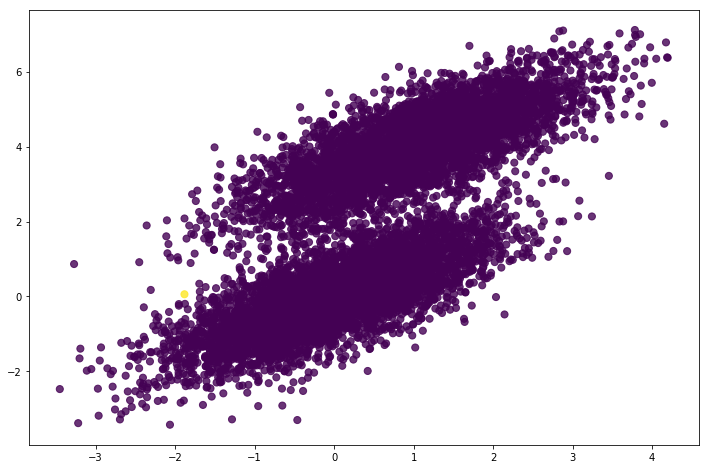

In [55]:
data_with_intercept = np.hstack((np.ones((simulated_separableish_features.shape[0], 1)),
                                 simulated_separableish_features))
final_scores = np.dot(data_with_intercept, weights)
preds = np.round(sigmoid(final_scores))

plt.figure(figsize = (12, 8))
plt.scatter(simulated_separableish_features[:, 0], simulated_separableish_features[:, 1],
            c = preds == simulated_labels - 1, alpha = .8, s = 50)